<a href="https://colab.research.google.com/github/HICHAMKALKHA/Storage-location-assignement-problem-/blob/main/Mid_point_storage_location_assignement_contribution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



```

```
# **I. Products clustering**

E-commerce dataset: downloadable from :https://www.kaggle.com/code/surekharamireddy/e-commerce-data-set

In [ ]:
! pip install -q kaggle

In [ ]:
!mkdir ~/.kaggle/

*Configure kaggle & colab*

In [ ]:
! cp '/content/drive/MyDrive/kaggle/kaggle.json' ~/.kaggle/

cp: cannot stat '/content/drive/MyDrive/kaggle/kaggle.json': No such file or directory


In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
! kaggle datasets list

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 403, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
! kaggle datasets download -d carrie1/ecommerce-data

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 403, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
! unzip /content/drive/MyDrive/kaggle/ecommerce-data.zip -d  SLAP_clustering

unzip:  cannot find or open /content/drive/MyDrive/kaggle/ecommerce-data.zip, /content/drive/MyDrive/kaggle/ecommerce-data.zip.zip or /content/drive/MyDrive/kaggle/ecommerce-data.zip.ZIP.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
Mydata = '/content/drive/MyDrive/kaggle/SLAP_clustering/data.csv'


Mounted at /content/drive


**Import libraries **

In [ ]:
!pip install tslearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 4.5 MB/s eta 0:00:00


In [ ]:
!pip install minisom

  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.1-py3-none-any.whl size=10589 sha256=191b4d3efd2897971817e97ac4a433e74e50bc017de02cf9635d79971fc8c4d5
  Stored in directory: /root/.cache/pip/wheels/c7/92/d2/33bbda5f86fd8830510b16aa98c8dd420129b5cb24248fd6db
Successfully built minisom


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from datetime import datetime
from itertools import accumulate
import os
import shutil
from google.colab import files
import matplotlib.pyplot as plt
from io import StringIO
from sklearn.cluster import DBSCAN
from tslearn.metrics import dtw_subsequence_path
from tslearn.clustering import TimeSeriesKMeans
import math
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from minisom import MiniSom
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
from keras.preprocessing.sequence import pad_sequences  # Import pad_sequences for padding
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
import numpy as np
from collections import defaultdict
from collections import Counter, defaultdict


In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')



```

```
# *Explore original data*

In [ ]:

# le nombre de lignes et de colonnes dans le DataFrame
nombre_de_lignes = data.shape
print("datashape :", nombre_de_lignes)

# Afficher les noms des colonnes
noms_des_colonnes = data.columns
print("columns :", noms_des_colonnes)

# periode_globale
periode_globale = data["InvoiceDate"].min(), data["InvoiceDate"].max()
print("business period :", periode_globale)

# compter le nombre de valeurs uniques dans la colonne "stockcode"
nombre_de_stockcode = data["StockCode"].nunique()
print("number of items :", nombre_de_stockcode)

datashape : (541909, 8)
columns : Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')
business period : ('1/10/2011 10:04', '9/9/2011 9:52')
number of items : 4070



```

```
# *Data Preprocessing*

1: Eliminate negative quantities

2: Identify top pareto ' 20% of items that generate 80% of mouvements (class A)

3: Convert invoiceDate&time to numbers

4: Merge quantities shipped in the same day for each Item.

5: Set dataframe uniform in lenght

6: Normalization (min-max scaler)



**1) Eliminate rows with negative quantity**

In [ ]:
data = data[data['Quantity'] >= 0]

**2) Identify top pareto ' 20% of items that generate 80% of mouvements (class A)**

In [ ]:
# Number of Items before filtering
num_stockcodes_before = len(data['StockCode'].unique())

# 20% of stockcodes that generate 80% of mouvements  (80% of impact)
stockcode_quantities = data.groupby('StockCode')['Quantity'].sum()
total_quantity = stockcode_quantities.sum()
stockcode_contributions = stockcode_quantities / total_quantity
sorted_stockcodes = stockcode_contributions.sort_values(ascending=False)
cumulative_contributions = sorted_stockcodes.cumsum()
top_20_threshold = int(len(sorted_stockcodes) * 0.2)
top_stockcodes = sorted_stockcodes.index[:top_20_threshold]

# Number of Items after filtering
num_stockcodes_after = len(top_stockcodes)



**3) Convert 'InvoiceDate' to day number**

In [ ]:
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate']).dt.minute + pd.to_datetime(data['InvoiceDate']).dt.dayofyear * 24 * 60


**4) Merge quantities shipped in the same day for each Item.**

In [ ]:

# 4)  Group data by InvoiceDate and StockCode, summing the Quantity
grouped_data = data[data['StockCode'].isin(top_stockcodes)].groupby(['InvoiceDate', 'StockCode'])['Quantity'].sum().reset_index()

# Generate new dataframes
mydataset = []
for stockcode in top_stockcodes:
    stock_data = grouped_data[grouped_data['StockCode'] == stockcode][['InvoiceDate', 'Quantity']]
    csv_file_path = f'{stockcode}.csv'
    stock_data.to_csv(csv_file_path, index=False)
    mydataset.append(csv_file_path)

# Identify the minimum number of rows in mydataset files
min_lines = float('inf')
for file_path in mydataset:
    file_data = pd.read_csv(file_path)
    num_lines = len(file_data)
    min_lines = min(min_lines, num_lines)

# Print the number of StockCodes before and after, and the length of mydataset
print("Number of Items before:", num_stockcodes_before)
print("Number of Items after 20/80 (length of mydataset):", len( mydataset))


Number of Items before: 3941
Number of Items after 20/80 (length of mydataset): 788


**6) Data normalization**

In [ ]:
# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# List to store normalized series; we prefer to work with csv files for debugging matter
mydataset_normalized = []

# Loop through each file path in mydataset
for file_path in mydataset:
    # Read the CSV data
    series_data = pd.read_csv(file_path)

    # Extract the columns we want to keep and normalize
    invoicedate_column = series_data['InvoiceDate']
    quantity_column = series_data['Quantity']

    # Normalize the quantity column and reshape it
    normalized_quantity = scaler.fit_transform(quantity_column.values.reshape(-1, 1))
    normalized_quantity = normalized_quantity.reshape(len(normalized_quantity))

    # Create a DataFrame with the normalized quantity and original invoicedate columns
    normalized_series_data = pd.DataFrame({f'InvoiceDate_{file_path}': invoicedate_column, f'Normalized_{file_path}': normalized_quantity})

    mydataset_normalized.append(normalized_series_data)

print("Normalization is done!")

Normalization is done!


In [ ]:
print(len(mydataset_normalized))

788


In [ ]:
print(mydataset_normalized)

[   InvoiceDate_23843.csv  Normalized_23843.csv
0                 493935                   0.0,      InvoiceDate_23166.csv  Normalized_23166.csv
0                    25921              1.000000
1                   190090              0.001280
2                   190091              0.000040
3                   190109              0.000054
4                   190132              0.000027
..                     ...                   ...
238                 491056              0.000013
239                 492508              0.000000
240                 492510              0.000013
241                 493923              0.000013
242                 493968              0.000633

[243 rows x 2 columns],       InvoiceDate_22197.csv  Normalized_22197.csv
0                      5790              0.004187
1                      5800              0.000698
2                      7256              0.000465
3                      8651              0.002094
4                      8654              


```

```
# *Clustering*

1: Hierarchical clustering

2: Self-Organizing Map (SOM)

3: K-Mean with dynamic time warping (DTW)



**1) Hierarchical clustering**



*Elbow method & Silhouette score to identify the best number of clusters*


<ipython-input-21-8c129644616d>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_3d = np.array([series.values for series in mydataset_normalized])
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings

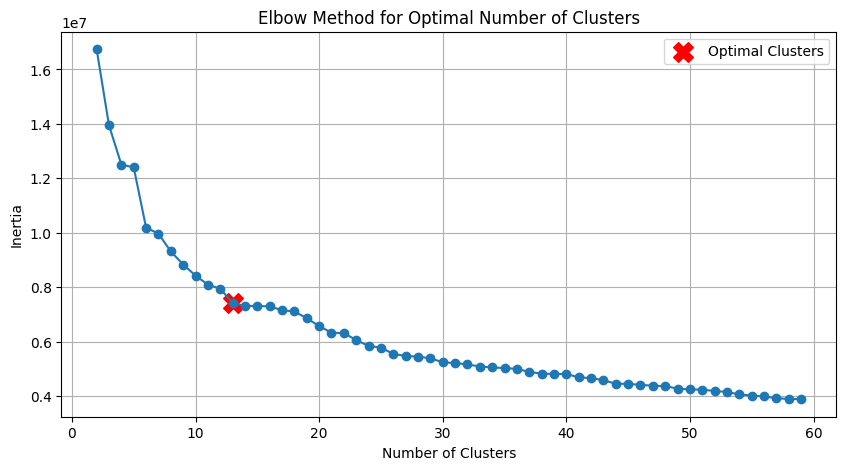

In [ ]:

# Assuming 'mydataset_normalized' is your dataset
data_3d = np.array([series.values for series in mydataset_normalized])

# Find the maximum length of time series
max_length = max(len(series) for series in mydataset_normalized)

# Pad or truncate each time series to the maximum length
data_2d_padded = pad_sequences(data_3d, maxlen=max_length, padding='post', dtype='float32', truncating='post')

# Reshape data_2d_padded into a 2D array
num_series, num_time_points = data_2d_padded.shape[:2]
data_2d = data_2d_padded.reshape(num_series, -1)

# Initialize a list to store the sum of squared distances (inertia) for each value of num_clusters
inertia_values = []

# Define a range of values for num_clusters to try
cluster_range = range(2, 60)

# Calculate inertia for each value of num_clusters
for num_clusters in cluster_range:
    # Perform hierarchical clustering
    clustering = AgglomerativeClustering(n_clusters=num_clusters, affinity='euclidean', linkage='complete')
    cluster_labels = clustering.fit_predict(data_2d)

    # Calculate inertia and append it to the list
    linked = linkage(data_2d, method='complete')
    inertia = linked[-(num_clusters - 1), 2]  # Inertia is the distance at which clusters merge
    inertia_values.append(inertia)

# Plot the elbow curve
plt.figure(figsize=(10, 5))
plt.plot(cluster_range, inertia_values, marker='o', linestyle='-')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)

# Highlight the optimal number of clusters (you can adjust this based on your interpretation of the plot)
optimal_clusters = 13
plt.scatter(optimal_clusters, inertia_values[optimal_clusters - 2], c='red', marker='X', s=200, label='Optimal Clusters')
plt.legend()

plt.show()


<ipython-input-22-ff9f435e8f50>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_3d = np.array([series.values for series in mydataset_normalized])
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


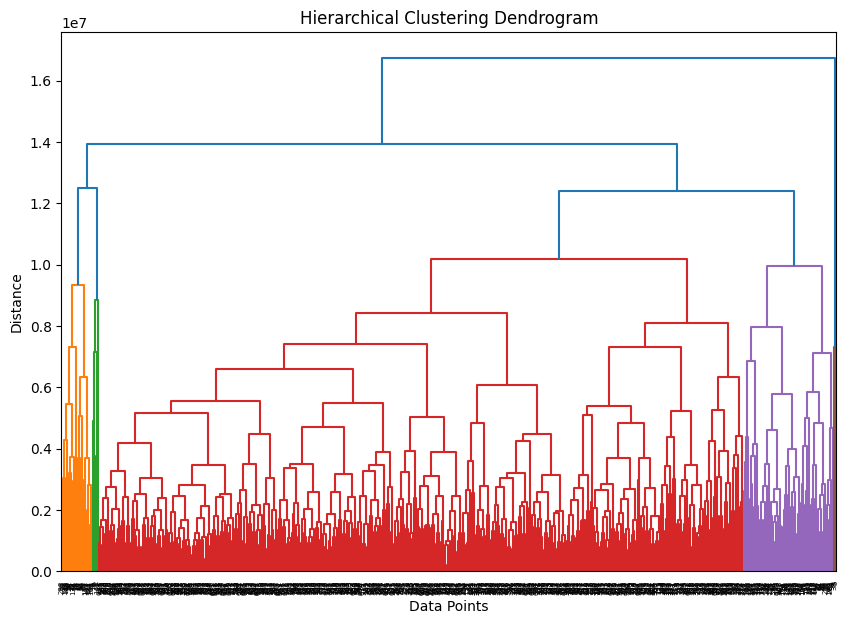

Average Silhouette Score: 0.2186
Cluster 0 contains files: 84077.csv, 22492.csv, 22616.csv, 15036.csv, 71459.csv, 22998.csv, 20971.csv, 22489.csv, 22988.csv, 84970S.csv, 21985.csv, 21094.csv, 23293.csv, 22417.csv, 22189.csv, 22029.csv, 22560.csv, 21891.csv, 23204.csv, 84692.csv, 21914.csv, 22951.csv, 84988.csv, 23200.csv, 21086.csv, 23170.csv, 22328.csv, 22595.csv, 22771.csv, 21121.csv, 21889.csv, 22585.csv, 22147.csv, 22149.csv, 22556.csv, 84970L.csv, 21231.csv, 22555.csv, 82600.csv, 84836.csv, 22561.csv, 23205.csv, 21210.csv, 22759.csv, 21668.csv, 22983.csv, 21669.csv, 22084.csv, 21976.csv, 22661.csv, 84997D.csv, 22652.csv, 84596B.csv, 20676.csv, 21672.csv, 20711.csv, 22900.csv, 22996.csv, 20718.csv, 22557.csv, 21169.csv, 22908.csv, 21670.csv, 82582.csv, 84375.csv, 21174.csv, 22553.csv, 21314.csv, 84997B.csv, 22297.csv, 22646.csv, 85150.csv, 21165.csv, 22219.csv, 22979.csv, 21154.csv, 21936.csv, 21238.csv, 15056N.csv, 21559.csv, 82581.csv, 22413.csv, 23182.csv, 21908.csv, 22367.csv, 

In [ ]:


data_3d = np.array([series.values for series in mydataset_normalized])
max_length = max(len(series) for series in mydataset_normalized)

# Pad or truncate each time series to the maximum length
data_2d_padded = pad_sequences(data_3d, maxlen=max_length, padding='post', dtype='float32', truncating='post')

# Reshape data_2d_padded into a 2D array
num_series, num_time_points = data_2d_padded.shape[:2]
data_2d = data_2d_padded.reshape(num_series, -1)

# Specify the number of clusters you want
num_clusters = 13 # obtained from the elbow method

# Perform hierarchical clustering
clustering = AgglomerativeClustering(n_clusters=num_clusters, affinity='euclidean', linkage='complete')#https://jbhender.github.io/Stats506/F18/GP/Group10.html ; ward linkage;
cluster_labels = clustering.fit_predict(data_2d)

# Create a linkage matrix for the dendrogram
linked = linkage(data_2d, method='complete')

# Create a dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Distance')
plt.show()

# Calculate silhouette score for the entire dataset
silhouette_avg = silhouette_score(data_2d, cluster_labels)
print(f"Average Silhouette Score: {silhouette_avg:.4f}")

# Create a dictionary to store file names in each cluster
cluster_files = {cluster: [] for cluster in range(num_clusters)}

# Assuming mydataset_normalized contains your CSV file names
file_names = [str(file_path) for file_path in mydataset]

# Assign file names to clusters based on cluster_labels
for i, label in enumerate(cluster_labels):
    cluster_files[label].append(file_names[i])

# Print the file names in each cluster
for cluster, files in cluster_files.items():
    print(f"Cluster {cluster} contains files: {', '.join(files)}")#ITEMS

# Create a DataFrame with the CSV file names and their cluster assignments
df_HC = pd.DataFrame({'Items': file_names, 'Cluster': cluster_labels})

# Save the DataFrame to an Excel file
df_HC.to_csv('hierarchical_cluster_assignments.csv', index=False)


In [ ]:
from google.colab import files
filename = 'hierarchical_cluster_assignments.csv'

# Save the file to your local machine
df_HC.to_csv(filename, index=False)
files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**2) Self-Organizing Map (SOM)**

In [ ]:


# Calculate the dimensions of the SOM grid ==> (length of our dataset)²
som_x = som_y = math.ceil(math.sqrt(math.sqrt(math.sqrt(len(mydataset_normalized)))))

# Prepare Reshape data to a 2D array and pad sequences
max_length = max(len(series) for series in mydataset_normalized)
data_2d_padded = pad_sequences([series[f'Normalized_{mydataset_normalized}'].values for series, mydataset_normalized in zip(mydataset_normalized, mydataset)],
                               maxlen=max_length, padding='post', dtype='float32', truncating='post')

# Flatten the padded 2D array
data_2d = data_2d_padded.reshape(data_2d_padded.shape[0], -1)

# The range of hyperparameter values for sigma and learning_rate
sigma_values = [0.1, 0.3, 0.5, 0.7, 1.0]
learning_rate_values = [0.1, 0.3, 0.5, 0.7, 1.0]

best_silhouette_score = -1
best_sigma = None
best_learning_rate = None

# Perform grid search
for sigma in sigma_values:
    for learning_rate in learning_rate_values:
        som = MiniSom(som_x, som_y, data_2d.shape[1], sigma=sigma, learning_rate=learning_rate)
        som.random_weights_init(data_2d)

        num_epochs = 600
        for epoch in range(num_epochs):
            data_point_idx = np.random.randint(data_2d.shape[0])
            som.update(data_2d[data_point_idx], som.winner(data_2d[data_point_idx]), epoch, num_epochs)

        cluster_assignments = np.array([som.winner(series)[0] * som_y + som.winner(series)[1] for series in data_2d])
        silhouette_avg = silhouette_score(data_2d, cluster_assignments)

        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_sigma = sigma
            best_learning_rate = learning_rate

# Print the best hyperparameters and silhouette score
print(f"Best sigma: {best_sigma}")
print(f"Best learning_rate: {best_learning_rate}")


Best sigma: 0.5
Best learning_rate: 1.0


In [ ]:


# Calculate the dimensions of the SOM grid==> (length of our dataset)²
som_x = som_y = math.ceil(math.sqrt(math.sqrt(math.sqrt(len(mydataset_normalized)))))

# Prepare data and pad sequences
max_length = max(len(series) for series in mydataset_normalized)
data_2d_padded = pad_sequences([series[f'Normalized_{mydataset_normalized}'].values for series, mydataset_normalized in zip(mydataset_normalized, mydataset)],
                               maxlen=max_length, padding='post', dtype='float32', truncating='post')

# Flatten the padded 2D array
data_2d = data_2d_padded.reshape(data_2d_padded.shape[0], -1)

# Create and train SOM
som = MiniSom(som_x, som_y, data_2d.shape[1], sigma=best_sigma, learning_rate=best_learning_rate)  # values obtained from hyperparameter tuning
som.random_weights_init(data_2d)
num_epochs = 600  # Adjusted manually
for epoch in range(num_epochs):
    data_point_idx = np.random.randint(data_2d.shape[0])
    som.update(data_2d[data_point_idx], som.winner(data_2d[data_point_idx]), epoch, num_epochs)

# Get cluster assignments
cluster_assignments = np.array([som.winner(series)[0] * som_y + som.winner(series)[1] for series in data_2d])

# Calculate silhouette score
silhouette_avg = silhouette_score(data_2d, cluster_assignments)

print(f"SOM clustering done!")
print(f"Silhouette Score: {silhouette_avg:.4f}")


SOM clustering done!
Silhouette Score: 0.1754


In [ ]:

# Count the occurrences of each cluster assignment
cluster_counts = Counter(cluster_assignments)

# Print the number of times each cluster appears
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster} contains {count} series")

# Create a dictionary to store file names in each cluster
cluster_files = defaultdict(list)

# Assuming mydataset_normalized contains your CSV file names
# Replace this with the actual list of file names
file_names = [str(mydataset_normalized) for mydataset_normalized in mydataset]

# Assign file names to clusters based on cluster_assignments
for i, label in enumerate(cluster_assignments):
    cluster_files[label].append(file_names[i])

# Print the CSV files in each cluster
for cluster, files in cluster_files.items():
    print(f"Cluster {cluster} contains files: {', '.join(files)}")


# Create a DataFrame with the CSV file names and their cluster assignments
df_som = pd.DataFrame({'Items': file_names, 'Cluster': cluster_assignments})

# Save the DataFrame to an Excel file
df_som.to_csv('som_cluster_assignments.csv', index=False)


Cluster 0 contains 753 series
Cluster 1 contains 21 series
Cluster 6 contains 2 series
Cluster 5 contains 1 series
Cluster 7 contains 1 series
Cluster 4 contains 1 series
Cluster 8 contains 4 series
Cluster 3 contains 4 series
Cluster 2 contains 1 series
Cluster 0 contains files: 23843.csv, 23166.csv, 22197.csv, 84077.csv, 85099B.csv, 85123A.csv, 84879.csv, 21212.csv, 23084.csv, 22492.csv, 22616.csv, 21977.csv, 22178.csv, 15036.csv, 21915.csv, 22386.csv, 23203.csv, 22086.csv, 84946.csv, 84991.csv, 22469.csv, 20724.csv, 85099F.csv, 84755.csv, 22961.csv, 22693.csv, 22952.csv, 21213.csv, 22151.csv, 23199.csv, 21790.csv, 22629.csv, 21731.csv, 85099C.csv, 22423.csv, 84568.csv, 84826.csv, 21931.csv, 71459.csv, 23201.csv, 84992.csv, 16014.csv, 20713.csv, 20719.csv, 21080.csv, 20668.csv, 21181.csv, 22993.csv, 22411.csv, 22383.csv, 22969.csv, 84978.csv, 22998.csv, 21975.csv, 20727.csv, 21175.csv, 23206.csv, 23307.csv, 23310.csv, 21232.csv, 20728.csv, 22630.csv, 21137.csv, 22659.csv, 23202.csv, 

In [ ]:
from google.colab import files
# Save the DataFrame to an Excel file
df_som.to_csv('som_cluster_assignments.csv', index=False)
files.download('som_cluster_assignments.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Cluster 0 contains 753 series
Cluster 1 contains 21 series
Cluster 6 contains 2 series
Cluster 5 contains 1 series
Cluster 7 contains 1 series
Cluster 4 contains 1 series
Cluster 8 contains 4 series
Cluster 3 contains 4 series
Cluster 2 contains 1 series
Cluster 0 contains files: 23843.csv, 23166.csv, 22197.csv, 84077.csv, 85099B.csv, 85123A.csv, 84879.csv, 21212.csv, 23084.csv, 22492.csv, 22616.csv, 21977.csv, 22178.csv, 15036.csv, 21915.csv, 22386.csv, 23203.csv, 22086.csv, 84946.csv, 84991.csv, 22469.csv, 20724.csv, 85099F.csv, 84755.csv, 22961.csv, 22693.csv, 22952.csv, 21213.csv, 22151.csv, 23199.csv, 21790.csv, 22629.csv, 21731.csv, 85099C.csv, 22423.csv, 84568.csv, 84826.csv, 21931.csv, 71459.csv, 23201.csv, 84992.csv, 16014.csv, 20713.csv, 20719.csv, 21080.csv, 20668.csv, 21181.csv, 22993.csv, 22411.csv, 22383.csv, 22969.csv, 84978.csv, 22998.csv, 21975.csv, 20727.csv, 21175.csv, 23206.csv, 23307.csv, 23310.csv, 21232.csv, 20728.csv, 22630.csv, 21137.csv, 22659.csv, 23202.csv, 

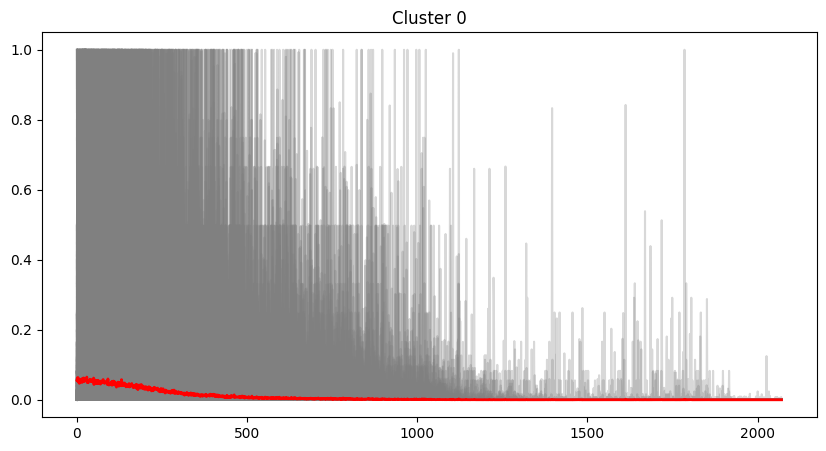

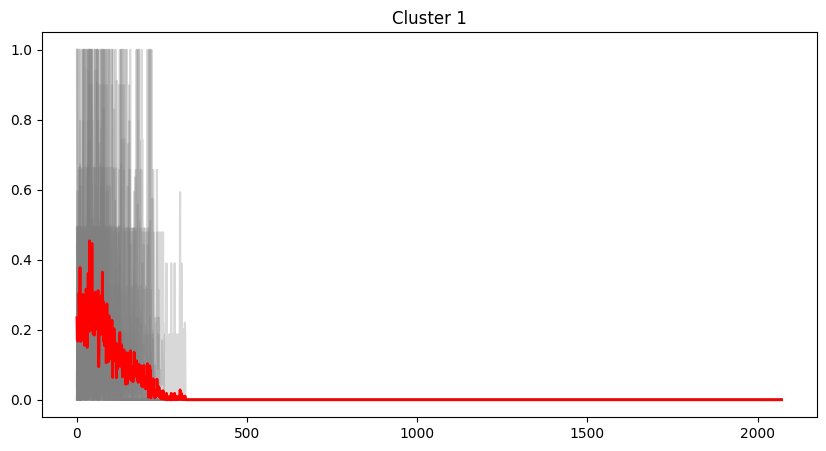

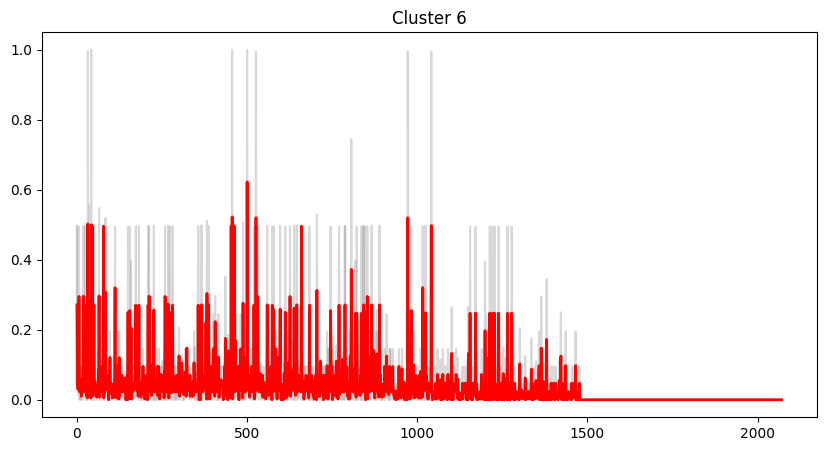

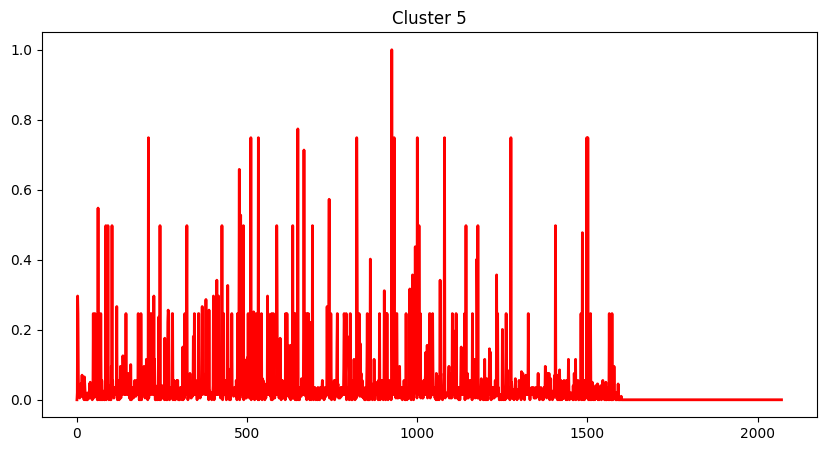

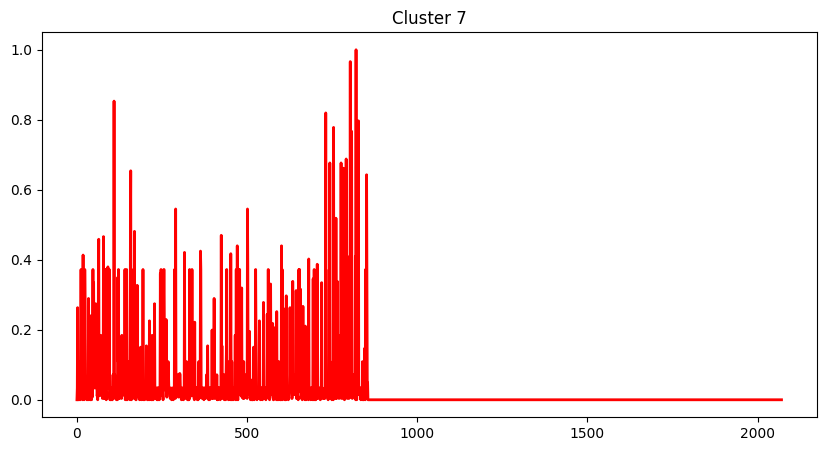

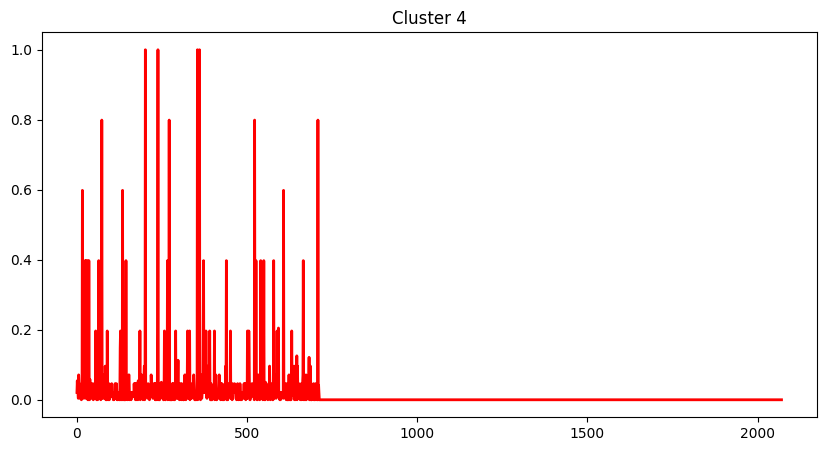

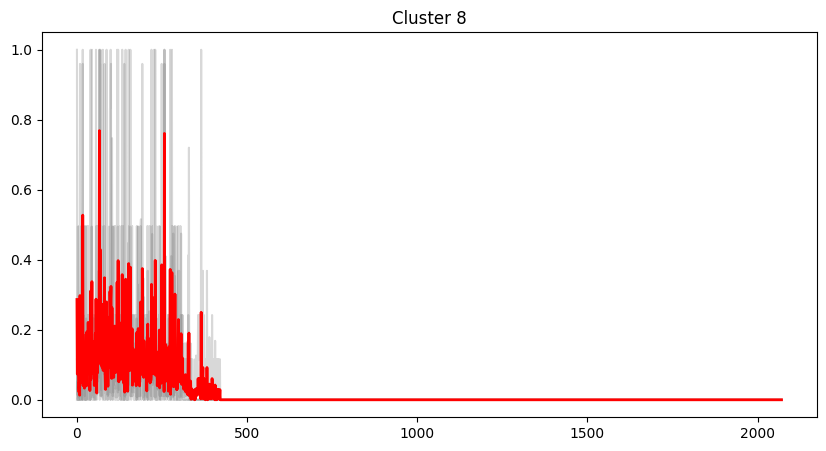

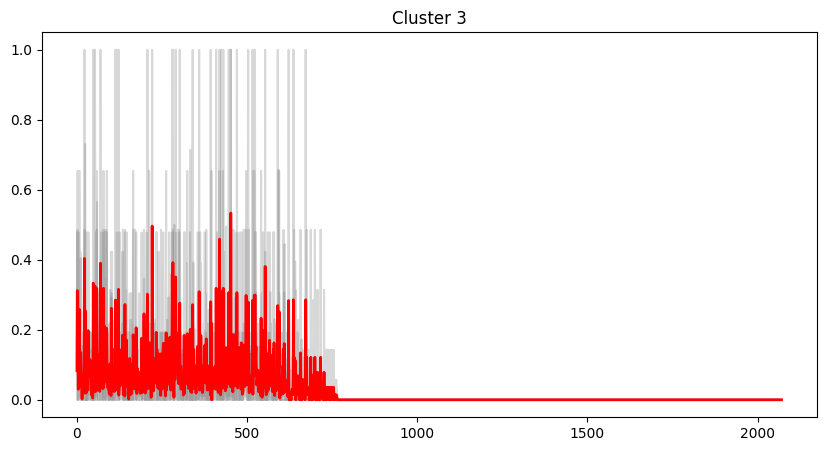

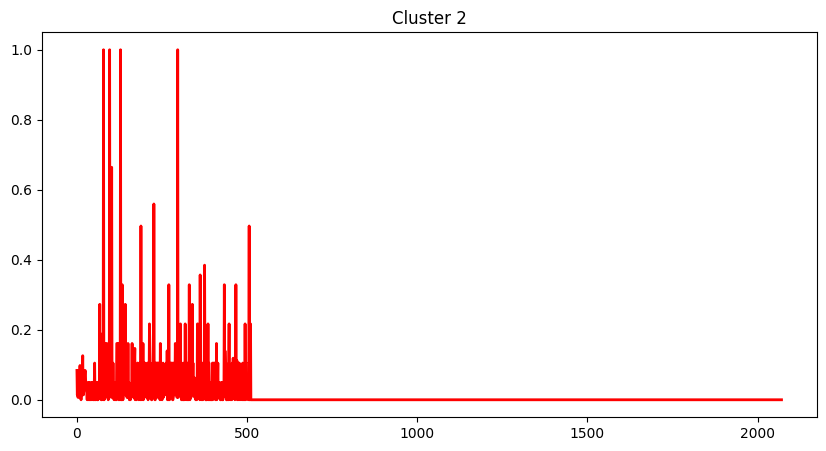

In [ ]:
from google.colab import files

# Count the occurrences of each cluster assignment
cluster_counts = defaultdict(int)
for label in cluster_assignments:
    cluster_counts[label] += 1

# Print the number of times each cluster appears
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster} contains {count} series")

# Create a dictionary to store file names in each cluster
cluster_files = defaultdict(list)

# Replace this with the actual list of file names
file_names = [str(file_path) for file_path in mydataset]

# Assign file names to clusters based on cluster_assignments
for i, label in enumerate(cluster_assignments):
    cluster_files[label].append(file_names[i])

# Print the CSV files in each cluster
for cluster, files in cluster_files.items():
    print(f"Cluster {cluster} contains files: {', '.join(files)}")

# Plot each cluster
for cluster in cluster_files.keys():
    plt.figure(figsize=(10, 5))
    plt.title(f"Cluster {cluster}")
    cluster_indices = np.where(cluster_assignments == cluster)[0]

    for i in cluster_indices:
        plt.plot(data_2d[i], color='gray', alpha=0.3)

    plt.plot(np.mean(data_2d[cluster_indices], axis=0), color='red', linewidth=2)
    plt.show()

# Create a DataFrame with the CSV file names and their cluster assignments
df_som = pd.DataFrame({'Items': file_names, 'Cluster': cluster_assignments})

# Save the DataFrame to an Excel file
df_som.to_csv('som_cluster_assignments.csv', index=False)


**3) K-Mean with dynamic time warping (DTW)**

In [ ]:
from sklearn.metrics import silhouette_score
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from keras.preprocessing.sequence import pad_sequences

# Pad sequences to a common length
max_length = max(len(series) for series in mydataset_normalized)
data_padded = pad_sequences(
    [series[f'Normalized_{file_path}'].values for series, file_path in zip(mydataset_normalized, mydataset)],
    maxlen=max_length, padding='post', dtype='float32', truncating='post'
)

# Rescale the padded data
data_rescaled = TimeSeriesScalerMeanVariance().fit_transform(data_padded)

# Flatten the padded 3D array
data_padded_flatten = data_padded.reshape(data_padded.shape[0], -1)

# Create and train TimeSeriesKMeans with DTW metric in parallel
num_clusters = 13  # Already defined by elbow method
kmeans = TimeSeriesKMeans(n_clusters=num_clusters, metric="euclidean", verbose=True, random_state=0, n_jobs=-1)
kmeans.fit(data_padded_flatten)

# Get cluster assignments from TimeSeriesKMeans
cluster_assignments_tskmeans = kmeans.labels_

# Calculate the average series for each cluster
cluster_series_tskmeans = {cluster: [] for cluster in np.unique(cluster_assignments_tskmeans)}
for i, cluster in enumerate(cluster_assignments_tskmeans):
    cluster_series_tskmeans[cluster].append(data_padded[i])

# Calculate silhouette score
silhouette_avg = silhouette_score(data_padded_flatten, cluster_assignments_tskmeans)

# Print the silhouette score
print(f"Silhouette Score: {silhouette_avg}")

print('K-Mean DTW clustering done!')


5.368 --> 3.947 --> 3.913 --> 3.900 --> 3.894 --> 3.889 --> 3.883 --> 3.879 --> 3.876 --> 3.873 --> 3.870 --> 3.864 --> 3.862 --> 3.858 --> 3.856 --> 3.854 --> 3.852 --> 3.851 --> 3.850 --> 3.850 --> 3.849 --> 3.846 --> 3.845 --> 3.843 --> 3.839 --> 3.839 --> 
Silhouette Score: -0.009669403545558453
K-Mean DTW clustering done!


5.368 --> 3.947 --> 3.913 --> 3.900 --> 3.894 --> 3.889 --> 3.883 --> 3.879 --> 3.876 --> 3.873 --> 3.870 --> 3.864 --> 3.862 --> 3.858 --> 3.856 --> 3.854 --> 3.852 --> 3.851 --> 3.850 --> 3.850 --> 3.849 --> 3.846 --> 3.845 --> 3.843 --> 3.839 --> 3.839 --> 


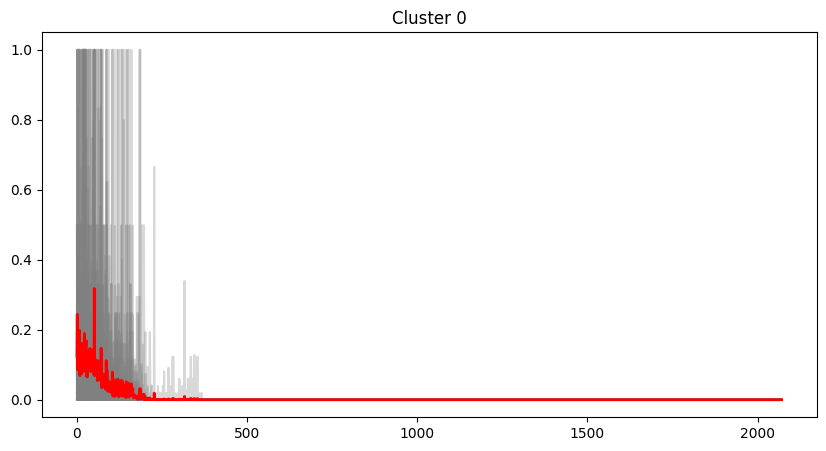

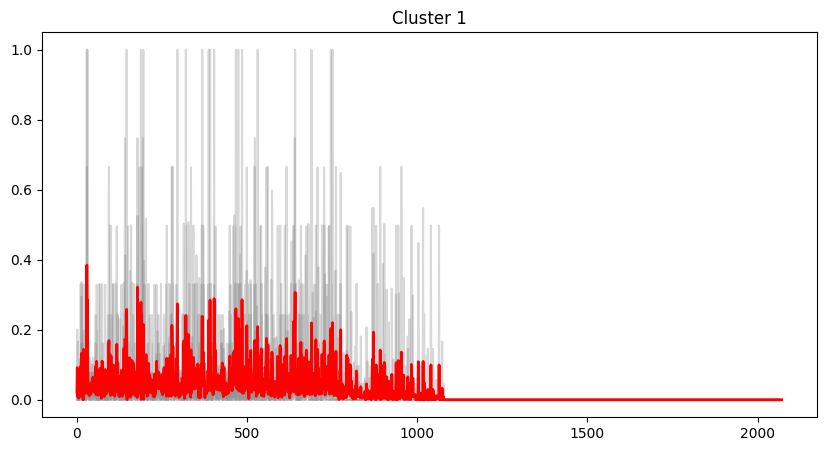

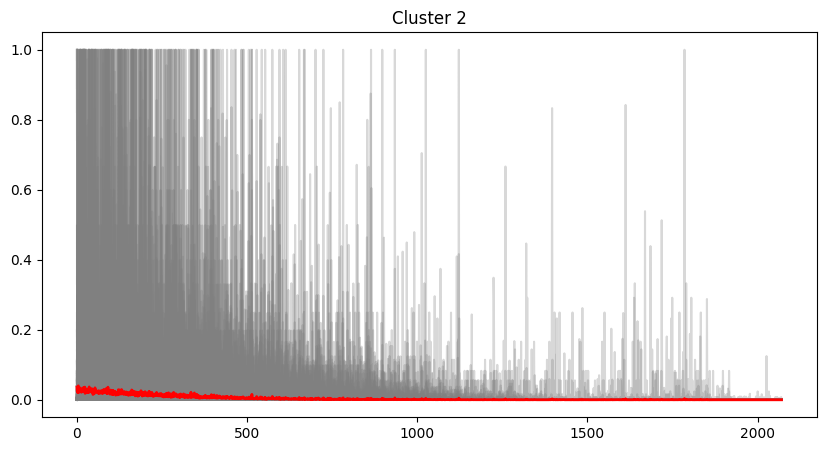

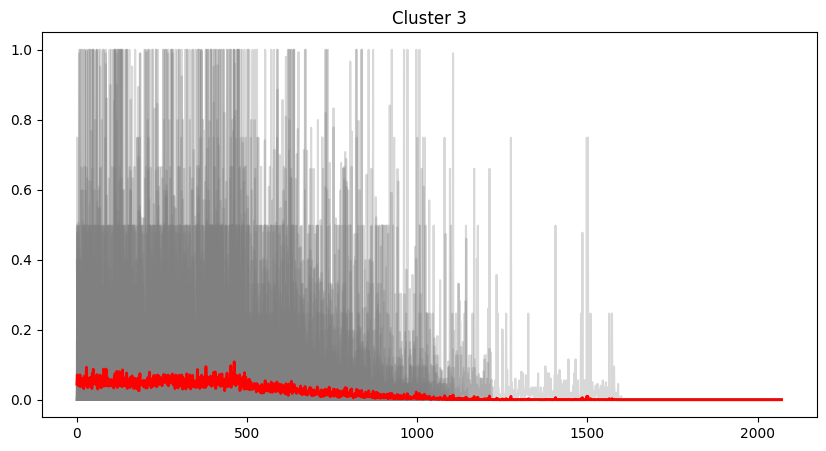

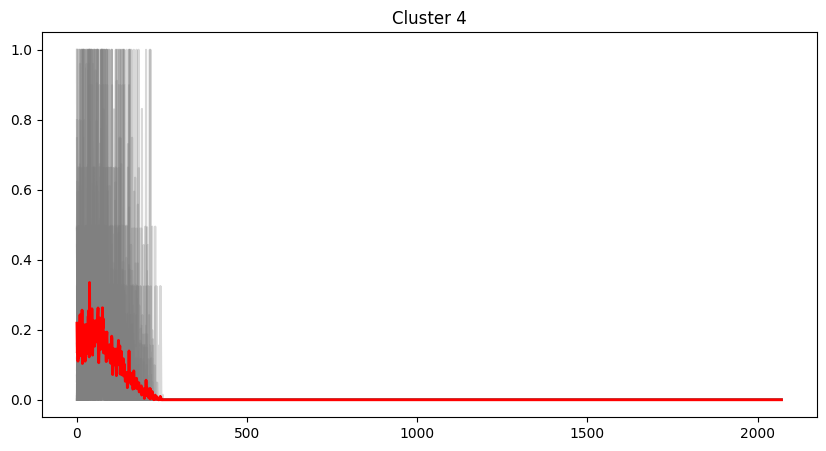

...

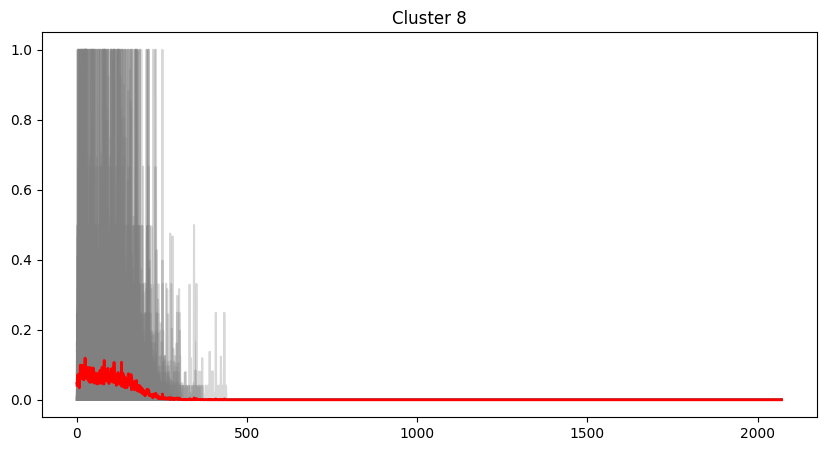

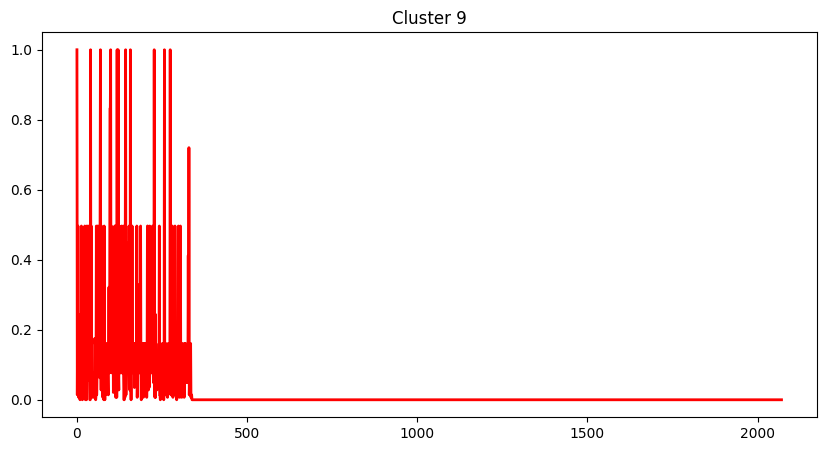

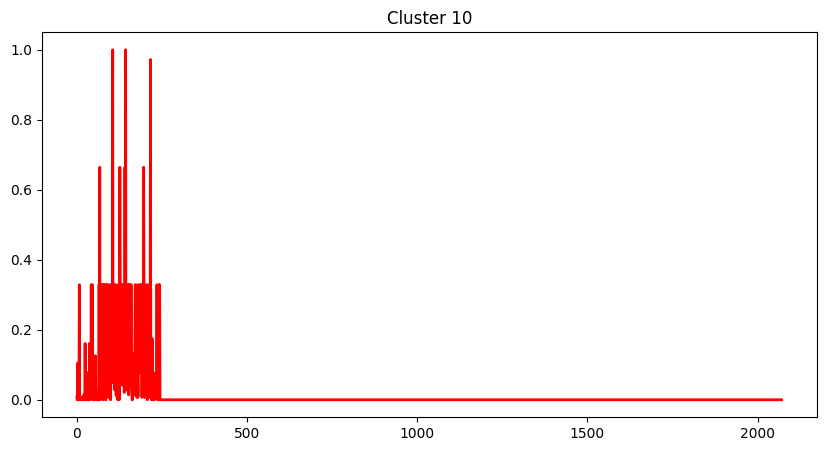

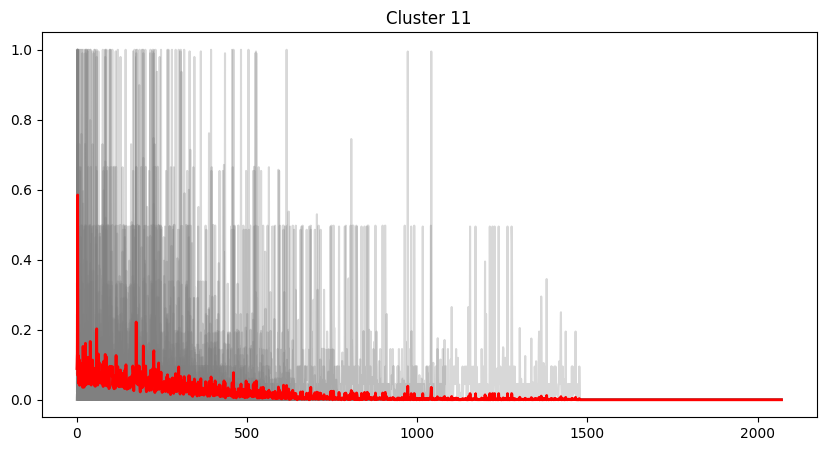

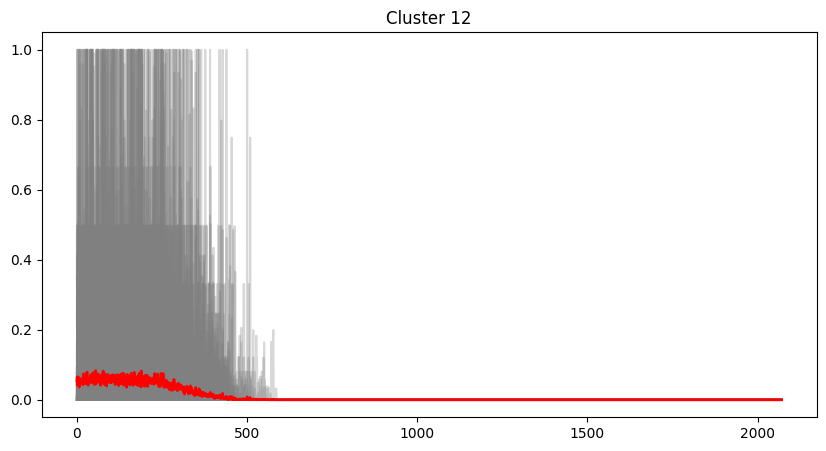

Silhouette Score: -0.009669403545558453


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from sklearn.metrics import silhouette_score
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from keras.preprocessing.sequence import pad_sequences
import matplotlib.pyplot as plt
import numpy as np
from google.colab import files

# Pad sequences to a common length
max_length = max(len(series) for series in mydataset_normalized)
data_padded = pad_sequences(
    [series[f'Normalized_{file_path}'].values for series, file_path in zip(mydataset_normalized, mydataset)],
    maxlen=max_length, padding='post', dtype='float32', truncating='post'
)

# Rescale the padded data
data_rescaled = TimeSeriesScalerMeanVariance().fit_transform(data_padded)

# Flatten the padded 3D array
data_padded_flatten = data_padded.reshape(data_padded.shape[0], -1)

# Create and train TimeSeriesKMeans with DTW metric in parallel
num_clusters = 13  # Already defined by elbow method
kmeans = TimeSeriesKMeans(n_clusters=num_clusters, metric="euclidean", verbose=True, random_state=0, n_jobs=-1)
kmeans.fit(data_padded_flatten)

# Get cluster assignments from TimeSeriesKMeans
cluster_assignments_tskmeans = kmeans.labels_

# Calculate the average series for each cluster
cluster_series_tskmeans = {cluster: [] for cluster in np.unique(cluster_assignments_tskmeans)}
for i, cluster in enumerate(cluster_assignments_tskmeans):
    cluster_series_tskmeans[cluster].append(data_padded[i])

# Calculate silhouette score
silhouette_avg = silhouette_score(data_padded_flatten, cluster_assignments_tskmeans)

# Plot each cluster and save the results
for cluster in cluster_series_tskmeans.keys():
    plt.figure(figsize=(10, 5))
    plt.title(f"Cluster {cluster}")
    cluster_indices = np.where(cluster_assignments_tskmeans == cluster)[0]

    for i in cluster_indices:
        plt.plot(data_padded_flatten[i], color='gray', alpha=0.3)

    plt.plot(np.mean(data_padded_flatten[cluster_indices], axis=0), color='red', linewidth=2)
    plt.show()

# Print the silhouette score
print(f"Silhouette Score: {silhouette_avg}")

# Create a DataFrame with the file names and their cluster assignments
df_tskmeans = pd.DataFrame({'Items': file_names, 'Cluster': cluster_assignments_tskmeans})

# Save the DataFrame to a CSV file
df_tskmeans.to_csv('tskmeans_cluster_assignments.csv', index=False)

# Download the CSV file
files.download('tskmeans_cluster_assignments.csv')


In [ ]:
from collections import Counter, defaultdict

# Get cluster assignments from cuml k-means
cluster_assignments_kmeans = kmeans.labels_

# Count the occurrences of each cluster assignment
cluster_counts = Counter(cluster_assignments_kmeans)

# Print the number of times each cluster appears
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster} contains {count} time series")

# Replace this with the actual list of file names
file_names = [str(file_path) for file_path in mydataset]

# Create a dictionary to store file names in each cluster
cluster_files = defaultdict(list)

# Assign file names to clusters based on cluster_assignments_kmeans
for i, cluster in enumerate(cluster_assignments_kmeans):
    cluster_files[cluster].append(file_names[i])

# Print the files in each cluster
for cluster, files in cluster_files.items():
    print(f"Cluster {cluster} contains files: {', '.join(files)}")

# Print silhouette score
print(f"Silhouette Score: {silhouette_avg}")

print('K-Mean euclidean metric clustering done!')


Cluster 2 contains 316 time series
Cluster 12 contains 135 time series
Cluster 11 contains 28 time series
Cluster 4 contains 37 time series
Cluster 3 contains 76 time series
Cluster 1 contains 5 time series
Cluster 6 contains 41 time series
Cluster 8 contains 105 time series
Cluster 9 contains 1 time series
Cluster 0 contains 35 time series
Cluster 7 contains 6 time series
Cluster 10 contains 1 time series
Cluster 5 contains 2 time series
Cluster 2 contains files: 23843.csv, 23166.csv, 22197.csv, 84077.csv, 85099B.csv, 85123A.csv, 84879.csv, 21212.csv, 23084.csv, 21977.csv, 22178.csv, 21915.csv, 22386.csv, 22086.csv, 84991.csv, 22469.csv, 85099F.csv, 22961.csv, 22693.csv, 21213.csv, 23199.csv, 22629.csv, 22423.csv, 84568.csv, 84826.csv, 84992.csv, 16014.csv, 20713.csv, 22969.csv, 21975.csv, 21175.csv, 23307.csv, 21232.csv, 22630.csv, 21137.csv, 20971.csv, 21928.csv, 79321.csv, 21108.csv, 23343.csv, 22470.csv, 22699.csv, 84347.csv, 21703.csv, 22457.csv, 82482.csv, 22909.csv, 16045.csv, 

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from keras.preprocessing.sequence import pad_sequences

from sklearn.metrics import silhouette_score

# Pad sequences to a common length
max_length = max(len(series) for series in mydataset_normalized)
data_padded = pad_sequences(
    [series[f'Normalized_{file_path}'].values for series, file_path in zip(mydataset_normalized, mydataset)],
    maxlen=max_length, padding='post', dtype='float32', truncating='post'
)

# Rescale the padded data using PyTorch
data_rescaled = TimeSeriesScalerMeanVariance().fit_transform(data_padded)
data_rescaled_torch = torch.tensor(data_rescaled)

# Flatten the padded 3D array in PyTorch
data_padded_flatten_torch = data_rescaled_torch.view(data_rescaled_torch.size(0), -1)

# Convert to NumPy for cuml (as it doesn't support PyTorch tensors)
data_padded_flatten_np = data_padded_flatten_torch.cpu().numpy()

# Create and train GPU-accelerated k-means using cuml with custom DTW distance
num_clusters = 13  # Adjust as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
kmeans.fit(data_padded_flatten_np)

# Get cluster assignments from cuml k-means
cluster_assignments_kmeans = kmeans.labels_

# Calculate silhouette score
silhouette_avg = silhouette_score(data_padded_flatten_np, cluster_assignments_kmeans)

# Print cluster assignments
print("Cluster Assignments (GPU-accelerated K-means dtw metric):", cluster_assignments_kmeans)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster Assignments (GPU-accelerated K-means dtw metric): [ 3  1  3  7  3  3  3  3  9  0  9  3  9  9  5  3  3  3  9 12  9 12 12  3
  3  9  3  9  9 10  9  9  2  9  9  3  9  9 12 11  3  3  9  3  9  1  3  9
  9  9  2 12  9  9  9  3  9  8  9  3 10  9  9  2 12  9  9  9  9  9  3  3
  9  9  0  0  0  9  3  9  9  9  0  9 11  9  3  3  9  3  3  9  9  9  0  6
 12  3  9  3  0  3 11  9  3  1  9  1  9  3  0  9  3  3  2  3 12  9  6 12
  9  0 12  8  3  9  0  3  9  6  9  0  2  9  9  9  1  9  9  3  4  1  9  9
  0  3  9  9  3  9  2  3  3  2  9  0 11  0  2  5  9  3 11  9  3  2  9  9
  7  2  9  7  0  9  0  0  5  9  0  2 10  9  9  3  9  6  3  1  9  9  1  8
  0 12  3  0  9  2  9  0  9  6  9 11  3  9  3  2  5  2  9  9  9  1  9  0
  1  9  9  9  9  1  1  9  5  0  0  0  9  4  3  3 11  3  0  0  0  5  1  0
  5  3  0  0  4  0  8  7  9  9  2  0  9  9  0  3  2  0  9  0  2  9  0  3
  5  6  0  2  3  0  2  3  0  8  3  0  2  9  9  8  9  9  0  5  3 12  9  8
  9  0  0  5  2  3  5  2  2  0 12  0  0  0  0  2  5  0  7  0  0  9

In [ ]:
from collections import Counter, defaultdict

# Get cluster assignments from cuml k-means
cluster_assignments_kmeans = kmeans.labels_

# Print the number of times each cluster appears
cluster_counts = Counter(cluster_assignments_kmeans)
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster} contains {count} time series")

file_names = [str(file_path) for file_path in mydataset]

# Assign file names to clusters based on cluster_assignments_kmeans
cluster_files = defaultdict(list)
for i, cluster in enumerate(cluster_assignments_kmeans):
    cluster_files[cluster].append(file_names[i])

for cluster, files in cluster_files.items():
    print(f"Cluster {cluster} contains files: {', '.join(files)}")

# Print silhouette score
print(f"Silhouette Score: {silhouette_avg}")

print('GPU-accelerated K-Mean DTW clustering done!')


Cluster 3 contains 107 time series
Cluster 1 contains 44 time series
Cluster 7 contains 18 time series
Cluster 9 contains 148 time series
Cluster 0 contains 152 time series
Cluster 5 contains 88 time series
Cluster 12 contains 16 time series
Cluster 10 contains 10 time series
Cluster 2 contains 139 time series
Cluster 11 contains 20 time series
Cluster 8 contains 15 time series
Cluster 6 contains 16 time series
Cluster 4 contains 15 time series
Cluster 3 contains files: 23843.csv, 22197.csv, 85099B.csv, 85123A.csv, 84879.csv, 21212.csv, 21977.csv, 21915.csv, 22386.csv, 23203.csv, 22355.csv, 22469.csv, 85099F.csv, 22629.csv, 84826.csv, 21931.csv, 23201.csv, 20713.csv, 22969.csv, 20727.csv, 21929.csv, 20971.csv, 21928.csv, 21108.csv, 23343.csv, 22470.csv, 22699.csv, 21703.csv, 22457.csv, 82482.csv, 16045.csv, 22960.csv, 22385.csv, 23298.csv, 21497.csv, 85152.csv, 21891.csv, 22727.csv, 22720.csv, 84988.csv, M.csv, 16161P.csv, 22379.csv, 22328.csv, 22726.csv, 23245.csv, 22149.csv, 82484.cs

In [ ]:
import pandas as pd
from google.colab import files

# Get cluster assignments from cuml k-means
cluster_assignments_kmeans = kmeans.labels_

df_dtw = pd.DataFrame({'Items': file_names, 'Cluster': cluster_assignments_kmeans})

# Save the cluster assignments to a CSV file
csv_filename = 'kmeans_dtw_cluster_assignments.csv'
df_dtw.to_csv(csv_filename, index=False)

# Download the CSV file
files.download(csv_filename)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


****


```

```
# **II. Picking simulation**



In [ ]:
#import distance matrix
from google.colab import drive
drive.mount('/content/drive')
distance_matrix = pd.read_excel('/content/drive/MyDrive/kaggle/SLAP_clustering/Distance matrix.xlsx')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).



```

```
# *Picking Methods and strategies*

A) Picking Strategie: S-Shape/ Picking Method: single order picking// ok  

B) Picking Strategie: S-Shape/ Picking Method: batch order picking  // bacth picking // Définir un batch de x order to be collected at once.

C) Picking Strategie: S-Shape/ Picking Method: Zone order picking// Définir la collect par cluster.

D) Picking Strategie: mid-Point/ Picking Method: single picker  // modify 40 par condition si <10>

E) Picking Strategie: mid-Point/ Picking Method:

F) Picking Strategie: mid-Point/ Picking Method: Zone order picking


### **Ps: We retain only the clustering method with the highest Silhouette score ==> Hierarchical clustering (HC)**
---



## D) Picking Strategie: mid-Point/ Picking Method: single picker






### **1) AI-driven storage location assignment clustering**

In [ ]:
import pandas as pd
from google.colab import files
# Load the 'hierarchical_cluster_assignments.csv' file
cluster_assignments = df_HC

# Sort the cluster assignments by 'Cluster' column
cluster_assignments = cluster_assignments.sort_values(by='Cluster')

# Calculate the number of items in each cluster
cluster_sizes = cluster_assignments['Cluster'].value_counts()

# Initialize Emplacement counter
emplacement_counter = 1

# Create a new DataFrame to store the results
result_df = pd.DataFrame(columns=['Items', 'Cluster', 'Emplacement'])

# Iterate through each cluster
for cluster, size in cluster_sizes.items():
    # Assign Emplacement values from emplacement_counter to emplacement_counter + size - 1
    result_df = pd.concat([result_df, cluster_assignments[cluster_assignments['Cluster'] == cluster]], ignore_index=True)
    result_df.loc[result_df['Cluster'] == cluster, 'Emplacement'] = list(range(emplacement_counter, emplacement_counter + size))

    # Update the Emplacement counter
    emplacement_counter += size
result_df['Items'] = result_df['Items'].str.replace('.csv', '')
# Save the result to a new CSV file
result_df.to_csv('cluster_emplacement_assignments_HC.csv', index=False)

# Download the Excel file to your local machine
files.download('cluster_emplacement_assignments_HC.csv')

<ipython-input-36-1497e4f2353b>:26: FutureWarning: The default value of regex will change from True to False in a future version.
  result_df['Items'] = result_df['Items'].str.replace('.csv', '')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

In [ ]:
print(data)

       InvoiceNo StockCode                          Description  Quantity  \
0         536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365     71053                  WHITE METAL LANTERN         6   
2         536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3         536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...       ...                                  ...       ...   
541904    581587     22613          PACK OF 20 SPACEBOY NAPKINS        12   
541905    581587     22899         CHILDREN'S APRON DOLLY GIRL          6   
541906    581587     23254        CHILDRENS CUTLERY DOLLY GIRL          4   
541907    581587     23255      CHILDRENS CUTLERY CIRCUS PARADE         4   
541908    581587     22138        BAKING SET 9 PIECE RETROSPOT          3   

            InvoiceDate  UnitPrice  CustomerID         Country  
0        1

In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

'Items' column in the data_df DataFrame:
True


In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

'Cluster' and 'Emplacement' columns in the merged DataFrame:
True
True


In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

       InvoiceNo   Items                          Description  Quantity  \
0         536365  85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365   71053                  WHITE METAL LANTERN         6   
2         536365  84406B       CREAM CUPID HEARTS COAT HANGER         8   
3         536365  84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365  84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...     ...                                  ...       ...   
541901    581587   22367      CHILDRENS APRON SPACEBOY DESIGN         8   
541902    581587   22629                  SPACEBOY LUNCH BOX         12   
541903    581587   23256          CHILDRENS CUTLERY SPACEBOY          4   
541905    581587   22899         CHILDREN'S APRON DOLLY GIRL          6   
541908    581587   22138        BAKING SET 9 PIECE RETROSPOT          3   

            InvoiceDate  UnitPrice  CustomerID         Country Cluster  \
0        12/1/2010 8:26  

In [ ]:
import pandas as pd



merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

       InvoiceNo   Items                          Description  Quantity  \
0         536365  84406B       CREAM CUPID HEARTS COAT HANGER         8   
1         536365   71053                  WHITE METAL LANTERN         6   
2         536365  84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
3         536365  84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365  85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
...          ...     ...                                  ...       ...   
320220   C581490   23144      ZINC T-LIGHT HOLDER STARS SMALL       -11   
320221   C581490   22178      VICTORIAN GLASS HANGING T-LIGHT       -12   
320222   C581499       M                               Manual        -1   
320223   C581569   20979        36 PENCILS TUBE RED RETROSPOT        -5   
320224   C581569   84978     HANGING HEART JAR T-LIGHT HOLDER        -1   

            InvoiceDate  UnitPrice  CustomerID         Country Cluster  \
0        12/1/2010 8:26  

<ipython-input-43-dd348cbe27ba>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')


In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store CSV files
output_directory = 'invoice_csv_files_HC'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over unique 'InvoiceNo'
for invoice_no in merged_df['InvoiceNo'].unique():
    # Filter data for the current 'InvoiceNo'
    invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

    # Check if the DataFrame is not empty
    if not invoice_data.empty:
        # Select relevant columns
        invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

        # Create a new column 'front/rear aisle' and fill it based on the conditions
        invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

        # Save the DataFrame to a CSV file
        csv_file_path = f"{output_directory}/Invoice_{invoice_no}.csv"
        invoice_csv_data.to_csv(csv_file_path, index=False)

        print(f"CSV file created for InvoiceNo {invoice_no} at {csv_file_path}")
    else:
        print(f"No data found for InvoiceNo {invoice_no}")

CSV file created for InvoiceNo 536365 at invoice_csv_files_HC/Invoice_536365.csv
CSV file created for InvoiceNo 536366 at invoice_csv_files_HC/Invoice_536366.csv
CSV file created for InvoiceNo 536367 at invoice_csv_files_HC/Invoice_536367.csv
CSV file created for InvoiceNo 536368 at invoice_csv_files_HC/Invoice_536368.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536370 at invoice_csv_files_HC/Invoice_536370.csv
CSV file created for InvoiceNo 536371 at invoice_csv_files_HC/Invoice_536371.csv
CSV file created for InvoiceNo 536372 at invoice_csv_files_HC/Invoice_536372.csv
CSV file created for InvoiceNo 536373 at invoice_csv_files_HC/Invoice_536373.csv
CSV file created for InvoiceNo 536375 at invoice_csv_files_HC/Invoice_536375.csv
CSV file created for InvoiceNo 536376 at invoice_csv_files_HC/Invoice_536376.csv
CSV file created for InvoiceNo 536377 at invoice_csv_files_HC/Invoice_536377.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536378 at invoice_csv_files_HC/Invoice_536378.csv
CSV file created for InvoiceNo 536380 at invoice_csv_files_HC/Invoice_536380.csv
CSV file created for InvoiceNo 536381 at invoice_csv_files_HC/Invoice_536381.csv
CSV file created for InvoiceNo 536382 at invoice_csv_files_HC/Invoice_536382.csv
CSV file created for InvoiceNo 536384 at invoice_csv_files_HC/Invoice_536384.csv
CSV file created for InvoiceNo 536385 at invoice_csv_files_HC/Invoice_536385.csv
CSV file created for InvoiceNo 536386 at invoice_csv_files_HC/Invoice_536386.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536387 at invoice_csv_files_HC/Invoice_536387.csv
CSV file created for InvoiceNo 536388 at invoice_csv_files_HC/Invoice_536388.csv
CSV file created for InvoiceNo 536389 at invoice_csv_files_HC/Invoice_536389.csv
CSV file created for InvoiceNo 536390 at invoice_csv_files_HC/Invoice_536390.csv
CSV file created for InvoiceNo 536392 at invoice_csv_files_HC/Invoice_536392.csv
CSV file created for InvoiceNo 536394 at invoice_csv_files_HC/Invoice_536394.csv
CSV file created for InvoiceNo 536395 at invoice_csv_files_HC/Invoice_536395.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536396 at invoice_csv_files_HC/Invoice_536396.csv
CSV file created for InvoiceNo 536398 at invoice_csv_files_HC/Invoice_536398.csv
CSV file created for InvoiceNo 536399 at invoice_csv_files_HC/Invoice_536399.csv
CSV file created for InvoiceNo 536400 at invoice_csv_files_HC/Invoice_536400.csv
CSV file created for InvoiceNo 536401 at invoice_csv_files_HC/Invoice_536401.csv
CSV file created for InvoiceNo 536402 at invoice_csv_files_HC/Invoice_536402.csv
CSV file created for InvoiceNo 536403 at invoice_csv_files_HC/Invoice_536403.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536404 at invoice_csv_files_HC/Invoice_536404.csv
CSV file created for InvoiceNo 536405 at invoice_csv_files_HC/Invoice_536405.csv
CSV file created for InvoiceNo 536406 at invoice_csv_files_HC/Invoice_536406.csv
CSV file created for InvoiceNo 536407 at invoice_csv_files_HC/Invoice_536407.csv
CSV file created for InvoiceNo 536408 at invoice_csv_files_HC/Invoice_536408.csv
CSV file created for InvoiceNo 536409 at invoice_csv_files_HC/Invoice_536409.csv
CSV file created for InvoiceNo 536412 at invoice_csv_files_HC/Invoice_536412.csv
CSV file created for InvoiceNo 536414 at invoice_csv_files_HC/Invoice_536414.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536415 at invoice_csv_files_HC/Invoice_536415.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536416 at invoice_csv_files_HC/Invoice_536416.csv
CSV file created for InvoiceNo 536420 at invoice_csv_files_HC/Invoice_536420.csv
CSV file created for InvoiceNo 536423 at invoice_csv_files_HC/Invoice_536423.csv
CSV file created for InvoiceNo 536425 at invoice_csv_files_HC/Invoice_536425.csv
CSV file created for InvoiceNo 536437 at invoice_csv_files_HC/Invoice_536437.csv
CSV file created for InvoiceNo 536446 at invoice_csv_files_HC/Invoice_536446.csv
CSV file created for InvoiceNo 536460 at invoice_csv_files_HC/Invoice_536460.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536463 at invoice_csv_files_HC/Invoice_536463.csv
CSV file created for InvoiceNo 536464 at invoice_csv_files_HC/Invoice_536464.csv
CSV file created for InvoiceNo 536466 at invoice_csv_files_HC/Invoice_536466.csv
CSV file created for InvoiceNo 536477 at invoice_csv_files_HC/Invoice_536477.csv
CSV file created for InvoiceNo 536488 at invoice_csv_files_HC/Invoice_536488.csv
CSV file created for InvoiceNo 536500 at invoice_csv_files_HC/Invoice_536500.csv
CSV file created for InvoiceNo 536502 at invoice_csv_files_HC/Invoice_536502.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536508 at invoice_csv_files_HC/Invoice_536508.csv
CSV file created for InvoiceNo 536514 at invoice_csv_files_HC/Invoice_536514.csv
CSV file created for InvoiceNo 536520 at invoice_csv_files_HC/Invoice_536520.csv
CSV file created for InvoiceNo 536522 at invoice_csv_files_HC/Invoice_536522.csv
CSV file created for InvoiceNo 536523 at invoice_csv_files_HC/Invoice_536523.csv
CSV file created for InvoiceNo 536524 at invoice_csv_files_HC/Invoice_536524.csv
CSV file created for InvoiceNo 536525 at invoice_csv_files_HC/Invoice_536525.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536526 at invoice_csv_files_HC/Invoice_536526.csv
CSV file created for InvoiceNo 536527 at invoice_csv_files_HC/Invoice_536527.csv
CSV file created for InvoiceNo 536528 at invoice_csv_files_HC/Invoice_536528.csv
CSV file created for InvoiceNo 536530 at invoice_csv_files_HC/Invoice_536530.csv
CSV file created for InvoiceNo 536531 at invoice_csv_files_HC/Invoice_536531.csv
CSV file created for InvoiceNo 536532 at invoice_csv_files_HC/Invoice_536532.csv
CSV file created for InvoiceNo 536533 at invoice_csv_files_HC/Invoice_536533.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536534 at invoice_csv_files_HC/Invoice_536534.csv
CSV file created for InvoiceNo 536535 at invoice_csv_files_HC/Invoice_536535.csv
CSV file created for InvoiceNo 536536 at invoice_csv_files_HC/Invoice_536536.csv
CSV file created for InvoiceNo 536537 at invoice_csv_files_HC/Invoice_536537.csv
CSV file created for InvoiceNo 536538 at invoice_csv_files_HC/Invoice_536538.csv
CSV file created for InvoiceNo 536539 at invoice_csv_files_HC/Invoice_536539.csv
CSV file created for InvoiceNo 536540 at invoice_csv_files_HC/Invoice_536540.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536541 at invoice_csv_files_HC/Invoice_536541.csv
CSV file created for InvoiceNo 536542 at invoice_csv_files_HC/Invoice_536542.csv
CSV file created for InvoiceNo 536544 at invoice_csv_files_HC/Invoice_536544.csv
CSV file created for InvoiceNo 536551 at invoice_csv_files_HC/Invoice_536551.csv
CSV file created for InvoiceNo 536555 at invoice_csv_files_HC/Invoice_536555.csv
CSV file created for InvoiceNo 536556 at invoice_csv_files_HC/Invoice_536556.csv
CSV file created for InvoiceNo 536557 at invoice_csv_files_HC/Invoice_536557.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536559 at invoice_csv_files_HC/Invoice_536559.csv
CSV file created for InvoiceNo 536560 at invoice_csv_files_HC/Invoice_536560.csv
CSV file created for InvoiceNo 536561 at invoice_csv_files_HC/Invoice_536561.csv
CSV file created for InvoiceNo 536562 at invoice_csv_files_HC/Invoice_536562.csv
CSV file created for InvoiceNo 536563 at invoice_csv_files_HC/Invoice_536563.csv
CSV file created for InvoiceNo 536566 at invoice_csv_files_HC/Invoice_536566.csv
CSV file created for InvoiceNo 536567 at invoice_csv_files_HC/Invoice_536567.csv
CSV file created for InvoiceNo 536568 at invoice_csv_files_HC/Invoice_536568.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536569 at invoice_csv_files_HC/Invoice_536569.csv
CSV file created for InvoiceNo 536570 at invoice_csv_files_HC/Invoice_536570.csv
CSV file created for InvoiceNo 536571 at invoice_csv_files_HC/Invoice_536571.csv
CSV file created for InvoiceNo 536572 at invoice_csv_files_HC/Invoice_536572.csv
CSV file created for InvoiceNo 536573 at invoice_csv_files_HC/Invoice_536573.csv
CSV file created for InvoiceNo 536575 at invoice_csv_files_HC/Invoice_536575.csv
CSV file created for InvoiceNo 536576 at invoice_csv_files_HC/Invoice_536576.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536577 at invoice_csv_files_HC/Invoice_536577.csv
CSV file created for InvoiceNo 536578 at invoice_csv_files_HC/Invoice_536578.csv
CSV file created for InvoiceNo 536579 at invoice_csv_files_HC/Invoice_536579.csv
CSV file created for InvoiceNo 536580 at invoice_csv_files_HC/Invoice_536580.csv
CSV file created for InvoiceNo 536581 at invoice_csv_files_HC/Invoice_536581.csv
CSV file created for InvoiceNo 536582 at invoice_csv_files_HC/Invoice_536582.csv
CSV file created for InvoiceNo 536583 at invoice_csv_files_HC/Invoice_536583.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536584 at invoice_csv_files_HC/Invoice_536584.csv
CSV file created for InvoiceNo 536586 at invoice_csv_files_HC/Invoice_536586.csv
CSV file created for InvoiceNo 536587 at invoice_csv_files_HC/Invoice_536587.csv
CSV file created for InvoiceNo 536588 at invoice_csv_files_HC/Invoice_536588.csv
CSV file created for InvoiceNo 536590 at invoice_csv_files_HC/Invoice_536590.csv
CSV file created for InvoiceNo 536591 at invoice_csv_files_HC/Invoice_536591.csv
CSV file created for InvoiceNo 536592 at invoice_csv_files_HC/Invoice_536592.csv
CSV file created for InvoiceNo 536594 at invoice_csv_files_HC/Invoice_536594.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536595 at invoice_csv_files_HC/Invoice_536595.csv
CSV file created for InvoiceNo 536596 at invoice_csv_files_HC/Invoice_536596.csv
CSV file created for InvoiceNo 536597 at invoice_csv_files_HC/Invoice_536597.csv
CSV file created for InvoiceNo 536598 at invoice_csv_files_HC/Invoice_536598.csv
CSV file created for InvoiceNo 536599 at invoice_csv_files_HC/Invoice_536599.csv
CSV file created for InvoiceNo 536600 at invoice_csv_files_HC/Invoice_536600.csv
CSV file created for InvoiceNo 536601 at invoice_csv_files_HC/Invoice_536601.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536602 at invoice_csv_files_HC/Invoice_536602.csv
CSV file created for InvoiceNo 536603 at invoice_csv_files_HC/Invoice_536603.csv
CSV file created for InvoiceNo 536604 at invoice_csv_files_HC/Invoice_536604.csv
CSV file created for InvoiceNo 536605 at invoice_csv_files_HC/Invoice_536605.csv
CSV file created for InvoiceNo 536607 at invoice_csv_files_HC/Invoice_536607.csv
CSV file created for InvoiceNo 536608 at invoice_csv_files_HC/Invoice_536608.csv
CSV file created for InvoiceNo 536609 at invoice_csv_files_HC/Invoice_536609.csv
CSV file created for InvoiceNo 536610 at invoice_csv_files_HC/Invoice_536610.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536611 at invoice_csv_files_HC/Invoice_536611.csv
CSV file created for InvoiceNo 536612 at invoice_csv_files_HC/Invoice_536612.csv
CSV file created for InvoiceNo 536613 at invoice_csv_files_HC/Invoice_536613.csv
CSV file created for InvoiceNo 536614 at invoice_csv_files_HC/Invoice_536614.csv
CSV file created for InvoiceNo 536615 at invoice_csv_files_HC/Invoice_536615.csv
CSV file created for InvoiceNo 536616 at invoice_csv_files_HC/Invoice_536616.csv
CSV file created for InvoiceNo 536617 at invoice_csv_files_HC/Invoice_536617.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536618 at invoice_csv_files_HC/Invoice_536618.csv
CSV file created for InvoiceNo 536619 at invoice_csv_files_HC/Invoice_536619.csv
CSV file created for InvoiceNo 536620 at invoice_csv_files_HC/Invoice_536620.csv
CSV file created for InvoiceNo 536621 at invoice_csv_files_HC/Invoice_536621.csv
CSV file created for InvoiceNo 536623 at invoice_csv_files_HC/Invoice_536623.csv
CSV file created for InvoiceNo 536624 at invoice_csv_files_HC/Invoice_536624.csv
CSV file created for InvoiceNo 536627 at invoice_csv_files_HC/Invoice_536627.csv
CSV file created for InvoiceNo 536628 at invoice_csv_files_HC/Invoice_536628.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536629 at invoice_csv_files_HC/Invoice_536629.csv
CSV file created for InvoiceNo 536630 at invoice_csv_files_HC/Invoice_536630.csv
CSV file created for InvoiceNo 536631 at invoice_csv_files_HC/Invoice_536631.csv
CSV file created for InvoiceNo 536632 at invoice_csv_files_HC/Invoice_536632.csv
CSV file created for InvoiceNo 536633 at invoice_csv_files_HC/Invoice_536633.csv
CSV file created for InvoiceNo 536634 at invoice_csv_files_HC/Invoice_536634.csv
CSV file created for InvoiceNo 536635 at invoice_csv_files_HC/Invoice_536635.csv
CSV file created for InvoiceNo 536636 at invoice_csv_files_HC/Invoice_536636.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536637 at invoice_csv_files_HC/Invoice_536637.csv
CSV file created for InvoiceNo 536638 at invoice_csv_files_HC/Invoice_536638.csv
CSV file created for InvoiceNo 536639 at invoice_csv_files_HC/Invoice_536639.csv
CSV file created for InvoiceNo 536640 at invoice_csv_files_HC/Invoice_536640.csv
CSV file created for InvoiceNo 536643 at invoice_csv_files_HC/Invoice_536643.csv
CSV file created for InvoiceNo 536663 at invoice_csv_files_HC/Invoice_536663.csv
CSV file created for InvoiceNo 536667 at invoice_csv_files_HC/Invoice_536667.csv
CSV file created for InvoiceNo 536670 at invoice_csv_files_HC/Invoice_536670.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536671 at invoice_csv_files_HC/Invoice_536671.csv
CSV file created for InvoiceNo 536672 at invoice_csv_files_HC/Invoice_536672.csv
CSV file created for InvoiceNo 536673 at invoice_csv_files_HC/Invoice_536673.csv
CSV file created for InvoiceNo 536674 at invoice_csv_files_HC/Invoice_536674.csv
CSV file created for InvoiceNo 536676 at invoice_csv_files_HC/Invoice_536676.csv
CSV file created for InvoiceNo 536681 at invoice_csv_files_HC/Invoice_536681.csv
CSV file created for InvoiceNo 536685 at invoice_csv_files_HC/Invoice_536685.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536688 at invoice_csv_files_HC/Invoice_536688.csv
CSV file created for InvoiceNo 536690 at invoice_csv_files_HC/Invoice_536690.csv
CSV file created for InvoiceNo 536693 at invoice_csv_files_HC/Invoice_536693.csv
CSV file created for InvoiceNo 536698 at invoice_csv_files_HC/Invoice_536698.csv
CSV file created for InvoiceNo 536707 at invoice_csv_files_HC/Invoice_536707.csv
CSV file created for InvoiceNo 536732 at invoice_csv_files_HC/Invoice_536732.csv
CSV file created for InvoiceNo 536733 at invoice_csv_files_HC/Invoice_536733.csv
CSV file created for InvoiceNo 536735 at invoice_csv_files_HC/Invoice_536735.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536736 at invoice_csv_files_HC/Invoice_536736.csv
CSV file created for InvoiceNo 536738 at invoice_csv_files_HC/Invoice_536738.csv
CSV file created for InvoiceNo 536739 at invoice_csv_files_HC/Invoice_536739.csv
CSV file created for InvoiceNo 536740 at invoice_csv_files_HC/Invoice_536740.csv
CSV file created for InvoiceNo 536741 at invoice_csv_files_HC/Invoice_536741.csv
CSV file created for InvoiceNo 536742 at invoice_csv_files_HC/Invoice_536742.csv
CSV file created for InvoiceNo 536743 at invoice_csv_files_HC/Invoice_536743.csv
CSV file created for InvoiceNo 536744 at invoice_csv_files_HC/Invoice_536744.csv
CSV file created for InvoiceNo 536745 at invoice_csv_files_HC/Invoice_536745.csv
CSV file created for InvoiceNo 536746 at invoice_csv_files_HC/Invoice_536746.csv
CSV file created for InvoiceNo 536747 at invoice_csv_files_HC/Invoice_536747.csv
CSV file created for InvoiceNo 536748 at invoice_csv_files_HC/Invoice_536748.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536751 at invoice_csv_files_HC/Invoice_536751.csv
CSV file created for InvoiceNo 536752 at invoice_csv_files_HC/Invoice_536752.csv
CSV file created for InvoiceNo 536753 at invoice_csv_files_HC/Invoice_536753.csv
CSV file created for InvoiceNo 536754 at invoice_csv_files_HC/Invoice_536754.csv
CSV file created for InvoiceNo 536755 at invoice_csv_files_HC/Invoice_536755.csv
CSV file created for InvoiceNo 536756 at invoice_csv_files_HC/Invoice_536756.csv
CSV file created for InvoiceNo 536759 at invoice_csv_files_HC/Invoice_536759.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536761 at invoice_csv_files_HC/Invoice_536761.csv
CSV file created for InvoiceNo 536762 at invoice_csv_files_HC/Invoice_536762.csv
CSV file created for InvoiceNo 536763 at invoice_csv_files_HC/Invoice_536763.csv
CSV file created for InvoiceNo 536769 at invoice_csv_files_HC/Invoice_536769.csv
CSV file created for InvoiceNo 536771 at invoice_csv_files_HC/Invoice_536771.csv
CSV file created for InvoiceNo 536777 at invoice_csv_files_HC/Invoice_536777.csv
CSV file created for InvoiceNo 536778 at invoice_csv_files_HC/Invoice_536778.csv
CSV file created for InvoiceNo 536780 at invoice_csv_files_HC/Invoice_536780.csv
CSV file created for InvoiceNo 536781 at invoice_csv_files_HC/Invoice_536781.csv
CSV file created for InvoiceNo 536782 at invoice_csv_files_HC/Invoice_536782.csv
CSV file created for InvoiceNo 536783 at invoice_csv_files_HC/Invoice_536783.csv
CSV file created for InvoiceNo 536784 at invoice_csv_files_HC/Invoice_536784.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536786 at invoice_csv_files_HC/Invoice_536786.csv
CSV file created for InvoiceNo 536787 at invoice_csv_files_HC/Invoice_536787.csv
CSV file created for InvoiceNo 536788 at invoice_csv_files_HC/Invoice_536788.csv
CSV file created for InvoiceNo 536789 at invoice_csv_files_HC/Invoice_536789.csv
CSV file created for InvoiceNo 536790 at invoice_csv_files_HC/Invoice_536790.csv
CSV file created for InvoiceNo 536791 at invoice_csv_files_HC/Invoice_536791.csv
CSV file created for InvoiceNo 536792 at invoice_csv_files_HC/Invoice_536792.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536793 at invoice_csv_files_HC/Invoice_536793.csv
CSV file created for InvoiceNo 536794 at invoice_csv_files_HC/Invoice_536794.csv
CSV file created for InvoiceNo 536795 at invoice_csv_files_HC/Invoice_536795.csv
CSV file created for InvoiceNo 536796 at invoice_csv_files_HC/Invoice_536796.csv
CSV file created for InvoiceNo 536797 at invoice_csv_files_HC/Invoice_536797.csv
CSV file created for InvoiceNo 536798 at invoice_csv_files_HC/Invoice_536798.csv
CSV file created for InvoiceNo 536799 at invoice_csv_files_HC/Invoice_536799.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536800 at invoice_csv_files_HC/Invoice_536800.csv
CSV file created for InvoiceNo 536801 at invoice_csv_files_HC/Invoice_536801.csv
CSV file created for InvoiceNo 536802 at invoice_csv_files_HC/Invoice_536802.csv
CSV file created for InvoiceNo 536803 at invoice_csv_files_HC/Invoice_536803.csv
CSV file created for InvoiceNo 536804 at invoice_csv_files_HC/Invoice_536804.csv
CSV file created for InvoiceNo 536805 at invoice_csv_files_HC/Invoice_536805.csv
CSV file created for InvoiceNo 536806 at invoice_csv_files_HC/Invoice_536806.csv
CSV file created for InvoiceNo 536808 at invoice_csv_files_HC/Invoice_536808.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536809 at invoice_csv_files_HC/Invoice_536809.csv
CSV file created for InvoiceNo 536810 at invoice_csv_files_HC/Invoice_536810.csv
CSV file created for InvoiceNo 536813 at invoice_csv_files_HC/Invoice_536813.csv
CSV file created for InvoiceNo 536819 at invoice_csv_files_HC/Invoice_536819.csv
CSV file created for InvoiceNo 536821 at invoice_csv_files_HC/Invoice_536821.csv
CSV file created for InvoiceNo 536823 at invoice_csv_files_HC/Invoice_536823.csv
CSV file created for InvoiceNo 536824 at invoice_csv_files_HC/Invoice_536824.csv
CSV file created for InvoiceNo 536830 at invoice_csv_files_HC/Invoice_536830.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536831 at invoice_csv_files_HC/Invoice_536831.csv
CSV file created for InvoiceNo 536832 at invoice_csv_files_HC/Invoice_536832.csv
CSV file created for InvoiceNo 536833 at invoice_csv_files_HC/Invoice_536833.csv
CSV file created for InvoiceNo 536836 at invoice_csv_files_HC/Invoice_536836.csv
CSV file created for InvoiceNo 536837 at invoice_csv_files_HC/Invoice_536837.csv
CSV file created for InvoiceNo 536838 at invoice_csv_files_HC/Invoice_536838.csv
CSV file created for InvoiceNo 536839 at invoice_csv_files_HC/Invoice_536839.csv
CSV file created for InvoiceNo 536840 at invoice_csv_files_HC/Invoice_536840.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536841 at invoice_csv_files_HC/Invoice_536841.csv
CSV file created for InvoiceNo 536842 at invoice_csv_files_HC/Invoice_536842.csv
CSV file created for InvoiceNo 536843 at invoice_csv_files_HC/Invoice_536843.csv
CSV file created for InvoiceNo 536844 at invoice_csv_files_HC/Invoice_536844.csv
CSV file created for InvoiceNo 536845 at invoice_csv_files_HC/Invoice_536845.csv
CSV file created for InvoiceNo 536846 at invoice_csv_files_HC/Invoice_536846.csv
CSV file created for InvoiceNo 536847 at invoice_csv_files_HC/Invoice_536847.csv
CSV file created for InvoiceNo 536848 at invoice_csv_files_HC/Invoice_536848.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536849 at invoice_csv_files_HC/Invoice_536849.csv
CSV file created for InvoiceNo 536851 at invoice_csv_files_HC/Invoice_536851.csv
CSV file created for InvoiceNo 536852 at invoice_csv_files_HC/Invoice_536852.csv
CSV file created for InvoiceNo 536856 at invoice_csv_files_HC/Invoice_536856.csv
CSV file created for InvoiceNo 536857 at invoice_csv_files_HC/Invoice_536857.csv
CSV file created for InvoiceNo 536858 at invoice_csv_files_HC/Invoice_536858.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536859 at invoice_csv_files_HC/Invoice_536859.csv
CSV file created for InvoiceNo 536860 at invoice_csv_files_HC/Invoice_536860.csv
CSV file created for InvoiceNo 536861 at invoice_csv_files_HC/Invoice_536861.csv
CSV file created for InvoiceNo 536862 at invoice_csv_files_HC/Invoice_536862.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536863 at invoice_csv_files_HC/Invoice_536863.csv
CSV file created for InvoiceNo 536864 at invoice_csv_files_HC/Invoice_536864.csv
CSV file created for InvoiceNo 536865 at invoice_csv_files_HC/Invoice_536865.csv
CSV file created for InvoiceNo 536874 at invoice_csv_files_HC/Invoice_536874.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536876 at invoice_csv_files_HC/Invoice_536876.csv
CSV file created for InvoiceNo 536883 at invoice_csv_files_HC/Invoice_536883.csv
CSV file created for InvoiceNo 536884 at invoice_csv_files_HC/Invoice_536884.csv
CSV file created for InvoiceNo 536885 at invoice_csv_files_HC/Invoice_536885.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536890 at invoice_csv_files_HC/Invoice_536890.csv
CSV file created for InvoiceNo 536920 at invoice_csv_files_HC/Invoice_536920.csv
CSV file created for InvoiceNo 536938 at invoice_csv_files_HC/Invoice_536938.csv
CSV file created for InvoiceNo 536941 at invoice_csv_files_HC/Invoice_536941.csv
CSV file created for InvoiceNo 536942 at invoice_csv_files_HC/Invoice_536942.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536943 at invoice_csv_files_HC/Invoice_536943.csv
CSV file created for InvoiceNo 536944 at invoice_csv_files_HC/Invoice_536944.csv
CSV file created for InvoiceNo 536945 at invoice_csv_files_HC/Invoice_536945.csv
CSV file created for InvoiceNo 536946 at invoice_csv_files_HC/Invoice_536946.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536947 at invoice_csv_files_HC/Invoice_536947.csv
CSV file created for InvoiceNo 536956 at invoice_csv_files_HC/Invoice_536956.csv
CSV file created for InvoiceNo 536957 at invoice_csv_files_HC/Invoice_536957.csv
CSV file created for InvoiceNo 536960 at invoice_csv_files_HC/Invoice_536960.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536967 at invoice_csv_files_HC/Invoice_536967.csv
CSV file created for InvoiceNo 536968 at invoice_csv_files_HC/Invoice_536968.csv
CSV file created for InvoiceNo 536969 at invoice_csv_files_HC/Invoice_536969.csv
CSV file created for InvoiceNo 536970 at invoice_csv_files_HC/Invoice_536970.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536971 at invoice_csv_files_HC/Invoice_536971.csv
CSV file created for InvoiceNo 536972 at invoice_csv_files_HC/Invoice_536972.csv
CSV file created for InvoiceNo 536973 at invoice_csv_files_HC/Invoice_536973.csv
CSV file created for InvoiceNo 536974 at invoice_csv_files_HC/Invoice_536974.csv
CSV file created for InvoiceNo 536975 at invoice_csv_files_HC/Invoice_536975.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536976 at invoice_csv_files_HC/Invoice_536976.csv
CSV file created for InvoiceNo 536977 at invoice_csv_files_HC/Invoice_536977.csv
CSV file created for InvoiceNo 536980 at invoice_csv_files_HC/Invoice_536980.csv
CSV file created for InvoiceNo 536981 at invoice_csv_files_HC/Invoice_536981.csv
CSV file created for InvoiceNo 536982 at invoice_csv_files_HC/Invoice_536982.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536983 at invoice_csv_files_HC/Invoice_536983.csv
CSV file created for InvoiceNo 536984 at invoice_csv_files_HC/Invoice_536984.csv
CSV file created for InvoiceNo 536985 at invoice_csv_files_HC/Invoice_536985.csv
CSV file created for InvoiceNo 536986 at invoice_csv_files_HC/Invoice_536986.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536987 at invoice_csv_files_HC/Invoice_536987.csv
CSV file created for InvoiceNo 536988 at invoice_csv_files_HC/Invoice_536988.csv
CSV file created for InvoiceNo 536989 at invoice_csv_files_HC/Invoice_536989.csv
CSV file created for InvoiceNo 536990 at invoice_csv_files_HC/Invoice_536990.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 536991 at invoice_csv_files_HC/Invoice_536991.csv
CSV file created for InvoiceNo 536993 at invoice_csv_files_HC/Invoice_536993.csv
CSV file created for InvoiceNo 536996 at invoice_csv_files_HC/Invoice_536996.csv
CSV file created for InvoiceNo 536997 at invoice_csv_files_HC/Invoice_536997.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537007 at invoice_csv_files_HC/Invoice_537007.csv
CSV file created for InvoiceNo 537011 at invoice_csv_files_HC/Invoice_537011.csv
CSV file created for InvoiceNo 537012 at invoice_csv_files_HC/Invoice_537012.csv
CSV file created for InvoiceNo 537017 at invoice_csv_files_HC/Invoice_537017.csv
CSV file created for InvoiceNo 537022 at invoice_csv_files_HC/Invoice_537022.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537023 at invoice_csv_files_HC/Invoice_537023.csv
CSV file created for InvoiceNo 537025 at invoice_csv_files_HC/Invoice_537025.csv
CSV file created for InvoiceNo 537026 at invoice_csv_files_HC/Invoice_537026.csv
CSV file created for InvoiceNo 537030 at invoice_csv_files_HC/Invoice_537030.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537031 at invoice_csv_files_HC/Invoice_537031.csv
CSV file created for InvoiceNo 537034 at invoice_csv_files_HC/Invoice_537034.csv
CSV file created for InvoiceNo 537036 at invoice_csv_files_HC/Invoice_537036.csv
CSV file created for InvoiceNo 537037 at invoice_csv_files_HC/Invoice_537037.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537038 at invoice_csv_files_HC/Invoice_537038.csv
CSV file created for InvoiceNo 537040 at invoice_csv_files_HC/Invoice_537040.csv
CSV file created for InvoiceNo 537041 at invoice_csv_files_HC/Invoice_537041.csv
CSV file created for InvoiceNo 537042 at invoice_csv_files_HC/Invoice_537042.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537044 at invoice_csv_files_HC/Invoice_537044.csv
CSV file created for InvoiceNo 537045 at invoice_csv_files_HC/Invoice_537045.csv
CSV file created for InvoiceNo 537046 at invoice_csv_files_HC/Invoice_537046.csv
CSV file created for InvoiceNo 537047 at invoice_csv_files_HC/Invoice_537047.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537049 at invoice_csv_files_HC/Invoice_537049.csv
CSV file created for InvoiceNo 537050 at invoice_csv_files_HC/Invoice_537050.csv
CSV file created for InvoiceNo 537051 at invoice_csv_files_HC/Invoice_537051.csv
CSV file created for InvoiceNo 537052 at invoice_csv_files_HC/Invoice_537052.csv
CSV file created for InvoiceNo 537053 at invoice_csv_files_HC/Invoice_537053.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537054 at invoice_csv_files_HC/Invoice_537054.csv
CSV file created for InvoiceNo 537055 at invoice_csv_files_HC/Invoice_537055.csv
CSV file created for InvoiceNo 537057 at invoice_csv_files_HC/Invoice_537057.csv
CSV file created for InvoiceNo 537058 at invoice_csv_files_HC/Invoice_537058.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537059 at invoice_csv_files_HC/Invoice_537059.csv
CSV file created for InvoiceNo 537065 at invoice_csv_files_HC/Invoice_537065.csv
CSV file created for InvoiceNo 537067 at invoice_csv_files_HC/Invoice_537067.csv
CSV file created for InvoiceNo 537077 at invoice_csv_files_HC/Invoice_537077.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537081 at invoice_csv_files_HC/Invoice_537081.csv
CSV file created for InvoiceNo 537086 at invoice_csv_files_HC/Invoice_537086.csv
CSV file created for InvoiceNo 537090 at invoice_csv_files_HC/Invoice_537090.csv
CSV file created for InvoiceNo 537111 at invoice_csv_files_HC/Invoice_537111.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537117 at invoice_csv_files_HC/Invoice_537117.csv
CSV file created for InvoiceNo 537126 at invoice_csv_files_HC/Invoice_537126.csv
CSV file created for InvoiceNo 537127 at invoice_csv_files_HC/Invoice_537127.csv
CSV file created for InvoiceNo 537128 at invoice_csv_files_HC/Invoice_537128.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537129 at invoice_csv_files_HC/Invoice_537129.csv
CSV file created for InvoiceNo 537130 at invoice_csv_files_HC/Invoice_537130.csv
CSV file created for InvoiceNo 537131 at invoice_csv_files_HC/Invoice_537131.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)


CSV file created for InvoiceNo 537133 at invoice_csv_files_HC/Invoice_537133.csv
CSV file created for InvoiceNo 537134 at invoice_csv_files_HC/Invoice_537134.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)


CSV file created for InvoiceNo 537135 at invoice_csv_files_HC/Invoice_537135.csv
CSV file created for InvoiceNo 537136 at invoice_csv_files_HC/Invoice_537136.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537137 at invoice_csv_files_HC/Invoice_537137.csv
CSV file created for InvoiceNo 537138 at invoice_csv_files_HC/Invoice_537138.csv
CSV file created for InvoiceNo 537139 at invoice_csv_files_HC/Invoice_537139.csv
CSV file created for InvoiceNo 537140 at invoice_csv_files_HC/Invoice_537140.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537141 at invoice_csv_files_HC/Invoice_537141.csv
CSV file created for InvoiceNo 537142 at invoice_csv_files_HC/Invoice_537142.csv
CSV file created for InvoiceNo 537144 at invoice_csv_files_HC/Invoice_537144.csv
CSV file created for InvoiceNo 537153 at invoice_csv_files_HC/Invoice_537153.csv
CSV file created for InvoiceNo 537154 at invoice_csv_files_HC/Invoice_537154.csv
CSV file created for InvoiceNo 537155 at invoice_csv_files_HC/Invoice_537155.csv
CSV file created for InvoiceNo 537156 at invoice_csv_files_HC/Invoice_537156.csv
CSV file created for InvoiceNo 537158 at invoice_csv_files_HC/Invoice_537158.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537159 at invoice_csv_files_HC/Invoice_537159.csv
CSV file created for InvoiceNo 537160 at invoice_csv_files_HC/Invoice_537160.csv
CSV file created for InvoiceNo 537163 at invoice_csv_files_HC/Invoice_537163.csv
CSV file created for InvoiceNo 537176 at invoice_csv_files_HC/Invoice_537176.csv
CSV file created for InvoiceNo 537179 at invoice_csv_files_HC/Invoice_537179.csv
CSV file created for InvoiceNo 537192 at invoice_csv_files_HC/Invoice_537192.csv
CSV file created for InvoiceNo 537193 at invoice_csv_files_HC/Invoice_537193.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537194 at invoice_csv_files_HC/Invoice_537194.csv
CSV file created for InvoiceNo 537195 at invoice_csv_files_HC/Invoice_537195.csv
CSV file created for InvoiceNo 537196 at invoice_csv_files_HC/Invoice_537196.csv
CSV file created for InvoiceNo 537197 at invoice_csv_files_HC/Invoice_537197.csv
CSV file created for InvoiceNo 537198 at invoice_csv_files_HC/Invoice_537198.csv
CSV file created for InvoiceNo 537199 at invoice_csv_files_HC/Invoice_537199.csv
CSV file created for InvoiceNo 537200 at invoice_csv_files_HC/Invoice_537200.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537201 at invoice_csv_files_HC/Invoice_537201.csv
CSV file created for InvoiceNo 537202 at invoice_csv_files_HC/Invoice_537202.csv
CSV file created for InvoiceNo 537204 at invoice_csv_files_HC/Invoice_537204.csv
CSV file created for InvoiceNo 537205 at invoice_csv_files_HC/Invoice_537205.csv
CSV file created for InvoiceNo 537206 at invoice_csv_files_HC/Invoice_537206.csv
CSV file created for InvoiceNo 537207 at invoice_csv_files_HC/Invoice_537207.csv
CSV file created for InvoiceNo 537208 at invoice_csv_files_HC/Invoice_537208.csv
CSV file created for InvoiceNo 537209 at invoice_csv_files_HC/Invoice_537209.csv
CSV file created for InvoiceNo 537210 at invoice_csv_files_HC/Invoice_537210.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537211 at invoice_csv_files_HC/Invoice_537211.csv
CSV file created for InvoiceNo 537212 at invoice_csv_files_HC/Invoice_537212.csv
CSV file created for InvoiceNo 537214 at invoice_csv_files_HC/Invoice_537214.csv
CSV file created for InvoiceNo 537215 at invoice_csv_files_HC/Invoice_537215.csv
CSV file created for InvoiceNo 537216 at invoice_csv_files_HC/Invoice_537216.csv
CSV file created for InvoiceNo 537218 at invoice_csv_files_HC/Invoice_537218.csv
CSV file created for InvoiceNo 537219 at invoice_csv_files_HC/Invoice_537219.csv
CSV file created for InvoiceNo 537221 at invoice_csv_files_HC/Invoice_537221.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537222 at invoice_csv_files_HC/Invoice_537222.csv
CSV file created for InvoiceNo 537223 at invoice_csv_files_HC/Invoice_537223.csv
CSV file created for InvoiceNo 537224 at invoice_csv_files_HC/Invoice_537224.csv
CSV file created for InvoiceNo 537225 at invoice_csv_files_HC/Invoice_537225.csv
CSV file created for InvoiceNo 537226 at invoice_csv_files_HC/Invoice_537226.csv
CSV file created for InvoiceNo 537227 at invoice_csv_files_HC/Invoice_537227.csv
CSV file created for InvoiceNo 537228 at invoice_csv_files_HC/Invoice_537228.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537229 at invoice_csv_files_HC/Invoice_537229.csv
CSV file created for InvoiceNo 537230 at invoice_csv_files_HC/Invoice_537230.csv
CSV file created for InvoiceNo 537231 at invoice_csv_files_HC/Invoice_537231.csv
CSV file created for InvoiceNo 537233 at invoice_csv_files_HC/Invoice_537233.csv
CSV file created for InvoiceNo 537235 at invoice_csv_files_HC/Invoice_537235.csv
CSV file created for InvoiceNo 537236 at invoice_csv_files_HC/Invoice_537236.csv
CSV file created for InvoiceNo 537237 at invoice_csv_files_HC/Invoice_537237.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537238 at invoice_csv_files_HC/Invoice_537238.csv
CSV file created for InvoiceNo 537239 at invoice_csv_files_HC/Invoice_537239.csv
CSV file created for InvoiceNo 537240 at invoice_csv_files_HC/Invoice_537240.csv
CSV file created for InvoiceNo 537241 at invoice_csv_files_HC/Invoice_537241.csv
CSV file created for InvoiceNo 537242 at invoice_csv_files_HC/Invoice_537242.csv
CSV file created for InvoiceNo 537243 at invoice_csv_files_HC/Invoice_537243.csv
CSV file created for InvoiceNo 537244 at invoice_csv_files_HC/Invoice_537244.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537245 at invoice_csv_files_HC/Invoice_537245.csv
CSV file created for InvoiceNo 537246 at invoice_csv_files_HC/Invoice_537246.csv
CSV file created for InvoiceNo 537247 at invoice_csv_files_HC/Invoice_537247.csv
CSV file created for InvoiceNo 537250 at invoice_csv_files_HC/Invoice_537250.csv
CSV file created for InvoiceNo 537252 at invoice_csv_files_HC/Invoice_537252.csv
CSV file created for InvoiceNo 537253 at invoice_csv_files_HC/Invoice_537253.csv
CSV file created for InvoiceNo 537254 at invoice_csv_files_HC/Invoice_537254.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537255 at invoice_csv_files_HC/Invoice_537255.csv
CSV file created for InvoiceNo 537256 at invoice_csv_files_HC/Invoice_537256.csv
CSV file created for InvoiceNo 537257 at invoice_csv_files_HC/Invoice_537257.csv
CSV file created for InvoiceNo 537258 at invoice_csv_files_HC/Invoice_537258.csv
CSV file created for InvoiceNo 537262 at invoice_csv_files_HC/Invoice_537262.csv
CSV file created for InvoiceNo 537265 at invoice_csv_files_HC/Invoice_537265.csv
CSV file created for InvoiceNo 537298 at invoice_csv_files_HC/Invoice_537298.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537301 at invoice_csv_files_HC/Invoice_537301.csv
CSV file created for InvoiceNo 537312 at invoice_csv_files_HC/Invoice_537312.csv
CSV file created for InvoiceNo 537313 at invoice_csv_files_HC/Invoice_537313.csv
CSV file created for InvoiceNo 537332 at invoice_csv_files_HC/Invoice_537332.csv
CSV file created for InvoiceNo 537334 at invoice_csv_files_HC/Invoice_537334.csv
CSV file created for InvoiceNo 537335 at invoice_csv_files_HC/Invoice_537335.csv
CSV file created for InvoiceNo 537346 at invoice_csv_files_HC/Invoice_537346.csv
CSV file created for InvoiceNo 537350 at invoice_csv_files_HC/Invoice_537350.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537351 at invoice_csv_files_HC/Invoice_537351.csv
CSV file created for InvoiceNo 537354 at invoice_csv_files_HC/Invoice_537354.csv
CSV file created for InvoiceNo 537359 at invoice_csv_files_HC/Invoice_537359.csv
CSV file created for InvoiceNo 537360 at invoice_csv_files_HC/Invoice_537360.csv
CSV file created for InvoiceNo 537362 at invoice_csv_files_HC/Invoice_537362.csv
CSV file created for InvoiceNo 537365 at invoice_csv_files_HC/Invoice_537365.csv
CSV file created for InvoiceNo 537366 at invoice_csv_files_HC/Invoice_537366.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537367 at invoice_csv_files_HC/Invoice_537367.csv
CSV file created for InvoiceNo 537368 at invoice_csv_files_HC/Invoice_537368.csv
CSV file created for InvoiceNo 537369 at invoice_csv_files_HC/Invoice_537369.csv
CSV file created for InvoiceNo 537370 at invoice_csv_files_HC/Invoice_537370.csv
CSV file created for InvoiceNo 537371 at invoice_csv_files_HC/Invoice_537371.csv
CSV file created for InvoiceNo 537372 at invoice_csv_files_HC/Invoice_537372.csv
CSV file created for InvoiceNo 537374 at invoice_csv_files_HC/Invoice_537374.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537375 at invoice_csv_files_HC/Invoice_537375.csv
CSV file created for InvoiceNo 537376 at invoice_csv_files_HC/Invoice_537376.csv
CSV file created for InvoiceNo 537377 at invoice_csv_files_HC/Invoice_537377.csv
CSV file created for InvoiceNo 537378 at invoice_csv_files_HC/Invoice_537378.csv
CSV file created for InvoiceNo 537380 at invoice_csv_files_HC/Invoice_537380.csv
CSV file created for InvoiceNo 537381 at invoice_csv_files_HC/Invoice_537381.csv
CSV file created for InvoiceNo 537382 at invoice_csv_files_HC/Invoice_537382.csv
CSV file created for InvoiceNo 537384 at invoice_csv_files_HC/Invoice_537384.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537385 at invoice_csv_files_HC/Invoice_537385.csv
CSV file created for InvoiceNo 537387 at invoice_csv_files_HC/Invoice_537387.csv
CSV file created for InvoiceNo 537388 at invoice_csv_files_HC/Invoice_537388.csv
CSV file created for InvoiceNo 537389 at invoice_csv_files_HC/Invoice_537389.csv
CSV file created for InvoiceNo 537390 at invoice_csv_files_HC/Invoice_537390.csv
CSV file created for InvoiceNo 537391 at invoice_csv_files_HC/Invoice_537391.csv
CSV file created for InvoiceNo 537392 at invoice_csv_files_HC/Invoice_537392.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537393 at invoice_csv_files_HC/Invoice_537393.csv
CSV file created for InvoiceNo 537394 at invoice_csv_files_HC/Invoice_537394.csv
CSV file created for InvoiceNo 537395 at invoice_csv_files_HC/Invoice_537395.csv
CSV file created for InvoiceNo 537396 at invoice_csv_files_HC/Invoice_537396.csv
CSV file created for InvoiceNo 537397 at invoice_csv_files_HC/Invoice_537397.csv
CSV file created for InvoiceNo 537399 at invoice_csv_files_HC/Invoice_537399.csv
CSV file created for InvoiceNo 537400 at invoice_csv_files_HC/Invoice_537400.csv
CSV file created for InvoiceNo 537403 at invoice_csv_files_HC/Invoice_537403.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537404 at invoice_csv_files_HC/Invoice_537404.csv
CSV file created for InvoiceNo 537405 at invoice_csv_files_HC/Invoice_537405.csv
CSV file created for InvoiceNo 537407 at invoice_csv_files_HC/Invoice_537407.csv
CSV file created for InvoiceNo 537409 at invoice_csv_files_HC/Invoice_537409.csv
CSV file created for InvoiceNo 537410 at invoice_csv_files_HC/Invoice_537410.csv
CSV file created for InvoiceNo 537411 at invoice_csv_files_HC/Invoice_537411.csv
CSV file created for InvoiceNo 537412 at invoice_csv_files_HC/Invoice_537412.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537415 at invoice_csv_files_HC/Invoice_537415.csv
CSV file created for InvoiceNo 537418 at invoice_csv_files_HC/Invoice_537418.csv
CSV file created for InvoiceNo 537419 at invoice_csv_files_HC/Invoice_537419.csv
CSV file created for InvoiceNo 537420 at invoice_csv_files_HC/Invoice_537420.csv
CSV file created for InvoiceNo 537421 at invoice_csv_files_HC/Invoice_537421.csv
CSV file created for InvoiceNo 537422 at invoice_csv_files_HC/Invoice_537422.csv
CSV file created for InvoiceNo 537423 at invoice_csv_files_HC/Invoice_537423.csv
CSV file created for InvoiceNo 537424 at invoice_csv_files_HC/Invoice_537424.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537428 at invoice_csv_files_HC/Invoice_537428.csv
CSV file created for InvoiceNo 537429 at invoice_csv_files_HC/Invoice_537429.csv
CSV file created for InvoiceNo 537433 at invoice_csv_files_HC/Invoice_537433.csv
CSV file created for InvoiceNo 537434 at invoice_csv_files_HC/Invoice_537434.csv
CSV file created for InvoiceNo 537435 at invoice_csv_files_HC/Invoice_537435.csv
CSV file created for InvoiceNo 537438 at invoice_csv_files_HC/Invoice_537438.csv
CSV file created for InvoiceNo 537440 at invoice_csv_files_HC/Invoice_537440.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537441 at invoice_csv_files_HC/Invoice_537441.csv
CSV file created for InvoiceNo 537442 at invoice_csv_files_HC/Invoice_537442.csv
CSV file created for InvoiceNo 537446 at invoice_csv_files_HC/Invoice_537446.csv
CSV file created for InvoiceNo 537447 at invoice_csv_files_HC/Invoice_537447.csv
CSV file created for InvoiceNo 537455 at invoice_csv_files_HC/Invoice_537455.csv
CSV file created for InvoiceNo 537456 at invoice_csv_files_HC/Invoice_537456.csv
CSV file created for InvoiceNo 537457 at invoice_csv_files_HC/Invoice_537457.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537458 at invoice_csv_files_HC/Invoice_537458.csv
CSV file created for InvoiceNo 537459 at invoice_csv_files_HC/Invoice_537459.csv
CSV file created for InvoiceNo 537460 at invoice_csv_files_HC/Invoice_537460.csv
CSV file created for InvoiceNo 537461 at invoice_csv_files_HC/Invoice_537461.csv
CSV file created for InvoiceNo 537462 at invoice_csv_files_HC/Invoice_537462.csv
CSV file created for InvoiceNo 537463 at invoice_csv_files_HC/Invoice_537463.csv
CSV file created for InvoiceNo 537464 at invoice_csv_files_HC/Invoice_537464.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537465 at invoice_csv_files_HC/Invoice_537465.csv
CSV file created for InvoiceNo 537467 at invoice_csv_files_HC/Invoice_537467.csv
CSV file created for InvoiceNo 537468 at invoice_csv_files_HC/Invoice_537468.csv
CSV file created for InvoiceNo 537469 at invoice_csv_files_HC/Invoice_537469.csv
CSV file created for InvoiceNo 537470 at invoice_csv_files_HC/Invoice_537470.csv
CSV file created for InvoiceNo 537471 at invoice_csv_files_HC/Invoice_537471.csv
CSV file created for InvoiceNo 537472 at invoice_csv_files_HC/Invoice_537472.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537476 at invoice_csv_files_HC/Invoice_537476.csv
CSV file created for InvoiceNo 537484 at invoice_csv_files_HC/Invoice_537484.csv
CSV file created for InvoiceNo 537489 at invoice_csv_files_HC/Invoice_537489.csv
CSV file created for InvoiceNo 537509 at invoice_csv_files_HC/Invoice_537509.csv
CSV file created for InvoiceNo 537523 at invoice_csv_files_HC/Invoice_537523.csv
CSV file created for InvoiceNo 537534 at invoice_csv_files_HC/Invoice_537534.csv
CSV file created for InvoiceNo 537538 at invoice_csv_files_HC/Invoice_537538.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537567 at invoice_csv_files_HC/Invoice_537567.csv
CSV file created for InvoiceNo 537592 at invoice_csv_files_HC/Invoice_537592.csv
CSV file created for InvoiceNo 537593 at invoice_csv_files_HC/Invoice_537593.csv
CSV file created for InvoiceNo 537594 at invoice_csv_files_HC/Invoice_537594.csv
CSV file created for InvoiceNo 537595 at invoice_csv_files_HC/Invoice_537595.csv
CSV file created for InvoiceNo 537598 at invoice_csv_files_HC/Invoice_537598.csv
CSV file created for InvoiceNo 537601 at invoice_csv_files_HC/Invoice_537601.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537603 at invoice_csv_files_HC/Invoice_537603.csv
CSV file created for InvoiceNo 537604 at invoice_csv_files_HC/Invoice_537604.csv
CSV file created for InvoiceNo 537605 at invoice_csv_files_HC/Invoice_537605.csv
CSV file created for InvoiceNo 537606 at invoice_csv_files_HC/Invoice_537606.csv
CSV file created for InvoiceNo 537607 at invoice_csv_files_HC/Invoice_537607.csv
CSV file created for InvoiceNo 537608 at invoice_csv_files_HC/Invoice_537608.csv
CSV file created for InvoiceNo 537609 at invoice_csv_files_HC/Invoice_537609.csv
CSV file created for InvoiceNo 537612 at invoice_csv_files_HC/Invoice_537612.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537614 at invoice_csv_files_HC/Invoice_537614.csv
CSV file created for InvoiceNo 537615 at invoice_csv_files_HC/Invoice_537615.csv
CSV file created for InvoiceNo 537617 at invoice_csv_files_HC/Invoice_537617.csv
CSV file created for InvoiceNo 537618 at invoice_csv_files_HC/Invoice_537618.csv
CSV file created for InvoiceNo 537619 at invoice_csv_files_HC/Invoice_537619.csv
CSV file created for InvoiceNo 537620 at invoice_csv_files_HC/Invoice_537620.csv
CSV file created for InvoiceNo 537621 at invoice_csv_files_HC/Invoice_537621.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537622 at invoice_csv_files_HC/Invoice_537622.csv
CSV file created for InvoiceNo 537623 at invoice_csv_files_HC/Invoice_537623.csv
CSV file created for InvoiceNo 537624 at invoice_csv_files_HC/Invoice_537624.csv
CSV file created for InvoiceNo 537625 at invoice_csv_files_HC/Invoice_537625.csv
CSV file created for InvoiceNo 537626 at invoice_csv_files_HC/Invoice_537626.csv
CSV file created for InvoiceNo 537627 at invoice_csv_files_HC/Invoice_537627.csv
CSV file created for InvoiceNo 537628 at invoice_csv_files_HC/Invoice_537628.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537629 at invoice_csv_files_HC/Invoice_537629.csv
CSV file created for InvoiceNo 537631 at invoice_csv_files_HC/Invoice_537631.csv
CSV file created for InvoiceNo 537633 at invoice_csv_files_HC/Invoice_537633.csv
CSV file created for InvoiceNo 537634 at invoice_csv_files_HC/Invoice_537634.csv
CSV file created for InvoiceNo 537635 at invoice_csv_files_HC/Invoice_537635.csv
CSV file created for InvoiceNo 537636 at invoice_csv_files_HC/Invoice_537636.csv
CSV file created for InvoiceNo 537637 at invoice_csv_files_HC/Invoice_537637.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537638 at invoice_csv_files_HC/Invoice_537638.csv
CSV file created for InvoiceNo 537639 at invoice_csv_files_HC/Invoice_537639.csv
CSV file created for InvoiceNo 537640 at invoice_csv_files_HC/Invoice_537640.csv
CSV file created for InvoiceNo 537641 at invoice_csv_files_HC/Invoice_537641.csv
CSV file created for InvoiceNo 537642 at invoice_csv_files_HC/Invoice_537642.csv
CSV file created for InvoiceNo 537643 at invoice_csv_files_HC/Invoice_537643.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537645 at invoice_csv_files_HC/Invoice_537645.csv
CSV file created for InvoiceNo 537646 at invoice_csv_files_HC/Invoice_537646.csv
CSV file created for InvoiceNo 537648 at invoice_csv_files_HC/Invoice_537648.csv
CSV file created for InvoiceNo 537649 at invoice_csv_files_HC/Invoice_537649.csv
CSV file created for InvoiceNo 537650 at invoice_csv_files_HC/Invoice_537650.csv
CSV file created for InvoiceNo 537653 at invoice_csv_files_HC/Invoice_537653.csv
CSV file created for InvoiceNo 537654 at invoice_csv_files_HC/Invoice_537654.csv
CSV file created for InvoiceNo 537655 at invoice_csv_files_HC/Invoice_537655.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537657 at invoice_csv_files_HC/Invoice_537657.csv
CSV file created for InvoiceNo 537658 at invoice_csv_files_HC/Invoice_537658.csv
CSV file created for InvoiceNo 537659 at invoice_csv_files_HC/Invoice_537659.csv
CSV file created for InvoiceNo 537665 at invoice_csv_files_HC/Invoice_537665.csv
CSV file created for InvoiceNo 537666 at invoice_csv_files_HC/Invoice_537666.csv
CSV file created for InvoiceNo 537667 at invoice_csv_files_HC/Invoice_537667.csv
CSV file created for InvoiceNo 537668 at invoice_csv_files_HC/Invoice_537668.csv
CSV file created for InvoiceNo 537669 at invoice_csv_files_HC/Invoice_537669.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537670 at invoice_csv_files_HC/Invoice_537670.csv
CSV file created for InvoiceNo 537671 at invoice_csv_files_HC/Invoice_537671.csv
CSV file created for InvoiceNo 537672 at invoice_csv_files_HC/Invoice_537672.csv
CSV file created for InvoiceNo 537673 at invoice_csv_files_HC/Invoice_537673.csv
CSV file created for InvoiceNo 537674 at invoice_csv_files_HC/Invoice_537674.csv
CSV file created for InvoiceNo 537675 at invoice_csv_files_HC/Invoice_537675.csv
CSV file created for InvoiceNo 537676 at invoice_csv_files_HC/Invoice_537676.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537678 at invoice_csv_files_HC/Invoice_537678.csv
CSV file created for InvoiceNo 537679 at invoice_csv_files_HC/Invoice_537679.csv
CSV file created for InvoiceNo 537680 at invoice_csv_files_HC/Invoice_537680.csv
CSV file created for InvoiceNo 537681 at invoice_csv_files_HC/Invoice_537681.csv
CSV file created for InvoiceNo 537683 at invoice_csv_files_HC/Invoice_537683.csv
CSV file created for InvoiceNo 537685 at invoice_csv_files_HC/Invoice_537685.csv
CSV file created for InvoiceNo 537686 at invoice_csv_files_HC/Invoice_537686.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537688 at invoice_csv_files_HC/Invoice_537688.csv
CSV file created for InvoiceNo 537689 at invoice_csv_files_HC/Invoice_537689.csv
CSV file created for InvoiceNo 537690 at invoice_csv_files_HC/Invoice_537690.csv
CSV file created for InvoiceNo 537691 at invoice_csv_files_HC/Invoice_537691.csv
CSV file created for InvoiceNo 537692 at invoice_csv_files_HC/Invoice_537692.csv
CSV file created for InvoiceNo 537693 at invoice_csv_files_HC/Invoice_537693.csv
CSV file created for InvoiceNo 537694 at invoice_csv_files_HC/Invoice_537694.csv
CSV file created for InvoiceNo 537698 at invoice_csv_files_HC/Invoice_537698.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537700 at invoice_csv_files_HC/Invoice_537700.csv
CSV file created for InvoiceNo 537707 at invoice_csv_files_HC/Invoice_537707.csv
CSV file created for InvoiceNo 537738 at invoice_csv_files_HC/Invoice_537738.csv
CSV file created for InvoiceNo 537743 at invoice_csv_files_HC/Invoice_537743.csv
CSV file created for InvoiceNo 537751 at invoice_csv_files_HC/Invoice_537751.csv
CSV file created for InvoiceNo 537754 at invoice_csv_files_HC/Invoice_537754.csv
CSV file created for InvoiceNo 537755 at invoice_csv_files_HC/Invoice_537755.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537757 at invoice_csv_files_HC/Invoice_537757.csv
CSV file created for InvoiceNo 537758 at invoice_csv_files_HC/Invoice_537758.csv
CSV file created for InvoiceNo 537759 at invoice_csv_files_HC/Invoice_537759.csv
CSV file created for InvoiceNo 537760 at invoice_csv_files_HC/Invoice_537760.csv
CSV file created for InvoiceNo 537761 at invoice_csv_files_HC/Invoice_537761.csv
CSV file created for InvoiceNo 537762 at invoice_csv_files_HC/Invoice_537762.csv
CSV file created for InvoiceNo 537764 at invoice_csv_files_HC/Invoice_537764.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537765 at invoice_csv_files_HC/Invoice_537765.csv
CSV file created for InvoiceNo 537768 at invoice_csv_files_HC/Invoice_537768.csv
CSV file created for InvoiceNo 537769 at invoice_csv_files_HC/Invoice_537769.csv
CSV file created for InvoiceNo 537770 at invoice_csv_files_HC/Invoice_537770.csv
CSV file created for InvoiceNo 537771 at invoice_csv_files_HC/Invoice_537771.csv
CSV file created for InvoiceNo 537772 at invoice_csv_files_HC/Invoice_537772.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537773 at invoice_csv_files_HC/Invoice_537773.csv
CSV file created for InvoiceNo 537774 at invoice_csv_files_HC/Invoice_537774.csv
CSV file created for InvoiceNo 537775 at invoice_csv_files_HC/Invoice_537775.csv
CSV file created for InvoiceNo 537780 at invoice_csv_files_HC/Invoice_537780.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537781 at invoice_csv_files_HC/Invoice_537781.csv
CSV file created for InvoiceNo 537789 at invoice_csv_files_HC/Invoice_537789.csv
CSV file created for InvoiceNo 537792 at invoice_csv_files_HC/Invoice_537792.csv
CSV file created for InvoiceNo 537793 at invoice_csv_files_HC/Invoice_537793.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537794 at invoice_csv_files_HC/Invoice_537794.csv
CSV file created for InvoiceNo 537795 at invoice_csv_files_HC/Invoice_537795.csv
CSV file created for InvoiceNo 537796 at invoice_csv_files_HC/Invoice_537796.csv
CSV file created for InvoiceNo 537799 at invoice_csv_files_HC/Invoice_537799.csv
CSV file created for InvoiceNo 537800 at invoice_csv_files_HC/Invoice_537800.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537801 at invoice_csv_files_HC/Invoice_537801.csv
CSV file created for InvoiceNo 537802 at invoice_csv_files_HC/Invoice_537802.csv
CSV file created for InvoiceNo 537804 at invoice_csv_files_HC/Invoice_537804.csv
CSV file created for InvoiceNo 537806 at invoice_csv_files_HC/Invoice_537806.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537808 at invoice_csv_files_HC/Invoice_537808.csv
CSV file created for InvoiceNo 537809 at invoice_csv_files_HC/Invoice_537809.csv
CSV file created for InvoiceNo 537811 at invoice_csv_files_HC/Invoice_537811.csv
CSV file created for InvoiceNo 537813 at invoice_csv_files_HC/Invoice_537813.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537815 at invoice_csv_files_HC/Invoice_537815.csv
CSV file created for InvoiceNo 537816 at invoice_csv_files_HC/Invoice_537816.csv
CSV file created for InvoiceNo 537817 at invoice_csv_files_HC/Invoice_537817.csv
CSV file created for InvoiceNo 537818 at invoice_csv_files_HC/Invoice_537818.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537819 at invoice_csv_files_HC/Invoice_537819.csv
CSV file created for InvoiceNo 537822 at invoice_csv_files_HC/Invoice_537822.csv
CSV file created for InvoiceNo 537823 at invoice_csv_files_HC/Invoice_537823.csv
CSV file created for InvoiceNo 537825 at invoice_csv_files_HC/Invoice_537825.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537826 at invoice_csv_files_HC/Invoice_537826.csv
CSV file created for InvoiceNo 537828 at invoice_csv_files_HC/Invoice_537828.csv
CSV file created for InvoiceNo 537829 at invoice_csv_files_HC/Invoice_537829.csv
CSV file created for InvoiceNo 537830 at invoice_csv_files_HC/Invoice_537830.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537831 at invoice_csv_files_HC/Invoice_537831.csv
CSV file created for InvoiceNo 537836 at invoice_csv_files_HC/Invoice_537836.csv
CSV file created for InvoiceNo 537837 at invoice_csv_files_HC/Invoice_537837.csv
CSV file created for InvoiceNo 537839 at invoice_csv_files_HC/Invoice_537839.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537840 at invoice_csv_files_HC/Invoice_537840.csv
CSV file created for InvoiceNo 537841 at invoice_csv_files_HC/Invoice_537841.csv
CSV file created for InvoiceNo 537842 at invoice_csv_files_HC/Invoice_537842.csv
CSV file created for InvoiceNo 537843 at invoice_csv_files_HC/Invoice_537843.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537844 at invoice_csv_files_HC/Invoice_537844.csv
CSV file created for InvoiceNo 537845 at invoice_csv_files_HC/Invoice_537845.csv
CSV file created for InvoiceNo 537846 at invoice_csv_files_HC/Invoice_537846.csv
CSV file created for InvoiceNo 537847 at invoice_csv_files_HC/Invoice_537847.csv
CSV file created for InvoiceNo 537848 at invoice_csv_files_HC/Invoice_537848.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537849 at invoice_csv_files_HC/Invoice_537849.csv
CSV file created for InvoiceNo 537850 at invoice_csv_files_HC/Invoice_537850.csv
CSV file created for InvoiceNo 537851 at invoice_csv_files_HC/Invoice_537851.csv
CSV file created for InvoiceNo 537852 at invoice_csv_files_HC/Invoice_537852.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537854 at invoice_csv_files_HC/Invoice_537854.csv
CSV file created for InvoiceNo 537855 at invoice_csv_files_HC/Invoice_537855.csv
CSV file created for InvoiceNo 537858 at invoice_csv_files_HC/Invoice_537858.csv
CSV file created for InvoiceNo 537859 at invoice_csv_files_HC/Invoice_537859.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537861 at invoice_csv_files_HC/Invoice_537861.csv
CSV file created for InvoiceNo 537862 at invoice_csv_files_HC/Invoice_537862.csv
CSV file created for InvoiceNo 537864 at invoice_csv_files_HC/Invoice_537864.csv
CSV file created for InvoiceNo 537865 at invoice_csv_files_HC/Invoice_537865.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537866 at invoice_csv_files_HC/Invoice_537866.csv
CSV file created for InvoiceNo 537867 at invoice_csv_files_HC/Invoice_537867.csv
CSV file created for InvoiceNo 537868 at invoice_csv_files_HC/Invoice_537868.csv
CSV file created for InvoiceNo 537871 at invoice_csv_files_HC/Invoice_537871.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537879 at invoice_csv_files_HC/Invoice_537879.csv
CSV file created for InvoiceNo 537880 at invoice_csv_files_HC/Invoice_537880.csv
CSV file created for InvoiceNo 537881 at invoice_csv_files_HC/Invoice_537881.csv
CSV file created for InvoiceNo 537882 at invoice_csv_files_HC/Invoice_537882.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537883 at invoice_csv_files_HC/Invoice_537883.csv
CSV file created for InvoiceNo 537884 at invoice_csv_files_HC/Invoice_537884.csv
CSV file created for InvoiceNo 537885 at invoice_csv_files_HC/Invoice_537885.csv
CSV file created for InvoiceNo 537886 at invoice_csv_files_HC/Invoice_537886.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537887 at invoice_csv_files_HC/Invoice_537887.csv
CSV file created for InvoiceNo 537888 at invoice_csv_files_HC/Invoice_537888.csv
CSV file created for InvoiceNo 537889 at invoice_csv_files_HC/Invoice_537889.csv
CSV file created for InvoiceNo 537891 at invoice_csv_files_HC/Invoice_537891.csv
CSV file created for InvoiceNo 537892 at invoice_csv_files_HC/Invoice_537892.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537894 at invoice_csv_files_HC/Invoice_537894.csv
CSV file created for InvoiceNo 537895 at invoice_csv_files_HC/Invoice_537895.csv
CSV file created for InvoiceNo 537896 at invoice_csv_files_HC/Invoice_537896.csv
CSV file created for InvoiceNo 537897 at invoice_csv_files_HC/Invoice_537897.csv
CSV file created for InvoiceNo 537898 at invoice_csv_files_HC/Invoice_537898.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537899 at invoice_csv_files_HC/Invoice_537899.csv
CSV file created for InvoiceNo 537900 at invoice_csv_files_HC/Invoice_537900.csv
CSV file created for InvoiceNo 537901 at invoice_csv_files_HC/Invoice_537901.csv
CSV file created for InvoiceNo 537915 at invoice_csv_files_HC/Invoice_537915.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537955 at invoice_csv_files_HC/Invoice_537955.csv
CSV file created for InvoiceNo 537963 at invoice_csv_files_HC/Invoice_537963.csv
CSV file created for InvoiceNo 537967 at invoice_csv_files_HC/Invoice_537967.csv
CSV file created for InvoiceNo 537981 at invoice_csv_files_HC/Invoice_537981.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 537995 at invoice_csv_files_HC/Invoice_537995.csv
CSV file created for InvoiceNo 538000 at invoice_csv_files_HC/Invoice_538000.csv
CSV file created for InvoiceNo 538002 at invoice_csv_files_HC/Invoice_538002.csv
CSV file created for InvoiceNo 538003 at invoice_csv_files_HC/Invoice_538003.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538004 at invoice_csv_files_HC/Invoice_538004.csv
CSV file created for InvoiceNo 538005 at invoice_csv_files_HC/Invoice_538005.csv
CSV file created for InvoiceNo 538006 at invoice_csv_files_HC/Invoice_538006.csv
CSV file created for InvoiceNo 538007 at invoice_csv_files_HC/Invoice_538007.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538008 at invoice_csv_files_HC/Invoice_538008.csv
CSV file created for InvoiceNo 538009 at invoice_csv_files_HC/Invoice_538009.csv
CSV file created for InvoiceNo 538010 at invoice_csv_files_HC/Invoice_538010.csv
CSV file created for InvoiceNo 538011 at invoice_csv_files_HC/Invoice_538011.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538012 at invoice_csv_files_HC/Invoice_538012.csv
CSV file created for InvoiceNo 538013 at invoice_csv_files_HC/Invoice_538013.csv
CSV file created for InvoiceNo 538014 at invoice_csv_files_HC/Invoice_538014.csv
CSV file created for InvoiceNo 538015 at invoice_csv_files_HC/Invoice_538015.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538032 at invoice_csv_files_HC/Invoice_538032.csv
CSV file created for InvoiceNo 538035 at invoice_csv_files_HC/Invoice_538035.csv
CSV file created for InvoiceNo 538037 at invoice_csv_files_HC/Invoice_538037.csv
CSV file created for InvoiceNo 538039 at invoice_csv_files_HC/Invoice_538039.csv
CSV file created for InvoiceNo 538040 at invoice_csv_files_HC/Invoice_538040.csv
CSV file created for InvoiceNo 538044 at invoice_csv_files_HC/Invoice_538044.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538050 at invoice_csv_files_HC/Invoice_538050.csv
CSV file created for InvoiceNo 538051 at invoice_csv_files_HC/Invoice_538051.csv
CSV file created for InvoiceNo 538053 at invoice_csv_files_HC/Invoice_538053.csv
CSV file created for InvoiceNo 538056 at invoice_csv_files_HC/Invoice_538056.csv
CSV file created for InvoiceNo 538057 at invoice_csv_files_HC/Invoice_538057.csv
CSV file created for InvoiceNo 538064 at invoice_csv_files_HC/Invoice_538064.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538065 at invoice_csv_files_HC/Invoice_538065.csv
CSV file created for InvoiceNo 538067 at invoice_csv_files_HC/Invoice_538067.csv
CSV file created for InvoiceNo 538068 at invoice_csv_files_HC/Invoice_538068.csv
CSV file created for InvoiceNo 538069 at invoice_csv_files_HC/Invoice_538069.csv
CSV file created for InvoiceNo 538070 at invoice_csv_files_HC/Invoice_538070.csv
CSV file created for InvoiceNo 538071 at invoice_csv_files_HC/Invoice_538071.csv
CSV file created for InvoiceNo 538072 at invoice_csv_files_HC/Invoice_538072.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538073 at invoice_csv_files_HC/Invoice_538073.csv
CSV file created for InvoiceNo 538076 at invoice_csv_files_HC/Invoice_538076.csv
CSV file created for InvoiceNo 538077 at invoice_csv_files_HC/Invoice_538077.csv
CSV file created for InvoiceNo 538078 at invoice_csv_files_HC/Invoice_538078.csv
CSV file created for InvoiceNo 538079 at invoice_csv_files_HC/Invoice_538079.csv
CSV file created for InvoiceNo 538080 at invoice_csv_files_HC/Invoice_538080.csv
CSV file created for InvoiceNo 538086 at invoice_csv_files_HC/Invoice_538086.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538087 at invoice_csv_files_HC/Invoice_538087.csv
CSV file created for InvoiceNo 538093 at invoice_csv_files_HC/Invoice_538093.csv
CSV file created for InvoiceNo 538094 at invoice_csv_files_HC/Invoice_538094.csv
CSV file created for InvoiceNo 538095 at invoice_csv_files_HC/Invoice_538095.csv
CSV file created for InvoiceNo 538096 at invoice_csv_files_HC/Invoice_538096.csv
CSV file created for InvoiceNo 538097 at invoice_csv_files_HC/Invoice_538097.csv
CSV file created for InvoiceNo 538104 at invoice_csv_files_HC/Invoice_538104.csv
CSV file created for InvoiceNo 538106 at invoice_csv_files_HC/Invoice_538106.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538107 at invoice_csv_files_HC/Invoice_538107.csv
CSV file created for InvoiceNo 538108 at invoice_csv_files_HC/Invoice_538108.csv
CSV file created for InvoiceNo 538113 at invoice_csv_files_HC/Invoice_538113.csv
CSV file created for InvoiceNo 538116 at invoice_csv_files_HC/Invoice_538116.csv
CSV file created for InvoiceNo 538117 at invoice_csv_files_HC/Invoice_538117.csv
CSV file created for InvoiceNo 538120 at invoice_csv_files_HC/Invoice_538120.csv
CSV file created for InvoiceNo 538125 at invoice_csv_files_HC/Invoice_538125.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538126 at invoice_csv_files_HC/Invoice_538126.csv
CSV file created for InvoiceNo 538145 at invoice_csv_files_HC/Invoice_538145.csv
CSV file created for InvoiceNo 538146 at invoice_csv_files_HC/Invoice_538146.csv
CSV file created for InvoiceNo 538147 at invoice_csv_files_HC/Invoice_538147.csv
CSV file created for InvoiceNo 538148 at invoice_csv_files_HC/Invoice_538148.csv
CSV file created for InvoiceNo 538149 at invoice_csv_files_HC/Invoice_538149.csv
CSV file created for InvoiceNo 538151 at invoice_csv_files_HC/Invoice_538151.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538153 at invoice_csv_files_HC/Invoice_538153.csv
CSV file created for InvoiceNo 538154 at invoice_csv_files_HC/Invoice_538154.csv
CSV file created for InvoiceNo 538155 at invoice_csv_files_HC/Invoice_538155.csv
CSV file created for InvoiceNo 538156 at invoice_csv_files_HC/Invoice_538156.csv
CSV file created for InvoiceNo 538157 at invoice_csv_files_HC/Invoice_538157.csv
CSV file created for InvoiceNo 538161 at invoice_csv_files_HC/Invoice_538161.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538163 at invoice_csv_files_HC/Invoice_538163.csv
CSV file created for InvoiceNo 538165 at invoice_csv_files_HC/Invoice_538165.csv
CSV file created for InvoiceNo 538166 at invoice_csv_files_HC/Invoice_538166.csv
CSV file created for InvoiceNo 538167 at invoice_csv_files_HC/Invoice_538167.csv
CSV file created for InvoiceNo 538168 at invoice_csv_files_HC/Invoice_538168.csv
CSV file created for InvoiceNo 538169 at invoice_csv_files_HC/Invoice_538169.csv
CSV file created for InvoiceNo 538170 at invoice_csv_files_HC/Invoice_538170.csv
CSV file created for InvoiceNo 538171 at invoice_csv_files_HC/Invoice_538171.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538172 at invoice_csv_files_HC/Invoice_538172.csv
CSV file created for InvoiceNo 538174 at invoice_csv_files_HC/Invoice_538174.csv
CSV file created for InvoiceNo 538175 at invoice_csv_files_HC/Invoice_538175.csv
CSV file created for InvoiceNo 538176 at invoice_csv_files_HC/Invoice_538176.csv
CSV file created for InvoiceNo 538177 at invoice_csv_files_HC/Invoice_538177.csv
CSV file created for InvoiceNo 538178 at invoice_csv_files_HC/Invoice_538178.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538180 at invoice_csv_files_HC/Invoice_538180.csv
CSV file created for InvoiceNo 538181 at invoice_csv_files_HC/Invoice_538181.csv
CSV file created for InvoiceNo 538182 at invoice_csv_files_HC/Invoice_538182.csv
CSV file created for InvoiceNo 538183 at invoice_csv_files_HC/Invoice_538183.csv
CSV file created for InvoiceNo 538184 at invoice_csv_files_HC/Invoice_538184.csv
CSV file created for InvoiceNo 538185 at invoice_csv_files_HC/Invoice_538185.csv
CSV file created for InvoiceNo 538186 at invoice_csv_files_HC/Invoice_538186.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538187 at invoice_csv_files_HC/Invoice_538187.csv
CSV file created for InvoiceNo 538190 at invoice_csv_files_HC/Invoice_538190.csv
CSV file created for InvoiceNo 538191 at invoice_csv_files_HC/Invoice_538191.csv
CSV file created for InvoiceNo 538194 at invoice_csv_files_HC/Invoice_538194.csv
CSV file created for InvoiceNo 538195 at invoice_csv_files_HC/Invoice_538195.csv
CSV file created for InvoiceNo 538196 at invoice_csv_files_HC/Invoice_538196.csv
CSV file created for InvoiceNo 538197 at invoice_csv_files_HC/Invoice_538197.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538198 at invoice_csv_files_HC/Invoice_538198.csv
CSV file created for InvoiceNo 538199 at invoice_csv_files_HC/Invoice_538199.csv
CSV file created for InvoiceNo 538200 at invoice_csv_files_HC/Invoice_538200.csv
CSV file created for InvoiceNo 538201 at invoice_csv_files_HC/Invoice_538201.csv
CSV file created for InvoiceNo 538202 at invoice_csv_files_HC/Invoice_538202.csv
CSV file created for InvoiceNo 538203 at invoice_csv_files_HC/Invoice_538203.csv
CSV file created for InvoiceNo 538204 at invoice_csv_files_HC/Invoice_538204.csv
CSV file created for InvoiceNo 538205 at invoice_csv_files_HC/Invoice_538205.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538206 at invoice_csv_files_HC/Invoice_538206.csv
CSV file created for InvoiceNo 538207 at invoice_csv_files_HC/Invoice_538207.csv
CSV file created for InvoiceNo 538208 at invoice_csv_files_HC/Invoice_538208.csv
CSV file created for InvoiceNo 538209 at invoice_csv_files_HC/Invoice_538209.csv
CSV file created for InvoiceNo 538210 at invoice_csv_files_HC/Invoice_538210.csv
CSV file created for InvoiceNo 538211 at invoice_csv_files_HC/Invoice_538211.csv
CSV file created for InvoiceNo 538240 at invoice_csv_files_HC/Invoice_538240.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538248 at invoice_csv_files_HC/Invoice_538248.csv
CSV file created for InvoiceNo 538250 at invoice_csv_files_HC/Invoice_538250.csv
CSV file created for InvoiceNo 538252 at invoice_csv_files_HC/Invoice_538252.csv
CSV file created for InvoiceNo 538255 at invoice_csv_files_HC/Invoice_538255.csv
CSV file created for InvoiceNo 538260 at invoice_csv_files_HC/Invoice_538260.csv
CSV file created for InvoiceNo 538263 at invoice_csv_files_HC/Invoice_538263.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538268 at invoice_csv_files_HC/Invoice_538268.csv
CSV file created for InvoiceNo 538279 at invoice_csv_files_HC/Invoice_538279.csv
CSV file created for InvoiceNo 538280 at invoice_csv_files_HC/Invoice_538280.csv
CSV file created for InvoiceNo 538283 at invoice_csv_files_HC/Invoice_538283.csv
CSV file created for InvoiceNo 538288 at invoice_csv_files_HC/Invoice_538288.csv
CSV file created for InvoiceNo 538296 at invoice_csv_files_HC/Invoice_538296.csv
CSV file created for InvoiceNo 538306 at invoice_csv_files_HC/Invoice_538306.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538307 at invoice_csv_files_HC/Invoice_538307.csv
CSV file created for InvoiceNo 538308 at invoice_csv_files_HC/Invoice_538308.csv
CSV file created for InvoiceNo 538309 at invoice_csv_files_HC/Invoice_538309.csv
CSV file created for InvoiceNo 538310 at invoice_csv_files_HC/Invoice_538310.csv
CSV file created for InvoiceNo 538311 at invoice_csv_files_HC/Invoice_538311.csv
CSV file created for InvoiceNo 538312 at invoice_csv_files_HC/Invoice_538312.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538313 at invoice_csv_files_HC/Invoice_538313.csv
CSV file created for InvoiceNo 538327 at invoice_csv_files_HC/Invoice_538327.csv
CSV file created for InvoiceNo 538343 at invoice_csv_files_HC/Invoice_538343.csv
CSV file created for InvoiceNo 538345 at invoice_csv_files_HC/Invoice_538345.csv
CSV file created for InvoiceNo 538346 at invoice_csv_files_HC/Invoice_538346.csv
CSV file created for InvoiceNo 538347 at invoice_csv_files_HC/Invoice_538347.csv
CSV file created for InvoiceNo 538348 at invoice_csv_files_HC/Invoice_538348.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538349 at invoice_csv_files_HC/Invoice_538349.csv
CSV file created for InvoiceNo 538351 at invoice_csv_files_HC/Invoice_538351.csv
CSV file created for InvoiceNo 538352 at invoice_csv_files_HC/Invoice_538352.csv
CSV file created for InvoiceNo 538353 at invoice_csv_files_HC/Invoice_538353.csv
CSV file created for InvoiceNo 538354 at invoice_csv_files_HC/Invoice_538354.csv
CSV file created for InvoiceNo 538356 at invoice_csv_files_HC/Invoice_538356.csv
CSV file created for InvoiceNo 538358 at invoice_csv_files_HC/Invoice_538358.csv
CSV file created for InvoiceNo 538361 at invoice_csv_files_HC/Invoice_538361.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538363 at invoice_csv_files_HC/Invoice_538363.csv
CSV file created for InvoiceNo 538364 at invoice_csv_files_HC/Invoice_538364.csv
CSV file created for InvoiceNo 538365 at invoice_csv_files_HC/Invoice_538365.csv
CSV file created for InvoiceNo 538366 at invoice_csv_files_HC/Invoice_538366.csv
CSV file created for InvoiceNo 538367 at invoice_csv_files_HC/Invoice_538367.csv
CSV file created for InvoiceNo 538368 at invoice_csv_files_HC/Invoice_538368.csv
CSV file created for InvoiceNo 538369 at invoice_csv_files_HC/Invoice_538369.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538370 at invoice_csv_files_HC/Invoice_538370.csv
CSV file created for InvoiceNo 538371 at invoice_csv_files_HC/Invoice_538371.csv
CSV file created for InvoiceNo 538374 at invoice_csv_files_HC/Invoice_538374.csv
CSV file created for InvoiceNo 538378 at invoice_csv_files_HC/Invoice_538378.csv
CSV file created for InvoiceNo 538379 at invoice_csv_files_HC/Invoice_538379.csv
CSV file created for InvoiceNo 538382 at invoice_csv_files_HC/Invoice_538382.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538397 at invoice_csv_files_HC/Invoice_538397.csv
CSV file created for InvoiceNo 538403 at invoice_csv_files_HC/Invoice_538403.csv
CSV file created for InvoiceNo 538409 at invoice_csv_files_HC/Invoice_538409.csv
CSV file created for InvoiceNo 538417 at invoice_csv_files_HC/Invoice_538417.csv
CSV file created for InvoiceNo 538418 at invoice_csv_files_HC/Invoice_538418.csv
CSV file created for InvoiceNo 538419 at invoice_csv_files_HC/Invoice_538419.csv
CSV file created for InvoiceNo 538420 at invoice_csv_files_HC/Invoice_538420.csv
CSV file created for InvoiceNo 538421 at invoice_csv_files_HC/Invoice_538421.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538437 at invoice_csv_files_HC/Invoice_538437.csv
CSV file created for InvoiceNo 538449 at invoice_csv_files_HC/Invoice_538449.csv
CSV file created for InvoiceNo 538453 at invoice_csv_files_HC/Invoice_538453.csv
CSV file created for InvoiceNo 538473 at invoice_csv_files_HC/Invoice_538473.csv
CSV file created for InvoiceNo 538488 at invoice_csv_files_HC/Invoice_538488.csv
CSV file created for InvoiceNo 538497 at invoice_csv_files_HC/Invoice_538497.csv
CSV file created for InvoiceNo 538499 at invoice_csv_files_HC/Invoice_538499.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538501 at invoice_csv_files_HC/Invoice_538501.csv
CSV file created for InvoiceNo 538503 at invoice_csv_files_HC/Invoice_538503.csv
CSV file created for InvoiceNo 538504 at invoice_csv_files_HC/Invoice_538504.csv
CSV file created for InvoiceNo 538507 at invoice_csv_files_HC/Invoice_538507.csv
CSV file created for InvoiceNo 538508 at invoice_csv_files_HC/Invoice_538508.csv
CSV file created for InvoiceNo 538509 at invoice_csv_files_HC/Invoice_538509.csv
CSV file created for InvoiceNo 538510 at invoice_csv_files_HC/Invoice_538510.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538511 at invoice_csv_files_HC/Invoice_538511.csv
CSV file created for InvoiceNo 538512 at invoice_csv_files_HC/Invoice_538512.csv
CSV file created for InvoiceNo 538513 at invoice_csv_files_HC/Invoice_538513.csv
CSV file created for InvoiceNo 538514 at invoice_csv_files_HC/Invoice_538514.csv
CSV file created for InvoiceNo 538515 at invoice_csv_files_HC/Invoice_538515.csv
CSV file created for InvoiceNo 538516 at invoice_csv_files_HC/Invoice_538516.csv
CSV file created for InvoiceNo 538517 at invoice_csv_files_HC/Invoice_538517.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538518 at invoice_csv_files_HC/Invoice_538518.csv
CSV file created for InvoiceNo 538519 at invoice_csv_files_HC/Invoice_538519.csv
CSV file created for InvoiceNo 538521 at invoice_csv_files_HC/Invoice_538521.csv
CSV file created for InvoiceNo 538522 at invoice_csv_files_HC/Invoice_538522.csv
CSV file created for InvoiceNo 538523 at invoice_csv_files_HC/Invoice_538523.csv
CSV file created for InvoiceNo 538524 at invoice_csv_files_HC/Invoice_538524.csv
CSV file created for InvoiceNo 538525 at invoice_csv_files_HC/Invoice_538525.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538526 at invoice_csv_files_HC/Invoice_538526.csv
CSV file created for InvoiceNo 538527 at invoice_csv_files_HC/Invoice_538527.csv
CSV file created for InvoiceNo 538528 at invoice_csv_files_HC/Invoice_538528.csv
CSV file created for InvoiceNo 538529 at invoice_csv_files_HC/Invoice_538529.csv
CSV file created for InvoiceNo 538532 at invoice_csv_files_HC/Invoice_538532.csv
CSV file created for InvoiceNo 538533 at invoice_csv_files_HC/Invoice_538533.csv
CSV file created for InvoiceNo 538534 at invoice_csv_files_HC/Invoice_538534.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538535 at invoice_csv_files_HC/Invoice_538535.csv
CSV file created for InvoiceNo 538537 at invoice_csv_files_HC/Invoice_538537.csv
CSV file created for InvoiceNo 538541 at invoice_csv_files_HC/Invoice_538541.csv
CSV file created for InvoiceNo 538557 at invoice_csv_files_HC/Invoice_538557.csv
CSV file created for InvoiceNo 538558 at invoice_csv_files_HC/Invoice_538558.csv
CSV file created for InvoiceNo 538565 at invoice_csv_files_HC/Invoice_538565.csv
CSV file created for InvoiceNo 538566 at invoice_csv_files_HC/Invoice_538566.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538567 at invoice_csv_files_HC/Invoice_538567.csv
CSV file created for InvoiceNo 538576 at invoice_csv_files_HC/Invoice_538576.csv
CSV file created for InvoiceNo 538591 at invoice_csv_files_HC/Invoice_538591.csv
CSV file created for InvoiceNo 538592 at invoice_csv_files_HC/Invoice_538592.csv
CSV file created for InvoiceNo 538593 at invoice_csv_files_HC/Invoice_538593.csv
CSV file created for InvoiceNo 538594 at invoice_csv_files_HC/Invoice_538594.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538596 at invoice_csv_files_HC/Invoice_538596.csv
CSV file created for InvoiceNo 538597 at invoice_csv_files_HC/Invoice_538597.csv
CSV file created for InvoiceNo 538625 at invoice_csv_files_HC/Invoice_538625.csv
CSV file created for InvoiceNo 538626 at invoice_csv_files_HC/Invoice_538626.csv
CSV file created for InvoiceNo 538627 at invoice_csv_files_HC/Invoice_538627.csv
CSV file created for InvoiceNo 538629 at invoice_csv_files_HC/Invoice_538629.csv
CSV file created for InvoiceNo 538630 at invoice_csv_files_HC/Invoice_538630.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538631 at invoice_csv_files_HC/Invoice_538631.csv
CSV file created for InvoiceNo 538633 at invoice_csv_files_HC/Invoice_538633.csv
CSV file created for InvoiceNo 538634 at invoice_csv_files_HC/Invoice_538634.csv
CSV file created for InvoiceNo 538635 at invoice_csv_files_HC/Invoice_538635.csv
CSV file created for InvoiceNo 538636 at invoice_csv_files_HC/Invoice_538636.csv
CSV file created for InvoiceNo 538637 at invoice_csv_files_HC/Invoice_538637.csv
CSV file created for InvoiceNo 538638 at invoice_csv_files_HC/Invoice_538638.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538639 at invoice_csv_files_HC/Invoice_538639.csv
CSV file created for InvoiceNo 538640 at invoice_csv_files_HC/Invoice_538640.csv
CSV file created for InvoiceNo 538641 at invoice_csv_files_HC/Invoice_538641.csv
CSV file created for InvoiceNo 538645 at invoice_csv_files_HC/Invoice_538645.csv
CSV file created for InvoiceNo 538646 at invoice_csv_files_HC/Invoice_538646.csv
CSV file created for InvoiceNo 538648 at invoice_csv_files_HC/Invoice_538648.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538651 at invoice_csv_files_HC/Invoice_538651.csv
CSV file created for InvoiceNo 538652 at invoice_csv_files_HC/Invoice_538652.csv
CSV file created for InvoiceNo 538653 at invoice_csv_files_HC/Invoice_538653.csv
CSV file created for InvoiceNo 538654 at invoice_csv_files_HC/Invoice_538654.csv
CSV file created for InvoiceNo 538655 at invoice_csv_files_HC/Invoice_538655.csv
CSV file created for InvoiceNo 538656 at invoice_csv_files_HC/Invoice_538656.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538657 at invoice_csv_files_HC/Invoice_538657.csv
CSV file created for InvoiceNo 538658 at invoice_csv_files_HC/Invoice_538658.csv
CSV file created for InvoiceNo 538659 at invoice_csv_files_HC/Invoice_538659.csv
CSV file created for InvoiceNo 538660 at invoice_csv_files_HC/Invoice_538660.csv
CSV file created for InvoiceNo 538661 at invoice_csv_files_HC/Invoice_538661.csv
CSV file created for InvoiceNo 538662 at invoice_csv_files_HC/Invoice_538662.csv
CSV file created for InvoiceNo 538663 at invoice_csv_files_HC/Invoice_538663.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538664 at invoice_csv_files_HC/Invoice_538664.csv
CSV file created for InvoiceNo 538665 at invoice_csv_files_HC/Invoice_538665.csv
CSV file created for InvoiceNo 538666 at invoice_csv_files_HC/Invoice_538666.csv
CSV file created for InvoiceNo 538667 at invoice_csv_files_HC/Invoice_538667.csv
CSV file created for InvoiceNo 538668 at invoice_csv_files_HC/Invoice_538668.csv
CSV file created for InvoiceNo 538669 at invoice_csv_files_HC/Invoice_538669.csv
CSV file created for InvoiceNo 538671 at invoice_csv_files_HC/Invoice_538671.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538678 at invoice_csv_files_HC/Invoice_538678.csv
CSV file created for InvoiceNo 538679 at invoice_csv_files_HC/Invoice_538679.csv
CSV file created for InvoiceNo 538683 at invoice_csv_files_HC/Invoice_538683.csv
CSV file created for InvoiceNo 538685 at invoice_csv_files_HC/Invoice_538685.csv
CSV file created for InvoiceNo 538687 at invoice_csv_files_HC/Invoice_538687.csv
CSV file created for InvoiceNo 538688 at invoice_csv_files_HC/Invoice_538688.csv
CSV file created for InvoiceNo 538689 at invoice_csv_files_HC/Invoice_538689.csv
CSV file created for InvoiceNo 538706 at invoice_csv_files_HC/Invoice_538706.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538707 at invoice_csv_files_HC/Invoice_538707.csv
CSV file created for InvoiceNo 538708 at invoice_csv_files_HC/Invoice_538708.csv
CSV file created for InvoiceNo 538709 at invoice_csv_files_HC/Invoice_538709.csv
CSV file created for InvoiceNo 538710 at invoice_csv_files_HC/Invoice_538710.csv
CSV file created for InvoiceNo 538714 at invoice_csv_files_HC/Invoice_538714.csv
CSV file created for InvoiceNo 538715 at invoice_csv_files_HC/Invoice_538715.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538716 at invoice_csv_files_HC/Invoice_538716.csv
CSV file created for InvoiceNo 538722 at invoice_csv_files_HC/Invoice_538722.csv
CSV file created for InvoiceNo 538744 at invoice_csv_files_HC/Invoice_538744.csv
CSV file created for InvoiceNo 538753 at invoice_csv_files_HC/Invoice_538753.csv
CSV file created for InvoiceNo 538778 at invoice_csv_files_HC/Invoice_538778.csv
CSV file created for InvoiceNo 538783 at invoice_csv_files_HC/Invoice_538783.csv
CSV file created for InvoiceNo 538785 at invoice_csv_files_HC/Invoice_538785.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538795 at invoice_csv_files_HC/Invoice_538795.csv
CSV file created for InvoiceNo 538796 at invoice_csv_files_HC/Invoice_538796.csv
CSV file created for InvoiceNo 538797 at invoice_csv_files_HC/Invoice_538797.csv
CSV file created for InvoiceNo 538799 at invoice_csv_files_HC/Invoice_538799.csv
CSV file created for InvoiceNo 538800 at invoice_csv_files_HC/Invoice_538800.csv
CSV file created for InvoiceNo 538801 at invoice_csv_files_HC/Invoice_538801.csv
CSV file created for InvoiceNo 538807 at invoice_csv_files_HC/Invoice_538807.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538808 at invoice_csv_files_HC/Invoice_538808.csv
CSV file created for InvoiceNo 538809 at invoice_csv_files_HC/Invoice_538809.csv
CSV file created for InvoiceNo 538810 at invoice_csv_files_HC/Invoice_538810.csv
CSV file created for InvoiceNo 538811 at invoice_csv_files_HC/Invoice_538811.csv
CSV file created for InvoiceNo 538812 at invoice_csv_files_HC/Invoice_538812.csv
CSV file created for InvoiceNo 538814 at invoice_csv_files_HC/Invoice_538814.csv
CSV file created for InvoiceNo 538815 at invoice_csv_files_HC/Invoice_538815.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538816 at invoice_csv_files_HC/Invoice_538816.csv
CSV file created for InvoiceNo 538817 at invoice_csv_files_HC/Invoice_538817.csv
CSV file created for InvoiceNo 538826 at invoice_csv_files_HC/Invoice_538826.csv
CSV file created for InvoiceNo 538827 at invoice_csv_files_HC/Invoice_538827.csv
CSV file created for InvoiceNo 538828 at invoice_csv_files_HC/Invoice_538828.csv
CSV file created for InvoiceNo 538829 at invoice_csv_files_HC/Invoice_538829.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538830 at invoice_csv_files_HC/Invoice_538830.csv
CSV file created for InvoiceNo 538831 at invoice_csv_files_HC/Invoice_538831.csv
CSV file created for InvoiceNo 538832 at invoice_csv_files_HC/Invoice_538832.csv
CSV file created for InvoiceNo 538836 at invoice_csv_files_HC/Invoice_538836.csv
CSV file created for InvoiceNo 538839 at invoice_csv_files_HC/Invoice_538839.csv
CSV file created for InvoiceNo 538841 at invoice_csv_files_HC/Invoice_538841.csv
CSV file created for InvoiceNo 538843 at invoice_csv_files_HC/Invoice_538843.csv
CSV file created for InvoiceNo 538844 at invoice_csv_files_HC/Invoice_538844.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538845 at invoice_csv_files_HC/Invoice_538845.csv
CSV file created for InvoiceNo 538849 at invoice_csv_files_HC/Invoice_538849.csv
CSV file created for InvoiceNo 538850 at invoice_csv_files_HC/Invoice_538850.csv
CSV file created for InvoiceNo 538851 at invoice_csv_files_HC/Invoice_538851.csv
CSV file created for InvoiceNo 538852 at invoice_csv_files_HC/Invoice_538852.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538853 at invoice_csv_files_HC/Invoice_538853.csv
CSV file created for InvoiceNo 538854 at invoice_csv_files_HC/Invoice_538854.csv
CSV file created for InvoiceNo 538855 at invoice_csv_files_HC/Invoice_538855.csv
CSV file created for InvoiceNo 538856 at invoice_csv_files_HC/Invoice_538856.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538857 at invoice_csv_files_HC/Invoice_538857.csv
CSV file created for InvoiceNo 538858 at invoice_csv_files_HC/Invoice_538858.csv
CSV file created for InvoiceNo 538859 at invoice_csv_files_HC/Invoice_538859.csv
CSV file created for InvoiceNo 538860 at invoice_csv_files_HC/Invoice_538860.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538862 at invoice_csv_files_HC/Invoice_538862.csv
CSV file created for InvoiceNo 538863 at invoice_csv_files_HC/Invoice_538863.csv
CSV file created for InvoiceNo 538864 at invoice_csv_files_HC/Invoice_538864.csv
CSV file created for InvoiceNo 538865 at invoice_csv_files_HC/Invoice_538865.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538866 at invoice_csv_files_HC/Invoice_538866.csv
CSV file created for InvoiceNo 538868 at invoice_csv_files_HC/Invoice_538868.csv
CSV file created for InvoiceNo 538869 at invoice_csv_files_HC/Invoice_538869.csv
CSV file created for InvoiceNo 538870 at invoice_csv_files_HC/Invoice_538870.csv
CSV file created for InvoiceNo 538871 at invoice_csv_files_HC/Invoice_538871.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538872 at invoice_csv_files_HC/Invoice_538872.csv
CSV file created for InvoiceNo 538873 at invoice_csv_files_HC/Invoice_538873.csv
CSV file created for InvoiceNo 538875 at invoice_csv_files_HC/Invoice_538875.csv
CSV file created for InvoiceNo 538877 at invoice_csv_files_HC/Invoice_538877.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538878 at invoice_csv_files_HC/Invoice_538878.csv
CSV file created for InvoiceNo 538879 at invoice_csv_files_HC/Invoice_538879.csv
CSV file created for InvoiceNo 538880 at invoice_csv_files_HC/Invoice_538880.csv
CSV file created for InvoiceNo 538881 at invoice_csv_files_HC/Invoice_538881.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538883 at invoice_csv_files_HC/Invoice_538883.csv
CSV file created for InvoiceNo 538884 at invoice_csv_files_HC/Invoice_538884.csv
CSV file created for InvoiceNo 538886 at invoice_csv_files_HC/Invoice_538886.csv
CSV file created for InvoiceNo 538888 at invoice_csv_files_HC/Invoice_538888.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538890 at invoice_csv_files_HC/Invoice_538890.csv
CSV file created for InvoiceNo 538892 at invoice_csv_files_HC/Invoice_538892.csv
CSV file created for InvoiceNo 538894 at invoice_csv_files_HC/Invoice_538894.csv
CSV file created for InvoiceNo 538895 at invoice_csv_files_HC/Invoice_538895.csv
CSV file created for InvoiceNo 538896 at invoice_csv_files_HC/Invoice_538896.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538899 at invoice_csv_files_HC/Invoice_538899.csv
CSV file created for InvoiceNo 538900 at invoice_csv_files_HC/Invoice_538900.csv
CSV file created for InvoiceNo 538901 at invoice_csv_files_HC/Invoice_538901.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538902 at invoice_csv_files_HC/Invoice_538902.csv
CSV file created for InvoiceNo 538903 at invoice_csv_files_HC/Invoice_538903.csv
CSV file created for InvoiceNo 538905 at invoice_csv_files_HC/Invoice_538905.csv
CSV file created for InvoiceNo 538907 at invoice_csv_files_HC/Invoice_538907.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538908 at invoice_csv_files_HC/Invoice_538908.csv
CSV file created for InvoiceNo 538909 at invoice_csv_files_HC/Invoice_538909.csv
CSV file created for InvoiceNo 538910 at invoice_csv_files_HC/Invoice_538910.csv
CSV file created for InvoiceNo 538917 at invoice_csv_files_HC/Invoice_538917.csv
CSV file created for InvoiceNo 538935 at invoice_csv_files_HC/Invoice_538935.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538942 at invoice_csv_files_HC/Invoice_538942.csv
CSV file created for InvoiceNo 538943 at invoice_csv_files_HC/Invoice_538943.csv
CSV file created for InvoiceNo 538944 at invoice_csv_files_HC/Invoice_538944.csv
CSV file created for InvoiceNo 538945 at invoice_csv_files_HC/Invoice_538945.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538951 at invoice_csv_files_HC/Invoice_538951.csv
CSV file created for InvoiceNo 538967 at invoice_csv_files_HC/Invoice_538967.csv
CSV file created for InvoiceNo 538968 at invoice_csv_files_HC/Invoice_538968.csv
CSV file created for InvoiceNo 538991 at invoice_csv_files_HC/Invoice_538991.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538992 at invoice_csv_files_HC/Invoice_538992.csv
CSV file created for InvoiceNo 538994 at invoice_csv_files_HC/Invoice_538994.csv
CSV file created for InvoiceNo 538995 at invoice_csv_files_HC/Invoice_538995.csv
CSV file created for InvoiceNo 538996 at invoice_csv_files_HC/Invoice_538996.csv
CSV file created for InvoiceNo 538998 at invoice_csv_files_HC/Invoice_538998.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 538999 at invoice_csv_files_HC/Invoice_538999.csv
CSV file created for InvoiceNo 539001 at invoice_csv_files_HC/Invoice_539001.csv
CSV file created for InvoiceNo 539002 at invoice_csv_files_HC/Invoice_539002.csv
CSV file created for InvoiceNo 539004 at invoice_csv_files_HC/Invoice_539004.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539005 at invoice_csv_files_HC/Invoice_539005.csv
CSV file created for InvoiceNo 539007 at invoice_csv_files_HC/Invoice_539007.csv
CSV file created for InvoiceNo 539009 at invoice_csv_files_HC/Invoice_539009.csv
CSV file created for InvoiceNo 539010 at invoice_csv_files_HC/Invoice_539010.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539011 at invoice_csv_files_HC/Invoice_539011.csv
CSV file created for InvoiceNo 539012 at invoice_csv_files_HC/Invoice_539012.csv
CSV file created for InvoiceNo 539014 at invoice_csv_files_HC/Invoice_539014.csv
CSV file created for InvoiceNo 539015 at invoice_csv_files_HC/Invoice_539015.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539016 at invoice_csv_files_HC/Invoice_539016.csv
CSV file created for InvoiceNo 539017 at invoice_csv_files_HC/Invoice_539017.csv
CSV file created for InvoiceNo 539018 at invoice_csv_files_HC/Invoice_539018.csv
CSV file created for InvoiceNo 539019 at invoice_csv_files_HC/Invoice_539019.csv
CSV file created for InvoiceNo 539030 at invoice_csv_files_HC/Invoice_539030.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539032 at invoice_csv_files_HC/Invoice_539032.csv
CSV file created for InvoiceNo 539034 at invoice_csv_files_HC/Invoice_539034.csv
CSV file created for InvoiceNo 539036 at invoice_csv_files_HC/Invoice_539036.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539038 at invoice_csv_files_HC/Invoice_539038.csv
CSV file created for InvoiceNo 539039 at invoice_csv_files_HC/Invoice_539039.csv
CSV file created for InvoiceNo 539040 at invoice_csv_files_HC/Invoice_539040.csv
CSV file created for InvoiceNo 539041 at invoice_csv_files_HC/Invoice_539041.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539042 at invoice_csv_files_HC/Invoice_539042.csv
CSV file created for InvoiceNo 539043 at invoice_csv_files_HC/Invoice_539043.csv
CSV file created for InvoiceNo 539044 at invoice_csv_files_HC/Invoice_539044.csv
CSV file created for InvoiceNo 539045 at invoice_csv_files_HC/Invoice_539045.csv
CSV file created for InvoiceNo 539046 at invoice_csv_files_HC/Invoice_539046.csv
CSV file created for InvoiceNo 539047 at invoice_csv_files_HC/Invoice_539047.csv
CSV file created for InvoiceNo 539049 at invoice_csv_files_HC/Invoice_539049.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539050 at invoice_csv_files_HC/Invoice_539050.csv
CSV file created for InvoiceNo 539051 at invoice_csv_files_HC/Invoice_539051.csv
CSV file created for InvoiceNo 539053 at invoice_csv_files_HC/Invoice_539053.csv
CSV file created for InvoiceNo 539056 at invoice_csv_files_HC/Invoice_539056.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539064 at invoice_csv_files_HC/Invoice_539064.csv
CSV file created for InvoiceNo 539070 at invoice_csv_files_HC/Invoice_539070.csv
CSV file created for InvoiceNo 539074 at invoice_csv_files_HC/Invoice_539074.csv
CSV file created for InvoiceNo 539075 at invoice_csv_files_HC/Invoice_539075.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539076 at invoice_csv_files_HC/Invoice_539076.csv
CSV file created for InvoiceNo 539077 at invoice_csv_files_HC/Invoice_539077.csv
CSV file created for InvoiceNo 539078 at invoice_csv_files_HC/Invoice_539078.csv
CSV file created for InvoiceNo 539079 at invoice_csv_files_HC/Invoice_539079.csv
CSV file created for InvoiceNo 539080 at invoice_csv_files_HC/Invoice_539080.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539081 at invoice_csv_files_HC/Invoice_539081.csv
CSV file created for InvoiceNo 539082 at invoice_csv_files_HC/Invoice_539082.csv
CSV file created for InvoiceNo 539083 at invoice_csv_files_HC/Invoice_539083.csv
CSV file created for InvoiceNo 539084 at invoice_csv_files_HC/Invoice_539084.csv
CSV file created for InvoiceNo 539085 at invoice_csv_files_HC/Invoice_539085.csv
CSV file created for InvoiceNo 539086 at invoice_csv_files_HC/Invoice_539086.csv
CSV file created for InvoiceNo 539087 at invoice_csv_files_HC/Invoice_539087.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539088 at invoice_csv_files_HC/Invoice_539088.csv
CSV file created for InvoiceNo 539089 at invoice_csv_files_HC/Invoice_539089.csv
CSV file created for InvoiceNo 539091 at invoice_csv_files_HC/Invoice_539091.csv
CSV file created for InvoiceNo 539092 at invoice_csv_files_HC/Invoice_539092.csv
CSV file created for InvoiceNo 539093 at invoice_csv_files_HC/Invoice_539093.csv
CSV file created for InvoiceNo 539094 at invoice_csv_files_HC/Invoice_539094.csv
CSV file created for InvoiceNo 539095 at invoice_csv_files_HC/Invoice_539095.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539096 at invoice_csv_files_HC/Invoice_539096.csv
CSV file created for InvoiceNo 539098 at invoice_csv_files_HC/Invoice_539098.csv
CSV file created for InvoiceNo 539099 at invoice_csv_files_HC/Invoice_539099.csv
CSV file created for InvoiceNo 539101 at invoice_csv_files_HC/Invoice_539101.csv
CSV file created for InvoiceNo 539102 at invoice_csv_files_HC/Invoice_539102.csv
CSV file created for InvoiceNo 539103 at invoice_csv_files_HC/Invoice_539103.csv
CSV file created for InvoiceNo 539105 at invoice_csv_files_HC/Invoice_539105.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539106 at invoice_csv_files_HC/Invoice_539106.csv
CSV file created for InvoiceNo 539107 at invoice_csv_files_HC/Invoice_539107.csv
CSV file created for InvoiceNo 539108 at invoice_csv_files_HC/Invoice_539108.csv
CSV file created for InvoiceNo 539109 at invoice_csv_files_HC/Invoice_539109.csv
CSV file created for InvoiceNo 539111 at invoice_csv_files_HC/Invoice_539111.csv
CSV file created for InvoiceNo 539112 at invoice_csv_files_HC/Invoice_539112.csv
CSV file created for InvoiceNo 539113 at invoice_csv_files_HC/Invoice_539113.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539118 at invoice_csv_files_HC/Invoice_539118.csv
CSV file created for InvoiceNo 539142 at invoice_csv_files_HC/Invoice_539142.csv
CSV file created for InvoiceNo 539143 at invoice_csv_files_HC/Invoice_539143.csv
CSV file created for InvoiceNo 539160 at invoice_csv_files_HC/Invoice_539160.csv
CSV file created for InvoiceNo 539181 at invoice_csv_files_HC/Invoice_539181.csv
CSV file created for InvoiceNo 539185 at invoice_csv_files_HC/Invoice_539185.csv
CSV file created for InvoiceNo 539196 at invoice_csv_files_HC/Invoice_539196.csv
CSV file created for InvoiceNo 539201 at invoice_csv_files_HC/Invoice_539201.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539211 at invoice_csv_files_HC/Invoice_539211.csv
CSV file created for InvoiceNo 539212 at invoice_csv_files_HC/Invoice_539212.csv
CSV file created for InvoiceNo 539213 at invoice_csv_files_HC/Invoice_539213.csv
CSV file created for InvoiceNo 539214 at invoice_csv_files_HC/Invoice_539214.csv
CSV file created for InvoiceNo 539215 at invoice_csv_files_HC/Invoice_539215.csv
CSV file created for InvoiceNo 539217 at invoice_csv_files_HC/Invoice_539217.csv
CSV file created for InvoiceNo 539219 at invoice_csv_files_HC/Invoice_539219.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539220 at invoice_csv_files_HC/Invoice_539220.csv
CSV file created for InvoiceNo 539222 at invoice_csv_files_HC/Invoice_539222.csv
CSV file created for InvoiceNo 539225 at invoice_csv_files_HC/Invoice_539225.csv
CSV file created for InvoiceNo 539226 at invoice_csv_files_HC/Invoice_539226.csv
CSV file created for InvoiceNo 539240 at invoice_csv_files_HC/Invoice_539240.csv
CSV file created for InvoiceNo 539242 at invoice_csv_files_HC/Invoice_539242.csv
CSV file created for InvoiceNo 539243 at invoice_csv_files_HC/Invoice_539243.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539245 at invoice_csv_files_HC/Invoice_539245.csv
CSV file created for InvoiceNo 539246 at invoice_csv_files_HC/Invoice_539246.csv
CSV file created for InvoiceNo 539247 at invoice_csv_files_HC/Invoice_539247.csv
CSV file created for InvoiceNo 539248 at invoice_csv_files_HC/Invoice_539248.csv
CSV file created for InvoiceNo 539249 at invoice_csv_files_HC/Invoice_539249.csv
CSV file created for InvoiceNo 539250 at invoice_csv_files_HC/Invoice_539250.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539252 at invoice_csv_files_HC/Invoice_539252.csv
CSV file created for InvoiceNo 539254 at invoice_csv_files_HC/Invoice_539254.csv
CSV file created for InvoiceNo 539255 at invoice_csv_files_HC/Invoice_539255.csv
CSV file created for InvoiceNo 539256 at invoice_csv_files_HC/Invoice_539256.csv
CSV file created for InvoiceNo 539257 at invoice_csv_files_HC/Invoice_539257.csv
CSV file created for InvoiceNo 539259 at invoice_csv_files_HC/Invoice_539259.csv
CSV file created for InvoiceNo 539261 at invoice_csv_files_HC/Invoice_539261.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539262 at invoice_csv_files_HC/Invoice_539262.csv
CSV file created for InvoiceNo 539263 at invoice_csv_files_HC/Invoice_539263.csv
CSV file created for InvoiceNo 539264 at invoice_csv_files_HC/Invoice_539264.csv
CSV file created for InvoiceNo 539266 at invoice_csv_files_HC/Invoice_539266.csv
CSV file created for InvoiceNo 539267 at invoice_csv_files_HC/Invoice_539267.csv
CSV file created for InvoiceNo 539268 at invoice_csv_files_HC/Invoice_539268.csv
CSV file created for InvoiceNo 539269 at invoice_csv_files_HC/Invoice_539269.csv
CSV file created for InvoiceNo 539272 at invoice_csv_files_HC/Invoice_539272.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539275 at invoice_csv_files_HC/Invoice_539275.csv
CSV file created for InvoiceNo 539280 at invoice_csv_files_HC/Invoice_539280.csv
CSV file created for InvoiceNo 539281 at invoice_csv_files_HC/Invoice_539281.csv
CSV file created for InvoiceNo 539282 at invoice_csv_files_HC/Invoice_539282.csv
CSV file created for InvoiceNo 539283 at invoice_csv_files_HC/Invoice_539283.csv
CSV file created for InvoiceNo 539285 at invoice_csv_files_HC/Invoice_539285.csv
CSV file created for InvoiceNo 539286 at invoice_csv_files_HC/Invoice_539286.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539288 at invoice_csv_files_HC/Invoice_539288.csv
CSV file created for InvoiceNo 539290 at invoice_csv_files_HC/Invoice_539290.csv
CSV file created for InvoiceNo 539292 at invoice_csv_files_HC/Invoice_539292.csv
CSV file created for InvoiceNo 539293 at invoice_csv_files_HC/Invoice_539293.csv
CSV file created for InvoiceNo 539294 at invoice_csv_files_HC/Invoice_539294.csv
CSV file created for InvoiceNo 539295 at invoice_csv_files_HC/Invoice_539295.csv
CSV file created for InvoiceNo 539296 at invoice_csv_files_HC/Invoice_539296.csv
CSV file created for InvoiceNo 539297 at invoice_csv_files_HC/Invoice_539297.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539298 at invoice_csv_files_HC/Invoice_539298.csv
CSV file created for InvoiceNo 539299 at invoice_csv_files_HC/Invoice_539299.csv
CSV file created for InvoiceNo 539300 at invoice_csv_files_HC/Invoice_539300.csv
CSV file created for InvoiceNo 539303 at invoice_csv_files_HC/Invoice_539303.csv
CSV file created for InvoiceNo 539304 at invoice_csv_files_HC/Invoice_539304.csv
CSV file created for InvoiceNo 539305 at invoice_csv_files_HC/Invoice_539305.csv
CSV file created for InvoiceNo 539306 at invoice_csv_files_HC/Invoice_539306.csv
CSV file created for InvoiceNo 539307 at invoice_csv_files_HC/Invoice_539307.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539308 at invoice_csv_files_HC/Invoice_539308.csv
CSV file created for InvoiceNo 539309 at invoice_csv_files_HC/Invoice_539309.csv
CSV file created for InvoiceNo 539311 at invoice_csv_files_HC/Invoice_539311.csv
CSV file created for InvoiceNo 539312 at invoice_csv_files_HC/Invoice_539312.csv
CSV file created for InvoiceNo 539313 at invoice_csv_files_HC/Invoice_539313.csv
CSV file created for InvoiceNo 539314 at invoice_csv_files_HC/Invoice_539314.csv
CSV file created for InvoiceNo 539315 at invoice_csv_files_HC/Invoice_539315.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539316 at invoice_csv_files_HC/Invoice_539316.csv
CSV file created for InvoiceNo 539317 at invoice_csv_files_HC/Invoice_539317.csv
CSV file created for InvoiceNo 539318 at invoice_csv_files_HC/Invoice_539318.csv
CSV file created for InvoiceNo 539319 at invoice_csv_files_HC/Invoice_539319.csv
CSV file created for InvoiceNo 539320 at invoice_csv_files_HC/Invoice_539320.csv
CSV file created for InvoiceNo 539321 at invoice_csv_files_HC/Invoice_539321.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539322 at invoice_csv_files_HC/Invoice_539322.csv
CSV file created for InvoiceNo 539323 at invoice_csv_files_HC/Invoice_539323.csv
CSV file created for InvoiceNo 539324 at invoice_csv_files_HC/Invoice_539324.csv
CSV file created for InvoiceNo 539325 at invoice_csv_files_HC/Invoice_539325.csv
CSV file created for InvoiceNo 539326 at invoice_csv_files_HC/Invoice_539326.csv
CSV file created for InvoiceNo 539327 at invoice_csv_files_HC/Invoice_539327.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539328 at invoice_csv_files_HC/Invoice_539328.csv
CSV file created for InvoiceNo 539330 at invoice_csv_files_HC/Invoice_539330.csv
CSV file created for InvoiceNo 539332 at invoice_csv_files_HC/Invoice_539332.csv
CSV file created for InvoiceNo 539333 at invoice_csv_files_HC/Invoice_539333.csv
CSV file created for InvoiceNo 539334 at invoice_csv_files_HC/Invoice_539334.csv
CSV file created for InvoiceNo 539335 at invoice_csv_files_HC/Invoice_539335.csv
CSV file created for InvoiceNo 539336 at invoice_csv_files_HC/Invoice_539336.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539337 at invoice_csv_files_HC/Invoice_539337.csv
CSV file created for InvoiceNo 539338 at invoice_csv_files_HC/Invoice_539338.csv
CSV file created for InvoiceNo 539351 at invoice_csv_files_HC/Invoice_539351.csv
CSV file created for InvoiceNo 539353 at invoice_csv_files_HC/Invoice_539353.csv
CSV file created for InvoiceNo 539374 at invoice_csv_files_HC/Invoice_539374.csv
CSV file created for InvoiceNo 539379 at invoice_csv_files_HC/Invoice_539379.csv
CSV file created for InvoiceNo 539391 at invoice_csv_files_HC/Invoice_539391.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539395 at invoice_csv_files_HC/Invoice_539395.csv
CSV file created for InvoiceNo 539398 at invoice_csv_files_HC/Invoice_539398.csv
CSV file created for InvoiceNo 539400 at invoice_csv_files_HC/Invoice_539400.csv
CSV file created for InvoiceNo 539401 at invoice_csv_files_HC/Invoice_539401.csv
CSV file created for InvoiceNo 539403 at invoice_csv_files_HC/Invoice_539403.csv
CSV file created for InvoiceNo 539404 at invoice_csv_files_HC/Invoice_539404.csv
CSV file created for InvoiceNo 539405 at invoice_csv_files_HC/Invoice_539405.csv
CSV file created for InvoiceNo 539406 at invoice_csv_files_HC/Invoice_539406.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539407 at invoice_csv_files_HC/Invoice_539407.csv
CSV file created for InvoiceNo 539408 at invoice_csv_files_HC/Invoice_539408.csv
CSV file created for InvoiceNo 539410 at invoice_csv_files_HC/Invoice_539410.csv
CSV file created for InvoiceNo 539411 at invoice_csv_files_HC/Invoice_539411.csv
CSV file created for InvoiceNo 539412 at invoice_csv_files_HC/Invoice_539412.csv
CSV file created for InvoiceNo 539413 at invoice_csv_files_HC/Invoice_539413.csv
CSV file created for InvoiceNo 539414 at invoice_csv_files_HC/Invoice_539414.csv
CSV file created for InvoiceNo 539415 at invoice_csv_files_HC/Invoice_539415.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539416 at invoice_csv_files_HC/Invoice_539416.csv
CSV file created for InvoiceNo 539417 at invoice_csv_files_HC/Invoice_539417.csv
CSV file created for InvoiceNo 539418 at invoice_csv_files_HC/Invoice_539418.csv
CSV file created for InvoiceNo 539419 at invoice_csv_files_HC/Invoice_539419.csv
CSV file created for InvoiceNo 539420 at invoice_csv_files_HC/Invoice_539420.csv
CSV file created for InvoiceNo 539421 at invoice_csv_files_HC/Invoice_539421.csv
CSV file created for InvoiceNo 539422 at invoice_csv_files_HC/Invoice_539422.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539423 at invoice_csv_files_HC/Invoice_539423.csv
CSV file created for InvoiceNo 539434 at invoice_csv_files_HC/Invoice_539434.csv
CSV file created for InvoiceNo 539435 at invoice_csv_files_HC/Invoice_539435.csv
CSV file created for InvoiceNo 539436 at invoice_csv_files_HC/Invoice_539436.csv
CSV file created for InvoiceNo 539437 at invoice_csv_files_HC/Invoice_539437.csv
CSV file created for InvoiceNo 539439 at invoice_csv_files_HC/Invoice_539439.csv
CSV file created for InvoiceNo 539441 at invoice_csv_files_HC/Invoice_539441.csv
CSV file created for InvoiceNo 539442 at invoice_csv_files_HC/Invoice_539442.csv
CSV file created for InvoiceNo 539443 at invoice_csv_files_HC/Invoice_539443.csv
CSV file created for InvoiceNo 539444 at invoice_csv_files_HC/Invoice_539444.csv
CSV file created for InvoiceNo 539445 at invoice_csv_files_HC/Invoice_539445.csv
CSV file created for InvoiceNo 539446 at invoice_csv_files_HC/Invoice_539446.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539451 at invoice_csv_files_HC/Invoice_539451.csv
CSV file created for InvoiceNo 539452 at invoice_csv_files_HC/Invoice_539452.csv
CSV file created for InvoiceNo 539453 at invoice_csv_files_HC/Invoice_539453.csv
CSV file created for InvoiceNo 539454 at invoice_csv_files_HC/Invoice_539454.csv
CSV file created for InvoiceNo 539455 at invoice_csv_files_HC/Invoice_539455.csv
CSV file created for InvoiceNo 539456 at invoice_csv_files_HC/Invoice_539456.csv
CSV file created for InvoiceNo 539457 at invoice_csv_files_HC/Invoice_539457.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539458 at invoice_csv_files_HC/Invoice_539458.csv
CSV file created for InvoiceNo 539459 at invoice_csv_files_HC/Invoice_539459.csv
CSV file created for InvoiceNo 539460 at invoice_csv_files_HC/Invoice_539460.csv
CSV file created for InvoiceNo 539461 at invoice_csv_files_HC/Invoice_539461.csv
CSV file created for InvoiceNo 539462 at invoice_csv_files_HC/Invoice_539462.csv
CSV file created for InvoiceNo 539463 at invoice_csv_files_HC/Invoice_539463.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539464 at invoice_csv_files_HC/Invoice_539464.csv
CSV file created for InvoiceNo 539465 at invoice_csv_files_HC/Invoice_539465.csv
CSV file created for InvoiceNo 539466 at invoice_csv_files_HC/Invoice_539466.csv
CSV file created for InvoiceNo 539468 at invoice_csv_files_HC/Invoice_539468.csv
CSV file created for InvoiceNo 539469 at invoice_csv_files_HC/Invoice_539469.csv
CSV file created for InvoiceNo 539470 at invoice_csv_files_HC/Invoice_539470.csv
CSV file created for InvoiceNo 539471 at invoice_csv_files_HC/Invoice_539471.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539472 at invoice_csv_files_HC/Invoice_539472.csv
CSV file created for InvoiceNo 539473 at invoice_csv_files_HC/Invoice_539473.csv
CSV file created for InvoiceNo 539474 at invoice_csv_files_HC/Invoice_539474.csv
CSV file created for InvoiceNo 539475 at invoice_csv_files_HC/Invoice_539475.csv
CSV file created for InvoiceNo 539477 at invoice_csv_files_HC/Invoice_539477.csv
CSV file created for InvoiceNo 539478 at invoice_csv_files_HC/Invoice_539478.csv
CSV file created for InvoiceNo 539479 at invoice_csv_files_HC/Invoice_539479.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539480 at invoice_csv_files_HC/Invoice_539480.csv
CSV file created for InvoiceNo 539481 at invoice_csv_files_HC/Invoice_539481.csv
CSV file created for InvoiceNo 539482 at invoice_csv_files_HC/Invoice_539482.csv
CSV file created for InvoiceNo 539483 at invoice_csv_files_HC/Invoice_539483.csv
CSV file created for InvoiceNo 539484 at invoice_csv_files_HC/Invoice_539484.csv
CSV file created for InvoiceNo 539487 at invoice_csv_files_HC/Invoice_539487.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539488 at invoice_csv_files_HC/Invoice_539488.csv
CSV file created for InvoiceNo 539489 at invoice_csv_files_HC/Invoice_539489.csv
CSV file created for InvoiceNo 539490 at invoice_csv_files_HC/Invoice_539490.csv
CSV file created for InvoiceNo 539491 at invoice_csv_files_HC/Invoice_539491.csv
CSV file created for InvoiceNo 539492 at invoice_csv_files_HC/Invoice_539492.csv
CSV file created for InvoiceNo 539493 at invoice_csv_files_HC/Invoice_539493.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539494 at invoice_csv_files_HC/Invoice_539494.csv
CSV file created for InvoiceNo 539496 at invoice_csv_files_HC/Invoice_539496.csv
CSV file created for InvoiceNo 539497 at invoice_csv_files_HC/Invoice_539497.csv
CSV file created for InvoiceNo 539498 at invoice_csv_files_HC/Invoice_539498.csv
CSV file created for InvoiceNo 539501 at invoice_csv_files_HC/Invoice_539501.csv
CSV file created for InvoiceNo 539502 at invoice_csv_files_HC/Invoice_539502.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539551 at invoice_csv_files_HC/Invoice_539551.csv
CSV file created for InvoiceNo 539561 at invoice_csv_files_HC/Invoice_539561.csv
CSV file created for InvoiceNo 539564 at invoice_csv_files_HC/Invoice_539564.csv
CSV file created for InvoiceNo 539567 at invoice_csv_files_HC/Invoice_539567.csv
CSV file created for InvoiceNo 539570 at invoice_csv_files_HC/Invoice_539570.csv
CSV file created for InvoiceNo 539572 at invoice_csv_files_HC/Invoice_539572.csv
CSV file created for InvoiceNo 539578 at invoice_csv_files_HC/Invoice_539578.csv
CSV file created for InvoiceNo 539579 at invoice_csv_files_HC/Invoice_539579.csv
CSV file created for InvoiceNo 539580 at invoice_csv_files_HC/Invoice_539580.csv
CSV file created for InvoiceNo 539581 at invoice_csv_files_HC/Invoice_539581.csv
CSV file created for InvoiceNo 539582 at invoice_csv_files_HC/Invoice_539582.csv
CSV file created for InvoiceNo 539586 at invoice_csv_files_HC/Invoice_539586.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539587 at invoice_csv_files_HC/Invoice_539587.csv
CSV file created for InvoiceNo 539588 at invoice_csv_files_HC/Invoice_539588.csv
CSV file created for InvoiceNo 539590 at invoice_csv_files_HC/Invoice_539590.csv
CSV file created for InvoiceNo 539592 at invoice_csv_files_HC/Invoice_539592.csv
CSV file created for InvoiceNo 539593 at invoice_csv_files_HC/Invoice_539593.csv
CSV file created for InvoiceNo 539594 at invoice_csv_files_HC/Invoice_539594.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539595 at invoice_csv_files_HC/Invoice_539595.csv
CSV file created for InvoiceNo 539597 at invoice_csv_files_HC/Invoice_539597.csv
CSV file created for InvoiceNo 539604 at invoice_csv_files_HC/Invoice_539604.csv
CSV file created for InvoiceNo 539607 at invoice_csv_files_HC/Invoice_539607.csv
CSV file created for InvoiceNo 539609 at invoice_csv_files_HC/Invoice_539609.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539610 at invoice_csv_files_HC/Invoice_539610.csv
CSV file created for InvoiceNo 539628 at invoice_csv_files_HC/Invoice_539628.csv
CSV file created for InvoiceNo 539629 at invoice_csv_files_HC/Invoice_539629.csv
CSV file created for InvoiceNo 539630 at invoice_csv_files_HC/Invoice_539630.csv
CSV file created for InvoiceNo 539631 at invoice_csv_files_HC/Invoice_539631.csv
CSV file created for InvoiceNo 539633 at invoice_csv_files_HC/Invoice_539633.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539634 at invoice_csv_files_HC/Invoice_539634.csv
CSV file created for InvoiceNo 539635 at invoice_csv_files_HC/Invoice_539635.csv
CSV file created for InvoiceNo 539636 at invoice_csv_files_HC/Invoice_539636.csv
CSV file created for InvoiceNo 539637 at invoice_csv_files_HC/Invoice_539637.csv
CSV file created for InvoiceNo 539638 at invoice_csv_files_HC/Invoice_539638.csv
CSV file created for InvoiceNo 539639 at invoice_csv_files_HC/Invoice_539639.csv
CSV file created for InvoiceNo 539641 at invoice_csv_files_HC/Invoice_539641.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539642 at invoice_csv_files_HC/Invoice_539642.csv
CSV file created for InvoiceNo 539645 at invoice_csv_files_HC/Invoice_539645.csv
CSV file created for InvoiceNo 539646 at invoice_csv_files_HC/Invoice_539646.csv
CSV file created for InvoiceNo 539647 at invoice_csv_files_HC/Invoice_539647.csv
CSV file created for InvoiceNo 539648 at invoice_csv_files_HC/Invoice_539648.csv
CSV file created for InvoiceNo 539649 at invoice_csv_files_HC/Invoice_539649.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539650 at invoice_csv_files_HC/Invoice_539650.csv
CSV file created for InvoiceNo 539651 at invoice_csv_files_HC/Invoice_539651.csv
CSV file created for InvoiceNo 539653 at invoice_csv_files_HC/Invoice_539653.csv
CSV file created for InvoiceNo 539654 at invoice_csv_files_HC/Invoice_539654.csv
CSV file created for InvoiceNo 539656 at invoice_csv_files_HC/Invoice_539656.csv
CSV file created for InvoiceNo 539658 at invoice_csv_files_HC/Invoice_539658.csv
CSV file created for InvoiceNo 539659 at invoice_csv_files_HC/Invoice_539659.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539660 at invoice_csv_files_HC/Invoice_539660.csv
CSV file created for InvoiceNo 539662 at invoice_csv_files_HC/Invoice_539662.csv
CSV file created for InvoiceNo 539663 at invoice_csv_files_HC/Invoice_539663.csv
CSV file created for InvoiceNo 539664 at invoice_csv_files_HC/Invoice_539664.csv
CSV file created for InvoiceNo 539666 at invoice_csv_files_HC/Invoice_539666.csv
CSV file created for InvoiceNo 539676 at invoice_csv_files_HC/Invoice_539676.csv
CSV file created for InvoiceNo 539708 at invoice_csv_files_HC/Invoice_539708.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539716 at invoice_csv_files_HC/Invoice_539716.csv
CSV file created for InvoiceNo 539717 at invoice_csv_files_HC/Invoice_539717.csv
CSV file created for InvoiceNo 539718 at invoice_csv_files_HC/Invoice_539718.csv
CSV file created for InvoiceNo 539720 at invoice_csv_files_HC/Invoice_539720.csv
CSV file created for InvoiceNo 539721 at invoice_csv_files_HC/Invoice_539721.csv
CSV file created for InvoiceNo 539722 at invoice_csv_files_HC/Invoice_539722.csv
CSV file created for InvoiceNo 539723 at invoice_csv_files_HC/Invoice_539723.csv
CSV file created for InvoiceNo 539725 at invoice_csv_files_HC/Invoice_539725.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539727 at invoice_csv_files_HC/Invoice_539727.csv
CSV file created for InvoiceNo 539728 at invoice_csv_files_HC/Invoice_539728.csv
CSV file created for InvoiceNo 539730 at invoice_csv_files_HC/Invoice_539730.csv
CSV file created for InvoiceNo 539731 at invoice_csv_files_HC/Invoice_539731.csv
CSV file created for InvoiceNo 539732 at invoice_csv_files_HC/Invoice_539732.csv
CSV file created for InvoiceNo 539733 at invoice_csv_files_HC/Invoice_539733.csv
CSV file created for InvoiceNo 539735 at invoice_csv_files_HC/Invoice_539735.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539736 at invoice_csv_files_HC/Invoice_539736.csv
CSV file created for InvoiceNo 539737 at invoice_csv_files_HC/Invoice_539737.csv
CSV file created for InvoiceNo 539738 at invoice_csv_files_HC/Invoice_539738.csv
CSV file created for InvoiceNo 539739 at invoice_csv_files_HC/Invoice_539739.csv
CSV file created for InvoiceNo 539740 at invoice_csv_files_HC/Invoice_539740.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539741 at invoice_csv_files_HC/Invoice_539741.csv
CSV file created for InvoiceNo 539742 at invoice_csv_files_HC/Invoice_539742.csv
CSV file created for InvoiceNo 539743 at invoice_csv_files_HC/Invoice_539743.csv
CSV file created for InvoiceNo 539744 at invoice_csv_files_HC/Invoice_539744.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539745 at invoice_csv_files_HC/Invoice_539745.csv
CSV file created for InvoiceNo 539746 at invoice_csv_files_HC/Invoice_539746.csv
CSV file created for InvoiceNo 539747 at invoice_csv_files_HC/Invoice_539747.csv
CSV file created for InvoiceNo 539748 at invoice_csv_files_HC/Invoice_539748.csv
CSV file created for InvoiceNo 539749 at invoice_csv_files_HC/Invoice_539749.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539750 at invoice_csv_files_HC/Invoice_539750.csv
CSV file created for InvoiceNo 539751 at invoice_csv_files_HC/Invoice_539751.csv
CSV file created for InvoiceNo 539752 at invoice_csv_files_HC/Invoice_539752.csv
CSV file created for InvoiceNo 539754 at invoice_csv_files_HC/Invoice_539754.csv
CSV file created for InvoiceNo 539760 at invoice_csv_files_HC/Invoice_539760.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539761 at invoice_csv_files_HC/Invoice_539761.csv
CSV file created for InvoiceNo 539762 at invoice_csv_files_HC/Invoice_539762.csv
CSV file created for InvoiceNo 539764 at invoice_csv_files_HC/Invoice_539764.csv
CSV file created for InvoiceNo 539766 at invoice_csv_files_HC/Invoice_539766.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539825 at invoice_csv_files_HC/Invoice_539825.csv
CSV file created for InvoiceNo 539826 at invoice_csv_files_HC/Invoice_539826.csv
CSV file created for InvoiceNo 539828 at invoice_csv_files_HC/Invoice_539828.csv
CSV file created for InvoiceNo 539831 at invoice_csv_files_HC/Invoice_539831.csv
CSV file created for InvoiceNo 539835 at invoice_csv_files_HC/Invoice_539835.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539836 at invoice_csv_files_HC/Invoice_539836.csv
CSV file created for InvoiceNo 539837 at invoice_csv_files_HC/Invoice_539837.csv
CSV file created for InvoiceNo 539839 at invoice_csv_files_HC/Invoice_539839.csv
CSV file created for InvoiceNo 539840 at invoice_csv_files_HC/Invoice_539840.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539856 at invoice_csv_files_HC/Invoice_539856.csv
CSV file created for InvoiceNo 539858 at invoice_csv_files_HC/Invoice_539858.csv
CSV file created for InvoiceNo 539865 at invoice_csv_files_HC/Invoice_539865.csv
CSV file created for InvoiceNo 539867 at invoice_csv_files_HC/Invoice_539867.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539920 at invoice_csv_files_HC/Invoice_539920.csv
CSV file created for InvoiceNo 539921 at invoice_csv_files_HC/Invoice_539921.csv
CSV file created for InvoiceNo 539933 at invoice_csv_files_HC/Invoice_539933.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539946 at invoice_csv_files_HC/Invoice_539946.csv
CSV file created for InvoiceNo 539951 at invoice_csv_files_HC/Invoice_539951.csv
CSV file created for InvoiceNo 539952 at invoice_csv_files_HC/Invoice_539952.csv
CSV file created for InvoiceNo 539953 at invoice_csv_files_HC/Invoice_539953.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539955 at invoice_csv_files_HC/Invoice_539955.csv
CSV file created for InvoiceNo 539957 at invoice_csv_files_HC/Invoice_539957.csv
CSV file created for InvoiceNo 539958 at invoice_csv_files_HC/Invoice_539958.csv
CSV file created for InvoiceNo 539978 at invoice_csv_files_HC/Invoice_539978.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539981 at invoice_csv_files_HC/Invoice_539981.csv
CSV file created for InvoiceNo 539982 at invoice_csv_files_HC/Invoice_539982.csv
CSV file created for InvoiceNo 539984 at invoice_csv_files_HC/Invoice_539984.csv
CSV file created for InvoiceNo 539985 at invoice_csv_files_HC/Invoice_539985.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539986 at invoice_csv_files_HC/Invoice_539986.csv
CSV file created for InvoiceNo 539988 at invoice_csv_files_HC/Invoice_539988.csv
CSV file created for InvoiceNo 539989 at invoice_csv_files_HC/Invoice_539989.csv
CSV file created for InvoiceNo 539990 at invoice_csv_files_HC/Invoice_539990.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 539991 at invoice_csv_files_HC/Invoice_539991.csv
CSV file created for InvoiceNo 539992 at invoice_csv_files_HC/Invoice_539992.csv
CSV file created for InvoiceNo 539993 at invoice_csv_files_HC/Invoice_539993.csv
CSV file created for InvoiceNo 540001 at invoice_csv_files_HC/Invoice_540001.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540002 at invoice_csv_files_HC/Invoice_540002.csv
CSV file created for InvoiceNo 540003 at invoice_csv_files_HC/Invoice_540003.csv
CSV file created for InvoiceNo 540004 at invoice_csv_files_HC/Invoice_540004.csv
CSV file created for InvoiceNo 540005 at invoice_csv_files_HC/Invoice_540005.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540009 at invoice_csv_files_HC/Invoice_540009.csv
CSV file created for InvoiceNo 540012 at invoice_csv_files_HC/Invoice_540012.csv
CSV file created for InvoiceNo 540013 at invoice_csv_files_HC/Invoice_540013.csv
CSV file created for InvoiceNo 540014 at invoice_csv_files_HC/Invoice_540014.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540015 at invoice_csv_files_HC/Invoice_540015.csv
CSV file created for InvoiceNo 540016 at invoice_csv_files_HC/Invoice_540016.csv
CSV file created for InvoiceNo 540017 at invoice_csv_files_HC/Invoice_540017.csv
CSV file created for InvoiceNo 540019 at invoice_csv_files_HC/Invoice_540019.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540020 at invoice_csv_files_HC/Invoice_540020.csv
CSV file created for InvoiceNo 540021 at invoice_csv_files_HC/Invoice_540021.csv
CSV file created for InvoiceNo 540022 at invoice_csv_files_HC/Invoice_540022.csv
CSV file created for InvoiceNo 540023 at invoice_csv_files_HC/Invoice_540023.csv
CSV file created for InvoiceNo 540024 at invoice_csv_files_HC/Invoice_540024.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540025 at invoice_csv_files_HC/Invoice_540025.csv
CSV file created for InvoiceNo 540026 at invoice_csv_files_HC/Invoice_540026.csv
CSV file created for InvoiceNo 540027 at invoice_csv_files_HC/Invoice_540027.csv
CSV file created for InvoiceNo 540028 at invoice_csv_files_HC/Invoice_540028.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540031 at invoice_csv_files_HC/Invoice_540031.csv
CSV file created for InvoiceNo 540032 at invoice_csv_files_HC/Invoice_540032.csv
CSV file created for InvoiceNo 540033 at invoice_csv_files_HC/Invoice_540033.csv
CSV file created for InvoiceNo 540040 at invoice_csv_files_HC/Invoice_540040.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540043 at invoice_csv_files_HC/Invoice_540043.csv
CSV file created for InvoiceNo 540059 at invoice_csv_files_HC/Invoice_540059.csv
CSV file created for InvoiceNo 540060 at invoice_csv_files_HC/Invoice_540060.csv
CSV file created for InvoiceNo 540073 at invoice_csv_files_HC/Invoice_540073.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540093 at invoice_csv_files_HC/Invoice_540093.csv
CSV file created for InvoiceNo 540094 at invoice_csv_files_HC/Invoice_540094.csv
CSV file created for InvoiceNo 540095 at invoice_csv_files_HC/Invoice_540095.csv
CSV file created for InvoiceNo 540096 at invoice_csv_files_HC/Invoice_540096.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540098 at invoice_csv_files_HC/Invoice_540098.csv
CSV file created for InvoiceNo 540099 at invoice_csv_files_HC/Invoice_540099.csv
CSV file created for InvoiceNo 540113 at invoice_csv_files_HC/Invoice_540113.csv
CSV file created for InvoiceNo 540114 at invoice_csv_files_HC/Invoice_540114.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540115 at invoice_csv_files_HC/Invoice_540115.csv
CSV file created for InvoiceNo 540119 at invoice_csv_files_HC/Invoice_540119.csv
CSV file created for InvoiceNo 540120 at invoice_csv_files_HC/Invoice_540120.csv
CSV file created for InvoiceNo 540121 at invoice_csv_files_HC/Invoice_540121.csv
CSV file created for InvoiceNo 540122 at invoice_csv_files_HC/Invoice_540122.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540126 at invoice_csv_files_HC/Invoice_540126.csv
CSV file created for InvoiceNo 540130 at invoice_csv_files_HC/Invoice_540130.csv
CSV file created for InvoiceNo 540146 at invoice_csv_files_HC/Invoice_540146.csv
CSV file created for InvoiceNo 540148 at invoice_csv_files_HC/Invoice_540148.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540149 at invoice_csv_files_HC/Invoice_540149.csv
CSV file created for InvoiceNo 540153 at invoice_csv_files_HC/Invoice_540153.csv
CSV file created for InvoiceNo 540154 at invoice_csv_files_HC/Invoice_540154.csv
CSV file created for InvoiceNo 540157 at invoice_csv_files_HC/Invoice_540157.csv
CSV file created for InvoiceNo 540160 at invoice_csv_files_HC/Invoice_540160.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540161 at invoice_csv_files_HC/Invoice_540161.csv
CSV file created for InvoiceNo 540162 at invoice_csv_files_HC/Invoice_540162.csv
CSV file created for InvoiceNo 540163 at invoice_csv_files_HC/Invoice_540163.csv
CSV file created for InvoiceNo 540166 at invoice_csv_files_HC/Invoice_540166.csv
CSV file created for InvoiceNo 540167 at invoice_csv_files_HC/Invoice_540167.csv
CSV file created for InvoiceNo 540168 at invoice_csv_files_HC/Invoice_540168.csv
CSV file created for InvoiceNo 540169 at invoice_csv_files_HC/Invoice_540169.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540170 at invoice_csv_files_HC/Invoice_540170.csv
CSV file created for InvoiceNo 540172 at invoice_csv_files_HC/Invoice_540172.csv
CSV file created for InvoiceNo 540173 at invoice_csv_files_HC/Invoice_540173.csv
CSV file created for InvoiceNo 540174 at invoice_csv_files_HC/Invoice_540174.csv
CSV file created for InvoiceNo 540175 at invoice_csv_files_HC/Invoice_540175.csv
CSV file created for InvoiceNo 540176 at invoice_csv_files_HC/Invoice_540176.csv
CSV file created for InvoiceNo 540178 at invoice_csv_files_HC/Invoice_540178.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540179 at invoice_csv_files_HC/Invoice_540179.csv
CSV file created for InvoiceNo 540180 at invoice_csv_files_HC/Invoice_540180.csv
CSV file created for InvoiceNo 540181 at invoice_csv_files_HC/Invoice_540181.csv
CSV file created for InvoiceNo 540182 at invoice_csv_files_HC/Invoice_540182.csv
CSV file created for InvoiceNo 540183 at invoice_csv_files_HC/Invoice_540183.csv
CSV file created for InvoiceNo 540184 at invoice_csv_files_HC/Invoice_540184.csv
CSV file created for InvoiceNo 540185 at invoice_csv_files_HC/Invoice_540185.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540186 at invoice_csv_files_HC/Invoice_540186.csv
CSV file created for InvoiceNo 540187 at invoice_csv_files_HC/Invoice_540187.csv
CSV file created for InvoiceNo 540188 at invoice_csv_files_HC/Invoice_540188.csv
CSV file created for InvoiceNo 540238 at invoice_csv_files_HC/Invoice_540238.csv
CSV file created for InvoiceNo 540239 at invoice_csv_files_HC/Invoice_540239.csv
CSV file created for InvoiceNo 540240 at invoice_csv_files_HC/Invoice_540240.csv
CSV file created for InvoiceNo 540242 at invoice_csv_files_HC/Invoice_540242.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540245 at invoice_csv_files_HC/Invoice_540245.csv
CSV file created for InvoiceNo 540247 at invoice_csv_files_HC/Invoice_540247.csv
CSV file created for InvoiceNo 540248 at invoice_csv_files_HC/Invoice_540248.csv
CSV file created for InvoiceNo 540249 at invoice_csv_files_HC/Invoice_540249.csv
CSV file created for InvoiceNo 540253 at invoice_csv_files_HC/Invoice_540253.csv
CSV file created for InvoiceNo 540255 at invoice_csv_files_HC/Invoice_540255.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540257 at invoice_csv_files_HC/Invoice_540257.csv
CSV file created for InvoiceNo 540258 at invoice_csv_files_HC/Invoice_540258.csv
CSV file created for InvoiceNo 540259 at invoice_csv_files_HC/Invoice_540259.csv
CSV file created for InvoiceNo 540260 at invoice_csv_files_HC/Invoice_540260.csv
CSV file created for InvoiceNo 540261 at invoice_csv_files_HC/Invoice_540261.csv
CSV file created for InvoiceNo 540262 at invoice_csv_files_HC/Invoice_540262.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540263 at invoice_csv_files_HC/Invoice_540263.csv
CSV file created for InvoiceNo 540264 at invoice_csv_files_HC/Invoice_540264.csv
CSV file created for InvoiceNo 540265 at invoice_csv_files_HC/Invoice_540265.csv
CSV file created for InvoiceNo 540267 at invoice_csv_files_HC/Invoice_540267.csv
CSV file created for InvoiceNo 540268 at invoice_csv_files_HC/Invoice_540268.csv
CSV file created for InvoiceNo 540269 at invoice_csv_files_HC/Invoice_540269.csv
CSV file created for InvoiceNo 540273 at invoice_csv_files_HC/Invoice_540273.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540274 at invoice_csv_files_HC/Invoice_540274.csv
CSV file created for InvoiceNo 540275 at invoice_csv_files_HC/Invoice_540275.csv
CSV file created for InvoiceNo 540276 at invoice_csv_files_HC/Invoice_540276.csv
CSV file created for InvoiceNo 540277 at invoice_csv_files_HC/Invoice_540277.csv
CSV file created for InvoiceNo 540278 at invoice_csv_files_HC/Invoice_540278.csv
CSV file created for InvoiceNo 540279 at invoice_csv_files_HC/Invoice_540279.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540288 at invoice_csv_files_HC/Invoice_540288.csv
CSV file created for InvoiceNo 540316 at invoice_csv_files_HC/Invoice_540316.csv
CSV file created for InvoiceNo 540345 at invoice_csv_files_HC/Invoice_540345.csv
CSV file created for InvoiceNo 540348 at invoice_csv_files_HC/Invoice_540348.csv
CSV file created for InvoiceNo 540349 at invoice_csv_files_HC/Invoice_540349.csv
CSV file created for InvoiceNo 540350 at invoice_csv_files_HC/Invoice_540350.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540351 at invoice_csv_files_HC/Invoice_540351.csv
CSV file created for InvoiceNo 540352 at invoice_csv_files_HC/Invoice_540352.csv
CSV file created for InvoiceNo 540353 at invoice_csv_files_HC/Invoice_540353.csv
CSV file created for InvoiceNo 540354 at invoice_csv_files_HC/Invoice_540354.csv
CSV file created for InvoiceNo 540355 at invoice_csv_files_HC/Invoice_540355.csv
CSV file created for InvoiceNo 540356 at invoice_csv_files_HC/Invoice_540356.csv
CSV file created for InvoiceNo 540357 at invoice_csv_files_HC/Invoice_540357.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540358 at invoice_csv_files_HC/Invoice_540358.csv
CSV file created for InvoiceNo 540359 at invoice_csv_files_HC/Invoice_540359.csv
CSV file created for InvoiceNo 540361 at invoice_csv_files_HC/Invoice_540361.csv
CSV file created for InvoiceNo 540362 at invoice_csv_files_HC/Invoice_540362.csv
CSV file created for InvoiceNo 540363 at invoice_csv_files_HC/Invoice_540363.csv
CSV file created for InvoiceNo 540364 at invoice_csv_files_HC/Invoice_540364.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540365 at invoice_csv_files_HC/Invoice_540365.csv
CSV file created for InvoiceNo 540369 at invoice_csv_files_HC/Invoice_540369.csv
CSV file created for InvoiceNo 540370 at invoice_csv_files_HC/Invoice_540370.csv
CSV file created for InvoiceNo 540371 at invoice_csv_files_HC/Invoice_540371.csv
CSV file created for InvoiceNo 540372 at invoice_csv_files_HC/Invoice_540372.csv
CSV file created for InvoiceNo 540373 at invoice_csv_files_HC/Invoice_540373.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540374 at invoice_csv_files_HC/Invoice_540374.csv
CSV file created for InvoiceNo 540383 at invoice_csv_files_HC/Invoice_540383.csv
CSV file created for InvoiceNo 540387 at invoice_csv_files_HC/Invoice_540387.csv
CSV file created for InvoiceNo 540395 at invoice_csv_files_HC/Invoice_540395.csv
CSV file created for InvoiceNo 540396 at invoice_csv_files_HC/Invoice_540396.csv
CSV file created for InvoiceNo 540397 at invoice_csv_files_HC/Invoice_540397.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540401 at invoice_csv_files_HC/Invoice_540401.csv
CSV file created for InvoiceNo 540402 at invoice_csv_files_HC/Invoice_540402.csv
CSV file created for InvoiceNo 540404 at invoice_csv_files_HC/Invoice_540404.csv
CSV file created for InvoiceNo 540405 at invoice_csv_files_HC/Invoice_540405.csv
CSV file created for InvoiceNo 540406 at invoice_csv_files_HC/Invoice_540406.csv
CSV file created for InvoiceNo 540407 at invoice_csv_files_HC/Invoice_540407.csv
CSV file created for InvoiceNo 540408 at invoice_csv_files_HC/Invoice_540408.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540409 at invoice_csv_files_HC/Invoice_540409.csv
CSV file created for InvoiceNo 540410 at invoice_csv_files_HC/Invoice_540410.csv
CSV file created for InvoiceNo 540411 at invoice_csv_files_HC/Invoice_540411.csv
CSV file created for InvoiceNo 540412 at invoice_csv_files_HC/Invoice_540412.csv
CSV file created for InvoiceNo 540413 at invoice_csv_files_HC/Invoice_540413.csv
CSV file created for InvoiceNo 540414 at invoice_csv_files_HC/Invoice_540414.csv
CSV file created for InvoiceNo 540415 at invoice_csv_files_HC/Invoice_540415.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540416 at invoice_csv_files_HC/Invoice_540416.csv
CSV file created for InvoiceNo 540418 at invoice_csv_files_HC/Invoice_540418.csv
CSV file created for InvoiceNo 540420 at invoice_csv_files_HC/Invoice_540420.csv
CSV file created for InvoiceNo 540452 at invoice_csv_files_HC/Invoice_540452.csv
CSV file created for InvoiceNo 540453 at invoice_csv_files_HC/Invoice_540453.csv
CSV file created for InvoiceNo 540454 at invoice_csv_files_HC/Invoice_540454.csv
CSV file created for InvoiceNo 540455 at invoice_csv_files_HC/Invoice_540455.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540456 at invoice_csv_files_HC/Invoice_540456.csv
CSV file created for InvoiceNo 540457 at invoice_csv_files_HC/Invoice_540457.csv
CSV file created for InvoiceNo 540458 at invoice_csv_files_HC/Invoice_540458.csv
CSV file created for InvoiceNo 540459 at invoice_csv_files_HC/Invoice_540459.csv
CSV file created for InvoiceNo 540460 at invoice_csv_files_HC/Invoice_540460.csv
CSV file created for InvoiceNo 540461 at invoice_csv_files_HC/Invoice_540461.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540462 at invoice_csv_files_HC/Invoice_540462.csv
CSV file created for InvoiceNo 540463 at invoice_csv_files_HC/Invoice_540463.csv
CSV file created for InvoiceNo 540464 at invoice_csv_files_HC/Invoice_540464.csv
CSV file created for InvoiceNo 540465 at invoice_csv_files_HC/Invoice_540465.csv
CSV file created for InvoiceNo 540466 at invoice_csv_files_HC/Invoice_540466.csv
CSV file created for InvoiceNo 540467 at invoice_csv_files_HC/Invoice_540467.csv
CSV file created for InvoiceNo 540468 at invoice_csv_files_HC/Invoice_540468.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540469 at invoice_csv_files_HC/Invoice_540469.csv
CSV file created for InvoiceNo 540471 at invoice_csv_files_HC/Invoice_540471.csv
CSV file created for InvoiceNo 540472 at invoice_csv_files_HC/Invoice_540472.csv
CSV file created for InvoiceNo 540473 at invoice_csv_files_HC/Invoice_540473.csv
CSV file created for InvoiceNo 540474 at invoice_csv_files_HC/Invoice_540474.csv
CSV file created for InvoiceNo 540475 at invoice_csv_files_HC/Invoice_540475.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540477 at invoice_csv_files_HC/Invoice_540477.csv
CSV file created for InvoiceNo 540478 at invoice_csv_files_HC/Invoice_540478.csv
CSV file created for InvoiceNo 540479 at invoice_csv_files_HC/Invoice_540479.csv
CSV file created for InvoiceNo 540480 at invoice_csv_files_HC/Invoice_540480.csv
CSV file created for InvoiceNo 540481 at invoice_csv_files_HC/Invoice_540481.csv
CSV file created for InvoiceNo 540482 at invoice_csv_files_HC/Invoice_540482.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540489 at invoice_csv_files_HC/Invoice_540489.csv
CSV file created for InvoiceNo 540493 at invoice_csv_files_HC/Invoice_540493.csv
CSV file created for InvoiceNo 540496 at invoice_csv_files_HC/Invoice_540496.csv
CSV file created for InvoiceNo 540498 at invoice_csv_files_HC/Invoice_540498.csv
CSV file created for InvoiceNo 540499 at invoice_csv_files_HC/Invoice_540499.csv
CSV file created for InvoiceNo 540500 at invoice_csv_files_HC/Invoice_540500.csv
CSV file created for InvoiceNo 540501 at invoice_csv_files_HC/Invoice_540501.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540502 at invoice_csv_files_HC/Invoice_540502.csv
CSV file created for InvoiceNo 540504 at invoice_csv_files_HC/Invoice_540504.csv
CSV file created for InvoiceNo 540505 at invoice_csv_files_HC/Invoice_540505.csv
CSV file created for InvoiceNo 540506 at invoice_csv_files_HC/Invoice_540506.csv
CSV file created for InvoiceNo 540507 at invoice_csv_files_HC/Invoice_540507.csv
CSV file created for InvoiceNo 540508 at invoice_csv_files_HC/Invoice_540508.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540509 at invoice_csv_files_HC/Invoice_540509.csv
CSV file created for InvoiceNo 540510 at invoice_csv_files_HC/Invoice_540510.csv
CSV file created for InvoiceNo 540511 at invoice_csv_files_HC/Invoice_540511.csv
CSV file created for InvoiceNo 540512 at invoice_csv_files_HC/Invoice_540512.csv
CSV file created for InvoiceNo 540513 at invoice_csv_files_HC/Invoice_540513.csv
CSV file created for InvoiceNo 540514 at invoice_csv_files_HC/Invoice_540514.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540515 at invoice_csv_files_HC/Invoice_540515.csv
CSV file created for InvoiceNo 540516 at invoice_csv_files_HC/Invoice_540516.csv
CSV file created for InvoiceNo 540517 at invoice_csv_files_HC/Invoice_540517.csv
CSV file created for InvoiceNo 540518 at invoice_csv_files_HC/Invoice_540518.csv
CSV file created for InvoiceNo 540519 at invoice_csv_files_HC/Invoice_540519.csv
CSV file created for InvoiceNo 540520 at invoice_csv_files_HC/Invoice_540520.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540521 at invoice_csv_files_HC/Invoice_540521.csv
CSV file created for InvoiceNo 540522 at invoice_csv_files_HC/Invoice_540522.csv
CSV file created for InvoiceNo 540523 at invoice_csv_files_HC/Invoice_540523.csv
CSV file created for InvoiceNo 540524 at invoice_csv_files_HC/Invoice_540524.csv
CSV file created for InvoiceNo 540525 at invoice_csv_files_HC/Invoice_540525.csv
CSV file created for InvoiceNo 540526 at invoice_csv_files_HC/Invoice_540526.csv
CSV file created for InvoiceNo 540528 at invoice_csv_files_HC/Invoice_540528.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540529 at invoice_csv_files_HC/Invoice_540529.csv
CSV file created for InvoiceNo 540530 at invoice_csv_files_HC/Invoice_540530.csv
CSV file created for InvoiceNo 540531 at invoice_csv_files_HC/Invoice_540531.csv
CSV file created for InvoiceNo 540532 at invoice_csv_files_HC/Invoice_540532.csv
CSV file created for InvoiceNo 540533 at invoice_csv_files_HC/Invoice_540533.csv
CSV file created for InvoiceNo 540534 at invoice_csv_files_HC/Invoice_540534.csv
CSV file created for InvoiceNo 540536 at invoice_csv_files_HC/Invoice_540536.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540537 at invoice_csv_files_HC/Invoice_540537.csv
CSV file created for InvoiceNo 540538 at invoice_csv_files_HC/Invoice_540538.csv
CSV file created for InvoiceNo 540539 at invoice_csv_files_HC/Invoice_540539.csv
CSV file created for InvoiceNo 540540 at invoice_csv_files_HC/Invoice_540540.csv
CSV file created for InvoiceNo 540541 at invoice_csv_files_HC/Invoice_540541.csv
CSV file created for InvoiceNo 540542 at invoice_csv_files_HC/Invoice_540542.csv
CSV file created for InvoiceNo 540543 at invoice_csv_files_HC/Invoice_540543.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540544 at invoice_csv_files_HC/Invoice_540544.csv
CSV file created for InvoiceNo 540545 at invoice_csv_files_HC/Invoice_540545.csv
CSV file created for InvoiceNo 540546 at invoice_csv_files_HC/Invoice_540546.csv
CSV file created for InvoiceNo 540547 at invoice_csv_files_HC/Invoice_540547.csv
CSV file created for InvoiceNo 540548 at invoice_csv_files_HC/Invoice_540548.csv
CSV file created for InvoiceNo 540550 at invoice_csv_files_HC/Invoice_540550.csv
CSV file created for InvoiceNo 540551 at invoice_csv_files_HC/Invoice_540551.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540552 at invoice_csv_files_HC/Invoice_540552.csv
CSV file created for InvoiceNo 540553 at invoice_csv_files_HC/Invoice_540553.csv
CSV file created for InvoiceNo 540554 at invoice_csv_files_HC/Invoice_540554.csv
CSV file created for InvoiceNo 540556 at invoice_csv_files_HC/Invoice_540556.csv
CSV file created for InvoiceNo 540561 at invoice_csv_files_HC/Invoice_540561.csv
CSV file created for InvoiceNo 540562 at invoice_csv_files_HC/Invoice_540562.csv
CSV file created for InvoiceNo 540564 at invoice_csv_files_HC/Invoice_540564.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540565 at invoice_csv_files_HC/Invoice_540565.csv
CSV file created for InvoiceNo 540566 at invoice_csv_files_HC/Invoice_540566.csv
CSV file created for InvoiceNo 540567 at invoice_csv_files_HC/Invoice_540567.csv
CSV file created for InvoiceNo 540568 at invoice_csv_files_HC/Invoice_540568.csv
CSV file created for InvoiceNo 540595 at invoice_csv_files_HC/Invoice_540595.csv
CSV file created for InvoiceNo 540604 at invoice_csv_files_HC/Invoice_540604.csv
CSV file created for InvoiceNo 540630 at invoice_csv_files_HC/Invoice_540630.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540635 at invoice_csv_files_HC/Invoice_540635.csv
CSV file created for InvoiceNo 540639 at invoice_csv_files_HC/Invoice_540639.csv
CSV file created for InvoiceNo 540640 at invoice_csv_files_HC/Invoice_540640.csv
CSV file created for InvoiceNo 540641 at invoice_csv_files_HC/Invoice_540641.csv
CSV file created for InvoiceNo 540642 at invoice_csv_files_HC/Invoice_540642.csv
CSV file created for InvoiceNo 540644 at invoice_csv_files_HC/Invoice_540644.csv
CSV file created for InvoiceNo 540645 at invoice_csv_files_HC/Invoice_540645.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540646 at invoice_csv_files_HC/Invoice_540646.csv
CSV file created for InvoiceNo 540647 at invoice_csv_files_HC/Invoice_540647.csv
CSV file created for InvoiceNo 540648 at invoice_csv_files_HC/Invoice_540648.csv
CSV file created for InvoiceNo 540649 at invoice_csv_files_HC/Invoice_540649.csv
CSV file created for InvoiceNo 540662 at invoice_csv_files_HC/Invoice_540662.csv
CSV file created for InvoiceNo 540664 at invoice_csv_files_HC/Invoice_540664.csv
CSV file created for InvoiceNo 540671 at invoice_csv_files_HC/Invoice_540671.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540672 at invoice_csv_files_HC/Invoice_540672.csv
CSV file created for InvoiceNo 540680 at invoice_csv_files_HC/Invoice_540680.csv
CSV file created for InvoiceNo 540681 at invoice_csv_files_HC/Invoice_540681.csv
CSV file created for InvoiceNo 540682 at invoice_csv_files_HC/Invoice_540682.csv
CSV file created for InvoiceNo 540685 at invoice_csv_files_HC/Invoice_540685.csv
CSV file created for InvoiceNo 540687 at invoice_csv_files_HC/Invoice_540687.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540688 at invoice_csv_files_HC/Invoice_540688.csv
CSV file created for InvoiceNo 540689 at invoice_csv_files_HC/Invoice_540689.csv
CSV file created for InvoiceNo 540690 at invoice_csv_files_HC/Invoice_540690.csv
CSV file created for InvoiceNo 540691 at invoice_csv_files_HC/Invoice_540691.csv
CSV file created for InvoiceNo 540692 at invoice_csv_files_HC/Invoice_540692.csv
CSV file created for InvoiceNo 540694 at invoice_csv_files_HC/Invoice_540694.csv
CSV file created for InvoiceNo 540697 at invoice_csv_files_HC/Invoice_540697.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540698 at invoice_csv_files_HC/Invoice_540698.csv
CSV file created for InvoiceNo 540699 at invoice_csv_files_HC/Invoice_540699.csv
CSV file created for InvoiceNo 540700 at invoice_csv_files_HC/Invoice_540700.csv
CSV file created for InvoiceNo 540701 at invoice_csv_files_HC/Invoice_540701.csv
CSV file created for InvoiceNo 540702 at invoice_csv_files_HC/Invoice_540702.csv
CSV file created for InvoiceNo 540703 at invoice_csv_files_HC/Invoice_540703.csv
CSV file created for InvoiceNo 540704 at invoice_csv_files_HC/Invoice_540704.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540732 at invoice_csv_files_HC/Invoice_540732.csv
CSV file created for InvoiceNo 540750 at invoice_csv_files_HC/Invoice_540750.csv
CSV file created for InvoiceNo 540753 at invoice_csv_files_HC/Invoice_540753.csv
CSV file created for InvoiceNo 540768 at invoice_csv_files_HC/Invoice_540768.csv
CSV file created for InvoiceNo 540769 at invoice_csv_files_HC/Invoice_540769.csv
CSV file created for InvoiceNo 540770 at invoice_csv_files_HC/Invoice_540770.csv
CSV file created for InvoiceNo 540777 at invoice_csv_files_HC/Invoice_540777.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540778 at invoice_csv_files_HC/Invoice_540778.csv
CSV file created for InvoiceNo 540779 at invoice_csv_files_HC/Invoice_540779.csv
CSV file created for InvoiceNo 540782 at invoice_csv_files_HC/Invoice_540782.csv
CSV file created for InvoiceNo 540785 at invoice_csv_files_HC/Invoice_540785.csv
CSV file created for InvoiceNo 540789 at invoice_csv_files_HC/Invoice_540789.csv
CSV file created for InvoiceNo 540794 at invoice_csv_files_HC/Invoice_540794.csv
CSV file created for InvoiceNo 540795 at invoice_csv_files_HC/Invoice_540795.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540798 at invoice_csv_files_HC/Invoice_540798.csv
CSV file created for InvoiceNo 540799 at invoice_csv_files_HC/Invoice_540799.csv
CSV file created for InvoiceNo 540800 at invoice_csv_files_HC/Invoice_540800.csv
CSV file created for InvoiceNo 540801 at invoice_csv_files_HC/Invoice_540801.csv
CSV file created for InvoiceNo 540802 at invoice_csv_files_HC/Invoice_540802.csv
CSV file created for InvoiceNo 540803 at invoice_csv_files_HC/Invoice_540803.csv
CSV file created for InvoiceNo 540809 at invoice_csv_files_HC/Invoice_540809.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 540813 at invoice_csv_files_HC/Invoice_540813.csv
CSV file created for InvoiceNo 540815 at invoice_csv_files_HC/Invoice_540815.csv
CSV file created for InvoiceNo 540816 at invoice_csv_files_HC/Invoice_540816.csv
CSV file created for InvoiceNo 540817 at invoice_csv_files_HC/Invoice_540817.csv
CSV file created for InvoiceNo 540818 at invoice_csv_files_HC/Invoice_540818.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540821 at invoice_csv_files_HC/Invoice_540821.csv
CSV file created for InvoiceNo 540823 at invoice_csv_files_HC/Invoice_540823.csv
CSV file created for InvoiceNo 540824 at invoice_csv_files_HC/Invoice_540824.csv
CSV file created for InvoiceNo 540826 at invoice_csv_files_HC/Invoice_540826.csv
CSV file created for InvoiceNo 540827 at invoice_csv_files_HC/Invoice_540827.csv
CSV file created for InvoiceNo 540828 at invoice_csv_files_HC/Invoice_540828.csv
CSV file created for InvoiceNo 540829 at invoice_csv_files_HC/Invoice_540829.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540832 at invoice_csv_files_HC/Invoice_540832.csv
CSV file created for InvoiceNo 540834 at invoice_csv_files_HC/Invoice_540834.csv
CSV file created for InvoiceNo 540835 at invoice_csv_files_HC/Invoice_540835.csv
CSV file created for InvoiceNo 540836 at invoice_csv_files_HC/Invoice_540836.csv
CSV file created for InvoiceNo 540838 at invoice_csv_files_HC/Invoice_540838.csv
CSV file created for InvoiceNo 540839 at invoice_csv_files_HC/Invoice_540839.csv
CSV file created for InvoiceNo 540840 at invoice_csv_files_HC/Invoice_540840.csv
CSV file created for InvoiceNo 540842 at invoice_csv_files_HC/Invoice_540842.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540844 at invoice_csv_files_HC/Invoice_540844.csv
CSV file created for InvoiceNo 540848 at invoice_csv_files_HC/Invoice_540848.csv
CSV file created for InvoiceNo 540849 at invoice_csv_files_HC/Invoice_540849.csv
CSV file created for InvoiceNo 540851 at invoice_csv_files_HC/Invoice_540851.csv
CSV file created for InvoiceNo 540855 at invoice_csv_files_HC/Invoice_540855.csv
CSV file created for InvoiceNo 540856 at invoice_csv_files_HC/Invoice_540856.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540857 at invoice_csv_files_HC/Invoice_540857.csv
CSV file created for InvoiceNo 540858 at invoice_csv_files_HC/Invoice_540858.csv
CSV file created for InvoiceNo 540859 at invoice_csv_files_HC/Invoice_540859.csv
CSV file created for InvoiceNo 540862 at invoice_csv_files_HC/Invoice_540862.csv
CSV file created for InvoiceNo 540866 at invoice_csv_files_HC/Invoice_540866.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540900 at invoice_csv_files_HC/Invoice_540900.csv
CSV file created for InvoiceNo 540906 at invoice_csv_files_HC/Invoice_540906.csv
CSV file created for InvoiceNo 540907 at invoice_csv_files_HC/Invoice_540907.csv
CSV file created for InvoiceNo 540915 at invoice_csv_files_HC/Invoice_540915.csv
CSV file created for InvoiceNo 540939 at invoice_csv_files_HC/Invoice_540939.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540940 at invoice_csv_files_HC/Invoice_540940.csv
CSV file created for InvoiceNo 540943 at invoice_csv_files_HC/Invoice_540943.csv
CSV file created for InvoiceNo 540946 at invoice_csv_files_HC/Invoice_540946.csv
CSV file created for InvoiceNo 540947 at invoice_csv_files_HC/Invoice_540947.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540951 at invoice_csv_files_HC/Invoice_540951.csv
CSV file created for InvoiceNo 540953 at invoice_csv_files_HC/Invoice_540953.csv
CSV file created for InvoiceNo 540954 at invoice_csv_files_HC/Invoice_540954.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540955 at invoice_csv_files_HC/Invoice_540955.csv
CSV file created for InvoiceNo 540957 at invoice_csv_files_HC/Invoice_540957.csv
CSV file created for InvoiceNo 540968 at invoice_csv_files_HC/Invoice_540968.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540971 at invoice_csv_files_HC/Invoice_540971.csv
CSV file created for InvoiceNo 540972 at invoice_csv_files_HC/Invoice_540972.csv
CSV file created for InvoiceNo 540974 at invoice_csv_files_HC/Invoice_540974.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540975 at invoice_csv_files_HC/Invoice_540975.csv
CSV file created for InvoiceNo 540976 at invoice_csv_files_HC/Invoice_540976.csv
CSV file created for InvoiceNo 540977 at invoice_csv_files_HC/Invoice_540977.csv
CSV file created for InvoiceNo 540978 at invoice_csv_files_HC/Invoice_540978.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540979 at invoice_csv_files_HC/Invoice_540979.csv
CSV file created for InvoiceNo 540980 at invoice_csv_files_HC/Invoice_540980.csv
CSV file created for InvoiceNo 540981 at invoice_csv_files_HC/Invoice_540981.csv
CSV file created for InvoiceNo 540983 at invoice_csv_files_HC/Invoice_540983.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540984 at invoice_csv_files_HC/Invoice_540984.csv
CSV file created for InvoiceNo 540985 at invoice_csv_files_HC/Invoice_540985.csv
CSV file created for InvoiceNo 540986 at invoice_csv_files_HC/Invoice_540986.csv
CSV file created for InvoiceNo 540990 at invoice_csv_files_HC/Invoice_540990.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540991 at invoice_csv_files_HC/Invoice_540991.csv
CSV file created for InvoiceNo 540992 at invoice_csv_files_HC/Invoice_540992.csv
CSV file created for InvoiceNo 540993 at invoice_csv_files_HC/Invoice_540993.csv
CSV file created for InvoiceNo 540994 at invoice_csv_files_HC/Invoice_540994.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540995 at invoice_csv_files_HC/Invoice_540995.csv
CSV file created for InvoiceNo 540996 at invoice_csv_files_HC/Invoice_540996.csv
CSV file created for InvoiceNo 540997 at invoice_csv_files_HC/Invoice_540997.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 540998 at invoice_csv_files_HC/Invoice_540998.csv
CSV file created for InvoiceNo 540999 at invoice_csv_files_HC/Invoice_540999.csv
CSV file created for InvoiceNo 541002 at invoice_csv_files_HC/Invoice_541002.csv
CSV file created for InvoiceNo 541003 at invoice_csv_files_HC/Invoice_541003.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541004 at invoice_csv_files_HC/Invoice_541004.csv
CSV file created for InvoiceNo 541005 at invoice_csv_files_HC/Invoice_541005.csv
CSV file created for InvoiceNo 541006 at invoice_csv_files_HC/Invoice_541006.csv
CSV file created for InvoiceNo 541008 at invoice_csv_files_HC/Invoice_541008.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541010 at invoice_csv_files_HC/Invoice_541010.csv
CSV file created for InvoiceNo 541011 at invoice_csv_files_HC/Invoice_541011.csv
CSV file created for InvoiceNo 541012 at invoice_csv_files_HC/Invoice_541012.csv
CSV file created for InvoiceNo 541013 at invoice_csv_files_HC/Invoice_541013.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541014 at invoice_csv_files_HC/Invoice_541014.csv
CSV file created for InvoiceNo 541015 at invoice_csv_files_HC/Invoice_541015.csv
CSV file created for InvoiceNo 541018 at invoice_csv_files_HC/Invoice_541018.csv
CSV file created for InvoiceNo 541021 at invoice_csv_files_HC/Invoice_541021.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541038 at invoice_csv_files_HC/Invoice_541038.csv
CSV file created for InvoiceNo 541086 at invoice_csv_files_HC/Invoice_541086.csv
CSV file created for InvoiceNo 541087 at invoice_csv_files_HC/Invoice_541087.csv
CSV file created for InvoiceNo 541088 at invoice_csv_files_HC/Invoice_541088.csv
CSV file created for InvoiceNo 541091 at invoice_csv_files_HC/Invoice_541091.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541093 at invoice_csv_files_HC/Invoice_541093.csv
CSV file created for InvoiceNo 541094 at invoice_csv_files_HC/Invoice_541094.csv
CSV file created for InvoiceNo 541103 at invoice_csv_files_HC/Invoice_541103.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541104 at invoice_csv_files_HC/Invoice_541104.csv
CSV file created for InvoiceNo 541105 at invoice_csv_files_HC/Invoice_541105.csv
CSV file created for InvoiceNo 541106 at invoice_csv_files_HC/Invoice_541106.csv
CSV file created for InvoiceNo 541107 at invoice_csv_files_HC/Invoice_541107.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541108 at invoice_csv_files_HC/Invoice_541108.csv
CSV file created for InvoiceNo 541110 at invoice_csv_files_HC/Invoice_541110.csv
CSV file created for InvoiceNo 541111 at invoice_csv_files_HC/Invoice_541111.csv
CSV file created for InvoiceNo 541112 at invoice_csv_files_HC/Invoice_541112.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541113 at invoice_csv_files_HC/Invoice_541113.csv
CSV file created for InvoiceNo 541114 at invoice_csv_files_HC/Invoice_541114.csv
CSV file created for InvoiceNo 541115 at invoice_csv_files_HC/Invoice_541115.csv
CSV file created for InvoiceNo 541119 at invoice_csv_files_HC/Invoice_541119.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541120 at invoice_csv_files_HC/Invoice_541120.csv
CSV file created for InvoiceNo 541121 at invoice_csv_files_HC/Invoice_541121.csv
CSV file created for InvoiceNo 541122 at invoice_csv_files_HC/Invoice_541122.csv
CSV file created for InvoiceNo 541123 at invoice_csv_files_HC/Invoice_541123.csv
CSV file created for InvoiceNo 541125 at invoice_csv_files_HC/Invoice_541125.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541126 at invoice_csv_files_HC/Invoice_541126.csv
CSV file created for InvoiceNo 541127 at invoice_csv_files_HC/Invoice_541127.csv
CSV file created for InvoiceNo 541128 at invoice_csv_files_HC/Invoice_541128.csv
CSV file created for InvoiceNo 541129 at invoice_csv_files_HC/Invoice_541129.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541130 at invoice_csv_files_HC/Invoice_541130.csv
CSV file created for InvoiceNo 541131 at invoice_csv_files_HC/Invoice_541131.csv
CSV file created for InvoiceNo 541132 at invoice_csv_files_HC/Invoice_541132.csv
CSV file created for InvoiceNo 541133 at invoice_csv_files_HC/Invoice_541133.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541134 at invoice_csv_files_HC/Invoice_541134.csv
CSV file created for InvoiceNo 541135 at invoice_csv_files_HC/Invoice_541135.csv
CSV file created for InvoiceNo 541136 at invoice_csv_files_HC/Invoice_541136.csv
CSV file created for InvoiceNo 541137 at invoice_csv_files_HC/Invoice_541137.csv
CSV file created for InvoiceNo 541138 at invoice_csv_files_HC/Invoice_541138.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541139 at invoice_csv_files_HC/Invoice_541139.csv
CSV file created for InvoiceNo 541172 at invoice_csv_files_HC/Invoice_541172.csv
CSV file created for InvoiceNo 541181 at invoice_csv_files_HC/Invoice_541181.csv
CSV file created for InvoiceNo 541202 at invoice_csv_files_HC/Invoice_541202.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541203 at invoice_csv_files_HC/Invoice_541203.csv
CSV file created for InvoiceNo 541204 at invoice_csv_files_HC/Invoice_541204.csv
CSV file created for InvoiceNo 541205 at invoice_csv_files_HC/Invoice_541205.csv
CSV file created for InvoiceNo 541206 at invoice_csv_files_HC/Invoice_541206.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541207 at invoice_csv_files_HC/Invoice_541207.csv
CSV file created for InvoiceNo 541208 at invoice_csv_files_HC/Invoice_541208.csv
CSV file created for InvoiceNo 541213 at invoice_csv_files_HC/Invoice_541213.csv
CSV file created for InvoiceNo 541214 at invoice_csv_files_HC/Invoice_541214.csv
CSV file created for InvoiceNo 541215 at invoice_csv_files_HC/Invoice_541215.csv
CSV file created for InvoiceNo 541216 at invoice_csv_files_HC/Invoice_541216.csv
CSV file created for InvoiceNo 541217 at invoice_csv_files_HC/Invoice_541217.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541218 at invoice_csv_files_HC/Invoice_541218.csv
CSV file created for InvoiceNo 541219 at invoice_csv_files_HC/Invoice_541219.csv
CSV file created for InvoiceNo 541220 at invoice_csv_files_HC/Invoice_541220.csv
CSV file created for InvoiceNo 541221 at invoice_csv_files_HC/Invoice_541221.csv
CSV file created for InvoiceNo 541223 at invoice_csv_files_HC/Invoice_541223.csv
CSV file created for InvoiceNo 541224 at invoice_csv_files_HC/Invoice_541224.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541225 at invoice_csv_files_HC/Invoice_541225.csv
CSV file created for InvoiceNo 541226 at invoice_csv_files_HC/Invoice_541226.csv
CSV file created for InvoiceNo 541227 at invoice_csv_files_HC/Invoice_541227.csv
CSV file created for InvoiceNo 541228 at invoice_csv_files_HC/Invoice_541228.csv
CSV file created for InvoiceNo 541238 at invoice_csv_files_HC/Invoice_541238.csv
CSV file created for InvoiceNo 541239 at invoice_csv_files_HC/Invoice_541239.csv
CSV file created for InvoiceNo 541240 at invoice_csv_files_HC/Invoice_541240.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541241 at invoice_csv_files_HC/Invoice_541241.csv
CSV file created for InvoiceNo 541244 at invoice_csv_files_HC/Invoice_541244.csv
CSV file created for InvoiceNo 541247 at invoice_csv_files_HC/Invoice_541247.csv
CSV file created for InvoiceNo 541248 at invoice_csv_files_HC/Invoice_541248.csv
CSV file created for InvoiceNo 541249 at invoice_csv_files_HC/Invoice_541249.csv
CSV file created for InvoiceNo 541250 at invoice_csv_files_HC/Invoice_541250.csv
CSV file created for InvoiceNo 541251 at invoice_csv_files_HC/Invoice_541251.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541252 at invoice_csv_files_HC/Invoice_541252.csv
CSV file created for InvoiceNo 541253 at invoice_csv_files_HC/Invoice_541253.csv
CSV file created for InvoiceNo 541256 at invoice_csv_files_HC/Invoice_541256.csv
CSV file created for InvoiceNo 541258 at invoice_csv_files_HC/Invoice_541258.csv
CSV file created for InvoiceNo 541259 at invoice_csv_files_HC/Invoice_541259.csv
CSV file created for InvoiceNo 541260 at invoice_csv_files_HC/Invoice_541260.csv
CSV file created for InvoiceNo 541262 at invoice_csv_files_HC/Invoice_541262.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541263 at invoice_csv_files_HC/Invoice_541263.csv
CSV file created for InvoiceNo 541264 at invoice_csv_files_HC/Invoice_541264.csv
CSV file created for InvoiceNo 541265 at invoice_csv_files_HC/Invoice_541265.csv
CSV file created for InvoiceNo 541266 at invoice_csv_files_HC/Invoice_541266.csv
CSV file created for InvoiceNo 541267 at invoice_csv_files_HC/Invoice_541267.csv
CSV file created for InvoiceNo 541268 at invoice_csv_files_HC/Invoice_541268.csv
CSV file created for InvoiceNo 541269 at invoice_csv_files_HC/Invoice_541269.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541270 at invoice_csv_files_HC/Invoice_541270.csv
CSV file created for InvoiceNo 541271 at invoice_csv_files_HC/Invoice_541271.csv
CSV file created for InvoiceNo 541272 at invoice_csv_files_HC/Invoice_541272.csv
CSV file created for InvoiceNo 541273 at invoice_csv_files_HC/Invoice_541273.csv
CSV file created for InvoiceNo 541274 at invoice_csv_files_HC/Invoice_541274.csv
CSV file created for InvoiceNo 541275 at invoice_csv_files_HC/Invoice_541275.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541276 at invoice_csv_files_HC/Invoice_541276.csv
CSV file created for InvoiceNo 541277 at invoice_csv_files_HC/Invoice_541277.csv
CSV file created for InvoiceNo 541278 at invoice_csv_files_HC/Invoice_541278.csv
CSV file created for InvoiceNo 541279 at invoice_csv_files_HC/Invoice_541279.csv
CSV file created for InvoiceNo 541280 at invoice_csv_files_HC/Invoice_541280.csv
CSV file created for InvoiceNo 541281 at invoice_csv_files_HC/Invoice_541281.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541282 at invoice_csv_files_HC/Invoice_541282.csv
CSV file created for InvoiceNo 541283 at invoice_csv_files_HC/Invoice_541283.csv
CSV file created for InvoiceNo 541285 at invoice_csv_files_HC/Invoice_541285.csv
CSV file created for InvoiceNo 541286 at invoice_csv_files_HC/Invoice_541286.csv
CSV file created for InvoiceNo 541287 at invoice_csv_files_HC/Invoice_541287.csv
CSV file created for InvoiceNo 541288 at invoice_csv_files_HC/Invoice_541288.csv
CSV file created for InvoiceNo 541289 at invoice_csv_files_HC/Invoice_541289.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541290 at invoice_csv_files_HC/Invoice_541290.csv
CSV file created for InvoiceNo 541291 at invoice_csv_files_HC/Invoice_541291.csv
CSV file created for InvoiceNo 541292 at invoice_csv_files_HC/Invoice_541292.csv
CSV file created for InvoiceNo 541293 at invoice_csv_files_HC/Invoice_541293.csv
CSV file created for InvoiceNo 541294 at invoice_csv_files_HC/Invoice_541294.csv
CSV file created for InvoiceNo 541302 at invoice_csv_files_HC/Invoice_541302.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541316 at invoice_csv_files_HC/Invoice_541316.csv
CSV file created for InvoiceNo 541357 at invoice_csv_files_HC/Invoice_541357.csv
CSV file created for InvoiceNo 541362 at invoice_csv_files_HC/Invoice_541362.csv
CSV file created for InvoiceNo 541370 at invoice_csv_files_HC/Invoice_541370.csv
CSV file created for InvoiceNo 541371 at invoice_csv_files_HC/Invoice_541371.csv
CSV file created for InvoiceNo 541400 at invoice_csv_files_HC/Invoice_541400.csv
CSV file created for InvoiceNo 541405 at invoice_csv_files_HC/Invoice_541405.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541406 at invoice_csv_files_HC/Invoice_541406.csv
CSV file created for InvoiceNo 541407 at invoice_csv_files_HC/Invoice_541407.csv
CSV file created for InvoiceNo 541408 at invoice_csv_files_HC/Invoice_541408.csv
CSV file created for InvoiceNo 541409 at invoice_csv_files_HC/Invoice_541409.csv
CSV file created for InvoiceNo 541410 at invoice_csv_files_HC/Invoice_541410.csv
CSV file created for InvoiceNo 541411 at invoice_csv_files_HC/Invoice_541411.csv
CSV file created for InvoiceNo 541412 at invoice_csv_files_HC/Invoice_541412.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541413 at invoice_csv_files_HC/Invoice_541413.csv
CSV file created for InvoiceNo 541414 at invoice_csv_files_HC/Invoice_541414.csv
CSV file created for InvoiceNo 541417 at invoice_csv_files_HC/Invoice_541417.csv
CSV file created for InvoiceNo 541421 at invoice_csv_files_HC/Invoice_541421.csv
CSV file created for InvoiceNo 541422 at invoice_csv_files_HC/Invoice_541422.csv
CSV file created for InvoiceNo 541423 at invoice_csv_files_HC/Invoice_541423.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541424 at invoice_csv_files_HC/Invoice_541424.csv
CSV file created for InvoiceNo 541425 at invoice_csv_files_HC/Invoice_541425.csv
CSV file created for InvoiceNo 541427 at invoice_csv_files_HC/Invoice_541427.csv
CSV file created for InvoiceNo 541428 at invoice_csv_files_HC/Invoice_541428.csv
CSV file created for InvoiceNo 541429 at invoice_csv_files_HC/Invoice_541429.csv
CSV file created for InvoiceNo 541430 at invoice_csv_files_HC/Invoice_541430.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541431 at invoice_csv_files_HC/Invoice_541431.csv
CSV file created for InvoiceNo 541432 at invoice_csv_files_HC/Invoice_541432.csv
CSV file created for InvoiceNo 541434 at invoice_csv_files_HC/Invoice_541434.csv
CSV file created for InvoiceNo 541435 at invoice_csv_files_HC/Invoice_541435.csv
CSV file created for InvoiceNo 541436 at invoice_csv_files_HC/Invoice_541436.csv
CSV file created for InvoiceNo 541439 at invoice_csv_files_HC/Invoice_541439.csv
CSV file created for InvoiceNo 541473 at invoice_csv_files_HC/Invoice_541473.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541474 at invoice_csv_files_HC/Invoice_541474.csv
CSV file created for InvoiceNo 541479 at invoice_csv_files_HC/Invoice_541479.csv
CSV file created for InvoiceNo 541480 at invoice_csv_files_HC/Invoice_541480.csv
CSV file created for InvoiceNo 541481 at invoice_csv_files_HC/Invoice_541481.csv
CSV file created for InvoiceNo 541483 at invoice_csv_files_HC/Invoice_541483.csv
CSV file created for InvoiceNo 541484 at invoice_csv_files_HC/Invoice_541484.csv
CSV file created for InvoiceNo 541485 at invoice_csv_files_HC/Invoice_541485.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541486 at invoice_csv_files_HC/Invoice_541486.csv
CSV file created for InvoiceNo 541488 at invoice_csv_files_HC/Invoice_541488.csv
CSV file created for InvoiceNo 541489 at invoice_csv_files_HC/Invoice_541489.csv
CSV file created for InvoiceNo 541491 at invoice_csv_files_HC/Invoice_541491.csv
CSV file created for InvoiceNo 541493 at invoice_csv_files_HC/Invoice_541493.csv
CSV file created for InvoiceNo 541494 at invoice_csv_files_HC/Invoice_541494.csv
CSV file created for InvoiceNo 541495 at invoice_csv_files_HC/Invoice_541495.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541496 at invoice_csv_files_HC/Invoice_541496.csv
CSV file created for InvoiceNo 541497 at invoice_csv_files_HC/Invoice_541497.csv
CSV file created for InvoiceNo 541500 at invoice_csv_files_HC/Invoice_541500.csv
CSV file created for InvoiceNo 541504 at invoice_csv_files_HC/Invoice_541504.csv
CSV file created for InvoiceNo 541506 at invoice_csv_files_HC/Invoice_541506.csv
CSV file created for InvoiceNo 541507 at invoice_csv_files_HC/Invoice_541507.csv
CSV file created for InvoiceNo 541508 at invoice_csv_files_HC/Invoice_541508.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541509 at invoice_csv_files_HC/Invoice_541509.csv
CSV file created for InvoiceNo 541510 at invoice_csv_files_HC/Invoice_541510.csv
CSV file created for InvoiceNo 541511 at invoice_csv_files_HC/Invoice_541511.csv
CSV file created for InvoiceNo 541516 at invoice_csv_files_HC/Invoice_541516.csv
CSV file created for InvoiceNo 541517 at invoice_csv_files_HC/Invoice_541517.csv
CSV file created for InvoiceNo 541518 at invoice_csv_files_HC/Invoice_541518.csv
CSV file created for InvoiceNo 541520 at invoice_csv_files_HC/Invoice_541520.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541521 at invoice_csv_files_HC/Invoice_541521.csv
CSV file created for InvoiceNo 541522 at invoice_csv_files_HC/Invoice_541522.csv
CSV file created for InvoiceNo 541523 at invoice_csv_files_HC/Invoice_541523.csv
CSV file created for InvoiceNo 541524 at invoice_csv_files_HC/Invoice_541524.csv
CSV file created for InvoiceNo 541525 at invoice_csv_files_HC/Invoice_541525.csv
CSV file created for InvoiceNo 541530 at invoice_csv_files_HC/Invoice_541530.csv
CSV file created for InvoiceNo 541552 at invoice_csv_files_HC/Invoice_541552.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541564 at invoice_csv_files_HC/Invoice_541564.csv
CSV file created for InvoiceNo 541565 at invoice_csv_files_HC/Invoice_541565.csv
CSV file created for InvoiceNo 541566 at invoice_csv_files_HC/Invoice_541566.csv
CSV file created for InvoiceNo 541567 at invoice_csv_files_HC/Invoice_541567.csv
CSV file created for InvoiceNo 541568 at invoice_csv_files_HC/Invoice_541568.csv
CSV file created for InvoiceNo 541569 at invoice_csv_files_HC/Invoice_541569.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541570 at invoice_csv_files_HC/Invoice_541570.csv
CSV file created for InvoiceNo 541571 at invoice_csv_files_HC/Invoice_541571.csv
CSV file created for InvoiceNo 541574 at invoice_csv_files_HC/Invoice_541574.csv
CSV file created for InvoiceNo 541575 at invoice_csv_files_HC/Invoice_541575.csv
CSV file created for InvoiceNo 541576 at invoice_csv_files_HC/Invoice_541576.csv
CSV file created for InvoiceNo 541584 at invoice_csv_files_HC/Invoice_541584.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541585 at invoice_csv_files_HC/Invoice_541585.csv
CSV file created for InvoiceNo 541587 at invoice_csv_files_HC/Invoice_541587.csv
CSV file created for InvoiceNo 541588 at invoice_csv_files_HC/Invoice_541588.csv
CSV file created for InvoiceNo 541590 at invoice_csv_files_HC/Invoice_541590.csv
CSV file created for InvoiceNo 541591 at invoice_csv_files_HC/Invoice_541591.csv
CSV file created for InvoiceNo 541592 at invoice_csv_files_HC/Invoice_541592.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541593 at invoice_csv_files_HC/Invoice_541593.csv
CSV file created for InvoiceNo 541594 at invoice_csv_files_HC/Invoice_541594.csv
CSV file created for InvoiceNo 541595 at invoice_csv_files_HC/Invoice_541595.csv
CSV file created for InvoiceNo 541596 at invoice_csv_files_HC/Invoice_541596.csv
CSV file created for InvoiceNo 541597 at invoice_csv_files_HC/Invoice_541597.csv
CSV file created for InvoiceNo 541600 at invoice_csv_files_HC/Invoice_541600.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541601 at invoice_csv_files_HC/Invoice_541601.csv
CSV file created for InvoiceNo 541602 at invoice_csv_files_HC/Invoice_541602.csv
CSV file created for InvoiceNo 541604 at invoice_csv_files_HC/Invoice_541604.csv
CSV file created for InvoiceNo 541605 at invoice_csv_files_HC/Invoice_541605.csv
CSV file created for InvoiceNo 541606 at invoice_csv_files_HC/Invoice_541606.csv
CSV file created for InvoiceNo 541607 at invoice_csv_files_HC/Invoice_541607.csv
CSV file created for InvoiceNo 541608 at invoice_csv_files_HC/Invoice_541608.csv
CSV file created for InvoiceNo 541609 at invoice_csv_files_HC/Invoice_541609.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541610 at invoice_csv_files_HC/Invoice_541610.csv
CSV file created for InvoiceNo 541611 at invoice_csv_files_HC/Invoice_541611.csv
CSV file created for InvoiceNo 541615 at invoice_csv_files_HC/Invoice_541615.csv
CSV file created for InvoiceNo 541631 at invoice_csv_files_HC/Invoice_541631.csv
CSV file created for InvoiceNo 541648 at invoice_csv_files_HC/Invoice_541648.csv
CSV file created for InvoiceNo 541649 at invoice_csv_files_HC/Invoice_541649.csv
CSV file created for InvoiceNo 541655 at invoice_csv_files_HC/Invoice_541655.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541657 at invoice_csv_files_HC/Invoice_541657.csv
CSV file created for InvoiceNo 541658 at invoice_csv_files_HC/Invoice_541658.csv
CSV file created for InvoiceNo 541659 at invoice_csv_files_HC/Invoice_541659.csv
CSV file created for InvoiceNo 541660 at invoice_csv_files_HC/Invoice_541660.csv
CSV file created for InvoiceNo 541664 at invoice_csv_files_HC/Invoice_541664.csv
CSV file created for InvoiceNo 541669 at invoice_csv_files_HC/Invoice_541669.csv
CSV file created for InvoiceNo 541670 at invoice_csv_files_HC/Invoice_541670.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541671 at invoice_csv_files_HC/Invoice_541671.csv
CSV file created for InvoiceNo 541672 at invoice_csv_files_HC/Invoice_541672.csv
CSV file created for InvoiceNo 541673 at invoice_csv_files_HC/Invoice_541673.csv
CSV file created for InvoiceNo 541675 at invoice_csv_files_HC/Invoice_541675.csv
CSV file created for InvoiceNo 541676 at invoice_csv_files_HC/Invoice_541676.csv
CSV file created for InvoiceNo 541677 at invoice_csv_files_HC/Invoice_541677.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541678 at invoice_csv_files_HC/Invoice_541678.csv
CSV file created for InvoiceNo 541679 at invoice_csv_files_HC/Invoice_541679.csv
CSV file created for InvoiceNo 541680 at invoice_csv_files_HC/Invoice_541680.csv
CSV file created for InvoiceNo 541681 at invoice_csv_files_HC/Invoice_541681.csv
CSV file created for InvoiceNo 541682 at invoice_csv_files_HC/Invoice_541682.csv
CSV file created for InvoiceNo 541683 at invoice_csv_files_HC/Invoice_541683.csv
CSV file created for InvoiceNo 541684 at invoice_csv_files_HC/Invoice_541684.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541686 at invoice_csv_files_HC/Invoice_541686.csv
CSV file created for InvoiceNo 541687 at invoice_csv_files_HC/Invoice_541687.csv
CSV file created for InvoiceNo 541690 at invoice_csv_files_HC/Invoice_541690.csv
CSV file created for InvoiceNo 541692 at invoice_csv_files_HC/Invoice_541692.csv
CSV file created for InvoiceNo 541695 at invoice_csv_files_HC/Invoice_541695.csv
CSV file created for InvoiceNo 541696 at invoice_csv_files_HC/Invoice_541696.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541698 at invoice_csv_files_HC/Invoice_541698.csv
CSV file created for InvoiceNo 541699 at invoice_csv_files_HC/Invoice_541699.csv
CSV file created for InvoiceNo 541700 at invoice_csv_files_HC/Invoice_541700.csv
CSV file created for InvoiceNo 541703 at invoice_csv_files_HC/Invoice_541703.csv
CSV file created for InvoiceNo 541706 at invoice_csv_files_HC/Invoice_541706.csv
CSV file created for InvoiceNo 541708 at invoice_csv_files_HC/Invoice_541708.csv
CSV file created for InvoiceNo 541709 at invoice_csv_files_HC/Invoice_541709.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541711 at invoice_csv_files_HC/Invoice_541711.csv
CSV file created for InvoiceNo 541712 at invoice_csv_files_HC/Invoice_541712.csv
CSV file created for InvoiceNo 541732 at invoice_csv_files_HC/Invoice_541732.csv
CSV file created for InvoiceNo 541756 at invoice_csv_files_HC/Invoice_541756.csv
CSV file created for InvoiceNo 541782 at invoice_csv_files_HC/Invoice_541782.csv
CSV file created for InvoiceNo 541783 at invoice_csv_files_HC/Invoice_541783.csv
CSV file created for InvoiceNo 541784 at invoice_csv_files_HC/Invoice_541784.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541785 at invoice_csv_files_HC/Invoice_541785.csv
CSV file created for InvoiceNo 541788 at invoice_csv_files_HC/Invoice_541788.csv
CSV file created for InvoiceNo 541789 at invoice_csv_files_HC/Invoice_541789.csv
CSV file created for InvoiceNo 541791 at invoice_csv_files_HC/Invoice_541791.csv
CSV file created for InvoiceNo 541792 at invoice_csv_files_HC/Invoice_541792.csv
CSV file created for InvoiceNo 541793 at invoice_csv_files_HC/Invoice_541793.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541794 at invoice_csv_files_HC/Invoice_541794.csv
CSV file created for InvoiceNo 541795 at invoice_csv_files_HC/Invoice_541795.csv
CSV file created for InvoiceNo 541796 at invoice_csv_files_HC/Invoice_541796.csv
CSV file created for InvoiceNo 541797 at invoice_csv_files_HC/Invoice_541797.csv
CSV file created for InvoiceNo 541798 at invoice_csv_files_HC/Invoice_541798.csv
CSV file created for InvoiceNo 541799 at invoice_csv_files_HC/Invoice_541799.csv
CSV file created for InvoiceNo 541800 at invoice_csv_files_HC/Invoice_541800.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541801 at invoice_csv_files_HC/Invoice_541801.csv
CSV file created for InvoiceNo 541808 at invoice_csv_files_HC/Invoice_541808.csv
CSV file created for InvoiceNo 541809 at invoice_csv_files_HC/Invoice_541809.csv
CSV file created for InvoiceNo 541810 at invoice_csv_files_HC/Invoice_541810.csv
CSV file created for InvoiceNo 541811 at invoice_csv_files_HC/Invoice_541811.csv
CSV file created for InvoiceNo 541812 at invoice_csv_files_HC/Invoice_541812.csv
CSV file created for InvoiceNo 541813 at invoice_csv_files_HC/Invoice_541813.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541814 at invoice_csv_files_HC/Invoice_541814.csv
CSV file created for InvoiceNo 541816 at invoice_csv_files_HC/Invoice_541816.csv
CSV file created for InvoiceNo 541827 at invoice_csv_files_HC/Invoice_541827.csv
CSV file created for InvoiceNo 541830 at invoice_csv_files_HC/Invoice_541830.csv
CSV file created for InvoiceNo 541832 at invoice_csv_files_HC/Invoice_541832.csv
CSV file created for InvoiceNo 541835 at invoice_csv_files_HC/Invoice_541835.csv
CSV file created for InvoiceNo 541836 at invoice_csv_files_HC/Invoice_541836.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541837 at invoice_csv_files_HC/Invoice_541837.csv
CSV file created for InvoiceNo 541838 at invoice_csv_files_HC/Invoice_541838.csv
CSV file created for InvoiceNo 541839 at invoice_csv_files_HC/Invoice_541839.csv
CSV file created for InvoiceNo 541841 at invoice_csv_files_HC/Invoice_541841.csv
CSV file created for InvoiceNo 541842 at invoice_csv_files_HC/Invoice_541842.csv
CSV file created for InvoiceNo 541843 at invoice_csv_files_HC/Invoice_541843.csv
CSV file created for InvoiceNo 541844 at invoice_csv_files_HC/Invoice_541844.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541845 at invoice_csv_files_HC/Invoice_541845.csv
CSV file created for InvoiceNo 541846 at invoice_csv_files_HC/Invoice_541846.csv
CSV file created for InvoiceNo 541847 at invoice_csv_files_HC/Invoice_541847.csv
CSV file created for InvoiceNo 541848 at invoice_csv_files_HC/Invoice_541848.csv
CSV file created for InvoiceNo 541849 at invoice_csv_files_HC/Invoice_541849.csv
CSV file created for InvoiceNo 541850 at invoice_csv_files_HC/Invoice_541850.csv
CSV file created for InvoiceNo 541851 at invoice_csv_files_HC/Invoice_541851.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541853 at invoice_csv_files_HC/Invoice_541853.csv
CSV file created for InvoiceNo 541854 at invoice_csv_files_HC/Invoice_541854.csv
CSV file created for InvoiceNo 541855 at invoice_csv_files_HC/Invoice_541855.csv
CSV file created for InvoiceNo 541856 at invoice_csv_files_HC/Invoice_541856.csv
CSV file created for InvoiceNo 541857 at invoice_csv_files_HC/Invoice_541857.csv
CSV file created for InvoiceNo 541858 at invoice_csv_files_HC/Invoice_541858.csv
CSV file created for InvoiceNo 541859 at invoice_csv_files_HC/Invoice_541859.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541862 at invoice_csv_files_HC/Invoice_541862.csv
CSV file created for InvoiceNo 541864 at invoice_csv_files_HC/Invoice_541864.csv
CSV file created for InvoiceNo 541865 at invoice_csv_files_HC/Invoice_541865.csv
CSV file created for InvoiceNo 541866 at invoice_csv_files_HC/Invoice_541866.csv
CSV file created for InvoiceNo 541867 at invoice_csv_files_HC/Invoice_541867.csv
CSV file created for InvoiceNo 541869 at invoice_csv_files_HC/Invoice_541869.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541870 at invoice_csv_files_HC/Invoice_541870.csv
CSV file created for InvoiceNo 541871 at invoice_csv_files_HC/Invoice_541871.csv
CSV file created for InvoiceNo 541872 at invoice_csv_files_HC/Invoice_541872.csv
CSV file created for InvoiceNo 541873 at invoice_csv_files_HC/Invoice_541873.csv
CSV file created for InvoiceNo 541874 at invoice_csv_files_HC/Invoice_541874.csv
CSV file created for InvoiceNo 541875 at invoice_csv_files_HC/Invoice_541875.csv
CSV file created for InvoiceNo 541876 at invoice_csv_files_HC/Invoice_541876.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541877 at invoice_csv_files_HC/Invoice_541877.csv
CSV file created for InvoiceNo 541878 at invoice_csv_files_HC/Invoice_541878.csv
CSV file created for InvoiceNo 541879 at invoice_csv_files_HC/Invoice_541879.csv
CSV file created for InvoiceNo 541880 at invoice_csv_files_HC/Invoice_541880.csv
CSV file created for InvoiceNo 541881 at invoice_csv_files_HC/Invoice_541881.csv
CSV file created for InvoiceNo 541882 at invoice_csv_files_HC/Invoice_541882.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541883 at invoice_csv_files_HC/Invoice_541883.csv
CSV file created for InvoiceNo 541884 at invoice_csv_files_HC/Invoice_541884.csv
CSV file created for InvoiceNo 541886 at invoice_csv_files_HC/Invoice_541886.csv
CSV file created for InvoiceNo 541903 at invoice_csv_files_HC/Invoice_541903.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541916 at invoice_csv_files_HC/Invoice_541916.csv
CSV file created for InvoiceNo 541919 at invoice_csv_files_HC/Invoice_541919.csv
CSV file created for InvoiceNo 541932 at invoice_csv_files_HC/Invoice_541932.csv
CSV file created for InvoiceNo 541946 at invoice_csv_files_HC/Invoice_541946.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541947 at invoice_csv_files_HC/Invoice_541947.csv
CSV file created for InvoiceNo 541948 at invoice_csv_files_HC/Invoice_541948.csv
CSV file created for InvoiceNo 541949 at invoice_csv_files_HC/Invoice_541949.csv
CSV file created for InvoiceNo 541950 at invoice_csv_files_HC/Invoice_541950.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541960 at invoice_csv_files_HC/Invoice_541960.csv
CSV file created for InvoiceNo 541962 at invoice_csv_files_HC/Invoice_541962.csv
CSV file created for InvoiceNo 541963 at invoice_csv_files_HC/Invoice_541963.csv
CSV file created for InvoiceNo 541965 at invoice_csv_files_HC/Invoice_541965.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541966 at invoice_csv_files_HC/Invoice_541966.csv
CSV file created for InvoiceNo 541968 at invoice_csv_files_HC/Invoice_541968.csv
CSV file created for InvoiceNo 541969 at invoice_csv_files_HC/Invoice_541969.csv
CSV file created for InvoiceNo 541970 at invoice_csv_files_HC/Invoice_541970.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541971 at invoice_csv_files_HC/Invoice_541971.csv
CSV file created for InvoiceNo 541972 at invoice_csv_files_HC/Invoice_541972.csv
CSV file created for InvoiceNo 541973 at invoice_csv_files_HC/Invoice_541973.csv
CSV file created for InvoiceNo 541974 at invoice_csv_files_HC/Invoice_541974.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541975 at invoice_csv_files_HC/Invoice_541975.csv
CSV file created for InvoiceNo 541976 at invoice_csv_files_HC/Invoice_541976.csv
CSV file created for InvoiceNo 541977 at invoice_csv_files_HC/Invoice_541977.csv
CSV file created for InvoiceNo 541978 at invoice_csv_files_HC/Invoice_541978.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541979 at invoice_csv_files_HC/Invoice_541979.csv
CSV file created for InvoiceNo 541980 at invoice_csv_files_HC/Invoice_541980.csv
CSV file created for InvoiceNo 541981 at invoice_csv_files_HC/Invoice_541981.csv
CSV file created for InvoiceNo 541982 at invoice_csv_files_HC/Invoice_541982.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541983 at invoice_csv_files_HC/Invoice_541983.csv
CSV file created for InvoiceNo 541984 at invoice_csv_files_HC/Invoice_541984.csv
CSV file created for InvoiceNo 541985 at invoice_csv_files_HC/Invoice_541985.csv
CSV file created for InvoiceNo 541986 at invoice_csv_files_HC/Invoice_541986.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541987 at invoice_csv_files_HC/Invoice_541987.csv
CSV file created for InvoiceNo 541988 at invoice_csv_files_HC/Invoice_541988.csv
CSV file created for InvoiceNo 541989 at invoice_csv_files_HC/Invoice_541989.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541990 at invoice_csv_files_HC/Invoice_541990.csv
CSV file created for InvoiceNo 541991 at invoice_csv_files_HC/Invoice_541991.csv
CSV file created for InvoiceNo 541992 at invoice_csv_files_HC/Invoice_541992.csv
CSV file created for InvoiceNo 541993 at invoice_csv_files_HC/Invoice_541993.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541995 at invoice_csv_files_HC/Invoice_541995.csv
CSV file created for InvoiceNo 541996 at invoice_csv_files_HC/Invoice_541996.csv
CSV file created for InvoiceNo 541997 at invoice_csv_files_HC/Invoice_541997.csv
CSV file created for InvoiceNo 541998 at invoice_csv_files_HC/Invoice_541998.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 541999 at invoice_csv_files_HC/Invoice_541999.csv
CSV file created for InvoiceNo 542000 at invoice_csv_files_HC/Invoice_542000.csv
CSV file created for InvoiceNo 542001 at invoice_csv_files_HC/Invoice_542001.csv
CSV file created for InvoiceNo 542002 at invoice_csv_files_HC/Invoice_542002.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542003 at invoice_csv_files_HC/Invoice_542003.csv
CSV file created for InvoiceNo 542004 at invoice_csv_files_HC/Invoice_542004.csv
CSV file created for InvoiceNo 542005 at invoice_csv_files_HC/Invoice_542005.csv
CSV file created for InvoiceNo 542006 at invoice_csv_files_HC/Invoice_542006.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542025 at invoice_csv_files_HC/Invoice_542025.csv
CSV file created for InvoiceNo 542026 at invoice_csv_files_HC/Invoice_542026.csv
CSV file created for InvoiceNo 542057 at invoice_csv_files_HC/Invoice_542057.csv
CSV file created for InvoiceNo 542058 at invoice_csv_files_HC/Invoice_542058.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542059 at invoice_csv_files_HC/Invoice_542059.csv
CSV file created for InvoiceNo 542065 at invoice_csv_files_HC/Invoice_542065.csv
CSV file created for InvoiceNo 542079 at invoice_csv_files_HC/Invoice_542079.csv
CSV file created for InvoiceNo 542080 at invoice_csv_files_HC/Invoice_542080.csv
CSV file created for InvoiceNo 542081 at invoice_csv_files_HC/Invoice_542081.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542083 at invoice_csv_files_HC/Invoice_542083.csv
CSV file created for InvoiceNo 542084 at invoice_csv_files_HC/Invoice_542084.csv
CSV file created for InvoiceNo 542085 at invoice_csv_files_HC/Invoice_542085.csv
CSV file created for InvoiceNo 542087 at invoice_csv_files_HC/Invoice_542087.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542090 at invoice_csv_files_HC/Invoice_542090.csv
CSV file created for InvoiceNo 542093 at invoice_csv_files_HC/Invoice_542093.csv
CSV file created for InvoiceNo 542096 at invoice_csv_files_HC/Invoice_542096.csv
CSV file created for InvoiceNo 542098 at invoice_csv_files_HC/Invoice_542098.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542100 at invoice_csv_files_HC/Invoice_542100.csv
CSV file created for InvoiceNo 542102 at invoice_csv_files_HC/Invoice_542102.csv
CSV file created for InvoiceNo 542103 at invoice_csv_files_HC/Invoice_542103.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542105 at invoice_csv_files_HC/Invoice_542105.csv
CSV file created for InvoiceNo 542106 at invoice_csv_files_HC/Invoice_542106.csv
CSV file created for InvoiceNo 542107 at invoice_csv_files_HC/Invoice_542107.csv
CSV file created for InvoiceNo 542108 at invoice_csv_files_HC/Invoice_542108.csv
CSV file created for InvoiceNo 542109 at invoice_csv_files_HC/Invoice_542109.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542110 at invoice_csv_files_HC/Invoice_542110.csv
CSV file created for InvoiceNo 542111 at invoice_csv_files_HC/Invoice_542111.csv
CSV file created for InvoiceNo 542112 at invoice_csv_files_HC/Invoice_542112.csv
CSV file created for InvoiceNo 542113 at invoice_csv_files_HC/Invoice_542113.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542114 at invoice_csv_files_HC/Invoice_542114.csv
CSV file created for InvoiceNo 542115 at invoice_csv_files_HC/Invoice_542115.csv
CSV file created for InvoiceNo 542121 at invoice_csv_files_HC/Invoice_542121.csv
CSV file created for InvoiceNo 542122 at invoice_csv_files_HC/Invoice_542122.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542123 at invoice_csv_files_HC/Invoice_542123.csv
CSV file created for InvoiceNo 542124 at invoice_csv_files_HC/Invoice_542124.csv
CSV file created for InvoiceNo 542125 at invoice_csv_files_HC/Invoice_542125.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542126 at invoice_csv_files_HC/Invoice_542126.csv
CSV file created for InvoiceNo 542128 at invoice_csv_files_HC/Invoice_542128.csv
CSV file created for InvoiceNo 542129 at invoice_csv_files_HC/Invoice_542129.csv
CSV file created for InvoiceNo 542130 at invoice_csv_files_HC/Invoice_542130.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 542131 at invoice_csv_files_HC/Invoice_542131.csv
CSV file created for InvoiceNo 542132 at invoice_csv_files_HC/Invoice_542132.csv
CSV file created for InvoiceNo 542133 at invoice_csv_files_HC/Invoice_542133.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542134 at invoice_csv_files_HC/Invoice_542134.csv
CSV file created for InvoiceNo 542135 at invoice_csv_files_HC/Invoice_542135.csv
CSV file created for InvoiceNo 542136 at invoice_csv_files_HC/Invoice_542136.csv
CSV file created for InvoiceNo 542137 at invoice_csv_files_HC/Invoice_542137.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542141 at invoice_csv_files_HC/Invoice_542141.csv
CSV file created for InvoiceNo 542143 at invoice_csv_files_HC/Invoice_542143.csv
CSV file created for InvoiceNo 542146 at invoice_csv_files_HC/Invoice_542146.csv
CSV file created for InvoiceNo 542147 at invoice_csv_files_HC/Invoice_542147.csv
CSV file created for InvoiceNo 542148 at invoice_csv_files_HC/Invoice_542148.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542149 at invoice_csv_files_HC/Invoice_542149.csv
CSV file created for InvoiceNo 542151 at invoice_csv_files_HC/Invoice_542151.csv
CSV file created for InvoiceNo 542152 at invoice_csv_files_HC/Invoice_542152.csv
CSV file created for InvoiceNo 542153 at invoice_csv_files_HC/Invoice_542153.csv
CSV file created for InvoiceNo 542154 at invoice_csv_files_HC/Invoice_542154.csv
CSV file created for InvoiceNo 542174 at invoice_csv_files_HC/Invoice_542174.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542192 at invoice_csv_files_HC/Invoice_542192.csv
CSV file created for InvoiceNo 542207 at invoice_csv_files_HC/Invoice_542207.csv
CSV file created for InvoiceNo 542208 at invoice_csv_files_HC/Invoice_542208.csv
CSV file created for InvoiceNo 542212 at invoice_csv_files_HC/Invoice_542212.csv
CSV file created for InvoiceNo 542213 at invoice_csv_files_HC/Invoice_542213.csv
CSV file created for InvoiceNo 542214 at invoice_csv_files_HC/Invoice_542214.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542215 at invoice_csv_files_HC/Invoice_542215.csv
CSV file created for InvoiceNo 542216 at invoice_csv_files_HC/Invoice_542216.csv
CSV file created for InvoiceNo 542217 at invoice_csv_files_HC/Invoice_542217.csv
CSV file created for InvoiceNo 542219 at invoice_csv_files_HC/Invoice_542219.csv
CSV file created for InvoiceNo 542220 at invoice_csv_files_HC/Invoice_542220.csv
CSV file created for InvoiceNo 542221 at invoice_csv_files_HC/Invoice_542221.csv
CSV file created for InvoiceNo 542222 at invoice_csv_files_HC/Invoice_542222.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542223 at invoice_csv_files_HC/Invoice_542223.csv
CSV file created for InvoiceNo 542224 at invoice_csv_files_HC/Invoice_542224.csv
CSV file created for InvoiceNo 542226 at invoice_csv_files_HC/Invoice_542226.csv
CSV file created for InvoiceNo 542227 at invoice_csv_files_HC/Invoice_542227.csv
CSV file created for InvoiceNo 542228 at invoice_csv_files_HC/Invoice_542228.csv
CSV file created for InvoiceNo 542229 at invoice_csv_files_HC/Invoice_542229.csv
CSV file created for InvoiceNo 542230 at invoice_csv_files_HC/Invoice_542230.csv
CSV file created for InvoiceNo 542231 at invoice_csv_files_HC/Invoice_542231.csv
CSV file created for InvoiceNo 542233 at invoice_csv_files_HC/Invoice_542233.csv
CSV file created for InvoiceNo 542235 at invoice_csv_files_HC/Invoice_542235.csv
CSV file created for InvoiceNo 542236 at invoice_csv_files_HC/Invoice_542236.csv
CSV file created for InvoiceNo 542237 at invoice_csv_files_HC/Invoice_542237.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542239 at invoice_csv_files_HC/Invoice_542239.csv
CSV file created for InvoiceNo 542240 at invoice_csv_files_HC/Invoice_542240.csv
CSV file created for InvoiceNo 542241 at invoice_csv_files_HC/Invoice_542241.csv
CSV file created for InvoiceNo 542242 at invoice_csv_files_HC/Invoice_542242.csv
CSV file created for InvoiceNo 542243 at invoice_csv_files_HC/Invoice_542243.csv
CSV file created for InvoiceNo 542246 at invoice_csv_files_HC/Invoice_542246.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542247 at invoice_csv_files_HC/Invoice_542247.csv
CSV file created for InvoiceNo 542252 at invoice_csv_files_HC/Invoice_542252.csv
CSV file created for InvoiceNo 542253 at invoice_csv_files_HC/Invoice_542253.csv
CSV file created for InvoiceNo 542254 at invoice_csv_files_HC/Invoice_542254.csv
CSV file created for InvoiceNo 542255 at invoice_csv_files_HC/Invoice_542255.csv
CSV file created for InvoiceNo 542258 at invoice_csv_files_HC/Invoice_542258.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542265 at invoice_csv_files_HC/Invoice_542265.csv
CSV file created for InvoiceNo 542266 at invoice_csv_files_HC/Invoice_542266.csv
CSV file created for InvoiceNo 542268 at invoice_csv_files_HC/Invoice_542268.csv
CSV file created for InvoiceNo 542269 at invoice_csv_files_HC/Invoice_542269.csv
CSV file created for InvoiceNo 542272 at invoice_csv_files_HC/Invoice_542272.csv
CSV file created for InvoiceNo 542274 at invoice_csv_files_HC/Invoice_542274.csv
CSV file created for InvoiceNo 542275 at invoice_csv_files_HC/Invoice_542275.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542276 at invoice_csv_files_HC/Invoice_542276.csv
CSV file created for InvoiceNo 542277 at invoice_csv_files_HC/Invoice_542277.csv
CSV file created for InvoiceNo 542278 at invoice_csv_files_HC/Invoice_542278.csv
CSV file created for InvoiceNo 542284 at invoice_csv_files_HC/Invoice_542284.csv
CSV file created for InvoiceNo 542303 at invoice_csv_files_HC/Invoice_542303.csv
CSV file created for InvoiceNo 542320 at invoice_csv_files_HC/Invoice_542320.csv
CSV file created for InvoiceNo 542344 at invoice_csv_files_HC/Invoice_542344.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542345 at invoice_csv_files_HC/Invoice_542345.csv
CSV file created for InvoiceNo 542347 at invoice_csv_files_HC/Invoice_542347.csv
CSV file created for InvoiceNo 542349 at invoice_csv_files_HC/Invoice_542349.csv
CSV file created for InvoiceNo 542350 at invoice_csv_files_HC/Invoice_542350.csv
CSV file created for InvoiceNo 542351 at invoice_csv_files_HC/Invoice_542351.csv
CSV file created for InvoiceNo 542353 at invoice_csv_files_HC/Invoice_542353.csv
CSV file created for InvoiceNo 542354 at invoice_csv_files_HC/Invoice_542354.csv
CSV file created for InvoiceNo 542355 at invoice_csv_files_HC/Invoice_542355.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542360 at invoice_csv_files_HC/Invoice_542360.csv
CSV file created for InvoiceNo 542367 at invoice_csv_files_HC/Invoice_542367.csv
CSV file created for InvoiceNo 542369 at invoice_csv_files_HC/Invoice_542369.csv
CSV file created for InvoiceNo 542370 at invoice_csv_files_HC/Invoice_542370.csv
CSV file created for InvoiceNo 542371 at invoice_csv_files_HC/Invoice_542371.csv
CSV file created for InvoiceNo 542372 at invoice_csv_files_HC/Invoice_542372.csv
CSV file created for InvoiceNo 542373 at invoice_csv_files_HC/Invoice_542373.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542374 at invoice_csv_files_HC/Invoice_542374.csv
CSV file created for InvoiceNo 542375 at invoice_csv_files_HC/Invoice_542375.csv
CSV file created for InvoiceNo 542377 at invoice_csv_files_HC/Invoice_542377.csv
CSV file created for InvoiceNo 542381 at invoice_csv_files_HC/Invoice_542381.csv
CSV file created for InvoiceNo 542382 at invoice_csv_files_HC/Invoice_542382.csv
CSV file created for InvoiceNo 542384 at invoice_csv_files_HC/Invoice_542384.csv
CSV file created for InvoiceNo 542386 at invoice_csv_files_HC/Invoice_542386.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542387 at invoice_csv_files_HC/Invoice_542387.csv
CSV file created for InvoiceNo 542388 at invoice_csv_files_HC/Invoice_542388.csv
CSV file created for InvoiceNo 542389 at invoice_csv_files_HC/Invoice_542389.csv
CSV file created for InvoiceNo 542390 at invoice_csv_files_HC/Invoice_542390.csv
CSV file created for InvoiceNo 542393 at invoice_csv_files_HC/Invoice_542393.csv
CSV file created for InvoiceNo 542397 at invoice_csv_files_HC/Invoice_542397.csv
CSV file created for InvoiceNo 542398 at invoice_csv_files_HC/Invoice_542398.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542399 at invoice_csv_files_HC/Invoice_542399.csv
CSV file created for InvoiceNo 542401 at invoice_csv_files_HC/Invoice_542401.csv
CSV file created for InvoiceNo 542406 at invoice_csv_files_HC/Invoice_542406.csv
CSV file created for InvoiceNo 542407 at invoice_csv_files_HC/Invoice_542407.csv
CSV file created for InvoiceNo 542408 at invoice_csv_files_HC/Invoice_542408.csv
CSV file created for InvoiceNo 542409 at invoice_csv_files_HC/Invoice_542409.csv
CSV file created for InvoiceNo 542411 at invoice_csv_files_HC/Invoice_542411.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542412 at invoice_csv_files_HC/Invoice_542412.csv
CSV file created for InvoiceNo 542419 at invoice_csv_files_HC/Invoice_542419.csv
CSV file created for InvoiceNo 542420 at invoice_csv_files_HC/Invoice_542420.csv
CSV file created for InvoiceNo 542422 at invoice_csv_files_HC/Invoice_542422.csv
CSV file created for InvoiceNo 542423 at invoice_csv_files_HC/Invoice_542423.csv
CSV file created for InvoiceNo 542425 at invoice_csv_files_HC/Invoice_542425.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542428 at invoice_csv_files_HC/Invoice_542428.csv
CSV file created for InvoiceNo 542429 at invoice_csv_files_HC/Invoice_542429.csv
CSV file created for InvoiceNo 542430 at invoice_csv_files_HC/Invoice_542430.csv
CSV file created for InvoiceNo 542431 at invoice_csv_files_HC/Invoice_542431.csv
CSV file created for InvoiceNo 542432 at invoice_csv_files_HC/Invoice_542432.csv
CSV file created for InvoiceNo 542433 at invoice_csv_files_HC/Invoice_542433.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542434 at invoice_csv_files_HC/Invoice_542434.csv
CSV file created for InvoiceNo 542470 at invoice_csv_files_HC/Invoice_542470.csv
CSV file created for InvoiceNo 542503 at invoice_csv_files_HC/Invoice_542503.csv
CSV file created for InvoiceNo 542504 at invoice_csv_files_HC/Invoice_542504.csv
CSV file created for InvoiceNo 542505 at invoice_csv_files_HC/Invoice_542505.csv
CSV file created for InvoiceNo 542506 at invoice_csv_files_HC/Invoice_542506.csv
CSV file created for InvoiceNo 542511 at invoice_csv_files_HC/Invoice_542511.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542514 at invoice_csv_files_HC/Invoice_542514.csv
CSV file created for InvoiceNo 542516 at invoice_csv_files_HC/Invoice_542516.csv
CSV file created for InvoiceNo 542517 at invoice_csv_files_HC/Invoice_542517.csv
CSV file created for InvoiceNo 542519 at invoice_csv_files_HC/Invoice_542519.csv
CSV file created for InvoiceNo 542520 at invoice_csv_files_HC/Invoice_542520.csv
CSV file created for InvoiceNo 542521 at invoice_csv_files_HC/Invoice_542521.csv
CSV file created for InvoiceNo 542526 at invoice_csv_files_HC/Invoice_542526.csv
CSV file created for InvoiceNo 542527 at invoice_csv_files_HC/Invoice_542527.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542528 at invoice_csv_files_HC/Invoice_542528.csv
CSV file created for InvoiceNo 542530 at invoice_csv_files_HC/Invoice_542530.csv
CSV file created for InvoiceNo 542533 at invoice_csv_files_HC/Invoice_542533.csv
CSV file created for InvoiceNo 542534 at invoice_csv_files_HC/Invoice_542534.csv
CSV file created for InvoiceNo 542535 at invoice_csv_files_HC/Invoice_542535.csv
CSV file created for InvoiceNo 542536 at invoice_csv_files_HC/Invoice_542536.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542538 at invoice_csv_files_HC/Invoice_542538.csv
CSV file created for InvoiceNo 542541 at invoice_csv_files_HC/Invoice_542541.csv
CSV file created for InvoiceNo 542542 at invoice_csv_files_HC/Invoice_542542.csv
CSV file created for InvoiceNo 542543 at invoice_csv_files_HC/Invoice_542543.csv
CSV file created for InvoiceNo 542568 at invoice_csv_files_HC/Invoice_542568.csv
CSV file created for InvoiceNo 542578 at invoice_csv_files_HC/Invoice_542578.csv
CSV file created for InvoiceNo 542583 at invoice_csv_files_HC/Invoice_542583.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542584 at invoice_csv_files_HC/Invoice_542584.csv
CSV file created for InvoiceNo 542585 at invoice_csv_files_HC/Invoice_542585.csv
CSV file created for InvoiceNo 542586 at invoice_csv_files_HC/Invoice_542586.csv
CSV file created for InvoiceNo 542587 at invoice_csv_files_HC/Invoice_542587.csv
CSV file created for InvoiceNo 542590 at invoice_csv_files_HC/Invoice_542590.csv
CSV file created for InvoiceNo 542594 at invoice_csv_files_HC/Invoice_542594.csv
CSV file created for InvoiceNo 542595 at invoice_csv_files_HC/Invoice_542595.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 542596 at invoice_csv_files_HC/Invoice_542596.csv
CSV file created for InvoiceNo 542597 at invoice_csv_files_HC/Invoice_542597.csv
CSV file created for InvoiceNo 542598 at invoice_csv_files_HC/Invoice_542598.csv
CSV file created for InvoiceNo 542599 at invoice_csv_files_HC/Invoice_542599.csv
CSV file created for InvoiceNo 542600 at invoice_csv_files_HC/Invoice_542600.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542601 at invoice_csv_files_HC/Invoice_542601.csv
CSV file created for InvoiceNo 542602 at invoice_csv_files_HC/Invoice_542602.csv
CSV file created for InvoiceNo 542603 at invoice_csv_files_HC/Invoice_542603.csv
CSV file created for InvoiceNo 542605 at invoice_csv_files_HC/Invoice_542605.csv
CSV file created for InvoiceNo 542606 at invoice_csv_files_HC/Invoice_542606.csv
CSV file created for InvoiceNo 542607 at invoice_csv_files_HC/Invoice_542607.csv
CSV file created for InvoiceNo 542608 at invoice_csv_files_HC/Invoice_542608.csv
CSV file created for InvoiceNo 542609 at invoice_csv_files_HC/Invoice_542609.csv
CSV file created for InvoiceNo 542610 at invoice_csv_files_HC/Invoice_542610.csv
CSV file created for InvoiceNo 542611 at invoice_csv_files_HC/Invoice_542611.csv
CSV file created for InvoiceNo 542612 at invoice_csv_files_HC/Invoice_542612.csv
CSV file created for InvoiceNo 542613 at invoice_csv_files_HC/Invoice_542613.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542617 at invoice_csv_files_HC/Invoice_542617.csv
CSV file created for InvoiceNo 542618 at invoice_csv_files_HC/Invoice_542618.csv
CSV file created for InvoiceNo 542619 at invoice_csv_files_HC/Invoice_542619.csv
CSV file created for InvoiceNo 542620 at invoice_csv_files_HC/Invoice_542620.csv
CSV file created for InvoiceNo 542621 at invoice_csv_files_HC/Invoice_542621.csv
CSV file created for InvoiceNo 542622 at invoice_csv_files_HC/Invoice_542622.csv
CSV file created for InvoiceNo 542623 at invoice_csv_files_HC/Invoice_542623.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542624 at invoice_csv_files_HC/Invoice_542624.csv
CSV file created for InvoiceNo 542625 at invoice_csv_files_HC/Invoice_542625.csv
CSV file created for InvoiceNo 542626 at invoice_csv_files_HC/Invoice_542626.csv
CSV file created for InvoiceNo 542627 at invoice_csv_files_HC/Invoice_542627.csv
CSV file created for InvoiceNo 542629 at invoice_csv_files_HC/Invoice_542629.csv
CSV file created for InvoiceNo 542630 at invoice_csv_files_HC/Invoice_542630.csv
CSV file created for InvoiceNo 542631 at invoice_csv_files_HC/Invoice_542631.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542632 at invoice_csv_files_HC/Invoice_542632.csv
CSV file created for InvoiceNo 542633 at invoice_csv_files_HC/Invoice_542633.csv
CSV file created for InvoiceNo 542634 at invoice_csv_files_HC/Invoice_542634.csv
CSV file created for InvoiceNo 542636 at invoice_csv_files_HC/Invoice_542636.csv
CSV file created for InvoiceNo 542646 at invoice_csv_files_HC/Invoice_542646.csv
CSV file created for InvoiceNo 542647 at invoice_csv_files_HC/Invoice_542647.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542648 at invoice_csv_files_HC/Invoice_542648.csv
CSV file created for InvoiceNo 542649 at invoice_csv_files_HC/Invoice_542649.csv
CSV file created for InvoiceNo 542659 at invoice_csv_files_HC/Invoice_542659.csv
CSV file created for InvoiceNo 542662 at invoice_csv_files_HC/Invoice_542662.csv
CSV file created for InvoiceNo 542664 at invoice_csv_files_HC/Invoice_542664.csv
CSV file created for InvoiceNo 542667 at invoice_csv_files_HC/Invoice_542667.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542673 at invoice_csv_files_HC/Invoice_542673.csv
CSV file created for InvoiceNo 542678 at invoice_csv_files_HC/Invoice_542678.csv
CSV file created for InvoiceNo 542690 at invoice_csv_files_HC/Invoice_542690.csv
CSV file created for InvoiceNo 542691 at invoice_csv_files_HC/Invoice_542691.csv
CSV file created for InvoiceNo 542692 at invoice_csv_files_HC/Invoice_542692.csv
CSV file created for InvoiceNo 542694 at invoice_csv_files_HC/Invoice_542694.csv
CSV file created for InvoiceNo 542707 at invoice_csv_files_HC/Invoice_542707.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542708 at invoice_csv_files_HC/Invoice_542708.csv
CSV file created for InvoiceNo 542709 at invoice_csv_files_HC/Invoice_542709.csv
CSV file created for InvoiceNo 542710 at invoice_csv_files_HC/Invoice_542710.csv
CSV file created for InvoiceNo 542711 at invoice_csv_files_HC/Invoice_542711.csv
CSV file created for InvoiceNo 542712 at invoice_csv_files_HC/Invoice_542712.csv
CSV file created for InvoiceNo 542713 at invoice_csv_files_HC/Invoice_542713.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542715 at invoice_csv_files_HC/Invoice_542715.csv
CSV file created for InvoiceNo 542716 at invoice_csv_files_HC/Invoice_542716.csv
CSV file created for InvoiceNo 542717 at invoice_csv_files_HC/Invoice_542717.csv
CSV file created for InvoiceNo 542718 at invoice_csv_files_HC/Invoice_542718.csv
CSV file created for InvoiceNo 542719 at invoice_csv_files_HC/Invoice_542719.csv
CSV file created for InvoiceNo 542720 at invoice_csv_files_HC/Invoice_542720.csv
CSV file created for InvoiceNo 542722 at invoice_csv_files_HC/Invoice_542722.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542723 at invoice_csv_files_HC/Invoice_542723.csv
CSV file created for InvoiceNo 542724 at invoice_csv_files_HC/Invoice_542724.csv
CSV file created for InvoiceNo 542727 at invoice_csv_files_HC/Invoice_542727.csv
CSV file created for InvoiceNo 542728 at invoice_csv_files_HC/Invoice_542728.csv
CSV file created for InvoiceNo 542729 at invoice_csv_files_HC/Invoice_542729.csv
CSV file created for InvoiceNo 542731 at invoice_csv_files_HC/Invoice_542731.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542733 at invoice_csv_files_HC/Invoice_542733.csv
CSV file created for InvoiceNo 542735 at invoice_csv_files_HC/Invoice_542735.csv
CSV file created for InvoiceNo 542736 at invoice_csv_files_HC/Invoice_542736.csv
CSV file created for InvoiceNo 542737 at invoice_csv_files_HC/Invoice_542737.csv
CSV file created for InvoiceNo 542741 at invoice_csv_files_HC/Invoice_542741.csv
CSV file created for InvoiceNo 542745 at invoice_csv_files_HC/Invoice_542745.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542746 at invoice_csv_files_HC/Invoice_542746.csv
CSV file created for InvoiceNo 542776 at invoice_csv_files_HC/Invoice_542776.csv
CSV file created for InvoiceNo 542777 at invoice_csv_files_HC/Invoice_542777.csv
CSV file created for InvoiceNo 542778 at invoice_csv_files_HC/Invoice_542778.csv
CSV file created for InvoiceNo 542779 at invoice_csv_files_HC/Invoice_542779.csv
CSV file created for InvoiceNo 542780 at invoice_csv_files_HC/Invoice_542780.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542782 at invoice_csv_files_HC/Invoice_542782.csv
CSV file created for InvoiceNo 542785 at invoice_csv_files_HC/Invoice_542785.csv
CSV file created for InvoiceNo 542786 at invoice_csv_files_HC/Invoice_542786.csv
CSV file created for InvoiceNo 542788 at invoice_csv_files_HC/Invoice_542788.csv
CSV file created for InvoiceNo 542789 at invoice_csv_files_HC/Invoice_542789.csv
CSV file created for InvoiceNo 542790 at invoice_csv_files_HC/Invoice_542790.csv
CSV file created for InvoiceNo 542791 at invoice_csv_files_HC/Invoice_542791.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542794 at invoice_csv_files_HC/Invoice_542794.csv
CSV file created for InvoiceNo 542795 at invoice_csv_files_HC/Invoice_542795.csv
CSV file created for InvoiceNo 542796 at invoice_csv_files_HC/Invoice_542796.csv
CSV file created for InvoiceNo 542797 at invoice_csv_files_HC/Invoice_542797.csv
CSV file created for InvoiceNo 542800 at invoice_csv_files_HC/Invoice_542800.csv
CSV file created for InvoiceNo 542806 at invoice_csv_files_HC/Invoice_542806.csv
CSV file created for InvoiceNo 542812 at invoice_csv_files_HC/Invoice_542812.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542835 at invoice_csv_files_HC/Invoice_542835.csv
CSV file created for InvoiceNo 542836 at invoice_csv_files_HC/Invoice_542836.csv
CSV file created for InvoiceNo 542849 at invoice_csv_files_HC/Invoice_542849.csv
CSV file created for InvoiceNo 542858 at invoice_csv_files_HC/Invoice_542858.csv
CSV file created for InvoiceNo 542859 at invoice_csv_files_HC/Invoice_542859.csv
CSV file created for InvoiceNo 542862 at invoice_csv_files_HC/Invoice_542862.csv
CSV file created for InvoiceNo 542863 at invoice_csv_files_HC/Invoice_542863.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542864 at invoice_csv_files_HC/Invoice_542864.csv
CSV file created for InvoiceNo 542865 at invoice_csv_files_HC/Invoice_542865.csv
CSV file created for InvoiceNo 542867 at invoice_csv_files_HC/Invoice_542867.csv
CSV file created for InvoiceNo 542868 at invoice_csv_files_HC/Invoice_542868.csv
CSV file created for InvoiceNo 542869 at invoice_csv_files_HC/Invoice_542869.csv
CSV file created for InvoiceNo 542870 at invoice_csv_files_HC/Invoice_542870.csv
CSV file created for InvoiceNo 542871 at invoice_csv_files_HC/Invoice_542871.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542872 at invoice_csv_files_HC/Invoice_542872.csv
CSV file created for InvoiceNo 542881 at invoice_csv_files_HC/Invoice_542881.csv
CSV file created for InvoiceNo 542886 at invoice_csv_files_HC/Invoice_542886.csv
CSV file created for InvoiceNo 542887 at invoice_csv_files_HC/Invoice_542887.csv
CSV file created for InvoiceNo 542888 at invoice_csv_files_HC/Invoice_542888.csv
CSV file created for InvoiceNo 542889 at invoice_csv_files_HC/Invoice_542889.csv
CSV file created for InvoiceNo 542890 at invoice_csv_files_HC/Invoice_542890.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542891 at invoice_csv_files_HC/Invoice_542891.csv
CSV file created for InvoiceNo 542892 at invoice_csv_files_HC/Invoice_542892.csv
CSV file created for InvoiceNo 542893 at invoice_csv_files_HC/Invoice_542893.csv
CSV file created for InvoiceNo 542894 at invoice_csv_files_HC/Invoice_542894.csv
CSV file created for InvoiceNo 542895 at invoice_csv_files_HC/Invoice_542895.csv
CSV file created for InvoiceNo 542896 at invoice_csv_files_HC/Invoice_542896.csv
CSV file created for InvoiceNo 542897 at invoice_csv_files_HC/Invoice_542897.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542898 at invoice_csv_files_HC/Invoice_542898.csv
CSV file created for InvoiceNo 542899 at invoice_csv_files_HC/Invoice_542899.csv
CSV file created for InvoiceNo 542901 at invoice_csv_files_HC/Invoice_542901.csv
CSV file created for InvoiceNo 542902 at invoice_csv_files_HC/Invoice_542902.csv
CSV file created for InvoiceNo 542903 at invoice_csv_files_HC/Invoice_542903.csv
CSV file created for InvoiceNo 542904 at invoice_csv_files_HC/Invoice_542904.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542905 at invoice_csv_files_HC/Invoice_542905.csv
CSV file created for InvoiceNo 542906 at invoice_csv_files_HC/Invoice_542906.csv
CSV file created for InvoiceNo 542907 at invoice_csv_files_HC/Invoice_542907.csv
CSV file created for InvoiceNo 542908 at invoice_csv_files_HC/Invoice_542908.csv
CSV file created for InvoiceNo 542909 at invoice_csv_files_HC/Invoice_542909.csv
CSV file created for InvoiceNo 542911 at invoice_csv_files_HC/Invoice_542911.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542914 at invoice_csv_files_HC/Invoice_542914.csv
CSV file created for InvoiceNo 542919 at invoice_csv_files_HC/Invoice_542919.csv
CSV file created for InvoiceNo 542920 at invoice_csv_files_HC/Invoice_542920.csv
CSV file created for InvoiceNo 542921 at invoice_csv_files_HC/Invoice_542921.csv
CSV file created for InvoiceNo 542922 at invoice_csv_files_HC/Invoice_542922.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542923 at invoice_csv_files_HC/Invoice_542923.csv
CSV file created for InvoiceNo 542925 at invoice_csv_files_HC/Invoice_542925.csv
CSV file created for InvoiceNo 542926 at invoice_csv_files_HC/Invoice_542926.csv
CSV file created for InvoiceNo 542927 at invoice_csv_files_HC/Invoice_542927.csv
CSV file created for InvoiceNo 542928 at invoice_csv_files_HC/Invoice_542928.csv
CSV file created for InvoiceNo 542929 at invoice_csv_files_HC/Invoice_542929.csv
CSV file created for InvoiceNo 542930 at invoice_csv_files_HC/Invoice_542930.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542931 at invoice_csv_files_HC/Invoice_542931.csv
CSV file created for InvoiceNo 542932 at invoice_csv_files_HC/Invoice_542932.csv
CSV file created for InvoiceNo 542933 at invoice_csv_files_HC/Invoice_542933.csv
CSV file created for InvoiceNo 542934 at invoice_csv_files_HC/Invoice_542934.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542936 at invoice_csv_files_HC/Invoice_542936.csv
CSV file created for InvoiceNo 542944 at invoice_csv_files_HC/Invoice_542944.csv
CSV file created for InvoiceNo 542989 at invoice_csv_files_HC/Invoice_542989.csv
CSV file created for InvoiceNo 542990 at invoice_csv_files_HC/Invoice_542990.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542993 at invoice_csv_files_HC/Invoice_542993.csv
CSV file created for InvoiceNo 542994 at invoice_csv_files_HC/Invoice_542994.csv
CSV file created for InvoiceNo 542995 at invoice_csv_files_HC/Invoice_542995.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 542996 at invoice_csv_files_HC/Invoice_542996.csv
CSV file created for InvoiceNo 542997 at invoice_csv_files_HC/Invoice_542997.csv
CSV file created for InvoiceNo 542998 at invoice_csv_files_HC/Invoice_542998.csv
CSV file created for InvoiceNo 542999 at invoice_csv_files_HC/Invoice_542999.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543000 at invoice_csv_files_HC/Invoice_543000.csv
CSV file created for InvoiceNo 543001 at invoice_csv_files_HC/Invoice_543001.csv
CSV file created for InvoiceNo 543002 at invoice_csv_files_HC/Invoice_543002.csv
CSV file created for InvoiceNo 543003 at invoice_csv_files_HC/Invoice_543003.csv
CSV file created for InvoiceNo 543005 at invoice_csv_files_HC/Invoice_543005.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543006 at invoice_csv_files_HC/Invoice_543006.csv
CSV file created for InvoiceNo 543007 at invoice_csv_files_HC/Invoice_543007.csv
CSV file created for InvoiceNo 543008 at invoice_csv_files_HC/Invoice_543008.csv
CSV file created for InvoiceNo 543009 at invoice_csv_files_HC/Invoice_543009.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543010 at invoice_csv_files_HC/Invoice_543010.csv
CSV file created for InvoiceNo 543011 at invoice_csv_files_HC/Invoice_543011.csv
CSV file created for InvoiceNo 543013 at invoice_csv_files_HC/Invoice_543013.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543015 at invoice_csv_files_HC/Invoice_543015.csv
CSV file created for InvoiceNo 543016 at invoice_csv_files_HC/Invoice_543016.csv
CSV file created for InvoiceNo 543017 at invoice_csv_files_HC/Invoice_543017.csv
CSV file created for InvoiceNo 543019 at invoice_csv_files_HC/Invoice_543019.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543020 at invoice_csv_files_HC/Invoice_543020.csv
CSV file created for InvoiceNo 543021 at invoice_csv_files_HC/Invoice_543021.csv
CSV file created for InvoiceNo 543022 at invoice_csv_files_HC/Invoice_543022.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543023 at invoice_csv_files_HC/Invoice_543023.csv
CSV file created for InvoiceNo 543024 at invoice_csv_files_HC/Invoice_543024.csv
CSV file created for InvoiceNo 543025 at invoice_csv_files_HC/Invoice_543025.csv
CSV file created for InvoiceNo 543027 at invoice_csv_files_HC/Invoice_543027.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543028 at invoice_csv_files_HC/Invoice_543028.csv
CSV file created for InvoiceNo 543029 at invoice_csv_files_HC/Invoice_543029.csv
CSV file created for InvoiceNo 543030 at invoice_csv_files_HC/Invoice_543030.csv
CSV file created for InvoiceNo 543031 at invoice_csv_files_HC/Invoice_543031.csv
CSV file created for InvoiceNo 543032 at invoice_csv_files_HC/Invoice_543032.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543033 at invoice_csv_files_HC/Invoice_543033.csv
CSV file created for InvoiceNo 543036 at invoice_csv_files_HC/Invoice_543036.csv
CSV file created for InvoiceNo 543037 at invoice_csv_files_HC/Invoice_543037.csv
CSV file created for InvoiceNo 543038 at invoice_csv_files_HC/Invoice_543038.csv
CSV file created for InvoiceNo 543040 at invoice_csv_files_HC/Invoice_543040.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543041 at invoice_csv_files_HC/Invoice_543041.csv
CSV file created for InvoiceNo 543043 at invoice_csv_files_HC/Invoice_543043.csv
CSV file created for InvoiceNo 543044 at invoice_csv_files_HC/Invoice_543044.csv
CSV file created for InvoiceNo 543045 at invoice_csv_files_HC/Invoice_543045.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543046 at invoice_csv_files_HC/Invoice_543046.csv
CSV file created for InvoiceNo 543047 at invoice_csv_files_HC/Invoice_543047.csv
CSV file created for InvoiceNo 543048 at invoice_csv_files_HC/Invoice_543048.csv
CSV file created for InvoiceNo 543053 at invoice_csv_files_HC/Invoice_543053.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543054 at invoice_csv_files_HC/Invoice_543054.csv
CSV file created for InvoiceNo 543055 at invoice_csv_files_HC/Invoice_543055.csv
CSV file created for InvoiceNo 543056 at invoice_csv_files_HC/Invoice_543056.csv
CSV file created for InvoiceNo 543057 at invoice_csv_files_HC/Invoice_543057.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543094 at invoice_csv_files_HC/Invoice_543094.csv
CSV file created for InvoiceNo 543095 at invoice_csv_files_HC/Invoice_543095.csv
CSV file created for InvoiceNo 543096 at invoice_csv_files_HC/Invoice_543096.csv
CSV file created for InvoiceNo 543097 at invoice_csv_files_HC/Invoice_543097.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543098 at invoice_csv_files_HC/Invoice_543098.csv
CSV file created for InvoiceNo 543099 at invoice_csv_files_HC/Invoice_543099.csv
CSV file created for InvoiceNo 543106 at invoice_csv_files_HC/Invoice_543106.csv
CSV file created for InvoiceNo 543107 at invoice_csv_files_HC/Invoice_543107.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543108 at invoice_csv_files_HC/Invoice_543108.csv
CSV file created for InvoiceNo 543111 at invoice_csv_files_HC/Invoice_543111.csv
CSV file created for InvoiceNo 543113 at invoice_csv_files_HC/Invoice_543113.csv
CSV file created for InvoiceNo 543114 at invoice_csv_files_HC/Invoice_543114.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543115 at invoice_csv_files_HC/Invoice_543115.csv
CSV file created for InvoiceNo 543116 at invoice_csv_files_HC/Invoice_543116.csv
CSV file created for InvoiceNo 543117 at invoice_csv_files_HC/Invoice_543117.csv
CSV file created for InvoiceNo 543118 at invoice_csv_files_HC/Invoice_543118.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543120 at invoice_csv_files_HC/Invoice_543120.csv
CSV file created for InvoiceNo 543121 at invoice_csv_files_HC/Invoice_543121.csv
CSV file created for InvoiceNo 543122 at invoice_csv_files_HC/Invoice_543122.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543123 at invoice_csv_files_HC/Invoice_543123.csv
CSV file created for InvoiceNo 543124 at invoice_csv_files_HC/Invoice_543124.csv
CSV file created for InvoiceNo 543125 at invoice_csv_files_HC/Invoice_543125.csv
CSV file created for InvoiceNo 543126 at invoice_csv_files_HC/Invoice_543126.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543127 at invoice_csv_files_HC/Invoice_543127.csv
CSV file created for InvoiceNo 543128 at invoice_csv_files_HC/Invoice_543128.csv
CSV file created for InvoiceNo 543129 at invoice_csv_files_HC/Invoice_543129.csv
CSV file created for InvoiceNo 543130 at invoice_csv_files_HC/Invoice_543130.csv
CSV file created for InvoiceNo 543131 at invoice_csv_files_HC/Invoice_543131.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543132 at invoice_csv_files_HC/Invoice_543132.csv
CSV file created for InvoiceNo 543133 at invoice_csv_files_HC/Invoice_543133.csv
CSV file created for InvoiceNo 543134 at invoice_csv_files_HC/Invoice_543134.csv
CSV file created for InvoiceNo 543161 at invoice_csv_files_HC/Invoice_543161.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543162 at invoice_csv_files_HC/Invoice_543162.csv
CSV file created for InvoiceNo 543163 at invoice_csv_files_HC/Invoice_543163.csv
CSV file created for InvoiceNo 543164 at invoice_csv_files_HC/Invoice_543164.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543165 at invoice_csv_files_HC/Invoice_543165.csv
CSV file created for InvoiceNo 543166 at invoice_csv_files_HC/Invoice_543166.csv
CSV file created for InvoiceNo 543168 at invoice_csv_files_HC/Invoice_543168.csv
CSV file created for InvoiceNo 543169 at invoice_csv_files_HC/Invoice_543169.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543170 at invoice_csv_files_HC/Invoice_543170.csv
CSV file created for InvoiceNo 543171 at invoice_csv_files_HC/Invoice_543171.csv
CSV file created for InvoiceNo 543172 at invoice_csv_files_HC/Invoice_543172.csv
CSV file created for InvoiceNo 543173 at invoice_csv_files_HC/Invoice_543173.csv
CSV file created for InvoiceNo 543174 at invoice_csv_files_HC/Invoice_543174.csv
CSV file created for InvoiceNo 543177 at invoice_csv_files_HC/Invoice_543177.csv
CSV file created for InvoiceNo 543178 at invoice_csv_files_HC/Invoice_543178.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543179 at invoice_csv_files_HC/Invoice_543179.csv
CSV file created for InvoiceNo 543180 at invoice_csv_files_HC/Invoice_543180.csv
CSV file created for InvoiceNo 543182 at invoice_csv_files_HC/Invoice_543182.csv
CSV file created for InvoiceNo 543183 at invoice_csv_files_HC/Invoice_543183.csv
CSV file created for InvoiceNo 543184 at invoice_csv_files_HC/Invoice_543184.csv
CSV file created for InvoiceNo 543186 at invoice_csv_files_HC/Invoice_543186.csv
CSV file created for InvoiceNo 543187 at invoice_csv_files_HC/Invoice_543187.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543188 at invoice_csv_files_HC/Invoice_543188.csv
CSV file created for InvoiceNo 543189 at invoice_csv_files_HC/Invoice_543189.csv
CSV file created for InvoiceNo 543190 at invoice_csv_files_HC/Invoice_543190.csv
CSV file created for InvoiceNo 543191 at invoice_csv_files_HC/Invoice_543191.csv
CSV file created for InvoiceNo 543192 at invoice_csv_files_HC/Invoice_543192.csv
CSV file created for InvoiceNo 543193 at invoice_csv_files_HC/Invoice_543193.csv
CSV file created for InvoiceNo 543196 at invoice_csv_files_HC/Invoice_543196.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543197 at invoice_csv_files_HC/Invoice_543197.csv
CSV file created for InvoiceNo 543199 at invoice_csv_files_HC/Invoice_543199.csv
CSV file created for InvoiceNo 543200 at invoice_csv_files_HC/Invoice_543200.csv
CSV file created for InvoiceNo 543201 at invoice_csv_files_HC/Invoice_543201.csv
CSV file created for InvoiceNo 543214 at invoice_csv_files_HC/Invoice_543214.csv
CSV file created for InvoiceNo 543232 at invoice_csv_files_HC/Invoice_543232.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543235 at invoice_csv_files_HC/Invoice_543235.csv
CSV file created for InvoiceNo 543237 at invoice_csv_files_HC/Invoice_543237.csv
CSV file created for InvoiceNo 543240 at invoice_csv_files_HC/Invoice_543240.csv
CSV file created for InvoiceNo 543242 at invoice_csv_files_HC/Invoice_543242.csv
CSV file created for InvoiceNo 543243 at invoice_csv_files_HC/Invoice_543243.csv
CSV file created for InvoiceNo 543245 at invoice_csv_files_HC/Invoice_543245.csv
CSV file created for InvoiceNo 543246 at invoice_csv_files_HC/Invoice_543246.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543247 at invoice_csv_files_HC/Invoice_543247.csv
CSV file created for InvoiceNo 543248 at invoice_csv_files_HC/Invoice_543248.csv
CSV file created for InvoiceNo 543249 at invoice_csv_files_HC/Invoice_543249.csv
CSV file created for InvoiceNo 543250 at invoice_csv_files_HC/Invoice_543250.csv
CSV file created for InvoiceNo 543251 at invoice_csv_files_HC/Invoice_543251.csv
CSV file created for InvoiceNo 543252 at invoice_csv_files_HC/Invoice_543252.csv
CSV file created for InvoiceNo 543253 at invoice_csv_files_HC/Invoice_543253.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543255 at invoice_csv_files_HC/Invoice_543255.csv
CSV file created for InvoiceNo 543256 at invoice_csv_files_HC/Invoice_543256.csv
CSV file created for InvoiceNo 543263 at invoice_csv_files_HC/Invoice_543263.csv
CSV file created for InvoiceNo 543264 at invoice_csv_files_HC/Invoice_543264.csv
CSV file created for InvoiceNo 543272 at invoice_csv_files_HC/Invoice_543272.csv
CSV file created for InvoiceNo 543273 at invoice_csv_files_HC/Invoice_543273.csv
CSV file created for InvoiceNo 543274 at invoice_csv_files_HC/Invoice_543274.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543275 at invoice_csv_files_HC/Invoice_543275.csv
CSV file created for InvoiceNo 543276 at invoice_csv_files_HC/Invoice_543276.csv
CSV file created for InvoiceNo 543277 at invoice_csv_files_HC/Invoice_543277.csv
CSV file created for InvoiceNo 543278 at invoice_csv_files_HC/Invoice_543278.csv
CSV file created for InvoiceNo 543279 at invoice_csv_files_HC/Invoice_543279.csv
CSV file created for InvoiceNo 543280 at invoice_csv_files_HC/Invoice_543280.csv
CSV file created for InvoiceNo 543281 at invoice_csv_files_HC/Invoice_543281.csv
CSV file created for InvoiceNo 543282 at invoice_csv_files_HC/Invoice_543282.csv
CSV file created for InvoiceNo 543283 at invoice_csv_files_HC/Invoice_543283.csv
CSV file created for InvoiceNo 543284 at invoice_csv_files_HC/Invoice_543284.csv
CSV file created for InvoiceNo 543285 at invoice_csv_files_HC/Invoice_543285.csv
CSV file created for InvoiceNo 543286 at invoice_csv_files_HC/Invoice_543286.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543291 at invoice_csv_files_HC/Invoice_543291.csv
CSV file created for InvoiceNo 543292 at invoice_csv_files_HC/Invoice_543292.csv
CSV file created for InvoiceNo 543293 at invoice_csv_files_HC/Invoice_543293.csv
CSV file created for InvoiceNo 543294 at invoice_csv_files_HC/Invoice_543294.csv
CSV file created for InvoiceNo 543300 at invoice_csv_files_HC/Invoice_543300.csv
CSV file created for InvoiceNo 543306 at invoice_csv_files_HC/Invoice_543306.csv
CSV file created for InvoiceNo 543309 at invoice_csv_files_HC/Invoice_543309.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543325 at invoice_csv_files_HC/Invoice_543325.csv
CSV file created for InvoiceNo 543332 at invoice_csv_files_HC/Invoice_543332.csv
CSV file created for InvoiceNo 543342 at invoice_csv_files_HC/Invoice_543342.csv
CSV file created for InvoiceNo 543345 at invoice_csv_files_HC/Invoice_543345.csv
CSV file created for InvoiceNo 543349 at invoice_csv_files_HC/Invoice_543349.csv
CSV file created for InvoiceNo 543350 at invoice_csv_files_HC/Invoice_543350.csv
CSV file created for InvoiceNo 543352 at invoice_csv_files_HC/Invoice_543352.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543354 at invoice_csv_files_HC/Invoice_543354.csv
CSV file created for InvoiceNo 543355 at invoice_csv_files_HC/Invoice_543355.csv
CSV file created for InvoiceNo 543357 at invoice_csv_files_HC/Invoice_543357.csv
CSV file created for InvoiceNo 543358 at invoice_csv_files_HC/Invoice_543358.csv
CSV file created for InvoiceNo 543359 at invoice_csv_files_HC/Invoice_543359.csv
CSV file created for InvoiceNo 543367 at invoice_csv_files_HC/Invoice_543367.csv
CSV file created for InvoiceNo 543369 at invoice_csv_files_HC/Invoice_543369.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543370 at invoice_csv_files_HC/Invoice_543370.csv
CSV file created for InvoiceNo 543371 at invoice_csv_files_HC/Invoice_543371.csv
CSV file created for InvoiceNo 543372 at invoice_csv_files_HC/Invoice_543372.csv
CSV file created for InvoiceNo 543373 at invoice_csv_files_HC/Invoice_543373.csv
CSV file created for InvoiceNo 543374 at invoice_csv_files_HC/Invoice_543374.csv
CSV file created for InvoiceNo 543376 at invoice_csv_files_HC/Invoice_543376.csv
CSV file created for InvoiceNo 543377 at invoice_csv_files_HC/Invoice_543377.csv
CSV file created for InvoiceNo 543378 at invoice_csv_files_HC/Invoice_543378.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543379 at invoice_csv_files_HC/Invoice_543379.csv
CSV file created for InvoiceNo 543380 at invoice_csv_files_HC/Invoice_543380.csv
CSV file created for InvoiceNo 543382 at invoice_csv_files_HC/Invoice_543382.csv
CSV file created for InvoiceNo 543387 at invoice_csv_files_HC/Invoice_543387.csv
CSV file created for InvoiceNo 543389 at invoice_csv_files_HC/Invoice_543389.csv
CSV file created for InvoiceNo 543391 at invoice_csv_files_HC/Invoice_543391.csv
CSV file created for InvoiceNo 543392 at invoice_csv_files_HC/Invoice_543392.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543393 at invoice_csv_files_HC/Invoice_543393.csv
CSV file created for InvoiceNo 543394 at invoice_csv_files_HC/Invoice_543394.csv
CSV file created for InvoiceNo 543396 at invoice_csv_files_HC/Invoice_543396.csv
CSV file created for InvoiceNo 543397 at invoice_csv_files_HC/Invoice_543397.csv
CSV file created for InvoiceNo 543398 at invoice_csv_files_HC/Invoice_543398.csv
CSV file created for InvoiceNo 543399 at invoice_csv_files_HC/Invoice_543399.csv
CSV file created for InvoiceNo 543400 at invoice_csv_files_HC/Invoice_543400.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543411 at invoice_csv_files_HC/Invoice_543411.csv
CSV file created for InvoiceNo 543413 at invoice_csv_files_HC/Invoice_543413.csv
CSV file created for InvoiceNo 543428 at invoice_csv_files_HC/Invoice_543428.csv
CSV file created for InvoiceNo 543446 at invoice_csv_files_HC/Invoice_543446.csv
CSV file created for InvoiceNo 543447 at invoice_csv_files_HC/Invoice_543447.csv
CSV file created for InvoiceNo 543448 at invoice_csv_files_HC/Invoice_543448.csv
CSV file created for InvoiceNo 543449 at invoice_csv_files_HC/Invoice_543449.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543450 at invoice_csv_files_HC/Invoice_543450.csv
CSV file created for InvoiceNo 543451 at invoice_csv_files_HC/Invoice_543451.csv
CSV file created for InvoiceNo 543452 at invoice_csv_files_HC/Invoice_543452.csv
CSV file created for InvoiceNo 543454 at invoice_csv_files_HC/Invoice_543454.csv
CSV file created for InvoiceNo 543455 at invoice_csv_files_HC/Invoice_543455.csv
CSV file created for InvoiceNo 543456 at invoice_csv_files_HC/Invoice_543456.csv
CSV file created for InvoiceNo 543457 at invoice_csv_files_HC/Invoice_543457.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543458 at invoice_csv_files_HC/Invoice_543458.csv
CSV file created for InvoiceNo 543459 at invoice_csv_files_HC/Invoice_543459.csv
CSV file created for InvoiceNo 543461 at invoice_csv_files_HC/Invoice_543461.csv
CSV file created for InvoiceNo 543462 at invoice_csv_files_HC/Invoice_543462.csv
CSV file created for InvoiceNo 543463 at invoice_csv_files_HC/Invoice_543463.csv
CSV file created for InvoiceNo 543464 at invoice_csv_files_HC/Invoice_543464.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543466 at invoice_csv_files_HC/Invoice_543466.csv
CSV file created for InvoiceNo 543467 at invoice_csv_files_HC/Invoice_543467.csv
CSV file created for InvoiceNo 543468 at invoice_csv_files_HC/Invoice_543468.csv
CSV file created for InvoiceNo 543470 at invoice_csv_files_HC/Invoice_543470.csv
CSV file created for InvoiceNo 543471 at invoice_csv_files_HC/Invoice_543471.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543474 at invoice_csv_files_HC/Invoice_543474.csv
CSV file created for InvoiceNo 543476 at invoice_csv_files_HC/Invoice_543476.csv
CSV file created for InvoiceNo 543478 at invoice_csv_files_HC/Invoice_543478.csv
CSV file created for InvoiceNo 543480 at invoice_csv_files_HC/Invoice_543480.csv
CSV file created for InvoiceNo 543481 at invoice_csv_files_HC/Invoice_543481.csv
CSV file created for InvoiceNo 543482 at invoice_csv_files_HC/Invoice_543482.csv
CSV file created for InvoiceNo 543483 at invoice_csv_files_HC/Invoice_543483.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543484 at invoice_csv_files_HC/Invoice_543484.csv
CSV file created for InvoiceNo 543485 at invoice_csv_files_HC/Invoice_543485.csv
CSV file created for InvoiceNo 543486 at invoice_csv_files_HC/Invoice_543486.csv
CSV file created for InvoiceNo 543487 at invoice_csv_files_HC/Invoice_543487.csv
CSV file created for InvoiceNo 543492 at invoice_csv_files_HC/Invoice_543492.csv
CSV file created for InvoiceNo 543507 at invoice_csv_files_HC/Invoice_543507.csv
CSV file created for InvoiceNo 543518 at invoice_csv_files_HC/Invoice_543518.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543519 at invoice_csv_files_HC/Invoice_543519.csv
CSV file created for InvoiceNo 543520 at invoice_csv_files_HC/Invoice_543520.csv
CSV file created for InvoiceNo 543523 at invoice_csv_files_HC/Invoice_543523.csv
CSV file created for InvoiceNo 543527 at invoice_csv_files_HC/Invoice_543527.csv
CSV file created for InvoiceNo 543529 at invoice_csv_files_HC/Invoice_543529.csv
CSV file created for InvoiceNo 543530 at invoice_csv_files_HC/Invoice_543530.csv
CSV file created for InvoiceNo 543532 at invoice_csv_files_HC/Invoice_543532.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543533 at invoice_csv_files_HC/Invoice_543533.csv
CSV file created for InvoiceNo 543534 at invoice_csv_files_HC/Invoice_543534.csv
CSV file created for InvoiceNo 543535 at invoice_csv_files_HC/Invoice_543535.csv
CSV file created for InvoiceNo 543536 at invoice_csv_files_HC/Invoice_543536.csv
CSV file created for InvoiceNo 543537 at invoice_csv_files_HC/Invoice_543537.csv
CSV file created for InvoiceNo 543538 at invoice_csv_files_HC/Invoice_543538.csv
CSV file created for InvoiceNo 543539 at invoice_csv_files_HC/Invoice_543539.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543540 at invoice_csv_files_HC/Invoice_543540.csv
CSV file created for InvoiceNo 543541 at invoice_csv_files_HC/Invoice_543541.csv
CSV file created for InvoiceNo 543542 at invoice_csv_files_HC/Invoice_543542.csv
CSV file created for InvoiceNo 543543 at invoice_csv_files_HC/Invoice_543543.csv
CSV file created for InvoiceNo 543544 at invoice_csv_files_HC/Invoice_543544.csv
CSV file created for InvoiceNo 543546 at invoice_csv_files_HC/Invoice_543546.csv
CSV file created for InvoiceNo 543547 at invoice_csv_files_HC/Invoice_543547.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543548 at invoice_csv_files_HC/Invoice_543548.csv
CSV file created for InvoiceNo 543549 at invoice_csv_files_HC/Invoice_543549.csv
CSV file created for InvoiceNo 543550 at invoice_csv_files_HC/Invoice_543550.csv
CSV file created for InvoiceNo 543553 at invoice_csv_files_HC/Invoice_543553.csv
CSV file created for InvoiceNo 543554 at invoice_csv_files_HC/Invoice_543554.csv
CSV file created for InvoiceNo 543555 at invoice_csv_files_HC/Invoice_543555.csv
CSV file created for InvoiceNo 543565 at invoice_csv_files_HC/Invoice_543565.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543586 at invoice_csv_files_HC/Invoice_543586.csv
CSV file created for InvoiceNo 543587 at invoice_csv_files_HC/Invoice_543587.csv
CSV file created for InvoiceNo 543588 at invoice_csv_files_HC/Invoice_543588.csv
CSV file created for InvoiceNo 543589 at invoice_csv_files_HC/Invoice_543589.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543590 at invoice_csv_files_HC/Invoice_543590.csv
CSV file created for InvoiceNo 543591 at invoice_csv_files_HC/Invoice_543591.csv
CSV file created for InvoiceNo 543592 at invoice_csv_files_HC/Invoice_543592.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)


CSV file created for InvoiceNo 543593 at invoice_csv_files_HC/Invoice_543593.csv
CSV file created for InvoiceNo 543594 at invoice_csv_files_HC/Invoice_543594.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543595 at invoice_csv_files_HC/Invoice_543595.csv
CSV file created for InvoiceNo 543596 at invoice_csv_files_HC/Invoice_543596.csv
CSV file created for InvoiceNo 543597 at invoice_csv_files_HC/Invoice_543597.csv
CSV file created for InvoiceNo 543598 at invoice_csv_files_HC/Invoice_543598.csv
CSV file created for InvoiceNo 543600 at invoice_csv_files_HC/Invoice_543600.csv
CSV file created for InvoiceNo 543601 at invoice_csv_files_HC/Invoice_543601.csv
CSV file created for InvoiceNo 543602 at invoice_csv_files_HC/Invoice_543602.csv
CSV file created for InvoiceNo 543604 at invoice_csv_files_HC/Invoice_543604.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543610 at invoice_csv_files_HC/Invoice_543610.csv
CSV file created for InvoiceNo 543612 at invoice_csv_files_HC/Invoice_543612.csv
CSV file created for InvoiceNo 543618 at invoice_csv_files_HC/Invoice_543618.csv
CSV file created for InvoiceNo 543619 at invoice_csv_files_HC/Invoice_543619.csv
CSV file created for InvoiceNo 543622 at invoice_csv_files_HC/Invoice_543622.csv
CSV file created for InvoiceNo 543623 at invoice_csv_files_HC/Invoice_543623.csv
CSV file created for InvoiceNo 543625 at invoice_csv_files_HC/Invoice_543625.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543626 at invoice_csv_files_HC/Invoice_543626.csv
CSV file created for InvoiceNo 543629 at invoice_csv_files_HC/Invoice_543629.csv
CSV file created for InvoiceNo 543630 at invoice_csv_files_HC/Invoice_543630.csv
CSV file created for InvoiceNo 543631 at invoice_csv_files_HC/Invoice_543631.csv
CSV file created for InvoiceNo 543639 at invoice_csv_files_HC/Invoice_543639.csv
CSV file created for InvoiceNo 543641 at invoice_csv_files_HC/Invoice_543641.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543642 at invoice_csv_files_HC/Invoice_543642.csv
CSV file created for InvoiceNo 543645 at invoice_csv_files_HC/Invoice_543645.csv
CSV file created for InvoiceNo 543646 at invoice_csv_files_HC/Invoice_543646.csv
CSV file created for InvoiceNo 543647 at invoice_csv_files_HC/Invoice_543647.csv
CSV file created for InvoiceNo 543648 at invoice_csv_files_HC/Invoice_543648.csv
CSV file created for InvoiceNo 543649 at invoice_csv_files_HC/Invoice_543649.csv
CSV file created for InvoiceNo 543650 at invoice_csv_files_HC/Invoice_543650.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543651 at invoice_csv_files_HC/Invoice_543651.csv
CSV file created for InvoiceNo 543652 at invoice_csv_files_HC/Invoice_543652.csv
CSV file created for InvoiceNo 543653 at invoice_csv_files_HC/Invoice_543653.csv
CSV file created for InvoiceNo 543657 at invoice_csv_files_HC/Invoice_543657.csv
CSV file created for InvoiceNo 543658 at invoice_csv_files_HC/Invoice_543658.csv
CSV file created for InvoiceNo 543660 at invoice_csv_files_HC/Invoice_543660.csv
CSV file created for InvoiceNo 543664 at invoice_csv_files_HC/Invoice_543664.csv
CSV file created for InvoiceNo 543668 at invoice_csv_files_HC/Invoice_543668.csv
CSV file created for InvoiceNo 543669 at invoice_csv_files_HC/Invoice_543669.csv
CSV file created for InvoiceNo 543670 at invoice_csv_files_HC/Invoice_543670.csv
CSV file created for InvoiceNo 543672 at invoice_csv_files_HC/Invoice_543672.csv
CSV file created for InvoiceNo 543673 at invoice_csv_files_HC/Invoice_543673.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543688 at invoice_csv_files_HC/Invoice_543688.csv
CSV file created for InvoiceNo 543693 at invoice_csv_files_HC/Invoice_543693.csv
CSV file created for InvoiceNo 543713 at invoice_csv_files_HC/Invoice_543713.csv
CSV file created for InvoiceNo 543730 at invoice_csv_files_HC/Invoice_543730.csv
CSV file created for InvoiceNo 543731 at invoice_csv_files_HC/Invoice_543731.csv
CSV file created for InvoiceNo 543732 at invoice_csv_files_HC/Invoice_543732.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543733 at invoice_csv_files_HC/Invoice_543733.csv
CSV file created for InvoiceNo 543734 at invoice_csv_files_HC/Invoice_543734.csv
CSV file created for InvoiceNo 543735 at invoice_csv_files_HC/Invoice_543735.csv
CSV file created for InvoiceNo 543736 at invoice_csv_files_HC/Invoice_543736.csv
CSV file created for InvoiceNo 543737 at invoice_csv_files_HC/Invoice_543737.csv
CSV file created for InvoiceNo 543738 at invoice_csv_files_HC/Invoice_543738.csv
CSV file created for InvoiceNo 543739 at invoice_csv_files_HC/Invoice_543739.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543740 at invoice_csv_files_HC/Invoice_543740.csv
CSV file created for InvoiceNo 543746 at invoice_csv_files_HC/Invoice_543746.csv
CSV file created for InvoiceNo 543748 at invoice_csv_files_HC/Invoice_543748.csv
CSV file created for InvoiceNo 543754 at invoice_csv_files_HC/Invoice_543754.csv
CSV file created for InvoiceNo 543759 at invoice_csv_files_HC/Invoice_543759.csv
CSV file created for InvoiceNo 543762 at invoice_csv_files_HC/Invoice_543762.csv
CSV file created for InvoiceNo 543770 at invoice_csv_files_HC/Invoice_543770.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543774 at invoice_csv_files_HC/Invoice_543774.csv
CSV file created for InvoiceNo 543777 at invoice_csv_files_HC/Invoice_543777.csv
CSV file created for InvoiceNo 543788 at invoice_csv_files_HC/Invoice_543788.csv
CSV file created for InvoiceNo 543797 at invoice_csv_files_HC/Invoice_543797.csv
CSV file created for InvoiceNo 543798 at invoice_csv_files_HC/Invoice_543798.csv
CSV file created for InvoiceNo 543799 at invoice_csv_files_HC/Invoice_543799.csv
CSV file created for InvoiceNo 543800 at invoice_csv_files_HC/Invoice_543800.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543801 at invoice_csv_files_HC/Invoice_543801.csv
CSV file created for InvoiceNo 543802 at invoice_csv_files_HC/Invoice_543802.csv
CSV file created for InvoiceNo 543803 at invoice_csv_files_HC/Invoice_543803.csv
CSV file created for InvoiceNo 543804 at invoice_csv_files_HC/Invoice_543804.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543805 at invoice_csv_files_HC/Invoice_543805.csv
CSV file created for InvoiceNo 543806 at invoice_csv_files_HC/Invoice_543806.csv
CSV file created for InvoiceNo 543807 at invoice_csv_files_HC/Invoice_543807.csv
CSV file created for InvoiceNo 543808 at invoice_csv_files_HC/Invoice_543808.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543809 at invoice_csv_files_HC/Invoice_543809.csv
CSV file created for InvoiceNo 543810 at invoice_csv_files_HC/Invoice_543810.csv
CSV file created for InvoiceNo 543812 at invoice_csv_files_HC/Invoice_543812.csv
CSV file created for InvoiceNo 543813 at invoice_csv_files_HC/Invoice_543813.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543814 at invoice_csv_files_HC/Invoice_543814.csv
CSV file created for InvoiceNo 543815 at invoice_csv_files_HC/Invoice_543815.csv
CSV file created for InvoiceNo 543816 at invoice_csv_files_HC/Invoice_543816.csv
CSV file created for InvoiceNo 543820 at invoice_csv_files_HC/Invoice_543820.csv
CSV file created for InvoiceNo 543821 at invoice_csv_files_HC/Invoice_543821.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543822 at invoice_csv_files_HC/Invoice_543822.csv
CSV file created for InvoiceNo 543823 at invoice_csv_files_HC/Invoice_543823.csv
CSV file created for InvoiceNo 543824 at invoice_csv_files_HC/Invoice_543824.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543825 at invoice_csv_files_HC/Invoice_543825.csv
CSV file created for InvoiceNo 543826 at invoice_csv_files_HC/Invoice_543826.csv
CSV file created for InvoiceNo 543827 at invoice_csv_files_HC/Invoice_543827.csv
CSV file created for InvoiceNo 543828 at invoice_csv_files_HC/Invoice_543828.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543829 at invoice_csv_files_HC/Invoice_543829.csv
CSV file created for InvoiceNo 543831 at invoice_csv_files_HC/Invoice_543831.csv
CSV file created for InvoiceNo 543832 at invoice_csv_files_HC/Invoice_543832.csv
CSV file created for InvoiceNo 543833 at invoice_csv_files_HC/Invoice_543833.csv
CSV file created for InvoiceNo 543836 at invoice_csv_files_HC/Invoice_543836.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543839 at invoice_csv_files_HC/Invoice_543839.csv
CSV file created for InvoiceNo 543842 at invoice_csv_files_HC/Invoice_543842.csv
CSV file created for InvoiceNo 543852 at invoice_csv_files_HC/Invoice_543852.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543899 at invoice_csv_files_HC/Invoice_543899.csv
CSV file created for InvoiceNo 543900 at invoice_csv_files_HC/Invoice_543900.csv
CSV file created for InvoiceNo 543901 at invoice_csv_files_HC/Invoice_543901.csv
CSV file created for InvoiceNo 543907 at invoice_csv_files_HC/Invoice_543907.csv
CSV file created for InvoiceNo 543908 at invoice_csv_files_HC/Invoice_543908.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543909 at invoice_csv_files_HC/Invoice_543909.csv
CSV file created for InvoiceNo 543910 at invoice_csv_files_HC/Invoice_543910.csv
CSV file created for InvoiceNo 543911 at invoice_csv_files_HC/Invoice_543911.csv
CSV file created for InvoiceNo 543912 at invoice_csv_files_HC/Invoice_543912.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543913 at invoice_csv_files_HC/Invoice_543913.csv
CSV file created for InvoiceNo 543914 at invoice_csv_files_HC/Invoice_543914.csv
CSV file created for InvoiceNo 543915 at invoice_csv_files_HC/Invoice_543915.csv
CSV file created for InvoiceNo 543916 at invoice_csv_files_HC/Invoice_543916.csv
CSV file created for InvoiceNo 543919 at invoice_csv_files_HC/Invoice_543919.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543920 at invoice_csv_files_HC/Invoice_543920.csv
CSV file created for InvoiceNo 543921 at invoice_csv_files_HC/Invoice_543921.csv
CSV file created for InvoiceNo 543923 at invoice_csv_files_HC/Invoice_543923.csv
CSV file created for InvoiceNo 543924 at invoice_csv_files_HC/Invoice_543924.csv
CSV file created for InvoiceNo 543934 at invoice_csv_files_HC/Invoice_543934.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543935 at invoice_csv_files_HC/Invoice_543935.csv
CSV file created for InvoiceNo 543973 at invoice_csv_files_HC/Invoice_543973.csv
CSV file created for InvoiceNo 543975 at invoice_csv_files_HC/Invoice_543975.csv
CSV file created for InvoiceNo 543976 at invoice_csv_files_HC/Invoice_543976.csv
CSV file created for InvoiceNo 543977 at invoice_csv_files_HC/Invoice_543977.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543978 at invoice_csv_files_HC/Invoice_543978.csv
CSV file created for InvoiceNo 543979 at invoice_csv_files_HC/Invoice_543979.csv
CSV file created for InvoiceNo 543981 at invoice_csv_files_HC/Invoice_543981.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543982 at invoice_csv_files_HC/Invoice_543982.csv
CSV file created for InvoiceNo 543983 at invoice_csv_files_HC/Invoice_543983.csv
CSV file created for InvoiceNo 543984 at invoice_csv_files_HC/Invoice_543984.csv
CSV file created for InvoiceNo 543985 at invoice_csv_files_HC/Invoice_543985.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543987 at invoice_csv_files_HC/Invoice_543987.csv
CSV file created for InvoiceNo 543988 at invoice_csv_files_HC/Invoice_543988.csv
CSV file created for InvoiceNo 543989 at invoice_csv_files_HC/Invoice_543989.csv
CSV file created for InvoiceNo 543990 at invoice_csv_files_HC/Invoice_543990.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543991 at invoice_csv_files_HC/Invoice_543991.csv
CSV file created for InvoiceNo 543993 at invoice_csv_files_HC/Invoice_543993.csv
CSV file created for InvoiceNo 543994 at invoice_csv_files_HC/Invoice_543994.csv
CSV file created for InvoiceNo 543995 at invoice_csv_files_HC/Invoice_543995.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 543996 at invoice_csv_files_HC/Invoice_543996.csv
CSV file created for InvoiceNo 543997 at invoice_csv_files_HC/Invoice_543997.csv
CSV file created for InvoiceNo 543998 at invoice_csv_files_HC/Invoice_543998.csv
CSV file created for InvoiceNo 544035 at invoice_csv_files_HC/Invoice_544035.csv
CSV file created for InvoiceNo 544036 at invoice_csv_files_HC/Invoice_544036.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544037 at invoice_csv_files_HC/Invoice_544037.csv
CSV file created for InvoiceNo 544039 at invoice_csv_files_HC/Invoice_544039.csv
CSV file created for InvoiceNo 544040 at invoice_csv_files_HC/Invoice_544040.csv
CSV file created for InvoiceNo 544041 at invoice_csv_files_HC/Invoice_544041.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544042 at invoice_csv_files_HC/Invoice_544042.csv
CSV file created for InvoiceNo 544044 at invoice_csv_files_HC/Invoice_544044.csv
CSV file created for InvoiceNo 544045 at invoice_csv_files_HC/Invoice_544045.csv
CSV file created for InvoiceNo 544051 at invoice_csv_files_HC/Invoice_544051.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544055 at invoice_csv_files_HC/Invoice_544055.csv
CSV file created for InvoiceNo 544056 at invoice_csv_files_HC/Invoice_544056.csv
CSV file created for InvoiceNo 544058 at invoice_csv_files_HC/Invoice_544058.csv
CSV file created for InvoiceNo 544059 at invoice_csv_files_HC/Invoice_544059.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544060 at invoice_csv_files_HC/Invoice_544060.csv
CSV file created for InvoiceNo 544061 at invoice_csv_files_HC/Invoice_544061.csv
CSV file created for InvoiceNo 544062 at invoice_csv_files_HC/Invoice_544062.csv
CSV file created for InvoiceNo 544064 at invoice_csv_files_HC/Invoice_544064.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544065 at invoice_csv_files_HC/Invoice_544065.csv
CSV file created for InvoiceNo 544066 at invoice_csv_files_HC/Invoice_544066.csv
CSV file created for InvoiceNo 544067 at invoice_csv_files_HC/Invoice_544067.csv
CSV file created for InvoiceNo 544068 at invoice_csv_files_HC/Invoice_544068.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544069 at invoice_csv_files_HC/Invoice_544069.csv
CSV file created for InvoiceNo 544070 at invoice_csv_files_HC/Invoice_544070.csv
CSV file created for InvoiceNo 544071 at invoice_csv_files_HC/Invoice_544071.csv
CSV file created for InvoiceNo 544073 at invoice_csv_files_HC/Invoice_544073.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544074 at invoice_csv_files_HC/Invoice_544074.csv
CSV file created for InvoiceNo 544075 at invoice_csv_files_HC/Invoice_544075.csv
CSV file created for InvoiceNo 544076 at invoice_csv_files_HC/Invoice_544076.csv
CSV file created for InvoiceNo 544077 at invoice_csv_files_HC/Invoice_544077.csv
CSV file created for InvoiceNo 544079 at invoice_csv_files_HC/Invoice_544079.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544081 at invoice_csv_files_HC/Invoice_544081.csv
CSV file created for InvoiceNo 544083 at invoice_csv_files_HC/Invoice_544083.csv
CSV file created for InvoiceNo 544084 at invoice_csv_files_HC/Invoice_544084.csv
CSV file created for InvoiceNo 544087 at invoice_csv_files_HC/Invoice_544087.csv
CSV file created for InvoiceNo 544089 at invoice_csv_files_HC/Invoice_544089.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544090 at invoice_csv_files_HC/Invoice_544090.csv
CSV file created for InvoiceNo 544091 at invoice_csv_files_HC/Invoice_544091.csv
CSV file created for InvoiceNo 544093 at invoice_csv_files_HC/Invoice_544093.csv
CSV file created for InvoiceNo 544094 at invoice_csv_files_HC/Invoice_544094.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544095 at invoice_csv_files_HC/Invoice_544095.csv
CSV file created for InvoiceNo 544096 at invoice_csv_files_HC/Invoice_544096.csv
CSV file created for InvoiceNo 544097 at invoice_csv_files_HC/Invoice_544097.csv
CSV file created for InvoiceNo 544098 at invoice_csv_files_HC/Invoice_544098.csv
CSV file created for InvoiceNo 544100 at invoice_csv_files_HC/Invoice_544100.csv
CSV file created for InvoiceNo 544101 at invoice_csv_files_HC/Invoice_544101.csv
CSV file created for InvoiceNo 544102 at invoice_csv_files_HC/Invoice_544102.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544103 at invoice_csv_files_HC/Invoice_544103.csv
CSV file created for InvoiceNo 544104 at invoice_csv_files_HC/Invoice_544104.csv
CSV file created for InvoiceNo 544105 at invoice_csv_files_HC/Invoice_544105.csv
CSV file created for InvoiceNo 544106 at invoice_csv_files_HC/Invoice_544106.csv
CSV file created for InvoiceNo 544107 at invoice_csv_files_HC/Invoice_544107.csv
CSV file created for InvoiceNo 544108 at invoice_csv_files_HC/Invoice_544108.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544109 at invoice_csv_files_HC/Invoice_544109.csv
CSV file created for InvoiceNo 544110 at invoice_csv_files_HC/Invoice_544110.csv
CSV file created for InvoiceNo 544111 at invoice_csv_files_HC/Invoice_544111.csv
CSV file created for InvoiceNo 544112 at invoice_csv_files_HC/Invoice_544112.csv
CSV file created for InvoiceNo 544115 at invoice_csv_files_HC/Invoice_544115.csv
CSV file created for InvoiceNo 544125 at invoice_csv_files_HC/Invoice_544125.csv
CSV file created for InvoiceNo 544129 at invoice_csv_files_HC/Invoice_544129.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544143 at invoice_csv_files_HC/Invoice_544143.csv
CSV file created for InvoiceNo 544147 at invoice_csv_files_HC/Invoice_544147.csv
CSV file created for InvoiceNo 544150 at invoice_csv_files_HC/Invoice_544150.csv
CSV file created for InvoiceNo 544151 at invoice_csv_files_HC/Invoice_544151.csv
CSV file created for InvoiceNo 544152 at invoice_csv_files_HC/Invoice_544152.csv
CSV file created for InvoiceNo 544153 at invoice_csv_files_HC/Invoice_544153.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544154 at invoice_csv_files_HC/Invoice_544154.csv
CSV file created for InvoiceNo 544155 at invoice_csv_files_HC/Invoice_544155.csv
CSV file created for InvoiceNo 544156 at invoice_csv_files_HC/Invoice_544156.csv
CSV file created for InvoiceNo 544157 at invoice_csv_files_HC/Invoice_544157.csv
CSV file created for InvoiceNo 544158 at invoice_csv_files_HC/Invoice_544158.csv
CSV file created for InvoiceNo 544159 at invoice_csv_files_HC/Invoice_544159.csv
CSV file created for InvoiceNo 544160 at invoice_csv_files_HC/Invoice_544160.csv
CSV file created for InvoiceNo 544161 at invoice_csv_files_HC/Invoice_544161.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544162 at invoice_csv_files_HC/Invoice_544162.csv
CSV file created for InvoiceNo 544163 at invoice_csv_files_HC/Invoice_544163.csv
CSV file created for InvoiceNo 544164 at invoice_csv_files_HC/Invoice_544164.csv
CSV file created for InvoiceNo 544165 at invoice_csv_files_HC/Invoice_544165.csv
CSV file created for InvoiceNo 544167 at invoice_csv_files_HC/Invoice_544167.csv
CSV file created for InvoiceNo 544168 at invoice_csv_files_HC/Invoice_544168.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544169 at invoice_csv_files_HC/Invoice_544169.csv
CSV file created for InvoiceNo 544170 at invoice_csv_files_HC/Invoice_544170.csv
CSV file created for InvoiceNo 544176 at invoice_csv_files_HC/Invoice_544176.csv
CSV file created for InvoiceNo 544177 at invoice_csv_files_HC/Invoice_544177.csv
CSV file created for InvoiceNo 544178 at invoice_csv_files_HC/Invoice_544178.csv
CSV file created for InvoiceNo 544179 at invoice_csv_files_HC/Invoice_544179.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544180 at invoice_csv_files_HC/Invoice_544180.csv
CSV file created for InvoiceNo 544181 at invoice_csv_files_HC/Invoice_544181.csv
CSV file created for InvoiceNo 544182 at invoice_csv_files_HC/Invoice_544182.csv
CSV file created for InvoiceNo 544183 at invoice_csv_files_HC/Invoice_544183.csv
CSV file created for InvoiceNo 544185 at invoice_csv_files_HC/Invoice_544185.csv
CSV file created for InvoiceNo 544186 at invoice_csv_files_HC/Invoice_544186.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544187 at invoice_csv_files_HC/Invoice_544187.csv
CSV file created for InvoiceNo 544189 at invoice_csv_files_HC/Invoice_544189.csv
CSV file created for InvoiceNo 544190 at invoice_csv_files_HC/Invoice_544190.csv
CSV file created for InvoiceNo 544191 at invoice_csv_files_HC/Invoice_544191.csv
CSV file created for InvoiceNo 544192 at invoice_csv_files_HC/Invoice_544192.csv
CSV file created for InvoiceNo 544193 at invoice_csv_files_HC/Invoice_544193.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544194 at invoice_csv_files_HC/Invoice_544194.csv
CSV file created for InvoiceNo 544195 at invoice_csv_files_HC/Invoice_544195.csv
CSV file created for InvoiceNo 544196 at invoice_csv_files_HC/Invoice_544196.csv
CSV file created for InvoiceNo 544197 at invoice_csv_files_HC/Invoice_544197.csv
CSV file created for InvoiceNo 544198 at invoice_csv_files_HC/Invoice_544198.csv
CSV file created for InvoiceNo 544199 at invoice_csv_files_HC/Invoice_544199.csv
CSV file created for InvoiceNo 544200 at invoice_csv_files_HC/Invoice_544200.csv
CSV file created for InvoiceNo 544201 at invoice_csv_files_HC/Invoice_544201.csv
CSV file created for InvoiceNo 544202 at invoice_csv_files_HC/Invoice_544202.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544203 at invoice_csv_files_HC/Invoice_544203.csv
CSV file created for InvoiceNo 544204 at invoice_csv_files_HC/Invoice_544204.csv
CSV file created for InvoiceNo 544205 at invoice_csv_files_HC/Invoice_544205.csv
CSV file created for InvoiceNo 544206 at invoice_csv_files_HC/Invoice_544206.csv
CSV file created for InvoiceNo 544207 at invoice_csv_files_HC/Invoice_544207.csv
CSV file created for InvoiceNo 544208 at invoice_csv_files_HC/Invoice_544208.csv
CSV file created for InvoiceNo 544209 at invoice_csv_files_HC/Invoice_544209.csv
CSV file created for InvoiceNo 544210 at invoice_csv_files_HC/Invoice_544210.csv
CSV file created for InvoiceNo 544211 at invoice_csv_files_HC/Invoice_544211.csv
CSV file created for InvoiceNo 544214 at invoice_csv_files_HC/Invoice_544214.csv
CSV file created for InvoiceNo 544271 at invoice_csv_files_HC/Invoice_544271.csv
CSV file created for InvoiceNo 544277 at invoice_csv_files_HC/Invoice_544277.csv
CSV file created for Invoice

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544281 at invoice_csv_files_HC/Invoice_544281.csv
CSV file created for InvoiceNo 544282 at invoice_csv_files_HC/Invoice_544282.csv
CSV file created for InvoiceNo 544283 at invoice_csv_files_HC/Invoice_544283.csv
CSV file created for InvoiceNo 544286 at invoice_csv_files_HC/Invoice_544286.csv
CSV file created for InvoiceNo 544292 at invoice_csv_files_HC/Invoice_544292.csv
CSV file created for InvoiceNo 544293 at invoice_csv_files_HC/Invoice_544293.csv
CSV file created for InvoiceNo 544294 at invoice_csv_files_HC/Invoice_544294.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544295 at invoice_csv_files_HC/Invoice_544295.csv
CSV file created for InvoiceNo 544296 at invoice_csv_files_HC/Invoice_544296.csv
CSV file created for InvoiceNo 544297 at invoice_csv_files_HC/Invoice_544297.csv
CSV file created for InvoiceNo 544298 at invoice_csv_files_HC/Invoice_544298.csv
CSV file created for InvoiceNo 544299 at invoice_csv_files_HC/Invoice_544299.csv
CSV file created for InvoiceNo 544301 at invoice_csv_files_HC/Invoice_544301.csv
CSV file created for InvoiceNo 544302 at invoice_csv_files_HC/Invoice_544302.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544303 at invoice_csv_files_HC/Invoice_544303.csv
CSV file created for InvoiceNo 544304 at invoice_csv_files_HC/Invoice_544304.csv
CSV file created for InvoiceNo 544305 at invoice_csv_files_HC/Invoice_544305.csv
CSV file created for InvoiceNo 544306 at invoice_csv_files_HC/Invoice_544306.csv
CSV file created for InvoiceNo 544307 at invoice_csv_files_HC/Invoice_544307.csv
CSV file created for InvoiceNo 544308 at invoice_csv_files_HC/Invoice_544308.csv
CSV file created for InvoiceNo 544309 at invoice_csv_files_HC/Invoice_544309.csv
CSV file created for InvoiceNo 544311 at invoice_csv_files_HC/Invoice_544311.csv
CSV file created for InvoiceNo 544312 at invoice_csv_files_HC/Invoice_544312.csv
CSV file created for InvoiceNo 544313 at invoice_csv_files_HC/Invoice_544313.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544314 at invoice_csv_files_HC/Invoice_544314.csv
CSV file created for InvoiceNo 544315 at invoice_csv_files_HC/Invoice_544315.csv
CSV file created for InvoiceNo 544316 at invoice_csv_files_HC/Invoice_544316.csv
CSV file created for InvoiceNo 544317 at invoice_csv_files_HC/Invoice_544317.csv
CSV file created for InvoiceNo 544319 at invoice_csv_files_HC/Invoice_544319.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544322 at invoice_csv_files_HC/Invoice_544322.csv
CSV file created for InvoiceNo 544323 at invoice_csv_files_HC/Invoice_544323.csv
CSV file created for InvoiceNo 544324 at invoice_csv_files_HC/Invoice_544324.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544328 at invoice_csv_files_HC/Invoice_544328.csv
CSV file created for InvoiceNo 544329 at invoice_csv_files_HC/Invoice_544329.csv
CSV file created for InvoiceNo 544330 at invoice_csv_files_HC/Invoice_544330.csv
CSV file created for InvoiceNo 544331 at invoice_csv_files_HC/Invoice_544331.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544332 at invoice_csv_files_HC/Invoice_544332.csv
CSV file created for InvoiceNo 544333 at invoice_csv_files_HC/Invoice_544333.csv
CSV file created for InvoiceNo 544334 at invoice_csv_files_HC/Invoice_544334.csv
CSV file created for InvoiceNo 544335 at invoice_csv_files_HC/Invoice_544335.csv
CSV file created for InvoiceNo 544336 at invoice_csv_files_HC/Invoice_544336.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544337 at invoice_csv_files_HC/Invoice_544337.csv
CSV file created for InvoiceNo 544338 at invoice_csv_files_HC/Invoice_544338.csv
CSV file created for InvoiceNo 544339 at invoice_csv_files_HC/Invoice_544339.csv
CSV file created for InvoiceNo 544340 at invoice_csv_files_HC/Invoice_544340.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544341 at invoice_csv_files_HC/Invoice_544341.csv
CSV file created for InvoiceNo 544342 at invoice_csv_files_HC/Invoice_544342.csv
CSV file created for InvoiceNo 544343 at invoice_csv_files_HC/Invoice_544343.csv
CSV file created for InvoiceNo 544344 at invoice_csv_files_HC/Invoice_544344.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544345 at invoice_csv_files_HC/Invoice_544345.csv
CSV file created for InvoiceNo 544346 at invoice_csv_files_HC/Invoice_544346.csv
CSV file created for InvoiceNo 544347 at invoice_csv_files_HC/Invoice_544347.csv
CSV file created for InvoiceNo 544348 at invoice_csv_files_HC/Invoice_544348.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544349 at invoice_csv_files_HC/Invoice_544349.csv
CSV file created for InvoiceNo 544350 at invoice_csv_files_HC/Invoice_544350.csv
CSV file created for InvoiceNo 544351 at invoice_csv_files_HC/Invoice_544351.csv
CSV file created for InvoiceNo 544352 at invoice_csv_files_HC/Invoice_544352.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544353 at invoice_csv_files_HC/Invoice_544353.csv
CSV file created for InvoiceNo 544354 at invoice_csv_files_HC/Invoice_544354.csv
CSV file created for InvoiceNo 544355 at invoice_csv_files_HC/Invoice_544355.csv
CSV file created for InvoiceNo 544356 at invoice_csv_files_HC/Invoice_544356.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544368 at invoice_csv_files_HC/Invoice_544368.csv
CSV file created for InvoiceNo 544390 at invoice_csv_files_HC/Invoice_544390.csv
CSV file created for InvoiceNo 544391 at invoice_csv_files_HC/Invoice_544391.csv
CSV file created for InvoiceNo 544392 at invoice_csv_files_HC/Invoice_544392.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544393 at invoice_csv_files_HC/Invoice_544393.csv
CSV file created for InvoiceNo 544394 at invoice_csv_files_HC/Invoice_544394.csv
CSV file created for InvoiceNo 544395 at invoice_csv_files_HC/Invoice_544395.csv
CSV file created for InvoiceNo 544398 at invoice_csv_files_HC/Invoice_544398.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544399 at invoice_csv_files_HC/Invoice_544399.csv
CSV file created for InvoiceNo 544400 at invoice_csv_files_HC/Invoice_544400.csv
CSV file created for InvoiceNo 544404 at invoice_csv_files_HC/Invoice_544404.csv
CSV file created for InvoiceNo 544405 at invoice_csv_files_HC/Invoice_544405.csv
CSV file created for InvoiceNo 544406 at invoice_csv_files_HC/Invoice_544406.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544407 at invoice_csv_files_HC/Invoice_544407.csv
CSV file created for InvoiceNo 544408 at invoice_csv_files_HC/Invoice_544408.csv
CSV file created for InvoiceNo 544409 at invoice_csv_files_HC/Invoice_544409.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544410 at invoice_csv_files_HC/Invoice_544410.csv
CSV file created for InvoiceNo 544411 at invoice_csv_files_HC/Invoice_544411.csv
CSV file created for InvoiceNo 544412 at invoice_csv_files_HC/Invoice_544412.csv
CSV file created for InvoiceNo 544418 at invoice_csv_files_HC/Invoice_544418.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544421 at invoice_csv_files_HC/Invoice_544421.csv
CSV file created for InvoiceNo 544426 at invoice_csv_files_HC/Invoice_544426.csv
CSV file created for InvoiceNo 544430 at invoice_csv_files_HC/Invoice_544430.csv
CSV file created for InvoiceNo 544431 at invoice_csv_files_HC/Invoice_544431.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544434 at invoice_csv_files_HC/Invoice_544434.csv
CSV file created for InvoiceNo 544439 at invoice_csv_files_HC/Invoice_544439.csv
CSV file created for InvoiceNo 544440 at invoice_csv_files_HC/Invoice_544440.csv
CSV file created for InvoiceNo 544444 at invoice_csv_files_HC/Invoice_544444.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544445 at invoice_csv_files_HC/Invoice_544445.csv
CSV file created for InvoiceNo 544446 at invoice_csv_files_HC/Invoice_544446.csv
CSV file created for InvoiceNo 544447 at invoice_csv_files_HC/Invoice_544447.csv
CSV file created for InvoiceNo 544448 at invoice_csv_files_HC/Invoice_544448.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544449 at invoice_csv_files_HC/Invoice_544449.csv
CSV file created for InvoiceNo 544450 at invoice_csv_files_HC/Invoice_544450.csv
CSV file created for InvoiceNo 544452 at invoice_csv_files_HC/Invoice_544452.csv
CSV file created for InvoiceNo 544453 at invoice_csv_files_HC/Invoice_544453.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544454 at invoice_csv_files_HC/Invoice_544454.csv
CSV file created for InvoiceNo 544455 at invoice_csv_files_HC/Invoice_544455.csv
CSV file created for InvoiceNo 544456 at invoice_csv_files_HC/Invoice_544456.csv
CSV file created for InvoiceNo 544457 at invoice_csv_files_HC/Invoice_544457.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544459 at invoice_csv_files_HC/Invoice_544459.csv
CSV file created for InvoiceNo 544460 at invoice_csv_files_HC/Invoice_544460.csv
CSV file created for InvoiceNo 544461 at invoice_csv_files_HC/Invoice_544461.csv
CSV file created for InvoiceNo 544462 at invoice_csv_files_HC/Invoice_544462.csv
CSV file created for InvoiceNo 544463 at invoice_csv_files_HC/Invoice_544463.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544464 at invoice_csv_files_HC/Invoice_544464.csv
CSV file created for InvoiceNo 544465 at invoice_csv_files_HC/Invoice_544465.csv
CSV file created for InvoiceNo 544466 at invoice_csv_files_HC/Invoice_544466.csv
CSV file created for InvoiceNo 544467 at invoice_csv_files_HC/Invoice_544467.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544468 at invoice_csv_files_HC/Invoice_544468.csv
CSV file created for InvoiceNo 544469 at invoice_csv_files_HC/Invoice_544469.csv
CSV file created for InvoiceNo 544470 at invoice_csv_files_HC/Invoice_544470.csv
CSV file created for InvoiceNo 544471 at invoice_csv_files_HC/Invoice_544471.csv
CSV file created for InvoiceNo 544472 at invoice_csv_files_HC/Invoice_544472.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544473 at invoice_csv_files_HC/Invoice_544473.csv
CSV file created for InvoiceNo 544474 at invoice_csv_files_HC/Invoice_544474.csv
CSV file created for InvoiceNo 544475 at invoice_csv_files_HC/Invoice_544475.csv
CSV file created for InvoiceNo 544476 at invoice_csv_files_HC/Invoice_544476.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544477 at invoice_csv_files_HC/Invoice_544477.csv
CSV file created for InvoiceNo 544478 at invoice_csv_files_HC/Invoice_544478.csv
CSV file created for InvoiceNo 544479 at invoice_csv_files_HC/Invoice_544479.csv
CSV file created for InvoiceNo 544480 at invoice_csv_files_HC/Invoice_544480.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544481 at invoice_csv_files_HC/Invoice_544481.csv
CSV file created for InvoiceNo 544482 at invoice_csv_files_HC/Invoice_544482.csv
CSV file created for InvoiceNo 544483 at invoice_csv_files_HC/Invoice_544483.csv
CSV file created for InvoiceNo 544484 at invoice_csv_files_HC/Invoice_544484.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544485 at invoice_csv_files_HC/Invoice_544485.csv
CSV file created for InvoiceNo 544495 at invoice_csv_files_HC/Invoice_544495.csv
CSV file created for InvoiceNo 544556 at invoice_csv_files_HC/Invoice_544556.csv
CSV file created for InvoiceNo 544565 at invoice_csv_files_HC/Invoice_544565.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544568 at invoice_csv_files_HC/Invoice_544568.csv
CSV file created for InvoiceNo 544569 at invoice_csv_files_HC/Invoice_544569.csv
CSV file created for InvoiceNo 544571 at invoice_csv_files_HC/Invoice_544571.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544572 at invoice_csv_files_HC/Invoice_544572.csv
CSV file created for InvoiceNo 544573 at invoice_csv_files_HC/Invoice_544573.csv
CSV file created for InvoiceNo 544574 at invoice_csv_files_HC/Invoice_544574.csv
CSV file created for InvoiceNo 544578 at invoice_csv_files_HC/Invoice_544578.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544582 at invoice_csv_files_HC/Invoice_544582.csv
CSV file created for InvoiceNo 544585 at invoice_csv_files_HC/Invoice_544585.csv
CSV file created for InvoiceNo 544586 at invoice_csv_files_HC/Invoice_544586.csv
CSV file created for InvoiceNo 544591 at invoice_csv_files_HC/Invoice_544591.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544592 at invoice_csv_files_HC/Invoice_544592.csv
CSV file created for InvoiceNo 544595 at invoice_csv_files_HC/Invoice_544595.csv
CSV file created for InvoiceNo 544596 at invoice_csv_files_HC/Invoice_544596.csv
CSV file created for InvoiceNo 544597 at invoice_csv_files_HC/Invoice_544597.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544598 at invoice_csv_files_HC/Invoice_544598.csv
CSV file created for InvoiceNo 544599 at invoice_csv_files_HC/Invoice_544599.csv
CSV file created for InvoiceNo 544600 at invoice_csv_files_HC/Invoice_544600.csv
CSV file created for InvoiceNo 544601 at invoice_csv_files_HC/Invoice_544601.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544602 at invoice_csv_files_HC/Invoice_544602.csv
CSV file created for InvoiceNo 544603 at invoice_csv_files_HC/Invoice_544603.csv
CSV file created for InvoiceNo 544604 at invoice_csv_files_HC/Invoice_544604.csv
CSV file created for InvoiceNo 544605 at invoice_csv_files_HC/Invoice_544605.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544606 at invoice_csv_files_HC/Invoice_544606.csv
CSV file created for InvoiceNo 544607 at invoice_csv_files_HC/Invoice_544607.csv
CSV file created for InvoiceNo 544610 at invoice_csv_files_HC/Invoice_544610.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544611 at invoice_csv_files_HC/Invoice_544611.csv
CSV file created for InvoiceNo 544612 at invoice_csv_files_HC/Invoice_544612.csv
CSV file created for InvoiceNo 544633 at invoice_csv_files_HC/Invoice_544633.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544634 at invoice_csv_files_HC/Invoice_544634.csv
CSV file created for InvoiceNo 544637 at invoice_csv_files_HC/Invoice_544637.csv
CSV file created for InvoiceNo 544638 at invoice_csv_files_HC/Invoice_544638.csv
CSV file created for InvoiceNo 544642 at invoice_csv_files_HC/Invoice_544642.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544643 at invoice_csv_files_HC/Invoice_544643.csv
CSV file created for InvoiceNo 544644 at invoice_csv_files_HC/Invoice_544644.csv
CSV file created for InvoiceNo 544645 at invoice_csv_files_HC/Invoice_544645.csv
CSV file created for InvoiceNo 544646 at invoice_csv_files_HC/Invoice_544646.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544647 at invoice_csv_files_HC/Invoice_544647.csv
CSV file created for InvoiceNo 544648 at invoice_csv_files_HC/Invoice_544648.csv
CSV file created for InvoiceNo 544649 at invoice_csv_files_HC/Invoice_544649.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544650 at invoice_csv_files_HC/Invoice_544650.csv
CSV file created for InvoiceNo 544651 at invoice_csv_files_HC/Invoice_544651.csv
CSV file created for InvoiceNo 544652 at invoice_csv_files_HC/Invoice_544652.csv
CSV file created for InvoiceNo 544654 at invoice_csv_files_HC/Invoice_544654.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544656 at invoice_csv_files_HC/Invoice_544656.csv
CSV file created for InvoiceNo 544657 at invoice_csv_files_HC/Invoice_544657.csv
CSV file created for InvoiceNo 544658 at invoice_csv_files_HC/Invoice_544658.csv
CSV file created for InvoiceNo 544659 at invoice_csv_files_HC/Invoice_544659.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544660 at invoice_csv_files_HC/Invoice_544660.csv
CSV file created for InvoiceNo 544661 at invoice_csv_files_HC/Invoice_544661.csv
CSV file created for InvoiceNo 544662 at invoice_csv_files_HC/Invoice_544662.csv
CSV file created for InvoiceNo 544663 at invoice_csv_files_HC/Invoice_544663.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544664 at invoice_csv_files_HC/Invoice_544664.csv
CSV file created for InvoiceNo 544666 at invoice_csv_files_HC/Invoice_544666.csv
CSV file created for InvoiceNo 544667 at invoice_csv_files_HC/Invoice_544667.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544668 at invoice_csv_files_HC/Invoice_544668.csv
CSV file created for InvoiceNo 544670 at invoice_csv_files_HC/Invoice_544670.csv
CSV file created for InvoiceNo 544672 at invoice_csv_files_HC/Invoice_544672.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544673 at invoice_csv_files_HC/Invoice_544673.csv
CSV file created for InvoiceNo 544675 at invoice_csv_files_HC/Invoice_544675.csv
CSV file created for InvoiceNo 544676 at invoice_csv_files_HC/Invoice_544676.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544677 at invoice_csv_files_HC/Invoice_544677.csv
CSV file created for InvoiceNo 544678 at invoice_csv_files_HC/Invoice_544678.csv
CSV file created for InvoiceNo 544680 at invoice_csv_files_HC/Invoice_544680.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544681 at invoice_csv_files_HC/Invoice_544681.csv
CSV file created for InvoiceNo 544684 at invoice_csv_files_HC/Invoice_544684.csv
CSV file created for InvoiceNo 544685 at invoice_csv_files_HC/Invoice_544685.csv
CSV file created for InvoiceNo 544686 at invoice_csv_files_HC/Invoice_544686.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544687 at invoice_csv_files_HC/Invoice_544687.csv
CSV file created for InvoiceNo 544688 at invoice_csv_files_HC/Invoice_544688.csv
CSV file created for InvoiceNo 544690 at invoice_csv_files_HC/Invoice_544690.csv
CSV file created for InvoiceNo 544691 at invoice_csv_files_HC/Invoice_544691.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544692 at invoice_csv_files_HC/Invoice_544692.csv
CSV file created for InvoiceNo 544693 at invoice_csv_files_HC/Invoice_544693.csv
CSV file created for InvoiceNo 544694 at invoice_csv_files_HC/Invoice_544694.csv
CSV file created for InvoiceNo 544695 at invoice_csv_files_HC/Invoice_544695.csv
CSV file created for InvoiceNo 544697 at invoice_csv_files_HC/Invoice_544697.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 544698 at invoice_csv_files_HC/Invoice_544698.csv
CSV file created for InvoiceNo 544699 at invoice_csv_files_HC/Invoice_544699.csv
CSV file created for InvoiceNo 544700 at invoice_csv_files_HC/Invoice_544700.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544701 at invoice_csv_files_HC/Invoice_544701.csv
CSV file created for InvoiceNo 544702 at invoice_csv_files_HC/Invoice_544702.csv
CSV file created for InvoiceNo 544717 at invoice_csv_files_HC/Invoice_544717.csv
CSV file created for InvoiceNo 544724 at invoice_csv_files_HC/Invoice_544724.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544749 at invoice_csv_files_HC/Invoice_544749.csv
CSV file created for InvoiceNo 544754 at invoice_csv_files_HC/Invoice_544754.csv
CSV file created for InvoiceNo 544766 at invoice_csv_files_HC/Invoice_544766.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544767 at invoice_csv_files_HC/Invoice_544767.csv
CSV file created for InvoiceNo 544768 at invoice_csv_files_HC/Invoice_544768.csv
CSV file created for InvoiceNo 544769 at invoice_csv_files_HC/Invoice_544769.csv
CSV file created for InvoiceNo 544770 at invoice_csv_files_HC/Invoice_544770.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544771 at invoice_csv_files_HC/Invoice_544771.csv
CSV file created for InvoiceNo 544772 at invoice_csv_files_HC/Invoice_544772.csv
CSV file created for InvoiceNo 544774 at invoice_csv_files_HC/Invoice_544774.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544776 at invoice_csv_files_HC/Invoice_544776.csv
CSV file created for InvoiceNo 544777 at invoice_csv_files_HC/Invoice_544777.csv
CSV file created for InvoiceNo 544778 at invoice_csv_files_HC/Invoice_544778.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544779 at invoice_csv_files_HC/Invoice_544779.csv
CSV file created for InvoiceNo 544788 at invoice_csv_files_HC/Invoice_544788.csv
CSV file created for InvoiceNo 544789 at invoice_csv_files_HC/Invoice_544789.csv
CSV file created for InvoiceNo 544790 at invoice_csv_files_HC/Invoice_544790.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544791 at invoice_csv_files_HC/Invoice_544791.csv
CSV file created for InvoiceNo 544792 at invoice_csv_files_HC/Invoice_544792.csv
CSV file created for InvoiceNo 544793 at invoice_csv_files_HC/Invoice_544793.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544794 at invoice_csv_files_HC/Invoice_544794.csv
CSV file created for InvoiceNo 544795 at invoice_csv_files_HC/Invoice_544795.csv
CSV file created for InvoiceNo 544796 at invoice_csv_files_HC/Invoice_544796.csv
CSV file created for InvoiceNo 544797 at invoice_csv_files_HC/Invoice_544797.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544798 at invoice_csv_files_HC/Invoice_544798.csv
CSV file created for InvoiceNo 544799 at invoice_csv_files_HC/Invoice_544799.csv
CSV file created for InvoiceNo 544800 at invoice_csv_files_HC/Invoice_544800.csv
CSV file created for InvoiceNo 544801 at invoice_csv_files_HC/Invoice_544801.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544802 at invoice_csv_files_HC/Invoice_544802.csv
CSV file created for InvoiceNo 544803 at invoice_csv_files_HC/Invoice_544803.csv
CSV file created for InvoiceNo 544804 at invoice_csv_files_HC/Invoice_544804.csv
CSV file created for InvoiceNo 544806 at invoice_csv_files_HC/Invoice_544806.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544807 at invoice_csv_files_HC/Invoice_544807.csv
CSV file created for InvoiceNo 544808 at invoice_csv_files_HC/Invoice_544808.csv
CSV file created for InvoiceNo 544809 at invoice_csv_files_HC/Invoice_544809.csv
CSV file created for InvoiceNo 544810 at invoice_csv_files_HC/Invoice_544810.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544811 at invoice_csv_files_HC/Invoice_544811.csv
CSV file created for InvoiceNo 544812 at invoice_csv_files_HC/Invoice_544812.csv
CSV file created for InvoiceNo 544813 at invoice_csv_files_HC/Invoice_544813.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544815 at invoice_csv_files_HC/Invoice_544815.csv
CSV file created for InvoiceNo 544816 at invoice_csv_files_HC/Invoice_544816.csv
CSV file created for InvoiceNo 544817 at invoice_csv_files_HC/Invoice_544817.csv
CSV file created for InvoiceNo 544818 at invoice_csv_files_HC/Invoice_544818.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544819 at invoice_csv_files_HC/Invoice_544819.csv
CSV file created for InvoiceNo 544821 at invoice_csv_files_HC/Invoice_544821.csv
CSV file created for InvoiceNo 544822 at invoice_csv_files_HC/Invoice_544822.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544823 at invoice_csv_files_HC/Invoice_544823.csv
CSV file created for InvoiceNo 544824 at invoice_csv_files_HC/Invoice_544824.csv
CSV file created for InvoiceNo 544826 at invoice_csv_files_HC/Invoice_544826.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544833 at invoice_csv_files_HC/Invoice_544833.csv
CSV file created for InvoiceNo 544835 at invoice_csv_files_HC/Invoice_544835.csv
CSV file created for InvoiceNo 544836 at invoice_csv_files_HC/Invoice_544836.csv
CSV file created for InvoiceNo 544837 at invoice_csv_files_HC/Invoice_544837.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544838 at invoice_csv_files_HC/Invoice_544838.csv
CSV file created for InvoiceNo 544839 at invoice_csv_files_HC/Invoice_544839.csv
CSV file created for InvoiceNo 544846 at invoice_csv_files_HC/Invoice_544846.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544847 at invoice_csv_files_HC/Invoice_544847.csv
CSV file created for InvoiceNo 544885 at invoice_csv_files_HC/Invoice_544885.csv
CSV file created for InvoiceNo 544886 at invoice_csv_files_HC/Invoice_544886.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544887 at invoice_csv_files_HC/Invoice_544887.csv
CSV file created for InvoiceNo 544888 at invoice_csv_files_HC/Invoice_544888.csv
CSV file created for InvoiceNo 544892 at invoice_csv_files_HC/Invoice_544892.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)


CSV file created for InvoiceNo 544893 at invoice_csv_files_HC/Invoice_544893.csv
CSV file created for InvoiceNo 544894 at invoice_csv_files_HC/Invoice_544894.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)


CSV file created for InvoiceNo 544895 at invoice_csv_files_HC/Invoice_544895.csv
CSV file created for InvoiceNo 544898 at invoice_csv_files_HC/Invoice_544898.csv
CSV file created for InvoiceNo 544900 at invoice_csv_files_HC/Invoice_544900.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544903 at invoice_csv_files_HC/Invoice_544903.csv
CSV file created for InvoiceNo 544904 at invoice_csv_files_HC/Invoice_544904.csv
CSV file created for InvoiceNo 544905 at invoice_csv_files_HC/Invoice_544905.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544906 at invoice_csv_files_HC/Invoice_544906.csv
CSV file created for InvoiceNo 544907 at invoice_csv_files_HC/Invoice_544907.csv
CSV file created for InvoiceNo 544908 at invoice_csv_files_HC/Invoice_544908.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544909 at invoice_csv_files_HC/Invoice_544909.csv
CSV file created for InvoiceNo 544910 at invoice_csv_files_HC/Invoice_544910.csv
CSV file created for InvoiceNo 544911 at invoice_csv_files_HC/Invoice_544911.csv
CSV file created for InvoiceNo 544912 at invoice_csv_files_HC/Invoice_544912.csv
CSV file created for InvoiceNo 544913 at invoice_csv_files_HC/Invoice_544913.csv
CSV file created for InvoiceNo 544914 at invoice_csv_files_HC/Invoice_544914.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544915 at invoice_csv_files_HC/Invoice_544915.csv
CSV file created for InvoiceNo 544916 at invoice_csv_files_HC/Invoice_544916.csv
CSV file created for InvoiceNo 544917 at invoice_csv_files_HC/Invoice_544917.csv
CSV file created for InvoiceNo 544918 at invoice_csv_files_HC/Invoice_544918.csv
CSV file created for InvoiceNo 544919 at invoice_csv_files_HC/Invoice_544919.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544920 at invoice_csv_files_HC/Invoice_544920.csv
CSV file created for InvoiceNo 544921 at invoice_csv_files_HC/Invoice_544921.csv
CSV file created for InvoiceNo 544922 at invoice_csv_files_HC/Invoice_544922.csv
CSV file created for InvoiceNo 544923 at invoice_csv_files_HC/Invoice_544923.csv
CSV file created for InvoiceNo 544924 at invoice_csv_files_HC/Invoice_544924.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544925 at invoice_csv_files_HC/Invoice_544925.csv
CSV file created for InvoiceNo 544926 at invoice_csv_files_HC/Invoice_544926.csv
CSV file created for InvoiceNo 544928 at invoice_csv_files_HC/Invoice_544928.csv
CSV file created for InvoiceNo 544929 at invoice_csv_files_HC/Invoice_544929.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544930 at invoice_csv_files_HC/Invoice_544930.csv
CSV file created for InvoiceNo 544931 at invoice_csv_files_HC/Invoice_544931.csv
CSV file created for InvoiceNo 544932 at invoice_csv_files_HC/Invoice_544932.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544933 at invoice_csv_files_HC/Invoice_544933.csv
CSV file created for InvoiceNo 544934 at invoice_csv_files_HC/Invoice_544934.csv
CSV file created for InvoiceNo 544935 at invoice_csv_files_HC/Invoice_544935.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544937 at invoice_csv_files_HC/Invoice_544937.csv
CSV file created for InvoiceNo 544938 at invoice_csv_files_HC/Invoice_544938.csv
CSV file created for InvoiceNo 544939 at invoice_csv_files_HC/Invoice_544939.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544940 at invoice_csv_files_HC/Invoice_544940.csv
CSV file created for InvoiceNo 544941 at invoice_csv_files_HC/Invoice_544941.csv
CSV file created for InvoiceNo 544942 at invoice_csv_files_HC/Invoice_544942.csv
CSV file created for InvoiceNo 544943 at invoice_csv_files_HC/Invoice_544943.csv
CSV file created for InvoiceNo 544944 at invoice_csv_files_HC/Invoice_544944.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544945 at invoice_csv_files_HC/Invoice_544945.csv
CSV file created for InvoiceNo 544968 at invoice_csv_files_HC/Invoice_544968.csv
CSV file created for InvoiceNo 544969 at invoice_csv_files_HC/Invoice_544969.csv
CSV file created for InvoiceNo 544970 at invoice_csv_files_HC/Invoice_544970.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 544996 at invoice_csv_files_HC/Invoice_544996.csv
CSV file created for InvoiceNo 544998 at invoice_csv_files_HC/Invoice_544998.csv
CSV file created for InvoiceNo 544999 at invoice_csv_files_HC/Invoice_544999.csv
CSV file created for InvoiceNo 545000 at invoice_csv_files_HC/Invoice_545000.csv
CSV file created for InvoiceNo 545001 at invoice_csv_files_HC/Invoice_545001.csv
CSV file created for InvoiceNo 545002 at invoice_csv_files_HC/Invoice_545002.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545004 at invoice_csv_files_HC/Invoice_545004.csv
CSV file created for InvoiceNo 545011 at invoice_csv_files_HC/Invoice_545011.csv
CSV file created for InvoiceNo 545012 at invoice_csv_files_HC/Invoice_545012.csv
CSV file created for InvoiceNo 545013 at invoice_csv_files_HC/Invoice_545013.csv
CSV file created for InvoiceNo 545014 at invoice_csv_files_HC/Invoice_545014.csv
CSV file created for InvoiceNo 545015 at invoice_csv_files_HC/Invoice_545015.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545016 at invoice_csv_files_HC/Invoice_545016.csv
CSV file created for InvoiceNo 545017 at invoice_csv_files_HC/Invoice_545017.csv
CSV file created for InvoiceNo 545018 at invoice_csv_files_HC/Invoice_545018.csv
CSV file created for InvoiceNo 545019 at invoice_csv_files_HC/Invoice_545019.csv
CSV file created for InvoiceNo 545020 at invoice_csv_files_HC/Invoice_545020.csv
CSV file created for InvoiceNo 545021 at invoice_csv_files_HC/Invoice_545021.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545022 at invoice_csv_files_HC/Invoice_545022.csv
CSV file created for InvoiceNo 545023 at invoice_csv_files_HC/Invoice_545023.csv
CSV file created for InvoiceNo 545024 at invoice_csv_files_HC/Invoice_545024.csv
CSV file created for InvoiceNo 545025 at invoice_csv_files_HC/Invoice_545025.csv
CSV file created for InvoiceNo 545026 at invoice_csv_files_HC/Invoice_545026.csv
CSV file created for InvoiceNo 545027 at invoice_csv_files_HC/Invoice_545027.csv
CSV file created for InvoiceNo 545028 at invoice_csv_files_HC/Invoice_545028.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545029 at invoice_csv_files_HC/Invoice_545029.csv
CSV file created for InvoiceNo 545030 at invoice_csv_files_HC/Invoice_545030.csv
CSV file created for InvoiceNo 545031 at invoice_csv_files_HC/Invoice_545031.csv
CSV file created for InvoiceNo 545032 at invoice_csv_files_HC/Invoice_545032.csv
CSV file created for InvoiceNo 545034 at invoice_csv_files_HC/Invoice_545034.csv
CSV file created for InvoiceNo 545035 at invoice_csv_files_HC/Invoice_545035.csv
CSV file created for InvoiceNo 545036 at invoice_csv_files_HC/Invoice_545036.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545037 at invoice_csv_files_HC/Invoice_545037.csv
CSV file created for InvoiceNo 545038 at invoice_csv_files_HC/Invoice_545038.csv
CSV file created for InvoiceNo 545039 at invoice_csv_files_HC/Invoice_545039.csv
CSV file created for InvoiceNo 545041 at invoice_csv_files_HC/Invoice_545041.csv
CSV file created for InvoiceNo 545042 at invoice_csv_files_HC/Invoice_545042.csv
CSV file created for InvoiceNo 545043 at invoice_csv_files_HC/Invoice_545043.csv
CSV file created for InvoiceNo 545044 at invoice_csv_files_HC/Invoice_545044.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545045 at invoice_csv_files_HC/Invoice_545045.csv
CSV file created for InvoiceNo 545046 at invoice_csv_files_HC/Invoice_545046.csv
CSV file created for InvoiceNo 545047 at invoice_csv_files_HC/Invoice_545047.csv
CSV file created for InvoiceNo 545048 at invoice_csv_files_HC/Invoice_545048.csv
CSV file created for InvoiceNo 545049 at invoice_csv_files_HC/Invoice_545049.csv
CSV file created for InvoiceNo 545050 at invoice_csv_files_HC/Invoice_545050.csv
CSV file created for InvoiceNo 545051 at invoice_csv_files_HC/Invoice_545051.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545052 at invoice_csv_files_HC/Invoice_545052.csv
CSV file created for InvoiceNo 545053 at invoice_csv_files_HC/Invoice_545053.csv
CSV file created for InvoiceNo 545054 at invoice_csv_files_HC/Invoice_545054.csv
CSV file created for InvoiceNo 545055 at invoice_csv_files_HC/Invoice_545055.csv
CSV file created for InvoiceNo 545056 at invoice_csv_files_HC/Invoice_545056.csv
CSV file created for InvoiceNo 545057 at invoice_csv_files_HC/Invoice_545057.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545058 at invoice_csv_files_HC/Invoice_545058.csv
CSV file created for InvoiceNo 545059 at invoice_csv_files_HC/Invoice_545059.csv
CSV file created for InvoiceNo 545060 at invoice_csv_files_HC/Invoice_545060.csv
CSV file created for InvoiceNo 545062 at invoice_csv_files_HC/Invoice_545062.csv
CSV file created for InvoiceNo 545063 at invoice_csv_files_HC/Invoice_545063.csv
CSV file created for InvoiceNo 545064 at invoice_csv_files_HC/Invoice_545064.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545065 at invoice_csv_files_HC/Invoice_545065.csv
CSV file created for InvoiceNo 545066 at invoice_csv_files_HC/Invoice_545066.csv
CSV file created for InvoiceNo 545067 at invoice_csv_files_HC/Invoice_545067.csv
CSV file created for InvoiceNo 545069 at invoice_csv_files_HC/Invoice_545069.csv
CSV file created for InvoiceNo 545070 at invoice_csv_files_HC/Invoice_545070.csv
CSV file created for InvoiceNo 545071 at invoice_csv_files_HC/Invoice_545071.csv
CSV file created for InvoiceNo 545072 at invoice_csv_files_HC/Invoice_545072.csv
CSV file created for InvoiceNo 545073 at invoice_csv_files_HC/Invoice_545073.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545074 at invoice_csv_files_HC/Invoice_545074.csv
CSV file created for InvoiceNo 545075 at invoice_csv_files_HC/Invoice_545075.csv
CSV file created for InvoiceNo 545076 at invoice_csv_files_HC/Invoice_545076.csv
CSV file created for InvoiceNo 545077 at invoice_csv_files_HC/Invoice_545077.csv
CSV file created for InvoiceNo 545078 at invoice_csv_files_HC/Invoice_545078.csv
CSV file created for InvoiceNo 545079 at invoice_csv_files_HC/Invoice_545079.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545080 at invoice_csv_files_HC/Invoice_545080.csv
CSV file created for InvoiceNo 545081 at invoice_csv_files_HC/Invoice_545081.csv
CSV file created for InvoiceNo 545082 at invoice_csv_files_HC/Invoice_545082.csv
CSV file created for InvoiceNo 545083 at invoice_csv_files_HC/Invoice_545083.csv
CSV file created for InvoiceNo 545084 at invoice_csv_files_HC/Invoice_545084.csv
CSV file created for InvoiceNo 545085 at invoice_csv_files_HC/Invoice_545085.csv
CSV file created for InvoiceNo 545086 at invoice_csv_files_HC/Invoice_545086.csv
CSV file created for InvoiceNo 545087 at invoice_csv_files_HC/Invoice_545087.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545105 at invoice_csv_files_HC/Invoice_545105.csv
CSV file created for InvoiceNo 545127 at invoice_csv_files_HC/Invoice_545127.csv
CSV file created for InvoiceNo 545135 at invoice_csv_files_HC/Invoice_545135.csv
CSV file created for InvoiceNo 545140 at invoice_csv_files_HC/Invoice_545140.csv
CSV file created for InvoiceNo 545148 at invoice_csv_files_HC/Invoice_545148.csv
CSV file created for InvoiceNo 545149 at invoice_csv_files_HC/Invoice_545149.csv
CSV file created for InvoiceNo 545150 at invoice_csv_files_HC/Invoice_545150.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545151 at invoice_csv_files_HC/Invoice_545151.csv
CSV file created for InvoiceNo 545152 at invoice_csv_files_HC/Invoice_545152.csv
CSV file created for InvoiceNo 545153 at invoice_csv_files_HC/Invoice_545153.csv
CSV file created for InvoiceNo 545154 at invoice_csv_files_HC/Invoice_545154.csv
CSV file created for InvoiceNo 545155 at invoice_csv_files_HC/Invoice_545155.csv
CSV file created for InvoiceNo 545156 at invoice_csv_files_HC/Invoice_545156.csv
CSV file created for InvoiceNo 545157 at invoice_csv_files_HC/Invoice_545157.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545158 at invoice_csv_files_HC/Invoice_545158.csv
CSV file created for InvoiceNo 545159 at invoice_csv_files_HC/Invoice_545159.csv
CSV file created for InvoiceNo 545160 at invoice_csv_files_HC/Invoice_545160.csv
CSV file created for InvoiceNo 545161 at invoice_csv_files_HC/Invoice_545161.csv
CSV file created for InvoiceNo 545162 at invoice_csv_files_HC/Invoice_545162.csv
CSV file created for InvoiceNo 545163 at invoice_csv_files_HC/Invoice_545163.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545164 at invoice_csv_files_HC/Invoice_545164.csv
CSV file created for InvoiceNo 545165 at invoice_csv_files_HC/Invoice_545165.csv
CSV file created for InvoiceNo 545166 at invoice_csv_files_HC/Invoice_545166.csv
CSV file created for InvoiceNo 545170 at invoice_csv_files_HC/Invoice_545170.csv
CSV file created for InvoiceNo 545176 at invoice_csv_files_HC/Invoice_545176.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545180 at invoice_csv_files_HC/Invoice_545180.csv
CSV file created for InvoiceNo 545181 at invoice_csv_files_HC/Invoice_545181.csv
CSV file created for InvoiceNo 545182 at invoice_csv_files_HC/Invoice_545182.csv
CSV file created for InvoiceNo 545183 at invoice_csv_files_HC/Invoice_545183.csv
CSV file created for InvoiceNo 545184 at invoice_csv_files_HC/Invoice_545184.csv
CSV file created for InvoiceNo 545185 at invoice_csv_files_HC/Invoice_545185.csv
CSV file created for InvoiceNo 545186 at invoice_csv_files_HC/Invoice_545186.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545187 at invoice_csv_files_HC/Invoice_545187.csv
CSV file created for InvoiceNo 545188 at invoice_csv_files_HC/Invoice_545188.csv
CSV file created for InvoiceNo 545190 at invoice_csv_files_HC/Invoice_545190.csv
CSV file created for InvoiceNo 545191 at invoice_csv_files_HC/Invoice_545191.csv
CSV file created for InvoiceNo 545213 at invoice_csv_files_HC/Invoice_545213.csv
CSV file created for InvoiceNo 545214 at invoice_csv_files_HC/Invoice_545214.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545215 at invoice_csv_files_HC/Invoice_545215.csv
CSV file created for InvoiceNo 545216 at invoice_csv_files_HC/Invoice_545216.csv
CSV file created for InvoiceNo 545217 at invoice_csv_files_HC/Invoice_545217.csv
CSV file created for InvoiceNo 545218 at invoice_csv_files_HC/Invoice_545218.csv
CSV file created for InvoiceNo 545220 at invoice_csv_files_HC/Invoice_545220.csv
CSV file created for InvoiceNo 545221 at invoice_csv_files_HC/Invoice_545221.csv
CSV file created for InvoiceNo 545222 at invoice_csv_files_HC/Invoice_545222.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545224 at invoice_csv_files_HC/Invoice_545224.csv
CSV file created for InvoiceNo 545225 at invoice_csv_files_HC/Invoice_545225.csv
CSV file created for InvoiceNo 545226 at invoice_csv_files_HC/Invoice_545226.csv
CSV file created for InvoiceNo 545227 at invoice_csv_files_HC/Invoice_545227.csv
CSV file created for InvoiceNo 545228 at invoice_csv_files_HC/Invoice_545228.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545229 at invoice_csv_files_HC/Invoice_545229.csv
CSV file created for InvoiceNo 545230 at invoice_csv_files_HC/Invoice_545230.csv
CSV file created for InvoiceNo 545231 at invoice_csv_files_HC/Invoice_545231.csv
CSV file created for InvoiceNo 545232 at invoice_csv_files_HC/Invoice_545232.csv
CSV file created for InvoiceNo 545233 at invoice_csv_files_HC/Invoice_545233.csv
CSV file created for InvoiceNo 545234 at invoice_csv_files_HC/Invoice_545234.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545235 at invoice_csv_files_HC/Invoice_545235.csv
CSV file created for InvoiceNo 545237 at invoice_csv_files_HC/Invoice_545237.csv
CSV file created for InvoiceNo 545238 at invoice_csv_files_HC/Invoice_545238.csv
CSV file created for InvoiceNo 545276 at invoice_csv_files_HC/Invoice_545276.csv
CSV file created for InvoiceNo 545279 at invoice_csv_files_HC/Invoice_545279.csv
CSV file created for InvoiceNo 545287 at invoice_csv_files_HC/Invoice_545287.csv
CSV file created for InvoiceNo 545288 at invoice_csv_files_HC/Invoice_545288.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545289 at invoice_csv_files_HC/Invoice_545289.csv
CSV file created for InvoiceNo 545290 at invoice_csv_files_HC/Invoice_545290.csv
CSV file created for InvoiceNo 545294 at invoice_csv_files_HC/Invoice_545294.csv
CSV file created for InvoiceNo 545295 at invoice_csv_files_HC/Invoice_545295.csv
CSV file created for InvoiceNo 545300 at invoice_csv_files_HC/Invoice_545300.csv
CSV file created for InvoiceNo 545301 at invoice_csv_files_HC/Invoice_545301.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545302 at invoice_csv_files_HC/Invoice_545302.csv
CSV file created for InvoiceNo 545303 at invoice_csv_files_HC/Invoice_545303.csv
CSV file created for InvoiceNo 545304 at invoice_csv_files_HC/Invoice_545304.csv
CSV file created for InvoiceNo 545305 at invoice_csv_files_HC/Invoice_545305.csv
CSV file created for InvoiceNo 545306 at invoice_csv_files_HC/Invoice_545306.csv
CSV file created for InvoiceNo 545308 at invoice_csv_files_HC/Invoice_545308.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545309 at invoice_csv_files_HC/Invoice_545309.csv
CSV file created for InvoiceNo 545310 at invoice_csv_files_HC/Invoice_545310.csv
CSV file created for InvoiceNo 545311 at invoice_csv_files_HC/Invoice_545311.csv
CSV file created for InvoiceNo 545312 at invoice_csv_files_HC/Invoice_545312.csv
CSV file created for InvoiceNo 545313 at invoice_csv_files_HC/Invoice_545313.csv
CSV file created for InvoiceNo 545314 at invoice_csv_files_HC/Invoice_545314.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545315 at invoice_csv_files_HC/Invoice_545315.csv
CSV file created for InvoiceNo 545316 at invoice_csv_files_HC/Invoice_545316.csv
CSV file created for InvoiceNo 545317 at invoice_csv_files_HC/Invoice_545317.csv
CSV file created for InvoiceNo 545318 at invoice_csv_files_HC/Invoice_545318.csv
CSV file created for InvoiceNo 545319 at invoice_csv_files_HC/Invoice_545319.csv
CSV file created for InvoiceNo 545320 at invoice_csv_files_HC/Invoice_545320.csv
CSV file created for InvoiceNo 545321 at invoice_csv_files_HC/Invoice_545321.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545322 at invoice_csv_files_HC/Invoice_545322.csv
CSV file created for InvoiceNo 545323 at invoice_csv_files_HC/Invoice_545323.csv
CSV file created for InvoiceNo 545324 at invoice_csv_files_HC/Invoice_545324.csv
CSV file created for InvoiceNo 545325 at invoice_csv_files_HC/Invoice_545325.csv
CSV file created for InvoiceNo 545326 at invoice_csv_files_HC/Invoice_545326.csv
CSV file created for InvoiceNo 545327 at invoice_csv_files_HC/Invoice_545327.csv
CSV file created for InvoiceNo 545328 at invoice_csv_files_HC/Invoice_545328.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545332 at invoice_csv_files_HC/Invoice_545332.csv
CSV file created for InvoiceNo 545333 at invoice_csv_files_HC/Invoice_545333.csv
CSV file created for InvoiceNo 545334 at invoice_csv_files_HC/Invoice_545334.csv
CSV file created for InvoiceNo 545336 at invoice_csv_files_HC/Invoice_545336.csv
CSV file created for InvoiceNo 545337 at invoice_csv_files_HC/Invoice_545337.csv
CSV file created for InvoiceNo 545338 at invoice_csv_files_HC/Invoice_545338.csv
CSV file created for InvoiceNo 545339 at invoice_csv_files_HC/Invoice_545339.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545340 at invoice_csv_files_HC/Invoice_545340.csv
CSV file created for InvoiceNo 545341 at invoice_csv_files_HC/Invoice_545341.csv
CSV file created for InvoiceNo 545342 at invoice_csv_files_HC/Invoice_545342.csv
CSV file created for InvoiceNo 545343 at invoice_csv_files_HC/Invoice_545343.csv
CSV file created for InvoiceNo 545344 at invoice_csv_files_HC/Invoice_545344.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545345 at invoice_csv_files_HC/Invoice_545345.csv
CSV file created for InvoiceNo 545346 at invoice_csv_files_HC/Invoice_545346.csv
CSV file created for InvoiceNo 545347 at invoice_csv_files_HC/Invoice_545347.csv
CSV file created for InvoiceNo 545348 at invoice_csv_files_HC/Invoice_545348.csv
CSV file created for InvoiceNo 545349 at invoice_csv_files_HC/Invoice_545349.csv
CSV file created for InvoiceNo 545377 at invoice_csv_files_HC/Invoice_545377.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545398 at invoice_csv_files_HC/Invoice_545398.csv
CSV file created for InvoiceNo 545399 at invoice_csv_files_HC/Invoice_545399.csv
CSV file created for InvoiceNo 545400 at invoice_csv_files_HC/Invoice_545400.csv
CSV file created for InvoiceNo 545408 at invoice_csv_files_HC/Invoice_545408.csv
CSV file created for InvoiceNo 545410 at invoice_csv_files_HC/Invoice_545410.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545411 at invoice_csv_files_HC/Invoice_545411.csv
CSV file created for InvoiceNo 545412 at invoice_csv_files_HC/Invoice_545412.csv
CSV file created for InvoiceNo 545413 at invoice_csv_files_HC/Invoice_545413.csv
CSV file created for InvoiceNo 545415 at invoice_csv_files_HC/Invoice_545415.csv
CSV file created for InvoiceNo 545416 at invoice_csv_files_HC/Invoice_545416.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545417 at invoice_csv_files_HC/Invoice_545417.csv
CSV file created for InvoiceNo 545418 at invoice_csv_files_HC/Invoice_545418.csv
CSV file created for InvoiceNo 545419 at invoice_csv_files_HC/Invoice_545419.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545423 at invoice_csv_files_HC/Invoice_545423.csv
CSV file created for InvoiceNo 545424 at invoice_csv_files_HC/Invoice_545424.csv
CSV file created for InvoiceNo 545425 at invoice_csv_files_HC/Invoice_545425.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545426 at invoice_csv_files_HC/Invoice_545426.csv
CSV file created for InvoiceNo 545428 at invoice_csv_files_HC/Invoice_545428.csv
CSV file created for InvoiceNo 545429 at invoice_csv_files_HC/Invoice_545429.csv
CSV file created for InvoiceNo 545430 at invoice_csv_files_HC/Invoice_545430.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545431 at invoice_csv_files_HC/Invoice_545431.csv
CSV file created for InvoiceNo 545433 at invoice_csv_files_HC/Invoice_545433.csv
CSV file created for InvoiceNo 545435 at invoice_csv_files_HC/Invoice_545435.csv
CSV file created for InvoiceNo 545441 at invoice_csv_files_HC/Invoice_545441.csv
CSV file created for InvoiceNo 545445 at invoice_csv_files_HC/Invoice_545445.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545447 at invoice_csv_files_HC/Invoice_545447.csv
CSV file created for InvoiceNo 545459 at invoice_csv_files_HC/Invoice_545459.csv
CSV file created for InvoiceNo 545460 at invoice_csv_files_HC/Invoice_545460.csv
CSV file created for InvoiceNo 545461 at invoice_csv_files_HC/Invoice_545461.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545462 at invoice_csv_files_HC/Invoice_545462.csv
CSV file created for InvoiceNo 545463 at invoice_csv_files_HC/Invoice_545463.csv
CSV file created for InvoiceNo 545464 at invoice_csv_files_HC/Invoice_545464.csv
CSV file created for InvoiceNo 545465 at invoice_csv_files_HC/Invoice_545465.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545466 at invoice_csv_files_HC/Invoice_545466.csv
CSV file created for InvoiceNo 545467 at invoice_csv_files_HC/Invoice_545467.csv
CSV file created for InvoiceNo 545468 at invoice_csv_files_HC/Invoice_545468.csv
CSV file created for InvoiceNo 545469 at invoice_csv_files_HC/Invoice_545469.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545470 at invoice_csv_files_HC/Invoice_545470.csv
CSV file created for InvoiceNo 545471 at invoice_csv_files_HC/Invoice_545471.csv
CSV file created for InvoiceNo 545474 at invoice_csv_files_HC/Invoice_545474.csv
CSV file created for InvoiceNo 545475 at invoice_csv_files_HC/Invoice_545475.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545477 at invoice_csv_files_HC/Invoice_545477.csv
CSV file created for InvoiceNo 545503 at invoice_csv_files_HC/Invoice_545503.csv
CSV file created for InvoiceNo 545505 at invoice_csv_files_HC/Invoice_545505.csv
CSV file created for InvoiceNo 545512 at invoice_csv_files_HC/Invoice_545512.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545514 at invoice_csv_files_HC/Invoice_545514.csv
CSV file created for InvoiceNo 545515 at invoice_csv_files_HC/Invoice_545515.csv
CSV file created for InvoiceNo 545517 at invoice_csv_files_HC/Invoice_545517.csv
CSV file created for InvoiceNo 545518 at invoice_csv_files_HC/Invoice_545518.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545519 at invoice_csv_files_HC/Invoice_545519.csv
CSV file created for InvoiceNo 545521 at invoice_csv_files_HC/Invoice_545521.csv
CSV file created for InvoiceNo 545522 at invoice_csv_files_HC/Invoice_545522.csv
CSV file created for InvoiceNo 545523 at invoice_csv_files_HC/Invoice_545523.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545524 at invoice_csv_files_HC/Invoice_545524.csv
CSV file created for InvoiceNo 545526 at invoice_csv_files_HC/Invoice_545526.csv
CSV file created for InvoiceNo 545530 at invoice_csv_files_HC/Invoice_545530.csv
CSV file created for InvoiceNo 545533 at invoice_csv_files_HC/Invoice_545533.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545534 at invoice_csv_files_HC/Invoice_545534.csv
CSV file created for InvoiceNo 545535 at invoice_csv_files_HC/Invoice_545535.csv
CSV file created for InvoiceNo 545536 at invoice_csv_files_HC/Invoice_545536.csv
CSV file created for InvoiceNo 545543 at invoice_csv_files_HC/Invoice_545543.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545544 at invoice_csv_files_HC/Invoice_545544.csv
CSV file created for InvoiceNo 545545 at invoice_csv_files_HC/Invoice_545545.csv
CSV file created for InvoiceNo 545547 at invoice_csv_files_HC/Invoice_545547.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545550 at invoice_csv_files_HC/Invoice_545550.csv
CSV file created for InvoiceNo 545554 at invoice_csv_files_HC/Invoice_545554.csv
CSV file created for InvoiceNo 545555 at invoice_csv_files_HC/Invoice_545555.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545557 at invoice_csv_files_HC/Invoice_545557.csv
CSV file created for InvoiceNo 545558 at invoice_csv_files_HC/Invoice_545558.csv
CSV file created for InvoiceNo 545559 at invoice_csv_files_HC/Invoice_545559.csv
CSV file created for InvoiceNo 545568 at invoice_csv_files_HC/Invoice_545568.csv
CSV file created for InvoiceNo 545570 at invoice_csv_files_HC/Invoice_545570.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545571 at invoice_csv_files_HC/Invoice_545571.csv
CSV file created for InvoiceNo 545573 at invoice_csv_files_HC/Invoice_545573.csv
CSV file created for InvoiceNo 545574 at invoice_csv_files_HC/Invoice_545574.csv
CSV file created for InvoiceNo 545575 at invoice_csv_files_HC/Invoice_545575.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545576 at invoice_csv_files_HC/Invoice_545576.csv
CSV file created for InvoiceNo 545577 at invoice_csv_files_HC/Invoice_545577.csv
CSV file created for InvoiceNo 545578 at invoice_csv_files_HC/Invoice_545578.csv
CSV file created for InvoiceNo 545579 at invoice_csv_files_HC/Invoice_545579.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545580 at invoice_csv_files_HC/Invoice_545580.csv
CSV file created for InvoiceNo 545581 at invoice_csv_files_HC/Invoice_545581.csv
CSV file created for InvoiceNo 545582 at invoice_csv_files_HC/Invoice_545582.csv
CSV file created for InvoiceNo 545583 at invoice_csv_files_HC/Invoice_545583.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545585 at invoice_csv_files_HC/Invoice_545585.csv
CSV file created for InvoiceNo 545586 at invoice_csv_files_HC/Invoice_545586.csv
CSV file created for InvoiceNo 545587 at invoice_csv_files_HC/Invoice_545587.csv
CSV file created for InvoiceNo 545588 at invoice_csv_files_HC/Invoice_545588.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545589 at invoice_csv_files_HC/Invoice_545589.csv
CSV file created for InvoiceNo 545590 at invoice_csv_files_HC/Invoice_545590.csv
CSV file created for InvoiceNo 545591 at invoice_csv_files_HC/Invoice_545591.csv
CSV file created for InvoiceNo 545592 at invoice_csv_files_HC/Invoice_545592.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545593 at invoice_csv_files_HC/Invoice_545593.csv
CSV file created for InvoiceNo 545595 at invoice_csv_files_HC/Invoice_545595.csv
CSV file created for InvoiceNo 545596 at invoice_csv_files_HC/Invoice_545596.csv
CSV file created for InvoiceNo 545601 at invoice_csv_files_HC/Invoice_545601.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545602 at invoice_csv_files_HC/Invoice_545602.csv
CSV file created for InvoiceNo 545603 at invoice_csv_files_HC/Invoice_545603.csv
CSV file created for InvoiceNo 545630 at invoice_csv_files_HC/Invoice_545630.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545634 at invoice_csv_files_HC/Invoice_545634.csv
CSV file created for InvoiceNo 545635 at invoice_csv_files_HC/Invoice_545635.csv
CSV file created for InvoiceNo 545636 at invoice_csv_files_HC/Invoice_545636.csv
CSV file created for InvoiceNo 545637 at invoice_csv_files_HC/Invoice_545637.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545638 at invoice_csv_files_HC/Invoice_545638.csv
CSV file created for InvoiceNo 545644 at invoice_csv_files_HC/Invoice_545644.csv
CSV file created for InvoiceNo 545645 at invoice_csv_files_HC/Invoice_545645.csv
CSV file created for InvoiceNo 545646 at invoice_csv_files_HC/Invoice_545646.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545647 at invoice_csv_files_HC/Invoice_545647.csv
CSV file created for InvoiceNo 545648 at invoice_csv_files_HC/Invoice_545648.csv
CSV file created for InvoiceNo 545649 at invoice_csv_files_HC/Invoice_545649.csv
CSV file created for InvoiceNo 545652 at invoice_csv_files_HC/Invoice_545652.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545653 at invoice_csv_files_HC/Invoice_545653.csv
CSV file created for InvoiceNo 545654 at invoice_csv_files_HC/Invoice_545654.csv
CSV file created for InvoiceNo 545655 at invoice_csv_files_HC/Invoice_545655.csv
CSV file created for InvoiceNo 545657 at invoice_csv_files_HC/Invoice_545657.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545658 at invoice_csv_files_HC/Invoice_545658.csv
CSV file created for InvoiceNo 545659 at invoice_csv_files_HC/Invoice_545659.csv
CSV file created for InvoiceNo 545660 at invoice_csv_files_HC/Invoice_545660.csv
CSV file created for InvoiceNo 545661 at invoice_csv_files_HC/Invoice_545661.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545662 at invoice_csv_files_HC/Invoice_545662.csv
CSV file created for InvoiceNo 545663 at invoice_csv_files_HC/Invoice_545663.csv
CSV file created for InvoiceNo 545664 at invoice_csv_files_HC/Invoice_545664.csv
CSV file created for InvoiceNo 545665 at invoice_csv_files_HC/Invoice_545665.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545667 at invoice_csv_files_HC/Invoice_545667.csv
CSV file created for InvoiceNo 545668 at invoice_csv_files_HC/Invoice_545668.csv
CSV file created for InvoiceNo 545669 at invoice_csv_files_HC/Invoice_545669.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545670 at invoice_csv_files_HC/Invoice_545670.csv
CSV file created for InvoiceNo 545675 at invoice_csv_files_HC/Invoice_545675.csv
CSV file created for InvoiceNo 545676 at invoice_csv_files_HC/Invoice_545676.csv
CSV file created for InvoiceNo 545680 at invoice_csv_files_HC/Invoice_545680.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545681 at invoice_csv_files_HC/Invoice_545681.csv
CSV file created for InvoiceNo 545682 at invoice_csv_files_HC/Invoice_545682.csv
CSV file created for InvoiceNo 545683 at invoice_csv_files_HC/Invoice_545683.csv
CSV file created for InvoiceNo 545684 at invoice_csv_files_HC/Invoice_545684.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545685 at invoice_csv_files_HC/Invoice_545685.csv
CSV file created for InvoiceNo 545686 at invoice_csv_files_HC/Invoice_545686.csv
CSV file created for InvoiceNo 545687 at invoice_csv_files_HC/Invoice_545687.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545688 at invoice_csv_files_HC/Invoice_545688.csv
CSV file created for InvoiceNo 545690 at invoice_csv_files_HC/Invoice_545690.csv
CSV file created for InvoiceNo 545691 at invoice_csv_files_HC/Invoice_545691.csv
CSV file created for InvoiceNo 545692 at invoice_csv_files_HC/Invoice_545692.csv
CSV file created for InvoiceNo 545693 at invoice_csv_files_HC/Invoice_545693.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545694 at invoice_csv_files_HC/Invoice_545694.csv
CSV file created for InvoiceNo 545695 at invoice_csv_files_HC/Invoice_545695.csv
CSV file created for InvoiceNo 545696 at invoice_csv_files_HC/Invoice_545696.csv
CSV file created for InvoiceNo 545697 at invoice_csv_files_HC/Invoice_545697.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545698 at invoice_csv_files_HC/Invoice_545698.csv
CSV file created for InvoiceNo 545699 at invoice_csv_files_HC/Invoice_545699.csv
CSV file created for InvoiceNo 545700 at invoice_csv_files_HC/Invoice_545700.csv
CSV file created for InvoiceNo 545701 at invoice_csv_files_HC/Invoice_545701.csv
CSV file created for InvoiceNo 545702 at invoice_csv_files_HC/Invoice_545702.csv
CSV file created for InvoiceNo 545704 at invoice_csv_files_HC/Invoice_545704.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545705 at invoice_csv_files_HC/Invoice_545705.csv
CSV file created for InvoiceNo 545706 at invoice_csv_files_HC/Invoice_545706.csv
CSV file created for InvoiceNo 545707 at invoice_csv_files_HC/Invoice_545707.csv
CSV file created for InvoiceNo 545708 at invoice_csv_files_HC/Invoice_545708.csv
CSV file created for InvoiceNo 545709 at invoice_csv_files_HC/Invoice_545709.csv
CSV file created for InvoiceNo 545710 at invoice_csv_files_HC/Invoice_545710.csv
CSV file created for InvoiceNo 545711 at invoice_csv_files_HC/Invoice_545711.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545712 at invoice_csv_files_HC/Invoice_545712.csv
CSV file created for InvoiceNo 545713 at invoice_csv_files_HC/Invoice_545713.csv
CSV file created for InvoiceNo 545714 at invoice_csv_files_HC/Invoice_545714.csv
CSV file created for InvoiceNo 545715 at invoice_csv_files_HC/Invoice_545715.csv
CSV file created for InvoiceNo 545716 at invoice_csv_files_HC/Invoice_545716.csv
CSV file created for InvoiceNo 545717 at invoice_csv_files_HC/Invoice_545717.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545718 at invoice_csv_files_HC/Invoice_545718.csv
CSV file created for InvoiceNo 545719 at invoice_csv_files_HC/Invoice_545719.csv
CSV file created for InvoiceNo 545721 at invoice_csv_files_HC/Invoice_545721.csv
CSV file created for InvoiceNo 545722 at invoice_csv_files_HC/Invoice_545722.csv
CSV file created for InvoiceNo 545725 at invoice_csv_files_HC/Invoice_545725.csv
CSV file created for InvoiceNo 545738 at invoice_csv_files_HC/Invoice_545738.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545748 at invoice_csv_files_HC/Invoice_545748.csv
CSV file created for InvoiceNo 545752 at invoice_csv_files_HC/Invoice_545752.csv
CSV file created for InvoiceNo 545759 at invoice_csv_files_HC/Invoice_545759.csv
CSV file created for InvoiceNo 545764 at invoice_csv_files_HC/Invoice_545764.csv
CSV file created for InvoiceNo 545790 at invoice_csv_files_HC/Invoice_545790.csv
CSV file created for InvoiceNo 545797 at invoice_csv_files_HC/Invoice_545797.csv
CSV file created for InvoiceNo 545812 at invoice_csv_files_HC/Invoice_545812.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545815 at invoice_csv_files_HC/Invoice_545815.csv
CSV file created for InvoiceNo 545819 at invoice_csv_files_HC/Invoice_545819.csv
CSV file created for InvoiceNo 545820 at invoice_csv_files_HC/Invoice_545820.csv
CSV file created for InvoiceNo 545821 at invoice_csv_files_HC/Invoice_545821.csv
CSV file created for InvoiceNo 545822 at invoice_csv_files_HC/Invoice_545822.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545826 at invoice_csv_files_HC/Invoice_545826.csv
CSV file created for InvoiceNo 545827 at invoice_csv_files_HC/Invoice_545827.csv
CSV file created for InvoiceNo 545830 at invoice_csv_files_HC/Invoice_545830.csv
CSV file created for InvoiceNo 545832 at invoice_csv_files_HC/Invoice_545832.csv
CSV file created for InvoiceNo 545835 at invoice_csv_files_HC/Invoice_545835.csv
CSV file created for InvoiceNo 545838 at invoice_csv_files_HC/Invoice_545838.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545842 at invoice_csv_files_HC/Invoice_545842.csv
CSV file created for InvoiceNo 545845 at invoice_csv_files_HC/Invoice_545845.csv
CSV file created for InvoiceNo 545851 at invoice_csv_files_HC/Invoice_545851.csv
CSV file created for InvoiceNo 545853 at invoice_csv_files_HC/Invoice_545853.csv
CSV file created for InvoiceNo 545854 at invoice_csv_files_HC/Invoice_545854.csv
CSV file created for InvoiceNo 545855 at invoice_csv_files_HC/Invoice_545855.csv
CSV file created for InvoiceNo 545856 at invoice_csv_files_HC/Invoice_545856.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545859 at invoice_csv_files_HC/Invoice_545859.csv
CSV file created for InvoiceNo 545865 at invoice_csv_files_HC/Invoice_545865.csv
CSV file created for InvoiceNo 545868 at invoice_csv_files_HC/Invoice_545868.csv
CSV file created for InvoiceNo 545869 at invoice_csv_files_HC/Invoice_545869.csv
CSV file created for InvoiceNo 545870 at invoice_csv_files_HC/Invoice_545870.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545871 at invoice_csv_files_HC/Invoice_545871.csv
CSV file created for InvoiceNo 545872 at invoice_csv_files_HC/Invoice_545872.csv
CSV file created for InvoiceNo 545873 at invoice_csv_files_HC/Invoice_545873.csv
CSV file created for InvoiceNo 545874 at invoice_csv_files_HC/Invoice_545874.csv
CSV file created for InvoiceNo 545883 at invoice_csv_files_HC/Invoice_545883.csv
CSV file created for InvoiceNo 545888 at invoice_csv_files_HC/Invoice_545888.csv
CSV file created for InvoiceNo 545889 at invoice_csv_files_HC/Invoice_545889.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545890 at invoice_csv_files_HC/Invoice_545890.csv
CSV file created for InvoiceNo 545894 at invoice_csv_files_HC/Invoice_545894.csv
CSV file created for InvoiceNo 545895 at invoice_csv_files_HC/Invoice_545895.csv
CSV file created for InvoiceNo 545896 at invoice_csv_files_HC/Invoice_545896.csv
CSV file created for InvoiceNo 545897 at invoice_csv_files_HC/Invoice_545897.csv
CSV file created for InvoiceNo 545898 at invoice_csv_files_HC/Invoice_545898.csv
CSV file created for InvoiceNo 545899 at invoice_csv_files_HC/Invoice_545899.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545901 at invoice_csv_files_HC/Invoice_545901.csv
CSV file created for InvoiceNo 545904 at invoice_csv_files_HC/Invoice_545904.csv
CSV file created for InvoiceNo 545905 at invoice_csv_files_HC/Invoice_545905.csv
CSV file created for InvoiceNo 545906 at invoice_csv_files_HC/Invoice_545906.csv
CSV file created for InvoiceNo 545907 at invoice_csv_files_HC/Invoice_545907.csv
CSV file created for InvoiceNo 545908 at invoice_csv_files_HC/Invoice_545908.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545909 at invoice_csv_files_HC/Invoice_545909.csv
CSV file created for InvoiceNo 545910 at invoice_csv_files_HC/Invoice_545910.csv
CSV file created for InvoiceNo 545911 at invoice_csv_files_HC/Invoice_545911.csv
CSV file created for InvoiceNo 545912 at invoice_csv_files_HC/Invoice_545912.csv
CSV file created for InvoiceNo 545913 at invoice_csv_files_HC/Invoice_545913.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545914 at invoice_csv_files_HC/Invoice_545914.csv
CSV file created for InvoiceNo 545915 at invoice_csv_files_HC/Invoice_545915.csv
CSV file created for InvoiceNo 545916 at invoice_csv_files_HC/Invoice_545916.csv
CSV file created for InvoiceNo 545918 at invoice_csv_files_HC/Invoice_545918.csv
CSV file created for InvoiceNo 545928 at invoice_csv_files_HC/Invoice_545928.csv
CSV file created for InvoiceNo 545933 at invoice_csv_files_HC/Invoice_545933.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545937 at invoice_csv_files_HC/Invoice_545937.csv
CSV file created for InvoiceNo 545945 at invoice_csv_files_HC/Invoice_545945.csv
CSV file created for InvoiceNo 545978 at invoice_csv_files_HC/Invoice_545978.csv
CSV file created for InvoiceNo 545979 at invoice_csv_files_HC/Invoice_545979.csv
CSV file created for InvoiceNo 545980 at invoice_csv_files_HC/Invoice_545980.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545988 at invoice_csv_files_HC/Invoice_545988.csv
CSV file created for InvoiceNo 545990 at invoice_csv_files_HC/Invoice_545990.csv
CSV file created for InvoiceNo 545991 at invoice_csv_files_HC/Invoice_545991.csv
CSV file created for InvoiceNo 545992 at invoice_csv_files_HC/Invoice_545992.csv
CSV file created for InvoiceNo 545993 at invoice_csv_files_HC/Invoice_545993.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 545994 at invoice_csv_files_HC/Invoice_545994.csv
CSV file created for InvoiceNo 545995 at invoice_csv_files_HC/Invoice_545995.csv
CSV file created for InvoiceNo 545996 at invoice_csv_files_HC/Invoice_545996.csv
CSV file created for InvoiceNo 545998 at invoice_csv_files_HC/Invoice_545998.csv
CSV file created for InvoiceNo 545999 at invoice_csv_files_HC/Invoice_545999.csv
CSV file created for InvoiceNo 546000 at invoice_csv_files_HC/Invoice_546000.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546001 at invoice_csv_files_HC/Invoice_546001.csv
CSV file created for InvoiceNo 546002 at invoice_csv_files_HC/Invoice_546002.csv
CSV file created for InvoiceNo 546003 at invoice_csv_files_HC/Invoice_546003.csv
CSV file created for InvoiceNo 546004 at invoice_csv_files_HC/Invoice_546004.csv
CSV file created for InvoiceNo 546005 at invoice_csv_files_HC/Invoice_546005.csv
CSV file created for InvoiceNo 546006 at invoice_csv_files_HC/Invoice_546006.csv
CSV file created for InvoiceNo 546007 at invoice_csv_files_HC/Invoice_546007.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546008 at invoice_csv_files_HC/Invoice_546008.csv
CSV file created for InvoiceNo 546009 at invoice_csv_files_HC/Invoice_546009.csv
CSV file created for InvoiceNo 546010 at invoice_csv_files_HC/Invoice_546010.csv
CSV file created for InvoiceNo 546011 at invoice_csv_files_HC/Invoice_546011.csv
CSV file created for InvoiceNo 546013 at invoice_csv_files_HC/Invoice_546013.csv
CSV file created for InvoiceNo 546015 at invoice_csv_files_HC/Invoice_546015.csv
CSV file created for InvoiceNo 546017 at invoice_csv_files_HC/Invoice_546017.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546019 at invoice_csv_files_HC/Invoice_546019.csv
CSV file created for InvoiceNo 546020 at invoice_csv_files_HC/Invoice_546020.csv
CSV file created for InvoiceNo 546021 at invoice_csv_files_HC/Invoice_546021.csv
CSV file created for InvoiceNo 546023 at invoice_csv_files_HC/Invoice_546023.csv
CSV file created for InvoiceNo 546024 at invoice_csv_files_HC/Invoice_546024.csv
CSV file created for InvoiceNo 546027 at invoice_csv_files_HC/Invoice_546027.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546028 at invoice_csv_files_HC/Invoice_546028.csv
CSV file created for InvoiceNo 546029 at invoice_csv_files_HC/Invoice_546029.csv
CSV file created for InvoiceNo 546030 at invoice_csv_files_HC/Invoice_546030.csv
CSV file created for InvoiceNo 546031 at invoice_csv_files_HC/Invoice_546031.csv
CSV file created for InvoiceNo 546032 at invoice_csv_files_HC/Invoice_546032.csv
CSV file created for InvoiceNo 546033 at invoice_csv_files_HC/Invoice_546033.csv
CSV file created for InvoiceNo 546034 at invoice_csv_files_HC/Invoice_546034.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546035 at invoice_csv_files_HC/Invoice_546035.csv
CSV file created for InvoiceNo 546036 at invoice_csv_files_HC/Invoice_546036.csv
CSV file created for InvoiceNo 546037 at invoice_csv_files_HC/Invoice_546037.csv
CSV file created for InvoiceNo 546038 at invoice_csv_files_HC/Invoice_546038.csv
CSV file created for InvoiceNo 546062 at invoice_csv_files_HC/Invoice_546062.csv
CSV file created for InvoiceNo 546067 at invoice_csv_files_HC/Invoice_546067.csv
CSV file created for InvoiceNo 546079 at invoice_csv_files_HC/Invoice_546079.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546082 at invoice_csv_files_HC/Invoice_546082.csv
CSV file created for InvoiceNo 546083 at invoice_csv_files_HC/Invoice_546083.csv
CSV file created for InvoiceNo 546084 at invoice_csv_files_HC/Invoice_546084.csv
CSV file created for InvoiceNo 546087 at invoice_csv_files_HC/Invoice_546087.csv
CSV file created for InvoiceNo 546088 at invoice_csv_files_HC/Invoice_546088.csv
CSV file created for InvoiceNo 546089 at invoice_csv_files_HC/Invoice_546089.csv
CSV file created for InvoiceNo 546090 at invoice_csv_files_HC/Invoice_546090.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546091 at invoice_csv_files_HC/Invoice_546091.csv
CSV file created for InvoiceNo 546092 at invoice_csv_files_HC/Invoice_546092.csv
CSV file created for InvoiceNo 546096 at invoice_csv_files_HC/Invoice_546096.csv
CSV file created for InvoiceNo 546100 at invoice_csv_files_HC/Invoice_546100.csv
CSV file created for InvoiceNo 546101 at invoice_csv_files_HC/Invoice_546101.csv
CSV file created for InvoiceNo 546103 at invoice_csv_files_HC/Invoice_546103.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546104 at invoice_csv_files_HC/Invoice_546104.csv
CSV file created for InvoiceNo 546105 at invoice_csv_files_HC/Invoice_546105.csv
CSV file created for InvoiceNo 546107 at invoice_csv_files_HC/Invoice_546107.csv
CSV file created for InvoiceNo 546108 at invoice_csv_files_HC/Invoice_546108.csv
CSV file created for InvoiceNo 546110 at invoice_csv_files_HC/Invoice_546110.csv
CSV file created for InvoiceNo 546111 at invoice_csv_files_HC/Invoice_546111.csv
CSV file created for InvoiceNo 546112 at invoice_csv_files_HC/Invoice_546112.csv
CSV file created for InvoiceNo 546113 at invoice_csv_files_HC/Invoice_546113.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546115 at invoice_csv_files_HC/Invoice_546115.csv
CSV file created for InvoiceNo 546116 at invoice_csv_files_HC/Invoice_546116.csv
CSV file created for InvoiceNo 546117 at invoice_csv_files_HC/Invoice_546117.csv
CSV file created for InvoiceNo 546118 at invoice_csv_files_HC/Invoice_546118.csv
CSV file created for InvoiceNo 546119 at invoice_csv_files_HC/Invoice_546119.csv
CSV file created for InvoiceNo 546120 at invoice_csv_files_HC/Invoice_546120.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546121 at invoice_csv_files_HC/Invoice_546121.csv
CSV file created for InvoiceNo 546122 at invoice_csv_files_HC/Invoice_546122.csv
CSV file created for InvoiceNo 546123 at invoice_csv_files_HC/Invoice_546123.csv
CSV file created for InvoiceNo 546127 at invoice_csv_files_HC/Invoice_546127.csv
CSV file created for InvoiceNo 546132 at invoice_csv_files_HC/Invoice_546132.csv
CSV file created for InvoiceNo 546133 at invoice_csv_files_HC/Invoice_546133.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546134 at invoice_csv_files_HC/Invoice_546134.csv
CSV file created for InvoiceNo 546135 at invoice_csv_files_HC/Invoice_546135.csv
CSV file created for InvoiceNo 546136 at invoice_csv_files_HC/Invoice_546136.csv
CSV file created for InvoiceNo 546139 at invoice_csv_files_HC/Invoice_546139.csv
CSV file created for InvoiceNo 546142 at invoice_csv_files_HC/Invoice_546142.csv
CSV file created for InvoiceNo 546151 at invoice_csv_files_HC/Invoice_546151.csv
CSV file created for InvoiceNo 546153 at invoice_csv_files_HC/Invoice_546153.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546154 at invoice_csv_files_HC/Invoice_546154.csv
CSV file created for InvoiceNo 546155 at invoice_csv_files_HC/Invoice_546155.csv
CSV file created for InvoiceNo 546156 at invoice_csv_files_HC/Invoice_546156.csv
CSV file created for InvoiceNo 546157 at invoice_csv_files_HC/Invoice_546157.csv
CSV file created for InvoiceNo 546158 at invoice_csv_files_HC/Invoice_546158.csv
CSV file created for InvoiceNo 546159 at invoice_csv_files_HC/Invoice_546159.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546160 at invoice_csv_files_HC/Invoice_546160.csv
CSV file created for InvoiceNo 546161 at invoice_csv_files_HC/Invoice_546161.csv
CSV file created for InvoiceNo 546163 at invoice_csv_files_HC/Invoice_546163.csv
CSV file created for InvoiceNo 546164 at invoice_csv_files_HC/Invoice_546164.csv
CSV file created for InvoiceNo 546165 at invoice_csv_files_HC/Invoice_546165.csv
CSV file created for InvoiceNo 546166 at invoice_csv_files_HC/Invoice_546166.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546169 at invoice_csv_files_HC/Invoice_546169.csv
CSV file created for InvoiceNo 546171 at invoice_csv_files_HC/Invoice_546171.csv
CSV file created for InvoiceNo 546172 at invoice_csv_files_HC/Invoice_546172.csv
CSV file created for InvoiceNo 546182 at invoice_csv_files_HC/Invoice_546182.csv
CSV file created for InvoiceNo 546189 at invoice_csv_files_HC/Invoice_546189.csv
CSV file created for InvoiceNo 546190 at invoice_csv_files_HC/Invoice_546190.csv
CSV file created for InvoiceNo 546212 at invoice_csv_files_HC/Invoice_546212.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546215 at invoice_csv_files_HC/Invoice_546215.csv
CSV file created for InvoiceNo 546216 at invoice_csv_files_HC/Invoice_546216.csv
CSV file created for InvoiceNo 546218 at invoice_csv_files_HC/Invoice_546218.csv
CSV file created for InvoiceNo 546220 at invoice_csv_files_HC/Invoice_546220.csv
CSV file created for InvoiceNo 546223 at invoice_csv_files_HC/Invoice_546223.csv
CSV file created for InvoiceNo 546230 at invoice_csv_files_HC/Invoice_546230.csv
CSV file created for InvoiceNo 546235 at invoice_csv_files_HC/Invoice_546235.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546236 at invoice_csv_files_HC/Invoice_546236.csv
CSV file created for InvoiceNo 546237 at invoice_csv_files_HC/Invoice_546237.csv
CSV file created for InvoiceNo 546239 at invoice_csv_files_HC/Invoice_546239.csv
CSV file created for InvoiceNo 546242 at invoice_csv_files_HC/Invoice_546242.csv
CSV file created for InvoiceNo 546243 at invoice_csv_files_HC/Invoice_546243.csv
CSV file created for InvoiceNo 546244 at invoice_csv_files_HC/Invoice_546244.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546246 at invoice_csv_files_HC/Invoice_546246.csv
CSV file created for InvoiceNo 546247 at invoice_csv_files_HC/Invoice_546247.csv
CSV file created for InvoiceNo 546248 at invoice_csv_files_HC/Invoice_546248.csv
CSV file created for InvoiceNo 546249 at invoice_csv_files_HC/Invoice_546249.csv
CSV file created for InvoiceNo 546250 at invoice_csv_files_HC/Invoice_546250.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546251 at invoice_csv_files_HC/Invoice_546251.csv
CSV file created for InvoiceNo 546252 at invoice_csv_files_HC/Invoice_546252.csv
CSV file created for InvoiceNo 546253 at invoice_csv_files_HC/Invoice_546253.csv
CSV file created for InvoiceNo 546254 at invoice_csv_files_HC/Invoice_546254.csv
CSV file created for InvoiceNo 546255 at invoice_csv_files_HC/Invoice_546255.csv
CSV file created for InvoiceNo 546261 at invoice_csv_files_HC/Invoice_546261.csv
CSV file created for InvoiceNo 546275 at invoice_csv_files_HC/Invoice_546275.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546293 at invoice_csv_files_HC/Invoice_546293.csv
CSV file created for InvoiceNo 546301 at invoice_csv_files_HC/Invoice_546301.csv
CSV file created for InvoiceNo 546303 at invoice_csv_files_HC/Invoice_546303.csv
CSV file created for InvoiceNo 546304 at invoice_csv_files_HC/Invoice_546304.csv
CSV file created for InvoiceNo 546305 at invoice_csv_files_HC/Invoice_546305.csv
CSV file created for InvoiceNo 546306 at invoice_csv_files_HC/Invoice_546306.csv
CSV file created for InvoiceNo 546307 at invoice_csv_files_HC/Invoice_546307.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546310 at invoice_csv_files_HC/Invoice_546310.csv
CSV file created for InvoiceNo 546314 at invoice_csv_files_HC/Invoice_546314.csv
CSV file created for InvoiceNo 546315 at invoice_csv_files_HC/Invoice_546315.csv
CSV file created for InvoiceNo 546316 at invoice_csv_files_HC/Invoice_546316.csv
CSV file created for InvoiceNo 546317 at invoice_csv_files_HC/Invoice_546317.csv
CSV file created for InvoiceNo 546318 at invoice_csv_files_HC/Invoice_546318.csv
CSV file created for InvoiceNo 546319 at invoice_csv_files_HC/Invoice_546319.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546321 at invoice_csv_files_HC/Invoice_546321.csv
CSV file created for InvoiceNo 546324 at invoice_csv_files_HC/Invoice_546324.csv
CSV file created for InvoiceNo 546326 at invoice_csv_files_HC/Invoice_546326.csv
CSV file created for InvoiceNo 546328 at invoice_csv_files_HC/Invoice_546328.csv
CSV file created for InvoiceNo 546329 at invoice_csv_files_HC/Invoice_546329.csv
CSV file created for InvoiceNo 546330 at invoice_csv_files_HC/Invoice_546330.csv
CSV file created for InvoiceNo 546331 at invoice_csv_files_HC/Invoice_546331.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546364 at invoice_csv_files_HC/Invoice_546364.csv
CSV file created for InvoiceNo 546365 at invoice_csv_files_HC/Invoice_546365.csv
CSV file created for InvoiceNo 546366 at invoice_csv_files_HC/Invoice_546366.csv
CSV file created for InvoiceNo 546367 at invoice_csv_files_HC/Invoice_546367.csv
CSV file created for InvoiceNo 546368 at invoice_csv_files_HC/Invoice_546368.csv
CSV file created for InvoiceNo 546372 at invoice_csv_files_HC/Invoice_546372.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546373 at invoice_csv_files_HC/Invoice_546373.csv
CSV file created for InvoiceNo 546374 at invoice_csv_files_HC/Invoice_546374.csv
CSV file created for InvoiceNo 546376 at invoice_csv_files_HC/Invoice_546376.csv
CSV file created for InvoiceNo 546377 at invoice_csv_files_HC/Invoice_546377.csv
CSV file created for InvoiceNo 546378 at invoice_csv_files_HC/Invoice_546378.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546380 at invoice_csv_files_HC/Invoice_546380.csv
CSV file created for InvoiceNo 546381 at invoice_csv_files_HC/Invoice_546381.csv
CSV file created for InvoiceNo 546382 at invoice_csv_files_HC/Invoice_546382.csv
CSV file created for InvoiceNo 546383 at invoice_csv_files_HC/Invoice_546383.csv
CSV file created for InvoiceNo 546384 at invoice_csv_files_HC/Invoice_546384.csv
CSV file created for InvoiceNo 546385 at invoice_csv_files_HC/Invoice_546385.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546386 at invoice_csv_files_HC/Invoice_546386.csv
CSV file created for InvoiceNo 546387 at invoice_csv_files_HC/Invoice_546387.csv
CSV file created for InvoiceNo 546388 at invoice_csv_files_HC/Invoice_546388.csv
CSV file created for InvoiceNo 546389 at invoice_csv_files_HC/Invoice_546389.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546390 at invoice_csv_files_HC/Invoice_546390.csv
CSV file created for InvoiceNo 546391 at invoice_csv_files_HC/Invoice_546391.csv
CSV file created for InvoiceNo 546392 at invoice_csv_files_HC/Invoice_546392.csv
CSV file created for InvoiceNo 546394 at invoice_csv_files_HC/Invoice_546394.csv
CSV file created for InvoiceNo 546396 at invoice_csv_files_HC/Invoice_546396.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546397 at invoice_csv_files_HC/Invoice_546397.csv
CSV file created for InvoiceNo 546398 at invoice_csv_files_HC/Invoice_546398.csv
CSV file created for InvoiceNo 546399 at invoice_csv_files_HC/Invoice_546399.csv
CSV file created for InvoiceNo 546401 at invoice_csv_files_HC/Invoice_546401.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546402 at invoice_csv_files_HC/Invoice_546402.csv
CSV file created for InvoiceNo 546403 at invoice_csv_files_HC/Invoice_546403.csv
CSV file created for InvoiceNo 546405 at invoice_csv_files_HC/Invoice_546405.csv
CSV file created for InvoiceNo 546406 at invoice_csv_files_HC/Invoice_546406.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546408 at invoice_csv_files_HC/Invoice_546408.csv
CSV file created for InvoiceNo 546409 at invoice_csv_files_HC/Invoice_546409.csv
CSV file created for InvoiceNo 546411 at invoice_csv_files_HC/Invoice_546411.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546412 at invoice_csv_files_HC/Invoice_546412.csv
CSV file created for InvoiceNo 546413 at invoice_csv_files_HC/Invoice_546413.csv
CSV file created for InvoiceNo 546414 at invoice_csv_files_HC/Invoice_546414.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546415 at invoice_csv_files_HC/Invoice_546415.csv
CSV file created for InvoiceNo 546417 at invoice_csv_files_HC/Invoice_546417.csv
CSV file created for InvoiceNo 546418 at invoice_csv_files_HC/Invoice_546418.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546419 at invoice_csv_files_HC/Invoice_546419.csv
CSV file created for InvoiceNo 546420 at invoice_csv_files_HC/Invoice_546420.csv
CSV file created for InvoiceNo 546421 at invoice_csv_files_HC/Invoice_546421.csv
CSV file created for InvoiceNo 546422 at invoice_csv_files_HC/Invoice_546422.csv
CSV file created for InvoiceNo 546423 at invoice_csv_files_HC/Invoice_546423.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546424 at invoice_csv_files_HC/Invoice_546424.csv
CSV file created for InvoiceNo 546425 at invoice_csv_files_HC/Invoice_546425.csv
CSV file created for InvoiceNo 546426 at invoice_csv_files_HC/Invoice_546426.csv
CSV file created for InvoiceNo 546427 at invoice_csv_files_HC/Invoice_546427.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546428 at invoice_csv_files_HC/Invoice_546428.csv
CSV file created for InvoiceNo 546429 at invoice_csv_files_HC/Invoice_546429.csv
CSV file created for InvoiceNo 546430 at invoice_csv_files_HC/Invoice_546430.csv
CSV file created for InvoiceNo 546431 at invoice_csv_files_HC/Invoice_546431.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546432 at invoice_csv_files_HC/Invoice_546432.csv
CSV file created for InvoiceNo 546433 at invoice_csv_files_HC/Invoice_546433.csv
CSV file created for InvoiceNo 546434 at invoice_csv_files_HC/Invoice_546434.csv
CSV file created for InvoiceNo 546435 at invoice_csv_files_HC/Invoice_546435.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546436 at invoice_csv_files_HC/Invoice_546436.csv
CSV file created for InvoiceNo 546437 at invoice_csv_files_HC/Invoice_546437.csv
CSV file created for InvoiceNo 546438 at invoice_csv_files_HC/Invoice_546438.csv
CSV file created for InvoiceNo 546440 at invoice_csv_files_HC/Invoice_546440.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546441 at invoice_csv_files_HC/Invoice_546441.csv
CSV file created for InvoiceNo 546442 at invoice_csv_files_HC/Invoice_546442.csv
CSV file created for InvoiceNo 546443 at invoice_csv_files_HC/Invoice_546443.csv
CSV file created for InvoiceNo 546444 at invoice_csv_files_HC/Invoice_546444.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546464 at invoice_csv_files_HC/Invoice_546464.csv
CSV file created for InvoiceNo 546465 at invoice_csv_files_HC/Invoice_546465.csv
CSV file created for InvoiceNo 546466 at invoice_csv_files_HC/Invoice_546466.csv
CSV file created for InvoiceNo 546479 at invoice_csv_files_HC/Invoice_546479.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546486 at invoice_csv_files_HC/Invoice_546486.csv
CSV file created for InvoiceNo 546498 at invoice_csv_files_HC/Invoice_546498.csv
CSV file created for InvoiceNo 546502 at invoice_csv_files_HC/Invoice_546502.csv
CSV file created for InvoiceNo 546508 at invoice_csv_files_HC/Invoice_546508.csv
CSV file created for InvoiceNo 546509 at invoice_csv_files_HC/Invoice_546509.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546510 at invoice_csv_files_HC/Invoice_546510.csv
CSV file created for InvoiceNo 546520 at invoice_csv_files_HC/Invoice_546520.csv
CSV file created for InvoiceNo 546521 at invoice_csv_files_HC/Invoice_546521.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546522 at invoice_csv_files_HC/Invoice_546522.csv
CSV file created for InvoiceNo 546523 at invoice_csv_files_HC/Invoice_546523.csv
CSV file created for InvoiceNo 546524 at invoice_csv_files_HC/Invoice_546524.csv
CSV file created for InvoiceNo 546525 at invoice_csv_files_HC/Invoice_546525.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546526 at invoice_csv_files_HC/Invoice_546526.csv
CSV file created for InvoiceNo 546527 at invoice_csv_files_HC/Invoice_546527.csv
CSV file created for InvoiceNo 546528 at invoice_csv_files_HC/Invoice_546528.csv
CSV file created for InvoiceNo 546530 at invoice_csv_files_HC/Invoice_546530.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546531 at invoice_csv_files_HC/Invoice_546531.csv
CSV file created for InvoiceNo 546532 at invoice_csv_files_HC/Invoice_546532.csv
CSV file created for InvoiceNo 546533 at invoice_csv_files_HC/Invoice_546533.csv
CSV file created for InvoiceNo 546534 at invoice_csv_files_HC/Invoice_546534.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546537 at invoice_csv_files_HC/Invoice_546537.csv
CSV file created for InvoiceNo 546538 at invoice_csv_files_HC/Invoice_546538.csv
CSV file created for InvoiceNo 546540 at invoice_csv_files_HC/Invoice_546540.csv
CSV file created for InvoiceNo 546541 at invoice_csv_files_HC/Invoice_546541.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546542 at invoice_csv_files_HC/Invoice_546542.csv
CSV file created for InvoiceNo 546543 at invoice_csv_files_HC/Invoice_546543.csv
CSV file created for InvoiceNo 546544 at invoice_csv_files_HC/Invoice_546544.csv
CSV file created for InvoiceNo 546545 at invoice_csv_files_HC/Invoice_546545.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546549 at invoice_csv_files_HC/Invoice_546549.csv
CSV file created for InvoiceNo 546552 at invoice_csv_files_HC/Invoice_546552.csv
CSV file created for InvoiceNo 546553 at invoice_csv_files_HC/Invoice_546553.csv
CSV file created for InvoiceNo 546554 at invoice_csv_files_HC/Invoice_546554.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546555 at invoice_csv_files_HC/Invoice_546555.csv
CSV file created for InvoiceNo 546556 at invoice_csv_files_HC/Invoice_546556.csv
CSV file created for InvoiceNo 546558 at invoice_csv_files_HC/Invoice_546558.csv
CSV file created for InvoiceNo 546560 at invoice_csv_files_HC/Invoice_546560.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546561 at invoice_csv_files_HC/Invoice_546561.csv
CSV file created for InvoiceNo 546562 at invoice_csv_files_HC/Invoice_546562.csv
CSV file created for InvoiceNo 546563 at invoice_csv_files_HC/Invoice_546563.csv
CSV file created for InvoiceNo 546569 at invoice_csv_files_HC/Invoice_546569.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546580 at invoice_csv_files_HC/Invoice_546580.csv
CSV file created for InvoiceNo 546622 at invoice_csv_files_HC/Invoice_546622.csv
CSV file created for InvoiceNo 546624 at invoice_csv_files_HC/Invoice_546624.csv
CSV file created for InvoiceNo 546625 at invoice_csv_files_HC/Invoice_546625.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546631 at invoice_csv_files_HC/Invoice_546631.csv
CSV file created for InvoiceNo 546632 at invoice_csv_files_HC/Invoice_546632.csv
CSV file created for InvoiceNo 546633 at invoice_csv_files_HC/Invoice_546633.csv
CSV file created for InvoiceNo 546634 at invoice_csv_files_HC/Invoice_546634.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546635 at invoice_csv_files_HC/Invoice_546635.csv
CSV file created for InvoiceNo 546636 at invoice_csv_files_HC/Invoice_546636.csv
CSV file created for InvoiceNo 546638 at invoice_csv_files_HC/Invoice_546638.csv
CSV file created for InvoiceNo 546639 at invoice_csv_files_HC/Invoice_546639.csv
CSV file created for InvoiceNo 546640 at invoice_csv_files_HC/Invoice_546640.csv
CSV file created for InvoiceNo 546642 at invoice_csv_files_HC/Invoice_546642.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546643 at invoice_csv_files_HC/Invoice_546643.csv
CSV file created for InvoiceNo 546644 at invoice_csv_files_HC/Invoice_546644.csv
CSV file created for InvoiceNo 546646 at invoice_csv_files_HC/Invoice_546646.csv
CSV file created for InvoiceNo 546648 at invoice_csv_files_HC/Invoice_546648.csv
CSV file created for InvoiceNo 546649 at invoice_csv_files_HC/Invoice_546649.csv
CSV file created for InvoiceNo 546650 at invoice_csv_files_HC/Invoice_546650.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546651 at invoice_csv_files_HC/Invoice_546651.csv
CSV file created for InvoiceNo 546652 at invoice_csv_files_HC/Invoice_546652.csv
CSV file created for InvoiceNo 546653 at invoice_csv_files_HC/Invoice_546653.csv
CSV file created for InvoiceNo 546654 at invoice_csv_files_HC/Invoice_546654.csv
CSV file created for InvoiceNo 546655 at invoice_csv_files_HC/Invoice_546655.csv
CSV file created for InvoiceNo 546656 at invoice_csv_files_HC/Invoice_546656.csv
CSV file created for InvoiceNo 546657 at invoice_csv_files_HC/Invoice_546657.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546658 at invoice_csv_files_HC/Invoice_546658.csv
CSV file created for InvoiceNo 546659 at invoice_csv_files_HC/Invoice_546659.csv
CSV file created for InvoiceNo 546660 at invoice_csv_files_HC/Invoice_546660.csv
CSV file created for InvoiceNo 546662 at invoice_csv_files_HC/Invoice_546662.csv
CSV file created for InvoiceNo 546663 at invoice_csv_files_HC/Invoice_546663.csv
CSV file created for InvoiceNo 546665 at invoice_csv_files_HC/Invoice_546665.csv
CSV file created for InvoiceNo 546666 at invoice_csv_files_HC/Invoice_546666.csv
CSV file created for InvoiceNo 546667 at invoice_csv_files_HC/Invoice_546667.csv
CSV file created for InvoiceNo 546668 at invoice_csv_files_HC/Invoice_546668.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546669 at invoice_csv_files_HC/Invoice_546669.csv
CSV file created for InvoiceNo 546670 at invoice_csv_files_HC/Invoice_546670.csv
CSV file created for InvoiceNo 546677 at invoice_csv_files_HC/Invoice_546677.csv
CSV file created for InvoiceNo 546678 at invoice_csv_files_HC/Invoice_546678.csv
CSV file created for InvoiceNo 546679 at invoice_csv_files_HC/Invoice_546679.csv
CSV file created for InvoiceNo 546681 at invoice_csv_files_HC/Invoice_546681.csv
CSV file created for InvoiceNo 546682 at invoice_csv_files_HC/Invoice_546682.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546683 at invoice_csv_files_HC/Invoice_546683.csv
CSV file created for InvoiceNo 546684 at invoice_csv_files_HC/Invoice_546684.csv
CSV file created for InvoiceNo 546685 at invoice_csv_files_HC/Invoice_546685.csv
CSV file created for InvoiceNo 546686 at invoice_csv_files_HC/Invoice_546686.csv
CSV file created for InvoiceNo 546687 at invoice_csv_files_HC/Invoice_546687.csv
CSV file created for InvoiceNo 546688 at invoice_csv_files_HC/Invoice_546688.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546689 at invoice_csv_files_HC/Invoice_546689.csv
CSV file created for InvoiceNo 546691 at invoice_csv_files_HC/Invoice_546691.csv
CSV file created for InvoiceNo 546724 at invoice_csv_files_HC/Invoice_546724.csv
CSV file created for InvoiceNo 546729 at invoice_csv_files_HC/Invoice_546729.csv
CSV file created for InvoiceNo 546731 at invoice_csv_files_HC/Invoice_546731.csv
CSV file created for InvoiceNo 546732 at invoice_csv_files_HC/Invoice_546732.csv
CSV file created for InvoiceNo 546736 at invoice_csv_files_HC/Invoice_546736.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546737 at invoice_csv_files_HC/Invoice_546737.csv
CSV file created for InvoiceNo 546738 at invoice_csv_files_HC/Invoice_546738.csv
CSV file created for InvoiceNo 546739 at invoice_csv_files_HC/Invoice_546739.csv
CSV file created for InvoiceNo 546741 at invoice_csv_files_HC/Invoice_546741.csv
CSV file created for InvoiceNo 546742 at invoice_csv_files_HC/Invoice_546742.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546748 at invoice_csv_files_HC/Invoice_546748.csv
CSV file created for InvoiceNo 546749 at invoice_csv_files_HC/Invoice_546749.csv
CSV file created for InvoiceNo 546751 at invoice_csv_files_HC/Invoice_546751.csv
CSV file created for InvoiceNo 546752 at invoice_csv_files_HC/Invoice_546752.csv
CSV file created for InvoiceNo 546753 at invoice_csv_files_HC/Invoice_546753.csv
CSV file created for InvoiceNo 546754 at invoice_csv_files_HC/Invoice_546754.csv
CSV file created for InvoiceNo 546755 at invoice_csv_files_HC/Invoice_546755.csv
CSV file created for InvoiceNo 546759 at invoice_csv_files_HC/Invoice_546759.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546760 at invoice_csv_files_HC/Invoice_546760.csv
CSV file created for InvoiceNo 546761 at invoice_csv_files_HC/Invoice_546761.csv
CSV file created for InvoiceNo 546762 at invoice_csv_files_HC/Invoice_546762.csv
CSV file created for InvoiceNo 546763 at invoice_csv_files_HC/Invoice_546763.csv
CSV file created for InvoiceNo 546764 at invoice_csv_files_HC/Invoice_546764.csv
CSV file created for InvoiceNo 546765 at invoice_csv_files_HC/Invoice_546765.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546766 at invoice_csv_files_HC/Invoice_546766.csv
CSV file created for InvoiceNo 546767 at invoice_csv_files_HC/Invoice_546767.csv
CSV file created for InvoiceNo 546768 at invoice_csv_files_HC/Invoice_546768.csv
CSV file created for InvoiceNo 546769 at invoice_csv_files_HC/Invoice_546769.csv
CSV file created for InvoiceNo 546770 at invoice_csv_files_HC/Invoice_546770.csv
CSV file created for InvoiceNo 546771 at invoice_csv_files_HC/Invoice_546771.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546772 at invoice_csv_files_HC/Invoice_546772.csv
CSV file created for InvoiceNo 546774 at invoice_csv_files_HC/Invoice_546774.csv
CSV file created for InvoiceNo 546775 at invoice_csv_files_HC/Invoice_546775.csv
CSV file created for InvoiceNo 546776 at invoice_csv_files_HC/Invoice_546776.csv
CSV file created for InvoiceNo 546778 at invoice_csv_files_HC/Invoice_546778.csv
CSV file created for InvoiceNo 546779 at invoice_csv_files_HC/Invoice_546779.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546780 at invoice_csv_files_HC/Invoice_546780.csv
CSV file created for InvoiceNo 546781 at invoice_csv_files_HC/Invoice_546781.csv
CSV file created for InvoiceNo 546782 at invoice_csv_files_HC/Invoice_546782.csv
CSV file created for InvoiceNo 546784 at invoice_csv_files_HC/Invoice_546784.csv
CSV file created for InvoiceNo 546785 at invoice_csv_files_HC/Invoice_546785.csv
CSV file created for InvoiceNo 546786 at invoice_csv_files_HC/Invoice_546786.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546787 at invoice_csv_files_HC/Invoice_546787.csv
CSV file created for InvoiceNo 546788 at invoice_csv_files_HC/Invoice_546788.csv
CSV file created for InvoiceNo 546789 at invoice_csv_files_HC/Invoice_546789.csv
CSV file created for InvoiceNo 546790 at invoice_csv_files_HC/Invoice_546790.csv
CSV file created for InvoiceNo 546791 at invoice_csv_files_HC/Invoice_546791.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546827 at invoice_csv_files_HC/Invoice_546827.csv
CSV file created for InvoiceNo 546828 at invoice_csv_files_HC/Invoice_546828.csv
CSV file created for InvoiceNo 546829 at invoice_csv_files_HC/Invoice_546829.csv
CSV file created for InvoiceNo 546830 at invoice_csv_files_HC/Invoice_546830.csv
CSV file created for InvoiceNo 546831 at invoice_csv_files_HC/Invoice_546831.csv
CSV file created for InvoiceNo 546832 at invoice_csv_files_HC/Invoice_546832.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546837 at invoice_csv_files_HC/Invoice_546837.csv
CSV file created for InvoiceNo 546843 at invoice_csv_files_HC/Invoice_546843.csv
CSV file created for InvoiceNo 546846 at invoice_csv_files_HC/Invoice_546846.csv
CSV file created for InvoiceNo 546847 at invoice_csv_files_HC/Invoice_546847.csv
CSV file created for InvoiceNo 546848 at invoice_csv_files_HC/Invoice_546848.csv
CSV file created for InvoiceNo 546849 at invoice_csv_files_HC/Invoice_546849.csv
CSV file created for InvoiceNo 546850 at invoice_csv_files_HC/Invoice_546850.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546851 at invoice_csv_files_HC/Invoice_546851.csv
CSV file created for InvoiceNo 546852 at invoice_csv_files_HC/Invoice_546852.csv
CSV file created for InvoiceNo 546853 at invoice_csv_files_HC/Invoice_546853.csv
CSV file created for InvoiceNo 546855 at invoice_csv_files_HC/Invoice_546855.csv
CSV file created for InvoiceNo 546856 at invoice_csv_files_HC/Invoice_546856.csv
CSV file created for InvoiceNo 546857 at invoice_csv_files_HC/Invoice_546857.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546860 at invoice_csv_files_HC/Invoice_546860.csv
CSV file created for InvoiceNo 546861 at invoice_csv_files_HC/Invoice_546861.csv
CSV file created for InvoiceNo 546862 at invoice_csv_files_HC/Invoice_546862.csv
CSV file created for InvoiceNo 546863 at invoice_csv_files_HC/Invoice_546863.csv
CSV file created for InvoiceNo 546866 at invoice_csv_files_HC/Invoice_546866.csv
CSV file created for InvoiceNo 546869 at invoice_csv_files_HC/Invoice_546869.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546871 at invoice_csv_files_HC/Invoice_546871.csv
CSV file created for InvoiceNo 546872 at invoice_csv_files_HC/Invoice_546872.csv
CSV file created for InvoiceNo 546873 at invoice_csv_files_HC/Invoice_546873.csv
CSV file created for InvoiceNo 546874 at invoice_csv_files_HC/Invoice_546874.csv
CSV file created for InvoiceNo 546875 at invoice_csv_files_HC/Invoice_546875.csv
CSV file created for InvoiceNo 546876 at invoice_csv_files_HC/Invoice_546876.csv
CSV file created for InvoiceNo 546877 at invoice_csv_files_HC/Invoice_546877.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546878 at invoice_csv_files_HC/Invoice_546878.csv
CSV file created for InvoiceNo 546882 at invoice_csv_files_HC/Invoice_546882.csv
CSV file created for InvoiceNo 546883 at invoice_csv_files_HC/Invoice_546883.csv
CSV file created for InvoiceNo 546884 at invoice_csv_files_HC/Invoice_546884.csv
CSV file created for InvoiceNo 546888 at invoice_csv_files_HC/Invoice_546888.csv
CSV file created for InvoiceNo 546890 at invoice_csv_files_HC/Invoice_546890.csv
CSV file created for InvoiceNo 546891 at invoice_csv_files_HC/Invoice_546891.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546892 at invoice_csv_files_HC/Invoice_546892.csv
CSV file created for InvoiceNo 546896 at invoice_csv_files_HC/Invoice_546896.csv
CSV file created for InvoiceNo 546899 at invoice_csv_files_HC/Invoice_546899.csv
CSV file created for InvoiceNo 546900 at invoice_csv_files_HC/Invoice_546900.csv
CSV file created for InvoiceNo 546908 at invoice_csv_files_HC/Invoice_546908.csv
CSV file created for InvoiceNo 546909 at invoice_csv_files_HC/Invoice_546909.csv
CSV file created for InvoiceNo 546910 at invoice_csv_files_HC/Invoice_546910.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546911 at invoice_csv_files_HC/Invoice_546911.csv
CSV file created for InvoiceNo 546912 at invoice_csv_files_HC/Invoice_546912.csv
CSV file created for InvoiceNo 546913 at invoice_csv_files_HC/Invoice_546913.csv
CSV file created for InvoiceNo 546914 at invoice_csv_files_HC/Invoice_546914.csv
CSV file created for InvoiceNo 546915 at invoice_csv_files_HC/Invoice_546915.csv
CSV file created for InvoiceNo 546916 at invoice_csv_files_HC/Invoice_546916.csv
CSV file created for InvoiceNo 546917 at invoice_csv_files_HC/Invoice_546917.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546918 at invoice_csv_files_HC/Invoice_546918.csv
CSV file created for InvoiceNo 546919 at invoice_csv_files_HC/Invoice_546919.csv
CSV file created for InvoiceNo 546920 at invoice_csv_files_HC/Invoice_546920.csv
CSV file created for InvoiceNo 546921 at invoice_csv_files_HC/Invoice_546921.csv
CSV file created for InvoiceNo 546922 at invoice_csv_files_HC/Invoice_546922.csv
CSV file created for InvoiceNo 546923 at invoice_csv_files_HC/Invoice_546923.csv
CSV file created for InvoiceNo 546924 at invoice_csv_files_HC/Invoice_546924.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546925 at invoice_csv_files_HC/Invoice_546925.csv
CSV file created for InvoiceNo 546926 at invoice_csv_files_HC/Invoice_546926.csv
CSV file created for InvoiceNo 546927 at invoice_csv_files_HC/Invoice_546927.csv
CSV file created for InvoiceNo 546928 at invoice_csv_files_HC/Invoice_546928.csv
CSV file created for InvoiceNo 546929 at invoice_csv_files_HC/Invoice_546929.csv
CSV file created for InvoiceNo 546933 at invoice_csv_files_HC/Invoice_546933.csv
CSV file created for InvoiceNo 546944 at invoice_csv_files_HC/Invoice_546944.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546949 at invoice_csv_files_HC/Invoice_546949.csv
CSV file created for InvoiceNo 546950 at invoice_csv_files_HC/Invoice_546950.csv
CSV file created for InvoiceNo 546951 at invoice_csv_files_HC/Invoice_546951.csv
CSV file created for InvoiceNo 546963 at invoice_csv_files_HC/Invoice_546963.csv
CSV file created for InvoiceNo 546972 at invoice_csv_files_HC/Invoice_546972.csv
CSV file created for InvoiceNo 546973 at invoice_csv_files_HC/Invoice_546973.csv
CSV file created for InvoiceNo 546974 at invoice_csv_files_HC/Invoice_546974.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546976 at invoice_csv_files_HC/Invoice_546976.csv
CSV file created for InvoiceNo 546977 at invoice_csv_files_HC/Invoice_546977.csv
CSV file created for InvoiceNo 546979 at invoice_csv_files_HC/Invoice_546979.csv
CSV file created for InvoiceNo 546980 at invoice_csv_files_HC/Invoice_546980.csv
CSV file created for InvoiceNo 546981 at invoice_csv_files_HC/Invoice_546981.csv
CSV file created for InvoiceNo 546982 at invoice_csv_files_HC/Invoice_546982.csv
CSV file created for InvoiceNo 546983 at invoice_csv_files_HC/Invoice_546983.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546984 at invoice_csv_files_HC/Invoice_546984.csv
CSV file created for InvoiceNo 546985 at invoice_csv_files_HC/Invoice_546985.csv
CSV file created for InvoiceNo 546986 at invoice_csv_files_HC/Invoice_546986.csv
CSV file created for InvoiceNo 546988 at invoice_csv_files_HC/Invoice_546988.csv
CSV file created for InvoiceNo 546990 at invoice_csv_files_HC/Invoice_546990.csv
CSV file created for InvoiceNo 546991 at invoice_csv_files_HC/Invoice_546991.csv
CSV file created for InvoiceNo 546992 at invoice_csv_files_HC/Invoice_546992.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 546993 at invoice_csv_files_HC/Invoice_546993.csv
CSV file created for InvoiceNo 546994 at invoice_csv_files_HC/Invoice_546994.csv
CSV file created for InvoiceNo 546995 at invoice_csv_files_HC/Invoice_546995.csv
CSV file created for InvoiceNo 546996 at invoice_csv_files_HC/Invoice_546996.csv
CSV file created for InvoiceNo 546998 at invoice_csv_files_HC/Invoice_546998.csv
CSV file created for InvoiceNo 546999 at invoice_csv_files_HC/Invoice_546999.csv
CSV file created for InvoiceNo 547000 at invoice_csv_files_HC/Invoice_547000.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547001 at invoice_csv_files_HC/Invoice_547001.csv
CSV file created for InvoiceNo 547002 at invoice_csv_files_HC/Invoice_547002.csv
CSV file created for InvoiceNo 547003 at invoice_csv_files_HC/Invoice_547003.csv
CSV file created for InvoiceNo 547004 at invoice_csv_files_HC/Invoice_547004.csv
CSV file created for InvoiceNo 547005 at invoice_csv_files_HC/Invoice_547005.csv
CSV file created for InvoiceNo 547006 at invoice_csv_files_HC/Invoice_547006.csv
CSV file created for InvoiceNo 547007 at invoice_csv_files_HC/Invoice_547007.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547009 at invoice_csv_files_HC/Invoice_547009.csv
CSV file created for InvoiceNo 547017 at invoice_csv_files_HC/Invoice_547017.csv
CSV file created for InvoiceNo 547018 at invoice_csv_files_HC/Invoice_547018.csv
CSV file created for InvoiceNo 547019 at invoice_csv_files_HC/Invoice_547019.csv
CSV file created for InvoiceNo 547020 at invoice_csv_files_HC/Invoice_547020.csv
CSV file created for InvoiceNo 547021 at invoice_csv_files_HC/Invoice_547021.csv
CSV file created for InvoiceNo 547022 at invoice_csv_files_HC/Invoice_547022.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547023 at invoice_csv_files_HC/Invoice_547023.csv
CSV file created for InvoiceNo 547025 at invoice_csv_files_HC/Invoice_547025.csv
CSV file created for InvoiceNo 547026 at invoice_csv_files_HC/Invoice_547026.csv
CSV file created for InvoiceNo 547028 at invoice_csv_files_HC/Invoice_547028.csv
CSV file created for InvoiceNo 547029 at invoice_csv_files_HC/Invoice_547029.csv
CSV file created for InvoiceNo 547030 at invoice_csv_files_HC/Invoice_547030.csv
CSV file created for InvoiceNo 547032 at invoice_csv_files_HC/Invoice_547032.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547033 at invoice_csv_files_HC/Invoice_547033.csv
CSV file created for InvoiceNo 547034 at invoice_csv_files_HC/Invoice_547034.csv
CSV file created for InvoiceNo 547035 at invoice_csv_files_HC/Invoice_547035.csv
CSV file created for InvoiceNo 547036 at invoice_csv_files_HC/Invoice_547036.csv
CSV file created for InvoiceNo 547037 at invoice_csv_files_HC/Invoice_547037.csv
CSV file created for InvoiceNo 547038 at invoice_csv_files_HC/Invoice_547038.csv
CSV file created for InvoiceNo 547040 at invoice_csv_files_HC/Invoice_547040.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547041 at invoice_csv_files_HC/Invoice_547041.csv
CSV file created for InvoiceNo 547042 at invoice_csv_files_HC/Invoice_547042.csv
CSV file created for InvoiceNo 547044 at invoice_csv_files_HC/Invoice_547044.csv
CSV file created for InvoiceNo 547046 at invoice_csv_files_HC/Invoice_547046.csv
CSV file created for InvoiceNo 547047 at invoice_csv_files_HC/Invoice_547047.csv
CSV file created for InvoiceNo 547048 at invoice_csv_files_HC/Invoice_547048.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547049 at invoice_csv_files_HC/Invoice_547049.csv
CSV file created for InvoiceNo 547050 at invoice_csv_files_HC/Invoice_547050.csv
CSV file created for InvoiceNo 547051 at invoice_csv_files_HC/Invoice_547051.csv
CSV file created for InvoiceNo 547052 at invoice_csv_files_HC/Invoice_547052.csv
CSV file created for InvoiceNo 547053 at invoice_csv_files_HC/Invoice_547053.csv
CSV file created for InvoiceNo 547055 at invoice_csv_files_HC/Invoice_547055.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547056 at invoice_csv_files_HC/Invoice_547056.csv
CSV file created for InvoiceNo 547057 at invoice_csv_files_HC/Invoice_547057.csv
CSV file created for InvoiceNo 547058 at invoice_csv_files_HC/Invoice_547058.csv
CSV file created for InvoiceNo 547059 at invoice_csv_files_HC/Invoice_547059.csv
CSV file created for InvoiceNo 547060 at invoice_csv_files_HC/Invoice_547060.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547061 at invoice_csv_files_HC/Invoice_547061.csv
CSV file created for InvoiceNo 547062 at invoice_csv_files_HC/Invoice_547062.csv
CSV file created for InvoiceNo 547063 at invoice_csv_files_HC/Invoice_547063.csv
CSV file created for InvoiceNo 547064 at invoice_csv_files_HC/Invoice_547064.csv
CSV file created for InvoiceNo 547065 at invoice_csv_files_HC/Invoice_547065.csv
CSV file created for InvoiceNo 547066 at invoice_csv_files_HC/Invoice_547066.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547067 at invoice_csv_files_HC/Invoice_547067.csv
CSV file created for InvoiceNo 547068 at invoice_csv_files_HC/Invoice_547068.csv
CSV file created for InvoiceNo 547069 at invoice_csv_files_HC/Invoice_547069.csv
CSV file created for InvoiceNo 547070 at invoice_csv_files_HC/Invoice_547070.csv
CSV file created for InvoiceNo 547071 at invoice_csv_files_HC/Invoice_547071.csv
CSV file created for InvoiceNo 547072 at invoice_csv_files_HC/Invoice_547072.csv
CSV file created for InvoiceNo 547073 at invoice_csv_files_HC/Invoice_547073.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547074 at invoice_csv_files_HC/Invoice_547074.csv
CSV file created for InvoiceNo 547075 at invoice_csv_files_HC/Invoice_547075.csv
CSV file created for InvoiceNo 547076 at invoice_csv_files_HC/Invoice_547076.csv
CSV file created for InvoiceNo 547077 at invoice_csv_files_HC/Invoice_547077.csv
CSV file created for InvoiceNo 547078 at invoice_csv_files_HC/Invoice_547078.csv
CSV file created for InvoiceNo 547079 at invoice_csv_files_HC/Invoice_547079.csv
CSV file created for InvoiceNo 547080 at invoice_csv_files_HC/Invoice_547080.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547081 at invoice_csv_files_HC/Invoice_547081.csv
CSV file created for InvoiceNo 547082 at invoice_csv_files_HC/Invoice_547082.csv
CSV file created for InvoiceNo 547083 at invoice_csv_files_HC/Invoice_547083.csv
CSV file created for InvoiceNo 547084 at invoice_csv_files_HC/Invoice_547084.csv
CSV file created for InvoiceNo 547085 at invoice_csv_files_HC/Invoice_547085.csv
CSV file created for InvoiceNo 547086 at invoice_csv_files_HC/Invoice_547086.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547087 at invoice_csv_files_HC/Invoice_547087.csv
CSV file created for InvoiceNo 547088 at invoice_csv_files_HC/Invoice_547088.csv
CSV file created for InvoiceNo 547089 at invoice_csv_files_HC/Invoice_547089.csv
CSV file created for InvoiceNo 547090 at invoice_csv_files_HC/Invoice_547090.csv
CSV file created for InvoiceNo 547092 at invoice_csv_files_HC/Invoice_547092.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547093 at invoice_csv_files_HC/Invoice_547093.csv
CSV file created for InvoiceNo 547094 at invoice_csv_files_HC/Invoice_547094.csv
CSV file created for InvoiceNo 547095 at invoice_csv_files_HC/Invoice_547095.csv
CSV file created for InvoiceNo 547096 at invoice_csv_files_HC/Invoice_547096.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547097 at invoice_csv_files_HC/Invoice_547097.csv
CSV file created for InvoiceNo 547098 at invoice_csv_files_HC/Invoice_547098.csv
CSV file created for InvoiceNo 547099 at invoice_csv_files_HC/Invoice_547099.csv
CSV file created for InvoiceNo 547100 at invoice_csv_files_HC/Invoice_547100.csv
CSV file created for InvoiceNo 547101 at invoice_csv_files_HC/Invoice_547101.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547102 at invoice_csv_files_HC/Invoice_547102.csv
CSV file created for InvoiceNo 547103 at invoice_csv_files_HC/Invoice_547103.csv
CSV file created for InvoiceNo 547105 at invoice_csv_files_HC/Invoice_547105.csv
CSV file created for InvoiceNo 547106 at invoice_csv_files_HC/Invoice_547106.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547107 at invoice_csv_files_HC/Invoice_547107.csv
CSV file created for InvoiceNo 547108 at invoice_csv_files_HC/Invoice_547108.csv
CSV file created for InvoiceNo 547109 at invoice_csv_files_HC/Invoice_547109.csv
CSV file created for InvoiceNo 547114 at invoice_csv_files_HC/Invoice_547114.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547122 at invoice_csv_files_HC/Invoice_547122.csv
CSV file created for InvoiceNo 547134 at invoice_csv_files_HC/Invoice_547134.csv
CSV file created for InvoiceNo 547154 at invoice_csv_files_HC/Invoice_547154.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547165 at invoice_csv_files_HC/Invoice_547165.csv
CSV file created for InvoiceNo 547171 at invoice_csv_files_HC/Invoice_547171.csv
CSV file created for InvoiceNo 547192 at invoice_csv_files_HC/Invoice_547192.csv
CSV file created for InvoiceNo 547194 at invoice_csv_files_HC/Invoice_547194.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547195 at invoice_csv_files_HC/Invoice_547195.csv
CSV file created for InvoiceNo 547196 at invoice_csv_files_HC/Invoice_547196.csv
CSV file created for InvoiceNo 547197 at invoice_csv_files_HC/Invoice_547197.csv
CSV file created for InvoiceNo 547199 at invoice_csv_files_HC/Invoice_547199.csv
CSV file created for InvoiceNo 547200 at invoice_csv_files_HC/Invoice_547200.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 547201 at invoice_csv_files_HC/Invoice_547201.csv
CSV file created for InvoiceNo 547202 at invoice_csv_files_HC/Invoice_547202.csv
CSV file created for InvoiceNo 547203 at invoice_csv_files_HC/Invoice_547203.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547204 at invoice_csv_files_HC/Invoice_547204.csv
CSV file created for InvoiceNo 547205 at invoice_csv_files_HC/Invoice_547205.csv
CSV file created for InvoiceNo 547206 at invoice_csv_files_HC/Invoice_547206.csv
CSV file created for InvoiceNo 547207 at invoice_csv_files_HC/Invoice_547207.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547209 at invoice_csv_files_HC/Invoice_547209.csv
CSV file created for InvoiceNo 547219 at invoice_csv_files_HC/Invoice_547219.csv
CSV file created for InvoiceNo 547220 at invoice_csv_files_HC/Invoice_547220.csv
CSV file created for InvoiceNo 547221 at invoice_csv_files_HC/Invoice_547221.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547222 at invoice_csv_files_HC/Invoice_547222.csv
CSV file created for InvoiceNo 547223 at invoice_csv_files_HC/Invoice_547223.csv
CSV file created for InvoiceNo 547224 at invoice_csv_files_HC/Invoice_547224.csv
CSV file created for InvoiceNo 547227 at invoice_csv_files_HC/Invoice_547227.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547233 at invoice_csv_files_HC/Invoice_547233.csv
CSV file created for InvoiceNo 547238 at invoice_csv_files_HC/Invoice_547238.csv
CSV file created for InvoiceNo 547240 at invoice_csv_files_HC/Invoice_547240.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547243 at invoice_csv_files_HC/Invoice_547243.csv
CSV file created for InvoiceNo 547244 at invoice_csv_files_HC/Invoice_547244.csv
CSV file created for InvoiceNo 547245 at invoice_csv_files_HC/Invoice_547245.csv
CSV file created for InvoiceNo 547246 at invoice_csv_files_HC/Invoice_547246.csv
CSV file created for InvoiceNo 547247 at invoice_csv_files_HC/Invoice_547247.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547248 at invoice_csv_files_HC/Invoice_547248.csv
CSV file created for InvoiceNo 547249 at invoice_csv_files_HC/Invoice_547249.csv
CSV file created for InvoiceNo 547250 at invoice_csv_files_HC/Invoice_547250.csv
CSV file created for InvoiceNo 547251 at invoice_csv_files_HC/Invoice_547251.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547252 at invoice_csv_files_HC/Invoice_547252.csv
CSV file created for InvoiceNo 547253 at invoice_csv_files_HC/Invoice_547253.csv
CSV file created for InvoiceNo 547273 at invoice_csv_files_HC/Invoice_547273.csv
CSV file created for InvoiceNo 547324 at invoice_csv_files_HC/Invoice_547324.csv
CSV file created for InvoiceNo 547327 at invoice_csv_files_HC/Invoice_547327.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547333 at invoice_csv_files_HC/Invoice_547333.csv
CSV file created for InvoiceNo 547334 at invoice_csv_files_HC/Invoice_547334.csv
CSV file created for InvoiceNo 547339 at invoice_csv_files_HC/Invoice_547339.csv
CSV file created for InvoiceNo 547340 at invoice_csv_files_HC/Invoice_547340.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547347 at invoice_csv_files_HC/Invoice_547347.csv
CSV file created for InvoiceNo 547349 at invoice_csv_files_HC/Invoice_547349.csv
CSV file created for InvoiceNo 547350 at invoice_csv_files_HC/Invoice_547350.csv
CSV file created for InvoiceNo 547357 at invoice_csv_files_HC/Invoice_547357.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547358 at invoice_csv_files_HC/Invoice_547358.csv
CSV file created for InvoiceNo 547359 at invoice_csv_files_HC/Invoice_547359.csv
CSV file created for InvoiceNo 547360 at invoice_csv_files_HC/Invoice_547360.csv
CSV file created for InvoiceNo 547361 at invoice_csv_files_HC/Invoice_547361.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547362 at invoice_csv_files_HC/Invoice_547362.csv
CSV file created for InvoiceNo 547365 at invoice_csv_files_HC/Invoice_547365.csv
CSV file created for InvoiceNo 547366 at invoice_csv_files_HC/Invoice_547366.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547367 at invoice_csv_files_HC/Invoice_547367.csv
CSV file created for InvoiceNo 547370 at invoice_csv_files_HC/Invoice_547370.csv
CSV file created for InvoiceNo 547371 at invoice_csv_files_HC/Invoice_547371.csv
CSV file created for InvoiceNo 547372 at invoice_csv_files_HC/Invoice_547372.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547373 at invoice_csv_files_HC/Invoice_547373.csv
CSV file created for InvoiceNo 547374 at invoice_csv_files_HC/Invoice_547374.csv
CSV file created for InvoiceNo 547375 at invoice_csv_files_HC/Invoice_547375.csv
CSV file created for InvoiceNo 547377 at invoice_csv_files_HC/Invoice_547377.csv
CSV file created for InvoiceNo 547378 at invoice_csv_files_HC/Invoice_547378.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547379 at invoice_csv_files_HC/Invoice_547379.csv
CSV file created for InvoiceNo 547380 at invoice_csv_files_HC/Invoice_547380.csv
CSV file created for InvoiceNo 547381 at invoice_csv_files_HC/Invoice_547381.csv
CSV file created for InvoiceNo 547382 at invoice_csv_files_HC/Invoice_547382.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547383 at invoice_csv_files_HC/Invoice_547383.csv
CSV file created for InvoiceNo 547384 at invoice_csv_files_HC/Invoice_547384.csv
CSV file created for InvoiceNo 547385 at invoice_csv_files_HC/Invoice_547385.csv
CSV file created for InvoiceNo 547386 at invoice_csv_files_HC/Invoice_547386.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547387 at invoice_csv_files_HC/Invoice_547387.csv
CSV file created for InvoiceNo 547389 at invoice_csv_files_HC/Invoice_547389.csv
CSV file created for InvoiceNo 547390 at invoice_csv_files_HC/Invoice_547390.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547391 at invoice_csv_files_HC/Invoice_547391.csv
CSV file created for InvoiceNo 547393 at invoice_csv_files_HC/Invoice_547393.csv
CSV file created for InvoiceNo 547394 at invoice_csv_files_HC/Invoice_547394.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547396 at invoice_csv_files_HC/Invoice_547396.csv
CSV file created for InvoiceNo 547397 at invoice_csv_files_HC/Invoice_547397.csv
CSV file created for InvoiceNo 547398 at invoice_csv_files_HC/Invoice_547398.csv
CSV file created for InvoiceNo 547399 at invoice_csv_files_HC/Invoice_547399.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547400 at invoice_csv_files_HC/Invoice_547400.csv
CSV file created for InvoiceNo 547401 at invoice_csv_files_HC/Invoice_547401.csv
CSV file created for InvoiceNo 547405 at invoice_csv_files_HC/Invoice_547405.csv
CSV file created for InvoiceNo 547406 at invoice_csv_files_HC/Invoice_547406.csv
CSV file created for InvoiceNo 547407 at invoice_csv_files_HC/Invoice_547407.csv
CSV file created for InvoiceNo 547412 at invoice_csv_files_HC/Invoice_547412.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547413 at invoice_csv_files_HC/Invoice_547413.csv
CSV file created for InvoiceNo 547414 at invoice_csv_files_HC/Invoice_547414.csv
CSV file created for InvoiceNo 547416 at invoice_csv_files_HC/Invoice_547416.csv
CSV file created for InvoiceNo 547417 at invoice_csv_files_HC/Invoice_547417.csv
CSV file created for InvoiceNo 547418 at invoice_csv_files_HC/Invoice_547418.csv
CSV file created for InvoiceNo 547419 at invoice_csv_files_HC/Invoice_547419.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547420 at invoice_csv_files_HC/Invoice_547420.csv
CSV file created for InvoiceNo 547428 at invoice_csv_files_HC/Invoice_547428.csv
CSV file created for InvoiceNo 547444 at invoice_csv_files_HC/Invoice_547444.csv
CSV file created for InvoiceNo 547485 at invoice_csv_files_HC/Invoice_547485.csv
CSV file created for InvoiceNo 547486 at invoice_csv_files_HC/Invoice_547486.csv
CSV file created for InvoiceNo 547488 at invoice_csv_files_HC/Invoice_547488.csv
CSV file created for InvoiceNo 547489 at invoice_csv_files_HC/Invoice_547489.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547490 at invoice_csv_files_HC/Invoice_547490.csv
CSV file created for InvoiceNo 547491 at invoice_csv_files_HC/Invoice_547491.csv
CSV file created for InvoiceNo 547492 at invoice_csv_files_HC/Invoice_547492.csv
CSV file created for InvoiceNo 547493 at invoice_csv_files_HC/Invoice_547493.csv
CSV file created for InvoiceNo 547494 at invoice_csv_files_HC/Invoice_547494.csv
CSV file created for InvoiceNo 547496 at invoice_csv_files_HC/Invoice_547496.csv
CSV file created for InvoiceNo 547497 at invoice_csv_files_HC/Invoice_547497.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547498 at invoice_csv_files_HC/Invoice_547498.csv
CSV file created for InvoiceNo 547500 at invoice_csv_files_HC/Invoice_547500.csv
CSV file created for InvoiceNo 547503 at invoice_csv_files_HC/Invoice_547503.csv
CSV file created for InvoiceNo 547504 at invoice_csv_files_HC/Invoice_547504.csv
CSV file created for InvoiceNo 547507 at invoice_csv_files_HC/Invoice_547507.csv
CSV file created for InvoiceNo 547508 at invoice_csv_files_HC/Invoice_547508.csv
CSV file created for InvoiceNo 547509 at invoice_csv_files_HC/Invoice_547509.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547510 at invoice_csv_files_HC/Invoice_547510.csv
CSV file created for InvoiceNo 547511 at invoice_csv_files_HC/Invoice_547511.csv
CSV file created for InvoiceNo 547512 at invoice_csv_files_HC/Invoice_547512.csv
CSV file created for InvoiceNo 547513 at invoice_csv_files_HC/Invoice_547513.csv
CSV file created for InvoiceNo 547514 at invoice_csv_files_HC/Invoice_547514.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547515 at invoice_csv_files_HC/Invoice_547515.csv
CSV file created for InvoiceNo 547516 at invoice_csv_files_HC/Invoice_547516.csv
CSV file created for InvoiceNo 547517 at invoice_csv_files_HC/Invoice_547517.csv
CSV file created for InvoiceNo 547518 at invoice_csv_files_HC/Invoice_547518.csv
CSV file created for InvoiceNo 547519 at invoice_csv_files_HC/Invoice_547519.csv
CSV file created for InvoiceNo 547520 at invoice_csv_files_HC/Invoice_547520.csv
CSV file created for InvoiceNo 547521 at invoice_csv_files_HC/Invoice_547521.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547535 at invoice_csv_files_HC/Invoice_547535.csv
CSV file created for InvoiceNo 547537 at invoice_csv_files_HC/Invoice_547537.csv
CSV file created for InvoiceNo 547538 at invoice_csv_files_HC/Invoice_547538.csv
CSV file created for InvoiceNo 547541 at invoice_csv_files_HC/Invoice_547541.csv
CSV file created for InvoiceNo 547546 at invoice_csv_files_HC/Invoice_547546.csv
CSV file created for InvoiceNo 547547 at invoice_csv_files_HC/Invoice_547547.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547548 at invoice_csv_files_HC/Invoice_547548.csv
CSV file created for InvoiceNo 547549 at invoice_csv_files_HC/Invoice_547549.csv
CSV file created for InvoiceNo 547550 at invoice_csv_files_HC/Invoice_547550.csv
CSV file created for InvoiceNo 547551 at invoice_csv_files_HC/Invoice_547551.csv
CSV file created for InvoiceNo 547552 at invoice_csv_files_HC/Invoice_547552.csv
CSV file created for InvoiceNo 547553 at invoice_csv_files_HC/Invoice_547553.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547555 at invoice_csv_files_HC/Invoice_547555.csv
CSV file created for InvoiceNo 547556 at invoice_csv_files_HC/Invoice_547556.csv
CSV file created for InvoiceNo 547557 at invoice_csv_files_HC/Invoice_547557.csv
CSV file created for InvoiceNo 547558 at invoice_csv_files_HC/Invoice_547558.csv
CSV file created for InvoiceNo 547561 at invoice_csv_files_HC/Invoice_547561.csv
CSV file created for InvoiceNo 547562 at invoice_csv_files_HC/Invoice_547562.csv
CSV file created for InvoiceNo 547563 at invoice_csv_files_HC/Invoice_547563.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547564 at invoice_csv_files_HC/Invoice_547564.csv
CSV file created for InvoiceNo 547565 at invoice_csv_files_HC/Invoice_547565.csv
CSV file created for InvoiceNo 547566 at invoice_csv_files_HC/Invoice_547566.csv
CSV file created for InvoiceNo 547567 at invoice_csv_files_HC/Invoice_547567.csv
CSV file created for InvoiceNo 547568 at invoice_csv_files_HC/Invoice_547568.csv
CSV file created for InvoiceNo 547569 at invoice_csv_files_HC/Invoice_547569.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547570 at invoice_csv_files_HC/Invoice_547570.csv
CSV file created for InvoiceNo 547571 at invoice_csv_files_HC/Invoice_547571.csv
CSV file created for InvoiceNo 547572 at invoice_csv_files_HC/Invoice_547572.csv
CSV file created for InvoiceNo 547573 at invoice_csv_files_HC/Invoice_547573.csv
CSV file created for InvoiceNo 547576 at invoice_csv_files_HC/Invoice_547576.csv
CSV file created for InvoiceNo 547577 at invoice_csv_files_HC/Invoice_547577.csv
CSV file created for InvoiceNo 547578 at invoice_csv_files_HC/Invoice_547578.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547579 at invoice_csv_files_HC/Invoice_547579.csv
CSV file created for InvoiceNo 547580 at invoice_csv_files_HC/Invoice_547580.csv
CSV file created for InvoiceNo 547583 at invoice_csv_files_HC/Invoice_547583.csv
CSV file created for InvoiceNo 547595 at invoice_csv_files_HC/Invoice_547595.csv
CSV file created for InvoiceNo 547606 at invoice_csv_files_HC/Invoice_547606.csv
CSV file created for InvoiceNo 547623 at invoice_csv_files_HC/Invoice_547623.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547626 at invoice_csv_files_HC/Invoice_547626.csv
CSV file created for InvoiceNo 547639 at invoice_csv_files_HC/Invoice_547639.csv
CSV file created for InvoiceNo 547644 at invoice_csv_files_HC/Invoice_547644.csv
CSV file created for InvoiceNo 547645 at invoice_csv_files_HC/Invoice_547645.csv
CSV file created for InvoiceNo 547647 at invoice_csv_files_HC/Invoice_547647.csv
CSV file created for InvoiceNo 547648 at invoice_csv_files_HC/Invoice_547648.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547649 at invoice_csv_files_HC/Invoice_547649.csv
CSV file created for InvoiceNo 547650 at invoice_csv_files_HC/Invoice_547650.csv
CSV file created for InvoiceNo 547651 at invoice_csv_files_HC/Invoice_547651.csv
CSV file created for InvoiceNo 547652 at invoice_csv_files_HC/Invoice_547652.csv
CSV file created for InvoiceNo 547653 at invoice_csv_files_HC/Invoice_547653.csv
CSV file created for InvoiceNo 547654 at invoice_csv_files_HC/Invoice_547654.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547655 at invoice_csv_files_HC/Invoice_547655.csv
CSV file created for InvoiceNo 547656 at invoice_csv_files_HC/Invoice_547656.csv
CSV file created for InvoiceNo 547657 at invoice_csv_files_HC/Invoice_547657.csv
CSV file created for InvoiceNo 547658 at invoice_csv_files_HC/Invoice_547658.csv
CSV file created for InvoiceNo 547659 at invoice_csv_files_HC/Invoice_547659.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547662 at invoice_csv_files_HC/Invoice_547662.csv
CSV file created for InvoiceNo 547663 at invoice_csv_files_HC/Invoice_547663.csv
CSV file created for InvoiceNo 547664 at invoice_csv_files_HC/Invoice_547664.csv
CSV file created for InvoiceNo 547665 at invoice_csv_files_HC/Invoice_547665.csv
CSV file created for InvoiceNo 547666 at invoice_csv_files_HC/Invoice_547666.csv
CSV file created for InvoiceNo 547667 at invoice_csv_files_HC/Invoice_547667.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547668 at invoice_csv_files_HC/Invoice_547668.csv
CSV file created for InvoiceNo 547669 at invoice_csv_files_HC/Invoice_547669.csv
CSV file created for InvoiceNo 547670 at invoice_csv_files_HC/Invoice_547670.csv
CSV file created for InvoiceNo 547671 at invoice_csv_files_HC/Invoice_547671.csv
CSV file created for InvoiceNo 547672 at invoice_csv_files_HC/Invoice_547672.csv
CSV file created for InvoiceNo 547674 at invoice_csv_files_HC/Invoice_547674.csv
CSV file created for InvoiceNo 547684 at invoice_csv_files_HC/Invoice_547684.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547685 at invoice_csv_files_HC/Invoice_547685.csv
CSV file created for InvoiceNo 547686 at invoice_csv_files_HC/Invoice_547686.csv
CSV file created for InvoiceNo 547687 at invoice_csv_files_HC/Invoice_547687.csv
CSV file created for InvoiceNo 547688 at invoice_csv_files_HC/Invoice_547688.csv
CSV file created for InvoiceNo 547689 at invoice_csv_files_HC/Invoice_547689.csv
CSV file created for InvoiceNo 547690 at invoice_csv_files_HC/Invoice_547690.csv
CSV file created for InvoiceNo 547691 at invoice_csv_files_HC/Invoice_547691.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547694 at invoice_csv_files_HC/Invoice_547694.csv
CSV file created for InvoiceNo 547695 at invoice_csv_files_HC/Invoice_547695.csv
CSV file created for InvoiceNo 547697 at invoice_csv_files_HC/Invoice_547697.csv
CSV file created for InvoiceNo 547698 at invoice_csv_files_HC/Invoice_547698.csv
CSV file created for InvoiceNo 547702 at invoice_csv_files_HC/Invoice_547702.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547703 at invoice_csv_files_HC/Invoice_547703.csv
CSV file created for InvoiceNo 547704 at invoice_csv_files_HC/Invoice_547704.csv
CSV file created for InvoiceNo 547705 at invoice_csv_files_HC/Invoice_547705.csv
CSV file created for InvoiceNo 547706 at invoice_csv_files_HC/Invoice_547706.csv
CSV file created for InvoiceNo 547707 at invoice_csv_files_HC/Invoice_547707.csv
CSV file created for InvoiceNo 547708 at invoice_csv_files_HC/Invoice_547708.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547709 at invoice_csv_files_HC/Invoice_547709.csv
CSV file created for InvoiceNo 547712 at invoice_csv_files_HC/Invoice_547712.csv
CSV file created for InvoiceNo 547713 at invoice_csv_files_HC/Invoice_547713.csv
CSV file created for InvoiceNo 547714 at invoice_csv_files_HC/Invoice_547714.csv
CSV file created for InvoiceNo 547715 at invoice_csv_files_HC/Invoice_547715.csv
CSV file created for InvoiceNo 547716 at invoice_csv_files_HC/Invoice_547716.csv
CSV file created for InvoiceNo 547717 at invoice_csv_files_HC/Invoice_547717.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547719 at invoice_csv_files_HC/Invoice_547719.csv
CSV file created for InvoiceNo 547720 at invoice_csv_files_HC/Invoice_547720.csv
CSV file created for InvoiceNo 547721 at invoice_csv_files_HC/Invoice_547721.csv
CSV file created for InvoiceNo 547722 at invoice_csv_files_HC/Invoice_547722.csv
CSV file created for InvoiceNo 547723 at invoice_csv_files_HC/Invoice_547723.csv
CSV file created for InvoiceNo 547724 at invoice_csv_files_HC/Invoice_547724.csv
CSV file created for InvoiceNo 547726 at invoice_csv_files_HC/Invoice_547726.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547727 at invoice_csv_files_HC/Invoice_547727.csv
CSV file created for InvoiceNo 547728 at invoice_csv_files_HC/Invoice_547728.csv
CSV file created for InvoiceNo 547729 at invoice_csv_files_HC/Invoice_547729.csv
CSV file created for InvoiceNo 547730 at invoice_csv_files_HC/Invoice_547730.csv
CSV file created for InvoiceNo 547762 at invoice_csv_files_HC/Invoice_547762.csv
CSV file created for InvoiceNo 547772 at invoice_csv_files_HC/Invoice_547772.csv
CSV file created for InvoiceNo 547785 at invoice_csv_files_HC/Invoice_547785.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547786 at invoice_csv_files_HC/Invoice_547786.csv
CSV file created for InvoiceNo 547787 at invoice_csv_files_HC/Invoice_547787.csv
CSV file created for InvoiceNo 547788 at invoice_csv_files_HC/Invoice_547788.csv
CSV file created for InvoiceNo 547789 at invoice_csv_files_HC/Invoice_547789.csv
CSV file created for InvoiceNo 547790 at invoice_csv_files_HC/Invoice_547790.csv
CSV file created for InvoiceNo 547792 at invoice_csv_files_HC/Invoice_547792.csv
CSV file created for InvoiceNo 547793 at invoice_csv_files_HC/Invoice_547793.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547794 at invoice_csv_files_HC/Invoice_547794.csv
CSV file created for InvoiceNo 547795 at invoice_csv_files_HC/Invoice_547795.csv
CSV file created for InvoiceNo 547796 at invoice_csv_files_HC/Invoice_547796.csv
CSV file created for InvoiceNo 547799 at invoice_csv_files_HC/Invoice_547799.csv
CSV file created for InvoiceNo 547800 at invoice_csv_files_HC/Invoice_547800.csv
CSV file created for InvoiceNo 547801 at invoice_csv_files_HC/Invoice_547801.csv
CSV file created for InvoiceNo 547803 at invoice_csv_files_HC/Invoice_547803.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547805 at invoice_csv_files_HC/Invoice_547805.csv
CSV file created for InvoiceNo 547809 at invoice_csv_files_HC/Invoice_547809.csv
CSV file created for InvoiceNo 547810 at invoice_csv_files_HC/Invoice_547810.csv
CSV file created for InvoiceNo 547811 at invoice_csv_files_HC/Invoice_547811.csv
CSV file created for InvoiceNo 547812 at invoice_csv_files_HC/Invoice_547812.csv
CSV file created for InvoiceNo 547815 at invoice_csv_files_HC/Invoice_547815.csv
CSV file created for InvoiceNo 547816 at invoice_csv_files_HC/Invoice_547816.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547817 at invoice_csv_files_HC/Invoice_547817.csv
CSV file created for InvoiceNo 547818 at invoice_csv_files_HC/Invoice_547818.csv
CSV file created for InvoiceNo 547819 at invoice_csv_files_HC/Invoice_547819.csv
CSV file created for InvoiceNo 547820 at invoice_csv_files_HC/Invoice_547820.csv
CSV file created for InvoiceNo 547821 at invoice_csv_files_HC/Invoice_547821.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547822 at invoice_csv_files_HC/Invoice_547822.csv
CSV file created for InvoiceNo 547825 at invoice_csv_files_HC/Invoice_547825.csv
CSV file created for InvoiceNo 547826 at invoice_csv_files_HC/Invoice_547826.csv
CSV file created for InvoiceNo 547828 at invoice_csv_files_HC/Invoice_547828.csv
CSV file created for InvoiceNo 547829 at invoice_csv_files_HC/Invoice_547829.csv
CSV file created for InvoiceNo 547830 at invoice_csv_files_HC/Invoice_547830.csv
CSV file created for InvoiceNo 547832 at invoice_csv_files_HC/Invoice_547832.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547833 at invoice_csv_files_HC/Invoice_547833.csv
CSV file created for InvoiceNo 547834 at invoice_csv_files_HC/Invoice_547834.csv
CSV file created for InvoiceNo 547835 at invoice_csv_files_HC/Invoice_547835.csv
CSV file created for InvoiceNo 547837 at invoice_csv_files_HC/Invoice_547837.csv
CSV file created for InvoiceNo 547839 at invoice_csv_files_HC/Invoice_547839.csv
CSV file created for InvoiceNo 547840 at invoice_csv_files_HC/Invoice_547840.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547841 at invoice_csv_files_HC/Invoice_547841.csv
CSV file created for InvoiceNo 547842 at invoice_csv_files_HC/Invoice_547842.csv
CSV file created for InvoiceNo 547844 at invoice_csv_files_HC/Invoice_547844.csv
CSV file created for InvoiceNo 547845 at invoice_csv_files_HC/Invoice_547845.csv
CSV file created for InvoiceNo 547846 at invoice_csv_files_HC/Invoice_547846.csv
CSV file created for InvoiceNo 547850 at invoice_csv_files_HC/Invoice_547850.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547860 at invoice_csv_files_HC/Invoice_547860.csv
CSV file created for InvoiceNo 547861 at invoice_csv_files_HC/Invoice_547861.csv
CSV file created for InvoiceNo 547862 at invoice_csv_files_HC/Invoice_547862.csv
CSV file created for InvoiceNo 547863 at invoice_csv_files_HC/Invoice_547863.csv
CSV file created for InvoiceNo 547864 at invoice_csv_files_HC/Invoice_547864.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547866 at invoice_csv_files_HC/Invoice_547866.csv
CSV file created for InvoiceNo 547867 at invoice_csv_files_HC/Invoice_547867.csv
CSV file created for InvoiceNo 547870 at invoice_csv_files_HC/Invoice_547870.csv
CSV file created for InvoiceNo 547871 at invoice_csv_files_HC/Invoice_547871.csv
CSV file created for InvoiceNo 547872 at invoice_csv_files_HC/Invoice_547872.csv
CSV file created for InvoiceNo 547873 at invoice_csv_files_HC/Invoice_547873.csv
CSV file created for InvoiceNo 547874 at invoice_csv_files_HC/Invoice_547874.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547875 at invoice_csv_files_HC/Invoice_547875.csv
CSV file created for InvoiceNo 547876 at invoice_csv_files_HC/Invoice_547876.csv
CSV file created for InvoiceNo 547877 at invoice_csv_files_HC/Invoice_547877.csv
CSV file created for InvoiceNo 547878 at invoice_csv_files_HC/Invoice_547878.csv
CSV file created for InvoiceNo 547879 at invoice_csv_files_HC/Invoice_547879.csv
CSV file created for InvoiceNo 547880 at invoice_csv_files_HC/Invoice_547880.csv
CSV file created for InvoiceNo 547881 at invoice_csv_files_HC/Invoice_547881.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547882 at invoice_csv_files_HC/Invoice_547882.csv
CSV file created for InvoiceNo 547883 at invoice_csv_files_HC/Invoice_547883.csv
CSV file created for InvoiceNo 547884 at invoice_csv_files_HC/Invoice_547884.csv
CSV file created for InvoiceNo 547885 at invoice_csv_files_HC/Invoice_547885.csv
CSV file created for InvoiceNo 547886 at invoice_csv_files_HC/Invoice_547886.csv
CSV file created for InvoiceNo 547887 at invoice_csv_files_HC/Invoice_547887.csv
CSV file created for InvoiceNo 547888 at invoice_csv_files_HC/Invoice_547888.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547890 at invoice_csv_files_HC/Invoice_547890.csv
CSV file created for InvoiceNo 547891 at invoice_csv_files_HC/Invoice_547891.csv
CSV file created for InvoiceNo 547892 at invoice_csv_files_HC/Invoice_547892.csv
CSV file created for InvoiceNo 547893 at invoice_csv_files_HC/Invoice_547893.csv
CSV file created for InvoiceNo 547894 at invoice_csv_files_HC/Invoice_547894.csv
CSV file created for InvoiceNo 547895 at invoice_csv_files_HC/Invoice_547895.csv
CSV file created for InvoiceNo 547896 at invoice_csv_files_HC/Invoice_547896.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547897 at invoice_csv_files_HC/Invoice_547897.csv
CSV file created for InvoiceNo 547898 at invoice_csv_files_HC/Invoice_547898.csv
CSV file created for InvoiceNo 547900 at invoice_csv_files_HC/Invoice_547900.csv
CSV file created for InvoiceNo 547902 at invoice_csv_files_HC/Invoice_547902.csv
CSV file created for InvoiceNo 547903 at invoice_csv_files_HC/Invoice_547903.csv
CSV file created for InvoiceNo 547906 at invoice_csv_files_HC/Invoice_547906.csv
CSV file created for InvoiceNo 547907 at invoice_csv_files_HC/Invoice_547907.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547909 at invoice_csv_files_HC/Invoice_547909.csv
CSV file created for InvoiceNo 547910 at invoice_csv_files_HC/Invoice_547910.csv
CSV file created for InvoiceNo 547911 at invoice_csv_files_HC/Invoice_547911.csv
CSV file created for InvoiceNo 547912 at invoice_csv_files_HC/Invoice_547912.csv
CSV file created for InvoiceNo 547914 at invoice_csv_files_HC/Invoice_547914.csv
CSV file created for InvoiceNo 547918 at invoice_csv_files_HC/Invoice_547918.csv
CSV file created for InvoiceNo 547919 at invoice_csv_files_HC/Invoice_547919.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547920 at invoice_csv_files_HC/Invoice_547920.csv
CSV file created for InvoiceNo 547921 at invoice_csv_files_HC/Invoice_547921.csv
CSV file created for InvoiceNo 547922 at invoice_csv_files_HC/Invoice_547922.csv
CSV file created for InvoiceNo 547923 at invoice_csv_files_HC/Invoice_547923.csv
CSV file created for InvoiceNo 547924 at invoice_csv_files_HC/Invoice_547924.csv
CSV file created for InvoiceNo 547925 at invoice_csv_files_HC/Invoice_547925.csv
CSV file created for InvoiceNo 547926 at invoice_csv_files_HC/Invoice_547926.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547931 at invoice_csv_files_HC/Invoice_547931.csv
CSV file created for InvoiceNo 547934 at invoice_csv_files_HC/Invoice_547934.csv
CSV file created for InvoiceNo 547935 at invoice_csv_files_HC/Invoice_547935.csv
CSV file created for InvoiceNo 547936 at invoice_csv_files_HC/Invoice_547936.csv
CSV file created for InvoiceNo 547937 at invoice_csv_files_HC/Invoice_547937.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547938 at invoice_csv_files_HC/Invoice_547938.csv
CSV file created for InvoiceNo 547939 at invoice_csv_files_HC/Invoice_547939.csv
CSV file created for InvoiceNo 547940 at invoice_csv_files_HC/Invoice_547940.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547941 at invoice_csv_files_HC/Invoice_547941.csv
CSV file created for InvoiceNo 547942 at invoice_csv_files_HC/Invoice_547942.csv
CSV file created for InvoiceNo 547945 at invoice_csv_files_HC/Invoice_547945.csv
CSV file created for InvoiceNo 547946 at invoice_csv_files_HC/Invoice_547946.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 547947 at invoice_csv_files_HC/Invoice_547947.csv
CSV file created for InvoiceNo 547949 at invoice_csv_files_HC/Invoice_547949.csv
CSV file created for InvoiceNo 547957 at invoice_csv_files_HC/Invoice_547957.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547959 at invoice_csv_files_HC/Invoice_547959.csv
CSV file created for InvoiceNo 547960 at invoice_csv_files_HC/Invoice_547960.csv
CSV file created for InvoiceNo 547962 at invoice_csv_files_HC/Invoice_547962.csv
CSV file created for InvoiceNo 547963 at invoice_csv_files_HC/Invoice_547963.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547964 at invoice_csv_files_HC/Invoice_547964.csv
CSV file created for InvoiceNo 547965 at invoice_csv_files_HC/Invoice_547965.csv
CSV file created for InvoiceNo 547967 at invoice_csv_files_HC/Invoice_547967.csv
CSV file created for InvoiceNo 547969 at invoice_csv_files_HC/Invoice_547969.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547971 at invoice_csv_files_HC/Invoice_547971.csv
CSV file created for InvoiceNo 547972 at invoice_csv_files_HC/Invoice_547972.csv
CSV file created for InvoiceNo 547985 at invoice_csv_files_HC/Invoice_547985.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547986 at invoice_csv_files_HC/Invoice_547986.csv
CSV file created for InvoiceNo 547987 at invoice_csv_files_HC/Invoice_547987.csv
CSV file created for InvoiceNo 547989 at invoice_csv_files_HC/Invoice_547989.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 547990 at invoice_csv_files_HC/Invoice_547990.csv
CSV file created for InvoiceNo 547991 at invoice_csv_files_HC/Invoice_547991.csv
CSV file created for InvoiceNo 547993 at invoice_csv_files_HC/Invoice_547993.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548003 at invoice_csv_files_HC/Invoice_548003.csv
CSV file created for InvoiceNo 548005 at invoice_csv_files_HC/Invoice_548005.csv
CSV file created for InvoiceNo 548006 at invoice_csv_files_HC/Invoice_548006.csv
CSV file created for InvoiceNo 548007 at invoice_csv_files_HC/Invoice_548007.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548010 at invoice_csv_files_HC/Invoice_548010.csv
CSV file created for InvoiceNo 548011 at invoice_csv_files_HC/Invoice_548011.csv
CSV file created for InvoiceNo 548012 at invoice_csv_files_HC/Invoice_548012.csv
CSV file created for InvoiceNo 548013 at invoice_csv_files_HC/Invoice_548013.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548014 at invoice_csv_files_HC/Invoice_548014.csv
CSV file created for InvoiceNo 548016 at invoice_csv_files_HC/Invoice_548016.csv
CSV file created for InvoiceNo 548017 at invoice_csv_files_HC/Invoice_548017.csv
CSV file created for InvoiceNo 548033 at invoice_csv_files_HC/Invoice_548033.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548038 at invoice_csv_files_HC/Invoice_548038.csv
CSV file created for InvoiceNo 548069 at invoice_csv_files_HC/Invoice_548069.csv
CSV file created for InvoiceNo 548144 at invoice_csv_files_HC/Invoice_548144.csv
CSV file created for InvoiceNo 548148 at invoice_csv_files_HC/Invoice_548148.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548150 at invoice_csv_files_HC/Invoice_548150.csv
CSV file created for InvoiceNo 548151 at invoice_csv_files_HC/Invoice_548151.csv
CSV file created for InvoiceNo 548152 at invoice_csv_files_HC/Invoice_548152.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548153 at invoice_csv_files_HC/Invoice_548153.csv
CSV file created for InvoiceNo 548154 at invoice_csv_files_HC/Invoice_548154.csv
CSV file created for InvoiceNo 548156 at invoice_csv_files_HC/Invoice_548156.csv
CSV file created for InvoiceNo 548157 at invoice_csv_files_HC/Invoice_548157.csv
CSV file created for InvoiceNo 548158 at invoice_csv_files_HC/Invoice_548158.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 548159 at invoice_csv_files_HC/Invoice_548159.csv
CSV file created for InvoiceNo 548160 at invoice_csv_files_HC/Invoice_548160.csv
CSV file created for InvoiceNo 548162 at invoice_csv_files_HC/Invoice_548162.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548163 at invoice_csv_files_HC/Invoice_548163.csv
CSV file created for InvoiceNo 548164 at invoice_csv_files_HC/Invoice_548164.csv
CSV file created for InvoiceNo 548165 at invoice_csv_files_HC/Invoice_548165.csv
CSV file created for InvoiceNo 548166 at invoice_csv_files_HC/Invoice_548166.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548167 at invoice_csv_files_HC/Invoice_548167.csv
CSV file created for InvoiceNo 548168 at invoice_csv_files_HC/Invoice_548168.csv
CSV file created for InvoiceNo 548169 at invoice_csv_files_HC/Invoice_548169.csv
CSV file created for InvoiceNo 548170 at invoice_csv_files_HC/Invoice_548170.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548171 at invoice_csv_files_HC/Invoice_548171.csv
CSV file created for InvoiceNo 548172 at invoice_csv_files_HC/Invoice_548172.csv
CSV file created for InvoiceNo 548176 at invoice_csv_files_HC/Invoice_548176.csv
CSV file created for InvoiceNo 548177 at invoice_csv_files_HC/Invoice_548177.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548178 at invoice_csv_files_HC/Invoice_548178.csv
CSV file created for InvoiceNo 548185 at invoice_csv_files_HC/Invoice_548185.csv
CSV file created for InvoiceNo 548186 at invoice_csv_files_HC/Invoice_548186.csv
CSV file created for InvoiceNo 548188 at invoice_csv_files_HC/Invoice_548188.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548189 at invoice_csv_files_HC/Invoice_548189.csv
CSV file created for InvoiceNo 548190 at invoice_csv_files_HC/Invoice_548190.csv
CSV file created for InvoiceNo 548191 at invoice_csv_files_HC/Invoice_548191.csv
CSV file created for InvoiceNo 548192 at invoice_csv_files_HC/Invoice_548192.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548194 at invoice_csv_files_HC/Invoice_548194.csv
CSV file created for InvoiceNo 548195 at invoice_csv_files_HC/Invoice_548195.csv
CSV file created for InvoiceNo 548196 at invoice_csv_files_HC/Invoice_548196.csv
CSV file created for InvoiceNo 548197 at invoice_csv_files_HC/Invoice_548197.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548198 at invoice_csv_files_HC/Invoice_548198.csv
CSV file created for InvoiceNo 548199 at invoice_csv_files_HC/Invoice_548199.csv
CSV file created for InvoiceNo 548202 at invoice_csv_files_HC/Invoice_548202.csv
CSV file created for InvoiceNo 548203 at invoice_csv_files_HC/Invoice_548203.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548204 at invoice_csv_files_HC/Invoice_548204.csv
CSV file created for InvoiceNo 548206 at invoice_csv_files_HC/Invoice_548206.csv
CSV file created for InvoiceNo 548207 at invoice_csv_files_HC/Invoice_548207.csv
CSV file created for InvoiceNo 548208 at invoice_csv_files_HC/Invoice_548208.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548209 at invoice_csv_files_HC/Invoice_548209.csv
CSV file created for InvoiceNo 548210 at invoice_csv_files_HC/Invoice_548210.csv
CSV file created for InvoiceNo 548211 at invoice_csv_files_HC/Invoice_548211.csv
CSV file created for InvoiceNo 548212 at invoice_csv_files_HC/Invoice_548212.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548213 at invoice_csv_files_HC/Invoice_548213.csv
CSV file created for InvoiceNo 548214 at invoice_csv_files_HC/Invoice_548214.csv
CSV file created for InvoiceNo 548215 at invoice_csv_files_HC/Invoice_548215.csv
CSV file created for InvoiceNo 548217 at invoice_csv_files_HC/Invoice_548217.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548218 at invoice_csv_files_HC/Invoice_548218.csv
CSV file created for InvoiceNo 548219 at invoice_csv_files_HC/Invoice_548219.csv
CSV file created for InvoiceNo 548220 at invoice_csv_files_HC/Invoice_548220.csv
CSV file created for InvoiceNo 548222 at invoice_csv_files_HC/Invoice_548222.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548223 at invoice_csv_files_HC/Invoice_548223.csv
CSV file created for InvoiceNo 548234 at invoice_csv_files_HC/Invoice_548234.csv
CSV file created for InvoiceNo 548242 at invoice_csv_files_HC/Invoice_548242.csv
CSV file created for InvoiceNo 548245 at invoice_csv_files_HC/Invoice_548245.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548255 at invoice_csv_files_HC/Invoice_548255.csv
CSV file created for InvoiceNo 548256 at invoice_csv_files_HC/Invoice_548256.csv
CSV file created for InvoiceNo 548257 at invoice_csv_files_HC/Invoice_548257.csv
CSV file created for InvoiceNo 548258 at invoice_csv_files_HC/Invoice_548258.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 548259 at invoice_csv_files_HC/Invoice_548259.csv
CSV file created for InvoiceNo 548260 at invoice_csv_files_HC/Invoice_548260.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548276 at invoice_csv_files_HC/Invoice_548276.csv
CSV file created for InvoiceNo 548289 at invoice_csv_files_HC/Invoice_548289.csv
CSV file created for InvoiceNo 548293 at invoice_csv_files_HC/Invoice_548293.csv
CSV file created for InvoiceNo 548308 at invoice_csv_files_HC/Invoice_548308.csv
CSV file created for InvoiceNo 548309 at invoice_csv_files_HC/Invoice_548309.csv
CSV file created for InvoiceNo 548310 at invoice_csv_files_HC/Invoice_548310.csv
CSV file created for InvoiceNo 548311 at invoice_csv_files_HC/Invoice_548311.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548312 at invoice_csv_files_HC/Invoice_548312.csv
CSV file created for InvoiceNo 548313 at invoice_csv_files_HC/Invoice_548313.csv
CSV file created for InvoiceNo 548314 at invoice_csv_files_HC/Invoice_548314.csv
CSV file created for InvoiceNo 548315 at invoice_csv_files_HC/Invoice_548315.csv
CSV file created for InvoiceNo 548317 at invoice_csv_files_HC/Invoice_548317.csv
CSV file created for InvoiceNo 548318 at invoice_csv_files_HC/Invoice_548318.csv
CSV file created for InvoiceNo 548319 at invoice_csv_files_HC/Invoice_548319.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548320 at invoice_csv_files_HC/Invoice_548320.csv
CSV file created for InvoiceNo 548321 at invoice_csv_files_HC/Invoice_548321.csv
CSV file created for InvoiceNo 548322 at invoice_csv_files_HC/Invoice_548322.csv
CSV file created for InvoiceNo 548323 at invoice_csv_files_HC/Invoice_548323.csv
CSV file created for InvoiceNo 548324 at invoice_csv_files_HC/Invoice_548324.csv
CSV file created for InvoiceNo 548325 at invoice_csv_files_HC/Invoice_548325.csv
CSV file created for InvoiceNo 548326 at invoice_csv_files_HC/Invoice_548326.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548327 at invoice_csv_files_HC/Invoice_548327.csv
CSV file created for InvoiceNo 548329 at invoice_csv_files_HC/Invoice_548329.csv
CSV file created for InvoiceNo 548330 at invoice_csv_files_HC/Invoice_548330.csv
CSV file created for InvoiceNo 548331 at invoice_csv_files_HC/Invoice_548331.csv
CSV file created for InvoiceNo 548332 at invoice_csv_files_HC/Invoice_548332.csv
CSV file created for InvoiceNo 548333 at invoice_csv_files_HC/Invoice_548333.csv
CSV file created for InvoiceNo 548334 at invoice_csv_files_HC/Invoice_548334.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548335 at invoice_csv_files_HC/Invoice_548335.csv
CSV file created for InvoiceNo 548336 at invoice_csv_files_HC/Invoice_548336.csv
CSV file created for InvoiceNo 548337 at invoice_csv_files_HC/Invoice_548337.csv
CSV file created for InvoiceNo 548338 at invoice_csv_files_HC/Invoice_548338.csv
CSV file created for InvoiceNo 548340 at invoice_csv_files_HC/Invoice_548340.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548349 at invoice_csv_files_HC/Invoice_548349.csv
CSV file created for InvoiceNo 548351 at invoice_csv_files_HC/Invoice_548351.csv
CSV file created for InvoiceNo 548353 at invoice_csv_files_HC/Invoice_548353.csv
CSV file created for InvoiceNo 548354 at invoice_csv_files_HC/Invoice_548354.csv
CSV file created for InvoiceNo 548358 at invoice_csv_files_HC/Invoice_548358.csv
CSV file created for InvoiceNo 548359 at invoice_csv_files_HC/Invoice_548359.csv
CSV file created for InvoiceNo 548361 at invoice_csv_files_HC/Invoice_548361.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548363 at invoice_csv_files_HC/Invoice_548363.csv
CSV file created for InvoiceNo 548367 at invoice_csv_files_HC/Invoice_548367.csv
CSV file created for InvoiceNo 548368 at invoice_csv_files_HC/Invoice_548368.csv
CSV file created for InvoiceNo 548370 at invoice_csv_files_HC/Invoice_548370.csv
CSV file created for InvoiceNo 548371 at invoice_csv_files_HC/Invoice_548371.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548372 at invoice_csv_files_HC/Invoice_548372.csv
CSV file created for InvoiceNo 548373 at invoice_csv_files_HC/Invoice_548373.csv
CSV file created for InvoiceNo 548384 at invoice_csv_files_HC/Invoice_548384.csv
CSV file created for InvoiceNo 548386 at invoice_csv_files_HC/Invoice_548386.csv
CSV file created for InvoiceNo 548388 at invoice_csv_files_HC/Invoice_548388.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548394 at invoice_csv_files_HC/Invoice_548394.csv
CSV file created for InvoiceNo 548400 at invoice_csv_files_HC/Invoice_548400.csv
CSV file created for InvoiceNo 548401 at invoice_csv_files_HC/Invoice_548401.csv
CSV file created for InvoiceNo 548404 at invoice_csv_files_HC/Invoice_548404.csv
CSV file created for InvoiceNo 548405 at invoice_csv_files_HC/Invoice_548405.csv
CSV file created for InvoiceNo 548406 at invoice_csv_files_HC/Invoice_548406.csv
CSV file created for InvoiceNo 548407 at invoice_csv_files_HC/Invoice_548407.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548408 at invoice_csv_files_HC/Invoice_548408.csv
CSV file created for InvoiceNo 548409 at invoice_csv_files_HC/Invoice_548409.csv
CSV file created for InvoiceNo 548410 at invoice_csv_files_HC/Invoice_548410.csv
CSV file created for InvoiceNo 548412 at invoice_csv_files_HC/Invoice_548412.csv
CSV file created for InvoiceNo 548447 at invoice_csv_files_HC/Invoice_548447.csv
CSV file created for InvoiceNo 548448 at invoice_csv_files_HC/Invoice_548448.csv
CSV file created for InvoiceNo 548449 at invoice_csv_files_HC/Invoice_548449.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548450 at invoice_csv_files_HC/Invoice_548450.csv
CSV file created for InvoiceNo 548451 at invoice_csv_files_HC/Invoice_548451.csv
CSV file created for InvoiceNo 548452 at invoice_csv_files_HC/Invoice_548452.csv
CSV file created for InvoiceNo 548455 at invoice_csv_files_HC/Invoice_548455.csv
CSV file created for InvoiceNo 548457 at invoice_csv_files_HC/Invoice_548457.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548458 at invoice_csv_files_HC/Invoice_548458.csv
CSV file created for InvoiceNo 548459 at invoice_csv_files_HC/Invoice_548459.csv
CSV file created for InvoiceNo 548461 at invoice_csv_files_HC/Invoice_548461.csv
CSV file created for InvoiceNo 548466 at invoice_csv_files_HC/Invoice_548466.csv
CSV file created for InvoiceNo 548468 at invoice_csv_files_HC/Invoice_548468.csv
CSV file created for InvoiceNo 548470 at invoice_csv_files_HC/Invoice_548470.csv
CSV file created for InvoiceNo 548484 at invoice_csv_files_HC/Invoice_548484.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548486 at invoice_csv_files_HC/Invoice_548486.csv
CSV file created for InvoiceNo 548489 at invoice_csv_files_HC/Invoice_548489.csv
CSV file created for InvoiceNo 548490 at invoice_csv_files_HC/Invoice_548490.csv
CSV file created for InvoiceNo 548491 at invoice_csv_files_HC/Invoice_548491.csv
CSV file created for InvoiceNo 548492 at invoice_csv_files_HC/Invoice_548492.csv
CSV file created for InvoiceNo 548493 at invoice_csv_files_HC/Invoice_548493.csv
CSV file created for InvoiceNo 548494 at invoice_csv_files_HC/Invoice_548494.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548496 at invoice_csv_files_HC/Invoice_548496.csv
CSV file created for InvoiceNo 548497 at invoice_csv_files_HC/Invoice_548497.csv
CSV file created for InvoiceNo 548498 at invoice_csv_files_HC/Invoice_548498.csv
CSV file created for InvoiceNo 548499 at invoice_csv_files_HC/Invoice_548499.csv
CSV file created for InvoiceNo 548500 at invoice_csv_files_HC/Invoice_548500.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548501 at invoice_csv_files_HC/Invoice_548501.csv
CSV file created for InvoiceNo 548502 at invoice_csv_files_HC/Invoice_548502.csv
CSV file created for InvoiceNo 548504 at invoice_csv_files_HC/Invoice_548504.csv
CSV file created for InvoiceNo 548505 at invoice_csv_files_HC/Invoice_548505.csv
CSV file created for InvoiceNo 548506 at invoice_csv_files_HC/Invoice_548506.csv
CSV file created for InvoiceNo 548509 at invoice_csv_files_HC/Invoice_548509.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548510 at invoice_csv_files_HC/Invoice_548510.csv
CSV file created for InvoiceNo 548511 at invoice_csv_files_HC/Invoice_548511.csv
CSV file created for InvoiceNo 548512 at invoice_csv_files_HC/Invoice_548512.csv
CSV file created for InvoiceNo 548514 at invoice_csv_files_HC/Invoice_548514.csv
CSV file created for InvoiceNo 548515 at invoice_csv_files_HC/Invoice_548515.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548516 at invoice_csv_files_HC/Invoice_548516.csv
CSV file created for InvoiceNo 548520 at invoice_csv_files_HC/Invoice_548520.csv
CSV file created for InvoiceNo 548521 at invoice_csv_files_HC/Invoice_548521.csv
CSV file created for InvoiceNo 548522 at invoice_csv_files_HC/Invoice_548522.csv
CSV file created for InvoiceNo 548529 at invoice_csv_files_HC/Invoice_548529.csv
CSV file created for InvoiceNo 548531 at invoice_csv_files_HC/Invoice_548531.csv
CSV file created for InvoiceNo 548533 at invoice_csv_files_HC/Invoice_548533.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548534 at invoice_csv_files_HC/Invoice_548534.csv
CSV file created for InvoiceNo 548541 at invoice_csv_files_HC/Invoice_548541.csv
CSV file created for InvoiceNo 548542 at invoice_csv_files_HC/Invoice_548542.csv
CSV file created for InvoiceNo 548544 at invoice_csv_files_HC/Invoice_548544.csv
CSV file created for InvoiceNo 548545 at invoice_csv_files_HC/Invoice_548545.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548546 at invoice_csv_files_HC/Invoice_548546.csv
CSV file created for InvoiceNo 548547 at invoice_csv_files_HC/Invoice_548547.csv
CSV file created for InvoiceNo 548548 at invoice_csv_files_HC/Invoice_548548.csv
CSV file created for InvoiceNo 548550 at invoice_csv_files_HC/Invoice_548550.csv
CSV file created for InvoiceNo 548551 at invoice_csv_files_HC/Invoice_548551.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548552 at invoice_csv_files_HC/Invoice_548552.csv
CSV file created for InvoiceNo 548553 at invoice_csv_files_HC/Invoice_548553.csv
CSV file created for InvoiceNo 548554 at invoice_csv_files_HC/Invoice_548554.csv
CSV file created for InvoiceNo 548555 at invoice_csv_files_HC/Invoice_548555.csv
CSV file created for InvoiceNo 548557 at invoice_csv_files_HC/Invoice_548557.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548558 at invoice_csv_files_HC/Invoice_548558.csv
CSV file created for InvoiceNo 548559 at invoice_csv_files_HC/Invoice_548559.csv
CSV file created for InvoiceNo 548560 at invoice_csv_files_HC/Invoice_548560.csv
CSV file created for InvoiceNo 548561 at invoice_csv_files_HC/Invoice_548561.csv
CSV file created for InvoiceNo 548562 at invoice_csv_files_HC/Invoice_548562.csv
CSV file created for InvoiceNo 548563 at invoice_csv_files_HC/Invoice_548563.csv
CSV file created for InvoiceNo 548565 at invoice_csv_files_HC/Invoice_548565.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548566 at invoice_csv_files_HC/Invoice_548566.csv
CSV file created for InvoiceNo 548567 at invoice_csv_files_HC/Invoice_548567.csv
CSV file created for InvoiceNo 548568 at invoice_csv_files_HC/Invoice_548568.csv
CSV file created for InvoiceNo 548604 at invoice_csv_files_HC/Invoice_548604.csv
CSV file created for InvoiceNo 548606 at invoice_csv_files_HC/Invoice_548606.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548608 at invoice_csv_files_HC/Invoice_548608.csv
CSV file created for InvoiceNo 548610 at invoice_csv_files_HC/Invoice_548610.csv
CSV file created for InvoiceNo 548611 at invoice_csv_files_HC/Invoice_548611.csv
CSV file created for InvoiceNo 548612 at invoice_csv_files_HC/Invoice_548612.csv
CSV file created for InvoiceNo 548614 at invoice_csv_files_HC/Invoice_548614.csv
CSV file created for InvoiceNo 548616 at invoice_csv_files_HC/Invoice_548616.csv
CSV file created for InvoiceNo 548617 at invoice_csv_files_HC/Invoice_548617.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548618 at invoice_csv_files_HC/Invoice_548618.csv
CSV file created for InvoiceNo 548619 at invoice_csv_files_HC/Invoice_548619.csv
CSV file created for InvoiceNo 548621 at invoice_csv_files_HC/Invoice_548621.csv
CSV file created for InvoiceNo 548622 at invoice_csv_files_HC/Invoice_548622.csv
CSV file created for InvoiceNo 548624 at invoice_csv_files_HC/Invoice_548624.csv
CSV file created for InvoiceNo 548627 at invoice_csv_files_HC/Invoice_548627.csv
CSV file created for InvoiceNo 548629 at invoice_csv_files_HC/Invoice_548629.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548630 at invoice_csv_files_HC/Invoice_548630.csv
CSV file created for InvoiceNo 548631 at invoice_csv_files_HC/Invoice_548631.csv
CSV file created for InvoiceNo 548632 at invoice_csv_files_HC/Invoice_548632.csv
CSV file created for InvoiceNo 548633 at invoice_csv_files_HC/Invoice_548633.csv
CSV file created for InvoiceNo 548634 at invoice_csv_files_HC/Invoice_548634.csv
CSV file created for InvoiceNo 548635 at invoice_csv_files_HC/Invoice_548635.csv
CSV file created for InvoiceNo 548636 at invoice_csv_files_HC/Invoice_548636.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548641 at invoice_csv_files_HC/Invoice_548641.csv
CSV file created for InvoiceNo 548642 at invoice_csv_files_HC/Invoice_548642.csv
CSV file created for InvoiceNo 548643 at invoice_csv_files_HC/Invoice_548643.csv
CSV file created for InvoiceNo 548644 at invoice_csv_files_HC/Invoice_548644.csv
CSV file created for InvoiceNo 548648 at invoice_csv_files_HC/Invoice_548648.csv
CSV file created for InvoiceNo 548649 at invoice_csv_files_HC/Invoice_548649.csv
CSV file created for InvoiceNo 548650 at invoice_csv_files_HC/Invoice_548650.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548651 at invoice_csv_files_HC/Invoice_548651.csv
CSV file created for InvoiceNo 548652 at invoice_csv_files_HC/Invoice_548652.csv
CSV file created for InvoiceNo 548653 at invoice_csv_files_HC/Invoice_548653.csv
CSV file created for InvoiceNo 548654 at invoice_csv_files_HC/Invoice_548654.csv
CSV file created for InvoiceNo 548655 at invoice_csv_files_HC/Invoice_548655.csv
CSV file created for InvoiceNo 548656 at invoice_csv_files_HC/Invoice_548656.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548657 at invoice_csv_files_HC/Invoice_548657.csv
CSV file created for InvoiceNo 548658 at invoice_csv_files_HC/Invoice_548658.csv
CSV file created for InvoiceNo 548659 at invoice_csv_files_HC/Invoice_548659.csv
CSV file created for InvoiceNo 548660 at invoice_csv_files_HC/Invoice_548660.csv
CSV file created for InvoiceNo 548661 at invoice_csv_files_HC/Invoice_548661.csv
CSV file created for InvoiceNo 548662 at invoice_csv_files_HC/Invoice_548662.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548663 at invoice_csv_files_HC/Invoice_548663.csv
CSV file created for InvoiceNo 548664 at invoice_csv_files_HC/Invoice_548664.csv
CSV file created for InvoiceNo 548665 at invoice_csv_files_HC/Invoice_548665.csv
CSV file created for InvoiceNo 548666 at invoice_csv_files_HC/Invoice_548666.csv
CSV file created for InvoiceNo 548669 at invoice_csv_files_HC/Invoice_548669.csv
CSV file created for InvoiceNo 548670 at invoice_csv_files_HC/Invoice_548670.csv
CSV file created for InvoiceNo 548673 at invoice_csv_files_HC/Invoice_548673.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548674 at invoice_csv_files_HC/Invoice_548674.csv
CSV file created for InvoiceNo 548686 at invoice_csv_files_HC/Invoice_548686.csv
CSV file created for InvoiceNo 548687 at invoice_csv_files_HC/Invoice_548687.csv
CSV file created for InvoiceNo 548692 at invoice_csv_files_HC/Invoice_548692.csv
CSV file created for InvoiceNo 548693 at invoice_csv_files_HC/Invoice_548693.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548694 at invoice_csv_files_HC/Invoice_548694.csv
CSV file created for InvoiceNo 548696 at invoice_csv_files_HC/Invoice_548696.csv
CSV file created for InvoiceNo 548697 at invoice_csv_files_HC/Invoice_548697.csv
CSV file created for InvoiceNo 548698 at invoice_csv_files_HC/Invoice_548698.csv
CSV file created for InvoiceNo 548699 at invoice_csv_files_HC/Invoice_548699.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548700 at invoice_csv_files_HC/Invoice_548700.csv
CSV file created for InvoiceNo 548701 at invoice_csv_files_HC/Invoice_548701.csv
CSV file created for InvoiceNo 548702 at invoice_csv_files_HC/Invoice_548702.csv
CSV file created for InvoiceNo 548703 at invoice_csv_files_HC/Invoice_548703.csv
CSV file created for InvoiceNo 548704 at invoice_csv_files_HC/Invoice_548704.csv
CSV file created for InvoiceNo 548705 at invoice_csv_files_HC/Invoice_548705.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548706 at invoice_csv_files_HC/Invoice_548706.csv
CSV file created for InvoiceNo 548707 at invoice_csv_files_HC/Invoice_548707.csv
CSV file created for InvoiceNo 548708 at invoice_csv_files_HC/Invoice_548708.csv
CSV file created for InvoiceNo 548709 at invoice_csv_files_HC/Invoice_548709.csv
CSV file created for InvoiceNo 548710 at invoice_csv_files_HC/Invoice_548710.csv
CSV file created for InvoiceNo 548711 at invoice_csv_files_HC/Invoice_548711.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548712 at invoice_csv_files_HC/Invoice_548712.csv
CSV file created for InvoiceNo 548714 at invoice_csv_files_HC/Invoice_548714.csv
CSV file created for InvoiceNo 548715 at invoice_csv_files_HC/Invoice_548715.csv
CSV file created for InvoiceNo 548716 at invoice_csv_files_HC/Invoice_548716.csv
CSV file created for InvoiceNo 548718 at invoice_csv_files_HC/Invoice_548718.csv
CSV file created for InvoiceNo 548720 at invoice_csv_files_HC/Invoice_548720.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548725 at invoice_csv_files_HC/Invoice_548725.csv
CSV file created for InvoiceNo 548726 at invoice_csv_files_HC/Invoice_548726.csv
CSV file created for InvoiceNo 548728 at invoice_csv_files_HC/Invoice_548728.csv
CSV file created for InvoiceNo 548730 at invoice_csv_files_HC/Invoice_548730.csv
CSV file created for InvoiceNo 548732 at invoice_csv_files_HC/Invoice_548732.csv
CSV file created for InvoiceNo 548733 at invoice_csv_files_HC/Invoice_548733.csv
CSV file created for InvoiceNo 548734 at invoice_csv_files_HC/Invoice_548734.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548735 at invoice_csv_files_HC/Invoice_548735.csv
CSV file created for InvoiceNo 548737 at invoice_csv_files_HC/Invoice_548737.csv
CSV file created for InvoiceNo 548739 at invoice_csv_files_HC/Invoice_548739.csv
CSV file created for InvoiceNo 548740 at invoice_csv_files_HC/Invoice_548740.csv
CSV file created for InvoiceNo 548741 at invoice_csv_files_HC/Invoice_548741.csv
CSV file created for InvoiceNo 548742 at invoice_csv_files_HC/Invoice_548742.csv
CSV file created for InvoiceNo 548743 at invoice_csv_files_HC/Invoice_548743.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548744 at invoice_csv_files_HC/Invoice_548744.csv
CSV file created for InvoiceNo 548745 at invoice_csv_files_HC/Invoice_548745.csv
CSV file created for InvoiceNo 548746 at invoice_csv_files_HC/Invoice_548746.csv
CSV file created for InvoiceNo 548747 at invoice_csv_files_HC/Invoice_548747.csv
CSV file created for InvoiceNo 548749 at invoice_csv_files_HC/Invoice_548749.csv
CSV file created for InvoiceNo 548757 at invoice_csv_files_HC/Invoice_548757.csv
CSV file created for InvoiceNo 548768 at invoice_csv_files_HC/Invoice_548768.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548780 at invoice_csv_files_HC/Invoice_548780.csv
CSV file created for InvoiceNo 548792 at invoice_csv_files_HC/Invoice_548792.csv
CSV file created for InvoiceNo 548796 at invoice_csv_files_HC/Invoice_548796.csv
CSV file created for InvoiceNo 548801 at invoice_csv_files_HC/Invoice_548801.csv
CSV file created for InvoiceNo 548806 at invoice_csv_files_HC/Invoice_548806.csv
CSV file created for InvoiceNo 548807 at invoice_csv_files_HC/Invoice_548807.csv
CSV file created for InvoiceNo 548808 at invoice_csv_files_HC/Invoice_548808.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548813 at invoice_csv_files_HC/Invoice_548813.csv
CSV file created for InvoiceNo 548820 at invoice_csv_files_HC/Invoice_548820.csv
CSV file created for InvoiceNo 548856 at invoice_csv_files_HC/Invoice_548856.csv
CSV file created for InvoiceNo 548858 at invoice_csv_files_HC/Invoice_548858.csv
CSV file created for InvoiceNo 548859 at invoice_csv_files_HC/Invoice_548859.csv
CSV file created for InvoiceNo 548860 at invoice_csv_files_HC/Invoice_548860.csv
CSV file created for InvoiceNo 548861 at invoice_csv_files_HC/Invoice_548861.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548863 at invoice_csv_files_HC/Invoice_548863.csv
CSV file created for InvoiceNo 548864 at invoice_csv_files_HC/Invoice_548864.csv
CSV file created for InvoiceNo 548865 at invoice_csv_files_HC/Invoice_548865.csv
CSV file created for InvoiceNo 548867 at invoice_csv_files_HC/Invoice_548867.csv
CSV file created for InvoiceNo 548868 at invoice_csv_files_HC/Invoice_548868.csv
CSV file created for InvoiceNo 548869 at invoice_csv_files_HC/Invoice_548869.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548870 at invoice_csv_files_HC/Invoice_548870.csv
CSV file created for InvoiceNo 548872 at invoice_csv_files_HC/Invoice_548872.csv
CSV file created for InvoiceNo 548873 at invoice_csv_files_HC/Invoice_548873.csv
CSV file created for InvoiceNo 548874 at invoice_csv_files_HC/Invoice_548874.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548892 at invoice_csv_files_HC/Invoice_548892.csv
CSV file created for InvoiceNo 548893 at invoice_csv_files_HC/Invoice_548893.csv
CSV file created for InvoiceNo 548894 at invoice_csv_files_HC/Invoice_548894.csv
CSV file created for InvoiceNo 548896 at invoice_csv_files_HC/Invoice_548896.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548898 at invoice_csv_files_HC/Invoice_548898.csv
CSV file created for InvoiceNo 548899 at invoice_csv_files_HC/Invoice_548899.csv
CSV file created for InvoiceNo 548900 at invoice_csv_files_HC/Invoice_548900.csv
CSV file created for InvoiceNo 548909 at invoice_csv_files_HC/Invoice_548909.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548910 at invoice_csv_files_HC/Invoice_548910.csv
CSV file created for InvoiceNo 548911 at invoice_csv_files_HC/Invoice_548911.csv
CSV file created for InvoiceNo 548912 at invoice_csv_files_HC/Invoice_548912.csv
CSV file created for InvoiceNo 548913 at invoice_csv_files_HC/Invoice_548913.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548916 at invoice_csv_files_HC/Invoice_548916.csv
CSV file created for InvoiceNo 548917 at invoice_csv_files_HC/Invoice_548917.csv
CSV file created for InvoiceNo 548918 at invoice_csv_files_HC/Invoice_548918.csv
CSV file created for InvoiceNo 548919 at invoice_csv_files_HC/Invoice_548919.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548920 at invoice_csv_files_HC/Invoice_548920.csv
CSV file created for InvoiceNo 548940 at invoice_csv_files_HC/Invoice_548940.csv
CSV file created for InvoiceNo 548942 at invoice_csv_files_HC/Invoice_548942.csv
CSV file created for InvoiceNo 548945 at invoice_csv_files_HC/Invoice_548945.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548952 at invoice_csv_files_HC/Invoice_548952.csv
CSV file created for InvoiceNo 548955 at invoice_csv_files_HC/Invoice_548955.csv
CSV file created for InvoiceNo 548968 at invoice_csv_files_HC/Invoice_548968.csv
CSV file created for InvoiceNo 548969 at invoice_csv_files_HC/Invoice_548969.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548970 at invoice_csv_files_HC/Invoice_548970.csv
CSV file created for InvoiceNo 548971 at invoice_csv_files_HC/Invoice_548971.csv
CSV file created for InvoiceNo 548973 at invoice_csv_files_HC/Invoice_548973.csv
CSV file created for InvoiceNo 548974 at invoice_csv_files_HC/Invoice_548974.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548975 at invoice_csv_files_HC/Invoice_548975.csv
CSV file created for InvoiceNo 548978 at invoice_csv_files_HC/Invoice_548978.csv
CSV file created for InvoiceNo 548979 at invoice_csv_files_HC/Invoice_548979.csv
CSV file created for InvoiceNo 548980 at invoice_csv_files_HC/Invoice_548980.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548981 at invoice_csv_files_HC/Invoice_548981.csv
CSV file created for InvoiceNo 548983 at invoice_csv_files_HC/Invoice_548983.csv
CSV file created for InvoiceNo 548984 at invoice_csv_files_HC/Invoice_548984.csv
CSV file created for InvoiceNo 548985 at invoice_csv_files_HC/Invoice_548985.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548986 at invoice_csv_files_HC/Invoice_548986.csv
CSV file created for InvoiceNo 548987 at invoice_csv_files_HC/Invoice_548987.csv
CSV file created for InvoiceNo 548988 at invoice_csv_files_HC/Invoice_548988.csv
CSV file created for InvoiceNo 548990 at invoice_csv_files_HC/Invoice_548990.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548991 at invoice_csv_files_HC/Invoice_548991.csv
CSV file created for InvoiceNo 548992 at invoice_csv_files_HC/Invoice_548992.csv
CSV file created for InvoiceNo 548993 at invoice_csv_files_HC/Invoice_548993.csv
CSV file created for InvoiceNo 548994 at invoice_csv_files_HC/Invoice_548994.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 548996 at invoice_csv_files_HC/Invoice_548996.csv
CSV file created for InvoiceNo 549007 at invoice_csv_files_HC/Invoice_549007.csv
CSV file created for InvoiceNo 549012 at invoice_csv_files_HC/Invoice_549012.csv
CSV file created for InvoiceNo 549014 at invoice_csv_files_HC/Invoice_549014.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549015 at invoice_csv_files_HC/Invoice_549015.csv
CSV file created for InvoiceNo 549016 at invoice_csv_files_HC/Invoice_549016.csv
CSV file created for InvoiceNo 549017 at invoice_csv_files_HC/Invoice_549017.csv
CSV file created for InvoiceNo 549018 at invoice_csv_files_HC/Invoice_549018.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549020 at invoice_csv_files_HC/Invoice_549020.csv
CSV file created for InvoiceNo 549021 at invoice_csv_files_HC/Invoice_549021.csv
CSV file created for InvoiceNo 549023 at invoice_csv_files_HC/Invoice_549023.csv
CSV file created for InvoiceNo 549026 at invoice_csv_files_HC/Invoice_549026.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549027 at invoice_csv_files_HC/Invoice_549027.csv
CSV file created for InvoiceNo 549044 at invoice_csv_files_HC/Invoice_549044.csv
CSV file created for InvoiceNo 549046 at invoice_csv_files_HC/Invoice_549046.csv
CSV file created for InvoiceNo 549047 at invoice_csv_files_HC/Invoice_549047.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549048 at invoice_csv_files_HC/Invoice_549048.csv
CSV file created for InvoiceNo 549052 at invoice_csv_files_HC/Invoice_549052.csv
CSV file created for InvoiceNo 549053 at invoice_csv_files_HC/Invoice_549053.csv
CSV file created for InvoiceNo 549054 at invoice_csv_files_HC/Invoice_549054.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549055 at invoice_csv_files_HC/Invoice_549055.csv
CSV file created for InvoiceNo 549056 at invoice_csv_files_HC/Invoice_549056.csv
CSV file created for InvoiceNo 549059 at invoice_csv_files_HC/Invoice_549059.csv
CSV file created for InvoiceNo 549099 at invoice_csv_files_HC/Invoice_549099.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549100 at invoice_csv_files_HC/Invoice_549100.csv
CSV file created for InvoiceNo 549101 at invoice_csv_files_HC/Invoice_549101.csv
CSV file created for InvoiceNo 549102 at invoice_csv_files_HC/Invoice_549102.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549103 at invoice_csv_files_HC/Invoice_549103.csv
CSV file created for InvoiceNo 549104 at invoice_csv_files_HC/Invoice_549104.csv
CSV file created for InvoiceNo 549105 at invoice_csv_files_HC/Invoice_549105.csv
CSV file created for InvoiceNo 549115 at invoice_csv_files_HC/Invoice_549115.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549116 at invoice_csv_files_HC/Invoice_549116.csv
CSV file created for InvoiceNo 549117 at invoice_csv_files_HC/Invoice_549117.csv
CSV file created for InvoiceNo 549118 at invoice_csv_files_HC/Invoice_549118.csv
CSV file created for InvoiceNo 549119 at invoice_csv_files_HC/Invoice_549119.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549120 at invoice_csv_files_HC/Invoice_549120.csv
CSV file created for InvoiceNo 549121 at invoice_csv_files_HC/Invoice_549121.csv
CSV file created for InvoiceNo 549123 at invoice_csv_files_HC/Invoice_549123.csv
CSV file created for InvoiceNo 549124 at invoice_csv_files_HC/Invoice_549124.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549125 at invoice_csv_files_HC/Invoice_549125.csv
CSV file created for InvoiceNo 549126 at invoice_csv_files_HC/Invoice_549126.csv
CSV file created for InvoiceNo 549127 at invoice_csv_files_HC/Invoice_549127.csv
CSV file created for InvoiceNo 549128 at invoice_csv_files_HC/Invoice_549128.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549129 at invoice_csv_files_HC/Invoice_549129.csv
CSV file created for InvoiceNo 549130 at invoice_csv_files_HC/Invoice_549130.csv
CSV file created for InvoiceNo 549131 at invoice_csv_files_HC/Invoice_549131.csv
CSV file created for InvoiceNo 549138 at invoice_csv_files_HC/Invoice_549138.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549139 at invoice_csv_files_HC/Invoice_549139.csv
CSV file created for InvoiceNo 549148 at invoice_csv_files_HC/Invoice_549148.csv
CSV file created for InvoiceNo 549153 at invoice_csv_files_HC/Invoice_549153.csv
CSV file created for InvoiceNo 549154 at invoice_csv_files_HC/Invoice_549154.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549155 at invoice_csv_files_HC/Invoice_549155.csv
CSV file created for InvoiceNo 549169 at invoice_csv_files_HC/Invoice_549169.csv
CSV file created for InvoiceNo 549181 at invoice_csv_files_HC/Invoice_549181.csv
CSV file created for InvoiceNo 549182 at invoice_csv_files_HC/Invoice_549182.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549183 at invoice_csv_files_HC/Invoice_549183.csv
CSV file created for InvoiceNo 549185 at invoice_csv_files_HC/Invoice_549185.csv
CSV file created for InvoiceNo 549186 at invoice_csv_files_HC/Invoice_549186.csv
CSV file created for InvoiceNo 549187 at invoice_csv_files_HC/Invoice_549187.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549188 at invoice_csv_files_HC/Invoice_549188.csv
CSV file created for InvoiceNo 549189 at invoice_csv_files_HC/Invoice_549189.csv
CSV file created for InvoiceNo 549190 at invoice_csv_files_HC/Invoice_549190.csv
CSV file created for InvoiceNo 549192 at invoice_csv_files_HC/Invoice_549192.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549193 at invoice_csv_files_HC/Invoice_549193.csv
CSV file created for InvoiceNo 549196 at invoice_csv_files_HC/Invoice_549196.csv
CSV file created for InvoiceNo 549206 at invoice_csv_files_HC/Invoice_549206.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549222 at invoice_csv_files_HC/Invoice_549222.csv
CSV file created for InvoiceNo 549225 at invoice_csv_files_HC/Invoice_549225.csv
CSV file created for InvoiceNo 549233 at invoice_csv_files_HC/Invoice_549233.csv
CSV file created for InvoiceNo 549234 at invoice_csv_files_HC/Invoice_549234.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549235 at invoice_csv_files_HC/Invoice_549235.csv
CSV file created for InvoiceNo 549236 at invoice_csv_files_HC/Invoice_549236.csv
CSV file created for InvoiceNo 549237 at invoice_csv_files_HC/Invoice_549237.csv
CSV file created for InvoiceNo 549238 at invoice_csv_files_HC/Invoice_549238.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549239 at invoice_csv_files_HC/Invoice_549239.csv
CSV file created for InvoiceNo 549240 at invoice_csv_files_HC/Invoice_549240.csv
CSV file created for InvoiceNo 549241 at invoice_csv_files_HC/Invoice_549241.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549242 at invoice_csv_files_HC/Invoice_549242.csv
CSV file created for InvoiceNo 549243 at invoice_csv_files_HC/Invoice_549243.csv
CSV file created for InvoiceNo 549245 at invoice_csv_files_HC/Invoice_549245.csv
CSV file created for InvoiceNo 549246 at invoice_csv_files_HC/Invoice_549246.csv
CSV file created for InvoiceNo 549247 at invoice_csv_files_HC/Invoice_549247.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549248 at invoice_csv_files_HC/Invoice_549248.csv
CSV file created for InvoiceNo 549249 at invoice_csv_files_HC/Invoice_549249.csv
CSV file created for InvoiceNo 549250 at invoice_csv_files_HC/Invoice_549250.csv
CSV file created for InvoiceNo 549251 at invoice_csv_files_HC/Invoice_549251.csv
CSV file created for InvoiceNo 549255 at invoice_csv_files_HC/Invoice_549255.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549256 at invoice_csv_files_HC/Invoice_549256.csv
CSV file created for InvoiceNo 549257 at invoice_csv_files_HC/Invoice_549257.csv
CSV file created for InvoiceNo 549258 at invoice_csv_files_HC/Invoice_549258.csv
CSV file created for InvoiceNo 549259 at invoice_csv_files_HC/Invoice_549259.csv
CSV file created for InvoiceNo 549260 at invoice_csv_files_HC/Invoice_549260.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549261 at invoice_csv_files_HC/Invoice_549261.csv
CSV file created for InvoiceNo 549262 at invoice_csv_files_HC/Invoice_549262.csv
CSV file created for InvoiceNo 549263 at invoice_csv_files_HC/Invoice_549263.csv
CSV file created for InvoiceNo 549272 at invoice_csv_files_HC/Invoice_549272.csv
CSV file created for InvoiceNo 549273 at invoice_csv_files_HC/Invoice_549273.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549274 at invoice_csv_files_HC/Invoice_549274.csv
CSV file created for InvoiceNo 549275 at invoice_csv_files_HC/Invoice_549275.csv
CSV file created for InvoiceNo 549276 at invoice_csv_files_HC/Invoice_549276.csv
CSV file created for InvoiceNo 549277 at invoice_csv_files_HC/Invoice_549277.csv
CSV file created for InvoiceNo 549278 at invoice_csv_files_HC/Invoice_549278.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549279 at invoice_csv_files_HC/Invoice_549279.csv
CSV file created for InvoiceNo 549280 at invoice_csv_files_HC/Invoice_549280.csv
CSV file created for InvoiceNo 549281 at invoice_csv_files_HC/Invoice_549281.csv
CSV file created for InvoiceNo 549282 at invoice_csv_files_HC/Invoice_549282.csv
CSV file created for InvoiceNo 549283 at invoice_csv_files_HC/Invoice_549283.csv
CSV file created for InvoiceNo 549284 at invoice_csv_files_HC/Invoice_549284.csv
CSV file created for InvoiceNo 549285 at invoice_csv_files_HC/Invoice_549285.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549286 at invoice_csv_files_HC/Invoice_549286.csv
CSV file created for InvoiceNo 549287 at invoice_csv_files_HC/Invoice_549287.csv
CSV file created for InvoiceNo 549289 at invoice_csv_files_HC/Invoice_549289.csv
CSV file created for InvoiceNo 549291 at invoice_csv_files_HC/Invoice_549291.csv
CSV file created for InvoiceNo 549292 at invoice_csv_files_HC/Invoice_549292.csv
CSV file created for InvoiceNo 549293 at invoice_csv_files_HC/Invoice_549293.csv
CSV file created for InvoiceNo 549294 at invoice_csv_files_HC/Invoice_549294.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549295 at invoice_csv_files_HC/Invoice_549295.csv
CSV file created for InvoiceNo 549296 at invoice_csv_files_HC/Invoice_549296.csv
CSV file created for InvoiceNo 549297 at invoice_csv_files_HC/Invoice_549297.csv
CSV file created for InvoiceNo 549298 at invoice_csv_files_HC/Invoice_549298.csv
CSV file created for InvoiceNo 549299 at invoice_csv_files_HC/Invoice_549299.csv
CSV file created for InvoiceNo 549300 at invoice_csv_files_HC/Invoice_549300.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549301 at invoice_csv_files_HC/Invoice_549301.csv
CSV file created for InvoiceNo 549302 at invoice_csv_files_HC/Invoice_549302.csv
CSV file created for InvoiceNo 549303 at invoice_csv_files_HC/Invoice_549303.csv
CSV file created for InvoiceNo 549304 at invoice_csv_files_HC/Invoice_549304.csv
CSV file created for InvoiceNo 549305 at invoice_csv_files_HC/Invoice_549305.csv
CSV file created for InvoiceNo 549306 at invoice_csv_files_HC/Invoice_549306.csv
CSV file created for InvoiceNo 549307 at invoice_csv_files_HC/Invoice_549307.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549308 at invoice_csv_files_HC/Invoice_549308.csv
CSV file created for InvoiceNo 549309 at invoice_csv_files_HC/Invoice_549309.csv
CSV file created for InvoiceNo 549310 at invoice_csv_files_HC/Invoice_549310.csv
CSV file created for InvoiceNo 549311 at invoice_csv_files_HC/Invoice_549311.csv
CSV file created for InvoiceNo 549312 at invoice_csv_files_HC/Invoice_549312.csv
CSV file created for InvoiceNo 549313 at invoice_csv_files_HC/Invoice_549313.csv
CSV file created for InvoiceNo 549316 at invoice_csv_files_HC/Invoice_549316.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549317 at invoice_csv_files_HC/Invoice_549317.csv
CSV file created for InvoiceNo 549318 at invoice_csv_files_HC/Invoice_549318.csv
CSV file created for InvoiceNo 549319 at invoice_csv_files_HC/Invoice_549319.csv
CSV file created for InvoiceNo 549320 at invoice_csv_files_HC/Invoice_549320.csv
CSV file created for InvoiceNo 549321 at invoice_csv_files_HC/Invoice_549321.csv
CSV file created for InvoiceNo 549322 at invoice_csv_files_HC/Invoice_549322.csv
CSV file created for InvoiceNo 549323 at invoice_csv_files_HC/Invoice_549323.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549324 at invoice_csv_files_HC/Invoice_549324.csv
CSV file created for InvoiceNo 549325 at invoice_csv_files_HC/Invoice_549325.csv
CSV file created for InvoiceNo 549353 at invoice_csv_files_HC/Invoice_549353.csv
CSV file created for InvoiceNo 549360 at invoice_csv_files_HC/Invoice_549360.csv
CSV file created for InvoiceNo 549368 at invoice_csv_files_HC/Invoice_549368.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549372 at invoice_csv_files_HC/Invoice_549372.csv
CSV file created for InvoiceNo 549387 at invoice_csv_files_HC/Invoice_549387.csv
CSV file created for InvoiceNo 549412 at invoice_csv_files_HC/Invoice_549412.csv
CSV file created for InvoiceNo 549424 at invoice_csv_files_HC/Invoice_549424.csv
CSV file created for InvoiceNo 549425 at invoice_csv_files_HC/Invoice_549425.csv
CSV file created for InvoiceNo 549428 at invoice_csv_files_HC/Invoice_549428.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549429 at invoice_csv_files_HC/Invoice_549429.csv
CSV file created for InvoiceNo 549431 at invoice_csv_files_HC/Invoice_549431.csv
CSV file created for InvoiceNo 549432 at invoice_csv_files_HC/Invoice_549432.csv
CSV file created for InvoiceNo 549433 at invoice_csv_files_HC/Invoice_549433.csv
CSV file created for InvoiceNo 549434 at invoice_csv_files_HC/Invoice_549434.csv
CSV file created for InvoiceNo 549435 at invoice_csv_files_HC/Invoice_549435.csv
CSV file created for InvoiceNo 549436 at invoice_csv_files_HC/Invoice_549436.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549439 at invoice_csv_files_HC/Invoice_549439.csv
CSV file created for InvoiceNo 549440 at invoice_csv_files_HC/Invoice_549440.csv
CSV file created for InvoiceNo 549442 at invoice_csv_files_HC/Invoice_549442.csv
CSV file created for InvoiceNo 549443 at invoice_csv_files_HC/Invoice_549443.csv
CSV file created for InvoiceNo 549444 at invoice_csv_files_HC/Invoice_549444.csv
CSV file created for InvoiceNo 549445 at invoice_csv_files_HC/Invoice_549445.csv
CSV file created for InvoiceNo 549446 at invoice_csv_files_HC/Invoice_549446.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549447 at invoice_csv_files_HC/Invoice_549447.csv
CSV file created for InvoiceNo 549448 at invoice_csv_files_HC/Invoice_549448.csv
CSV file created for InvoiceNo 549449 at invoice_csv_files_HC/Invoice_549449.csv
CSV file created for InvoiceNo 549451 at invoice_csv_files_HC/Invoice_549451.csv
CSV file created for InvoiceNo 549467 at invoice_csv_files_HC/Invoice_549467.csv
CSV file created for InvoiceNo 549468 at invoice_csv_files_HC/Invoice_549468.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549471 at invoice_csv_files_HC/Invoice_549471.csv
CSV file created for InvoiceNo 549500 at invoice_csv_files_HC/Invoice_549500.csv
CSV file created for InvoiceNo 549520 at invoice_csv_files_HC/Invoice_549520.csv
CSV file created for InvoiceNo 549522 at invoice_csv_files_HC/Invoice_549522.csv
CSV file created for InvoiceNo 549523 at invoice_csv_files_HC/Invoice_549523.csv
CSV file created for InvoiceNo 549524 at invoice_csv_files_HC/Invoice_549524.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549525 at invoice_csv_files_HC/Invoice_549525.csv
CSV file created for InvoiceNo 549526 at invoice_csv_files_HC/Invoice_549526.csv
CSV file created for InvoiceNo 549529 at invoice_csv_files_HC/Invoice_549529.csv
CSV file created for InvoiceNo 549534 at invoice_csv_files_HC/Invoice_549534.csv
CSV file created for InvoiceNo 549536 at invoice_csv_files_HC/Invoice_549536.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549537 at invoice_csv_files_HC/Invoice_549537.csv
CSV file created for InvoiceNo 549538 at invoice_csv_files_HC/Invoice_549538.csv
CSV file created for InvoiceNo 549539 at invoice_csv_files_HC/Invoice_549539.csv
CSV file created for InvoiceNo 549541 at invoice_csv_files_HC/Invoice_549541.csv
CSV file created for InvoiceNo 549542 at invoice_csv_files_HC/Invoice_549542.csv
CSV file created for InvoiceNo 549543 at invoice_csv_files_HC/Invoice_549543.csv
CSV file created for InvoiceNo 549546 at invoice_csv_files_HC/Invoice_549546.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549547 at invoice_csv_files_HC/Invoice_549547.csv
CSV file created for InvoiceNo 549548 at invoice_csv_files_HC/Invoice_549548.csv
CSV file created for InvoiceNo 549550 at invoice_csv_files_HC/Invoice_549550.csv
CSV file created for InvoiceNo 549551 at invoice_csv_files_HC/Invoice_549551.csv
CSV file created for InvoiceNo 549552 at invoice_csv_files_HC/Invoice_549552.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549553 at invoice_csv_files_HC/Invoice_549553.csv
CSV file created for InvoiceNo 549554 at invoice_csv_files_HC/Invoice_549554.csv
CSV file created for InvoiceNo 549555 at invoice_csv_files_HC/Invoice_549555.csv
CSV file created for InvoiceNo 549556 at invoice_csv_files_HC/Invoice_549556.csv
CSV file created for InvoiceNo 549557 at invoice_csv_files_HC/Invoice_549557.csv
CSV file created for InvoiceNo 549558 at invoice_csv_files_HC/Invoice_549558.csv
CSV file created for InvoiceNo 549559 at invoice_csv_files_HC/Invoice_549559.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549560 at invoice_csv_files_HC/Invoice_549560.csv
CSV file created for InvoiceNo 549561 at invoice_csv_files_HC/Invoice_549561.csv
CSV file created for InvoiceNo 549562 at invoice_csv_files_HC/Invoice_549562.csv
CSV file created for InvoiceNo 549563 at invoice_csv_files_HC/Invoice_549563.csv
CSV file created for InvoiceNo 549564 at invoice_csv_files_HC/Invoice_549564.csv
CSV file created for InvoiceNo 549566 at invoice_csv_files_HC/Invoice_549566.csv
CSV file created for InvoiceNo 549567 at invoice_csv_files_HC/Invoice_549567.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549568 at invoice_csv_files_HC/Invoice_549568.csv
CSV file created for InvoiceNo 549569 at invoice_csv_files_HC/Invoice_549569.csv
CSV file created for InvoiceNo 549570 at invoice_csv_files_HC/Invoice_549570.csv
CSV file created for InvoiceNo 549571 at invoice_csv_files_HC/Invoice_549571.csv
CSV file created for InvoiceNo 549572 at invoice_csv_files_HC/Invoice_549572.csv
CSV file created for InvoiceNo 549573 at invoice_csv_files_HC/Invoice_549573.csv
CSV file created for InvoiceNo 549574 at invoice_csv_files_HC/Invoice_549574.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549575 at invoice_csv_files_HC/Invoice_549575.csv
CSV file created for InvoiceNo 549576 at invoice_csv_files_HC/Invoice_549576.csv
CSV file created for InvoiceNo 549577 at invoice_csv_files_HC/Invoice_549577.csv
CSV file created for InvoiceNo 549578 at invoice_csv_files_HC/Invoice_549578.csv
CSV file created for InvoiceNo 549579 at invoice_csv_files_HC/Invoice_549579.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549581 at invoice_csv_files_HC/Invoice_549581.csv
CSV file created for InvoiceNo 549583 at invoice_csv_files_HC/Invoice_549583.csv
CSV file created for InvoiceNo 549584 at invoice_csv_files_HC/Invoice_549584.csv
CSV file created for InvoiceNo 549585 at invoice_csv_files_HC/Invoice_549585.csv
CSV file created for InvoiceNo 549586 at invoice_csv_files_HC/Invoice_549586.csv
CSV file created for InvoiceNo 549587 at invoice_csv_files_HC/Invoice_549587.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549588 at invoice_csv_files_HC/Invoice_549588.csv
CSV file created for InvoiceNo 549589 at invoice_csv_files_HC/Invoice_549589.csv
CSV file created for InvoiceNo 549590 at invoice_csv_files_HC/Invoice_549590.csv
CSV file created for InvoiceNo 549591 at invoice_csv_files_HC/Invoice_549591.csv
CSV file created for InvoiceNo 549592 at invoice_csv_files_HC/Invoice_549592.csv
CSV file created for InvoiceNo 549593 at invoice_csv_files_HC/Invoice_549593.csv
CSV file created for InvoiceNo 549594 at invoice_csv_files_HC/Invoice_549594.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549595 at invoice_csv_files_HC/Invoice_549595.csv
CSV file created for InvoiceNo 549596 at invoice_csv_files_HC/Invoice_549596.csv
CSV file created for InvoiceNo 549597 at invoice_csv_files_HC/Invoice_549597.csv
CSV file created for InvoiceNo 549614 at invoice_csv_files_HC/Invoice_549614.csv
CSV file created for InvoiceNo 549619 at invoice_csv_files_HC/Invoice_549619.csv
CSV file created for InvoiceNo 549628 at invoice_csv_files_HC/Invoice_549628.csv
CSV file created for InvoiceNo 549633 at invoice_csv_files_HC/Invoice_549633.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549646 at invoice_csv_files_HC/Invoice_549646.csv
CSV file created for InvoiceNo 549664 at invoice_csv_files_HC/Invoice_549664.csv
CSV file created for InvoiceNo 549665 at invoice_csv_files_HC/Invoice_549665.csv
CSV file created for InvoiceNo 549667 at invoice_csv_files_HC/Invoice_549667.csv
CSV file created for InvoiceNo 549669 at invoice_csv_files_HC/Invoice_549669.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549670 at invoice_csv_files_HC/Invoice_549670.csv
CSV file created for InvoiceNo 549678 at invoice_csv_files_HC/Invoice_549678.csv
CSV file created for InvoiceNo 549679 at invoice_csv_files_HC/Invoice_549679.csv
CSV file created for InvoiceNo 549680 at invoice_csv_files_HC/Invoice_549680.csv
CSV file created for InvoiceNo 549681 at invoice_csv_files_HC/Invoice_549681.csv
CSV file created for InvoiceNo 549682 at invoice_csv_files_HC/Invoice_549682.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549683 at invoice_csv_files_HC/Invoice_549683.csv
CSV file created for InvoiceNo 549687 at invoice_csv_files_HC/Invoice_549687.csv
CSV file created for InvoiceNo 549689 at invoice_csv_files_HC/Invoice_549689.csv
CSV file created for InvoiceNo 549690 at invoice_csv_files_HC/Invoice_549690.csv
CSV file created for InvoiceNo 549691 at invoice_csv_files_HC/Invoice_549691.csv
CSV file created for InvoiceNo 549693 at invoice_csv_files_HC/Invoice_549693.csv
CSV file created for InvoiceNo 549694 at invoice_csv_files_HC/Invoice_549694.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549696 at invoice_csv_files_HC/Invoice_549696.csv
CSV file created for InvoiceNo 549705 at invoice_csv_files_HC/Invoice_549705.csv
CSV file created for InvoiceNo 549711 at invoice_csv_files_HC/Invoice_549711.csv
CSV file created for InvoiceNo 549713 at invoice_csv_files_HC/Invoice_549713.csv
CSV file created for InvoiceNo 549714 at invoice_csv_files_HC/Invoice_549714.csv
CSV file created for InvoiceNo 549715 at invoice_csv_files_HC/Invoice_549715.csv
CSV file created for InvoiceNo 549716 at invoice_csv_files_HC/Invoice_549716.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549718 at invoice_csv_files_HC/Invoice_549718.csv
CSV file created for InvoiceNo 549719 at invoice_csv_files_HC/Invoice_549719.csv
CSV file created for InvoiceNo 549720 at invoice_csv_files_HC/Invoice_549720.csv
CSV file created for InvoiceNo 549721 at invoice_csv_files_HC/Invoice_549721.csv
CSV file created for InvoiceNo 549722 at invoice_csv_files_HC/Invoice_549722.csv
CSV file created for InvoiceNo 549728 at invoice_csv_files_HC/Invoice_549728.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549729 at invoice_csv_files_HC/Invoice_549729.csv
CSV file created for InvoiceNo 549730 at invoice_csv_files_HC/Invoice_549730.csv
CSV file created for InvoiceNo 549732 at invoice_csv_files_HC/Invoice_549732.csv
CSV file created for InvoiceNo 549733 at invoice_csv_files_HC/Invoice_549733.csv
CSV file created for InvoiceNo 549734 at invoice_csv_files_HC/Invoice_549734.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549735 at invoice_csv_files_HC/Invoice_549735.csv
CSV file created for InvoiceNo 549736 at invoice_csv_files_HC/Invoice_549736.csv
CSV file created for InvoiceNo 549737 at invoice_csv_files_HC/Invoice_549737.csv
CSV file created for InvoiceNo 549738 at invoice_csv_files_HC/Invoice_549738.csv
CSV file created for InvoiceNo 549739 at invoice_csv_files_HC/Invoice_549739.csv
CSV file created for InvoiceNo 549740 at invoice_csv_files_HC/Invoice_549740.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549741 at invoice_csv_files_HC/Invoice_549741.csv
CSV file created for InvoiceNo 549742 at invoice_csv_files_HC/Invoice_549742.csv
CSV file created for InvoiceNo 549743 at invoice_csv_files_HC/Invoice_549743.csv
CSV file created for InvoiceNo 549744 at invoice_csv_files_HC/Invoice_549744.csv
CSV file created for InvoiceNo 549745 at invoice_csv_files_HC/Invoice_549745.csv
CSV file created for InvoiceNo 549746 at invoice_csv_files_HC/Invoice_549746.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549747 at invoice_csv_files_HC/Invoice_549747.csv
CSV file created for InvoiceNo 549748 at invoice_csv_files_HC/Invoice_549748.csv
CSV file created for InvoiceNo 549749 at invoice_csv_files_HC/Invoice_549749.csv
CSV file created for InvoiceNo 549750 at invoice_csv_files_HC/Invoice_549750.csv
CSV file created for InvoiceNo 549751 at invoice_csv_files_HC/Invoice_549751.csv
CSV file created for InvoiceNo 549752 at invoice_csv_files_HC/Invoice_549752.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549754 at invoice_csv_files_HC/Invoice_549754.csv
CSV file created for InvoiceNo 549755 at invoice_csv_files_HC/Invoice_549755.csv
CSV file created for InvoiceNo 549756 at invoice_csv_files_HC/Invoice_549756.csv
CSV file created for InvoiceNo 549771 at invoice_csv_files_HC/Invoice_549771.csv
CSV file created for InvoiceNo 549787 at invoice_csv_files_HC/Invoice_549787.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549789 at invoice_csv_files_HC/Invoice_549789.csv
CSV file created for InvoiceNo 549790 at invoice_csv_files_HC/Invoice_549790.csv
CSV file created for InvoiceNo 549813 at invoice_csv_files_HC/Invoice_549813.csv
CSV file created for InvoiceNo 549825 at invoice_csv_files_HC/Invoice_549825.csv
CSV file created for InvoiceNo 549826 at invoice_csv_files_HC/Invoice_549826.csv
CSV file created for InvoiceNo 549828 at invoice_csv_files_HC/Invoice_549828.csv
CSV file created for InvoiceNo 549829 at invoice_csv_files_HC/Invoice_549829.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549830 at invoice_csv_files_HC/Invoice_549830.csv
CSV file created for InvoiceNo 549831 at invoice_csv_files_HC/Invoice_549831.csv
CSV file created for InvoiceNo 549832 at invoice_csv_files_HC/Invoice_549832.csv
CSV file created for InvoiceNo 549833 at invoice_csv_files_HC/Invoice_549833.csv
CSV file created for InvoiceNo 549834 at invoice_csv_files_HC/Invoice_549834.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549835 at invoice_csv_files_HC/Invoice_549835.csv
CSV file created for InvoiceNo 549836 at invoice_csv_files_HC/Invoice_549836.csv
CSV file created for InvoiceNo 549837 at invoice_csv_files_HC/Invoice_549837.csv
CSV file created for InvoiceNo 549838 at invoice_csv_files_HC/Invoice_549838.csv
CSV file created for InvoiceNo 549839 at invoice_csv_files_HC/Invoice_549839.csv
CSV file created for InvoiceNo 549842 at invoice_csv_files_HC/Invoice_549842.csv
CSV file created for InvoiceNo 549843 at invoice_csv_files_HC/Invoice_549843.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549844 at invoice_csv_files_HC/Invoice_549844.csv
CSV file created for InvoiceNo 549845 at invoice_csv_files_HC/Invoice_549845.csv
CSV file created for InvoiceNo 549847 at invoice_csv_files_HC/Invoice_549847.csv
CSV file created for InvoiceNo 549851 at invoice_csv_files_HC/Invoice_549851.csv
CSV file created for InvoiceNo 549852 at invoice_csv_files_HC/Invoice_549852.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549874 at invoice_csv_files_HC/Invoice_549874.csv
CSV file created for InvoiceNo 549880 at invoice_csv_files_HC/Invoice_549880.csv
CSV file created for InvoiceNo 549881 at invoice_csv_files_HC/Invoice_549881.csv
CSV file created for InvoiceNo 549885 at invoice_csv_files_HC/Invoice_549885.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549901 at invoice_csv_files_HC/Invoice_549901.csv
CSV file created for InvoiceNo 549902 at invoice_csv_files_HC/Invoice_549902.csv
CSV file created for InvoiceNo 549903 at invoice_csv_files_HC/Invoice_549903.csv
CSV file created for InvoiceNo 549904 at invoice_csv_files_HC/Invoice_549904.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549906 at invoice_csv_files_HC/Invoice_549906.csv
CSV file created for InvoiceNo 549907 at invoice_csv_files_HC/Invoice_549907.csv
CSV file created for InvoiceNo 549909 at invoice_csv_files_HC/Invoice_549909.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549910 at invoice_csv_files_HC/Invoice_549910.csv
CSV file created for InvoiceNo 549911 at invoice_csv_files_HC/Invoice_549911.csv
CSV file created for InvoiceNo 549914 at invoice_csv_files_HC/Invoice_549914.csv
CSV file created for InvoiceNo 549915 at invoice_csv_files_HC/Invoice_549915.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549916 at invoice_csv_files_HC/Invoice_549916.csv
CSV file created for InvoiceNo 549917 at invoice_csv_files_HC/Invoice_549917.csv
CSV file created for InvoiceNo 549918 at invoice_csv_files_HC/Invoice_549918.csv
CSV file created for InvoiceNo 549920 at invoice_csv_files_HC/Invoice_549920.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549923 at invoice_csv_files_HC/Invoice_549923.csv
CSV file created for InvoiceNo 549924 at invoice_csv_files_HC/Invoice_549924.csv
CSV file created for InvoiceNo 549925 at invoice_csv_files_HC/Invoice_549925.csv
CSV file created for InvoiceNo 549926 at invoice_csv_files_HC/Invoice_549926.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549927 at invoice_csv_files_HC/Invoice_549927.csv
CSV file created for InvoiceNo 549928 at invoice_csv_files_HC/Invoice_549928.csv
CSV file created for InvoiceNo 549929 at invoice_csv_files_HC/Invoice_549929.csv
CSV file created for InvoiceNo 549932 at invoice_csv_files_HC/Invoice_549932.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549933 at invoice_csv_files_HC/Invoice_549933.csv
CSV file created for InvoiceNo 549934 at invoice_csv_files_HC/Invoice_549934.csv
CSV file created for InvoiceNo 549936 at invoice_csv_files_HC/Invoice_549936.csv
CSV file created for InvoiceNo 549937 at invoice_csv_files_HC/Invoice_549937.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549938 at invoice_csv_files_HC/Invoice_549938.csv
CSV file created for InvoiceNo 549939 at invoice_csv_files_HC/Invoice_549939.csv
CSV file created for InvoiceNo 549940 at invoice_csv_files_HC/Invoice_549940.csv
CSV file created for InvoiceNo 549941 at invoice_csv_files_HC/Invoice_549941.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549942 at invoice_csv_files_HC/Invoice_549942.csv
CSV file created for InvoiceNo 549943 at invoice_csv_files_HC/Invoice_549943.csv
CSV file created for InvoiceNo 549944 at invoice_csv_files_HC/Invoice_549944.csv
CSV file created for InvoiceNo 549946 at invoice_csv_files_HC/Invoice_549946.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549947 at invoice_csv_files_HC/Invoice_549947.csv
CSV file created for InvoiceNo 549949 at invoice_csv_files_HC/Invoice_549949.csv
CSV file created for InvoiceNo 549951 at invoice_csv_files_HC/Invoice_549951.csv
CSV file created for InvoiceNo 549953 at invoice_csv_files_HC/Invoice_549953.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549954 at invoice_csv_files_HC/Invoice_549954.csv
CSV file created for InvoiceNo 549956 at invoice_csv_files_HC/Invoice_549956.csv
CSV file created for InvoiceNo 549957 at invoice_csv_files_HC/Invoice_549957.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549958 at invoice_csv_files_HC/Invoice_549958.csv
CSV file created for InvoiceNo 549959 at invoice_csv_files_HC/Invoice_549959.csv
CSV file created for InvoiceNo 549961 at invoice_csv_files_HC/Invoice_549961.csv
CSV file created for InvoiceNo 549964 at invoice_csv_files_HC/Invoice_549964.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549965 at invoice_csv_files_HC/Invoice_549965.csv
CSV file created for InvoiceNo 549966 at invoice_csv_files_HC/Invoice_549966.csv
CSV file created for InvoiceNo 549967 at invoice_csv_files_HC/Invoice_549967.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549969 at invoice_csv_files_HC/Invoice_549969.csv
CSV file created for InvoiceNo 549970 at invoice_csv_files_HC/Invoice_549970.csv
CSV file created for InvoiceNo 549971 at invoice_csv_files_HC/Invoice_549971.csv
CSV file created for InvoiceNo 549972 at invoice_csv_files_HC/Invoice_549972.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549974 at invoice_csv_files_HC/Invoice_549974.csv
CSV file created for InvoiceNo 549975 at invoice_csv_files_HC/Invoice_549975.csv
CSV file created for InvoiceNo 549976 at invoice_csv_files_HC/Invoice_549976.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549977 at invoice_csv_files_HC/Invoice_549977.csv
CSV file created for InvoiceNo 549978 at invoice_csv_files_HC/Invoice_549978.csv
CSV file created for InvoiceNo 549980 at invoice_csv_files_HC/Invoice_549980.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549981 at invoice_csv_files_HC/Invoice_549981.csv
CSV file created for InvoiceNo 549982 at invoice_csv_files_HC/Invoice_549982.csv
CSV file created for InvoiceNo 549983 at invoice_csv_files_HC/Invoice_549983.csv
CSV file created for InvoiceNo 549984 at invoice_csv_files_HC/Invoice_549984.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549985 at invoice_csv_files_HC/Invoice_549985.csv
CSV file created for InvoiceNo 549988 at invoice_csv_files_HC/Invoice_549988.csv
CSV file created for InvoiceNo 549989 at invoice_csv_files_HC/Invoice_549989.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549990 at invoice_csv_files_HC/Invoice_549990.csv
CSV file created for InvoiceNo 549991 at invoice_csv_files_HC/Invoice_549991.csv
CSV file created for InvoiceNo 549992 at invoice_csv_files_HC/Invoice_549992.csv
CSV file created for InvoiceNo 549993 at invoice_csv_files_HC/Invoice_549993.csv
CSV file created for InvoiceNo 549994 at invoice_csv_files_HC/Invoice_549994.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549995 at invoice_csv_files_HC/Invoice_549995.csv
CSV file created for InvoiceNo 549996 at invoice_csv_files_HC/Invoice_549996.csv
CSV file created for InvoiceNo 549997 at invoice_csv_files_HC/Invoice_549997.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 549998 at invoice_csv_files_HC/Invoice_549998.csv
CSV file created for InvoiceNo 549999 at invoice_csv_files_HC/Invoice_549999.csv
CSV file created for InvoiceNo 550000 at invoice_csv_files_HC/Invoice_550000.csv
CSV file created for InvoiceNo 550001 at invoice_csv_files_HC/Invoice_550001.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550002 at invoice_csv_files_HC/Invoice_550002.csv
CSV file created for InvoiceNo 550003 at invoice_csv_files_HC/Invoice_550003.csv
CSV file created for InvoiceNo 550004 at invoice_csv_files_HC/Invoice_550004.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550005 at invoice_csv_files_HC/Invoice_550005.csv
CSV file created for InvoiceNo 550006 at invoice_csv_files_HC/Invoice_550006.csv
CSV file created for InvoiceNo 550007 at invoice_csv_files_HC/Invoice_550007.csv
CSV file created for InvoiceNo 550008 at invoice_csv_files_HC/Invoice_550008.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550011 at invoice_csv_files_HC/Invoice_550011.csv
CSV file created for InvoiceNo 550012 at invoice_csv_files_HC/Invoice_550012.csv
CSV file created for InvoiceNo 550015 at invoice_csv_files_HC/Invoice_550015.csv
CSV file created for InvoiceNo 550016 at invoice_csv_files_HC/Invoice_550016.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550017 at invoice_csv_files_HC/Invoice_550017.csv
CSV file created for InvoiceNo 550025 at invoice_csv_files_HC/Invoice_550025.csv
CSV file created for InvoiceNo 550030 at invoice_csv_files_HC/Invoice_550030.csv
CSV file created for InvoiceNo 550031 at invoice_csv_files_HC/Invoice_550031.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550032 at invoice_csv_files_HC/Invoice_550032.csv
CSV file created for InvoiceNo 550033 at invoice_csv_files_HC/Invoice_550033.csv
CSV file created for InvoiceNo 550034 at invoice_csv_files_HC/Invoice_550034.csv
CSV file created for InvoiceNo 550035 at invoice_csv_files_HC/Invoice_550035.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550052 at invoice_csv_files_HC/Invoice_550052.csv
CSV file created for InvoiceNo 550054 at invoice_csv_files_HC/Invoice_550054.csv
CSV file created for InvoiceNo 550057 at invoice_csv_files_HC/Invoice_550057.csv
CSV file created for InvoiceNo 550071 at invoice_csv_files_HC/Invoice_550071.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550106 at invoice_csv_files_HC/Invoice_550106.csv
CSV file created for InvoiceNo 550120 at invoice_csv_files_HC/Invoice_550120.csv
CSV file created for InvoiceNo 550121 at invoice_csv_files_HC/Invoice_550121.csv
CSV file created for InvoiceNo 550122 at invoice_csv_files_HC/Invoice_550122.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550123 at invoice_csv_files_HC/Invoice_550123.csv
CSV file created for InvoiceNo 550124 at invoice_csv_files_HC/Invoice_550124.csv
CSV file created for InvoiceNo 550125 at invoice_csv_files_HC/Invoice_550125.csv
CSV file created for InvoiceNo 550126 at invoice_csv_files_HC/Invoice_550126.csv
CSV file created for InvoiceNo 550128 at invoice_csv_files_HC/Invoice_550128.csv
CSV file created for InvoiceNo 550129 at invoice_csv_files_HC/Invoice_550129.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550130 at invoice_csv_files_HC/Invoice_550130.csv
CSV file created for InvoiceNo 550131 at invoice_csv_files_HC/Invoice_550131.csv
CSV file created for InvoiceNo 550132 at invoice_csv_files_HC/Invoice_550132.csv
CSV file created for InvoiceNo 550133 at invoice_csv_files_HC/Invoice_550133.csv
CSV file created for InvoiceNo 550134 at invoice_csv_files_HC/Invoice_550134.csv
CSV file created for InvoiceNo 550135 at invoice_csv_files_HC/Invoice_550135.csv
CSV file created for InvoiceNo 550136 at invoice_csv_files_HC/Invoice_550136.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550137 at invoice_csv_files_HC/Invoice_550137.csv
CSV file created for InvoiceNo 550138 at invoice_csv_files_HC/Invoice_550138.csv
CSV file created for InvoiceNo 550144 at invoice_csv_files_HC/Invoice_550144.csv
CSV file created for InvoiceNo 550145 at invoice_csv_files_HC/Invoice_550145.csv
CSV file created for InvoiceNo 550148 at invoice_csv_files_HC/Invoice_550148.csv
CSV file created for InvoiceNo 550149 at invoice_csv_files_HC/Invoice_550149.csv
CSV file created for InvoiceNo 550150 at invoice_csv_files_HC/Invoice_550150.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550151 at invoice_csv_files_HC/Invoice_550151.csv
CSV file created for InvoiceNo 550152 at invoice_csv_files_HC/Invoice_550152.csv
CSV file created for InvoiceNo 550154 at invoice_csv_files_HC/Invoice_550154.csv
CSV file created for InvoiceNo 550155 at invoice_csv_files_HC/Invoice_550155.csv
CSV file created for InvoiceNo 550156 at invoice_csv_files_HC/Invoice_550156.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550157 at invoice_csv_files_HC/Invoice_550157.csv
CSV file created for InvoiceNo 550158 at invoice_csv_files_HC/Invoice_550158.csv
CSV file created for InvoiceNo 550159 at invoice_csv_files_HC/Invoice_550159.csv
CSV file created for InvoiceNo 550160 at invoice_csv_files_HC/Invoice_550160.csv
CSV file created for InvoiceNo 550161 at invoice_csv_files_HC/Invoice_550161.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550162 at invoice_csv_files_HC/Invoice_550162.csv
CSV file created for InvoiceNo 550163 at invoice_csv_files_HC/Invoice_550163.csv
CSV file created for InvoiceNo 550164 at invoice_csv_files_HC/Invoice_550164.csv
CSV file created for InvoiceNo 550167 at invoice_csv_files_HC/Invoice_550167.csv
CSV file created for InvoiceNo 550169 at invoice_csv_files_HC/Invoice_550169.csv
CSV file created for InvoiceNo 550173 at invoice_csv_files_HC/Invoice_550173.csv
CSV file created for InvoiceNo 550178 at invoice_csv_files_HC/Invoice_550178.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550179 at invoice_csv_files_HC/Invoice_550179.csv
CSV file created for InvoiceNo 550180 at invoice_csv_files_HC/Invoice_550180.csv
CSV file created for InvoiceNo 550182 at invoice_csv_files_HC/Invoice_550182.csv
CSV file created for InvoiceNo 550183 at invoice_csv_files_HC/Invoice_550183.csv
CSV file created for InvoiceNo 550184 at invoice_csv_files_HC/Invoice_550184.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550185 at invoice_csv_files_HC/Invoice_550185.csv
CSV file created for InvoiceNo 550186 at invoice_csv_files_HC/Invoice_550186.csv
CSV file created for InvoiceNo 550187 at invoice_csv_files_HC/Invoice_550187.csv
CSV file created for InvoiceNo 550188 at invoice_csv_files_HC/Invoice_550188.csv
CSV file created for InvoiceNo 550189 at invoice_csv_files_HC/Invoice_550189.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550190 at invoice_csv_files_HC/Invoice_550190.csv
CSV file created for InvoiceNo 550191 at invoice_csv_files_HC/Invoice_550191.csv
CSV file created for InvoiceNo 550192 at invoice_csv_files_HC/Invoice_550192.csv
CSV file created for InvoiceNo 550193 at invoice_csv_files_HC/Invoice_550193.csv
CSV file created for InvoiceNo 550194 at invoice_csv_files_HC/Invoice_550194.csv
CSV file created for InvoiceNo 550196 at invoice_csv_files_HC/Invoice_550196.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550198 at invoice_csv_files_HC/Invoice_550198.csv
CSV file created for InvoiceNo 550199 at invoice_csv_files_HC/Invoice_550199.csv
CSV file created for InvoiceNo 550200 at invoice_csv_files_HC/Invoice_550200.csv
CSV file created for InvoiceNo 550201 at invoice_csv_files_HC/Invoice_550201.csv
CSV file created for InvoiceNo 550202 at invoice_csv_files_HC/Invoice_550202.csv
CSV file created for InvoiceNo 550203 at invoice_csv_files_HC/Invoice_550203.csv
CSV file created for InvoiceNo 550204 at invoice_csv_files_HC/Invoice_550204.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550205 at invoice_csv_files_HC/Invoice_550205.csv
CSV file created for InvoiceNo 550206 at invoice_csv_files_HC/Invoice_550206.csv
CSV file created for InvoiceNo 550207 at invoice_csv_files_HC/Invoice_550207.csv
CSV file created for InvoiceNo 550208 at invoice_csv_files_HC/Invoice_550208.csv
CSV file created for InvoiceNo 550209 at invoice_csv_files_HC/Invoice_550209.csv
CSV file created for InvoiceNo 550210 at invoice_csv_files_HC/Invoice_550210.csv
CSV file created for InvoiceNo 550211 at invoice_csv_files_HC/Invoice_550211.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550212 at invoice_csv_files_HC/Invoice_550212.csv
CSV file created for InvoiceNo 550213 at invoice_csv_files_HC/Invoice_550213.csv
CSV file created for InvoiceNo 550214 at invoice_csv_files_HC/Invoice_550214.csv
CSV file created for InvoiceNo 550215 at invoice_csv_files_HC/Invoice_550215.csv
CSV file created for InvoiceNo 550216 at invoice_csv_files_HC/Invoice_550216.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550218 at invoice_csv_files_HC/Invoice_550218.csv
CSV file created for InvoiceNo 550242 at invoice_csv_files_HC/Invoice_550242.csv
CSV file created for InvoiceNo 550249 at invoice_csv_files_HC/Invoice_550249.csv
CSV file created for InvoiceNo 550250 at invoice_csv_files_HC/Invoice_550250.csv
CSV file created for InvoiceNo 550251 at invoice_csv_files_HC/Invoice_550251.csv
CSV file created for InvoiceNo 550255 at invoice_csv_files_HC/Invoice_550255.csv
CSV file created for InvoiceNo 550264 at invoice_csv_files_HC/Invoice_550264.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550265 at invoice_csv_files_HC/Invoice_550265.csv
CSV file created for InvoiceNo 550272 at invoice_csv_files_HC/Invoice_550272.csv
CSV file created for InvoiceNo 550274 at invoice_csv_files_HC/Invoice_550274.csv
CSV file created for InvoiceNo 550275 at invoice_csv_files_HC/Invoice_550275.csv
CSV file created for InvoiceNo 550276 at invoice_csv_files_HC/Invoice_550276.csv
CSV file created for InvoiceNo 550277 at invoice_csv_files_HC/Invoice_550277.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550278 at invoice_csv_files_HC/Invoice_550278.csv
CSV file created for InvoiceNo 550279 at invoice_csv_files_HC/Invoice_550279.csv
CSV file created for InvoiceNo 550280 at invoice_csv_files_HC/Invoice_550280.csv
CSV file created for InvoiceNo 550281 at invoice_csv_files_HC/Invoice_550281.csv
CSV file created for InvoiceNo 550282 at invoice_csv_files_HC/Invoice_550282.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550283 at invoice_csv_files_HC/Invoice_550283.csv
CSV file created for InvoiceNo 550284 at invoice_csv_files_HC/Invoice_550284.csv
CSV file created for InvoiceNo 550285 at invoice_csv_files_HC/Invoice_550285.csv
CSV file created for InvoiceNo 550286 at invoice_csv_files_HC/Invoice_550286.csv
CSV file created for InvoiceNo 550287 at invoice_csv_files_HC/Invoice_550287.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550288 at invoice_csv_files_HC/Invoice_550288.csv
CSV file created for InvoiceNo 550289 at invoice_csv_files_HC/Invoice_550289.csv
CSV file created for InvoiceNo 550290 at invoice_csv_files_HC/Invoice_550290.csv
CSV file created for InvoiceNo 550291 at invoice_csv_files_HC/Invoice_550291.csv
CSV file created for InvoiceNo 550292 at invoice_csv_files_HC/Invoice_550292.csv
CSV file created for InvoiceNo 550296 at invoice_csv_files_HC/Invoice_550296.csv
CSV file created for InvoiceNo 550297 at invoice_csv_files_HC/Invoice_550297.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550298 at invoice_csv_files_HC/Invoice_550298.csv
CSV file created for InvoiceNo 550299 at invoice_csv_files_HC/Invoice_550299.csv
CSV file created for InvoiceNo 550301 at invoice_csv_files_HC/Invoice_550301.csv
CSV file created for InvoiceNo 550302 at invoice_csv_files_HC/Invoice_550302.csv
CSV file created for InvoiceNo 550303 at invoice_csv_files_HC/Invoice_550303.csv
CSV file created for InvoiceNo 550304 at invoice_csv_files_HC/Invoice_550304.csv
CSV file created for InvoiceNo 550305 at invoice_csv_files_HC/Invoice_550305.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550307 at invoice_csv_files_HC/Invoice_550307.csv
CSV file created for InvoiceNo 550308 at invoice_csv_files_HC/Invoice_550308.csv
CSV file created for InvoiceNo 550310 at invoice_csv_files_HC/Invoice_550310.csv
CSV file created for InvoiceNo 550311 at invoice_csv_files_HC/Invoice_550311.csv
CSV file created for InvoiceNo 550312 at invoice_csv_files_HC/Invoice_550312.csv
CSV file created for InvoiceNo 550313 at invoice_csv_files_HC/Invoice_550313.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550314 at invoice_csv_files_HC/Invoice_550314.csv
CSV file created for InvoiceNo 550315 at invoice_csv_files_HC/Invoice_550315.csv
CSV file created for InvoiceNo 550316 at invoice_csv_files_HC/Invoice_550316.csv
CSV file created for InvoiceNo 550317 at invoice_csv_files_HC/Invoice_550317.csv
CSV file created for InvoiceNo 550318 at invoice_csv_files_HC/Invoice_550318.csv
CSV file created for InvoiceNo 550319 at invoice_csv_files_HC/Invoice_550319.csv
CSV file created for InvoiceNo 550320 at invoice_csv_files_HC/Invoice_550320.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550321 at invoice_csv_files_HC/Invoice_550321.csv
CSV file created for InvoiceNo 550322 at invoice_csv_files_HC/Invoice_550322.csv
CSV file created for InvoiceNo 550323 at invoice_csv_files_HC/Invoice_550323.csv
CSV file created for InvoiceNo 550324 at invoice_csv_files_HC/Invoice_550324.csv
CSV file created for InvoiceNo 550325 at invoice_csv_files_HC/Invoice_550325.csv
CSV file created for InvoiceNo 550326 at invoice_csv_files_HC/Invoice_550326.csv
CSV file created for InvoiceNo 550327 at invoice_csv_files_HC/Invoice_550327.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550328 at invoice_csv_files_HC/Invoice_550328.csv
CSV file created for InvoiceNo 550329 at invoice_csv_files_HC/Invoice_550329.csv
CSV file created for InvoiceNo 550330 at invoice_csv_files_HC/Invoice_550330.csv
CSV file created for InvoiceNo 550331 at invoice_csv_files_HC/Invoice_550331.csv
CSV file created for InvoiceNo 550332 at invoice_csv_files_HC/Invoice_550332.csv
CSV file created for InvoiceNo 550333 at invoice_csv_files_HC/Invoice_550333.csv
CSV file created for InvoiceNo 550334 at invoice_csv_files_HC/Invoice_550334.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550335 at invoice_csv_files_HC/Invoice_550335.csv
CSV file created for InvoiceNo 550336 at invoice_csv_files_HC/Invoice_550336.csv
CSV file created for InvoiceNo 550338 at invoice_csv_files_HC/Invoice_550338.csv
CSV file created for InvoiceNo 550339 at invoice_csv_files_HC/Invoice_550339.csv
CSV file created for InvoiceNo 550340 at invoice_csv_files_HC/Invoice_550340.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550341 at invoice_csv_files_HC/Invoice_550341.csv
CSV file created for InvoiceNo 550342 at invoice_csv_files_HC/Invoice_550342.csv
CSV file created for InvoiceNo 550343 at invoice_csv_files_HC/Invoice_550343.csv
CSV file created for InvoiceNo 550344 at invoice_csv_files_HC/Invoice_550344.csv
CSV file created for InvoiceNo 550345 at invoice_csv_files_HC/Invoice_550345.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550346 at invoice_csv_files_HC/Invoice_550346.csv
CSV file created for InvoiceNo 550347 at invoice_csv_files_HC/Invoice_550347.csv
CSV file created for InvoiceNo 550348 at invoice_csv_files_HC/Invoice_550348.csv
CSV file created for InvoiceNo 550350 at invoice_csv_files_HC/Invoice_550350.csv
CSV file created for InvoiceNo 550351 at invoice_csv_files_HC/Invoice_550351.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550352 at invoice_csv_files_HC/Invoice_550352.csv
CSV file created for InvoiceNo 550354 at invoice_csv_files_HC/Invoice_550354.csv
CSV file created for InvoiceNo 550357 at invoice_csv_files_HC/Invoice_550357.csv
CSV file created for InvoiceNo 550359 at invoice_csv_files_HC/Invoice_550359.csv
CSV file created for InvoiceNo 550360 at invoice_csv_files_HC/Invoice_550360.csv
CSV file created for InvoiceNo 550361 at invoice_csv_files_HC/Invoice_550361.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550362 at invoice_csv_files_HC/Invoice_550362.csv
CSV file created for InvoiceNo 550364 at invoice_csv_files_HC/Invoice_550364.csv
CSV file created for InvoiceNo 550389 at invoice_csv_files_HC/Invoice_550389.csv
CSV file created for InvoiceNo 550408 at invoice_csv_files_HC/Invoice_550408.csv
CSV file created for InvoiceNo 550437 at invoice_csv_files_HC/Invoice_550437.csv
CSV file created for InvoiceNo 550438 at invoice_csv_files_HC/Invoice_550438.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550439 at invoice_csv_files_HC/Invoice_550439.csv
CSV file created for InvoiceNo 550440 at invoice_csv_files_HC/Invoice_550440.csv
CSV file created for InvoiceNo 550446 at invoice_csv_files_HC/Invoice_550446.csv
CSV file created for InvoiceNo 550447 at invoice_csv_files_HC/Invoice_550447.csv
CSV file created for InvoiceNo 550448 at invoice_csv_files_HC/Invoice_550448.csv
CSV file created for InvoiceNo 550449 at invoice_csv_files_HC/Invoice_550449.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550450 at invoice_csv_files_HC/Invoice_550450.csv
CSV file created for InvoiceNo 550452 at invoice_csv_files_HC/Invoice_550452.csv
CSV file created for InvoiceNo 550453 at invoice_csv_files_HC/Invoice_550453.csv
CSV file created for InvoiceNo 550457 at invoice_csv_files_HC/Invoice_550457.csv
CSV file created for InvoiceNo 550458 at invoice_csv_files_HC/Invoice_550458.csv
CSV file created for InvoiceNo 550459 at invoice_csv_files_HC/Invoice_550459.csv
CSV file created for InvoiceNo 550460 at invoice_csv_files_HC/Invoice_550460.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550461 at invoice_csv_files_HC/Invoice_550461.csv
CSV file created for InvoiceNo 550462 at invoice_csv_files_HC/Invoice_550462.csv
CSV file created for InvoiceNo 550464 at invoice_csv_files_HC/Invoice_550464.csv
CSV file created for InvoiceNo 550465 at invoice_csv_files_HC/Invoice_550465.csv
CSV file created for InvoiceNo 550467 at invoice_csv_files_HC/Invoice_550467.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550468 at invoice_csv_files_HC/Invoice_550468.csv
CSV file created for InvoiceNo 550469 at invoice_csv_files_HC/Invoice_550469.csv
CSV file created for InvoiceNo 550470 at invoice_csv_files_HC/Invoice_550470.csv
CSV file created for InvoiceNo 550471 at invoice_csv_files_HC/Invoice_550471.csv
CSV file created for InvoiceNo 550473 at invoice_csv_files_HC/Invoice_550473.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550474 at invoice_csv_files_HC/Invoice_550474.csv
CSV file created for InvoiceNo 550476 at invoice_csv_files_HC/Invoice_550476.csv
CSV file created for InvoiceNo 550477 at invoice_csv_files_HC/Invoice_550477.csv
CSV file created for InvoiceNo 550478 at invoice_csv_files_HC/Invoice_550478.csv
CSV file created for InvoiceNo 550479 at invoice_csv_files_HC/Invoice_550479.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550480 at invoice_csv_files_HC/Invoice_550480.csv
CSV file created for InvoiceNo 550481 at invoice_csv_files_HC/Invoice_550481.csv
CSV file created for InvoiceNo 550483 at invoice_csv_files_HC/Invoice_550483.csv
CSV file created for InvoiceNo 550487 at invoice_csv_files_HC/Invoice_550487.csv
CSV file created for InvoiceNo 550488 at invoice_csv_files_HC/Invoice_550488.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550490 at invoice_csv_files_HC/Invoice_550490.csv
CSV file created for InvoiceNo 550492 at invoice_csv_files_HC/Invoice_550492.csv
CSV file created for InvoiceNo 550493 at invoice_csv_files_HC/Invoice_550493.csv
CSV file created for InvoiceNo 550495 at invoice_csv_files_HC/Invoice_550495.csv
CSV file created for InvoiceNo 550496 at invoice_csv_files_HC/Invoice_550496.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550497 at invoice_csv_files_HC/Invoice_550497.csv
CSV file created for InvoiceNo 550498 at invoice_csv_files_HC/Invoice_550498.csv
CSV file created for InvoiceNo 550499 at invoice_csv_files_HC/Invoice_550499.csv
CSV file created for InvoiceNo 550500 at invoice_csv_files_HC/Invoice_550500.csv
CSV file created for InvoiceNo 550503 at invoice_csv_files_HC/Invoice_550503.csv
CSV file created for InvoiceNo 550504 at invoice_csv_files_HC/Invoice_550504.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550512 at invoice_csv_files_HC/Invoice_550512.csv
CSV file created for InvoiceNo 550513 at invoice_csv_files_HC/Invoice_550513.csv
CSV file created for InvoiceNo 550514 at invoice_csv_files_HC/Invoice_550514.csv
CSV file created for InvoiceNo 550515 at invoice_csv_files_HC/Invoice_550515.csv
CSV file created for InvoiceNo 550517 at invoice_csv_files_HC/Invoice_550517.csv
CSV file created for InvoiceNo 550518 at invoice_csv_files_HC/Invoice_550518.csv
CSV file created for InvoiceNo 550519 at invoice_csv_files_HC/Invoice_550519.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550520 at invoice_csv_files_HC/Invoice_550520.csv
CSV file created for InvoiceNo 550521 at invoice_csv_files_HC/Invoice_550521.csv
CSV file created for InvoiceNo 550522 at invoice_csv_files_HC/Invoice_550522.csv
CSV file created for InvoiceNo 550523 at invoice_csv_files_HC/Invoice_550523.csv
CSV file created for InvoiceNo 550524 at invoice_csv_files_HC/Invoice_550524.csv
CSV file created for InvoiceNo 550525 at invoice_csv_files_HC/Invoice_550525.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550526 at invoice_csv_files_HC/Invoice_550526.csv
CSV file created for InvoiceNo 550527 at invoice_csv_files_HC/Invoice_550527.csv
CSV file created for InvoiceNo 550528 at invoice_csv_files_HC/Invoice_550528.csv
CSV file created for InvoiceNo 550531 at invoice_csv_files_HC/Invoice_550531.csv
CSV file created for InvoiceNo 550532 at invoice_csv_files_HC/Invoice_550532.csv
CSV file created for InvoiceNo 550535 at invoice_csv_files_HC/Invoice_550535.csv
CSV file created for InvoiceNo 550539 at invoice_csv_files_HC/Invoice_550539.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550541 at invoice_csv_files_HC/Invoice_550541.csv
CSV file created for InvoiceNo 550542 at invoice_csv_files_HC/Invoice_550542.csv
CSV file created for InvoiceNo 550560 at invoice_csv_files_HC/Invoice_550560.csv
CSV file created for InvoiceNo 550579 at invoice_csv_files_HC/Invoice_550579.csv
CSV file created for InvoiceNo 550606 at invoice_csv_files_HC/Invoice_550606.csv
CSV file created for InvoiceNo 550607 at invoice_csv_files_HC/Invoice_550607.csv
CSV file created for InvoiceNo 550608 at invoice_csv_files_HC/Invoice_550608.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550612 at invoice_csv_files_HC/Invoice_550612.csv
CSV file created for InvoiceNo 550613 at invoice_csv_files_HC/Invoice_550613.csv
CSV file created for InvoiceNo 550615 at invoice_csv_files_HC/Invoice_550615.csv
CSV file created for InvoiceNo 550616 at invoice_csv_files_HC/Invoice_550616.csv
CSV file created for InvoiceNo 550617 at invoice_csv_files_HC/Invoice_550617.csv
CSV file created for InvoiceNo 550618 at invoice_csv_files_HC/Invoice_550618.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550619 at invoice_csv_files_HC/Invoice_550619.csv
CSV file created for InvoiceNo 550620 at invoice_csv_files_HC/Invoice_550620.csv
CSV file created for InvoiceNo 550621 at invoice_csv_files_HC/Invoice_550621.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550622 at invoice_csv_files_HC/Invoice_550622.csv
CSV file created for InvoiceNo 550623 at invoice_csv_files_HC/Invoice_550623.csv
CSV file created for InvoiceNo 550624 at invoice_csv_files_HC/Invoice_550624.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550625 at invoice_csv_files_HC/Invoice_550625.csv
CSV file created for InvoiceNo 550626 at invoice_csv_files_HC/Invoice_550626.csv
CSV file created for InvoiceNo 550627 at invoice_csv_files_HC/Invoice_550627.csv
CSV file created for InvoiceNo 550628 at invoice_csv_files_HC/Invoice_550628.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550629 at invoice_csv_files_HC/Invoice_550629.csv
CSV file created for InvoiceNo 550630 at invoice_csv_files_HC/Invoice_550630.csv
CSV file created for InvoiceNo 550631 at invoice_csv_files_HC/Invoice_550631.csv
CSV file created for InvoiceNo 550632 at invoice_csv_files_HC/Invoice_550632.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550633 at invoice_csv_files_HC/Invoice_550633.csv
CSV file created for InvoiceNo 550635 at invoice_csv_files_HC/Invoice_550635.csv
CSV file created for InvoiceNo 550636 at invoice_csv_files_HC/Invoice_550636.csv
CSV file created for InvoiceNo 550637 at invoice_csv_files_HC/Invoice_550637.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550638 at invoice_csv_files_HC/Invoice_550638.csv
CSV file created for InvoiceNo 550639 at invoice_csv_files_HC/Invoice_550639.csv
CSV file created for InvoiceNo 550641 at invoice_csv_files_HC/Invoice_550641.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550644 at invoice_csv_files_HC/Invoice_550644.csv
CSV file created for InvoiceNo 550645 at invoice_csv_files_HC/Invoice_550645.csv
CSV file created for InvoiceNo 550649 at invoice_csv_files_HC/Invoice_550649.csv
CSV file created for InvoiceNo 550651 at invoice_csv_files_HC/Invoice_550651.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550655 at invoice_csv_files_HC/Invoice_550655.csv
CSV file created for InvoiceNo 550656 at invoice_csv_files_HC/Invoice_550656.csv
CSV file created for InvoiceNo 550657 at invoice_csv_files_HC/Invoice_550657.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550658 at invoice_csv_files_HC/Invoice_550658.csv
CSV file created for InvoiceNo 550659 at invoice_csv_files_HC/Invoice_550659.csv
CSV file created for InvoiceNo 550660 at invoice_csv_files_HC/Invoice_550660.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550661 at invoice_csv_files_HC/Invoice_550661.csv
CSV file created for InvoiceNo 550662 at invoice_csv_files_HC/Invoice_550662.csv
CSV file created for InvoiceNo 550663 at invoice_csv_files_HC/Invoice_550663.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550665 at invoice_csv_files_HC/Invoice_550665.csv
CSV file created for InvoiceNo 550666 at invoice_csv_files_HC/Invoice_550666.csv
CSV file created for InvoiceNo 550667 at invoice_csv_files_HC/Invoice_550667.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550669 at invoice_csv_files_HC/Invoice_550669.csv
CSV file created for InvoiceNo 550670 at invoice_csv_files_HC/Invoice_550670.csv
CSV file created for InvoiceNo 550671 at invoice_csv_files_HC/Invoice_550671.csv
CSV file created for InvoiceNo 550673 at invoice_csv_files_HC/Invoice_550673.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 550674 at invoice_csv_files_HC/Invoice_550674.csv
CSV file created for InvoiceNo 550675 at invoice_csv_files_HC/Invoice_550675.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550701 at invoice_csv_files_HC/Invoice_550701.csv
CSV file created for InvoiceNo 550710 at invoice_csv_files_HC/Invoice_550710.csv
CSV file created for InvoiceNo 550711 at invoice_csv_files_HC/Invoice_550711.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550712 at invoice_csv_files_HC/Invoice_550712.csv
CSV file created for InvoiceNo 550714 at invoice_csv_files_HC/Invoice_550714.csv
CSV file created for InvoiceNo 550723 at invoice_csv_files_HC/Invoice_550723.csv
CSV file created for InvoiceNo 550740 at invoice_csv_files_HC/Invoice_550740.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550750 at invoice_csv_files_HC/Invoice_550750.csv
CSV file created for InvoiceNo 550754 at invoice_csv_files_HC/Invoice_550754.csv
CSV file created for InvoiceNo 550755 at invoice_csv_files_HC/Invoice_550755.csv
CSV file created for InvoiceNo 550756 at invoice_csv_files_HC/Invoice_550756.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550764 at invoice_csv_files_HC/Invoice_550764.csv
CSV file created for InvoiceNo 550765 at invoice_csv_files_HC/Invoice_550765.csv
CSV file created for InvoiceNo 550766 at invoice_csv_files_HC/Invoice_550766.csv
CSV file created for InvoiceNo 550767 at invoice_csv_files_HC/Invoice_550767.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550768 at invoice_csv_files_HC/Invoice_550768.csv
CSV file created for InvoiceNo 550769 at invoice_csv_files_HC/Invoice_550769.csv
CSV file created for InvoiceNo 550773 at invoice_csv_files_HC/Invoice_550773.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550774 at invoice_csv_files_HC/Invoice_550774.csv
CSV file created for InvoiceNo 550775 at invoice_csv_files_HC/Invoice_550775.csv
CSV file created for InvoiceNo 550776 at invoice_csv_files_HC/Invoice_550776.csv
CSV file created for InvoiceNo 550777 at invoice_csv_files_HC/Invoice_550777.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550778 at invoice_csv_files_HC/Invoice_550778.csv
CSV file created for InvoiceNo 550779 at invoice_csv_files_HC/Invoice_550779.csv
CSV file created for InvoiceNo 550781 at invoice_csv_files_HC/Invoice_550781.csv
CSV file created for InvoiceNo 550782 at invoice_csv_files_HC/Invoice_550782.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550783 at invoice_csv_files_HC/Invoice_550783.csv
CSV file created for InvoiceNo 550784 at invoice_csv_files_HC/Invoice_550784.csv
CSV file created for InvoiceNo 550785 at invoice_csv_files_HC/Invoice_550785.csv
CSV file created for InvoiceNo 550796 at invoice_csv_files_HC/Invoice_550796.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550797 at invoice_csv_files_HC/Invoice_550797.csv
CSV file created for InvoiceNo 550798 at invoice_csv_files_HC/Invoice_550798.csv
CSV file created for InvoiceNo 550799 at invoice_csv_files_HC/Invoice_550799.csv
CSV file created for InvoiceNo 550801 at invoice_csv_files_HC/Invoice_550801.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550802 at invoice_csv_files_HC/Invoice_550802.csv
CSV file created for InvoiceNo 550803 at invoice_csv_files_HC/Invoice_550803.csv
CSV file created for InvoiceNo 550804 at invoice_csv_files_HC/Invoice_550804.csv
CSV file created for InvoiceNo 550805 at invoice_csv_files_HC/Invoice_550805.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550806 at invoice_csv_files_HC/Invoice_550806.csv
CSV file created for InvoiceNo 550811 at invoice_csv_files_HC/Invoice_550811.csv
CSV file created for InvoiceNo 550817 at invoice_csv_files_HC/Invoice_550817.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550818 at invoice_csv_files_HC/Invoice_550818.csv
CSV file created for InvoiceNo 550819 at invoice_csv_files_HC/Invoice_550819.csv
CSV file created for InvoiceNo 550820 at invoice_csv_files_HC/Invoice_550820.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550821 at invoice_csv_files_HC/Invoice_550821.csv
CSV file created for InvoiceNo 550822 at invoice_csv_files_HC/Invoice_550822.csv
CSV file created for InvoiceNo 550823 at invoice_csv_files_HC/Invoice_550823.csv
CSV file created for InvoiceNo 550824 at invoice_csv_files_HC/Invoice_550824.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550826 at invoice_csv_files_HC/Invoice_550826.csv
CSV file created for InvoiceNo 550827 at invoice_csv_files_HC/Invoice_550827.csv
CSV file created for InvoiceNo 550828 at invoice_csv_files_HC/Invoice_550828.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550829 at invoice_csv_files_HC/Invoice_550829.csv
CSV file created for InvoiceNo 550830 at invoice_csv_files_HC/Invoice_550830.csv
CSV file created for InvoiceNo 550831 at invoice_csv_files_HC/Invoice_550831.csv
CSV file created for InvoiceNo 550832 at invoice_csv_files_HC/Invoice_550832.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550834 at invoice_csv_files_HC/Invoice_550834.csv
CSV file created for InvoiceNo 550835 at invoice_csv_files_HC/Invoice_550835.csv
CSV file created for InvoiceNo 550836 at invoice_csv_files_HC/Invoice_550836.csv
CSV file created for InvoiceNo 550837 at invoice_csv_files_HC/Invoice_550837.csv
CSV file created for InvoiceNo 550838 at invoice_csv_files_HC/Invoice_550838.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550885 at invoice_csv_files_HC/Invoice_550885.csv
CSV file created for InvoiceNo 550890 at invoice_csv_files_HC/Invoice_550890.csv
CSV file created for InvoiceNo 550898 at invoice_csv_files_HC/Invoice_550898.csv
CSV file created for InvoiceNo 550899 at invoice_csv_files_HC/Invoice_550899.csv
CSV file created for InvoiceNo 550900 at invoice_csv_files_HC/Invoice_550900.csv
CSV file created for InvoiceNo 550901 at invoice_csv_files_HC/Invoice_550901.csv
CSV file created for InvoiceNo 550906 at invoice_csv_files_HC/Invoice_550906.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550907 at invoice_csv_files_HC/Invoice_550907.csv
CSV file created for InvoiceNo 550911 at invoice_csv_files_HC/Invoice_550911.csv
CSV file created for InvoiceNo 550912 at invoice_csv_files_HC/Invoice_550912.csv
CSV file created for InvoiceNo 550913 at invoice_csv_files_HC/Invoice_550913.csv
CSV file created for InvoiceNo 550914 at invoice_csv_files_HC/Invoice_550914.csv
CSV file created for InvoiceNo 550915 at invoice_csv_files_HC/Invoice_550915.csv
CSV file created for InvoiceNo 550916 at invoice_csv_files_HC/Invoice_550916.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550917 at invoice_csv_files_HC/Invoice_550917.csv
CSV file created for InvoiceNo 550918 at invoice_csv_files_HC/Invoice_550918.csv
CSV file created for InvoiceNo 550919 at invoice_csv_files_HC/Invoice_550919.csv
CSV file created for InvoiceNo 550921 at invoice_csv_files_HC/Invoice_550921.csv
CSV file created for InvoiceNo 550923 at invoice_csv_files_HC/Invoice_550923.csv
CSV file created for InvoiceNo 550924 at invoice_csv_files_HC/Invoice_550924.csv
CSV file created for InvoiceNo 550925 at invoice_csv_files_HC/Invoice_550925.csv
CSV file created for InvoiceNo 550926 at invoice_csv_files_HC/Invoice_550926.csv
CSV file created for InvoiceNo 550928 at invoice_csv_files_HC/Invoice_550928.csv
CSV file created for InvoiceNo 550929 at invoice_csv_files_HC/Invoice_550929.csv
CSV file created for InvoiceNo 550930 at invoice_csv_files_HC/Invoice_550930.csv
CSV file created for InvoiceNo 550934 at invoice_csv_files_HC/Invoice_550934.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550936 at invoice_csv_files_HC/Invoice_550936.csv
CSV file created for InvoiceNo 550938 at invoice_csv_files_HC/Invoice_550938.csv
CSV file created for InvoiceNo 550939 at invoice_csv_files_HC/Invoice_550939.csv
CSV file created for InvoiceNo 550940 at invoice_csv_files_HC/Invoice_550940.csv
CSV file created for InvoiceNo 550941 at invoice_csv_files_HC/Invoice_550941.csv
CSV file created for InvoiceNo 550942 at invoice_csv_files_HC/Invoice_550942.csv
CSV file created for InvoiceNo 550944 at invoice_csv_files_HC/Invoice_550944.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550946 at invoice_csv_files_HC/Invoice_550946.csv
CSV file created for InvoiceNo 550949 at invoice_csv_files_HC/Invoice_550949.csv
CSV file created for InvoiceNo 550953 at invoice_csv_files_HC/Invoice_550953.csv
CSV file created for InvoiceNo 550955 at invoice_csv_files_HC/Invoice_550955.csv
CSV file created for InvoiceNo 550956 at invoice_csv_files_HC/Invoice_550956.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550957 at invoice_csv_files_HC/Invoice_550957.csv
CSV file created for InvoiceNo 550958 at invoice_csv_files_HC/Invoice_550958.csv
CSV file created for InvoiceNo 550960 at invoice_csv_files_HC/Invoice_550960.csv
CSV file created for InvoiceNo 550963 at invoice_csv_files_HC/Invoice_550963.csv
CSV file created for InvoiceNo 550964 at invoice_csv_files_HC/Invoice_550964.csv
CSV file created for InvoiceNo 550967 at invoice_csv_files_HC/Invoice_550967.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550968 at invoice_csv_files_HC/Invoice_550968.csv
CSV file created for InvoiceNo 550971 at invoice_csv_files_HC/Invoice_550971.csv
CSV file created for InvoiceNo 550972 at invoice_csv_files_HC/Invoice_550972.csv
CSV file created for InvoiceNo 550973 at invoice_csv_files_HC/Invoice_550973.csv
CSV file created for InvoiceNo 550974 at invoice_csv_files_HC/Invoice_550974.csv
CSV file created for InvoiceNo 550978 at invoice_csv_files_HC/Invoice_550978.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550982 at invoice_csv_files_HC/Invoice_550982.csv
CSV file created for InvoiceNo 550983 at invoice_csv_files_HC/Invoice_550983.csv
CSV file created for InvoiceNo 550986 at invoice_csv_files_HC/Invoice_550986.csv
CSV file created for InvoiceNo 550987 at invoice_csv_files_HC/Invoice_550987.csv
CSV file created for InvoiceNo 550988 at invoice_csv_files_HC/Invoice_550988.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550989 at invoice_csv_files_HC/Invoice_550989.csv
CSV file created for InvoiceNo 550990 at invoice_csv_files_HC/Invoice_550990.csv
CSV file created for InvoiceNo 550991 at invoice_csv_files_HC/Invoice_550991.csv
CSV file created for InvoiceNo 550992 at invoice_csv_files_HC/Invoice_550992.csv
CSV file created for InvoiceNo 550993 at invoice_csv_files_HC/Invoice_550993.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550994 at invoice_csv_files_HC/Invoice_550994.csv
CSV file created for InvoiceNo 550995 at invoice_csv_files_HC/Invoice_550995.csv
CSV file created for InvoiceNo 550996 at invoice_csv_files_HC/Invoice_550996.csv
CSV file created for InvoiceNo 550997 at invoice_csv_files_HC/Invoice_550997.csv
CSV file created for InvoiceNo 550998 at invoice_csv_files_HC/Invoice_550998.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 550999 at invoice_csv_files_HC/Invoice_550999.csv
CSV file created for InvoiceNo 551000 at invoice_csv_files_HC/Invoice_551000.csv
CSV file created for InvoiceNo 551001 at invoice_csv_files_HC/Invoice_551001.csv
CSV file created for InvoiceNo 551002 at invoice_csv_files_HC/Invoice_551002.csv
CSV file created for InvoiceNo 551003 at invoice_csv_files_HC/Invoice_551003.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551004 at invoice_csv_files_HC/Invoice_551004.csv
CSV file created for InvoiceNo 551005 at invoice_csv_files_HC/Invoice_551005.csv
CSV file created for InvoiceNo 551006 at invoice_csv_files_HC/Invoice_551006.csv
CSV file created for InvoiceNo 551007 at invoice_csv_files_HC/Invoice_551007.csv
CSV file created for InvoiceNo 551008 at invoice_csv_files_HC/Invoice_551008.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551009 at invoice_csv_files_HC/Invoice_551009.csv
CSV file created for InvoiceNo 551010 at invoice_csv_files_HC/Invoice_551010.csv
CSV file created for InvoiceNo 551011 at invoice_csv_files_HC/Invoice_551011.csv
CSV file created for InvoiceNo 551012 at invoice_csv_files_HC/Invoice_551012.csv
CSV file created for InvoiceNo 551013 at invoice_csv_files_HC/Invoice_551013.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551014 at invoice_csv_files_HC/Invoice_551014.csv
CSV file created for InvoiceNo 551016 at invoice_csv_files_HC/Invoice_551016.csv
CSV file created for InvoiceNo 551019 at invoice_csv_files_HC/Invoice_551019.csv
CSV file created for InvoiceNo 551021 at invoice_csv_files_HC/Invoice_551021.csv
CSV file created for InvoiceNo 551028 at invoice_csv_files_HC/Invoice_551028.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551033 at invoice_csv_files_HC/Invoice_551033.csv
CSV file created for InvoiceNo 551035 at invoice_csv_files_HC/Invoice_551035.csv
CSV file created for InvoiceNo 551054 at invoice_csv_files_HC/Invoice_551054.csv
CSV file created for InvoiceNo 551055 at invoice_csv_files_HC/Invoice_551055.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551056 at invoice_csv_files_HC/Invoice_551056.csv
CSV file created for InvoiceNo 551057 at invoice_csv_files_HC/Invoice_551057.csv
CSV file created for InvoiceNo 551058 at invoice_csv_files_HC/Invoice_551058.csv
CSV file created for InvoiceNo 551059 at invoice_csv_files_HC/Invoice_551059.csv
CSV file created for InvoiceNo 551060 at invoice_csv_files_HC/Invoice_551060.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551062 at invoice_csv_files_HC/Invoice_551062.csv
CSV file created for InvoiceNo 551085 at invoice_csv_files_HC/Invoice_551085.csv
CSV file created for InvoiceNo 551088 at invoice_csv_files_HC/Invoice_551088.csv
CSV file created for InvoiceNo 551124 at invoice_csv_files_HC/Invoice_551124.csv
CSV file created for InvoiceNo 551125 at invoice_csv_files_HC/Invoice_551125.csv
CSV file created for InvoiceNo 551126 at invoice_csv_files_HC/Invoice_551126.csv
CSV file created for InvoiceNo 551133 at invoice_csv_files_HC/Invoice_551133.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551134 at invoice_csv_files_HC/Invoice_551134.csv
CSV file created for InvoiceNo 551135 at invoice_csv_files_HC/Invoice_551135.csv
CSV file created for InvoiceNo 551136 at invoice_csv_files_HC/Invoice_551136.csv
CSV file created for InvoiceNo 551137 at invoice_csv_files_HC/Invoice_551137.csv
CSV file created for InvoiceNo 551142 at invoice_csv_files_HC/Invoice_551142.csv
CSV file created for InvoiceNo 551143 at invoice_csv_files_HC/Invoice_551143.csv
CSV file created for InvoiceNo 551144 at invoice_csv_files_HC/Invoice_551144.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551145 at invoice_csv_files_HC/Invoice_551145.csv
CSV file created for InvoiceNo 551146 at invoice_csv_files_HC/Invoice_551146.csv
CSV file created for InvoiceNo 551147 at invoice_csv_files_HC/Invoice_551147.csv
CSV file created for InvoiceNo 551148 at invoice_csv_files_HC/Invoice_551148.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551149 at invoice_csv_files_HC/Invoice_551149.csv
CSV file created for InvoiceNo 551150 at invoice_csv_files_HC/Invoice_551150.csv
CSV file created for InvoiceNo 551151 at invoice_csv_files_HC/Invoice_551151.csv
CSV file created for InvoiceNo 551152 at invoice_csv_files_HC/Invoice_551152.csv
CSV file created for InvoiceNo 551158 at invoice_csv_files_HC/Invoice_551158.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551159 at invoice_csv_files_HC/Invoice_551159.csv
CSV file created for InvoiceNo 551160 at invoice_csv_files_HC/Invoice_551160.csv
CSV file created for InvoiceNo 551161 at invoice_csv_files_HC/Invoice_551161.csv
CSV file created for InvoiceNo 551162 at invoice_csv_files_HC/Invoice_551162.csv
CSV file created for InvoiceNo 551163 at invoice_csv_files_HC/Invoice_551163.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551164 at invoice_csv_files_HC/Invoice_551164.csv
CSV file created for InvoiceNo 551165 at invoice_csv_files_HC/Invoice_551165.csv
CSV file created for InvoiceNo 551170 at invoice_csv_files_HC/Invoice_551170.csv
CSV file created for InvoiceNo 551171 at invoice_csv_files_HC/Invoice_551171.csv
CSV file created for InvoiceNo 551172 at invoice_csv_files_HC/Invoice_551172.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551173 at invoice_csv_files_HC/Invoice_551173.csv
CSV file created for InvoiceNo 551174 at invoice_csv_files_HC/Invoice_551174.csv
CSV file created for InvoiceNo 551176 at invoice_csv_files_HC/Invoice_551176.csv
CSV file created for InvoiceNo 551177 at invoice_csv_files_HC/Invoice_551177.csv
CSV file created for InvoiceNo 551181 at invoice_csv_files_HC/Invoice_551181.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551182 at invoice_csv_files_HC/Invoice_551182.csv
CSV file created for InvoiceNo 551183 at invoice_csv_files_HC/Invoice_551183.csv
CSV file created for InvoiceNo 551184 at invoice_csv_files_HC/Invoice_551184.csv
CSV file created for InvoiceNo 551186 at invoice_csv_files_HC/Invoice_551186.csv
CSV file created for InvoiceNo 551187 at invoice_csv_files_HC/Invoice_551187.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551188 at invoice_csv_files_HC/Invoice_551188.csv
CSV file created for InvoiceNo 551189 at invoice_csv_files_HC/Invoice_551189.csv
CSV file created for InvoiceNo 551191 at invoice_csv_files_HC/Invoice_551191.csv
CSV file created for InvoiceNo 551192 at invoice_csv_files_HC/Invoice_551192.csv
CSV file created for InvoiceNo 551193 at invoice_csv_files_HC/Invoice_551193.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551194 at invoice_csv_files_HC/Invoice_551194.csv
CSV file created for InvoiceNo 551197 at invoice_csv_files_HC/Invoice_551197.csv
CSV file created for InvoiceNo 551198 at invoice_csv_files_HC/Invoice_551198.csv
CSV file created for InvoiceNo 551199 at invoice_csv_files_HC/Invoice_551199.csv
CSV file created for InvoiceNo 551200 at invoice_csv_files_HC/Invoice_551200.csv
CSV file created for InvoiceNo 551202 at invoice_csv_files_HC/Invoice_551202.csv
CSV file created for InvoiceNo 551211 at invoice_csv_files_HC/Invoice_551211.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551218 at invoice_csv_files_HC/Invoice_551218.csv
CSV file created for InvoiceNo 551247 at invoice_csv_files_HC/Invoice_551247.csv
CSV file created for InvoiceNo 551250 at invoice_csv_files_HC/Invoice_551250.csv
CSV file created for InvoiceNo 551258 at invoice_csv_files_HC/Invoice_551258.csv
CSV file created for InvoiceNo 551259 at invoice_csv_files_HC/Invoice_551259.csv
CSV file created for InvoiceNo 551262 at invoice_csv_files_HC/Invoice_551262.csv
CSV file created for InvoiceNo 551268 at invoice_csv_files_HC/Invoice_551268.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551269 at invoice_csv_files_HC/Invoice_551269.csv
CSV file created for InvoiceNo 551270 at invoice_csv_files_HC/Invoice_551270.csv
CSV file created for InvoiceNo 551271 at invoice_csv_files_HC/Invoice_551271.csv
CSV file created for InvoiceNo 551273 at invoice_csv_files_HC/Invoice_551273.csv
CSV file created for InvoiceNo 551274 at invoice_csv_files_HC/Invoice_551274.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551275 at invoice_csv_files_HC/Invoice_551275.csv
CSV file created for InvoiceNo 551276 at invoice_csv_files_HC/Invoice_551276.csv
CSV file created for InvoiceNo 551277 at invoice_csv_files_HC/Invoice_551277.csv
CSV file created for InvoiceNo 551278 at invoice_csv_files_HC/Invoice_551278.csv
CSV file created for InvoiceNo 551279 at invoice_csv_files_HC/Invoice_551279.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551281 at invoice_csv_files_HC/Invoice_551281.csv
CSV file created for InvoiceNo 551282 at invoice_csv_files_HC/Invoice_551282.csv
CSV file created for InvoiceNo 551283 at invoice_csv_files_HC/Invoice_551283.csv
CSV file created for InvoiceNo 551284 at invoice_csv_files_HC/Invoice_551284.csv
CSV file created for InvoiceNo 551286 at invoice_csv_files_HC/Invoice_551286.csv
CSV file created for InvoiceNo 551287 at invoice_csv_files_HC/Invoice_551287.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551288 at invoice_csv_files_HC/Invoice_551288.csv
CSV file created for InvoiceNo 551289 at invoice_csv_files_HC/Invoice_551289.csv
CSV file created for InvoiceNo 551290 at invoice_csv_files_HC/Invoice_551290.csv
CSV file created for InvoiceNo 551291 at invoice_csv_files_HC/Invoice_551291.csv
CSV file created for InvoiceNo 551292 at invoice_csv_files_HC/Invoice_551292.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551293 at invoice_csv_files_HC/Invoice_551293.csv
CSV file created for InvoiceNo 551294 at invoice_csv_files_HC/Invoice_551294.csv
CSV file created for InvoiceNo 551301 at invoice_csv_files_HC/Invoice_551301.csv
CSV file created for InvoiceNo 551305 at invoice_csv_files_HC/Invoice_551305.csv
CSV file created for InvoiceNo 551314 at invoice_csv_files_HC/Invoice_551314.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551315 at invoice_csv_files_HC/Invoice_551315.csv
CSV file created for InvoiceNo 551322 at invoice_csv_files_HC/Invoice_551322.csv
CSV file created for InvoiceNo 551325 at invoice_csv_files_HC/Invoice_551325.csv
CSV file created for InvoiceNo 551332 at invoice_csv_files_HC/Invoice_551332.csv
CSV file created for InvoiceNo 551334 at invoice_csv_files_HC/Invoice_551334.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551337 at invoice_csv_files_HC/Invoice_551337.csv
CSV file created for InvoiceNo 551338 at invoice_csv_files_HC/Invoice_551338.csv
CSV file created for InvoiceNo 551339 at invoice_csv_files_HC/Invoice_551339.csv
CSV file created for InvoiceNo 551340 at invoice_csv_files_HC/Invoice_551340.csv
CSV file created for InvoiceNo 551341 at invoice_csv_files_HC/Invoice_551341.csv
CSV file created for InvoiceNo 551342 at invoice_csv_files_HC/Invoice_551342.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551343 at invoice_csv_files_HC/Invoice_551343.csv
CSV file created for InvoiceNo 551344 at invoice_csv_files_HC/Invoice_551344.csv
CSV file created for InvoiceNo 551345 at invoice_csv_files_HC/Invoice_551345.csv
CSV file created for InvoiceNo 551346 at invoice_csv_files_HC/Invoice_551346.csv
CSV file created for InvoiceNo 551347 at invoice_csv_files_HC/Invoice_551347.csv
CSV file created for InvoiceNo 551349 at invoice_csv_files_HC/Invoice_551349.csv
CSV file created for InvoiceNo 551350 at invoice_csv_files_HC/Invoice_551350.csv
CSV file created for InvoiceNo 551351 at invoice_csv_files_HC/Invoice_551351.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551352 at invoice_csv_files_HC/Invoice_551352.csv
CSV file created for InvoiceNo 551383 at invoice_csv_files_HC/Invoice_551383.csv
CSV file created for InvoiceNo 551384 at invoice_csv_files_HC/Invoice_551384.csv
CSV file created for InvoiceNo 551385 at invoice_csv_files_HC/Invoice_551385.csv
CSV file created for InvoiceNo 551387 at invoice_csv_files_HC/Invoice_551387.csv
CSV file created for InvoiceNo 551389 at invoice_csv_files_HC/Invoice_551389.csv
CSV file created for InvoiceNo 551390 at invoice_csv_files_HC/Invoice_551390.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551391 at invoice_csv_files_HC/Invoice_551391.csv
CSV file created for InvoiceNo 551392 at invoice_csv_files_HC/Invoice_551392.csv
CSV file created for InvoiceNo 551393 at invoice_csv_files_HC/Invoice_551393.csv
CSV file created for InvoiceNo 551395 at invoice_csv_files_HC/Invoice_551395.csv
CSV file created for InvoiceNo 551396 at invoice_csv_files_HC/Invoice_551396.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551397 at invoice_csv_files_HC/Invoice_551397.csv
CSV file created for InvoiceNo 551398 at invoice_csv_files_HC/Invoice_551398.csv
CSV file created for InvoiceNo 551399 at invoice_csv_files_HC/Invoice_551399.csv
CSV file created for InvoiceNo 551400 at invoice_csv_files_HC/Invoice_551400.csv
CSV file created for InvoiceNo 551401 at invoice_csv_files_HC/Invoice_551401.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551412 at invoice_csv_files_HC/Invoice_551412.csv
CSV file created for InvoiceNo 551413 at invoice_csv_files_HC/Invoice_551413.csv
CSV file created for InvoiceNo 551414 at invoice_csv_files_HC/Invoice_551414.csv
CSV file created for InvoiceNo 551415 at invoice_csv_files_HC/Invoice_551415.csv
CSV file created for InvoiceNo 551416 at invoice_csv_files_HC/Invoice_551416.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551417 at invoice_csv_files_HC/Invoice_551417.csv
CSV file created for InvoiceNo 551418 at invoice_csv_files_HC/Invoice_551418.csv
CSV file created for InvoiceNo 551419 at invoice_csv_files_HC/Invoice_551419.csv
CSV file created for InvoiceNo 551420 at invoice_csv_files_HC/Invoice_551420.csv
CSV file created for InvoiceNo 551421 at invoice_csv_files_HC/Invoice_551421.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551422 at invoice_csv_files_HC/Invoice_551422.csv
CSV file created for InvoiceNo 551423 at invoice_csv_files_HC/Invoice_551423.csv
CSV file created for InvoiceNo 551425 at invoice_csv_files_HC/Invoice_551425.csv
CSV file created for InvoiceNo 551426 at invoice_csv_files_HC/Invoice_551426.csv
CSV file created for InvoiceNo 551427 at invoice_csv_files_HC/Invoice_551427.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551428 at invoice_csv_files_HC/Invoice_551428.csv
CSV file created for InvoiceNo 551436 at invoice_csv_files_HC/Invoice_551436.csv
CSV file created for InvoiceNo 551437 at invoice_csv_files_HC/Invoice_551437.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551438 at invoice_csv_files_HC/Invoice_551438.csv
CSV file created for InvoiceNo 551439 at invoice_csv_files_HC/Invoice_551439.csv
CSV file created for InvoiceNo 551440 at invoice_csv_files_HC/Invoice_551440.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551445 at invoice_csv_files_HC/Invoice_551445.csv
CSV file created for InvoiceNo 551448 at invoice_csv_files_HC/Invoice_551448.csv
CSV file created for InvoiceNo 551453 at invoice_csv_files_HC/Invoice_551453.csv
CSV file created for InvoiceNo 551459 at invoice_csv_files_HC/Invoice_551459.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551460 at invoice_csv_files_HC/Invoice_551460.csv
CSV file created for InvoiceNo 551462 at invoice_csv_files_HC/Invoice_551462.csv
CSV file created for InvoiceNo 551467 at invoice_csv_files_HC/Invoice_551467.csv
CSV file created for InvoiceNo 551468 at invoice_csv_files_HC/Invoice_551468.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551469 at invoice_csv_files_HC/Invoice_551469.csv
CSV file created for InvoiceNo 551470 at invoice_csv_files_HC/Invoice_551470.csv
CSV file created for InvoiceNo 551471 at invoice_csv_files_HC/Invoice_551471.csv
CSV file created for InvoiceNo 551501 at invoice_csv_files_HC/Invoice_551501.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551506 at invoice_csv_files_HC/Invoice_551506.csv
CSV file created for InvoiceNo 551507 at invoice_csv_files_HC/Invoice_551507.csv
CSV file created for InvoiceNo 551515 at invoice_csv_files_HC/Invoice_551515.csv
CSV file created for InvoiceNo 551516 at invoice_csv_files_HC/Invoice_551516.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551517 at invoice_csv_files_HC/Invoice_551517.csv
CSV file created for InvoiceNo 551518 at invoice_csv_files_HC/Invoice_551518.csv
CSV file created for InvoiceNo 551519 at invoice_csv_files_HC/Invoice_551519.csv
CSV file created for InvoiceNo 551520 at invoice_csv_files_HC/Invoice_551520.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551523 at invoice_csv_files_HC/Invoice_551523.csv
CSV file created for InvoiceNo 551524 at invoice_csv_files_HC/Invoice_551524.csv
CSV file created for InvoiceNo 551525 at invoice_csv_files_HC/Invoice_551525.csv
CSV file created for InvoiceNo 551527 at invoice_csv_files_HC/Invoice_551527.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551528 at invoice_csv_files_HC/Invoice_551528.csv
CSV file created for InvoiceNo 551529 at invoice_csv_files_HC/Invoice_551529.csv
CSV file created for InvoiceNo 551531 at invoice_csv_files_HC/Invoice_551531.csv
CSV file created for InvoiceNo 551532 at invoice_csv_files_HC/Invoice_551532.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551533 at invoice_csv_files_HC/Invoice_551533.csv
CSV file created for InvoiceNo 551534 at invoice_csv_files_HC/Invoice_551534.csv
CSV file created for InvoiceNo 551535 at invoice_csv_files_HC/Invoice_551535.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551536 at invoice_csv_files_HC/Invoice_551536.csv
CSV file created for InvoiceNo 551537 at invoice_csv_files_HC/Invoice_551537.csv
CSV file created for InvoiceNo 551538 at invoice_csv_files_HC/Invoice_551538.csv
CSV file created for InvoiceNo 551539 at invoice_csv_files_HC/Invoice_551539.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551542 at invoice_csv_files_HC/Invoice_551542.csv
CSV file created for InvoiceNo 551543 at invoice_csv_files_HC/Invoice_551543.csv
CSV file created for InvoiceNo 551544 at invoice_csv_files_HC/Invoice_551544.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551545 at invoice_csv_files_HC/Invoice_551545.csv
CSV file created for InvoiceNo 551546 at invoice_csv_files_HC/Invoice_551546.csv
CSV file created for InvoiceNo 551547 at invoice_csv_files_HC/Invoice_551547.csv
CSV file created for InvoiceNo 551548 at invoice_csv_files_HC/Invoice_551548.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 551549 at invoice_csv_files_HC/Invoice_551549.csv
CSV file created for InvoiceNo 551550 at invoice_csv_files_HC/Invoice_551550.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551552 at invoice_csv_files_HC/Invoice_551552.csv
CSV file created for InvoiceNo 551554 at invoice_csv_files_HC/Invoice_551554.csv
CSV file created for InvoiceNo 551555 at invoice_csv_files_HC/Invoice_551555.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551556 at invoice_csv_files_HC/Invoice_551556.csv
CSV file created for InvoiceNo 551558 at invoice_csv_files_HC/Invoice_551558.csv
CSV file created for InvoiceNo 551559 at invoice_csv_files_HC/Invoice_551559.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551561 at invoice_csv_files_HC/Invoice_551561.csv
CSV file created for InvoiceNo 551562 at invoice_csv_files_HC/Invoice_551562.csv
CSV file created for InvoiceNo 551563 at invoice_csv_files_HC/Invoice_551563.csv
CSV file created for InvoiceNo 551564 at invoice_csv_files_HC/Invoice_551564.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551566 at invoice_csv_files_HC/Invoice_551566.csv
CSV file created for InvoiceNo 551573 at invoice_csv_files_HC/Invoice_551573.csv
CSV file created for InvoiceNo 551576 at invoice_csv_files_HC/Invoice_551576.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551584 at invoice_csv_files_HC/Invoice_551584.csv
CSV file created for InvoiceNo 551595 at invoice_csv_files_HC/Invoice_551595.csv
CSV file created for InvoiceNo 551599 at invoice_csv_files_HC/Invoice_551599.csv
CSV file created for InvoiceNo 551603 at invoice_csv_files_HC/Invoice_551603.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551616 at invoice_csv_files_HC/Invoice_551616.csv
CSV file created for InvoiceNo 551617 at invoice_csv_files_HC/Invoice_551617.csv
CSV file created for InvoiceNo 551618 at invoice_csv_files_HC/Invoice_551618.csv
CSV file created for InvoiceNo 551623 at invoice_csv_files_HC/Invoice_551623.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551647 at invoice_csv_files_HC/Invoice_551647.csv
CSV file created for InvoiceNo 551649 at invoice_csv_files_HC/Invoice_551649.csv
CSV file created for InvoiceNo 551650 at invoice_csv_files_HC/Invoice_551650.csv
CSV file created for InvoiceNo 551651 at invoice_csv_files_HC/Invoice_551651.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551652 at invoice_csv_files_HC/Invoice_551652.csv
CSV file created for InvoiceNo 551653 at invoice_csv_files_HC/Invoice_551653.csv
CSV file created for InvoiceNo 551654 at invoice_csv_files_HC/Invoice_551654.csv
CSV file created for InvoiceNo 551655 at invoice_csv_files_HC/Invoice_551655.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551656 at invoice_csv_files_HC/Invoice_551656.csv
CSV file created for InvoiceNo 551657 at invoice_csv_files_HC/Invoice_551657.csv
CSV file created for InvoiceNo 551658 at invoice_csv_files_HC/Invoice_551658.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551660 at invoice_csv_files_HC/Invoice_551660.csv
CSV file created for InvoiceNo 551661 at invoice_csv_files_HC/Invoice_551661.csv
CSV file created for InvoiceNo 551662 at invoice_csv_files_HC/Invoice_551662.csv
CSV file created for InvoiceNo 551665 at invoice_csv_files_HC/Invoice_551665.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551686 at invoice_csv_files_HC/Invoice_551686.csv
CSV file created for InvoiceNo 551687 at invoice_csv_files_HC/Invoice_551687.csv
CSV file created for InvoiceNo 551688 at invoice_csv_files_HC/Invoice_551688.csv
CSV file created for InvoiceNo 551693 at invoice_csv_files_HC/Invoice_551693.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551695 at invoice_csv_files_HC/Invoice_551695.csv
CSV file created for InvoiceNo 551696 at invoice_csv_files_HC/Invoice_551696.csv
CSV file created for InvoiceNo 551697 at invoice_csv_files_HC/Invoice_551697.csv
CSV file created for InvoiceNo 551698 at invoice_csv_files_HC/Invoice_551698.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551702 at invoice_csv_files_HC/Invoice_551702.csv
CSV file created for InvoiceNo 551713 at invoice_csv_files_HC/Invoice_551713.csv
CSV file created for InvoiceNo 551714 at invoice_csv_files_HC/Invoice_551714.csv
CSV file created for InvoiceNo 551715 at invoice_csv_files_HC/Invoice_551715.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551717 at invoice_csv_files_HC/Invoice_551717.csv
CSV file created for InvoiceNo 551718 at invoice_csv_files_HC/Invoice_551718.csv
CSV file created for InvoiceNo 551719 at invoice_csv_files_HC/Invoice_551719.csv
CSV file created for InvoiceNo 551720 at invoice_csv_files_HC/Invoice_551720.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551721 at invoice_csv_files_HC/Invoice_551721.csv
CSV file created for InvoiceNo 551722 at invoice_csv_files_HC/Invoice_551722.csv
CSV file created for InvoiceNo 551724 at invoice_csv_files_HC/Invoice_551724.csv
CSV file created for InvoiceNo 551725 at invoice_csv_files_HC/Invoice_551725.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551726 at invoice_csv_files_HC/Invoice_551726.csv
CSV file created for InvoiceNo 551727 at invoice_csv_files_HC/Invoice_551727.csv
CSV file created for InvoiceNo 551728 at invoice_csv_files_HC/Invoice_551728.csv
CSV file created for InvoiceNo 551729 at invoice_csv_files_HC/Invoice_551729.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551730 at invoice_csv_files_HC/Invoice_551730.csv
CSV file created for InvoiceNo 551731 at invoice_csv_files_HC/Invoice_551731.csv
CSV file created for InvoiceNo 551733 at invoice_csv_files_HC/Invoice_551733.csv
CSV file created for InvoiceNo 551734 at invoice_csv_files_HC/Invoice_551734.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551736 at invoice_csv_files_HC/Invoice_551736.csv
CSV file created for InvoiceNo 551739 at invoice_csv_files_HC/Invoice_551739.csv
CSV file created for InvoiceNo 551747 at invoice_csv_files_HC/Invoice_551747.csv
CSV file created for InvoiceNo 551774 at invoice_csv_files_HC/Invoice_551774.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551775 at invoice_csv_files_HC/Invoice_551775.csv
CSV file created for InvoiceNo 551776 at invoice_csv_files_HC/Invoice_551776.csv
CSV file created for InvoiceNo 551791 at invoice_csv_files_HC/Invoice_551791.csv
CSV file created for InvoiceNo 551809 at invoice_csv_files_HC/Invoice_551809.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551810 at invoice_csv_files_HC/Invoice_551810.csv
CSV file created for InvoiceNo 551811 at invoice_csv_files_HC/Invoice_551811.csv
CSV file created for InvoiceNo 551812 at invoice_csv_files_HC/Invoice_551812.csv
CSV file created for InvoiceNo 551813 at invoice_csv_files_HC/Invoice_551813.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551815 at invoice_csv_files_HC/Invoice_551815.csv
CSV file created for InvoiceNo 551816 at invoice_csv_files_HC/Invoice_551816.csv
CSV file created for InvoiceNo 551817 at invoice_csv_files_HC/Invoice_551817.csv
CSV file created for InvoiceNo 551818 at invoice_csv_files_HC/Invoice_551818.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551819 at invoice_csv_files_HC/Invoice_551819.csv
CSV file created for InvoiceNo 551820 at invoice_csv_files_HC/Invoice_551820.csv
CSV file created for InvoiceNo 551821 at invoice_csv_files_HC/Invoice_551821.csv
CSV file created for InvoiceNo 551822 at invoice_csv_files_HC/Invoice_551822.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551823 at invoice_csv_files_HC/Invoice_551823.csv
CSV file created for InvoiceNo 551824 at invoice_csv_files_HC/Invoice_551824.csv
CSV file created for InvoiceNo 551825 at invoice_csv_files_HC/Invoice_551825.csv
CSV file created for InvoiceNo 551826 at invoice_csv_files_HC/Invoice_551826.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551833 at invoice_csv_files_HC/Invoice_551833.csv
CSV file created for InvoiceNo 551834 at invoice_csv_files_HC/Invoice_551834.csv
CSV file created for InvoiceNo 551835 at invoice_csv_files_HC/Invoice_551835.csv
CSV file created for InvoiceNo 551836 at invoice_csv_files_HC/Invoice_551836.csv
CSV file created for InvoiceNo 551839 at invoice_csv_files_HC/Invoice_551839.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551840 at invoice_csv_files_HC/Invoice_551840.csv
CSV file created for InvoiceNo 551842 at invoice_csv_files_HC/Invoice_551842.csv
CSV file created for InvoiceNo 551843 at invoice_csv_files_HC/Invoice_551843.csv
CSV file created for InvoiceNo 551844 at invoice_csv_files_HC/Invoice_551844.csv
CSV file created for InvoiceNo 551845 at invoice_csv_files_HC/Invoice_551845.csv
CSV file created for InvoiceNo 551846 at invoice_csv_files_HC/Invoice_551846.csv
CSV file created for InvoiceNo 551848 at invoice_csv_files_HC/Invoice_551848.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551849 at invoice_csv_files_HC/Invoice_551849.csv
CSV file created for InvoiceNo 551850 at invoice_csv_files_HC/Invoice_551850.csv
CSV file created for InvoiceNo 551851 at invoice_csv_files_HC/Invoice_551851.csv
CSV file created for InvoiceNo 551852 at invoice_csv_files_HC/Invoice_551852.csv
CSV file created for InvoiceNo 551854 at invoice_csv_files_HC/Invoice_551854.csv
CSV file created for InvoiceNo 551855 at invoice_csv_files_HC/Invoice_551855.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551856 at invoice_csv_files_HC/Invoice_551856.csv
CSV file created for InvoiceNo 551857 at invoice_csv_files_HC/Invoice_551857.csv
CSV file created for InvoiceNo 551858 at invoice_csv_files_HC/Invoice_551858.csv
CSV file created for InvoiceNo 551859 at invoice_csv_files_HC/Invoice_551859.csv
CSV file created for InvoiceNo 551860 at invoice_csv_files_HC/Invoice_551860.csv
CSV file created for InvoiceNo 551862 at invoice_csv_files_HC/Invoice_551862.csv
CSV file created for InvoiceNo 551868 at invoice_csv_files_HC/Invoice_551868.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551869 at invoice_csv_files_HC/Invoice_551869.csv
CSV file created for InvoiceNo 551870 at invoice_csv_files_HC/Invoice_551870.csv
CSV file created for InvoiceNo 551872 at invoice_csv_files_HC/Invoice_551872.csv
CSV file created for InvoiceNo 551874 at invoice_csv_files_HC/Invoice_551874.csv
CSV file created for InvoiceNo 551875 at invoice_csv_files_HC/Invoice_551875.csv
CSV file created for InvoiceNo 551876 at invoice_csv_files_HC/Invoice_551876.csv
CSV file created for InvoiceNo 551877 at invoice_csv_files_HC/Invoice_551877.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551878 at invoice_csv_files_HC/Invoice_551878.csv
CSV file created for InvoiceNo 551879 at invoice_csv_files_HC/Invoice_551879.csv
CSV file created for InvoiceNo 551880 at invoice_csv_files_HC/Invoice_551880.csv
CSV file created for InvoiceNo 551881 at invoice_csv_files_HC/Invoice_551881.csv
CSV file created for InvoiceNo 551882 at invoice_csv_files_HC/Invoice_551882.csv
CSV file created for InvoiceNo 551883 at invoice_csv_files_HC/Invoice_551883.csv
CSV file created for InvoiceNo 551884 at invoice_csv_files_HC/Invoice_551884.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551885 at invoice_csv_files_HC/Invoice_551885.csv
CSV file created for InvoiceNo 551886 at invoice_csv_files_HC/Invoice_551886.csv
CSV file created for InvoiceNo 551887 at invoice_csv_files_HC/Invoice_551887.csv
CSV file created for InvoiceNo 551888 at invoice_csv_files_HC/Invoice_551888.csv
CSV file created for InvoiceNo 551889 at invoice_csv_files_HC/Invoice_551889.csv
CSV file created for InvoiceNo 551890 at invoice_csv_files_HC/Invoice_551890.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551891 at invoice_csv_files_HC/Invoice_551891.csv
CSV file created for InvoiceNo 551893 at invoice_csv_files_HC/Invoice_551893.csv
CSV file created for InvoiceNo 551894 at invoice_csv_files_HC/Invoice_551894.csv
CSV file created for InvoiceNo 551895 at invoice_csv_files_HC/Invoice_551895.csv
CSV file created for InvoiceNo 551896 at invoice_csv_files_HC/Invoice_551896.csv
CSV file created for InvoiceNo 551897 at invoice_csv_files_HC/Invoice_551897.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551902 at invoice_csv_files_HC/Invoice_551902.csv
CSV file created for InvoiceNo 551907 at invoice_csv_files_HC/Invoice_551907.csv
CSV file created for InvoiceNo 551944 at invoice_csv_files_HC/Invoice_551944.csv
CSV file created for InvoiceNo 551946 at invoice_csv_files_HC/Invoice_551946.csv
CSV file created for InvoiceNo 551950 at invoice_csv_files_HC/Invoice_551950.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551951 at invoice_csv_files_HC/Invoice_551951.csv
CSV file created for InvoiceNo 551952 at invoice_csv_files_HC/Invoice_551952.csv
CSV file created for InvoiceNo 551953 at invoice_csv_files_HC/Invoice_551953.csv
CSV file created for InvoiceNo 551954 at invoice_csv_files_HC/Invoice_551954.csv
CSV file created for InvoiceNo 551955 at invoice_csv_files_HC/Invoice_551955.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551956 at invoice_csv_files_HC/Invoice_551956.csv
CSV file created for InvoiceNo 551957 at invoice_csv_files_HC/Invoice_551957.csv
CSV file created for InvoiceNo 551958 at invoice_csv_files_HC/Invoice_551958.csv
CSV file created for InvoiceNo 551959 at invoice_csv_files_HC/Invoice_551959.csv
CSV file created for InvoiceNo 551960 at invoice_csv_files_HC/Invoice_551960.csv
CSV file created for InvoiceNo 551961 at invoice_csv_files_HC/Invoice_551961.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551963 at invoice_csv_files_HC/Invoice_551963.csv
CSV file created for InvoiceNo 551966 at invoice_csv_files_HC/Invoice_551966.csv
CSV file created for InvoiceNo 551967 at invoice_csv_files_HC/Invoice_551967.csv
CSV file created for InvoiceNo 551976 at invoice_csv_files_HC/Invoice_551976.csv
CSV file created for InvoiceNo 551977 at invoice_csv_files_HC/Invoice_551977.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551978 at invoice_csv_files_HC/Invoice_551978.csv
CSV file created for InvoiceNo 551979 at invoice_csv_files_HC/Invoice_551979.csv
CSV file created for InvoiceNo 551980 at invoice_csv_files_HC/Invoice_551980.csv
CSV file created for InvoiceNo 551981 at invoice_csv_files_HC/Invoice_551981.csv
CSV file created for InvoiceNo 551982 at invoice_csv_files_HC/Invoice_551982.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551983 at invoice_csv_files_HC/Invoice_551983.csv
CSV file created for InvoiceNo 551985 at invoice_csv_files_HC/Invoice_551985.csv
CSV file created for InvoiceNo 551986 at invoice_csv_files_HC/Invoice_551986.csv
CSV file created for InvoiceNo 551987 at invoice_csv_files_HC/Invoice_551987.csv
CSV file created for InvoiceNo 551988 at invoice_csv_files_HC/Invoice_551988.csv
CSV file created for InvoiceNo 551989 at invoice_csv_files_HC/Invoice_551989.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551991 at invoice_csv_files_HC/Invoice_551991.csv
CSV file created for InvoiceNo 551992 at invoice_csv_files_HC/Invoice_551992.csv
CSV file created for InvoiceNo 551993 at invoice_csv_files_HC/Invoice_551993.csv
CSV file created for InvoiceNo 551994 at invoice_csv_files_HC/Invoice_551994.csv
CSV file created for InvoiceNo 551995 at invoice_csv_files_HC/Invoice_551995.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 551996 at invoice_csv_files_HC/Invoice_551996.csv
CSV file created for InvoiceNo 551997 at invoice_csv_files_HC/Invoice_551997.csv
CSV file created for InvoiceNo 551998 at invoice_csv_files_HC/Invoice_551998.csv
CSV file created for InvoiceNo 552000 at invoice_csv_files_HC/Invoice_552000.csv
CSV file created for InvoiceNo 552004 at invoice_csv_files_HC/Invoice_552004.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552005 at invoice_csv_files_HC/Invoice_552005.csv
CSV file created for InvoiceNo 552006 at invoice_csv_files_HC/Invoice_552006.csv
CSV file created for InvoiceNo 552007 at invoice_csv_files_HC/Invoice_552007.csv
CSV file created for InvoiceNo 552008 at invoice_csv_files_HC/Invoice_552008.csv
CSV file created for InvoiceNo 552009 at invoice_csv_files_HC/Invoice_552009.csv
CSV file created for InvoiceNo 552010 at invoice_csv_files_HC/Invoice_552010.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552011 at invoice_csv_files_HC/Invoice_552011.csv
CSV file created for InvoiceNo 552013 at invoice_csv_files_HC/Invoice_552013.csv
CSV file created for InvoiceNo 552017 at invoice_csv_files_HC/Invoice_552017.csv
CSV file created for InvoiceNo 552018 at invoice_csv_files_HC/Invoice_552018.csv
CSV file created for InvoiceNo 552023 at invoice_csv_files_HC/Invoice_552023.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552025 at invoice_csv_files_HC/Invoice_552025.csv
CSV file created for InvoiceNo 552026 at invoice_csv_files_HC/Invoice_552026.csv
CSV file created for InvoiceNo 552028 at invoice_csv_files_HC/Invoice_552028.csv
CSV file created for InvoiceNo 552033 at invoice_csv_files_HC/Invoice_552033.csv
CSV file created for InvoiceNo 552034 at invoice_csv_files_HC/Invoice_552034.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552035 at invoice_csv_files_HC/Invoice_552035.csv
CSV file created for InvoiceNo 552036 at invoice_csv_files_HC/Invoice_552036.csv
CSV file created for InvoiceNo 552037 at invoice_csv_files_HC/Invoice_552037.csv
CSV file created for InvoiceNo 552038 at invoice_csv_files_HC/Invoice_552038.csv
CSV file created for InvoiceNo 552039 at invoice_csv_files_HC/Invoice_552039.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552040 at invoice_csv_files_HC/Invoice_552040.csv
CSV file created for InvoiceNo 552041 at invoice_csv_files_HC/Invoice_552041.csv
CSV file created for InvoiceNo 552042 at invoice_csv_files_HC/Invoice_552042.csv
CSV file created for InvoiceNo 552044 at invoice_csv_files_HC/Invoice_552044.csv
CSV file created for InvoiceNo 552045 at invoice_csv_files_HC/Invoice_552045.csv
CSV file created for InvoiceNo 552046 at invoice_csv_files_HC/Invoice_552046.csv
CSV file created for InvoiceNo 552048 at invoice_csv_files_HC/Invoice_552048.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552051 at invoice_csv_files_HC/Invoice_552051.csv
CSV file created for InvoiceNo 552053 at invoice_csv_files_HC/Invoice_552053.csv
CSV file created for InvoiceNo 552054 at invoice_csv_files_HC/Invoice_552054.csv
CSV file created for InvoiceNo 552055 at invoice_csv_files_HC/Invoice_552055.csv
CSV file created for InvoiceNo 552056 at invoice_csv_files_HC/Invoice_552056.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552057 at invoice_csv_files_HC/Invoice_552057.csv
CSV file created for InvoiceNo 552058 at invoice_csv_files_HC/Invoice_552058.csv
CSV file created for InvoiceNo 552059 at invoice_csv_files_HC/Invoice_552059.csv
CSV file created for InvoiceNo 552060 at invoice_csv_files_HC/Invoice_552060.csv
CSV file created for InvoiceNo 552061 at invoice_csv_files_HC/Invoice_552061.csv
CSV file created for InvoiceNo 552062 at invoice_csv_files_HC/Invoice_552062.csv
CSV file created for InvoiceNo 552063 at invoice_csv_files_HC/Invoice_552063.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552064 at invoice_csv_files_HC/Invoice_552064.csv
CSV file created for InvoiceNo 552065 at invoice_csv_files_HC/Invoice_552065.csv
CSV file created for InvoiceNo 552078 at invoice_csv_files_HC/Invoice_552078.csv
CSV file created for InvoiceNo 552080 at invoice_csv_files_HC/Invoice_552080.csv
CSV file created for InvoiceNo 552108 at invoice_csv_files_HC/Invoice_552108.csv
CSV file created for InvoiceNo 552121 at invoice_csv_files_HC/Invoice_552121.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552127 at invoice_csv_files_HC/Invoice_552127.csv
CSV file created for InvoiceNo 552134 at invoice_csv_files_HC/Invoice_552134.csv
CSV file created for InvoiceNo 552135 at invoice_csv_files_HC/Invoice_552135.csv
CSV file created for InvoiceNo 552139 at invoice_csv_files_HC/Invoice_552139.csv
CSV file created for InvoiceNo 552149 at invoice_csv_files_HC/Invoice_552149.csv
CSV file created for InvoiceNo 552166 at invoice_csv_files_HC/Invoice_552166.csv
CSV file created for InvoiceNo 552167 at invoice_csv_files_HC/Invoice_552167.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552168 at invoice_csv_files_HC/Invoice_552168.csv
CSV file created for InvoiceNo 552169 at invoice_csv_files_HC/Invoice_552169.csv
CSV file created for InvoiceNo 552170 at invoice_csv_files_HC/Invoice_552170.csv
CSV file created for InvoiceNo 552171 at invoice_csv_files_HC/Invoice_552171.csv
CSV file created for InvoiceNo 552172 at invoice_csv_files_HC/Invoice_552172.csv
CSV file created for InvoiceNo 552175 at invoice_csv_files_HC/Invoice_552175.csv
CSV file created for InvoiceNo 552176 at invoice_csv_files_HC/Invoice_552176.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552177 at invoice_csv_files_HC/Invoice_552177.csv
CSV file created for InvoiceNo 552178 at invoice_csv_files_HC/Invoice_552178.csv
CSV file created for InvoiceNo 552179 at invoice_csv_files_HC/Invoice_552179.csv
CSV file created for InvoiceNo 552180 at invoice_csv_files_HC/Invoice_552180.csv
CSV file created for InvoiceNo 552181 at invoice_csv_files_HC/Invoice_552181.csv
CSV file created for InvoiceNo 552182 at invoice_csv_files_HC/Invoice_552182.csv
CSV file created for InvoiceNo 552183 at invoice_csv_files_HC/Invoice_552183.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552184 at invoice_csv_files_HC/Invoice_552184.csv
CSV file created for InvoiceNo 552185 at invoice_csv_files_HC/Invoice_552185.csv
CSV file created for InvoiceNo 552186 at invoice_csv_files_HC/Invoice_552186.csv
CSV file created for InvoiceNo 552187 at invoice_csv_files_HC/Invoice_552187.csv
CSV file created for InvoiceNo 552188 at invoice_csv_files_HC/Invoice_552188.csv
CSV file created for InvoiceNo 552189 at invoice_csv_files_HC/Invoice_552189.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552191 at invoice_csv_files_HC/Invoice_552191.csv
CSV file created for InvoiceNo 552192 at invoice_csv_files_HC/Invoice_552192.csv
CSV file created for InvoiceNo 552193 at invoice_csv_files_HC/Invoice_552193.csv
CSV file created for InvoiceNo 552195 at invoice_csv_files_HC/Invoice_552195.csv
CSV file created for InvoiceNo 552196 at invoice_csv_files_HC/Invoice_552196.csv
CSV file created for InvoiceNo 552197 at invoice_csv_files_HC/Invoice_552197.csv
CSV file created for InvoiceNo 552198 at invoice_csv_files_HC/Invoice_552198.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552202 at invoice_csv_files_HC/Invoice_552202.csv
CSV file created for InvoiceNo 552211 at invoice_csv_files_HC/Invoice_552211.csv
CSV file created for InvoiceNo 552215 at invoice_csv_files_HC/Invoice_552215.csv
CSV file created for InvoiceNo 552217 at invoice_csv_files_HC/Invoice_552217.csv
CSV file created for InvoiceNo 552218 at invoice_csv_files_HC/Invoice_552218.csv
CSV file created for InvoiceNo 552222 at invoice_csv_files_HC/Invoice_552222.csv
CSV file created for InvoiceNo 552225 at invoice_csv_files_HC/Invoice_552225.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552229 at invoice_csv_files_HC/Invoice_552229.csv
CSV file created for InvoiceNo 552230 at invoice_csv_files_HC/Invoice_552230.csv
CSV file created for InvoiceNo 552231 at invoice_csv_files_HC/Invoice_552231.csv
CSV file created for InvoiceNo 552232 at invoice_csv_files_HC/Invoice_552232.csv
CSV file created for InvoiceNo 552233 at invoice_csv_files_HC/Invoice_552233.csv
CSV file created for InvoiceNo 552234 at invoice_csv_files_HC/Invoice_552234.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552235 at invoice_csv_files_HC/Invoice_552235.csv
CSV file created for InvoiceNo 552236 at invoice_csv_files_HC/Invoice_552236.csv
CSV file created for InvoiceNo 552238 at invoice_csv_files_HC/Invoice_552238.csv
CSV file created for InvoiceNo 552239 at invoice_csv_files_HC/Invoice_552239.csv
CSV file created for InvoiceNo 552240 at invoice_csv_files_HC/Invoice_552240.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552242 at invoice_csv_files_HC/Invoice_552242.csv
CSV file created for InvoiceNo 552243 at invoice_csv_files_HC/Invoice_552243.csv
CSV file created for InvoiceNo 552244 at invoice_csv_files_HC/Invoice_552244.csv
CSV file created for InvoiceNo 552245 at invoice_csv_files_HC/Invoice_552245.csv
CSV file created for InvoiceNo 552246 at invoice_csv_files_HC/Invoice_552246.csv
CSV file created for InvoiceNo 552247 at invoice_csv_files_HC/Invoice_552247.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552248 at invoice_csv_files_HC/Invoice_552248.csv
CSV file created for InvoiceNo 552249 at invoice_csv_files_HC/Invoice_552249.csv
CSV file created for InvoiceNo 552250 at invoice_csv_files_HC/Invoice_552250.csv
CSV file created for InvoiceNo 552251 at invoice_csv_files_HC/Invoice_552251.csv
CSV file created for InvoiceNo 552252 at invoice_csv_files_HC/Invoice_552252.csv
CSV file created for InvoiceNo 552253 at invoice_csv_files_HC/Invoice_552253.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552254 at invoice_csv_files_HC/Invoice_552254.csv
CSV file created for InvoiceNo 552255 at invoice_csv_files_HC/Invoice_552255.csv
CSV file created for InvoiceNo 552256 at invoice_csv_files_HC/Invoice_552256.csv
CSV file created for InvoiceNo 552257 at invoice_csv_files_HC/Invoice_552257.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552259 at invoice_csv_files_HC/Invoice_552259.csv
CSV file created for InvoiceNo 552260 at invoice_csv_files_HC/Invoice_552260.csv
CSV file created for InvoiceNo 552261 at invoice_csv_files_HC/Invoice_552261.csv
CSV file created for InvoiceNo 552262 at invoice_csv_files_HC/Invoice_552262.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552263 at invoice_csv_files_HC/Invoice_552263.csv
CSV file created for InvoiceNo 552264 at invoice_csv_files_HC/Invoice_552264.csv
CSV file created for InvoiceNo 552265 at invoice_csv_files_HC/Invoice_552265.csv
CSV file created for InvoiceNo 552266 at invoice_csv_files_HC/Invoice_552266.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552267 at invoice_csv_files_HC/Invoice_552267.csv
CSV file created for InvoiceNo 552268 at invoice_csv_files_HC/Invoice_552268.csv
CSV file created for InvoiceNo 552269 at invoice_csv_files_HC/Invoice_552269.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552270 at invoice_csv_files_HC/Invoice_552270.csv
CSV file created for InvoiceNo 552271 at invoice_csv_files_HC/Invoice_552271.csv
CSV file created for InvoiceNo 552272 at invoice_csv_files_HC/Invoice_552272.csv
CSV file created for InvoiceNo 552273 at invoice_csv_files_HC/Invoice_552273.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552274 at invoice_csv_files_HC/Invoice_552274.csv
CSV file created for InvoiceNo 552276 at invoice_csv_files_HC/Invoice_552276.csv
CSV file created for InvoiceNo 552277 at invoice_csv_files_HC/Invoice_552277.csv
CSV file created for InvoiceNo 552278 at invoice_csv_files_HC/Invoice_552278.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552279 at invoice_csv_files_HC/Invoice_552279.csv
CSV file created for InvoiceNo 552280 at invoice_csv_files_HC/Invoice_552280.csv
CSV file created for InvoiceNo 552281 at invoice_csv_files_HC/Invoice_552281.csv
CSV file created for InvoiceNo 552282 at invoice_csv_files_HC/Invoice_552282.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552283 at invoice_csv_files_HC/Invoice_552283.csv
CSV file created for InvoiceNo 552284 at invoice_csv_files_HC/Invoice_552284.csv
CSV file created for InvoiceNo 552285 at invoice_csv_files_HC/Invoice_552285.csv
CSV file created for InvoiceNo 552286 at invoice_csv_files_HC/Invoice_552286.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552287 at invoice_csv_files_HC/Invoice_552287.csv
CSV file created for InvoiceNo 552288 at invoice_csv_files_HC/Invoice_552288.csv
CSV file created for InvoiceNo 552289 at invoice_csv_files_HC/Invoice_552289.csv
CSV file created for InvoiceNo 552290 at invoice_csv_files_HC/Invoice_552290.csv
CSV file created for InvoiceNo 552291 at invoice_csv_files_HC/Invoice_552291.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552292 at invoice_csv_files_HC/Invoice_552292.csv
CSV file created for InvoiceNo 552293 at invoice_csv_files_HC/Invoice_552293.csv
CSV file created for InvoiceNo 552294 at invoice_csv_files_HC/Invoice_552294.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552295 at invoice_csv_files_HC/Invoice_552295.csv
CSV file created for InvoiceNo 552296 at invoice_csv_files_HC/Invoice_552296.csv
CSV file created for InvoiceNo 552297 at invoice_csv_files_HC/Invoice_552297.csv
CSV file created for InvoiceNo 552298 at invoice_csv_files_HC/Invoice_552298.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552299 at invoice_csv_files_HC/Invoice_552299.csv
CSV file created for InvoiceNo 552302 at invoice_csv_files_HC/Invoice_552302.csv
CSV file created for InvoiceNo 552303 at invoice_csv_files_HC/Invoice_552303.csv
CSV file created for InvoiceNo 552304 at invoice_csv_files_HC/Invoice_552304.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552305 at invoice_csv_files_HC/Invoice_552305.csv
CSV file created for InvoiceNo 552306 at invoice_csv_files_HC/Invoice_552306.csv
CSV file created for InvoiceNo 552307 at invoice_csv_files_HC/Invoice_552307.csv
CSV file created for InvoiceNo 552308 at invoice_csv_files_HC/Invoice_552308.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552309 at invoice_csv_files_HC/Invoice_552309.csv
CSV file created for InvoiceNo 552310 at invoice_csv_files_HC/Invoice_552310.csv
CSV file created for InvoiceNo 552311 at invoice_csv_files_HC/Invoice_552311.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552312 at invoice_csv_files_HC/Invoice_552312.csv
CSV file created for InvoiceNo 552313 at invoice_csv_files_HC/Invoice_552313.csv
CSV file created for InvoiceNo 552314 at invoice_csv_files_HC/Invoice_552314.csv
CSV file created for InvoiceNo 552315 at invoice_csv_files_HC/Invoice_552315.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552316 at invoice_csv_files_HC/Invoice_552316.csv
CSV file created for InvoiceNo 552318 at invoice_csv_files_HC/Invoice_552318.csv
CSV file created for InvoiceNo 552319 at invoice_csv_files_HC/Invoice_552319.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552320 at invoice_csv_files_HC/Invoice_552320.csv
CSV file created for InvoiceNo 552321 at invoice_csv_files_HC/Invoice_552321.csv
CSV file created for InvoiceNo 552322 at invoice_csv_files_HC/Invoice_552322.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552323 at invoice_csv_files_HC/Invoice_552323.csv
CSV file created for InvoiceNo 552324 at invoice_csv_files_HC/Invoice_552324.csv
CSV file created for InvoiceNo 552325 at invoice_csv_files_HC/Invoice_552325.csv
CSV file created for InvoiceNo 552326 at invoice_csv_files_HC/Invoice_552326.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552327 at invoice_csv_files_HC/Invoice_552327.csv
CSV file created for InvoiceNo 552328 at invoice_csv_files_HC/Invoice_552328.csv
CSV file created for InvoiceNo 552329 at invoice_csv_files_HC/Invoice_552329.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552330 at invoice_csv_files_HC/Invoice_552330.csv
CSV file created for InvoiceNo 552331 at invoice_csv_files_HC/Invoice_552331.csv
CSV file created for InvoiceNo 552332 at invoice_csv_files_HC/Invoice_552332.csv
CSV file created for InvoiceNo 552333 at invoice_csv_files_HC/Invoice_552333.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552336 at invoice_csv_files_HC/Invoice_552336.csv
CSV file created for InvoiceNo 552337 at invoice_csv_files_HC/Invoice_552337.csv
CSV file created for InvoiceNo 552338 at invoice_csv_files_HC/Invoice_552338.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552342 at invoice_csv_files_HC/Invoice_552342.csv
CSV file created for InvoiceNo 552353 at invoice_csv_files_HC/Invoice_552353.csv
CSV file created for InvoiceNo 552357 at invoice_csv_files_HC/Invoice_552357.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552358 at invoice_csv_files_HC/Invoice_552358.csv
CSV file created for InvoiceNo 552364 at invoice_csv_files_HC/Invoice_552364.csv
CSV file created for InvoiceNo 552365 at invoice_csv_files_HC/Invoice_552365.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552371 at invoice_csv_files_HC/Invoice_552371.csv
CSV file created for InvoiceNo 552372 at invoice_csv_files_HC/Invoice_552372.csv
CSV file created for InvoiceNo 552376 at invoice_csv_files_HC/Invoice_552376.csv
CSV file created for InvoiceNo 552404 at invoice_csv_files_HC/Invoice_552404.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552410 at invoice_csv_files_HC/Invoice_552410.csv
CSV file created for InvoiceNo 552418 at invoice_csv_files_HC/Invoice_552418.csv
CSV file created for InvoiceNo 552441 at invoice_csv_files_HC/Invoice_552441.csv
CSV file created for InvoiceNo 552442 at invoice_csv_files_HC/Invoice_552442.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552444 at invoice_csv_files_HC/Invoice_552444.csv
CSV file created for InvoiceNo 552445 at invoice_csv_files_HC/Invoice_552445.csv
CSV file created for InvoiceNo 552446 at invoice_csv_files_HC/Invoice_552446.csv
CSV file created for InvoiceNo 552448 at invoice_csv_files_HC/Invoice_552448.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552449 at invoice_csv_files_HC/Invoice_552449.csv
CSV file created for InvoiceNo 552450 at invoice_csv_files_HC/Invoice_552450.csv
CSV file created for InvoiceNo 552451 at invoice_csv_files_HC/Invoice_552451.csv
CSV file created for InvoiceNo 552452 at invoice_csv_files_HC/Invoice_552452.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552453 at invoice_csv_files_HC/Invoice_552453.csv
CSV file created for InvoiceNo 552454 at invoice_csv_files_HC/Invoice_552454.csv
CSV file created for InvoiceNo 552456 at invoice_csv_files_HC/Invoice_552456.csv
CSV file created for InvoiceNo 552457 at invoice_csv_files_HC/Invoice_552457.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552460 at invoice_csv_files_HC/Invoice_552460.csv
CSV file created for InvoiceNo 552461 at invoice_csv_files_HC/Invoice_552461.csv
CSV file created for InvoiceNo 552463 at invoice_csv_files_HC/Invoice_552463.csv
CSV file created for InvoiceNo 552464 at invoice_csv_files_HC/Invoice_552464.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552465 at invoice_csv_files_HC/Invoice_552465.csv
CSV file created for InvoiceNo 552466 at invoice_csv_files_HC/Invoice_552466.csv
CSV file created for InvoiceNo 552467 at invoice_csv_files_HC/Invoice_552467.csv
CSV file created for InvoiceNo 552468 at invoice_csv_files_HC/Invoice_552468.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552469 at invoice_csv_files_HC/Invoice_552469.csv
CSV file created for InvoiceNo 552472 at invoice_csv_files_HC/Invoice_552472.csv
CSV file created for InvoiceNo 552479 at invoice_csv_files_HC/Invoice_552479.csv
CSV file created for InvoiceNo 552491 at invoice_csv_files_HC/Invoice_552491.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552492 at invoice_csv_files_HC/Invoice_552492.csv
CSV file created for InvoiceNo 552493 at invoice_csv_files_HC/Invoice_552493.csv
CSV file created for InvoiceNo 552508 at invoice_csv_files_HC/Invoice_552508.csv
CSV file created for InvoiceNo 552514 at invoice_csv_files_HC/Invoice_552514.csv
CSV file created for InvoiceNo 552520 at invoice_csv_files_HC/Invoice_552520.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552521 at invoice_csv_files_HC/Invoice_552521.csv
CSV file created for InvoiceNo 552522 at invoice_csv_files_HC/Invoice_552522.csv
CSV file created for InvoiceNo 552523 at invoice_csv_files_HC/Invoice_552523.csv
CSV file created for InvoiceNo 552526 at invoice_csv_files_HC/Invoice_552526.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552528 at invoice_csv_files_HC/Invoice_552528.csv
CSV file created for InvoiceNo 552529 at invoice_csv_files_HC/Invoice_552529.csv
CSV file created for InvoiceNo 552530 at invoice_csv_files_HC/Invoice_552530.csv
CSV file created for InvoiceNo 552531 at invoice_csv_files_HC/Invoice_552531.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552532 at invoice_csv_files_HC/Invoice_552532.csv
CSV file created for InvoiceNo 552533 at invoice_csv_files_HC/Invoice_552533.csv
CSV file created for InvoiceNo 552534 at invoice_csv_files_HC/Invoice_552534.csv
CSV file created for InvoiceNo 552536 at invoice_csv_files_HC/Invoice_552536.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552537 at invoice_csv_files_HC/Invoice_552537.csv
CSV file created for InvoiceNo 552539 at invoice_csv_files_HC/Invoice_552539.csv
CSV file created for InvoiceNo 552540 at invoice_csv_files_HC/Invoice_552540.csv
CSV file created for InvoiceNo 552542 at invoice_csv_files_HC/Invoice_552542.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552543 at invoice_csv_files_HC/Invoice_552543.csv
CSV file created for InvoiceNo 552544 at invoice_csv_files_HC/Invoice_552544.csv
CSV file created for InvoiceNo 552545 at invoice_csv_files_HC/Invoice_552545.csv
CSV file created for InvoiceNo 552547 at invoice_csv_files_HC/Invoice_552547.csv
CSV file created for InvoiceNo 552548 at invoice_csv_files_HC/Invoice_552548.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552549 at invoice_csv_files_HC/Invoice_552549.csv
CSV file created for InvoiceNo 552550 at invoice_csv_files_HC/Invoice_552550.csv
CSV file created for InvoiceNo 552551 at invoice_csv_files_HC/Invoice_552551.csv
CSV file created for InvoiceNo 552554 at invoice_csv_files_HC/Invoice_552554.csv
CSV file created for InvoiceNo 552555 at invoice_csv_files_HC/Invoice_552555.csv
CSV file created for InvoiceNo 552557 at invoice_csv_files_HC/Invoice_552557.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552558 at invoice_csv_files_HC/Invoice_552558.csv
CSV file created for InvoiceNo 552559 at invoice_csv_files_HC/Invoice_552559.csv
CSV file created for InvoiceNo 552560 at invoice_csv_files_HC/Invoice_552560.csv
CSV file created for InvoiceNo 552561 at invoice_csv_files_HC/Invoice_552561.csv
CSV file created for InvoiceNo 552562 at invoice_csv_files_HC/Invoice_552562.csv
CSV file created for InvoiceNo 552563 at invoice_csv_files_HC/Invoice_552563.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552566 at invoice_csv_files_HC/Invoice_552566.csv
CSV file created for InvoiceNo 552567 at invoice_csv_files_HC/Invoice_552567.csv
CSV file created for InvoiceNo 552571 at invoice_csv_files_HC/Invoice_552571.csv
CSV file created for InvoiceNo 552572 at invoice_csv_files_HC/Invoice_552572.csv
CSV file created for InvoiceNo 552573 at invoice_csv_files_HC/Invoice_552573.csv
CSV file created for InvoiceNo 552574 at invoice_csv_files_HC/Invoice_552574.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552575 at invoice_csv_files_HC/Invoice_552575.csv
CSV file created for InvoiceNo 552576 at invoice_csv_files_HC/Invoice_552576.csv
CSV file created for InvoiceNo 552577 at invoice_csv_files_HC/Invoice_552577.csv
CSV file created for InvoiceNo 552614 at invoice_csv_files_HC/Invoice_552614.csv
CSV file created for InvoiceNo 552624 at invoice_csv_files_HC/Invoice_552624.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552631 at invoice_csv_files_HC/Invoice_552631.csv
CSV file created for InvoiceNo 552638 at invoice_csv_files_HC/Invoice_552638.csv
CSV file created for InvoiceNo 552639 at invoice_csv_files_HC/Invoice_552639.csv
CSV file created for InvoiceNo 552640 at invoice_csv_files_HC/Invoice_552640.csv
CSV file created for InvoiceNo 552641 at invoice_csv_files_HC/Invoice_552641.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552642 at invoice_csv_files_HC/Invoice_552642.csv
CSV file created for InvoiceNo 552643 at invoice_csv_files_HC/Invoice_552643.csv
CSV file created for InvoiceNo 552644 at invoice_csv_files_HC/Invoice_552644.csv
CSV file created for InvoiceNo 552645 at invoice_csv_files_HC/Invoice_552645.csv
CSV file created for InvoiceNo 552646 at invoice_csv_files_HC/Invoice_552646.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552649 at invoice_csv_files_HC/Invoice_552649.csv
CSV file created for InvoiceNo 552651 at invoice_csv_files_HC/Invoice_552651.csv
CSV file created for InvoiceNo 552652 at invoice_csv_files_HC/Invoice_552652.csv
CSV file created for InvoiceNo 552654 at invoice_csv_files_HC/Invoice_552654.csv
CSV file created for InvoiceNo 552655 at invoice_csv_files_HC/Invoice_552655.csv
CSV file created for InvoiceNo 552656 at invoice_csv_files_HC/Invoice_552656.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552657 at invoice_csv_files_HC/Invoice_552657.csv
CSV file created for InvoiceNo 552658 at invoice_csv_files_HC/Invoice_552658.csv
CSV file created for InvoiceNo 552659 at invoice_csv_files_HC/Invoice_552659.csv
CSV file created for InvoiceNo 552660 at invoice_csv_files_HC/Invoice_552660.csv
CSV file created for InvoiceNo 552661 at invoice_csv_files_HC/Invoice_552661.csv
CSV file created for InvoiceNo 552662 at invoice_csv_files_HC/Invoice_552662.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552663 at invoice_csv_files_HC/Invoice_552663.csv
CSV file created for InvoiceNo 552664 at invoice_csv_files_HC/Invoice_552664.csv
CSV file created for InvoiceNo 552665 at invoice_csv_files_HC/Invoice_552665.csv
CSV file created for InvoiceNo 552666 at invoice_csv_files_HC/Invoice_552666.csv
CSV file created for InvoiceNo 552667 at invoice_csv_files_HC/Invoice_552667.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552668 at invoice_csv_files_HC/Invoice_552668.csv
CSV file created for InvoiceNo 552669 at invoice_csv_files_HC/Invoice_552669.csv
CSV file created for InvoiceNo 552670 at invoice_csv_files_HC/Invoice_552670.csv
CSV file created for InvoiceNo 552671 at invoice_csv_files_HC/Invoice_552671.csv
CSV file created for InvoiceNo 552672 at invoice_csv_files_HC/Invoice_552672.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552673 at invoice_csv_files_HC/Invoice_552673.csv
CSV file created for InvoiceNo 552674 at invoice_csv_files_HC/Invoice_552674.csv
CSV file created for InvoiceNo 552675 at invoice_csv_files_HC/Invoice_552675.csv
CSV file created for InvoiceNo 552676 at invoice_csv_files_HC/Invoice_552676.csv
CSV file created for InvoiceNo 552677 at invoice_csv_files_HC/Invoice_552677.csv
CSV file created for InvoiceNo 552678 at invoice_csv_files_HC/Invoice_552678.csv
CSV file created for InvoiceNo 552681 at invoice_csv_files_HC/Invoice_552681.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552683 at invoice_csv_files_HC/Invoice_552683.csv
CSV file created for InvoiceNo 552684 at invoice_csv_files_HC/Invoice_552684.csv
CSV file created for InvoiceNo 552687 at invoice_csv_files_HC/Invoice_552687.csv
CSV file created for InvoiceNo 552690 at invoice_csv_files_HC/Invoice_552690.csv
CSV file created for InvoiceNo 552692 at invoice_csv_files_HC/Invoice_552692.csv
CSV file created for InvoiceNo 552693 at invoice_csv_files_HC/Invoice_552693.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552694 at invoice_csv_files_HC/Invoice_552694.csv
CSV file created for InvoiceNo 552695 at invoice_csv_files_HC/Invoice_552695.csv
CSV file created for InvoiceNo 552696 at invoice_csv_files_HC/Invoice_552696.csv
CSV file created for InvoiceNo 552697 at invoice_csv_files_HC/Invoice_552697.csv
CSV file created for InvoiceNo 552699 at invoice_csv_files_HC/Invoice_552699.csv
CSV file created for InvoiceNo 552702 at invoice_csv_files_HC/Invoice_552702.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552703 at invoice_csv_files_HC/Invoice_552703.csv
CSV file created for InvoiceNo 552708 at invoice_csv_files_HC/Invoice_552708.csv
CSV file created for InvoiceNo 552710 at invoice_csv_files_HC/Invoice_552710.csv
CSV file created for InvoiceNo 552711 at invoice_csv_files_HC/Invoice_552711.csv
CSV file created for InvoiceNo 552712 at invoice_csv_files_HC/Invoice_552712.csv
CSV file created for InvoiceNo 552714 at invoice_csv_files_HC/Invoice_552714.csv
CSV file created for InvoiceNo 552715 at invoice_csv_files_HC/Invoice_552715.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552716 at invoice_csv_files_HC/Invoice_552716.csv
CSV file created for InvoiceNo 552721 at invoice_csv_files_HC/Invoice_552721.csv
CSV file created for InvoiceNo 552723 at invoice_csv_files_HC/Invoice_552723.csv
CSV file created for InvoiceNo 552724 at invoice_csv_files_HC/Invoice_552724.csv
CSV file created for InvoiceNo 552725 at invoice_csv_files_HC/Invoice_552725.csv
CSV file created for InvoiceNo 552726 at invoice_csv_files_HC/Invoice_552726.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552727 at invoice_csv_files_HC/Invoice_552727.csv
CSV file created for InvoiceNo 552728 at invoice_csv_files_HC/Invoice_552728.csv
CSV file created for InvoiceNo 552729 at invoice_csv_files_HC/Invoice_552729.csv
CSV file created for InvoiceNo 552730 at invoice_csv_files_HC/Invoice_552730.csv
CSV file created for InvoiceNo 552731 at invoice_csv_files_HC/Invoice_552731.csv
CSV file created for InvoiceNo 552732 at invoice_csv_files_HC/Invoice_552732.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552734 at invoice_csv_files_HC/Invoice_552734.csv
CSV file created for InvoiceNo 552735 at invoice_csv_files_HC/Invoice_552735.csv
CSV file created for InvoiceNo 552763 at invoice_csv_files_HC/Invoice_552763.csv
CSV file created for InvoiceNo 552764 at invoice_csv_files_HC/Invoice_552764.csv
CSV file created for InvoiceNo 552766 at invoice_csv_files_HC/Invoice_552766.csv
CSV file created for InvoiceNo 552768 at invoice_csv_files_HC/Invoice_552768.csv
CSV file created for InvoiceNo 552769 at invoice_csv_files_HC/Invoice_552769.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552770 at invoice_csv_files_HC/Invoice_552770.csv
CSV file created for InvoiceNo 552779 at invoice_csv_files_HC/Invoice_552779.csv
CSV file created for InvoiceNo 552786 at invoice_csv_files_HC/Invoice_552786.csv
CSV file created for InvoiceNo 552789 at invoice_csv_files_HC/Invoice_552789.csv
CSV file created for InvoiceNo 552802 at invoice_csv_files_HC/Invoice_552802.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552803 at invoice_csv_files_HC/Invoice_552803.csv
CSV file created for InvoiceNo 552804 at invoice_csv_files_HC/Invoice_552804.csv
CSV file created for InvoiceNo 552806 at invoice_csv_files_HC/Invoice_552806.csv
CSV file created for InvoiceNo 552811 at invoice_csv_files_HC/Invoice_552811.csv
CSV file created for InvoiceNo 552813 at invoice_csv_files_HC/Invoice_552813.csv
CSV file created for InvoiceNo 552816 at invoice_csv_files_HC/Invoice_552816.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552817 at invoice_csv_files_HC/Invoice_552817.csv
CSV file created for InvoiceNo 552819 at invoice_csv_files_HC/Invoice_552819.csv
CSV file created for InvoiceNo 552820 at invoice_csv_files_HC/Invoice_552820.csv
CSV file created for InvoiceNo 552821 at invoice_csv_files_HC/Invoice_552821.csv
CSV file created for InvoiceNo 552822 at invoice_csv_files_HC/Invoice_552822.csv
CSV file created for InvoiceNo 552823 at invoice_csv_files_HC/Invoice_552823.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552824 at invoice_csv_files_HC/Invoice_552824.csv
CSV file created for InvoiceNo 552825 at invoice_csv_files_HC/Invoice_552825.csv
CSV file created for InvoiceNo 552826 at invoice_csv_files_HC/Invoice_552826.csv
CSV file created for InvoiceNo 552827 at invoice_csv_files_HC/Invoice_552827.csv
CSV file created for InvoiceNo 552828 at invoice_csv_files_HC/Invoice_552828.csv
CSV file created for InvoiceNo 552829 at invoice_csv_files_HC/Invoice_552829.csv
CSV file created for InvoiceNo 552830 at invoice_csv_files_HC/Invoice_552830.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552831 at invoice_csv_files_HC/Invoice_552831.csv
CSV file created for InvoiceNo 552833 at invoice_csv_files_HC/Invoice_552833.csv
CSV file created for InvoiceNo 552835 at invoice_csv_files_HC/Invoice_552835.csv
CSV file created for InvoiceNo 552837 at invoice_csv_files_HC/Invoice_552837.csv
CSV file created for InvoiceNo 552838 at invoice_csv_files_HC/Invoice_552838.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552839 at invoice_csv_files_HC/Invoice_552839.csv
CSV file created for InvoiceNo 552840 at invoice_csv_files_HC/Invoice_552840.csv
CSV file created for InvoiceNo 552842 at invoice_csv_files_HC/Invoice_552842.csv
CSV file created for InvoiceNo 552843 at invoice_csv_files_HC/Invoice_552843.csv
CSV file created for InvoiceNo 552844 at invoice_csv_files_HC/Invoice_552844.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552845 at invoice_csv_files_HC/Invoice_552845.csv
CSV file created for InvoiceNo 552846 at invoice_csv_files_HC/Invoice_552846.csv
CSV file created for InvoiceNo 552848 at invoice_csv_files_HC/Invoice_552848.csv
CSV file created for InvoiceNo 552850 at invoice_csv_files_HC/Invoice_552850.csv
CSV file created for InvoiceNo 552851 at invoice_csv_files_HC/Invoice_552851.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552852 at invoice_csv_files_HC/Invoice_552852.csv
CSV file created for InvoiceNo 552853 at invoice_csv_files_HC/Invoice_552853.csv
CSV file created for InvoiceNo 552854 at invoice_csv_files_HC/Invoice_552854.csv
CSV file created for InvoiceNo 552855 at invoice_csv_files_HC/Invoice_552855.csv
CSV file created for InvoiceNo 552857 at invoice_csv_files_HC/Invoice_552857.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552859 at invoice_csv_files_HC/Invoice_552859.csv
CSV file created for InvoiceNo 552860 at invoice_csv_files_HC/Invoice_552860.csv
CSV file created for InvoiceNo 552861 at invoice_csv_files_HC/Invoice_552861.csv
CSV file created for InvoiceNo 552862 at invoice_csv_files_HC/Invoice_552862.csv
CSV file created for InvoiceNo 552864 at invoice_csv_files_HC/Invoice_552864.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552865 at invoice_csv_files_HC/Invoice_552865.csv
CSV file created for InvoiceNo 552866 at invoice_csv_files_HC/Invoice_552866.csv
CSV file created for InvoiceNo 552867 at invoice_csv_files_HC/Invoice_552867.csv
CSV file created for InvoiceNo 552868 at invoice_csv_files_HC/Invoice_552868.csv
CSV file created for InvoiceNo 552869 at invoice_csv_files_HC/Invoice_552869.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552870 at invoice_csv_files_HC/Invoice_552870.csv
CSV file created for InvoiceNo 552871 at invoice_csv_files_HC/Invoice_552871.csv
CSV file created for InvoiceNo 552872 at invoice_csv_files_HC/Invoice_552872.csv
CSV file created for InvoiceNo 552873 at invoice_csv_files_HC/Invoice_552873.csv
CSV file created for InvoiceNo 552874 at invoice_csv_files_HC/Invoice_552874.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552875 at invoice_csv_files_HC/Invoice_552875.csv
CSV file created for InvoiceNo 552877 at invoice_csv_files_HC/Invoice_552877.csv
CSV file created for InvoiceNo 552878 at invoice_csv_files_HC/Invoice_552878.csv
CSV file created for InvoiceNo 552879 at invoice_csv_files_HC/Invoice_552879.csv
CSV file created for InvoiceNo 552880 at invoice_csv_files_HC/Invoice_552880.csv
CSV file created for InvoiceNo 552881 at invoice_csv_files_HC/Invoice_552881.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552882 at invoice_csv_files_HC/Invoice_552882.csv
CSV file created for InvoiceNo 552883 at invoice_csv_files_HC/Invoice_552883.csv
CSV file created for InvoiceNo 552884 at invoice_csv_files_HC/Invoice_552884.csv
CSV file created for InvoiceNo 552885 at invoice_csv_files_HC/Invoice_552885.csv
CSV file created for InvoiceNo 552886 at invoice_csv_files_HC/Invoice_552886.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552888 at invoice_csv_files_HC/Invoice_552888.csv
CSV file created for InvoiceNo 552890 at invoice_csv_files_HC/Invoice_552890.csv
CSV file created for InvoiceNo 552892 at invoice_csv_files_HC/Invoice_552892.csv
CSV file created for InvoiceNo 552893 at invoice_csv_files_HC/Invoice_552893.csv
CSV file created for InvoiceNo 552894 at invoice_csv_files_HC/Invoice_552894.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552904 at invoice_csv_files_HC/Invoice_552904.csv
CSV file created for InvoiceNo 552905 at invoice_csv_files_HC/Invoice_552905.csv
CSV file created for InvoiceNo 552945 at invoice_csv_files_HC/Invoice_552945.csv
CSV file created for InvoiceNo 552946 at invoice_csv_files_HC/Invoice_552946.csv
CSV file created for InvoiceNo 552948 at invoice_csv_files_HC/Invoice_552948.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552949 at invoice_csv_files_HC/Invoice_552949.csv
CSV file created for InvoiceNo 552950 at invoice_csv_files_HC/Invoice_552950.csv
CSV file created for InvoiceNo 552951 at invoice_csv_files_HC/Invoice_552951.csv
CSV file created for InvoiceNo 552952 at invoice_csv_files_HC/Invoice_552952.csv
CSV file created for InvoiceNo 552953 at invoice_csv_files_HC/Invoice_552953.csv
CSV file created for InvoiceNo 552954 at invoice_csv_files_HC/Invoice_552954.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552955 at invoice_csv_files_HC/Invoice_552955.csv
CSV file created for InvoiceNo 552956 at invoice_csv_files_HC/Invoice_552956.csv
CSV file created for InvoiceNo 552957 at invoice_csv_files_HC/Invoice_552957.csv
CSV file created for InvoiceNo 552958 at invoice_csv_files_HC/Invoice_552958.csv
CSV file created for InvoiceNo 552959 at invoice_csv_files_HC/Invoice_552959.csv
CSV file created for InvoiceNo 552960 at invoice_csv_files_HC/Invoice_552960.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552961 at invoice_csv_files_HC/Invoice_552961.csv
CSV file created for InvoiceNo 552962 at invoice_csv_files_HC/Invoice_552962.csv
CSV file created for InvoiceNo 552963 at invoice_csv_files_HC/Invoice_552963.csv
CSV file created for InvoiceNo 552964 at invoice_csv_files_HC/Invoice_552964.csv
CSV file created for InvoiceNo 552965 at invoice_csv_files_HC/Invoice_552965.csv
CSV file created for InvoiceNo 552966 at invoice_csv_files_HC/Invoice_552966.csv
CSV file created for InvoiceNo 552967 at invoice_csv_files_HC/Invoice_552967.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552968 at invoice_csv_files_HC/Invoice_552968.csv
CSV file created for InvoiceNo 552969 at invoice_csv_files_HC/Invoice_552969.csv
CSV file created for InvoiceNo 552970 at invoice_csv_files_HC/Invoice_552970.csv
CSV file created for InvoiceNo 552971 at invoice_csv_files_HC/Invoice_552971.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552972 at invoice_csv_files_HC/Invoice_552972.csv
CSV file created for InvoiceNo 552973 at invoice_csv_files_HC/Invoice_552973.csv
CSV file created for InvoiceNo 552974 at invoice_csv_files_HC/Invoice_552974.csv
CSV file created for InvoiceNo 552975 at invoice_csv_files_HC/Invoice_552975.csv
CSV file created for InvoiceNo 552977 at invoice_csv_files_HC/Invoice_552977.csv
CSV file created for InvoiceNo 552978 at invoice_csv_files_HC/Invoice_552978.csv
CSV file created for InvoiceNo 552979 at invoice_csv_files_HC/Invoice_552979.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 552980 at invoice_csv_files_HC/Invoice_552980.csv
CSV file created for InvoiceNo 552988 at invoice_csv_files_HC/Invoice_552988.csv
CSV file created for InvoiceNo 552990 at invoice_csv_files_HC/Invoice_552990.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553000 at invoice_csv_files_HC/Invoice_553000.csv
CSV file created for InvoiceNo 553001 at invoice_csv_files_HC/Invoice_553001.csv
CSV file created for InvoiceNo 553002 at invoice_csv_files_HC/Invoice_553002.csv
CSV file created for InvoiceNo 553003 at invoice_csv_files_HC/Invoice_553003.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553004 at invoice_csv_files_HC/Invoice_553004.csv
CSV file created for InvoiceNo 553005 at invoice_csv_files_HC/Invoice_553005.csv
CSV file created for InvoiceNo 553006 at invoice_csv_files_HC/Invoice_553006.csv
CSV file created for InvoiceNo 553007 at invoice_csv_files_HC/Invoice_553007.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553008 at invoice_csv_files_HC/Invoice_553008.csv
CSV file created for InvoiceNo 553009 at invoice_csv_files_HC/Invoice_553009.csv
CSV file created for InvoiceNo 553011 at invoice_csv_files_HC/Invoice_553011.csv
CSV file created for InvoiceNo 553012 at invoice_csv_files_HC/Invoice_553012.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553013 at invoice_csv_files_HC/Invoice_553013.csv
CSV file created for InvoiceNo 553014 at invoice_csv_files_HC/Invoice_553014.csv
CSV file created for InvoiceNo 553015 at invoice_csv_files_HC/Invoice_553015.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553017 at invoice_csv_files_HC/Invoice_553017.csv
CSV file created for InvoiceNo 553018 at invoice_csv_files_HC/Invoice_553018.csv
CSV file created for InvoiceNo 553021 at invoice_csv_files_HC/Invoice_553021.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553034 at invoice_csv_files_HC/Invoice_553034.csv
CSV file created for InvoiceNo 553035 at invoice_csv_files_HC/Invoice_553035.csv
CSV file created for InvoiceNo 553036 at invoice_csv_files_HC/Invoice_553036.csv
CSV file created for InvoiceNo 553037 at invoice_csv_files_HC/Invoice_553037.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553038 at invoice_csv_files_HC/Invoice_553038.csv
CSV file created for InvoiceNo 553039 at invoice_csv_files_HC/Invoice_553039.csv
CSV file created for InvoiceNo 553040 at invoice_csv_files_HC/Invoice_553040.csv
CSV file created for InvoiceNo 553042 at invoice_csv_files_HC/Invoice_553042.csv
CSV file created for InvoiceNo 553043 at invoice_csv_files_HC/Invoice_553043.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 553044 at invoice_csv_files_HC/Invoice_553044.csv
CSV file created for InvoiceNo 553045 at invoice_csv_files_HC/Invoice_553045.csv
CSV file created for InvoiceNo 553046 at invoice_csv_files_HC/Invoice_553046.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553048 at invoice_csv_files_HC/Invoice_553048.csv
CSV file created for InvoiceNo 553049 at invoice_csv_files_HC/Invoice_553049.csv
CSV file created for InvoiceNo 553050 at invoice_csv_files_HC/Invoice_553050.csv
CSV file created for InvoiceNo 553051 at invoice_csv_files_HC/Invoice_553051.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553052 at invoice_csv_files_HC/Invoice_553052.csv
CSV file created for InvoiceNo 553053 at invoice_csv_files_HC/Invoice_553053.csv
CSV file created for InvoiceNo 553054 at invoice_csv_files_HC/Invoice_553054.csv
CSV file created for InvoiceNo 553055 at invoice_csv_files_HC/Invoice_553055.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553057 at invoice_csv_files_HC/Invoice_553057.csv
CSV file created for InvoiceNo 553058 at invoice_csv_files_HC/Invoice_553058.csv
CSV file created for InvoiceNo 553059 at invoice_csv_files_HC/Invoice_553059.csv
CSV file created for InvoiceNo 553060 at invoice_csv_files_HC/Invoice_553060.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553061 at invoice_csv_files_HC/Invoice_553061.csv
CSV file created for InvoiceNo 553062 at invoice_csv_files_HC/Invoice_553062.csv
CSV file created for InvoiceNo 553063 at invoice_csv_files_HC/Invoice_553063.csv
CSV file created for InvoiceNo 553064 at invoice_csv_files_HC/Invoice_553064.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553067 at invoice_csv_files_HC/Invoice_553067.csv
CSV file created for InvoiceNo 553074 at invoice_csv_files_HC/Invoice_553074.csv
CSV file created for InvoiceNo 553088 at invoice_csv_files_HC/Invoice_553088.csv
CSV file created for InvoiceNo 553093 at invoice_csv_files_HC/Invoice_553093.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553095 at invoice_csv_files_HC/Invoice_553095.csv
CSV file created for InvoiceNo 553099 at invoice_csv_files_HC/Invoice_553099.csv
CSV file created for InvoiceNo 553100 at invoice_csv_files_HC/Invoice_553100.csv
CSV file created for InvoiceNo 553102 at invoice_csv_files_HC/Invoice_553102.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553120 at invoice_csv_files_HC/Invoice_553120.csv
CSV file created for InvoiceNo 553125 at invoice_csv_files_HC/Invoice_553125.csv
CSV file created for InvoiceNo 553129 at invoice_csv_files_HC/Invoice_553129.csv
CSV file created for InvoiceNo 553130 at invoice_csv_files_HC/Invoice_553130.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553131 at invoice_csv_files_HC/Invoice_553131.csv
CSV file created for InvoiceNo 553134 at invoice_csv_files_HC/Invoice_553134.csv
CSV file created for InvoiceNo 553140 at invoice_csv_files_HC/Invoice_553140.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553141 at invoice_csv_files_HC/Invoice_553141.csv
CSV file created for InvoiceNo 553142 at invoice_csv_files_HC/Invoice_553142.csv
CSV file created for InvoiceNo 553143 at invoice_csv_files_HC/Invoice_553143.csv
CSV file created for InvoiceNo 553144 at invoice_csv_files_HC/Invoice_553144.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553145 at invoice_csv_files_HC/Invoice_553145.csv
CSV file created for InvoiceNo 553146 at invoice_csv_files_HC/Invoice_553146.csv
CSV file created for InvoiceNo 553147 at invoice_csv_files_HC/Invoice_553147.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553148 at invoice_csv_files_HC/Invoice_553148.csv
CSV file created for InvoiceNo 553149 at invoice_csv_files_HC/Invoice_553149.csv
CSV file created for InvoiceNo 553151 at invoice_csv_files_HC/Invoice_553151.csv
CSV file created for InvoiceNo 553152 at invoice_csv_files_HC/Invoice_553152.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553153 at invoice_csv_files_HC/Invoice_553153.csv
CSV file created for InvoiceNo 553154 at invoice_csv_files_HC/Invoice_553154.csv
CSV file created for InvoiceNo 553155 at invoice_csv_files_HC/Invoice_553155.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553156 at invoice_csv_files_HC/Invoice_553156.csv
CSV file created for InvoiceNo 553158 at invoice_csv_files_HC/Invoice_553158.csv
CSV file created for InvoiceNo 553159 at invoice_csv_files_HC/Invoice_553159.csv
CSV file created for InvoiceNo 553160 at invoice_csv_files_HC/Invoice_553160.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553161 at invoice_csv_files_HC/Invoice_553161.csv
CSV file created for InvoiceNo 553162 at invoice_csv_files_HC/Invoice_553162.csv
CSV file created for InvoiceNo 553163 at invoice_csv_files_HC/Invoice_553163.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553164 at invoice_csv_files_HC/Invoice_553164.csv
CSV file created for InvoiceNo 553165 at invoice_csv_files_HC/Invoice_553165.csv
CSV file created for InvoiceNo 553166 at invoice_csv_files_HC/Invoice_553166.csv
CSV file created for InvoiceNo 553167 at invoice_csv_files_HC/Invoice_553167.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553168 at invoice_csv_files_HC/Invoice_553168.csv
CSV file created for InvoiceNo 553169 at invoice_csv_files_HC/Invoice_553169.csv
CSV file created for InvoiceNo 553170 at invoice_csv_files_HC/Invoice_553170.csv
CSV file created for InvoiceNo 553173 at invoice_csv_files_HC/Invoice_553173.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553174 at invoice_csv_files_HC/Invoice_553174.csv
CSV file created for InvoiceNo 553175 at invoice_csv_files_HC/Invoice_553175.csv
CSV file created for InvoiceNo 553176 at invoice_csv_files_HC/Invoice_553176.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553177 at invoice_csv_files_HC/Invoice_553177.csv
CSV file created for InvoiceNo 553178 at invoice_csv_files_HC/Invoice_553178.csv
CSV file created for InvoiceNo 553179 at invoice_csv_files_HC/Invoice_553179.csv
CSV file created for InvoiceNo 553180 at invoice_csv_files_HC/Invoice_553180.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553181 at invoice_csv_files_HC/Invoice_553181.csv
CSV file created for InvoiceNo 553182 at invoice_csv_files_HC/Invoice_553182.csv
CSV file created for InvoiceNo 553183 at invoice_csv_files_HC/Invoice_553183.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553184 at invoice_csv_files_HC/Invoice_553184.csv
CSV file created for InvoiceNo 553185 at invoice_csv_files_HC/Invoice_553185.csv
CSV file created for InvoiceNo 553186 at invoice_csv_files_HC/Invoice_553186.csv
CSV file created for InvoiceNo 553187 at invoice_csv_files_HC/Invoice_553187.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553188 at invoice_csv_files_HC/Invoice_553188.csv
CSV file created for InvoiceNo 553189 at invoice_csv_files_HC/Invoice_553189.csv
CSV file created for InvoiceNo 553190 at invoice_csv_files_HC/Invoice_553190.csv
CSV file created for InvoiceNo 553191 at invoice_csv_files_HC/Invoice_553191.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553192 at invoice_csv_files_HC/Invoice_553192.csv
CSV file created for InvoiceNo 553193 at invoice_csv_files_HC/Invoice_553193.csv
CSV file created for InvoiceNo 553194 at invoice_csv_files_HC/Invoice_553194.csv
CSV file created for InvoiceNo 553195 at invoice_csv_files_HC/Invoice_553195.csv
CSV file created for InvoiceNo 553196 at invoice_csv_files_HC/Invoice_553196.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553197 at invoice_csv_files_HC/Invoice_553197.csv
CSV file created for InvoiceNo 553198 at invoice_csv_files_HC/Invoice_553198.csv
CSV file created for InvoiceNo 553199 at invoice_csv_files_HC/Invoice_553199.csv
CSV file created for InvoiceNo 553200 at invoice_csv_files_HC/Invoice_553200.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553201 at invoice_csv_files_HC/Invoice_553201.csv
CSV file created for InvoiceNo 553202 at invoice_csv_files_HC/Invoice_553202.csv
CSV file created for InvoiceNo 553203 at invoice_csv_files_HC/Invoice_553203.csv
CSV file created for InvoiceNo 553204 at invoice_csv_files_HC/Invoice_553204.csv
CSV file created for InvoiceNo 553205 at invoice_csv_files_HC/Invoice_553205.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553206 at invoice_csv_files_HC/Invoice_553206.csv
CSV file created for InvoiceNo 553207 at invoice_csv_files_HC/Invoice_553207.csv
CSV file created for InvoiceNo 553208 at invoice_csv_files_HC/Invoice_553208.csv
CSV file created for InvoiceNo 553209 at invoice_csv_files_HC/Invoice_553209.csv
CSV file created for InvoiceNo 553210 at invoice_csv_files_HC/Invoice_553210.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553211 at invoice_csv_files_HC/Invoice_553211.csv
CSV file created for InvoiceNo 553212 at invoice_csv_files_HC/Invoice_553212.csv
CSV file created for InvoiceNo 553213 at invoice_csv_files_HC/Invoice_553213.csv
CSV file created for InvoiceNo 553214 at invoice_csv_files_HC/Invoice_553214.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553215 at invoice_csv_files_HC/Invoice_553215.csv
CSV file created for InvoiceNo 553216 at invoice_csv_files_HC/Invoice_553216.csv
CSV file created for InvoiceNo 553217 at invoice_csv_files_HC/Invoice_553217.csv
CSV file created for InvoiceNo 553218 at invoice_csv_files_HC/Invoice_553218.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553219 at invoice_csv_files_HC/Invoice_553219.csv
CSV file created for InvoiceNo 553220 at invoice_csv_files_HC/Invoice_553220.csv
CSV file created for InvoiceNo 553221 at invoice_csv_files_HC/Invoice_553221.csv
CSV file created for InvoiceNo 553223 at invoice_csv_files_HC/Invoice_553223.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553224 at invoice_csv_files_HC/Invoice_553224.csv
CSV file created for InvoiceNo 553225 at invoice_csv_files_HC/Invoice_553225.csv
CSV file created for InvoiceNo 553226 at invoice_csv_files_HC/Invoice_553226.csv
CSV file created for InvoiceNo 553227 at invoice_csv_files_HC/Invoice_553227.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553228 at invoice_csv_files_HC/Invoice_553228.csv
CSV file created for InvoiceNo 553229 at invoice_csv_files_HC/Invoice_553229.csv
CSV file created for InvoiceNo 553235 at invoice_csv_files_HC/Invoice_553235.csv
CSV file created for InvoiceNo 553239 at invoice_csv_files_HC/Invoice_553239.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553315 at invoice_csv_files_HC/Invoice_553315.csv
CSV file created for InvoiceNo 553316 at invoice_csv_files_HC/Invoice_553316.csv
CSV file created for InvoiceNo 553317 at invoice_csv_files_HC/Invoice_553317.csv
CSV file created for InvoiceNo 553319 at invoice_csv_files_HC/Invoice_553319.csv
CSV file created for InvoiceNo 553339 at invoice_csv_files_HC/Invoice_553339.csv
CSV file created for InvoiceNo 553340 at invoice_csv_files_HC/Invoice_553340.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553341 at invoice_csv_files_HC/Invoice_553341.csv
CSV file created for InvoiceNo 553342 at invoice_csv_files_HC/Invoice_553342.csv
CSV file created for InvoiceNo 553343 at invoice_csv_files_HC/Invoice_553343.csv
CSV file created for InvoiceNo 553344 at invoice_csv_files_HC/Invoice_553344.csv
CSV file created for InvoiceNo 553345 at invoice_csv_files_HC/Invoice_553345.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553346 at invoice_csv_files_HC/Invoice_553346.csv
CSV file created for InvoiceNo 553347 at invoice_csv_files_HC/Invoice_553347.csv
CSV file created for InvoiceNo 553348 at invoice_csv_files_HC/Invoice_553348.csv
CSV file created for InvoiceNo 553350 at invoice_csv_files_HC/Invoice_553350.csv
CSV file created for InvoiceNo 553351 at invoice_csv_files_HC/Invoice_553351.csv
CSV file created for InvoiceNo 553352 at invoice_csv_files_HC/Invoice_553352.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553356 at invoice_csv_files_HC/Invoice_553356.csv
CSV file created for InvoiceNo 553357 at invoice_csv_files_HC/Invoice_553357.csv
CSV file created for InvoiceNo 553363 at invoice_csv_files_HC/Invoice_553363.csv
CSV file created for InvoiceNo 553368 at invoice_csv_files_HC/Invoice_553368.csv
CSV file created for InvoiceNo 553369 at invoice_csv_files_HC/Invoice_553369.csv
CSV file created for InvoiceNo 553371 at invoice_csv_files_HC/Invoice_553371.csv
CSV file created for InvoiceNo 553374 at invoice_csv_files_HC/Invoice_553374.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553375 at invoice_csv_files_HC/Invoice_553375.csv
CSV file created for InvoiceNo 553377 at invoice_csv_files_HC/Invoice_553377.csv
CSV file created for InvoiceNo 553379 at invoice_csv_files_HC/Invoice_553379.csv
CSV file created for InvoiceNo 553381 at invoice_csv_files_HC/Invoice_553381.csv
CSV file created for InvoiceNo 553382 at invoice_csv_files_HC/Invoice_553382.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553383 at invoice_csv_files_HC/Invoice_553383.csv
CSV file created for InvoiceNo 553384 at invoice_csv_files_HC/Invoice_553384.csv
CSV file created for InvoiceNo 553385 at invoice_csv_files_HC/Invoice_553385.csv
CSV file created for InvoiceNo 553386 at invoice_csv_files_HC/Invoice_553386.csv
CSV file created for InvoiceNo 553387 at invoice_csv_files_HC/Invoice_553387.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553388 at invoice_csv_files_HC/Invoice_553388.csv
CSV file created for InvoiceNo 553389 at invoice_csv_files_HC/Invoice_553389.csv
CSV file created for InvoiceNo 553390 at invoice_csv_files_HC/Invoice_553390.csv
CSV file created for InvoiceNo 553391 at invoice_csv_files_HC/Invoice_553391.csv
CSV file created for InvoiceNo 553392 at invoice_csv_files_HC/Invoice_553392.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553393 at invoice_csv_files_HC/Invoice_553393.csv
CSV file created for InvoiceNo 553396 at invoice_csv_files_HC/Invoice_553396.csv
CSV file created for InvoiceNo 553398 at invoice_csv_files_HC/Invoice_553398.csv
CSV file created for InvoiceNo 553402 at invoice_csv_files_HC/Invoice_553402.csv
CSV file created for InvoiceNo 553403 at invoice_csv_files_HC/Invoice_553403.csv
CSV file created for InvoiceNo 553404 at invoice_csv_files_HC/Invoice_553404.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553405 at invoice_csv_files_HC/Invoice_553405.csv
CSV file created for InvoiceNo 553408 at invoice_csv_files_HC/Invoice_553408.csv
CSV file created for InvoiceNo 553410 at invoice_csv_files_HC/Invoice_553410.csv
CSV file created for InvoiceNo 553411 at invoice_csv_files_HC/Invoice_553411.csv
CSV file created for InvoiceNo 553412 at invoice_csv_files_HC/Invoice_553412.csv
CSV file created for InvoiceNo 553415 at invoice_csv_files_HC/Invoice_553415.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553416 at invoice_csv_files_HC/Invoice_553416.csv
CSV file created for InvoiceNo 553417 at invoice_csv_files_HC/Invoice_553417.csv
CSV file created for InvoiceNo 553418 at invoice_csv_files_HC/Invoice_553418.csv
CSV file created for InvoiceNo 553419 at invoice_csv_files_HC/Invoice_553419.csv
CSV file created for InvoiceNo 553420 at invoice_csv_files_HC/Invoice_553420.csv
CSV file created for InvoiceNo 553421 at invoice_csv_files_HC/Invoice_553421.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553423 at invoice_csv_files_HC/Invoice_553423.csv
CSV file created for InvoiceNo 553427 at invoice_csv_files_HC/Invoice_553427.csv
CSV file created for InvoiceNo 553461 at invoice_csv_files_HC/Invoice_553461.csv
CSV file created for InvoiceNo 553462 at invoice_csv_files_HC/Invoice_553462.csv
CSV file created for InvoiceNo 553463 at invoice_csv_files_HC/Invoice_553463.csv
CSV file created for InvoiceNo 553464 at invoice_csv_files_HC/Invoice_553464.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553465 at invoice_csv_files_HC/Invoice_553465.csv
CSV file created for InvoiceNo 553466 at invoice_csv_files_HC/Invoice_553466.csv
CSV file created for InvoiceNo 553467 at invoice_csv_files_HC/Invoice_553467.csv
CSV file created for InvoiceNo 553468 at invoice_csv_files_HC/Invoice_553468.csv
CSV file created for InvoiceNo 553469 at invoice_csv_files_HC/Invoice_553469.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553470 at invoice_csv_files_HC/Invoice_553470.csv
CSV file created for InvoiceNo 553471 at invoice_csv_files_HC/Invoice_553471.csv
CSV file created for InvoiceNo 553472 at invoice_csv_files_HC/Invoice_553472.csv
CSV file created for InvoiceNo 553473 at invoice_csv_files_HC/Invoice_553473.csv
CSV file created for InvoiceNo 553474 at invoice_csv_files_HC/Invoice_553474.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553476 at invoice_csv_files_HC/Invoice_553476.csv
CSV file created for InvoiceNo 553477 at invoice_csv_files_HC/Invoice_553477.csv
CSV file created for InvoiceNo 553481 at invoice_csv_files_HC/Invoice_553481.csv
CSV file created for InvoiceNo 553484 at invoice_csv_files_HC/Invoice_553484.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553485 at invoice_csv_files_HC/Invoice_553485.csv
CSV file created for InvoiceNo 553487 at invoice_csv_files_HC/Invoice_553487.csv
CSV file created for InvoiceNo 553488 at invoice_csv_files_HC/Invoice_553488.csv
CSV file created for InvoiceNo 553489 at invoice_csv_files_HC/Invoice_553489.csv
CSV file created for InvoiceNo 553490 at invoice_csv_files_HC/Invoice_553490.csv
CSV file created for InvoiceNo 553491 at invoice_csv_files_HC/Invoice_553491.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553496 at invoice_csv_files_HC/Invoice_553496.csv
CSV file created for InvoiceNo 553497 at invoice_csv_files_HC/Invoice_553497.csv
CSV file created for InvoiceNo 553498 at invoice_csv_files_HC/Invoice_553498.csv
CSV file created for InvoiceNo 553499 at invoice_csv_files_HC/Invoice_553499.csv
CSV file created for InvoiceNo 553500 at invoice_csv_files_HC/Invoice_553500.csv
CSV file created for InvoiceNo 553503 at invoice_csv_files_HC/Invoice_553503.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553504 at invoice_csv_files_HC/Invoice_553504.csv
CSV file created for InvoiceNo 553505 at invoice_csv_files_HC/Invoice_553505.csv
CSV file created for InvoiceNo 553506 at invoice_csv_files_HC/Invoice_553506.csv
CSV file created for InvoiceNo 553507 at invoice_csv_files_HC/Invoice_553507.csv
CSV file created for InvoiceNo 553509 at invoice_csv_files_HC/Invoice_553509.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553515 at invoice_csv_files_HC/Invoice_553515.csv
CSV file created for InvoiceNo 553520 at invoice_csv_files_HC/Invoice_553520.csv
CSV file created for InvoiceNo 553521 at invoice_csv_files_HC/Invoice_553521.csv
CSV file created for InvoiceNo 553522 at invoice_csv_files_HC/Invoice_553522.csv
CSV file created for InvoiceNo 553523 at invoice_csv_files_HC/Invoice_553523.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553524 at invoice_csv_files_HC/Invoice_553524.csv
CSV file created for InvoiceNo 553525 at invoice_csv_files_HC/Invoice_553525.csv
CSV file created for InvoiceNo 553526 at invoice_csv_files_HC/Invoice_553526.csv
CSV file created for InvoiceNo 553527 at invoice_csv_files_HC/Invoice_553527.csv
CSV file created for InvoiceNo 553535 at invoice_csv_files_HC/Invoice_553535.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553537 at invoice_csv_files_HC/Invoice_553537.csv
CSV file created for InvoiceNo 553538 at invoice_csv_files_HC/Invoice_553538.csv
CSV file created for InvoiceNo 553539 at invoice_csv_files_HC/Invoice_553539.csv
CSV file created for InvoiceNo 553540 at invoice_csv_files_HC/Invoice_553540.csv
CSV file created for InvoiceNo 553541 at invoice_csv_files_HC/Invoice_553541.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553542 at invoice_csv_files_HC/Invoice_553542.csv
CSV file created for InvoiceNo 553543 at invoice_csv_files_HC/Invoice_553543.csv
CSV file created for InvoiceNo 553544 at invoice_csv_files_HC/Invoice_553544.csv
CSV file created for InvoiceNo 553545 at invoice_csv_files_HC/Invoice_553545.csv
CSV file created for InvoiceNo 553546 at invoice_csv_files_HC/Invoice_553546.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553547 at invoice_csv_files_HC/Invoice_553547.csv
CSV file created for InvoiceNo 553549 at invoice_csv_files_HC/Invoice_553549.csv
CSV file created for InvoiceNo 553551 at invoice_csv_files_HC/Invoice_553551.csv
CSV file created for InvoiceNo 553552 at invoice_csv_files_HC/Invoice_553552.csv
CSV file created for InvoiceNo 553553 at invoice_csv_files_HC/Invoice_553553.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553556 at invoice_csv_files_HC/Invoice_553556.csv
CSV file created for InvoiceNo 553559 at invoice_csv_files_HC/Invoice_553559.csv
CSV file created for InvoiceNo 553565 at invoice_csv_files_HC/Invoice_553565.csv
CSV file created for InvoiceNo 553566 at invoice_csv_files_HC/Invoice_553566.csv
CSV file created for InvoiceNo 553567 at invoice_csv_files_HC/Invoice_553567.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553570 at invoice_csv_files_HC/Invoice_553570.csv
CSV file created for InvoiceNo 553572 at invoice_csv_files_HC/Invoice_553572.csv
CSV file created for InvoiceNo 553573 at invoice_csv_files_HC/Invoice_553573.csv
CSV file created for InvoiceNo 553574 at invoice_csv_files_HC/Invoice_553574.csv
CSV file created for InvoiceNo 553575 at invoice_csv_files_HC/Invoice_553575.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553576 at invoice_csv_files_HC/Invoice_553576.csv
CSV file created for InvoiceNo 553577 at invoice_csv_files_HC/Invoice_553577.csv
CSV file created for InvoiceNo 553578 at invoice_csv_files_HC/Invoice_553578.csv
CSV file created for InvoiceNo 553579 at invoice_csv_files_HC/Invoice_553579.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553585 at invoice_csv_files_HC/Invoice_553585.csv
CSV file created for InvoiceNo 553607 at invoice_csv_files_HC/Invoice_553607.csv
CSV file created for InvoiceNo 553612 at invoice_csv_files_HC/Invoice_553612.csv
CSV file created for InvoiceNo 553614 at invoice_csv_files_HC/Invoice_553614.csv
CSV file created for InvoiceNo 553625 at invoice_csv_files_HC/Invoice_553625.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553638 at invoice_csv_files_HC/Invoice_553638.csv
CSV file created for InvoiceNo 553650 at invoice_csv_files_HC/Invoice_553650.csv
CSV file created for InvoiceNo 553653 at invoice_csv_files_HC/Invoice_553653.csv
CSV file created for InvoiceNo 553654 at invoice_csv_files_HC/Invoice_553654.csv
CSV file created for InvoiceNo 553655 at invoice_csv_files_HC/Invoice_553655.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553657 at invoice_csv_files_HC/Invoice_553657.csv
CSV file created for InvoiceNo 553658 at invoice_csv_files_HC/Invoice_553658.csv
CSV file created for InvoiceNo 553660 at invoice_csv_files_HC/Invoice_553660.csv
CSV file created for InvoiceNo 553661 at invoice_csv_files_HC/Invoice_553661.csv
CSV file created for InvoiceNo 553662 at invoice_csv_files_HC/Invoice_553662.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553663 at invoice_csv_files_HC/Invoice_553663.csv
CSV file created for InvoiceNo 553664 at invoice_csv_files_HC/Invoice_553664.csv
CSV file created for InvoiceNo 553666 at invoice_csv_files_HC/Invoice_553666.csv
CSV file created for InvoiceNo 553668 at invoice_csv_files_HC/Invoice_553668.csv
CSV file created for InvoiceNo 553670 at invoice_csv_files_HC/Invoice_553670.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553671 at invoice_csv_files_HC/Invoice_553671.csv
CSV file created for InvoiceNo 553672 at invoice_csv_files_HC/Invoice_553672.csv
CSV file created for InvoiceNo 553673 at invoice_csv_files_HC/Invoice_553673.csv
CSV file created for InvoiceNo 553674 at invoice_csv_files_HC/Invoice_553674.csv
CSV file created for InvoiceNo 553675 at invoice_csv_files_HC/Invoice_553675.csv
CSV file created for InvoiceNo 553676 at invoice_csv_files_HC/Invoice_553676.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553677 at invoice_csv_files_HC/Invoice_553677.csv
CSV file created for InvoiceNo 553678 at invoice_csv_files_HC/Invoice_553678.csv
CSV file created for InvoiceNo 553679 at invoice_csv_files_HC/Invoice_553679.csv
CSV file created for InvoiceNo 553680 at invoice_csv_files_HC/Invoice_553680.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553681 at invoice_csv_files_HC/Invoice_553681.csv
CSV file created for InvoiceNo 553682 at invoice_csv_files_HC/Invoice_553682.csv
CSV file created for InvoiceNo 553683 at invoice_csv_files_HC/Invoice_553683.csv
CSV file created for InvoiceNo 553684 at invoice_csv_files_HC/Invoice_553684.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553685 at invoice_csv_files_HC/Invoice_553685.csv
CSV file created for InvoiceNo 553686 at invoice_csv_files_HC/Invoice_553686.csv
CSV file created for InvoiceNo 553689 at invoice_csv_files_HC/Invoice_553689.csv
CSV file created for InvoiceNo 553691 at invoice_csv_files_HC/Invoice_553691.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553701 at invoice_csv_files_HC/Invoice_553701.csv
CSV file created for InvoiceNo 553702 at invoice_csv_files_HC/Invoice_553702.csv
CSV file created for InvoiceNo 553703 at invoice_csv_files_HC/Invoice_553703.csv
CSV file created for InvoiceNo 553706 at invoice_csv_files_HC/Invoice_553706.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553707 at invoice_csv_files_HC/Invoice_553707.csv
CSV file created for InvoiceNo 553708 at invoice_csv_files_HC/Invoice_553708.csv
CSV file created for InvoiceNo 553709 at invoice_csv_files_HC/Invoice_553709.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553710 at invoice_csv_files_HC/Invoice_553710.csv
CSV file created for InvoiceNo 553711 at invoice_csv_files_HC/Invoice_553711.csv
CSV file created for InvoiceNo 553712 at invoice_csv_files_HC/Invoice_553712.csv
CSV file created for InvoiceNo 553713 at invoice_csv_files_HC/Invoice_553713.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553714 at invoice_csv_files_HC/Invoice_553714.csv
CSV file created for InvoiceNo 553717 at invoice_csv_files_HC/Invoice_553717.csv
CSV file created for InvoiceNo 553718 at invoice_csv_files_HC/Invoice_553718.csv
CSV file created for InvoiceNo 553720 at invoice_csv_files_HC/Invoice_553720.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553721 at invoice_csv_files_HC/Invoice_553721.csv
CSV file created for InvoiceNo 553722 at invoice_csv_files_HC/Invoice_553722.csv
CSV file created for InvoiceNo 553724 at invoice_csv_files_HC/Invoice_553724.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553725 at invoice_csv_files_HC/Invoice_553725.csv
CSV file created for InvoiceNo 553726 at invoice_csv_files_HC/Invoice_553726.csv
CSV file created for InvoiceNo 553727 at invoice_csv_files_HC/Invoice_553727.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553730 at invoice_csv_files_HC/Invoice_553730.csv
CSV file created for InvoiceNo 553731 at invoice_csv_files_HC/Invoice_553731.csv
CSV file created for InvoiceNo 553732 at invoice_csv_files_HC/Invoice_553732.csv
CSV file created for InvoiceNo 553733 at invoice_csv_files_HC/Invoice_553733.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553734 at invoice_csv_files_HC/Invoice_553734.csv
CSV file created for InvoiceNo 553735 at invoice_csv_files_HC/Invoice_553735.csv
CSV file created for InvoiceNo 553736 at invoice_csv_files_HC/Invoice_553736.csv
CSV file created for InvoiceNo 553737 at invoice_csv_files_HC/Invoice_553737.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553738 at invoice_csv_files_HC/Invoice_553738.csv
CSV file created for InvoiceNo 553739 at invoice_csv_files_HC/Invoice_553739.csv
CSV file created for InvoiceNo 553740 at invoice_csv_files_HC/Invoice_553740.csv
CSV file created for InvoiceNo 553741 at invoice_csv_files_HC/Invoice_553741.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553742 at invoice_csv_files_HC/Invoice_553742.csv
CSV file created for InvoiceNo 553747 at invoice_csv_files_HC/Invoice_553747.csv
CSV file created for InvoiceNo 553749 at invoice_csv_files_HC/Invoice_553749.csv
CSV file created for InvoiceNo 553750 at invoice_csv_files_HC/Invoice_553750.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553751 at invoice_csv_files_HC/Invoice_553751.csv
CSV file created for InvoiceNo 553752 at invoice_csv_files_HC/Invoice_553752.csv
CSV file created for InvoiceNo 553753 at invoice_csv_files_HC/Invoice_553753.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553754 at invoice_csv_files_HC/Invoice_553754.csv
CSV file created for InvoiceNo 553762 at invoice_csv_files_HC/Invoice_553762.csv
CSV file created for InvoiceNo 553765 at invoice_csv_files_HC/Invoice_553765.csv
CSV file created for InvoiceNo 553766 at invoice_csv_files_HC/Invoice_553766.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553767 at invoice_csv_files_HC/Invoice_553767.csv
CSV file created for InvoiceNo 553768 at invoice_csv_files_HC/Invoice_553768.csv
CSV file created for InvoiceNo 553781 at invoice_csv_files_HC/Invoice_553781.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553828 at invoice_csv_files_HC/Invoice_553828.csv
CSV file created for InvoiceNo 553829 at invoice_csv_files_HC/Invoice_553829.csv
CSV file created for InvoiceNo 553830 at invoice_csv_files_HC/Invoice_553830.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553831 at invoice_csv_files_HC/Invoice_553831.csv
CSV file created for InvoiceNo 553832 at invoice_csv_files_HC/Invoice_553832.csv
CSV file created for InvoiceNo 553833 at invoice_csv_files_HC/Invoice_553833.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553834 at invoice_csv_files_HC/Invoice_553834.csv
CSV file created for InvoiceNo 553835 at invoice_csv_files_HC/Invoice_553835.csv
CSV file created for InvoiceNo 553836 at invoice_csv_files_HC/Invoice_553836.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553837 at invoice_csv_files_HC/Invoice_553837.csv
CSV file created for InvoiceNo 553838 at invoice_csv_files_HC/Invoice_553838.csv
CSV file created for InvoiceNo 553839 at invoice_csv_files_HC/Invoice_553839.csv
CSV file created for InvoiceNo 553842 at invoice_csv_files_HC/Invoice_553842.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553843 at invoice_csv_files_HC/Invoice_553843.csv
CSV file created for InvoiceNo 553844 at invoice_csv_files_HC/Invoice_553844.csv
CSV file created for InvoiceNo 553845 at invoice_csv_files_HC/Invoice_553845.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553846 at invoice_csv_files_HC/Invoice_553846.csv
CSV file created for InvoiceNo 553847 at invoice_csv_files_HC/Invoice_553847.csv
CSV file created for InvoiceNo 553848 at invoice_csv_files_HC/Invoice_553848.csv
CSV file created for InvoiceNo 553849 at invoice_csv_files_HC/Invoice_553849.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553850 at invoice_csv_files_HC/Invoice_553850.csv
CSV file created for InvoiceNo 553852 at invoice_csv_files_HC/Invoice_553852.csv
CSV file created for InvoiceNo 553853 at invoice_csv_files_HC/Invoice_553853.csv
CSV file created for InvoiceNo 553855 at invoice_csv_files_HC/Invoice_553855.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553856 at invoice_csv_files_HC/Invoice_553856.csv
CSV file created for InvoiceNo 553857 at invoice_csv_files_HC/Invoice_553857.csv
CSV file created for InvoiceNo 553858 at invoice_csv_files_HC/Invoice_553858.csv
CSV file created for InvoiceNo 553859 at invoice_csv_files_HC/Invoice_553859.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553860 at invoice_csv_files_HC/Invoice_553860.csv
CSV file created for InvoiceNo 553861 at invoice_csv_files_HC/Invoice_553861.csv
CSV file created for InvoiceNo 553863 at invoice_csv_files_HC/Invoice_553863.csv
CSV file created for InvoiceNo 553864 at invoice_csv_files_HC/Invoice_553864.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553867 at invoice_csv_files_HC/Invoice_553867.csv
CSV file created for InvoiceNo 553869 at invoice_csv_files_HC/Invoice_553869.csv
CSV file created for InvoiceNo 553870 at invoice_csv_files_HC/Invoice_553870.csv
CSV file created for InvoiceNo 553872 at invoice_csv_files_HC/Invoice_553872.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553873 at invoice_csv_files_HC/Invoice_553873.csv
CSV file created for InvoiceNo 553876 at invoice_csv_files_HC/Invoice_553876.csv
CSV file created for InvoiceNo 553878 at invoice_csv_files_HC/Invoice_553878.csv
CSV file created for InvoiceNo 553879 at invoice_csv_files_HC/Invoice_553879.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553881 at invoice_csv_files_HC/Invoice_553881.csv
CSV file created for InvoiceNo 553882 at invoice_csv_files_HC/Invoice_553882.csv
CSV file created for InvoiceNo 553883 at invoice_csv_files_HC/Invoice_553883.csv
CSV file created for InvoiceNo 553884 at invoice_csv_files_HC/Invoice_553884.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553885 at invoice_csv_files_HC/Invoice_553885.csv
CSV file created for InvoiceNo 553886 at invoice_csv_files_HC/Invoice_553886.csv
CSV file created for InvoiceNo 553887 at invoice_csv_files_HC/Invoice_553887.csv
CSV file created for InvoiceNo 553888 at invoice_csv_files_HC/Invoice_553888.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553889 at invoice_csv_files_HC/Invoice_553889.csv
CSV file created for InvoiceNo 553890 at invoice_csv_files_HC/Invoice_553890.csv
CSV file created for InvoiceNo 553891 at invoice_csv_files_HC/Invoice_553891.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553892 at invoice_csv_files_HC/Invoice_553892.csv
CSV file created for InvoiceNo 553893 at invoice_csv_files_HC/Invoice_553893.csv
CSV file created for InvoiceNo 553894 at invoice_csv_files_HC/Invoice_553894.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553895 at invoice_csv_files_HC/Invoice_553895.csv
CSV file created for InvoiceNo 553896 at invoice_csv_files_HC/Invoice_553896.csv
CSV file created for InvoiceNo 553897 at invoice_csv_files_HC/Invoice_553897.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553898 at invoice_csv_files_HC/Invoice_553898.csv
CSV file created for InvoiceNo 553899 at invoice_csv_files_HC/Invoice_553899.csv
CSV file created for InvoiceNo 553901 at invoice_csv_files_HC/Invoice_553901.csv
CSV file created for InvoiceNo 553902 at invoice_csv_files_HC/Invoice_553902.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553907 at invoice_csv_files_HC/Invoice_553907.csv
CSV file created for InvoiceNo 553908 at invoice_csv_files_HC/Invoice_553908.csv
CSV file created for InvoiceNo 553909 at invoice_csv_files_HC/Invoice_553909.csv
CSV file created for InvoiceNo 553911 at invoice_csv_files_HC/Invoice_553911.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553912 at invoice_csv_files_HC/Invoice_553912.csv
CSV file created for InvoiceNo 553913 at invoice_csv_files_HC/Invoice_553913.csv
CSV file created for InvoiceNo 553915 at invoice_csv_files_HC/Invoice_553915.csv
CSV file created for InvoiceNo 553916 at invoice_csv_files_HC/Invoice_553916.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553917 at invoice_csv_files_HC/Invoice_553917.csv
CSV file created for InvoiceNo 553918 at invoice_csv_files_HC/Invoice_553918.csv
CSV file created for InvoiceNo 553919 at invoice_csv_files_HC/Invoice_553919.csv
CSV file created for InvoiceNo 553920 at invoice_csv_files_HC/Invoice_553920.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553921 at invoice_csv_files_HC/Invoice_553921.csv
CSV file created for InvoiceNo 553922 at invoice_csv_files_HC/Invoice_553922.csv
CSV file created for InvoiceNo 553923 at invoice_csv_files_HC/Invoice_553923.csv
CSV file created for InvoiceNo 553925 at invoice_csv_files_HC/Invoice_553925.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553926 at invoice_csv_files_HC/Invoice_553926.csv
CSV file created for InvoiceNo 553927 at invoice_csv_files_HC/Invoice_553927.csv
CSV file created for InvoiceNo 553928 at invoice_csv_files_HC/Invoice_553928.csv
CSV file created for InvoiceNo 553929 at invoice_csv_files_HC/Invoice_553929.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553930 at invoice_csv_files_HC/Invoice_553930.csv
CSV file created for InvoiceNo 553931 at invoice_csv_files_HC/Invoice_553931.csv
CSV file created for InvoiceNo 553932 at invoice_csv_files_HC/Invoice_553932.csv
CSV file created for InvoiceNo 553933 at invoice_csv_files_HC/Invoice_553933.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553934 at invoice_csv_files_HC/Invoice_553934.csv
CSV file created for InvoiceNo 553935 at invoice_csv_files_HC/Invoice_553935.csv
CSV file created for InvoiceNo 553936 at invoice_csv_files_HC/Invoice_553936.csv
CSV file created for InvoiceNo 553937 at invoice_csv_files_HC/Invoice_553937.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553938 at invoice_csv_files_HC/Invoice_553938.csv
CSV file created for InvoiceNo 553940 at invoice_csv_files_HC/Invoice_553940.csv
CSV file created for InvoiceNo 553941 at invoice_csv_files_HC/Invoice_553941.csv
CSV file created for InvoiceNo 553942 at invoice_csv_files_HC/Invoice_553942.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553946 at invoice_csv_files_HC/Invoice_553946.csv
CSV file created for InvoiceNo 553978 at invoice_csv_files_HC/Invoice_553978.csv
CSV file created for InvoiceNo 553979 at invoice_csv_files_HC/Invoice_553979.csv
CSV file created for InvoiceNo 553996 at invoice_csv_files_HC/Invoice_553996.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 553997 at invoice_csv_files_HC/Invoice_553997.csv
CSV file created for InvoiceNo 554000 at invoice_csv_files_HC/Invoice_554000.csv
CSV file created for InvoiceNo 554003 at invoice_csv_files_HC/Invoice_554003.csv
CSV file created for InvoiceNo 554008 at invoice_csv_files_HC/Invoice_554008.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554009 at invoice_csv_files_HC/Invoice_554009.csv
CSV file created for InvoiceNo 554013 at invoice_csv_files_HC/Invoice_554013.csv
CSV file created for InvoiceNo 554014 at invoice_csv_files_HC/Invoice_554014.csv
CSV file created for InvoiceNo 554015 at invoice_csv_files_HC/Invoice_554015.csv
CSV file created for InvoiceNo 554016 at invoice_csv_files_HC/Invoice_554016.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554018 at invoice_csv_files_HC/Invoice_554018.csv
CSV file created for InvoiceNo 554019 at invoice_csv_files_HC/Invoice_554019.csv
CSV file created for InvoiceNo 554026 at invoice_csv_files_HC/Invoice_554026.csv
CSV file created for InvoiceNo 554027 at invoice_csv_files_HC/Invoice_554027.csv
CSV file created for InvoiceNo 554028 at invoice_csv_files_HC/Invoice_554028.csv
CSV file created for InvoiceNo 554030 at invoice_csv_files_HC/Invoice_554030.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554031 at invoice_csv_files_HC/Invoice_554031.csv
CSV file created for InvoiceNo 554032 at invoice_csv_files_HC/Invoice_554032.csv
CSV file created for InvoiceNo 554033 at invoice_csv_files_HC/Invoice_554033.csv
CSV file created for InvoiceNo 554034 at invoice_csv_files_HC/Invoice_554034.csv
CSV file created for InvoiceNo 554036 at invoice_csv_files_HC/Invoice_554036.csv
CSV file created for InvoiceNo 554037 at invoice_csv_files_HC/Invoice_554037.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554038 at invoice_csv_files_HC/Invoice_554038.csv
CSV file created for InvoiceNo 554039 at invoice_csv_files_HC/Invoice_554039.csv
CSV file created for InvoiceNo 554040 at invoice_csv_files_HC/Invoice_554040.csv
CSV file created for InvoiceNo 554041 at invoice_csv_files_HC/Invoice_554041.csv
CSV file created for InvoiceNo 554042 at invoice_csv_files_HC/Invoice_554042.csv
CSV file created for InvoiceNo 554050 at invoice_csv_files_HC/Invoice_554050.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554051 at invoice_csv_files_HC/Invoice_554051.csv
CSV file created for InvoiceNo 554052 at invoice_csv_files_HC/Invoice_554052.csv
CSV file created for InvoiceNo 554053 at invoice_csv_files_HC/Invoice_554053.csv
CSV file created for InvoiceNo 554054 at invoice_csv_files_HC/Invoice_554054.csv
CSV file created for InvoiceNo 554055 at invoice_csv_files_HC/Invoice_554055.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554056 at invoice_csv_files_HC/Invoice_554056.csv
CSV file created for InvoiceNo 554057 at invoice_csv_files_HC/Invoice_554057.csv
CSV file created for InvoiceNo 554058 at invoice_csv_files_HC/Invoice_554058.csv
CSV file created for InvoiceNo 554059 at invoice_csv_files_HC/Invoice_554059.csv
CSV file created for InvoiceNo 554060 at invoice_csv_files_HC/Invoice_554060.csv
CSV file created for InvoiceNo 554061 at invoice_csv_files_HC/Invoice_554061.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554062 at invoice_csv_files_HC/Invoice_554062.csv
CSV file created for InvoiceNo 554064 at invoice_csv_files_HC/Invoice_554064.csv
CSV file created for InvoiceNo 554065 at invoice_csv_files_HC/Invoice_554065.csv
CSV file created for InvoiceNo 554066 at invoice_csv_files_HC/Invoice_554066.csv
CSV file created for InvoiceNo 554067 at invoice_csv_files_HC/Invoice_554067.csv
CSV file created for InvoiceNo 554068 at invoice_csv_files_HC/Invoice_554068.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554069 at invoice_csv_files_HC/Invoice_554069.csv
CSV file created for InvoiceNo 554070 at invoice_csv_files_HC/Invoice_554070.csv
CSV file created for InvoiceNo 554071 at invoice_csv_files_HC/Invoice_554071.csv
CSV file created for InvoiceNo 554072 at invoice_csv_files_HC/Invoice_554072.csv
CSV file created for InvoiceNo 554073 at invoice_csv_files_HC/Invoice_554073.csv
CSV file created for InvoiceNo 554074 at invoice_csv_files_HC/Invoice_554074.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554075 at invoice_csv_files_HC/Invoice_554075.csv
CSV file created for InvoiceNo 554076 at invoice_csv_files_HC/Invoice_554076.csv
CSV file created for InvoiceNo 554077 at invoice_csv_files_HC/Invoice_554077.csv
CSV file created for InvoiceNo 554079 at invoice_csv_files_HC/Invoice_554079.csv
CSV file created for InvoiceNo 554080 at invoice_csv_files_HC/Invoice_554080.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554081 at invoice_csv_files_HC/Invoice_554081.csv
CSV file created for InvoiceNo 554082 at invoice_csv_files_HC/Invoice_554082.csv
CSV file created for InvoiceNo 554083 at invoice_csv_files_HC/Invoice_554083.csv
CSV file created for InvoiceNo 554084 at invoice_csv_files_HC/Invoice_554084.csv
CSV file created for InvoiceNo 554085 at invoice_csv_files_HC/Invoice_554085.csv
CSV file created for InvoiceNo 554086 at invoice_csv_files_HC/Invoice_554086.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554087 at invoice_csv_files_HC/Invoice_554087.csv
CSV file created for InvoiceNo 554088 at invoice_csv_files_HC/Invoice_554088.csv
CSV file created for InvoiceNo 554089 at invoice_csv_files_HC/Invoice_554089.csv
CSV file created for InvoiceNo 554090 at invoice_csv_files_HC/Invoice_554090.csv
CSV file created for InvoiceNo 554091 at invoice_csv_files_HC/Invoice_554091.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554092 at invoice_csv_files_HC/Invoice_554092.csv
CSV file created for InvoiceNo 554093 at invoice_csv_files_HC/Invoice_554093.csv
CSV file created for InvoiceNo 554094 at invoice_csv_files_HC/Invoice_554094.csv
CSV file created for InvoiceNo 554095 at invoice_csv_files_HC/Invoice_554095.csv
CSV file created for InvoiceNo 554096 at invoice_csv_files_HC/Invoice_554096.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554097 at invoice_csv_files_HC/Invoice_554097.csv
CSV file created for InvoiceNo 554098 at invoice_csv_files_HC/Invoice_554098.csv
CSV file created for InvoiceNo 554099 at invoice_csv_files_HC/Invoice_554099.csv
CSV file created for InvoiceNo 554101 at invoice_csv_files_HC/Invoice_554101.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554102 at invoice_csv_files_HC/Invoice_554102.csv
CSV file created for InvoiceNo 554103 at invoice_csv_files_HC/Invoice_554103.csv
CSV file created for InvoiceNo 554104 at invoice_csv_files_HC/Invoice_554104.csv
CSV file created for InvoiceNo 554105 at invoice_csv_files_HC/Invoice_554105.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554106 at invoice_csv_files_HC/Invoice_554106.csv
CSV file created for InvoiceNo 554107 at invoice_csv_files_HC/Invoice_554107.csv
CSV file created for InvoiceNo 554108 at invoice_csv_files_HC/Invoice_554108.csv
CSV file created for InvoiceNo 554109 at invoice_csv_files_HC/Invoice_554109.csv
CSV file created for InvoiceNo 554110 at invoice_csv_files_HC/Invoice_554110.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554111 at invoice_csv_files_HC/Invoice_554111.csv
CSV file created for InvoiceNo 554112 at invoice_csv_files_HC/Invoice_554112.csv
CSV file created for InvoiceNo 554113 at invoice_csv_files_HC/Invoice_554113.csv
CSV file created for InvoiceNo 554114 at invoice_csv_files_HC/Invoice_554114.csv
CSV file created for InvoiceNo 554115 at invoice_csv_files_HC/Invoice_554115.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554116 at invoice_csv_files_HC/Invoice_554116.csv
CSV file created for InvoiceNo 554117 at invoice_csv_files_HC/Invoice_554117.csv
CSV file created for InvoiceNo 554118 at invoice_csv_files_HC/Invoice_554118.csv
CSV file created for InvoiceNo 554119 at invoice_csv_files_HC/Invoice_554119.csv
CSV file created for InvoiceNo 554120 at invoice_csv_files_HC/Invoice_554120.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554121 at invoice_csv_files_HC/Invoice_554121.csv
CSV file created for InvoiceNo 554122 at invoice_csv_files_HC/Invoice_554122.csv
CSV file created for InvoiceNo 554123 at invoice_csv_files_HC/Invoice_554123.csv
CSV file created for InvoiceNo 554124 at invoice_csv_files_HC/Invoice_554124.csv
CSV file created for InvoiceNo 554125 at invoice_csv_files_HC/Invoice_554125.csv
CSV file created for InvoiceNo 554126 at invoice_csv_files_HC/Invoice_554126.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554129 at invoice_csv_files_HC/Invoice_554129.csv
CSV file created for InvoiceNo 554131 at invoice_csv_files_HC/Invoice_554131.csv
CSV file created for InvoiceNo 554132 at invoice_csv_files_HC/Invoice_554132.csv
CSV file created for InvoiceNo 554134 at invoice_csv_files_HC/Invoice_554134.csv
CSV file created for InvoiceNo 554135 at invoice_csv_files_HC/Invoice_554135.csv
CSV file created for InvoiceNo 554137 at invoice_csv_files_HC/Invoice_554137.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554138 at invoice_csv_files_HC/Invoice_554138.csv
CSV file created for InvoiceNo 554139 at invoice_csv_files_HC/Invoice_554139.csv
CSV file created for InvoiceNo 554141 at invoice_csv_files_HC/Invoice_554141.csv
CSV file created for InvoiceNo 554142 at invoice_csv_files_HC/Invoice_554142.csv
CSV file created for InvoiceNo 554146 at invoice_csv_files_HC/Invoice_554146.csv
CSV file created for InvoiceNo 554147 at invoice_csv_files_HC/Invoice_554147.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554151 at invoice_csv_files_HC/Invoice_554151.csv
CSV file created for InvoiceNo 554155 at invoice_csv_files_HC/Invoice_554155.csv
CSV file created for InvoiceNo 554156 at invoice_csv_files_HC/Invoice_554156.csv
CSV file created for InvoiceNo 554157 at invoice_csv_files_HC/Invoice_554157.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554158 at invoice_csv_files_HC/Invoice_554158.csv
CSV file created for InvoiceNo 554159 at invoice_csv_files_HC/Invoice_554159.csv
CSV file created for InvoiceNo 554160 at invoice_csv_files_HC/Invoice_554160.csv
CSV file created for InvoiceNo 554161 at invoice_csv_files_HC/Invoice_554161.csv
CSV file created for InvoiceNo 554162 at invoice_csv_files_HC/Invoice_554162.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554163 at invoice_csv_files_HC/Invoice_554163.csv
CSV file created for InvoiceNo 554164 at invoice_csv_files_HC/Invoice_554164.csv
CSV file created for InvoiceNo 554181 at invoice_csv_files_HC/Invoice_554181.csv
CSV file created for InvoiceNo 554202 at invoice_csv_files_HC/Invoice_554202.csv
CSV file created for InvoiceNo 554261 at invoice_csv_files_HC/Invoice_554261.csv
CSV file created for InvoiceNo 554262 at invoice_csv_files_HC/Invoice_554262.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554263 at invoice_csv_files_HC/Invoice_554263.csv
CSV file created for InvoiceNo 554264 at invoice_csv_files_HC/Invoice_554264.csv
CSV file created for InvoiceNo 554265 at invoice_csv_files_HC/Invoice_554265.csv
CSV file created for InvoiceNo 554268 at invoice_csv_files_HC/Invoice_554268.csv
CSV file created for InvoiceNo 554269 at invoice_csv_files_HC/Invoice_554269.csv
CSV file created for InvoiceNo 554270 at invoice_csv_files_HC/Invoice_554270.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554271 at invoice_csv_files_HC/Invoice_554271.csv
CSV file created for InvoiceNo 554272 at invoice_csv_files_HC/Invoice_554272.csv
CSV file created for InvoiceNo 554274 at invoice_csv_files_HC/Invoice_554274.csv
CSV file created for InvoiceNo 554275 at invoice_csv_files_HC/Invoice_554275.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554276 at invoice_csv_files_HC/Invoice_554276.csv
CSV file created for InvoiceNo 554277 at invoice_csv_files_HC/Invoice_554277.csv
CSV file created for InvoiceNo 554278 at invoice_csv_files_HC/Invoice_554278.csv
CSV file created for InvoiceNo 554279 at invoice_csv_files_HC/Invoice_554279.csv
CSV file created for InvoiceNo 554280 at invoice_csv_files_HC/Invoice_554280.csv
CSV file created for InvoiceNo 554281 at invoice_csv_files_HC/Invoice_554281.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554282 at invoice_csv_files_HC/Invoice_554282.csv
CSV file created for InvoiceNo 554283 at invoice_csv_files_HC/Invoice_554283.csv
CSV file created for InvoiceNo 554285 at invoice_csv_files_HC/Invoice_554285.csv
CSV file created for InvoiceNo 554286 at invoice_csv_files_HC/Invoice_554286.csv
CSV file created for InvoiceNo 554289 at invoice_csv_files_HC/Invoice_554289.csv
CSV file created for InvoiceNo 554293 at invoice_csv_files_HC/Invoice_554293.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554299 at invoice_csv_files_HC/Invoice_554299.csv
CSV file created for InvoiceNo 554301 at invoice_csv_files_HC/Invoice_554301.csv
CSV file created for InvoiceNo 554305 at invoice_csv_files_HC/Invoice_554305.csv
CSV file created for InvoiceNo 554306 at invoice_csv_files_HC/Invoice_554306.csv
CSV file created for InvoiceNo 554307 at invoice_csv_files_HC/Invoice_554307.csv
CSV file created for InvoiceNo 554309 at invoice_csv_files_HC/Invoice_554309.csv
CSV file created for InvoiceNo 554310 at invoice_csv_files_HC/Invoice_554310.csv
CSV file created for InvoiceNo 554315 at invoice_csv_files_HC/Invoice_554315.csv
CSV file created for InvoiceNo 554322 at invoice_csv_files_HC/Invoice_554322.csv
CSV file created for InvoiceNo 554323 at invoice_csv_files_HC/Invoice_554323.csv
CSV file created for InvoiceNo 554324 at invoice_csv_files_HC/Invoice_554324.csv
CSV file created for InvoiceNo 554325 at invoice_csv_files_HC/Invoice_554325.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554326 at invoice_csv_files_HC/Invoice_554326.csv
CSV file created for InvoiceNo 554329 at invoice_csv_files_HC/Invoice_554329.csv
CSV file created for InvoiceNo 554337 at invoice_csv_files_HC/Invoice_554337.csv
CSV file created for InvoiceNo 554347 at invoice_csv_files_HC/Invoice_554347.csv
CSV file created for InvoiceNo 554348 at invoice_csv_files_HC/Invoice_554348.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554349 at invoice_csv_files_HC/Invoice_554349.csv
CSV file created for InvoiceNo 554350 at invoice_csv_files_HC/Invoice_554350.csv
CSV file created for InvoiceNo 554351 at invoice_csv_files_HC/Invoice_554351.csv
CSV file created for InvoiceNo 554352 at invoice_csv_files_HC/Invoice_554352.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554353 at invoice_csv_files_HC/Invoice_554353.csv
CSV file created for InvoiceNo 554355 at invoice_csv_files_HC/Invoice_554355.csv
CSV file created for InvoiceNo 554356 at invoice_csv_files_HC/Invoice_554356.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554358 at invoice_csv_files_HC/Invoice_554358.csv
CSV file created for InvoiceNo 554359 at invoice_csv_files_HC/Invoice_554359.csv
CSV file created for InvoiceNo 554362 at invoice_csv_files_HC/Invoice_554362.csv
CSV file created for InvoiceNo 554363 at invoice_csv_files_HC/Invoice_554363.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554364 at invoice_csv_files_HC/Invoice_554364.csv
CSV file created for InvoiceNo 554365 at invoice_csv_files_HC/Invoice_554365.csv
CSV file created for InvoiceNo 554367 at invoice_csv_files_HC/Invoice_554367.csv
CSV file created for InvoiceNo 554368 at invoice_csv_files_HC/Invoice_554368.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554370 at invoice_csv_files_HC/Invoice_554370.csv
CSV file created for InvoiceNo 554371 at invoice_csv_files_HC/Invoice_554371.csv
CSV file created for InvoiceNo 554372 at invoice_csv_files_HC/Invoice_554372.csv
CSV file created for InvoiceNo 554375 at invoice_csv_files_HC/Invoice_554375.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554376 at invoice_csv_files_HC/Invoice_554376.csv
CSV file created for InvoiceNo 554378 at invoice_csv_files_HC/Invoice_554378.csv
CSV file created for InvoiceNo 554379 at invoice_csv_files_HC/Invoice_554379.csv
CSV file created for InvoiceNo 554380 at invoice_csv_files_HC/Invoice_554380.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554381 at invoice_csv_files_HC/Invoice_554381.csv
CSV file created for InvoiceNo 554382 at invoice_csv_files_HC/Invoice_554382.csv
CSV file created for InvoiceNo 554392 at invoice_csv_files_HC/Invoice_554392.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554415 at invoice_csv_files_HC/Invoice_554415.csv
CSV file created for InvoiceNo 554421 at invoice_csv_files_HC/Invoice_554421.csv
CSV file created for InvoiceNo 554424 at invoice_csv_files_HC/Invoice_554424.csv
CSV file created for InvoiceNo 554436 at invoice_csv_files_HC/Invoice_554436.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554441 at invoice_csv_files_HC/Invoice_554441.csv
CSV file created for InvoiceNo 554465 at invoice_csv_files_HC/Invoice_554465.csv
CSV file created for InvoiceNo 554483 at invoice_csv_files_HC/Invoice_554483.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554484 at invoice_csv_files_HC/Invoice_554484.csv
CSV file created for InvoiceNo 554487 at invoice_csv_files_HC/Invoice_554487.csv
CSV file created for InvoiceNo 554489 at invoice_csv_files_HC/Invoice_554489.csv
CSV file created for InvoiceNo 554490 at invoice_csv_files_HC/Invoice_554490.csv
CSV file created for InvoiceNo 554491 at invoice_csv_files_HC/Invoice_554491.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554492 at invoice_csv_files_HC/Invoice_554492.csv
CSV file created for InvoiceNo 554494 at invoice_csv_files_HC/Invoice_554494.csv
CSV file created for InvoiceNo 554496 at invoice_csv_files_HC/Invoice_554496.csv
CSV file created for InvoiceNo 554497 at invoice_csv_files_HC/Invoice_554497.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554498 at invoice_csv_files_HC/Invoice_554498.csv
CSV file created for InvoiceNo 554502 at invoice_csv_files_HC/Invoice_554502.csv
CSV file created for InvoiceNo 554503 at invoice_csv_files_HC/Invoice_554503.csv
CSV file created for InvoiceNo 554504 at invoice_csv_files_HC/Invoice_554504.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554505 at invoice_csv_files_HC/Invoice_554505.csv
CSV file created for InvoiceNo 554506 at invoice_csv_files_HC/Invoice_554506.csv
CSV file created for InvoiceNo 554507 at invoice_csv_files_HC/Invoice_554507.csv
CSV file created for InvoiceNo 554508 at invoice_csv_files_HC/Invoice_554508.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554509 at invoice_csv_files_HC/Invoice_554509.csv
CSV file created for InvoiceNo 554510 at invoice_csv_files_HC/Invoice_554510.csv
CSV file created for InvoiceNo 554511 at invoice_csv_files_HC/Invoice_554511.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554512 at invoice_csv_files_HC/Invoice_554512.csv
CSV file created for InvoiceNo 554513 at invoice_csv_files_HC/Invoice_554513.csv
CSV file created for InvoiceNo 554514 at invoice_csv_files_HC/Invoice_554514.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554515 at invoice_csv_files_HC/Invoice_554515.csv
CSV file created for InvoiceNo 554520 at invoice_csv_files_HC/Invoice_554520.csv
CSV file created for InvoiceNo 554526 at invoice_csv_files_HC/Invoice_554526.csv
CSV file created for InvoiceNo 554542 at invoice_csv_files_HC/Invoice_554542.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554543 at invoice_csv_files_HC/Invoice_554543.csv
CSV file created for InvoiceNo 554545 at invoice_csv_files_HC/Invoice_554545.csv
CSV file created for InvoiceNo 554546 at invoice_csv_files_HC/Invoice_554546.csv
CSV file created for InvoiceNo 554547 at invoice_csv_files_HC/Invoice_554547.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554549 at invoice_csv_files_HC/Invoice_554549.csv
CSV file created for InvoiceNo 554550 at invoice_csv_files_HC/Invoice_554550.csv
CSV file created for InvoiceNo 554551 at invoice_csv_files_HC/Invoice_554551.csv
CSV file created for InvoiceNo 554552 at invoice_csv_files_HC/Invoice_554552.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554553 at invoice_csv_files_HC/Invoice_554553.csv
CSV file created for InvoiceNo 554554 at invoice_csv_files_HC/Invoice_554554.csv
CSV file created for InvoiceNo 554555 at invoice_csv_files_HC/Invoice_554555.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554556 at invoice_csv_files_HC/Invoice_554556.csv
CSV file created for InvoiceNo 554557 at invoice_csv_files_HC/Invoice_554557.csv
CSV file created for InvoiceNo 554560 at invoice_csv_files_HC/Invoice_554560.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554561 at invoice_csv_files_HC/Invoice_554561.csv
CSV file created for InvoiceNo 554570 at invoice_csv_files_HC/Invoice_554570.csv
CSV file created for InvoiceNo 554579 at invoice_csv_files_HC/Invoice_554579.csv
CSV file created for InvoiceNo 554597 at invoice_csv_files_HC/Invoice_554597.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554598 at invoice_csv_files_HC/Invoice_554598.csv
CSV file created for InvoiceNo 554603 at invoice_csv_files_HC/Invoice_554603.csv
CSV file created for InvoiceNo 554617 at invoice_csv_files_HC/Invoice_554617.csv
CSV file created for InvoiceNo 554628 at invoice_csv_files_HC/Invoice_554628.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554629 at invoice_csv_files_HC/Invoice_554629.csv
CSV file created for InvoiceNo 554630 at invoice_csv_files_HC/Invoice_554630.csv
CSV file created for InvoiceNo 554632 at invoice_csv_files_HC/Invoice_554632.csv
CSV file created for InvoiceNo 554635 at invoice_csv_files_HC/Invoice_554635.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554636 at invoice_csv_files_HC/Invoice_554636.csv
CSV file created for InvoiceNo 554637 at invoice_csv_files_HC/Invoice_554637.csv
CSV file created for InvoiceNo 554638 at invoice_csv_files_HC/Invoice_554638.csv
CSV file created for InvoiceNo 554639 at invoice_csv_files_HC/Invoice_554639.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554640 at invoice_csv_files_HC/Invoice_554640.csv
CSV file created for InvoiceNo 554641 at invoice_csv_files_HC/Invoice_554641.csv
CSV file created for InvoiceNo 554642 at invoice_csv_files_HC/Invoice_554642.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554643 at invoice_csv_files_HC/Invoice_554643.csv
CSV file created for InvoiceNo 554644 at invoice_csv_files_HC/Invoice_554644.csv
CSV file created for InvoiceNo 554645 at invoice_csv_files_HC/Invoice_554645.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554646 at invoice_csv_files_HC/Invoice_554646.csv
CSV file created for InvoiceNo 554647 at invoice_csv_files_HC/Invoice_554647.csv
CSV file created for InvoiceNo 554648 at invoice_csv_files_HC/Invoice_554648.csv
CSV file created for InvoiceNo 554649 at invoice_csv_files_HC/Invoice_554649.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554650 at invoice_csv_files_HC/Invoice_554650.csv
CSV file created for InvoiceNo 554651 at invoice_csv_files_HC/Invoice_554651.csv
CSV file created for InvoiceNo 554652 at invoice_csv_files_HC/Invoice_554652.csv
CSV file created for InvoiceNo 554653 at invoice_csv_files_HC/Invoice_554653.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554654 at invoice_csv_files_HC/Invoice_554654.csv
CSV file created for InvoiceNo 554655 at invoice_csv_files_HC/Invoice_554655.csv
CSV file created for InvoiceNo 554656 at invoice_csv_files_HC/Invoice_554656.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554658 at invoice_csv_files_HC/Invoice_554658.csv
CSV file created for InvoiceNo 554663 at invoice_csv_files_HC/Invoice_554663.csv
CSV file created for InvoiceNo 554664 at invoice_csv_files_HC/Invoice_554664.csv
CSV file created for InvoiceNo 554665 at invoice_csv_files_HC/Invoice_554665.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554666 at invoice_csv_files_HC/Invoice_554666.csv
CSV file created for InvoiceNo 554667 at invoice_csv_files_HC/Invoice_554667.csv
CSV file created for InvoiceNo 554668 at invoice_csv_files_HC/Invoice_554668.csv
CSV file created for InvoiceNo 554669 at invoice_csv_files_HC/Invoice_554669.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554670 at invoice_csv_files_HC/Invoice_554670.csv
CSV file created for InvoiceNo 554671 at invoice_csv_files_HC/Invoice_554671.csv
CSV file created for InvoiceNo 554672 at invoice_csv_files_HC/Invoice_554672.csv
CSV file created for InvoiceNo 554674 at invoice_csv_files_HC/Invoice_554674.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554682 at invoice_csv_files_HC/Invoice_554682.csv
CSV file created for InvoiceNo 554683 at invoice_csv_files_HC/Invoice_554683.csv
CSV file created for InvoiceNo 554684 at invoice_csv_files_HC/Invoice_554684.csv
CSV file created for InvoiceNo 554694 at invoice_csv_files_HC/Invoice_554694.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554695 at invoice_csv_files_HC/Invoice_554695.csv
CSV file created for InvoiceNo 554697 at invoice_csv_files_HC/Invoice_554697.csv
CSV file created for InvoiceNo 554698 at invoice_csv_files_HC/Invoice_554698.csv
CSV file created for InvoiceNo 554699 at invoice_csv_files_HC/Invoice_554699.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554700 at invoice_csv_files_HC/Invoice_554700.csv
CSV file created for InvoiceNo 554701 at invoice_csv_files_HC/Invoice_554701.csv
CSV file created for InvoiceNo 554702 at invoice_csv_files_HC/Invoice_554702.csv
CSV file created for InvoiceNo 554703 at invoice_csv_files_HC/Invoice_554703.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554704 at invoice_csv_files_HC/Invoice_554704.csv
CSV file created for InvoiceNo 554705 at invoice_csv_files_HC/Invoice_554705.csv
CSV file created for InvoiceNo 554706 at invoice_csv_files_HC/Invoice_554706.csv
CSV file created for InvoiceNo 554707 at invoice_csv_files_HC/Invoice_554707.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554708 at invoice_csv_files_HC/Invoice_554708.csv
CSV file created for InvoiceNo 554709 at invoice_csv_files_HC/Invoice_554709.csv
CSV file created for InvoiceNo 554710 at invoice_csv_files_HC/Invoice_554710.csv
CSV file created for InvoiceNo 554711 at invoice_csv_files_HC/Invoice_554711.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554712 at invoice_csv_files_HC/Invoice_554712.csv
CSV file created for InvoiceNo 554713 at invoice_csv_files_HC/Invoice_554713.csv
CSV file created for InvoiceNo 554714 at invoice_csv_files_HC/Invoice_554714.csv
CSV file created for InvoiceNo 554718 at invoice_csv_files_HC/Invoice_554718.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554756 at invoice_csv_files_HC/Invoice_554756.csv
CSV file created for InvoiceNo 554762 at invoice_csv_files_HC/Invoice_554762.csv
CSV file created for InvoiceNo 554765 at invoice_csv_files_HC/Invoice_554765.csv
CSV file created for InvoiceNo 554770 at invoice_csv_files_HC/Invoice_554770.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554776 at invoice_csv_files_HC/Invoice_554776.csv
CSV file created for InvoiceNo 554787 at invoice_csv_files_HC/Invoice_554787.csv
CSV file created for InvoiceNo 554788 at invoice_csv_files_HC/Invoice_554788.csv
CSV file created for InvoiceNo 554789 at invoice_csv_files_HC/Invoice_554789.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554791 at invoice_csv_files_HC/Invoice_554791.csv
CSV file created for InvoiceNo 554792 at invoice_csv_files_HC/Invoice_554792.csv
CSV file created for InvoiceNo 554794 at invoice_csv_files_HC/Invoice_554794.csv
CSV file created for InvoiceNo 554795 at invoice_csv_files_HC/Invoice_554795.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554798 at invoice_csv_files_HC/Invoice_554798.csv
CSV file created for InvoiceNo 554808 at invoice_csv_files_HC/Invoice_554808.csv
CSV file created for InvoiceNo 554809 at invoice_csv_files_HC/Invoice_554809.csv
CSV file created for InvoiceNo 554811 at invoice_csv_files_HC/Invoice_554811.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554812 at invoice_csv_files_HC/Invoice_554812.csv
CSV file created for InvoiceNo 554813 at invoice_csv_files_HC/Invoice_554813.csv
CSV file created for InvoiceNo 554814 at invoice_csv_files_HC/Invoice_554814.csv
CSV file created for InvoiceNo 554815 at invoice_csv_files_HC/Invoice_554815.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554816 at invoice_csv_files_HC/Invoice_554816.csv
CSV file created for InvoiceNo 554817 at invoice_csv_files_HC/Invoice_554817.csv
CSV file created for InvoiceNo 554818 at invoice_csv_files_HC/Invoice_554818.csv
CSV file created for InvoiceNo 554820 at invoice_csv_files_HC/Invoice_554820.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554821 at invoice_csv_files_HC/Invoice_554821.csv
CSV file created for InvoiceNo 554822 at invoice_csv_files_HC/Invoice_554822.csv
CSV file created for InvoiceNo 554823 at invoice_csv_files_HC/Invoice_554823.csv
CSV file created for InvoiceNo 554824 at invoice_csv_files_HC/Invoice_554824.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554825 at invoice_csv_files_HC/Invoice_554825.csv
CSV file created for InvoiceNo 554826 at invoice_csv_files_HC/Invoice_554826.csv
CSV file created for InvoiceNo 554827 at invoice_csv_files_HC/Invoice_554827.csv
CSV file created for InvoiceNo 554832 at invoice_csv_files_HC/Invoice_554832.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554835 at invoice_csv_files_HC/Invoice_554835.csv
CSV file created for InvoiceNo 554836 at invoice_csv_files_HC/Invoice_554836.csv
CSV file created for InvoiceNo 554837 at invoice_csv_files_HC/Invoice_554837.csv
CSV file created for InvoiceNo 554838 at invoice_csv_files_HC/Invoice_554838.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554839 at invoice_csv_files_HC/Invoice_554839.csv
CSV file created for InvoiceNo 554840 at invoice_csv_files_HC/Invoice_554840.csv
CSV file created for InvoiceNo 554842 at invoice_csv_files_HC/Invoice_554842.csv
CSV file created for InvoiceNo 554843 at invoice_csv_files_HC/Invoice_554843.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554844 at invoice_csv_files_HC/Invoice_554844.csv
CSV file created for InvoiceNo 554845 at invoice_csv_files_HC/Invoice_554845.csv
CSV file created for InvoiceNo 554850 at invoice_csv_files_HC/Invoice_554850.csv
CSV file created for InvoiceNo 554853 at invoice_csv_files_HC/Invoice_554853.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554854 at invoice_csv_files_HC/Invoice_554854.csv
CSV file created for InvoiceNo 554855 at invoice_csv_files_HC/Invoice_554855.csv
CSV file created for InvoiceNo 554857 at invoice_csv_files_HC/Invoice_554857.csv
CSV file created for InvoiceNo 554858 at invoice_csv_files_HC/Invoice_554858.csv
CSV file created for InvoiceNo 554859 at invoice_csv_files_HC/Invoice_554859.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554860 at invoice_csv_files_HC/Invoice_554860.csv
CSV file created for InvoiceNo 554861 at invoice_csv_files_HC/Invoice_554861.csv
CSV file created for InvoiceNo 554865 at invoice_csv_files_HC/Invoice_554865.csv
CSV file created for InvoiceNo 554866 at invoice_csv_files_HC/Invoice_554866.csv
CSV file created for InvoiceNo 554868 at invoice_csv_files_HC/Invoice_554868.csv
CSV file created for InvoiceNo 554869 at invoice_csv_files_HC/Invoice_554869.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554906 at invoice_csv_files_HC/Invoice_554906.csv
CSV file created for InvoiceNo 554915 at invoice_csv_files_HC/Invoice_554915.csv
CSV file created for InvoiceNo 554916 at invoice_csv_files_HC/Invoice_554916.csv
CSV file created for InvoiceNo 554917 at invoice_csv_files_HC/Invoice_554917.csv
CSV file created for InvoiceNo 554918 at invoice_csv_files_HC/Invoice_554918.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554919 at invoice_csv_files_HC/Invoice_554919.csv
CSV file created for InvoiceNo 554920 at invoice_csv_files_HC/Invoice_554920.csv
CSV file created for InvoiceNo 554921 at invoice_csv_files_HC/Invoice_554921.csv
CSV file created for InvoiceNo 554922 at invoice_csv_files_HC/Invoice_554922.csv
CSV file created for InvoiceNo 554923 at invoice_csv_files_HC/Invoice_554923.csv
CSV file created for InvoiceNo 554924 at invoice_csv_files_HC/Invoice_554924.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554927 at invoice_csv_files_HC/Invoice_554927.csv
CSV file created for InvoiceNo 554929 at invoice_csv_files_HC/Invoice_554929.csv
CSV file created for InvoiceNo 554930 at invoice_csv_files_HC/Invoice_554930.csv
CSV file created for InvoiceNo 554933 at invoice_csv_files_HC/Invoice_554933.csv
CSV file created for InvoiceNo 554934 at invoice_csv_files_HC/Invoice_554934.csv
CSV file created for InvoiceNo 554935 at invoice_csv_files_HC/Invoice_554935.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554936 at invoice_csv_files_HC/Invoice_554936.csv
CSV file created for InvoiceNo 554937 at invoice_csv_files_HC/Invoice_554937.csv
CSV file created for InvoiceNo 554938 at invoice_csv_files_HC/Invoice_554938.csv
CSV file created for InvoiceNo 554939 at invoice_csv_files_HC/Invoice_554939.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554940 at invoice_csv_files_HC/Invoice_554940.csv
CSV file created for InvoiceNo 554941 at invoice_csv_files_HC/Invoice_554941.csv
CSV file created for InvoiceNo 554942 at invoice_csv_files_HC/Invoice_554942.csv
CSV file created for InvoiceNo 554943 at invoice_csv_files_HC/Invoice_554943.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554944 at invoice_csv_files_HC/Invoice_554944.csv
CSV file created for InvoiceNo 554945 at invoice_csv_files_HC/Invoice_554945.csv
CSV file created for InvoiceNo 554946 at invoice_csv_files_HC/Invoice_554946.csv
CSV file created for InvoiceNo 554947 at invoice_csv_files_HC/Invoice_554947.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554948 at invoice_csv_files_HC/Invoice_554948.csv
CSV file created for InvoiceNo 554949 at invoice_csv_files_HC/Invoice_554949.csv
CSV file created for InvoiceNo 554950 at invoice_csv_files_HC/Invoice_554950.csv
CSV file created for InvoiceNo 554951 at invoice_csv_files_HC/Invoice_554951.csv
CSV file created for InvoiceNo 554952 at invoice_csv_files_HC/Invoice_554952.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554953 at invoice_csv_files_HC/Invoice_554953.csv
CSV file created for InvoiceNo 554954 at invoice_csv_files_HC/Invoice_554954.csv
CSV file created for InvoiceNo 554955 at invoice_csv_files_HC/Invoice_554955.csv
CSV file created for InvoiceNo 554956 at invoice_csv_files_HC/Invoice_554956.csv
CSV file created for InvoiceNo 554957 at invoice_csv_files_HC/Invoice_554957.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554958 at invoice_csv_files_HC/Invoice_554958.csv
CSV file created for InvoiceNo 554959 at invoice_csv_files_HC/Invoice_554959.csv
CSV file created for InvoiceNo 554960 at invoice_csv_files_HC/Invoice_554960.csv
CSV file created for InvoiceNo 554961 at invoice_csv_files_HC/Invoice_554961.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554963 at invoice_csv_files_HC/Invoice_554963.csv
CSV file created for InvoiceNo 554964 at invoice_csv_files_HC/Invoice_554964.csv
CSV file created for InvoiceNo 554966 at invoice_csv_files_HC/Invoice_554966.csv
CSV file created for InvoiceNo 554968 at invoice_csv_files_HC/Invoice_554968.csv
CSV file created for InvoiceNo 554969 at invoice_csv_files_HC/Invoice_554969.csv
CSV file created for InvoiceNo 554974 at invoice_csv_files_HC/Invoice_554974.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554975 at invoice_csv_files_HC/Invoice_554975.csv
CSV file created for InvoiceNo 554976 at invoice_csv_files_HC/Invoice_554976.csv
CSV file created for InvoiceNo 554977 at invoice_csv_files_HC/Invoice_554977.csv
CSV file created for InvoiceNo 554978 at invoice_csv_files_HC/Invoice_554978.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554979 at invoice_csv_files_HC/Invoice_554979.csv
CSV file created for InvoiceNo 554980 at invoice_csv_files_HC/Invoice_554980.csv
CSV file created for InvoiceNo 554981 at invoice_csv_files_HC/Invoice_554981.csv
CSV file created for InvoiceNo 554982 at invoice_csv_files_HC/Invoice_554982.csv
CSV file created for InvoiceNo 554984 at invoice_csv_files_HC/Invoice_554984.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554985 at invoice_csv_files_HC/Invoice_554985.csv
CSV file created for InvoiceNo 554986 at invoice_csv_files_HC/Invoice_554986.csv
CSV file created for InvoiceNo 554987 at invoice_csv_files_HC/Invoice_554987.csv
CSV file created for InvoiceNo 554988 at invoice_csv_files_HC/Invoice_554988.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554989 at invoice_csv_files_HC/Invoice_554989.csv
CSV file created for InvoiceNo 554990 at invoice_csv_files_HC/Invoice_554990.csv
CSV file created for InvoiceNo 554991 at invoice_csv_files_HC/Invoice_554991.csv
CSV file created for InvoiceNo 554992 at invoice_csv_files_HC/Invoice_554992.csv
CSV file created for InvoiceNo 554993 at invoice_csv_files_HC/Invoice_554993.csv
CSV file created for InvoiceNo 554994 at invoice_csv_files_HC/Invoice_554994.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 554995 at invoice_csv_files_HC/Invoice_554995.csv
CSV file created for InvoiceNo 554996 at invoice_csv_files_HC/Invoice_554996.csv
CSV file created for InvoiceNo 554997 at invoice_csv_files_HC/Invoice_554997.csv
CSV file created for InvoiceNo 554998 at invoice_csv_files_HC/Invoice_554998.csv
CSV file created for InvoiceNo 554999 at invoice_csv_files_HC/Invoice_554999.csv
CSV file created for InvoiceNo 555000 at invoice_csv_files_HC/Invoice_555000.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555001 at invoice_csv_files_HC/Invoice_555001.csv
CSV file created for InvoiceNo 555002 at invoice_csv_files_HC/Invoice_555002.csv
CSV file created for InvoiceNo 555003 at invoice_csv_files_HC/Invoice_555003.csv
CSV file created for InvoiceNo 555004 at invoice_csv_files_HC/Invoice_555004.csv
CSV file created for InvoiceNo 555005 at invoice_csv_files_HC/Invoice_555005.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555007 at invoice_csv_files_HC/Invoice_555007.csv
CSV file created for InvoiceNo 555008 at invoice_csv_files_HC/Invoice_555008.csv
CSV file created for InvoiceNo 555009 at invoice_csv_files_HC/Invoice_555009.csv
CSV file created for InvoiceNo 555012 at invoice_csv_files_HC/Invoice_555012.csv
CSV file created for InvoiceNo 555015 at invoice_csv_files_HC/Invoice_555015.csv
CSV file created for InvoiceNo 555016 at invoice_csv_files_HC/Invoice_555016.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555017 at invoice_csv_files_HC/Invoice_555017.csv
CSV file created for InvoiceNo 555025 at invoice_csv_files_HC/Invoice_555025.csv
CSV file created for InvoiceNo 555070 at invoice_csv_files_HC/Invoice_555070.csv
CSV file created for InvoiceNo 555073 at invoice_csv_files_HC/Invoice_555073.csv
CSV file created for InvoiceNo 555075 at invoice_csv_files_HC/Invoice_555075.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 555076 at invoice_csv_files_HC/Invoice_555076.csv
CSV file created for InvoiceNo 555077 at invoice_csv_files_HC/Invoice_555077.csv
CSV file created for InvoiceNo 555091 at invoice_csv_files_HC/Invoice_555091.csv
CSV file created for InvoiceNo 555092 at invoice_csv_files_HC/Invoice_555092.csv
CSV file created for InvoiceNo 555093 at invoice_csv_files_HC/Invoice_555093.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555094 at invoice_csv_files_HC/Invoice_555094.csv
CSV file created for InvoiceNo 555095 at invoice_csv_files_HC/Invoice_555095.csv
CSV file created for InvoiceNo 555096 at invoice_csv_files_HC/Invoice_555096.csv
CSV file created for InvoiceNo 555097 at invoice_csv_files_HC/Invoice_555097.csv
CSV file created for InvoiceNo 555098 at invoice_csv_files_HC/Invoice_555098.csv
CSV file created for InvoiceNo 555099 at invoice_csv_files_HC/Invoice_555099.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555101 at invoice_csv_files_HC/Invoice_555101.csv
CSV file created for InvoiceNo 555103 at invoice_csv_files_HC/Invoice_555103.csv
CSV file created for InvoiceNo 555106 at invoice_csv_files_HC/Invoice_555106.csv
CSV file created for InvoiceNo 555107 at invoice_csv_files_HC/Invoice_555107.csv
CSV file created for InvoiceNo 555108 at invoice_csv_files_HC/Invoice_555108.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555109 at invoice_csv_files_HC/Invoice_555109.csv
CSV file created for InvoiceNo 555110 at invoice_csv_files_HC/Invoice_555110.csv
CSV file created for InvoiceNo 555111 at invoice_csv_files_HC/Invoice_555111.csv
CSV file created for InvoiceNo 555112 at invoice_csv_files_HC/Invoice_555112.csv
CSV file created for InvoiceNo 555113 at invoice_csv_files_HC/Invoice_555113.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555114 at invoice_csv_files_HC/Invoice_555114.csv
CSV file created for InvoiceNo 555115 at invoice_csv_files_HC/Invoice_555115.csv
CSV file created for InvoiceNo 555116 at invoice_csv_files_HC/Invoice_555116.csv
CSV file created for InvoiceNo 555119 at invoice_csv_files_HC/Invoice_555119.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555124 at invoice_csv_files_HC/Invoice_555124.csv
CSV file created for InvoiceNo 555125 at invoice_csv_files_HC/Invoice_555125.csv
CSV file created for InvoiceNo 555127 at invoice_csv_files_HC/Invoice_555127.csv
CSV file created for InvoiceNo 555133 at invoice_csv_files_HC/Invoice_555133.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555147 at invoice_csv_files_HC/Invoice_555147.csv
CSV file created for InvoiceNo 555149 at invoice_csv_files_HC/Invoice_555149.csv
CSV file created for InvoiceNo 555150 at invoice_csv_files_HC/Invoice_555150.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555157 at invoice_csv_files_HC/Invoice_555157.csv
CSV file created for InvoiceNo 555158 at invoice_csv_files_HC/Invoice_555158.csv
CSV file created for InvoiceNo 555159 at invoice_csv_files_HC/Invoice_555159.csv
CSV file created for InvoiceNo 555160 at invoice_csv_files_HC/Invoice_555160.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555161 at invoice_csv_files_HC/Invoice_555161.csv
CSV file created for InvoiceNo 555162 at invoice_csv_files_HC/Invoice_555162.csv
CSV file created for InvoiceNo 555164 at invoice_csv_files_HC/Invoice_555164.csv
CSV file created for InvoiceNo 555194 at invoice_csv_files_HC/Invoice_555194.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555195 at invoice_csv_files_HC/Invoice_555195.csv
CSV file created for InvoiceNo 555198 at invoice_csv_files_HC/Invoice_555198.csv
CSV file created for InvoiceNo 555199 at invoice_csv_files_HC/Invoice_555199.csv
CSV file created for InvoiceNo 555200 at invoice_csv_files_HC/Invoice_555200.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555201 at invoice_csv_files_HC/Invoice_555201.csv
CSV file created for InvoiceNo 555202 at invoice_csv_files_HC/Invoice_555202.csv
CSV file created for InvoiceNo 555203 at invoice_csv_files_HC/Invoice_555203.csv
CSV file created for InvoiceNo 555207 at invoice_csv_files_HC/Invoice_555207.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555213 at invoice_csv_files_HC/Invoice_555213.csv
CSV file created for InvoiceNo 555232 at invoice_csv_files_HC/Invoice_555232.csv
CSV file created for InvoiceNo 555233 at invoice_csv_files_HC/Invoice_555233.csv
CSV file created for InvoiceNo 555234 at invoice_csv_files_HC/Invoice_555234.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555240 at invoice_csv_files_HC/Invoice_555240.csv
CSV file created for InvoiceNo 555241 at invoice_csv_files_HC/Invoice_555241.csv
CSV file created for InvoiceNo 555242 at invoice_csv_files_HC/Invoice_555242.csv
CSV file created for InvoiceNo 555243 at invoice_csv_files_HC/Invoice_555243.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555245 at invoice_csv_files_HC/Invoice_555245.csv
CSV file created for InvoiceNo 555247 at invoice_csv_files_HC/Invoice_555247.csv
CSV file created for InvoiceNo 555249 at invoice_csv_files_HC/Invoice_555249.csv
CSV file created for InvoiceNo 555250 at invoice_csv_files_HC/Invoice_555250.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555251 at invoice_csv_files_HC/Invoice_555251.csv
CSV file created for InvoiceNo 555257 at invoice_csv_files_HC/Invoice_555257.csv
CSV file created for InvoiceNo 555260 at invoice_csv_files_HC/Invoice_555260.csv
CSV file created for InvoiceNo 555263 at invoice_csv_files_HC/Invoice_555263.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555264 at invoice_csv_files_HC/Invoice_555264.csv
CSV file created for InvoiceNo 555266 at invoice_csv_files_HC/Invoice_555266.csv
CSV file created for InvoiceNo 555270 at invoice_csv_files_HC/Invoice_555270.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555275 at invoice_csv_files_HC/Invoice_555275.csv
CSV file created for InvoiceNo 555276 at invoice_csv_files_HC/Invoice_555276.csv
CSV file created for InvoiceNo 555277 at invoice_csv_files_HC/Invoice_555277.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555278 at invoice_csv_files_HC/Invoice_555278.csv
CSV file created for InvoiceNo 555279 at invoice_csv_files_HC/Invoice_555279.csv
CSV file created for InvoiceNo 555280 at invoice_csv_files_HC/Invoice_555280.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555282 at invoice_csv_files_HC/Invoice_555282.csv
CSV file created for InvoiceNo 555283 at invoice_csv_files_HC/Invoice_555283.csv
CSV file created for InvoiceNo 555284 at invoice_csv_files_HC/Invoice_555284.csv
CSV file created for InvoiceNo 555286 at invoice_csv_files_HC/Invoice_555286.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555287 at invoice_csv_files_HC/Invoice_555287.csv
CSV file created for InvoiceNo 555289 at invoice_csv_files_HC/Invoice_555289.csv
CSV file created for InvoiceNo 555312 at invoice_csv_files_HC/Invoice_555312.csv
CSV file created for InvoiceNo 555320 at invoice_csv_files_HC/Invoice_555320.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555321 at invoice_csv_files_HC/Invoice_555321.csv
CSV file created for InvoiceNo 555322 at invoice_csv_files_HC/Invoice_555322.csv
CSV file created for InvoiceNo 555323 at invoice_csv_files_HC/Invoice_555323.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555324 at invoice_csv_files_HC/Invoice_555324.csv
CSV file created for InvoiceNo 555325 at invoice_csv_files_HC/Invoice_555325.csv
CSV file created for InvoiceNo 555326 at invoice_csv_files_HC/Invoice_555326.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555327 at invoice_csv_files_HC/Invoice_555327.csv
CSV file created for InvoiceNo 555336 at invoice_csv_files_HC/Invoice_555336.csv
CSV file created for InvoiceNo 555340 at invoice_csv_files_HC/Invoice_555340.csv
CSV file created for InvoiceNo 555343 at invoice_csv_files_HC/Invoice_555343.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555344 at invoice_csv_files_HC/Invoice_555344.csv
CSV file created for InvoiceNo 555347 at invoice_csv_files_HC/Invoice_555347.csv
CSV file created for InvoiceNo 555348 at invoice_csv_files_HC/Invoice_555348.csv
CSV file created for InvoiceNo 555349 at invoice_csv_files_HC/Invoice_555349.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555350 at invoice_csv_files_HC/Invoice_555350.csv
CSV file created for InvoiceNo 555351 at invoice_csv_files_HC/Invoice_555351.csv
CSV file created for InvoiceNo 555352 at invoice_csv_files_HC/Invoice_555352.csv
CSV file created for InvoiceNo 555353 at invoice_csv_files_HC/Invoice_555353.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555356 at invoice_csv_files_HC/Invoice_555356.csv
CSV file created for InvoiceNo 555359 at invoice_csv_files_HC/Invoice_555359.csv
CSV file created for InvoiceNo 555363 at invoice_csv_files_HC/Invoice_555363.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555367 at invoice_csv_files_HC/Invoice_555367.csv
CSV file created for InvoiceNo 555368 at invoice_csv_files_HC/Invoice_555368.csv
CSV file created for InvoiceNo 555381 at invoice_csv_files_HC/Invoice_555381.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555382 at invoice_csv_files_HC/Invoice_555382.csv
CSV file created for InvoiceNo 555383 at invoice_csv_files_HC/Invoice_555383.csv
CSV file created for InvoiceNo 555388 at invoice_csv_files_HC/Invoice_555388.csv
CSV file created for InvoiceNo 555389 at invoice_csv_files_HC/Invoice_555389.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555393 at invoice_csv_files_HC/Invoice_555393.csv
CSV file created for InvoiceNo 555394 at invoice_csv_files_HC/Invoice_555394.csv
CSV file created for InvoiceNo 555395 at invoice_csv_files_HC/Invoice_555395.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555396 at invoice_csv_files_HC/Invoice_555396.csv
CSV file created for InvoiceNo 555397 at invoice_csv_files_HC/Invoice_555397.csv
CSV file created for InvoiceNo 555399 at invoice_csv_files_HC/Invoice_555399.csv
CSV file created for InvoiceNo 555400 at invoice_csv_files_HC/Invoice_555400.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555401 at invoice_csv_files_HC/Invoice_555401.csv
CSV file created for InvoiceNo 555403 at invoice_csv_files_HC/Invoice_555403.csv
CSV file created for InvoiceNo 555405 at invoice_csv_files_HC/Invoice_555405.csv
CSV file created for InvoiceNo 555406 at invoice_csv_files_HC/Invoice_555406.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555407 at invoice_csv_files_HC/Invoice_555407.csv
CSV file created for InvoiceNo 555408 at invoice_csv_files_HC/Invoice_555408.csv
CSV file created for InvoiceNo 555410 at invoice_csv_files_HC/Invoice_555410.csv
CSV file created for InvoiceNo 555412 at invoice_csv_files_HC/Invoice_555412.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555413 at invoice_csv_files_HC/Invoice_555413.csv
CSV file created for InvoiceNo 555414 at invoice_csv_files_HC/Invoice_555414.csv
CSV file created for InvoiceNo 555415 at invoice_csv_files_HC/Invoice_555415.csv
CSV file created for InvoiceNo 555416 at invoice_csv_files_HC/Invoice_555416.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555417 at invoice_csv_files_HC/Invoice_555417.csv
CSV file created for InvoiceNo 555418 at invoice_csv_files_HC/Invoice_555418.csv
CSV file created for InvoiceNo 555420 at invoice_csv_files_HC/Invoice_555420.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555422 at invoice_csv_files_HC/Invoice_555422.csv
CSV file created for InvoiceNo 555470 at invoice_csv_files_HC/Invoice_555470.csv
CSV file created for InvoiceNo 555471 at invoice_csv_files_HC/Invoice_555471.csv
CSV file created for InvoiceNo 555472 at invoice_csv_files_HC/Invoice_555472.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555473 at invoice_csv_files_HC/Invoice_555473.csv
CSV file created for InvoiceNo 555474 at invoice_csv_files_HC/Invoice_555474.csv
CSV file created for InvoiceNo 555476 at invoice_csv_files_HC/Invoice_555476.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555477 at invoice_csv_files_HC/Invoice_555477.csv
CSV file created for InvoiceNo 555478 at invoice_csv_files_HC/Invoice_555478.csv
CSV file created for InvoiceNo 555479 at invoice_csv_files_HC/Invoice_555479.csv
CSV file created for InvoiceNo 555485 at invoice_csv_files_HC/Invoice_555485.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555486 at invoice_csv_files_HC/Invoice_555486.csv
CSV file created for InvoiceNo 555488 at invoice_csv_files_HC/Invoice_555488.csv
CSV file created for InvoiceNo 555489 at invoice_csv_files_HC/Invoice_555489.csv
CSV file created for InvoiceNo 555490 at invoice_csv_files_HC/Invoice_555490.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555491 at invoice_csv_files_HC/Invoice_555491.csv
CSV file created for InvoiceNo 555492 at invoice_csv_files_HC/Invoice_555492.csv
CSV file created for InvoiceNo 555493 at invoice_csv_files_HC/Invoice_555493.csv
CSV file created for InvoiceNo 555494 at invoice_csv_files_HC/Invoice_555494.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555495 at invoice_csv_files_HC/Invoice_555495.csv
CSV file created for InvoiceNo 555496 at invoice_csv_files_HC/Invoice_555496.csv
CSV file created for InvoiceNo 555497 at invoice_csv_files_HC/Invoice_555497.csv
CSV file created for InvoiceNo 555498 at invoice_csv_files_HC/Invoice_555498.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555499 at invoice_csv_files_HC/Invoice_555499.csv
CSV file created for InvoiceNo 555500 at invoice_csv_files_HC/Invoice_555500.csv
CSV file created for InvoiceNo 555501 at invoice_csv_files_HC/Invoice_555501.csv
CSV file created for InvoiceNo 555502 at invoice_csv_files_HC/Invoice_555502.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555507 at invoice_csv_files_HC/Invoice_555507.csv
CSV file created for InvoiceNo 555508 at invoice_csv_files_HC/Invoice_555508.csv
CSV file created for InvoiceNo 555509 at invoice_csv_files_HC/Invoice_555509.csv
CSV file created for InvoiceNo 555510 at invoice_csv_files_HC/Invoice_555510.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555511 at invoice_csv_files_HC/Invoice_555511.csv
CSV file created for InvoiceNo 555512 at invoice_csv_files_HC/Invoice_555512.csv
CSV file created for InvoiceNo 555513 at invoice_csv_files_HC/Invoice_555513.csv
CSV file created for InvoiceNo 555514 at invoice_csv_files_HC/Invoice_555514.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555515 at invoice_csv_files_HC/Invoice_555515.csv
CSV file created for InvoiceNo 555516 at invoice_csv_files_HC/Invoice_555516.csv
CSV file created for InvoiceNo 555517 at invoice_csv_files_HC/Invoice_555517.csv
CSV file created for InvoiceNo 555518 at invoice_csv_files_HC/Invoice_555518.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555519 at invoice_csv_files_HC/Invoice_555519.csv
CSV file created for InvoiceNo 555520 at invoice_csv_files_HC/Invoice_555520.csv
CSV file created for InvoiceNo 555521 at invoice_csv_files_HC/Invoice_555521.csv
CSV file created for InvoiceNo 555522 at invoice_csv_files_HC/Invoice_555522.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555523 at invoice_csv_files_HC/Invoice_555523.csv
CSV file created for InvoiceNo 555524 at invoice_csv_files_HC/Invoice_555524.csv
CSV file created for InvoiceNo 555525 at invoice_csv_files_HC/Invoice_555525.csv
CSV file created for InvoiceNo 555526 at invoice_csv_files_HC/Invoice_555526.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555527 at invoice_csv_files_HC/Invoice_555527.csv
CSV file created for InvoiceNo 555528 at invoice_csv_files_HC/Invoice_555528.csv
CSV file created for InvoiceNo 555530 at invoice_csv_files_HC/Invoice_555530.csv
CSV file created for InvoiceNo 555531 at invoice_csv_files_HC/Invoice_555531.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555533 at invoice_csv_files_HC/Invoice_555533.csv
CSV file created for InvoiceNo 555534 at invoice_csv_files_HC/Invoice_555534.csv
CSV file created for InvoiceNo 555535 at invoice_csv_files_HC/Invoice_555535.csv
CSV file created for InvoiceNo 555536 at invoice_csv_files_HC/Invoice_555536.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555537 at invoice_csv_files_HC/Invoice_555537.csv
CSV file created for InvoiceNo 555538 at invoice_csv_files_HC/Invoice_555538.csv
CSV file created for InvoiceNo 555539 at invoice_csv_files_HC/Invoice_555539.csv
CSV file created for InvoiceNo 555540 at invoice_csv_files_HC/Invoice_555540.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555541 at invoice_csv_files_HC/Invoice_555541.csv
CSV file created for InvoiceNo 555542 at invoice_csv_files_HC/Invoice_555542.csv
CSV file created for InvoiceNo 555543 at invoice_csv_files_HC/Invoice_555543.csv
CSV file created for InvoiceNo 555544 at invoice_csv_files_HC/Invoice_555544.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555545 at invoice_csv_files_HC/Invoice_555545.csv
CSV file created for InvoiceNo 555546 at invoice_csv_files_HC/Invoice_555546.csv
CSV file created for InvoiceNo 555547 at invoice_csv_files_HC/Invoice_555547.csv
CSV file created for InvoiceNo 555548 at invoice_csv_files_HC/Invoice_555548.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555549 at invoice_csv_files_HC/Invoice_555549.csv
CSV file created for InvoiceNo 555550 at invoice_csv_files_HC/Invoice_555550.csv
CSV file created for InvoiceNo 555551 at invoice_csv_files_HC/Invoice_555551.csv
CSV file created for InvoiceNo 555552 at invoice_csv_files_HC/Invoice_555552.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555553 at invoice_csv_files_HC/Invoice_555553.csv
CSV file created for InvoiceNo 555554 at invoice_csv_files_HC/Invoice_555554.csv
CSV file created for InvoiceNo 555555 at invoice_csv_files_HC/Invoice_555555.csv
CSV file created for InvoiceNo 555556 at invoice_csv_files_HC/Invoice_555556.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555558 at invoice_csv_files_HC/Invoice_555558.csv
CSV file created for InvoiceNo 555559 at invoice_csv_files_HC/Invoice_555559.csv
CSV file created for InvoiceNo 555560 at invoice_csv_files_HC/Invoice_555560.csv
CSV file created for InvoiceNo 555561 at invoice_csv_files_HC/Invoice_555561.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555562 at invoice_csv_files_HC/Invoice_555562.csv
CSV file created for InvoiceNo 555564 at invoice_csv_files_HC/Invoice_555564.csv
CSV file created for InvoiceNo 555565 at invoice_csv_files_HC/Invoice_555565.csv
CSV file created for InvoiceNo 555566 at invoice_csv_files_HC/Invoice_555566.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555567 at invoice_csv_files_HC/Invoice_555567.csv
CSV file created for InvoiceNo 555568 at invoice_csv_files_HC/Invoice_555568.csv
CSV file created for InvoiceNo 555569 at invoice_csv_files_HC/Invoice_555569.csv
CSV file created for InvoiceNo 555570 at invoice_csv_files_HC/Invoice_555570.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555571 at invoice_csv_files_HC/Invoice_555571.csv
CSV file created for InvoiceNo 555572 at invoice_csv_files_HC/Invoice_555572.csv
CSV file created for InvoiceNo 555573 at invoice_csv_files_HC/Invoice_555573.csv
CSV file created for InvoiceNo 555574 at invoice_csv_files_HC/Invoice_555574.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555575 at invoice_csv_files_HC/Invoice_555575.csv
CSV file created for InvoiceNo 555576 at invoice_csv_files_HC/Invoice_555576.csv
CSV file created for InvoiceNo 555577 at invoice_csv_files_HC/Invoice_555577.csv
CSV file created for InvoiceNo 555578 at invoice_csv_files_HC/Invoice_555578.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555579 at invoice_csv_files_HC/Invoice_555579.csv
CSV file created for InvoiceNo 555580 at invoice_csv_files_HC/Invoice_555580.csv
CSV file created for InvoiceNo 555581 at invoice_csv_files_HC/Invoice_555581.csv
CSV file created for InvoiceNo 555582 at invoice_csv_files_HC/Invoice_555582.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555583 at invoice_csv_files_HC/Invoice_555583.csv
CSV file created for InvoiceNo 555584 at invoice_csv_files_HC/Invoice_555584.csv
CSV file created for InvoiceNo 555585 at invoice_csv_files_HC/Invoice_555585.csv
CSV file created for InvoiceNo 555586 at invoice_csv_files_HC/Invoice_555586.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555587 at invoice_csv_files_HC/Invoice_555587.csv
CSV file created for InvoiceNo 555588 at invoice_csv_files_HC/Invoice_555588.csv
CSV file created for InvoiceNo 555589 at invoice_csv_files_HC/Invoice_555589.csv
CSV file created for InvoiceNo 555590 at invoice_csv_files_HC/Invoice_555590.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555591 at invoice_csv_files_HC/Invoice_555591.csv
CSV file created for InvoiceNo 555592 at invoice_csv_files_HC/Invoice_555592.csv
CSV file created for InvoiceNo 555593 at invoice_csv_files_HC/Invoice_555593.csv
CSV file created for InvoiceNo 555594 at invoice_csv_files_HC/Invoice_555594.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555602 at invoice_csv_files_HC/Invoice_555602.csv
CSV file created for InvoiceNo 555603 at invoice_csv_files_HC/Invoice_555603.csv
CSV file created for InvoiceNo 555604 at invoice_csv_files_HC/Invoice_555604.csv
CSV file created for InvoiceNo 555620 at invoice_csv_files_HC/Invoice_555620.csv
CSV file created for InvoiceNo 555626 at invoice_csv_files_HC/Invoice_555626.csv
CSV file created for InvoiceNo 555627 at invoice_csv_files_HC/Invoice_555627.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555628 at invoice_csv_files_HC/Invoice_555628.csv
CSV file created for InvoiceNo 555630 at invoice_csv_files_HC/Invoice_555630.csv
CSV file created for InvoiceNo 555631 at invoice_csv_files_HC/Invoice_555631.csv
CSV file created for InvoiceNo 555632 at invoice_csv_files_HC/Invoice_555632.csv
CSV file created for InvoiceNo 555633 at invoice_csv_files_HC/Invoice_555633.csv
CSV file created for InvoiceNo 555634 at invoice_csv_files_HC/Invoice_555634.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555635 at invoice_csv_files_HC/Invoice_555635.csv
CSV file created for InvoiceNo 555637 at invoice_csv_files_HC/Invoice_555637.csv
CSV file created for InvoiceNo 555638 at invoice_csv_files_HC/Invoice_555638.csv
CSV file created for InvoiceNo 555640 at invoice_csv_files_HC/Invoice_555640.csv
CSV file created for InvoiceNo 555642 at invoice_csv_files_HC/Invoice_555642.csv
CSV file created for InvoiceNo 555644 at invoice_csv_files_HC/Invoice_555644.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555645 at invoice_csv_files_HC/Invoice_555645.csv
CSV file created for InvoiceNo 555646 at invoice_csv_files_HC/Invoice_555646.csv
CSV file created for InvoiceNo 555647 at invoice_csv_files_HC/Invoice_555647.csv
CSV file created for InvoiceNo 555648 at invoice_csv_files_HC/Invoice_555648.csv
CSV file created for InvoiceNo 555649 at invoice_csv_files_HC/Invoice_555649.csv
CSV file created for InvoiceNo 555650 at invoice_csv_files_HC/Invoice_555650.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555651 at invoice_csv_files_HC/Invoice_555651.csv
CSV file created for InvoiceNo 555653 at invoice_csv_files_HC/Invoice_555653.csv
CSV file created for InvoiceNo 555654 at invoice_csv_files_HC/Invoice_555654.csv
CSV file created for InvoiceNo 555691 at invoice_csv_files_HC/Invoice_555691.csv
CSV file created for InvoiceNo 555695 at invoice_csv_files_HC/Invoice_555695.csv
CSV file created for InvoiceNo 555701 at invoice_csv_files_HC/Invoice_555701.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555702 at invoice_csv_files_HC/Invoice_555702.csv
CSV file created for InvoiceNo 555703 at invoice_csv_files_HC/Invoice_555703.csv
CSV file created for InvoiceNo 555704 at invoice_csv_files_HC/Invoice_555704.csv
CSV file created for InvoiceNo 555705 at invoice_csv_files_HC/Invoice_555705.csv
CSV file created for InvoiceNo 555719 at invoice_csv_files_HC/Invoice_555719.csv
CSV file created for InvoiceNo 555720 at invoice_csv_files_HC/Invoice_555720.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555721 at invoice_csv_files_HC/Invoice_555721.csv
CSV file created for InvoiceNo 555722 at invoice_csv_files_HC/Invoice_555722.csv
CSV file created for InvoiceNo 555725 at invoice_csv_files_HC/Invoice_555725.csv
CSV file created for InvoiceNo 555726 at invoice_csv_files_HC/Invoice_555726.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555728 at invoice_csv_files_HC/Invoice_555728.csv
CSV file created for InvoiceNo 555731 at invoice_csv_files_HC/Invoice_555731.csv
CSV file created for InvoiceNo 555732 at invoice_csv_files_HC/Invoice_555732.csv
CSV file created for InvoiceNo 555733 at invoice_csv_files_HC/Invoice_555733.csv
CSV file created for InvoiceNo 555734 at invoice_csv_files_HC/Invoice_555734.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555735 at invoice_csv_files_HC/Invoice_555735.csv
CSV file created for InvoiceNo 555736 at invoice_csv_files_HC/Invoice_555736.csv
CSV file created for InvoiceNo 555737 at invoice_csv_files_HC/Invoice_555737.csv
CSV file created for InvoiceNo 555738 at invoice_csv_files_HC/Invoice_555738.csv
CSV file created for InvoiceNo 555739 at invoice_csv_files_HC/Invoice_555739.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555740 at invoice_csv_files_HC/Invoice_555740.csv
CSV file created for InvoiceNo 555741 at invoice_csv_files_HC/Invoice_555741.csv
CSV file created for InvoiceNo 555742 at invoice_csv_files_HC/Invoice_555742.csv
CSV file created for InvoiceNo 555743 at invoice_csv_files_HC/Invoice_555743.csv
CSV file created for InvoiceNo 555744 at invoice_csv_files_HC/Invoice_555744.csv
CSV file created for InvoiceNo 555745 at invoice_csv_files_HC/Invoice_555745.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555746 at invoice_csv_files_HC/Invoice_555746.csv
CSV file created for InvoiceNo 555798 at invoice_csv_files_HC/Invoice_555798.csv
CSV file created for InvoiceNo 555808 at invoice_csv_files_HC/Invoice_555808.csv
CSV file created for InvoiceNo 555810 at invoice_csv_files_HC/Invoice_555810.csv
CSV file created for InvoiceNo 555813 at invoice_csv_files_HC/Invoice_555813.csv
CSV file created for InvoiceNo 555815 at invoice_csv_files_HC/Invoice_555815.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555816 at invoice_csv_files_HC/Invoice_555816.csv
CSV file created for InvoiceNo 555817 at invoice_csv_files_HC/Invoice_555817.csv
CSV file created for InvoiceNo 555818 at invoice_csv_files_HC/Invoice_555818.csv
CSV file created for InvoiceNo 555819 at invoice_csv_files_HC/Invoice_555819.csv
CSV file created for InvoiceNo 555820 at invoice_csv_files_HC/Invoice_555820.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555821 at invoice_csv_files_HC/Invoice_555821.csv
CSV file created for InvoiceNo 555829 at invoice_csv_files_HC/Invoice_555829.csv
CSV file created for InvoiceNo 555832 at invoice_csv_files_HC/Invoice_555832.csv
CSV file created for InvoiceNo 555834 at invoice_csv_files_HC/Invoice_555834.csv
CSV file created for InvoiceNo 555835 at invoice_csv_files_HC/Invoice_555835.csv
CSV file created for InvoiceNo 555836 at invoice_csv_files_HC/Invoice_555836.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555838 at invoice_csv_files_HC/Invoice_555838.csv
CSV file created for InvoiceNo 555839 at invoice_csv_files_HC/Invoice_555839.csv
CSV file created for InvoiceNo 555840 at invoice_csv_files_HC/Invoice_555840.csv
CSV file created for InvoiceNo 555841 at invoice_csv_files_HC/Invoice_555841.csv
CSV file created for InvoiceNo 555842 at invoice_csv_files_HC/Invoice_555842.csv
CSV file created for InvoiceNo 555843 at invoice_csv_files_HC/Invoice_555843.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555844 at invoice_csv_files_HC/Invoice_555844.csv
CSV file created for InvoiceNo 555845 at invoice_csv_files_HC/Invoice_555845.csv
CSV file created for InvoiceNo 555846 at invoice_csv_files_HC/Invoice_555846.csv
CSV file created for InvoiceNo 555847 at invoice_csv_files_HC/Invoice_555847.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555848 at invoice_csv_files_HC/Invoice_555848.csv
CSV file created for InvoiceNo 555849 at invoice_csv_files_HC/Invoice_555849.csv
CSV file created for InvoiceNo 555850 at invoice_csv_files_HC/Invoice_555850.csv
CSV file created for InvoiceNo 555851 at invoice_csv_files_HC/Invoice_555851.csv
CSV file created for InvoiceNo 555852 at invoice_csv_files_HC/Invoice_555852.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555853 at invoice_csv_files_HC/Invoice_555853.csv
CSV file created for InvoiceNo 555854 at invoice_csv_files_HC/Invoice_555854.csv
CSV file created for InvoiceNo 555855 at invoice_csv_files_HC/Invoice_555855.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555856 at invoice_csv_files_HC/Invoice_555856.csv
CSV file created for InvoiceNo 555857 at invoice_csv_files_HC/Invoice_555857.csv
CSV file created for InvoiceNo 555858 at invoice_csv_files_HC/Invoice_555858.csv
CSV file created for InvoiceNo 555859 at invoice_csv_files_HC/Invoice_555859.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555861 at invoice_csv_files_HC/Invoice_555861.csv
CSV file created for InvoiceNo 555862 at invoice_csv_files_HC/Invoice_555862.csv
CSV file created for InvoiceNo 555865 at invoice_csv_files_HC/Invoice_555865.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555866 at invoice_csv_files_HC/Invoice_555866.csv
CSV file created for InvoiceNo 555869 at invoice_csv_files_HC/Invoice_555869.csv
CSV file created for InvoiceNo 555870 at invoice_csv_files_HC/Invoice_555870.csv
CSV file created for InvoiceNo 555871 at invoice_csv_files_HC/Invoice_555871.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555872 at invoice_csv_files_HC/Invoice_555872.csv
CSV file created for InvoiceNo 555875 at invoice_csv_files_HC/Invoice_555875.csv
CSV file created for InvoiceNo 555876 at invoice_csv_files_HC/Invoice_555876.csv
CSV file created for InvoiceNo 555884 at invoice_csv_files_HC/Invoice_555884.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555896 at invoice_csv_files_HC/Invoice_555896.csv
CSV file created for InvoiceNo 555916 at invoice_csv_files_HC/Invoice_555916.csv
CSV file created for InvoiceNo 555917 at invoice_csv_files_HC/Invoice_555917.csv
CSV file created for InvoiceNo 555918 at invoice_csv_files_HC/Invoice_555918.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555920 at invoice_csv_files_HC/Invoice_555920.csv
CSV file created for InvoiceNo 555921 at invoice_csv_files_HC/Invoice_555921.csv
CSV file created for InvoiceNo 555923 at invoice_csv_files_HC/Invoice_555923.csv
CSV file created for InvoiceNo 555924 at invoice_csv_files_HC/Invoice_555924.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555925 at invoice_csv_files_HC/Invoice_555925.csv
CSV file created for InvoiceNo 555926 at invoice_csv_files_HC/Invoice_555926.csv
CSV file created for InvoiceNo 555927 at invoice_csv_files_HC/Invoice_555927.csv
CSV file created for InvoiceNo 555928 at invoice_csv_files_HC/Invoice_555928.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555929 at invoice_csv_files_HC/Invoice_555929.csv
CSV file created for InvoiceNo 555930 at invoice_csv_files_HC/Invoice_555930.csv
CSV file created for InvoiceNo 555931 at invoice_csv_files_HC/Invoice_555931.csv
CSV file created for InvoiceNo 555932 at invoice_csv_files_HC/Invoice_555932.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555933 at invoice_csv_files_HC/Invoice_555933.csv
CSV file created for InvoiceNo 555934 at invoice_csv_files_HC/Invoice_555934.csv
CSV file created for InvoiceNo 555936 at invoice_csv_files_HC/Invoice_555936.csv
CSV file created for InvoiceNo 555937 at invoice_csv_files_HC/Invoice_555937.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555938 at invoice_csv_files_HC/Invoice_555938.csv
CSV file created for InvoiceNo 555939 at invoice_csv_files_HC/Invoice_555939.csv
CSV file created for InvoiceNo 555940 at invoice_csv_files_HC/Invoice_555940.csv
CSV file created for InvoiceNo 555941 at invoice_csv_files_HC/Invoice_555941.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555942 at invoice_csv_files_HC/Invoice_555942.csv
CSV file created for InvoiceNo 555943 at invoice_csv_files_HC/Invoice_555943.csv
CSV file created for InvoiceNo 555944 at invoice_csv_files_HC/Invoice_555944.csv
CSV file created for InvoiceNo 555945 at invoice_csv_files_HC/Invoice_555945.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555946 at invoice_csv_files_HC/Invoice_555946.csv
CSV file created for InvoiceNo 555947 at invoice_csv_files_HC/Invoice_555947.csv
CSV file created for InvoiceNo 555948 at invoice_csv_files_HC/Invoice_555948.csv
CSV file created for InvoiceNo 555949 at invoice_csv_files_HC/Invoice_555949.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 555950 at invoice_csv_files_HC/Invoice_555950.csv
CSV file created for InvoiceNo 555979 at invoice_csv_files_HC/Invoice_555979.csv
CSV file created for InvoiceNo 556009 at invoice_csv_files_HC/Invoice_556009.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556010 at invoice_csv_files_HC/Invoice_556010.csv
CSV file created for InvoiceNo 556016 at invoice_csv_files_HC/Invoice_556016.csv
CSV file created for InvoiceNo 556017 at invoice_csv_files_HC/Invoice_556017.csv
CSV file created for InvoiceNo 556018 at invoice_csv_files_HC/Invoice_556018.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556019 at invoice_csv_files_HC/Invoice_556019.csv
CSV file created for InvoiceNo 556020 at invoice_csv_files_HC/Invoice_556020.csv
CSV file created for InvoiceNo 556021 at invoice_csv_files_HC/Invoice_556021.csv
CSV file created for InvoiceNo 556022 at invoice_csv_files_HC/Invoice_556022.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556023 at invoice_csv_files_HC/Invoice_556023.csv
CSV file created for InvoiceNo 556032 at invoice_csv_files_HC/Invoice_556032.csv
CSV file created for InvoiceNo 556033 at invoice_csv_files_HC/Invoice_556033.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556034 at invoice_csv_files_HC/Invoice_556034.csv
CSV file created for InvoiceNo 556035 at invoice_csv_files_HC/Invoice_556035.csv
CSV file created for InvoiceNo 556036 at invoice_csv_files_HC/Invoice_556036.csv
CSV file created for InvoiceNo 556038 at invoice_csv_files_HC/Invoice_556038.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556039 at invoice_csv_files_HC/Invoice_556039.csv
CSV file created for InvoiceNo 556040 at invoice_csv_files_HC/Invoice_556040.csv
CSV file created for InvoiceNo 556041 at invoice_csv_files_HC/Invoice_556041.csv
CSV file created for InvoiceNo 556042 at invoice_csv_files_HC/Invoice_556042.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556043 at invoice_csv_files_HC/Invoice_556043.csv
CSV file created for InvoiceNo 556044 at invoice_csv_files_HC/Invoice_556044.csv
CSV file created for InvoiceNo 556045 at invoice_csv_files_HC/Invoice_556045.csv
CSV file created for InvoiceNo 556047 at invoice_csv_files_HC/Invoice_556047.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556048 at invoice_csv_files_HC/Invoice_556048.csv
CSV file created for InvoiceNo 556049 at invoice_csv_files_HC/Invoice_556049.csv
CSV file created for InvoiceNo 556050 at invoice_csv_files_HC/Invoice_556050.csv
CSV file created for InvoiceNo 556051 at invoice_csv_files_HC/Invoice_556051.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556052 at invoice_csv_files_HC/Invoice_556052.csv
CSV file created for InvoiceNo 556053 at invoice_csv_files_HC/Invoice_556053.csv
CSV file created for InvoiceNo 556054 at invoice_csv_files_HC/Invoice_556054.csv
CSV file created for InvoiceNo 556055 at invoice_csv_files_HC/Invoice_556055.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556056 at invoice_csv_files_HC/Invoice_556056.csv
CSV file created for InvoiceNo 556058 at invoice_csv_files_HC/Invoice_556058.csv
CSV file created for InvoiceNo 556059 at invoice_csv_files_HC/Invoice_556059.csv
CSV file created for InvoiceNo 556060 at invoice_csv_files_HC/Invoice_556060.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556062 at invoice_csv_files_HC/Invoice_556062.csv
CSV file created for InvoiceNo 556063 at invoice_csv_files_HC/Invoice_556063.csv
CSV file created for InvoiceNo 556064 at invoice_csv_files_HC/Invoice_556064.csv
CSV file created for InvoiceNo 556065 at invoice_csv_files_HC/Invoice_556065.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556066 at invoice_csv_files_HC/Invoice_556066.csv
CSV file created for InvoiceNo 556067 at invoice_csv_files_HC/Invoice_556067.csv
CSV file created for InvoiceNo 556070 at invoice_csv_files_HC/Invoice_556070.csv
CSV file created for InvoiceNo 556071 at invoice_csv_files_HC/Invoice_556071.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556072 at invoice_csv_files_HC/Invoice_556072.csv
CSV file created for InvoiceNo 556073 at invoice_csv_files_HC/Invoice_556073.csv
CSV file created for InvoiceNo 556079 at invoice_csv_files_HC/Invoice_556079.csv
CSV file created for InvoiceNo 556080 at invoice_csv_files_HC/Invoice_556080.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556081 at invoice_csv_files_HC/Invoice_556081.csv
CSV file created for InvoiceNo 556082 at invoice_csv_files_HC/Invoice_556082.csv
CSV file created for InvoiceNo 556083 at invoice_csv_files_HC/Invoice_556083.csv
CSV file created for InvoiceNo 556084 at invoice_csv_files_HC/Invoice_556084.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556085 at invoice_csv_files_HC/Invoice_556085.csv
CSV file created for InvoiceNo 556086 at invoice_csv_files_HC/Invoice_556086.csv
CSV file created for InvoiceNo 556087 at invoice_csv_files_HC/Invoice_556087.csv
CSV file created for InvoiceNo 556088 at invoice_csv_files_HC/Invoice_556088.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556089 at invoice_csv_files_HC/Invoice_556089.csv
CSV file created for InvoiceNo 556090 at invoice_csv_files_HC/Invoice_556090.csv
CSV file created for InvoiceNo 556091 at invoice_csv_files_HC/Invoice_556091.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556092 at invoice_csv_files_HC/Invoice_556092.csv
CSV file created for InvoiceNo 556093 at invoice_csv_files_HC/Invoice_556093.csv
CSV file created for InvoiceNo 556094 at invoice_csv_files_HC/Invoice_556094.csv
CSV file created for InvoiceNo 556095 at invoice_csv_files_HC/Invoice_556095.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556100 at invoice_csv_files_HC/Invoice_556100.csv
CSV file created for InvoiceNo 556102 at invoice_csv_files_HC/Invoice_556102.csv
CSV file created for InvoiceNo 556103 at invoice_csv_files_HC/Invoice_556103.csv
CSV file created for InvoiceNo 556104 at invoice_csv_files_HC/Invoice_556104.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556105 at invoice_csv_files_HC/Invoice_556105.csv
CSV file created for InvoiceNo 556106 at invoice_csv_files_HC/Invoice_556106.csv
CSV file created for InvoiceNo 556107 at invoice_csv_files_HC/Invoice_556107.csv
CSV file created for InvoiceNo 556108 at invoice_csv_files_HC/Invoice_556108.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556109 at invoice_csv_files_HC/Invoice_556109.csv
CSV file created for InvoiceNo 556110 at invoice_csv_files_HC/Invoice_556110.csv
CSV file created for InvoiceNo 556111 at invoice_csv_files_HC/Invoice_556111.csv
CSV file created for InvoiceNo 556112 at invoice_csv_files_HC/Invoice_556112.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556113 at invoice_csv_files_HC/Invoice_556113.csv
CSV file created for InvoiceNo 556114 at invoice_csv_files_HC/Invoice_556114.csv
CSV file created for InvoiceNo 556115 at invoice_csv_files_HC/Invoice_556115.csv
CSV file created for InvoiceNo 556116 at invoice_csv_files_HC/Invoice_556116.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556118 at invoice_csv_files_HC/Invoice_556118.csv
CSV file created for InvoiceNo 556119 at invoice_csv_files_HC/Invoice_556119.csv
CSV file created for InvoiceNo 556120 at invoice_csv_files_HC/Invoice_556120.csv
CSV file created for InvoiceNo 556121 at invoice_csv_files_HC/Invoice_556121.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556125 at invoice_csv_files_HC/Invoice_556125.csv
CSV file created for InvoiceNo 556126 at invoice_csv_files_HC/Invoice_556126.csv
CSV file created for InvoiceNo 556127 at invoice_csv_files_HC/Invoice_556127.csv
CSV file created for InvoiceNo 556128 at invoice_csv_files_HC/Invoice_556128.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556129 at invoice_csv_files_HC/Invoice_556129.csv
CSV file created for InvoiceNo 556130 at invoice_csv_files_HC/Invoice_556130.csv
CSV file created for InvoiceNo 556139 at invoice_csv_files_HC/Invoice_556139.csv
CSV file created for InvoiceNo 556179 at invoice_csv_files_HC/Invoice_556179.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556180 at invoice_csv_files_HC/Invoice_556180.csv
CSV file created for InvoiceNo 556181 at invoice_csv_files_HC/Invoice_556181.csv
CSV file created for InvoiceNo 556182 at invoice_csv_files_HC/Invoice_556182.csv
CSV file created for InvoiceNo 556183 at invoice_csv_files_HC/Invoice_556183.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556184 at invoice_csv_files_HC/Invoice_556184.csv
CSV file created for InvoiceNo 556185 at invoice_csv_files_HC/Invoice_556185.csv
CSV file created for InvoiceNo 556186 at invoice_csv_files_HC/Invoice_556186.csv
CSV file created for InvoiceNo 556187 at invoice_csv_files_HC/Invoice_556187.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556188 at invoice_csv_files_HC/Invoice_556188.csv
CSV file created for InvoiceNo 556189 at invoice_csv_files_HC/Invoice_556189.csv
CSV file created for InvoiceNo 556190 at invoice_csv_files_HC/Invoice_556190.csv
CSV file created for InvoiceNo 556191 at invoice_csv_files_HC/Invoice_556191.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556192 at invoice_csv_files_HC/Invoice_556192.csv
CSV file created for InvoiceNo 556193 at invoice_csv_files_HC/Invoice_556193.csv
CSV file created for InvoiceNo 556194 at invoice_csv_files_HC/Invoice_556194.csv
CSV file created for InvoiceNo 556195 at invoice_csv_files_HC/Invoice_556195.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556196 at invoice_csv_files_HC/Invoice_556196.csv
CSV file created for InvoiceNo 556197 at invoice_csv_files_HC/Invoice_556197.csv
CSV file created for InvoiceNo 556198 at invoice_csv_files_HC/Invoice_556198.csv
CSV file created for InvoiceNo 556199 at invoice_csv_files_HC/Invoice_556199.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556201 at invoice_csv_files_HC/Invoice_556201.csv
CSV file created for InvoiceNo 556202 at invoice_csv_files_HC/Invoice_556202.csv
CSV file created for InvoiceNo 556203 at invoice_csv_files_HC/Invoice_556203.csv
CSV file created for InvoiceNo 556204 at invoice_csv_files_HC/Invoice_556204.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556205 at invoice_csv_files_HC/Invoice_556205.csv
CSV file created for InvoiceNo 556206 at invoice_csv_files_HC/Invoice_556206.csv
CSV file created for InvoiceNo 556207 at invoice_csv_files_HC/Invoice_556207.csv
CSV file created for InvoiceNo 556208 at invoice_csv_files_HC/Invoice_556208.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556214 at invoice_csv_files_HC/Invoice_556214.csv
CSV file created for InvoiceNo 556216 at invoice_csv_files_HC/Invoice_556216.csv
CSV file created for InvoiceNo 556218 at invoice_csv_files_HC/Invoice_556218.csv
CSV file created for InvoiceNo 556219 at invoice_csv_files_HC/Invoice_556219.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556222 at invoice_csv_files_HC/Invoice_556222.csv
CSV file created for InvoiceNo 556228 at invoice_csv_files_HC/Invoice_556228.csv
CSV file created for InvoiceNo 556229 at invoice_csv_files_HC/Invoice_556229.csv
CSV file created for InvoiceNo 556230 at invoice_csv_files_HC/Invoice_556230.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556231 at invoice_csv_files_HC/Invoice_556231.csv
CSV file created for InvoiceNo 556232 at invoice_csv_files_HC/Invoice_556232.csv
CSV file created for InvoiceNo 556233 at invoice_csv_files_HC/Invoice_556233.csv
CSV file created for InvoiceNo 556234 at invoice_csv_files_HC/Invoice_556234.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556235 at invoice_csv_files_HC/Invoice_556235.csv
CSV file created for InvoiceNo 556237 at invoice_csv_files_HC/Invoice_556237.csv
CSV file created for InvoiceNo 556238 at invoice_csv_files_HC/Invoice_556238.csv
CSV file created for InvoiceNo 556239 at invoice_csv_files_HC/Invoice_556239.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556240 at invoice_csv_files_HC/Invoice_556240.csv
CSV file created for InvoiceNo 556241 at invoice_csv_files_HC/Invoice_556241.csv
CSV file created for InvoiceNo 556243 at invoice_csv_files_HC/Invoice_556243.csv
CSV file created for InvoiceNo 556244 at invoice_csv_files_HC/Invoice_556244.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556245 at invoice_csv_files_HC/Invoice_556245.csv
CSV file created for InvoiceNo 556246 at invoice_csv_files_HC/Invoice_556246.csv
CSV file created for InvoiceNo 556247 at invoice_csv_files_HC/Invoice_556247.csv
CSV file created for InvoiceNo 556248 at invoice_csv_files_HC/Invoice_556248.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556252 at invoice_csv_files_HC/Invoice_556252.csv
CSV file created for InvoiceNo 556253 at invoice_csv_files_HC/Invoice_556253.csv
CSV file created for InvoiceNo 556254 at invoice_csv_files_HC/Invoice_556254.csv
CSV file created for InvoiceNo 556255 at invoice_csv_files_HC/Invoice_556255.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556256 at invoice_csv_files_HC/Invoice_556256.csv
CSV file created for InvoiceNo 556257 at invoice_csv_files_HC/Invoice_556257.csv
CSV file created for InvoiceNo 556258 at invoice_csv_files_HC/Invoice_556258.csv
CSV file created for InvoiceNo 556259 at invoice_csv_files_HC/Invoice_556259.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556260 at invoice_csv_files_HC/Invoice_556260.csv
CSV file created for InvoiceNo 556263 at invoice_csv_files_HC/Invoice_556263.csv
CSV file created for InvoiceNo 556264 at invoice_csv_files_HC/Invoice_556264.csv
CSV file created for InvoiceNo 556267 at invoice_csv_files_HC/Invoice_556267.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556271 at invoice_csv_files_HC/Invoice_556271.csv
CSV file created for InvoiceNo 556279 at invoice_csv_files_HC/Invoice_556279.csv
CSV file created for InvoiceNo 556280 at invoice_csv_files_HC/Invoice_556280.csv
CSV file created for InvoiceNo 556282 at invoice_csv_files_HC/Invoice_556282.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556283 at invoice_csv_files_HC/Invoice_556283.csv
CSV file created for InvoiceNo 556284 at invoice_csv_files_HC/Invoice_556284.csv
CSV file created for InvoiceNo 556285 at invoice_csv_files_HC/Invoice_556285.csv
CSV file created for InvoiceNo 556288 at invoice_csv_files_HC/Invoice_556288.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556290 at invoice_csv_files_HC/Invoice_556290.csv
CSV file created for InvoiceNo 556296 at invoice_csv_files_HC/Invoice_556296.csv
CSV file created for InvoiceNo 556298 at invoice_csv_files_HC/Invoice_556298.csv
CSV file created for InvoiceNo 556302 at invoice_csv_files_HC/Invoice_556302.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556303 at invoice_csv_files_HC/Invoice_556303.csv
CSV file created for InvoiceNo 556304 at invoice_csv_files_HC/Invoice_556304.csv
CSV file created for InvoiceNo 556305 at invoice_csv_files_HC/Invoice_556305.csv
CSV file created for InvoiceNo 556308 at invoice_csv_files_HC/Invoice_556308.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556310 at invoice_csv_files_HC/Invoice_556310.csv
CSV file created for InvoiceNo 556314 at invoice_csv_files_HC/Invoice_556314.csv
CSV file created for InvoiceNo 556318 at invoice_csv_files_HC/Invoice_556318.csv
CSV file created for InvoiceNo 556319 at invoice_csv_files_HC/Invoice_556319.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556322 at invoice_csv_files_HC/Invoice_556322.csv
CSV file created for InvoiceNo 556323 at invoice_csv_files_HC/Invoice_556323.csv
CSV file created for InvoiceNo 556325 at invoice_csv_files_HC/Invoice_556325.csv
CSV file created for InvoiceNo 556329 at invoice_csv_files_HC/Invoice_556329.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556330 at invoice_csv_files_HC/Invoice_556330.csv
CSV file created for InvoiceNo 556341 at invoice_csv_files_HC/Invoice_556341.csv
CSV file created for InvoiceNo 556365 at invoice_csv_files_HC/Invoice_556365.csv
CSV file created for InvoiceNo 556386 at invoice_csv_files_HC/Invoice_556386.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556397 at invoice_csv_files_HC/Invoice_556397.csv
CSV file created for InvoiceNo 556408 at invoice_csv_files_HC/Invoice_556408.csv
CSV file created for InvoiceNo 556413 at invoice_csv_files_HC/Invoice_556413.csv
CSV file created for InvoiceNo 556415 at invoice_csv_files_HC/Invoice_556415.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556416 at invoice_csv_files_HC/Invoice_556416.csv
CSV file created for InvoiceNo 556417 at invoice_csv_files_HC/Invoice_556417.csv
CSV file created for InvoiceNo 556419 at invoice_csv_files_HC/Invoice_556419.csv
CSV file created for InvoiceNo 556425 at invoice_csv_files_HC/Invoice_556425.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556426 at invoice_csv_files_HC/Invoice_556426.csv
CSV file created for InvoiceNo 556427 at invoice_csv_files_HC/Invoice_556427.csv
CSV file created for InvoiceNo 556428 at invoice_csv_files_HC/Invoice_556428.csv
CSV file created for InvoiceNo 556429 at invoice_csv_files_HC/Invoice_556429.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556431 at invoice_csv_files_HC/Invoice_556431.csv
CSV file created for InvoiceNo 556432 at invoice_csv_files_HC/Invoice_556432.csv
CSV file created for InvoiceNo 556433 at invoice_csv_files_HC/Invoice_556433.csv
CSV file created for InvoiceNo 556434 at invoice_csv_files_HC/Invoice_556434.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556435 at invoice_csv_files_HC/Invoice_556435.csv
CSV file created for InvoiceNo 556437 at invoice_csv_files_HC/Invoice_556437.csv
CSV file created for InvoiceNo 556439 at invoice_csv_files_HC/Invoice_556439.csv
CSV file created for InvoiceNo 556440 at invoice_csv_files_HC/Invoice_556440.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556441 at invoice_csv_files_HC/Invoice_556441.csv
CSV file created for InvoiceNo 556442 at invoice_csv_files_HC/Invoice_556442.csv
CSV file created for InvoiceNo 556443 at invoice_csv_files_HC/Invoice_556443.csv
CSV file created for InvoiceNo 556444 at invoice_csv_files_HC/Invoice_556444.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556446 at invoice_csv_files_HC/Invoice_556446.csv
CSV file created for InvoiceNo 556447 at invoice_csv_files_HC/Invoice_556447.csv
CSV file created for InvoiceNo 556454 at invoice_csv_files_HC/Invoice_556454.csv
CSV file created for InvoiceNo 556455 at invoice_csv_files_HC/Invoice_556455.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556456 at invoice_csv_files_HC/Invoice_556456.csv
CSV file created for InvoiceNo 556459 at invoice_csv_files_HC/Invoice_556459.csv
CSV file created for InvoiceNo 556460 at invoice_csv_files_HC/Invoice_556460.csv
CSV file created for InvoiceNo 556461 at invoice_csv_files_HC/Invoice_556461.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556462 at invoice_csv_files_HC/Invoice_556462.csv
CSV file created for InvoiceNo 556463 at invoice_csv_files_HC/Invoice_556463.csv
CSV file created for InvoiceNo 556464 at invoice_csv_files_HC/Invoice_556464.csv
CSV file created for InvoiceNo 556465 at invoice_csv_files_HC/Invoice_556465.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556466 at invoice_csv_files_HC/Invoice_556466.csv
CSV file created for InvoiceNo 556467 at invoice_csv_files_HC/Invoice_556467.csv
CSV file created for InvoiceNo 556468 at invoice_csv_files_HC/Invoice_556468.csv
CSV file created for InvoiceNo 556469 at invoice_csv_files_HC/Invoice_556469.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556470 at invoice_csv_files_HC/Invoice_556470.csv
CSV file created for InvoiceNo 556471 at invoice_csv_files_HC/Invoice_556471.csv
CSV file created for InvoiceNo 556472 at invoice_csv_files_HC/Invoice_556472.csv
CSV file created for InvoiceNo 556473 at invoice_csv_files_HC/Invoice_556473.csv
CSV file created for InvoiceNo 556474 at invoice_csv_files_HC/Invoice_556474.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556475 at invoice_csv_files_HC/Invoice_556475.csv
CSV file created for InvoiceNo 556476 at invoice_csv_files_HC/Invoice_556476.csv
CSV file created for InvoiceNo 556477 at invoice_csv_files_HC/Invoice_556477.csv
CSV file created for InvoiceNo 556478 at invoice_csv_files_HC/Invoice_556478.csv
CSV file created for InvoiceNo 556479 at invoice_csv_files_HC/Invoice_556479.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556480 at invoice_csv_files_HC/Invoice_556480.csv
CSV file created for InvoiceNo 556481 at invoice_csv_files_HC/Invoice_556481.csv
CSV file created for InvoiceNo 556482 at invoice_csv_files_HC/Invoice_556482.csv
CSV file created for InvoiceNo 556483 at invoice_csv_files_HC/Invoice_556483.csv
CSV file created for InvoiceNo 556484 at invoice_csv_files_HC/Invoice_556484.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556485 at invoice_csv_files_HC/Invoice_556485.csv
CSV file created for InvoiceNo 556486 at invoice_csv_files_HC/Invoice_556486.csv
CSV file created for InvoiceNo 556487 at invoice_csv_files_HC/Invoice_556487.csv
CSV file created for InvoiceNo 556488 at invoice_csv_files_HC/Invoice_556488.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556489 at invoice_csv_files_HC/Invoice_556489.csv
CSV file created for InvoiceNo 556490 at invoice_csv_files_HC/Invoice_556490.csv
CSV file created for InvoiceNo 556491 at invoice_csv_files_HC/Invoice_556491.csv
CSV file created for InvoiceNo 556492 at invoice_csv_files_HC/Invoice_556492.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556494 at invoice_csv_files_HC/Invoice_556494.csv
CSV file created for InvoiceNo 556495 at invoice_csv_files_HC/Invoice_556495.csv
CSV file created for InvoiceNo 556496 at invoice_csv_files_HC/Invoice_556496.csv
CSV file created for InvoiceNo 556497 at invoice_csv_files_HC/Invoice_556497.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556500 at invoice_csv_files_HC/Invoice_556500.csv
CSV file created for InvoiceNo 556501 at invoice_csv_files_HC/Invoice_556501.csv
CSV file created for InvoiceNo 556502 at invoice_csv_files_HC/Invoice_556502.csv
CSV file created for InvoiceNo 556503 at invoice_csv_files_HC/Invoice_556503.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556504 at invoice_csv_files_HC/Invoice_556504.csv
CSV file created for InvoiceNo 556505 at invoice_csv_files_HC/Invoice_556505.csv
CSV file created for InvoiceNo 556506 at invoice_csv_files_HC/Invoice_556506.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556507 at invoice_csv_files_HC/Invoice_556507.csv
CSV file created for InvoiceNo 556508 at invoice_csv_files_HC/Invoice_556508.csv
CSV file created for InvoiceNo 556509 at invoice_csv_files_HC/Invoice_556509.csv
CSV file created for InvoiceNo 556510 at invoice_csv_files_HC/Invoice_556510.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556512 at invoice_csv_files_HC/Invoice_556512.csv
CSV file created for InvoiceNo 556513 at invoice_csv_files_HC/Invoice_556513.csv
CSV file created for InvoiceNo 556514 at invoice_csv_files_HC/Invoice_556514.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556515 at invoice_csv_files_HC/Invoice_556515.csv
CSV file created for InvoiceNo 556516 at invoice_csv_files_HC/Invoice_556516.csv
CSV file created for InvoiceNo 556517 at invoice_csv_files_HC/Invoice_556517.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556519 at invoice_csv_files_HC/Invoice_556519.csv
CSV file created for InvoiceNo 556520 at invoice_csv_files_HC/Invoice_556520.csv
CSV file created for InvoiceNo 556521 at invoice_csv_files_HC/Invoice_556521.csv
CSV file created for InvoiceNo 556523 at invoice_csv_files_HC/Invoice_556523.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556526 at invoice_csv_files_HC/Invoice_556526.csv
CSV file created for InvoiceNo 556527 at invoice_csv_files_HC/Invoice_556527.csv
CSV file created for InvoiceNo 556528 at invoice_csv_files_HC/Invoice_556528.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556529 at invoice_csv_files_HC/Invoice_556529.csv
CSV file created for InvoiceNo 556531 at invoice_csv_files_HC/Invoice_556531.csv
CSV file created for InvoiceNo 556533 at invoice_csv_files_HC/Invoice_556533.csv
CSV file created for InvoiceNo 556534 at invoice_csv_files_HC/Invoice_556534.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556536 at invoice_csv_files_HC/Invoice_556536.csv
CSV file created for InvoiceNo 556537 at invoice_csv_files_HC/Invoice_556537.csv
CSV file created for InvoiceNo 556538 at invoice_csv_files_HC/Invoice_556538.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556539 at invoice_csv_files_HC/Invoice_556539.csv
CSV file created for InvoiceNo 556540 at invoice_csv_files_HC/Invoice_556540.csv
CSV file created for InvoiceNo 556541 at invoice_csv_files_HC/Invoice_556541.csv
CSV file created for InvoiceNo 556542 at invoice_csv_files_HC/Invoice_556542.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556571 at invoice_csv_files_HC/Invoice_556571.csv
CSV file created for InvoiceNo 556572 at invoice_csv_files_HC/Invoice_556572.csv
CSV file created for InvoiceNo 556573 at invoice_csv_files_HC/Invoice_556573.csv
CSV file created for InvoiceNo 556574 at invoice_csv_files_HC/Invoice_556574.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556575 at invoice_csv_files_HC/Invoice_556575.csv
CSV file created for InvoiceNo 556576 at invoice_csv_files_HC/Invoice_556576.csv
CSV file created for InvoiceNo 556577 at invoice_csv_files_HC/Invoice_556577.csv
CSV file created for InvoiceNo 556578 at invoice_csv_files_HC/Invoice_556578.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556579 at invoice_csv_files_HC/Invoice_556579.csv
CSV file created for InvoiceNo 556580 at invoice_csv_files_HC/Invoice_556580.csv
CSV file created for InvoiceNo 556596 at invoice_csv_files_HC/Invoice_556596.csv
CSV file created for InvoiceNo 556625 at invoice_csv_files_HC/Invoice_556625.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556629 at invoice_csv_files_HC/Invoice_556629.csv
CSV file created for InvoiceNo 556630 at invoice_csv_files_HC/Invoice_556630.csv
CSV file created for InvoiceNo 556631 at invoice_csv_files_HC/Invoice_556631.csv
CSV file created for InvoiceNo 556632 at invoice_csv_files_HC/Invoice_556632.csv
CSV file created for InvoiceNo 556636 at invoice_csv_files_HC/Invoice_556636.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556641 at invoice_csv_files_HC/Invoice_556641.csv
CSV file created for InvoiceNo 556642 at invoice_csv_files_HC/Invoice_556642.csv
CSV file created for InvoiceNo 556667 at invoice_csv_files_HC/Invoice_556667.csv
CSV file created for InvoiceNo 556670 at invoice_csv_files_HC/Invoice_556670.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556671 at invoice_csv_files_HC/Invoice_556671.csv
CSV file created for InvoiceNo 556672 at invoice_csv_files_HC/Invoice_556672.csv
CSV file created for InvoiceNo 556679 at invoice_csv_files_HC/Invoice_556679.csv
CSV file created for InvoiceNo 556680 at invoice_csv_files_HC/Invoice_556680.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556681 at invoice_csv_files_HC/Invoice_556681.csv
CSV file created for InvoiceNo 556682 at invoice_csv_files_HC/Invoice_556682.csv
CSV file created for InvoiceNo 556683 at invoice_csv_files_HC/Invoice_556683.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556685 at invoice_csv_files_HC/Invoice_556685.csv
CSV file created for InvoiceNo 556690 at invoice_csv_files_HC/Invoice_556690.csv
CSV file created for InvoiceNo 556691 at invoice_csv_files_HC/Invoice_556691.csv
CSV file created for InvoiceNo 556714 at invoice_csv_files_HC/Invoice_556714.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556718 at invoice_csv_files_HC/Invoice_556718.csv
CSV file created for InvoiceNo 556719 at invoice_csv_files_HC/Invoice_556719.csv
CSV file created for InvoiceNo 556720 at invoice_csv_files_HC/Invoice_556720.csv
CSV file created for InvoiceNo 556721 at invoice_csv_files_HC/Invoice_556721.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556722 at invoice_csv_files_HC/Invoice_556722.csv
CSV file created for InvoiceNo 556723 at invoice_csv_files_HC/Invoice_556723.csv
CSV file created for InvoiceNo 556724 at invoice_csv_files_HC/Invoice_556724.csv
CSV file created for InvoiceNo 556726 at invoice_csv_files_HC/Invoice_556726.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556727 at invoice_csv_files_HC/Invoice_556727.csv
CSV file created for InvoiceNo 556728 at invoice_csv_files_HC/Invoice_556728.csv
CSV file created for InvoiceNo 556731 at invoice_csv_files_HC/Invoice_556731.csv
CSV file created for InvoiceNo 556732 at invoice_csv_files_HC/Invoice_556732.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556733 at invoice_csv_files_HC/Invoice_556733.csv
CSV file created for InvoiceNo 556734 at invoice_csv_files_HC/Invoice_556734.csv
CSV file created for InvoiceNo 556740 at invoice_csv_files_HC/Invoice_556740.csv
CSV file created for InvoiceNo 556746 at invoice_csv_files_HC/Invoice_556746.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556751 at invoice_csv_files_HC/Invoice_556751.csv
CSV file created for InvoiceNo 556767 at invoice_csv_files_HC/Invoice_556767.csv
CSV file created for InvoiceNo 556768 at invoice_csv_files_HC/Invoice_556768.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556776 at invoice_csv_files_HC/Invoice_556776.csv
CSV file created for InvoiceNo 556777 at invoice_csv_files_HC/Invoice_556777.csv
CSV file created for InvoiceNo 556778 at invoice_csv_files_HC/Invoice_556778.csv
CSV file created for InvoiceNo 556779 at invoice_csv_files_HC/Invoice_556779.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556780 at invoice_csv_files_HC/Invoice_556780.csv
CSV file created for InvoiceNo 556781 at invoice_csv_files_HC/Invoice_556781.csv
CSV file created for InvoiceNo 556782 at invoice_csv_files_HC/Invoice_556782.csv
CSV file created for InvoiceNo 556783 at invoice_csv_files_HC/Invoice_556783.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556784 at invoice_csv_files_HC/Invoice_556784.csv
CSV file created for InvoiceNo 556785 at invoice_csv_files_HC/Invoice_556785.csv
CSV file created for InvoiceNo 556786 at invoice_csv_files_HC/Invoice_556786.csv
CSV file created for InvoiceNo 556788 at invoice_csv_files_HC/Invoice_556788.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556789 at invoice_csv_files_HC/Invoice_556789.csv
CSV file created for InvoiceNo 556790 at invoice_csv_files_HC/Invoice_556790.csv
CSV file created for InvoiceNo 556791 at invoice_csv_files_HC/Invoice_556791.csv
CSV file created for InvoiceNo 556792 at invoice_csv_files_HC/Invoice_556792.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556794 at invoice_csv_files_HC/Invoice_556794.csv
CSV file created for InvoiceNo 556795 at invoice_csv_files_HC/Invoice_556795.csv
CSV file created for InvoiceNo 556797 at invoice_csv_files_HC/Invoice_556797.csv
CSV file created for InvoiceNo 556803 at invoice_csv_files_HC/Invoice_556803.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556804 at invoice_csv_files_HC/Invoice_556804.csv
CSV file created for InvoiceNo 556805 at invoice_csv_files_HC/Invoice_556805.csv
CSV file created for InvoiceNo 556806 at invoice_csv_files_HC/Invoice_556806.csv
CSV file created for InvoiceNo 556808 at invoice_csv_files_HC/Invoice_556808.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556809 at invoice_csv_files_HC/Invoice_556809.csv
CSV file created for InvoiceNo 556811 at invoice_csv_files_HC/Invoice_556811.csv
CSV file created for InvoiceNo 556812 at invoice_csv_files_HC/Invoice_556812.csv
CSV file created for InvoiceNo 556813 at invoice_csv_files_HC/Invoice_556813.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556814 at invoice_csv_files_HC/Invoice_556814.csv
CSV file created for InvoiceNo 556815 at invoice_csv_files_HC/Invoice_556815.csv
CSV file created for InvoiceNo 556816 at invoice_csv_files_HC/Invoice_556816.csv
CSV file created for InvoiceNo 556817 at invoice_csv_files_HC/Invoice_556817.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556819 at invoice_csv_files_HC/Invoice_556819.csv
CSV file created for InvoiceNo 556820 at invoice_csv_files_HC/Invoice_556820.csv
CSV file created for InvoiceNo 556821 at invoice_csv_files_HC/Invoice_556821.csv
CSV file created for InvoiceNo 556822 at invoice_csv_files_HC/Invoice_556822.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556823 at invoice_csv_files_HC/Invoice_556823.csv
CSV file created for InvoiceNo 556824 at invoice_csv_files_HC/Invoice_556824.csv
CSV file created for InvoiceNo 556825 at invoice_csv_files_HC/Invoice_556825.csv
CSV file created for InvoiceNo 556826 at invoice_csv_files_HC/Invoice_556826.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556827 at invoice_csv_files_HC/Invoice_556827.csv
CSV file created for InvoiceNo 556828 at invoice_csv_files_HC/Invoice_556828.csv
CSV file created for InvoiceNo 556829 at invoice_csv_files_HC/Invoice_556829.csv
CSV file created for InvoiceNo 556830 at invoice_csv_files_HC/Invoice_556830.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556831 at invoice_csv_files_HC/Invoice_556831.csv
CSV file created for InvoiceNo 556842 at invoice_csv_files_HC/Invoice_556842.csv
CSV file created for InvoiceNo 556845 at invoice_csv_files_HC/Invoice_556845.csv
CSV file created for InvoiceNo 556876 at invoice_csv_files_HC/Invoice_556876.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556878 at invoice_csv_files_HC/Invoice_556878.csv
CSV file created for InvoiceNo 556879 at invoice_csv_files_HC/Invoice_556879.csv
CSV file created for InvoiceNo 556881 at invoice_csv_files_HC/Invoice_556881.csv
CSV file created for InvoiceNo 556882 at invoice_csv_files_HC/Invoice_556882.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556883 at invoice_csv_files_HC/Invoice_556883.csv
CSV file created for InvoiceNo 556884 at invoice_csv_files_HC/Invoice_556884.csv
CSV file created for InvoiceNo 556885 at invoice_csv_files_HC/Invoice_556885.csv
CSV file created for InvoiceNo 556886 at invoice_csv_files_HC/Invoice_556886.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556887 at invoice_csv_files_HC/Invoice_556887.csv
CSV file created for InvoiceNo 556889 at invoice_csv_files_HC/Invoice_556889.csv
CSV file created for InvoiceNo 556890 at invoice_csv_files_HC/Invoice_556890.csv
CSV file created for InvoiceNo 556891 at invoice_csv_files_HC/Invoice_556891.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556892 at invoice_csv_files_HC/Invoice_556892.csv
CSV file created for InvoiceNo 556903 at invoice_csv_files_HC/Invoice_556903.csv
CSV file created for InvoiceNo 556905 at invoice_csv_files_HC/Invoice_556905.csv
CSV file created for InvoiceNo 556906 at invoice_csv_files_HC/Invoice_556906.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556907 at invoice_csv_files_HC/Invoice_556907.csv
CSV file created for InvoiceNo 556908 at invoice_csv_files_HC/Invoice_556908.csv
CSV file created for InvoiceNo 556910 at invoice_csv_files_HC/Invoice_556910.csv
CSV file created for InvoiceNo 556912 at invoice_csv_files_HC/Invoice_556912.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556913 at invoice_csv_files_HC/Invoice_556913.csv
CSV file created for InvoiceNo 556914 at invoice_csv_files_HC/Invoice_556914.csv
CSV file created for InvoiceNo 556915 at invoice_csv_files_HC/Invoice_556915.csv
CSV file created for InvoiceNo 556916 at invoice_csv_files_HC/Invoice_556916.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556917 at invoice_csv_files_HC/Invoice_556917.csv
CSV file created for InvoiceNo 556918 at invoice_csv_files_HC/Invoice_556918.csv
CSV file created for InvoiceNo 556921 at invoice_csv_files_HC/Invoice_556921.csv
CSV file created for InvoiceNo 556922 at invoice_csv_files_HC/Invoice_556922.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556924 at invoice_csv_files_HC/Invoice_556924.csv
CSV file created for InvoiceNo 556926 at invoice_csv_files_HC/Invoice_556926.csv
CSV file created for InvoiceNo 556927 at invoice_csv_files_HC/Invoice_556927.csv
CSV file created for InvoiceNo 556928 at invoice_csv_files_HC/Invoice_556928.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556929 at invoice_csv_files_HC/Invoice_556929.csv
CSV file created for InvoiceNo 556932 at invoice_csv_files_HC/Invoice_556932.csv
CSV file created for InvoiceNo 556935 at invoice_csv_files_HC/Invoice_556935.csv
CSV file created for InvoiceNo 556936 at invoice_csv_files_HC/Invoice_556936.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556937 at invoice_csv_files_HC/Invoice_556937.csv
CSV file created for InvoiceNo 556939 at invoice_csv_files_HC/Invoice_556939.csv
CSV file created for InvoiceNo 556942 at invoice_csv_files_HC/Invoice_556942.csv
CSV file created for InvoiceNo 556951 at invoice_csv_files_HC/Invoice_556951.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556953 at invoice_csv_files_HC/Invoice_556953.csv
CSV file created for InvoiceNo 556954 at invoice_csv_files_HC/Invoice_556954.csv
CSV file created for InvoiceNo 556956 at invoice_csv_files_HC/Invoice_556956.csv
CSV file created for InvoiceNo 556958 at invoice_csv_files_HC/Invoice_556958.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556959 at invoice_csv_files_HC/Invoice_556959.csv
CSV file created for InvoiceNo 556960 at invoice_csv_files_HC/Invoice_556960.csv
CSV file created for InvoiceNo 556961 at invoice_csv_files_HC/Invoice_556961.csv
CSV file created for InvoiceNo 556964 at invoice_csv_files_HC/Invoice_556964.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556965 at invoice_csv_files_HC/Invoice_556965.csv
CSV file created for InvoiceNo 556967 at invoice_csv_files_HC/Invoice_556967.csv
CSV file created for InvoiceNo 556968 at invoice_csv_files_HC/Invoice_556968.csv
CSV file created for InvoiceNo 556970 at invoice_csv_files_HC/Invoice_556970.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 556971 at invoice_csv_files_HC/Invoice_556971.csv
CSV file created for InvoiceNo 556972 at invoice_csv_files_HC/Invoice_556972.csv
CSV file created for InvoiceNo 556977 at invoice_csv_files_HC/Invoice_556977.csv
CSV file created for InvoiceNo 556998 at invoice_csv_files_HC/Invoice_556998.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557002 at invoice_csv_files_HC/Invoice_557002.csv
CSV file created for InvoiceNo 557005 at invoice_csv_files_HC/Invoice_557005.csv
CSV file created for InvoiceNo 557006 at invoice_csv_files_HC/Invoice_557006.csv
CSV file created for InvoiceNo 557007 at invoice_csv_files_HC/Invoice_557007.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557008 at invoice_csv_files_HC/Invoice_557008.csv
CSV file created for InvoiceNo 557009 at invoice_csv_files_HC/Invoice_557009.csv
CSV file created for InvoiceNo 557010 at invoice_csv_files_HC/Invoice_557010.csv
CSV file created for InvoiceNo 557011 at invoice_csv_files_HC/Invoice_557011.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557012 at invoice_csv_files_HC/Invoice_557012.csv
CSV file created for InvoiceNo 557013 at invoice_csv_files_HC/Invoice_557013.csv
CSV file created for InvoiceNo 557014 at invoice_csv_files_HC/Invoice_557014.csv
CSV file created for InvoiceNo 557015 at invoice_csv_files_HC/Invoice_557015.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557016 at invoice_csv_files_HC/Invoice_557016.csv
CSV file created for InvoiceNo 557017 at invoice_csv_files_HC/Invoice_557017.csv
CSV file created for InvoiceNo 557018 at invoice_csv_files_HC/Invoice_557018.csv
CSV file created for InvoiceNo 557019 at invoice_csv_files_HC/Invoice_557019.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557020 at invoice_csv_files_HC/Invoice_557020.csv
CSV file created for InvoiceNo 557021 at invoice_csv_files_HC/Invoice_557021.csv
CSV file created for InvoiceNo 557023 at invoice_csv_files_HC/Invoice_557023.csv
CSV file created for InvoiceNo 557024 at invoice_csv_files_HC/Invoice_557024.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557026 at invoice_csv_files_HC/Invoice_557026.csv
CSV file created for InvoiceNo 557027 at invoice_csv_files_HC/Invoice_557027.csv
CSV file created for InvoiceNo 557032 at invoice_csv_files_HC/Invoice_557032.csv
CSV file created for InvoiceNo 557033 at invoice_csv_files_HC/Invoice_557033.csv
CSV file created for InvoiceNo 557034 at invoice_csv_files_HC/Invoice_557034.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557035 at invoice_csv_files_HC/Invoice_557035.csv
CSV file created for InvoiceNo 557039 at invoice_csv_files_HC/Invoice_557039.csv
CSV file created for InvoiceNo 557040 at invoice_csv_files_HC/Invoice_557040.csv
CSV file created for InvoiceNo 557041 at invoice_csv_files_HC/Invoice_557041.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557055 at invoice_csv_files_HC/Invoice_557055.csv
CSV file created for InvoiceNo 557056 at invoice_csv_files_HC/Invoice_557056.csv
CSV file created for InvoiceNo 557057 at invoice_csv_files_HC/Invoice_557057.csv
CSV file created for InvoiceNo 557058 at invoice_csv_files_HC/Invoice_557058.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557063 at invoice_csv_files_HC/Invoice_557063.csv
CSV file created for InvoiceNo 557064 at invoice_csv_files_HC/Invoice_557064.csv
CSV file created for InvoiceNo 557065 at invoice_csv_files_HC/Invoice_557065.csv
CSV file created for InvoiceNo 557066 at invoice_csv_files_HC/Invoice_557066.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557067 at invoice_csv_files_HC/Invoice_557067.csv
CSV file created for InvoiceNo 557068 at invoice_csv_files_HC/Invoice_557068.csv
CSV file created for InvoiceNo 557069 at invoice_csv_files_HC/Invoice_557069.csv
CSV file created for InvoiceNo 557070 at invoice_csv_files_HC/Invoice_557070.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557089 at invoice_csv_files_HC/Invoice_557089.csv
CSV file created for InvoiceNo 557092 at invoice_csv_files_HC/Invoice_557092.csv
CSV file created for InvoiceNo 557100 at invoice_csv_files_HC/Invoice_557100.csv
CSV file created for InvoiceNo 557103 at invoice_csv_files_HC/Invoice_557103.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557109 at invoice_csv_files_HC/Invoice_557109.csv
CSV file created for InvoiceNo 557110 at invoice_csv_files_HC/Invoice_557110.csv
CSV file created for InvoiceNo 557112 at invoice_csv_files_HC/Invoice_557112.csv
CSV file created for InvoiceNo 557113 at invoice_csv_files_HC/Invoice_557113.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557114 at invoice_csv_files_HC/Invoice_557114.csv
CSV file created for InvoiceNo 557115 at invoice_csv_files_HC/Invoice_557115.csv
CSV file created for InvoiceNo 557117 at invoice_csv_files_HC/Invoice_557117.csv
CSV file created for InvoiceNo 557118 at invoice_csv_files_HC/Invoice_557118.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557119 at invoice_csv_files_HC/Invoice_557119.csv
CSV file created for InvoiceNo 557120 at invoice_csv_files_HC/Invoice_557120.csv
CSV file created for InvoiceNo 557121 at invoice_csv_files_HC/Invoice_557121.csv
CSV file created for InvoiceNo 557122 at invoice_csv_files_HC/Invoice_557122.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557123 at invoice_csv_files_HC/Invoice_557123.csv
CSV file created for InvoiceNo 557124 at invoice_csv_files_HC/Invoice_557124.csv
CSV file created for InvoiceNo 557125 at invoice_csv_files_HC/Invoice_557125.csv
CSV file created for InvoiceNo 557126 at invoice_csv_files_HC/Invoice_557126.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557127 at invoice_csv_files_HC/Invoice_557127.csv
CSV file created for InvoiceNo 557128 at invoice_csv_files_HC/Invoice_557128.csv
CSV file created for InvoiceNo 557129 at invoice_csv_files_HC/Invoice_557129.csv
CSV file created for InvoiceNo 557130 at invoice_csv_files_HC/Invoice_557130.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557131 at invoice_csv_files_HC/Invoice_557131.csv
CSV file created for InvoiceNo 557132 at invoice_csv_files_HC/Invoice_557132.csv
CSV file created for InvoiceNo 557133 at invoice_csv_files_HC/Invoice_557133.csv
CSV file created for InvoiceNo 557134 at invoice_csv_files_HC/Invoice_557134.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557135 at invoice_csv_files_HC/Invoice_557135.csv
CSV file created for InvoiceNo 557136 at invoice_csv_files_HC/Invoice_557136.csv
CSV file created for InvoiceNo 557141 at invoice_csv_files_HC/Invoice_557141.csv
CSV file created for InvoiceNo 557143 at invoice_csv_files_HC/Invoice_557143.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557144 at invoice_csv_files_HC/Invoice_557144.csv
CSV file created for InvoiceNo 557145 at invoice_csv_files_HC/Invoice_557145.csv
CSV file created for InvoiceNo 557146 at invoice_csv_files_HC/Invoice_557146.csv
CSV file created for InvoiceNo 557147 at invoice_csv_files_HC/Invoice_557147.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557149 at invoice_csv_files_HC/Invoice_557149.csv
CSV file created for InvoiceNo 557150 at invoice_csv_files_HC/Invoice_557150.csv
CSV file created for InvoiceNo 557151 at invoice_csv_files_HC/Invoice_557151.csv
CSV file created for InvoiceNo 557152 at invoice_csv_files_HC/Invoice_557152.csv
CSV file created for InvoiceNo 557153 at invoice_csv_files_HC/Invoice_557153.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557208 at invoice_csv_files_HC/Invoice_557208.csv
CSV file created for InvoiceNo 557210 at invoice_csv_files_HC/Invoice_557210.csv
CSV file created for InvoiceNo 557211 at invoice_csv_files_HC/Invoice_557211.csv
CSV file created for InvoiceNo 557212 at invoice_csv_files_HC/Invoice_557212.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557213 at invoice_csv_files_HC/Invoice_557213.csv
CSV file created for InvoiceNo 557214 at invoice_csv_files_HC/Invoice_557214.csv
CSV file created for InvoiceNo 557215 at invoice_csv_files_HC/Invoice_557215.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557216 at invoice_csv_files_HC/Invoice_557216.csv
CSV file created for InvoiceNo 557217 at invoice_csv_files_HC/Invoice_557217.csv
CSV file created for InvoiceNo 557218 at invoice_csv_files_HC/Invoice_557218.csv
CSV file created for InvoiceNo 557219 at invoice_csv_files_HC/Invoice_557219.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557220 at invoice_csv_files_HC/Invoice_557220.csv
CSV file created for InvoiceNo 557221 at invoice_csv_files_HC/Invoice_557221.csv
CSV file created for InvoiceNo 557222 at invoice_csv_files_HC/Invoice_557222.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557223 at invoice_csv_files_HC/Invoice_557223.csv
CSV file created for InvoiceNo 557225 at invoice_csv_files_HC/Invoice_557225.csv
CSV file created for InvoiceNo 557226 at invoice_csv_files_HC/Invoice_557226.csv
CSV file created for InvoiceNo 557227 at invoice_csv_files_HC/Invoice_557227.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557228 at invoice_csv_files_HC/Invoice_557228.csv
CSV file created for InvoiceNo 557230 at invoice_csv_files_HC/Invoice_557230.csv
CSV file created for InvoiceNo 557231 at invoice_csv_files_HC/Invoice_557231.csv
CSV file created for InvoiceNo 557232 at invoice_csv_files_HC/Invoice_557232.csv
CSV file created for InvoiceNo 557233 at invoice_csv_files_HC/Invoice_557233.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557235 at invoice_csv_files_HC/Invoice_557235.csv
CSV file created for InvoiceNo 557247 at invoice_csv_files_HC/Invoice_557247.csv
CSV file created for InvoiceNo 557248 at invoice_csv_files_HC/Invoice_557248.csv
CSV file created for InvoiceNo 557250 at invoice_csv_files_HC/Invoice_557250.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557251 at invoice_csv_files_HC/Invoice_557251.csv
CSV file created for InvoiceNo 557254 at invoice_csv_files_HC/Invoice_557254.csv
CSV file created for InvoiceNo 557255 at invoice_csv_files_HC/Invoice_557255.csv
CSV file created for InvoiceNo 557256 at invoice_csv_files_HC/Invoice_557256.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557257 at invoice_csv_files_HC/Invoice_557257.csv
CSV file created for InvoiceNo 557258 at invoice_csv_files_HC/Invoice_557258.csv
CSV file created for InvoiceNo 557259 at invoice_csv_files_HC/Invoice_557259.csv
CSV file created for InvoiceNo 557260 at invoice_csv_files_HC/Invoice_557260.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557261 at invoice_csv_files_HC/Invoice_557261.csv
CSV file created for InvoiceNo 557262 at invoice_csv_files_HC/Invoice_557262.csv
CSV file created for InvoiceNo 557263 at invoice_csv_files_HC/Invoice_557263.csv
CSV file created for InvoiceNo 557264 at invoice_csv_files_HC/Invoice_557264.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557265 at invoice_csv_files_HC/Invoice_557265.csv
CSV file created for InvoiceNo 557266 at invoice_csv_files_HC/Invoice_557266.csv
CSV file created for InvoiceNo 557267 at invoice_csv_files_HC/Invoice_557267.csv
CSV file created for InvoiceNo 557268 at invoice_csv_files_HC/Invoice_557268.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557270 at invoice_csv_files_HC/Invoice_557270.csv
CSV file created for InvoiceNo 557271 at invoice_csv_files_HC/Invoice_557271.csv
CSV file created for InvoiceNo 557272 at invoice_csv_files_HC/Invoice_557272.csv
CSV file created for InvoiceNo 557273 at invoice_csv_files_HC/Invoice_557273.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557274 at invoice_csv_files_HC/Invoice_557274.csv
CSV file created for InvoiceNo 557275 at invoice_csv_files_HC/Invoice_557275.csv
CSV file created for InvoiceNo 557276 at invoice_csv_files_HC/Invoice_557276.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557277 at invoice_csv_files_HC/Invoice_557277.csv
CSV file created for InvoiceNo 557278 at invoice_csv_files_HC/Invoice_557278.csv
CSV file created for InvoiceNo 557279 at invoice_csv_files_HC/Invoice_557279.csv
CSV file created for InvoiceNo 557280 at invoice_csv_files_HC/Invoice_557280.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557281 at invoice_csv_files_HC/Invoice_557281.csv
CSV file created for InvoiceNo 557283 at invoice_csv_files_HC/Invoice_557283.csv
CSV file created for InvoiceNo 557284 at invoice_csv_files_HC/Invoice_557284.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557285 at invoice_csv_files_HC/Invoice_557285.csv
CSV file created for InvoiceNo 557287 at invoice_csv_files_HC/Invoice_557287.csv
CSV file created for InvoiceNo 557289 at invoice_csv_files_HC/Invoice_557289.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557290 at invoice_csv_files_HC/Invoice_557290.csv
CSV file created for InvoiceNo 557291 at invoice_csv_files_HC/Invoice_557291.csv
CSV file created for InvoiceNo 557292 at invoice_csv_files_HC/Invoice_557292.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557293 at invoice_csv_files_HC/Invoice_557293.csv
CSV file created for InvoiceNo 557294 at invoice_csv_files_HC/Invoice_557294.csv
CSV file created for InvoiceNo 557295 at invoice_csv_files_HC/Invoice_557295.csv
CSV file created for InvoiceNo 557296 at invoice_csv_files_HC/Invoice_557296.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557297 at invoice_csv_files_HC/Invoice_557297.csv
CSV file created for InvoiceNo 557298 at invoice_csv_files_HC/Invoice_557298.csv
CSV file created for InvoiceNo 557299 at invoice_csv_files_HC/Invoice_557299.csv
CSV file created for InvoiceNo 557301 at invoice_csv_files_HC/Invoice_557301.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557302 at invoice_csv_files_HC/Invoice_557302.csv
CSV file created for InvoiceNo 557303 at invoice_csv_files_HC/Invoice_557303.csv
CSV file created for InvoiceNo 557304 at invoice_csv_files_HC/Invoice_557304.csv
CSV file created for InvoiceNo 557305 at invoice_csv_files_HC/Invoice_557305.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557306 at invoice_csv_files_HC/Invoice_557306.csv
CSV file created for InvoiceNo 557307 at invoice_csv_files_HC/Invoice_557307.csv
CSV file created for InvoiceNo 557308 at invoice_csv_files_HC/Invoice_557308.csv
CSV file created for InvoiceNo 557309 at invoice_csv_files_HC/Invoice_557309.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557310 at invoice_csv_files_HC/Invoice_557310.csv
CSV file created for InvoiceNo 557311 at invoice_csv_files_HC/Invoice_557311.csv
CSV file created for InvoiceNo 557312 at invoice_csv_files_HC/Invoice_557312.csv
CSV file created for InvoiceNo 557313 at invoice_csv_files_HC/Invoice_557313.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557314 at invoice_csv_files_HC/Invoice_557314.csv
CSV file created for InvoiceNo 557315 at invoice_csv_files_HC/Invoice_557315.csv
CSV file created for InvoiceNo 557316 at invoice_csv_files_HC/Invoice_557316.csv
CSV file created for InvoiceNo 557317 at invoice_csv_files_HC/Invoice_557317.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557318 at invoice_csv_files_HC/Invoice_557318.csv
CSV file created for InvoiceNo 557319 at invoice_csv_files_HC/Invoice_557319.csv
CSV file created for InvoiceNo 557320 at invoice_csv_files_HC/Invoice_557320.csv
CSV file created for InvoiceNo 557321 at invoice_csv_files_HC/Invoice_557321.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557322 at invoice_csv_files_HC/Invoice_557322.csv
CSV file created for InvoiceNo 557323 at invoice_csv_files_HC/Invoice_557323.csv
CSV file created for InvoiceNo 557324 at invoice_csv_files_HC/Invoice_557324.csv
CSV file created for InvoiceNo 557325 at invoice_csv_files_HC/Invoice_557325.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557326 at invoice_csv_files_HC/Invoice_557326.csv
CSV file created for InvoiceNo 557327 at invoice_csv_files_HC/Invoice_557327.csv
CSV file created for InvoiceNo 557328 at invoice_csv_files_HC/Invoice_557328.csv
CSV file created for InvoiceNo 557329 at invoice_csv_files_HC/Invoice_557329.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557330 at invoice_csv_files_HC/Invoice_557330.csv
CSV file created for InvoiceNo 557331 at invoice_csv_files_HC/Invoice_557331.csv
CSV file created for InvoiceNo 557332 at invoice_csv_files_HC/Invoice_557332.csv
CSV file created for InvoiceNo 557333 at invoice_csv_files_HC/Invoice_557333.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557349 at invoice_csv_files_HC/Invoice_557349.csv
CSV file created for InvoiceNo 557350 at invoice_csv_files_HC/Invoice_557350.csv
CSV file created for InvoiceNo 557351 at invoice_csv_files_HC/Invoice_557351.csv
CSV file created for InvoiceNo 557377 at invoice_csv_files_HC/Invoice_557377.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557389 at invoice_csv_files_HC/Invoice_557389.csv
CSV file created for InvoiceNo 557397 at invoice_csv_files_HC/Invoice_557397.csv
CSV file created for InvoiceNo 557406 at invoice_csv_files_HC/Invoice_557406.csv
CSV file created for InvoiceNo 557407 at invoice_csv_files_HC/Invoice_557407.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557409 at invoice_csv_files_HC/Invoice_557409.csv
CSV file created for InvoiceNo 557410 at invoice_csv_files_HC/Invoice_557410.csv
CSV file created for InvoiceNo 557414 at invoice_csv_files_HC/Invoice_557414.csv
CSV file created for InvoiceNo 557416 at invoice_csv_files_HC/Invoice_557416.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557426 at invoice_csv_files_HC/Invoice_557426.csv
CSV file created for InvoiceNo 557427 at invoice_csv_files_HC/Invoice_557427.csv
CSV file created for InvoiceNo 557428 at invoice_csv_files_HC/Invoice_557428.csv
CSV file created for InvoiceNo 557429 at invoice_csv_files_HC/Invoice_557429.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557430 at invoice_csv_files_HC/Invoice_557430.csv
CSV file created for InvoiceNo 557431 at invoice_csv_files_HC/Invoice_557431.csv
CSV file created for InvoiceNo 557442 at invoice_csv_files_HC/Invoice_557442.csv
CSV file created for InvoiceNo 557466 at invoice_csv_files_HC/Invoice_557466.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557468 at invoice_csv_files_HC/Invoice_557468.csv
CSV file created for InvoiceNo 557469 at invoice_csv_files_HC/Invoice_557469.csv
CSV file created for InvoiceNo 557470 at invoice_csv_files_HC/Invoice_557470.csv
CSV file created for InvoiceNo 557471 at invoice_csv_files_HC/Invoice_557471.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557472 at invoice_csv_files_HC/Invoice_557472.csv
CSV file created for InvoiceNo 557473 at invoice_csv_files_HC/Invoice_557473.csv
CSV file created for InvoiceNo 557474 at invoice_csv_files_HC/Invoice_557474.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557476 at invoice_csv_files_HC/Invoice_557476.csv
CSV file created for InvoiceNo 557477 at invoice_csv_files_HC/Invoice_557477.csv
CSV file created for InvoiceNo 557480 at invoice_csv_files_HC/Invoice_557480.csv
CSV file created for InvoiceNo 557481 at invoice_csv_files_HC/Invoice_557481.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557482 at invoice_csv_files_HC/Invoice_557482.csv
CSV file created for InvoiceNo 557483 at invoice_csv_files_HC/Invoice_557483.csv
CSV file created for InvoiceNo 557484 at invoice_csv_files_HC/Invoice_557484.csv
CSV file created for InvoiceNo 557485 at invoice_csv_files_HC/Invoice_557485.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557486 at invoice_csv_files_HC/Invoice_557486.csv
CSV file created for InvoiceNo 557488 at invoice_csv_files_HC/Invoice_557488.csv
CSV file created for InvoiceNo 557489 at invoice_csv_files_HC/Invoice_557489.csv
CSV file created for InvoiceNo 557490 at invoice_csv_files_HC/Invoice_557490.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557492 at invoice_csv_files_HC/Invoice_557492.csv
CSV file created for InvoiceNo 557493 at invoice_csv_files_HC/Invoice_557493.csv
CSV file created for InvoiceNo 557494 at invoice_csv_files_HC/Invoice_557494.csv
CSV file created for InvoiceNo 557495 at invoice_csv_files_HC/Invoice_557495.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557496 at invoice_csv_files_HC/Invoice_557496.csv
CSV file created for InvoiceNo 557497 at invoice_csv_files_HC/Invoice_557497.csv
CSV file created for InvoiceNo 557498 at invoice_csv_files_HC/Invoice_557498.csv
CSV file created for InvoiceNo 557499 at invoice_csv_files_HC/Invoice_557499.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557500 at invoice_csv_files_HC/Invoice_557500.csv
CSV file created for InvoiceNo 557502 at invoice_csv_files_HC/Invoice_557502.csv
CSV file created for InvoiceNo 557503 at invoice_csv_files_HC/Invoice_557503.csv
CSV file created for InvoiceNo 557504 at invoice_csv_files_HC/Invoice_557504.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557509 at invoice_csv_files_HC/Invoice_557509.csv
CSV file created for InvoiceNo 557510 at invoice_csv_files_HC/Invoice_557510.csv
CSV file created for InvoiceNo 557514 at invoice_csv_files_HC/Invoice_557514.csv
CSV file created for InvoiceNo 557517 at invoice_csv_files_HC/Invoice_557517.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557518 at invoice_csv_files_HC/Invoice_557518.csv
CSV file created for InvoiceNo 557523 at invoice_csv_files_HC/Invoice_557523.csv
CSV file created for InvoiceNo 557524 at invoice_csv_files_HC/Invoice_557524.csv
CSV file created for InvoiceNo 557525 at invoice_csv_files_HC/Invoice_557525.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557526 at invoice_csv_files_HC/Invoice_557526.csv
CSV file created for InvoiceNo 557527 at invoice_csv_files_HC/Invoice_557527.csv
CSV file created for InvoiceNo 557528 at invoice_csv_files_HC/Invoice_557528.csv
CSV file created for InvoiceNo 557529 at invoice_csv_files_HC/Invoice_557529.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557560 at invoice_csv_files_HC/Invoice_557560.csv
CSV file created for InvoiceNo 557568 at invoice_csv_files_HC/Invoice_557568.csv
CSV file created for InvoiceNo 557569 at invoice_csv_files_HC/Invoice_557569.csv
CSV file created for InvoiceNo 557570 at invoice_csv_files_HC/Invoice_557570.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557571 at invoice_csv_files_HC/Invoice_557571.csv
CSV file created for InvoiceNo 557572 at invoice_csv_files_HC/Invoice_557572.csv
CSV file created for InvoiceNo 557573 at invoice_csv_files_HC/Invoice_557573.csv
CSV file created for InvoiceNo 557577 at invoice_csv_files_HC/Invoice_557577.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557583 at invoice_csv_files_HC/Invoice_557583.csv
CSV file created for InvoiceNo 557595 at invoice_csv_files_HC/Invoice_557595.csv
CSV file created for InvoiceNo 557598 at invoice_csv_files_HC/Invoice_557598.csv
CSV file created for InvoiceNo 557601 at invoice_csv_files_HC/Invoice_557601.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557602 at invoice_csv_files_HC/Invoice_557602.csv
CSV file created for InvoiceNo 557603 at invoice_csv_files_HC/Invoice_557603.csv
CSV file created for InvoiceNo 557604 at invoice_csv_files_HC/Invoice_557604.csv
CSV file created for InvoiceNo 557605 at invoice_csv_files_HC/Invoice_557605.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557610 at invoice_csv_files_HC/Invoice_557610.csv
CSV file created for InvoiceNo 557611 at invoice_csv_files_HC/Invoice_557611.csv
CSV file created for InvoiceNo 557612 at invoice_csv_files_HC/Invoice_557612.csv
CSV file created for InvoiceNo 557614 at invoice_csv_files_HC/Invoice_557614.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557615 at invoice_csv_files_HC/Invoice_557615.csv
CSV file created for InvoiceNo 557616 at invoice_csv_files_HC/Invoice_557616.csv
CSV file created for InvoiceNo 557617 at invoice_csv_files_HC/Invoice_557617.csv
CSV file created for InvoiceNo 557618 at invoice_csv_files_HC/Invoice_557618.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557619 at invoice_csv_files_HC/Invoice_557619.csv
CSV file created for InvoiceNo 557620 at invoice_csv_files_HC/Invoice_557620.csv
CSV file created for InvoiceNo 557621 at invoice_csv_files_HC/Invoice_557621.csv
CSV file created for InvoiceNo 557622 at invoice_csv_files_HC/Invoice_557622.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557623 at invoice_csv_files_HC/Invoice_557623.csv
CSV file created for InvoiceNo 557625 at invoice_csv_files_HC/Invoice_557625.csv
CSV file created for InvoiceNo 557626 at invoice_csv_files_HC/Invoice_557626.csv
CSV file created for InvoiceNo 557627 at invoice_csv_files_HC/Invoice_557627.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557628 at invoice_csv_files_HC/Invoice_557628.csv
CSV file created for InvoiceNo 557630 at invoice_csv_files_HC/Invoice_557630.csv
CSV file created for InvoiceNo 557631 at invoice_csv_files_HC/Invoice_557631.csv
CSV file created for InvoiceNo 557632 at invoice_csv_files_HC/Invoice_557632.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557633 at invoice_csv_files_HC/Invoice_557633.csv
CSV file created for InvoiceNo 557634 at invoice_csv_files_HC/Invoice_557634.csv
CSV file created for InvoiceNo 557635 at invoice_csv_files_HC/Invoice_557635.csv
CSV file created for InvoiceNo 557636 at invoice_csv_files_HC/Invoice_557636.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557639 at invoice_csv_files_HC/Invoice_557639.csv
CSV file created for InvoiceNo 557640 at invoice_csv_files_HC/Invoice_557640.csv
CSV file created for InvoiceNo 557641 at invoice_csv_files_HC/Invoice_557641.csv
CSV file created for InvoiceNo 557642 at invoice_csv_files_HC/Invoice_557642.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557643 at invoice_csv_files_HC/Invoice_557643.csv
CSV file created for InvoiceNo 557644 at invoice_csv_files_HC/Invoice_557644.csv
CSV file created for InvoiceNo 557645 at invoice_csv_files_HC/Invoice_557645.csv
CSV file created for InvoiceNo 557662 at invoice_csv_files_HC/Invoice_557662.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557667 at invoice_csv_files_HC/Invoice_557667.csv
CSV file created for InvoiceNo 557669 at invoice_csv_files_HC/Invoice_557669.csv
CSV file created for InvoiceNo 557670 at invoice_csv_files_HC/Invoice_557670.csv
CSV file created for InvoiceNo 557671 at invoice_csv_files_HC/Invoice_557671.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557672 at invoice_csv_files_HC/Invoice_557672.csv
CSV file created for InvoiceNo 557673 at invoice_csv_files_HC/Invoice_557673.csv
CSV file created for InvoiceNo 557674 at invoice_csv_files_HC/Invoice_557674.csv
CSV file created for InvoiceNo 557675 at invoice_csv_files_HC/Invoice_557675.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557676 at invoice_csv_files_HC/Invoice_557676.csv
CSV file created for InvoiceNo 557681 at invoice_csv_files_HC/Invoice_557681.csv
CSV file created for InvoiceNo 557734 at invoice_csv_files_HC/Invoice_557734.csv
CSV file created for InvoiceNo 557735 at invoice_csv_files_HC/Invoice_557735.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557736 at invoice_csv_files_HC/Invoice_557736.csv
CSV file created for InvoiceNo 557739 at invoice_csv_files_HC/Invoice_557739.csv
CSV file created for InvoiceNo 557742 at invoice_csv_files_HC/Invoice_557742.csv
CSV file created for InvoiceNo 557743 at invoice_csv_files_HC/Invoice_557743.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557744 at invoice_csv_files_HC/Invoice_557744.csv
CSV file created for InvoiceNo 557745 at invoice_csv_files_HC/Invoice_557745.csv
CSV file created for InvoiceNo 557746 at invoice_csv_files_HC/Invoice_557746.csv
CSV file created for InvoiceNo 557747 at invoice_csv_files_HC/Invoice_557747.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557748 at invoice_csv_files_HC/Invoice_557748.csv
CSV file created for InvoiceNo 557749 at invoice_csv_files_HC/Invoice_557749.csv
CSV file created for InvoiceNo 557750 at invoice_csv_files_HC/Invoice_557750.csv
CSV file created for InvoiceNo 557751 at invoice_csv_files_HC/Invoice_557751.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557752 at invoice_csv_files_HC/Invoice_557752.csv
CSV file created for InvoiceNo 557753 at invoice_csv_files_HC/Invoice_557753.csv
CSV file created for InvoiceNo 557754 at invoice_csv_files_HC/Invoice_557754.csv
CSV file created for InvoiceNo 557755 at invoice_csv_files_HC/Invoice_557755.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557756 at invoice_csv_files_HC/Invoice_557756.csv
CSV file created for InvoiceNo 557757 at invoice_csv_files_HC/Invoice_557757.csv
CSV file created for InvoiceNo 557758 at invoice_csv_files_HC/Invoice_557758.csv
CSV file created for InvoiceNo 557759 at invoice_csv_files_HC/Invoice_557759.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557760 at invoice_csv_files_HC/Invoice_557760.csv
CSV file created for InvoiceNo 557761 at invoice_csv_files_HC/Invoice_557761.csv
CSV file created for InvoiceNo 557762 at invoice_csv_files_HC/Invoice_557762.csv
CSV file created for InvoiceNo 557763 at invoice_csv_files_HC/Invoice_557763.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557764 at invoice_csv_files_HC/Invoice_557764.csv
CSV file created for InvoiceNo 557765 at invoice_csv_files_HC/Invoice_557765.csv
CSV file created for InvoiceNo 557766 at invoice_csv_files_HC/Invoice_557766.csv
CSV file created for InvoiceNo 557767 at invoice_csv_files_HC/Invoice_557767.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557768 at invoice_csv_files_HC/Invoice_557768.csv
CSV file created for InvoiceNo 557769 at invoice_csv_files_HC/Invoice_557769.csv
CSV file created for InvoiceNo 557770 at invoice_csv_files_HC/Invoice_557770.csv
CSV file created for InvoiceNo 557771 at invoice_csv_files_HC/Invoice_557771.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557772 at invoice_csv_files_HC/Invoice_557772.csv
CSV file created for InvoiceNo 557774 at invoice_csv_files_HC/Invoice_557774.csv
CSV file created for InvoiceNo 557775 at invoice_csv_files_HC/Invoice_557775.csv
CSV file created for InvoiceNo 557776 at invoice_csv_files_HC/Invoice_557776.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557780 at invoice_csv_files_HC/Invoice_557780.csv
CSV file created for InvoiceNo 557781 at invoice_csv_files_HC/Invoice_557781.csv
CSV file created for InvoiceNo 557782 at invoice_csv_files_HC/Invoice_557782.csv
CSV file created for InvoiceNo 557785 at invoice_csv_files_HC/Invoice_557785.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557786 at invoice_csv_files_HC/Invoice_557786.csv
CSV file created for InvoiceNo 557787 at invoice_csv_files_HC/Invoice_557787.csv
CSV file created for InvoiceNo 557788 at invoice_csv_files_HC/Invoice_557788.csv
CSV file created for InvoiceNo 557789 at invoice_csv_files_HC/Invoice_557789.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557790 at invoice_csv_files_HC/Invoice_557790.csv
CSV file created for InvoiceNo 557792 at invoice_csv_files_HC/Invoice_557792.csv
CSV file created for InvoiceNo 557793 at invoice_csv_files_HC/Invoice_557793.csv
CSV file created for InvoiceNo 557794 at invoice_csv_files_HC/Invoice_557794.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557795 at invoice_csv_files_HC/Invoice_557795.csv
CSV file created for InvoiceNo 557796 at invoice_csv_files_HC/Invoice_557796.csv
CSV file created for InvoiceNo 557797 at invoice_csv_files_HC/Invoice_557797.csv
CSV file created for InvoiceNo 557798 at invoice_csv_files_HC/Invoice_557798.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557799 at invoice_csv_files_HC/Invoice_557799.csv
CSV file created for InvoiceNo 557801 at invoice_csv_files_HC/Invoice_557801.csv
CSV file created for InvoiceNo 557802 at invoice_csv_files_HC/Invoice_557802.csv
CSV file created for InvoiceNo 557803 at invoice_csv_files_HC/Invoice_557803.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557804 at invoice_csv_files_HC/Invoice_557804.csv
CSV file created for InvoiceNo 557805 at invoice_csv_files_HC/Invoice_557805.csv
CSV file created for InvoiceNo 557846 at invoice_csv_files_HC/Invoice_557846.csv
CSV file created for InvoiceNo 557848 at invoice_csv_files_HC/Invoice_557848.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557849 at invoice_csv_files_HC/Invoice_557849.csv
CSV file created for InvoiceNo 557850 at invoice_csv_files_HC/Invoice_557850.csv
CSV file created for InvoiceNo 557852 at invoice_csv_files_HC/Invoice_557852.csv
CSV file created for InvoiceNo 557853 at invoice_csv_files_HC/Invoice_557853.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557854 at invoice_csv_files_HC/Invoice_557854.csv
CSV file created for InvoiceNo 557855 at invoice_csv_files_HC/Invoice_557855.csv
CSV file created for InvoiceNo 557856 at invoice_csv_files_HC/Invoice_557856.csv
CSV file created for InvoiceNo 557857 at invoice_csv_files_HC/Invoice_557857.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557858 at invoice_csv_files_HC/Invoice_557858.csv
CSV file created for InvoiceNo 557859 at invoice_csv_files_HC/Invoice_557859.csv
CSV file created for InvoiceNo 557860 at invoice_csv_files_HC/Invoice_557860.csv
CSV file created for InvoiceNo 557861 at invoice_csv_files_HC/Invoice_557861.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557864 at invoice_csv_files_HC/Invoice_557864.csv
CSV file created for InvoiceNo 557869 at invoice_csv_files_HC/Invoice_557869.csv
CSV file created for InvoiceNo 557870 at invoice_csv_files_HC/Invoice_557870.csv
CSV file created for InvoiceNo 557871 at invoice_csv_files_HC/Invoice_557871.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557872 at invoice_csv_files_HC/Invoice_557872.csv
CSV file created for InvoiceNo 557875 at invoice_csv_files_HC/Invoice_557875.csv
CSV file created for InvoiceNo 557877 at invoice_csv_files_HC/Invoice_557877.csv
CSV file created for InvoiceNo 557878 at invoice_csv_files_HC/Invoice_557878.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557880 at invoice_csv_files_HC/Invoice_557880.csv
CSV file created for InvoiceNo 557881 at invoice_csv_files_HC/Invoice_557881.csv
CSV file created for InvoiceNo 557884 at invoice_csv_files_HC/Invoice_557884.csv
CSV file created for InvoiceNo 557885 at invoice_csv_files_HC/Invoice_557885.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557886 at invoice_csv_files_HC/Invoice_557886.csv
CSV file created for InvoiceNo 557888 at invoice_csv_files_HC/Invoice_557888.csv
CSV file created for InvoiceNo 557889 at invoice_csv_files_HC/Invoice_557889.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557891 at invoice_csv_files_HC/Invoice_557891.csv
CSV file created for InvoiceNo 557892 at invoice_csv_files_HC/Invoice_557892.csv
CSV file created for InvoiceNo 557893 at invoice_csv_files_HC/Invoice_557893.csv
CSV file created for InvoiceNo 557894 at invoice_csv_files_HC/Invoice_557894.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557896 at invoice_csv_files_HC/Invoice_557896.csv
CSV file created for InvoiceNo 557897 at invoice_csv_files_HC/Invoice_557897.csv
CSV file created for InvoiceNo 557898 at invoice_csv_files_HC/Invoice_557898.csv
CSV file created for InvoiceNo 557900 at invoice_csv_files_HC/Invoice_557900.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557933 at invoice_csv_files_HC/Invoice_557933.csv
CSV file created for InvoiceNo 557935 at invoice_csv_files_HC/Invoice_557935.csv
CSV file created for InvoiceNo 557937 at invoice_csv_files_HC/Invoice_557937.csv
CSV file created for InvoiceNo 557938 at invoice_csv_files_HC/Invoice_557938.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557939 at invoice_csv_files_HC/Invoice_557939.csv
CSV file created for InvoiceNo 557940 at invoice_csv_files_HC/Invoice_557940.csv
CSV file created for InvoiceNo 557942 at invoice_csv_files_HC/Invoice_557942.csv
CSV file created for InvoiceNo 557948 at invoice_csv_files_HC/Invoice_557948.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557949 at invoice_csv_files_HC/Invoice_557949.csv
CSV file created for InvoiceNo 557950 at invoice_csv_files_HC/Invoice_557950.csv
CSV file created for InvoiceNo 557951 at invoice_csv_files_HC/Invoice_557951.csv
CSV file created for InvoiceNo 557952 at invoice_csv_files_HC/Invoice_557952.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557953 at invoice_csv_files_HC/Invoice_557953.csv
CSV file created for InvoiceNo 557954 at invoice_csv_files_HC/Invoice_557954.csv
CSV file created for InvoiceNo 557955 at invoice_csv_files_HC/Invoice_557955.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557956 at invoice_csv_files_HC/Invoice_557956.csv
CSV file created for InvoiceNo 557957 at invoice_csv_files_HC/Invoice_557957.csv
CSV file created for InvoiceNo 557958 at invoice_csv_files_HC/Invoice_557958.csv
CSV file created for InvoiceNo 557959 at invoice_csv_files_HC/Invoice_557959.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557960 at invoice_csv_files_HC/Invoice_557960.csv
CSV file created for InvoiceNo 557961 at invoice_csv_files_HC/Invoice_557961.csv
CSV file created for InvoiceNo 557962 at invoice_csv_files_HC/Invoice_557962.csv
CSV file created for InvoiceNo 557963 at invoice_csv_files_HC/Invoice_557963.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557964 at invoice_csv_files_HC/Invoice_557964.csv
CSV file created for InvoiceNo 557966 at invoice_csv_files_HC/Invoice_557966.csv
CSV file created for InvoiceNo 557967 at invoice_csv_files_HC/Invoice_557967.csv
CSV file created for InvoiceNo 557968 at invoice_csv_files_HC/Invoice_557968.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557969 at invoice_csv_files_HC/Invoice_557969.csv
CSV file created for InvoiceNo 557970 at invoice_csv_files_HC/Invoice_557970.csv
CSV file created for InvoiceNo 557972 at invoice_csv_files_HC/Invoice_557972.csv
CSV file created for InvoiceNo 557973 at invoice_csv_files_HC/Invoice_557973.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 557974 at invoice_csv_files_HC/Invoice_557974.csv
CSV file created for InvoiceNo 557975 at invoice_csv_files_HC/Invoice_557975.csv
CSV file created for InvoiceNo 557976 at invoice_csv_files_HC/Invoice_557976.csv
CSV file created for InvoiceNo 557995 at invoice_csv_files_HC/Invoice_557995.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558027 at invoice_csv_files_HC/Invoice_558027.csv
CSV file created for InvoiceNo 558028 at invoice_csv_files_HC/Invoice_558028.csv
CSV file created for InvoiceNo 558030 at invoice_csv_files_HC/Invoice_558030.csv
CSV file created for InvoiceNo 558031 at invoice_csv_files_HC/Invoice_558031.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558035 at invoice_csv_files_HC/Invoice_558035.csv
CSV file created for InvoiceNo 558038 at invoice_csv_files_HC/Invoice_558038.csv
CSV file created for InvoiceNo 558039 at invoice_csv_files_HC/Invoice_558039.csv
CSV file created for InvoiceNo 558040 at invoice_csv_files_HC/Invoice_558040.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558041 at invoice_csv_files_HC/Invoice_558041.csv
CSV file created for InvoiceNo 558042 at invoice_csv_files_HC/Invoice_558042.csv
CSV file created for InvoiceNo 558043 at invoice_csv_files_HC/Invoice_558043.csv
CSV file created for InvoiceNo 558044 at invoice_csv_files_HC/Invoice_558044.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558045 at invoice_csv_files_HC/Invoice_558045.csv
CSV file created for InvoiceNo 558046 at invoice_csv_files_HC/Invoice_558046.csv
CSV file created for InvoiceNo 558047 at invoice_csv_files_HC/Invoice_558047.csv
CSV file created for InvoiceNo 558049 at invoice_csv_files_HC/Invoice_558049.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558053 at invoice_csv_files_HC/Invoice_558053.csv
CSV file created for InvoiceNo 558054 at invoice_csv_files_HC/Invoice_558054.csv
CSV file created for InvoiceNo 558055 at invoice_csv_files_HC/Invoice_558055.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558056 at invoice_csv_files_HC/Invoice_558056.csv
CSV file created for InvoiceNo 558057 at invoice_csv_files_HC/Invoice_558057.csv
CSV file created for InvoiceNo 558058 at invoice_csv_files_HC/Invoice_558058.csv
CSV file created for InvoiceNo 558062 at invoice_csv_files_HC/Invoice_558062.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558063 at invoice_csv_files_HC/Invoice_558063.csv
CSV file created for InvoiceNo 558064 at invoice_csv_files_HC/Invoice_558064.csv
CSV file created for InvoiceNo 558065 at invoice_csv_files_HC/Invoice_558065.csv
CSV file created for InvoiceNo 558066 at invoice_csv_files_HC/Invoice_558066.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558067 at invoice_csv_files_HC/Invoice_558067.csv
CSV file created for InvoiceNo 558068 at invoice_csv_files_HC/Invoice_558068.csv
CSV file created for InvoiceNo 558069 at invoice_csv_files_HC/Invoice_558069.csv
CSV file created for InvoiceNo 558070 at invoice_csv_files_HC/Invoice_558070.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558073 at invoice_csv_files_HC/Invoice_558073.csv
CSV file created for InvoiceNo 558074 at invoice_csv_files_HC/Invoice_558074.csv
CSV file created for InvoiceNo 558075 at invoice_csv_files_HC/Invoice_558075.csv
CSV file created for InvoiceNo 558076 at invoice_csv_files_HC/Invoice_558076.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558077 at invoice_csv_files_HC/Invoice_558077.csv
CSV file created for InvoiceNo 558078 at invoice_csv_files_HC/Invoice_558078.csv
CSV file created for InvoiceNo 558079 at invoice_csv_files_HC/Invoice_558079.csv
CSV file created for InvoiceNo 558083 at invoice_csv_files_HC/Invoice_558083.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558084 at invoice_csv_files_HC/Invoice_558084.csv
CSV file created for InvoiceNo 558085 at invoice_csv_files_HC/Invoice_558085.csv
CSV file created for InvoiceNo 558086 at invoice_csv_files_HC/Invoice_558086.csv
CSV file created for InvoiceNo 558087 at invoice_csv_files_HC/Invoice_558087.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558089 at invoice_csv_files_HC/Invoice_558089.csv
CSV file created for InvoiceNo 558092 at invoice_csv_files_HC/Invoice_558092.csv
CSV file created for InvoiceNo 558093 at invoice_csv_files_HC/Invoice_558093.csv
CSV file created for InvoiceNo 558094 at invoice_csv_files_HC/Invoice_558094.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558096 at invoice_csv_files_HC/Invoice_558096.csv
CSV file created for InvoiceNo 558098 at invoice_csv_files_HC/Invoice_558098.csv
CSV file created for InvoiceNo 558099 at invoice_csv_files_HC/Invoice_558099.csv
CSV file created for InvoiceNo 558100 at invoice_csv_files_HC/Invoice_558100.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558102 at invoice_csv_files_HC/Invoice_558102.csv
CSV file created for InvoiceNo 558103 at invoice_csv_files_HC/Invoice_558103.csv
CSV file created for InvoiceNo 558104 at invoice_csv_files_HC/Invoice_558104.csv
CSV file created for InvoiceNo 558105 at invoice_csv_files_HC/Invoice_558105.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558107 at invoice_csv_files_HC/Invoice_558107.csv
CSV file created for InvoiceNo 558108 at invoice_csv_files_HC/Invoice_558108.csv
CSV file created for InvoiceNo 558109 at invoice_csv_files_HC/Invoice_558109.csv
CSV file created for InvoiceNo 558111 at invoice_csv_files_HC/Invoice_558111.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558113 at invoice_csv_files_HC/Invoice_558113.csv
CSV file created for InvoiceNo 558114 at invoice_csv_files_HC/Invoice_558114.csv
CSV file created for InvoiceNo 558115 at invoice_csv_files_HC/Invoice_558115.csv
CSV file created for InvoiceNo 558116 at invoice_csv_files_HC/Invoice_558116.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558117 at invoice_csv_files_HC/Invoice_558117.csv
CSV file created for InvoiceNo 558118 at invoice_csv_files_HC/Invoice_558118.csv
CSV file created for InvoiceNo 558119 at invoice_csv_files_HC/Invoice_558119.csv
CSV file created for InvoiceNo 558120 at invoice_csv_files_HC/Invoice_558120.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558121 at invoice_csv_files_HC/Invoice_558121.csv
CSV file created for InvoiceNo 558122 at invoice_csv_files_HC/Invoice_558122.csv
CSV file created for InvoiceNo 558123 at invoice_csv_files_HC/Invoice_558123.csv
CSV file created for InvoiceNo 558124 at invoice_csv_files_HC/Invoice_558124.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558125 at invoice_csv_files_HC/Invoice_558125.csv
CSV file created for InvoiceNo 558126 at invoice_csv_files_HC/Invoice_558126.csv
CSV file created for InvoiceNo 558127 at invoice_csv_files_HC/Invoice_558127.csv
CSV file created for InvoiceNo 558159 at invoice_csv_files_HC/Invoice_558159.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558181 at invoice_csv_files_HC/Invoice_558181.csv
CSV file created for InvoiceNo 558182 at invoice_csv_files_HC/Invoice_558182.csv
CSV file created for InvoiceNo 558183 at invoice_csv_files_HC/Invoice_558183.csv
CSV file created for InvoiceNo 558191 at invoice_csv_files_HC/Invoice_558191.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558192 at invoice_csv_files_HC/Invoice_558192.csv
CSV file created for InvoiceNo 558193 at invoice_csv_files_HC/Invoice_558193.csv
CSV file created for InvoiceNo 558194 at invoice_csv_files_HC/Invoice_558194.csv
CSV file created for InvoiceNo 558195 at invoice_csv_files_HC/Invoice_558195.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558196 at invoice_csv_files_HC/Invoice_558196.csv
CSV file created for InvoiceNo 558197 at invoice_csv_files_HC/Invoice_558197.csv
CSV file created for InvoiceNo 558198 at invoice_csv_files_HC/Invoice_558198.csv
CSV file created for InvoiceNo 558199 at invoice_csv_files_HC/Invoice_558199.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558200 at invoice_csv_files_HC/Invoice_558200.csv
CSV file created for InvoiceNo 558201 at invoice_csv_files_HC/Invoice_558201.csv
CSV file created for InvoiceNo 558204 at invoice_csv_files_HC/Invoice_558204.csv
CSV file created for InvoiceNo 558232 at invoice_csv_files_HC/Invoice_558232.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558233 at invoice_csv_files_HC/Invoice_558233.csv
CSV file created for InvoiceNo 558234 at invoice_csv_files_HC/Invoice_558234.csv
CSV file created for InvoiceNo 558235 at invoice_csv_files_HC/Invoice_558235.csv
CSV file created for InvoiceNo 558236 at invoice_csv_files_HC/Invoice_558236.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558237 at invoice_csv_files_HC/Invoice_558237.csv
CSV file created for InvoiceNo 558238 at invoice_csv_files_HC/Invoice_558238.csv
CSV file created for InvoiceNo 558240 at invoice_csv_files_HC/Invoice_558240.csv
CSV file created for InvoiceNo 558241 at invoice_csv_files_HC/Invoice_558241.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558242 at invoice_csv_files_HC/Invoice_558242.csv
CSV file created for InvoiceNo 558243 at invoice_csv_files_HC/Invoice_558243.csv
CSV file created for InvoiceNo 558245 at invoice_csv_files_HC/Invoice_558245.csv
CSV file created for InvoiceNo 558247 at invoice_csv_files_HC/Invoice_558247.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558248 at invoice_csv_files_HC/Invoice_558248.csv
CSV file created for InvoiceNo 558259 at invoice_csv_files_HC/Invoice_558259.csv
CSV file created for InvoiceNo 558260 at invoice_csv_files_HC/Invoice_558260.csv
CSV file created for InvoiceNo 558261 at invoice_csv_files_HC/Invoice_558261.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558262 at invoice_csv_files_HC/Invoice_558262.csv
CSV file created for InvoiceNo 558263 at invoice_csv_files_HC/Invoice_558263.csv
CSV file created for InvoiceNo 558264 at invoice_csv_files_HC/Invoice_558264.csv
CSV file created for InvoiceNo 558265 at invoice_csv_files_HC/Invoice_558265.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558271 at invoice_csv_files_HC/Invoice_558271.csv
CSV file created for InvoiceNo 558276 at invoice_csv_files_HC/Invoice_558276.csv
CSV file created for InvoiceNo 558293 at invoice_csv_files_HC/Invoice_558293.csv
CSV file created for InvoiceNo 558294 at invoice_csv_files_HC/Invoice_558294.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558295 at invoice_csv_files_HC/Invoice_558295.csv
CSV file created for InvoiceNo 558307 at invoice_csv_files_HC/Invoice_558307.csv
CSV file created for InvoiceNo 558310 at invoice_csv_files_HC/Invoice_558310.csv
CSV file created for InvoiceNo 558311 at invoice_csv_files_HC/Invoice_558311.csv
CSV file created for InvoiceNo 558314 at invoice_csv_files_HC/Invoice_558314.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558315 at invoice_csv_files_HC/Invoice_558315.csv
CSV file created for InvoiceNo 558316 at invoice_csv_files_HC/Invoice_558316.csv
CSV file created for InvoiceNo 558317 at invoice_csv_files_HC/Invoice_558317.csv
CSV file created for InvoiceNo 558319 at invoice_csv_files_HC/Invoice_558319.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558321 at invoice_csv_files_HC/Invoice_558321.csv
CSV file created for InvoiceNo 558328 at invoice_csv_files_HC/Invoice_558328.csv
CSV file created for InvoiceNo 558330 at invoice_csv_files_HC/Invoice_558330.csv
CSV file created for InvoiceNo 558331 at invoice_csv_files_HC/Invoice_558331.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558333 at invoice_csv_files_HC/Invoice_558333.csv
CSV file created for InvoiceNo 558334 at invoice_csv_files_HC/Invoice_558334.csv
CSV file created for InvoiceNo 558335 at invoice_csv_files_HC/Invoice_558335.csv
CSV file created for InvoiceNo 558336 at invoice_csv_files_HC/Invoice_558336.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558337 at invoice_csv_files_HC/Invoice_558337.csv
CSV file created for InvoiceNo 558338 at invoice_csv_files_HC/Invoice_558338.csv
CSV file created for InvoiceNo 558339 at invoice_csv_files_HC/Invoice_558339.csv
CSV file created for InvoiceNo 558340 at invoice_csv_files_HC/Invoice_558340.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558341 at invoice_csv_files_HC/Invoice_558341.csv
CSV file created for InvoiceNo 558348 at invoice_csv_files_HC/Invoice_558348.csv
CSV file created for InvoiceNo 558350 at invoice_csv_files_HC/Invoice_558350.csv
CSV file created for InvoiceNo 558351 at invoice_csv_files_HC/Invoice_558351.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558352 at invoice_csv_files_HC/Invoice_558352.csv
CSV file created for InvoiceNo 558353 at invoice_csv_files_HC/Invoice_558353.csv
CSV file created for InvoiceNo 558355 at invoice_csv_files_HC/Invoice_558355.csv
CSV file created for InvoiceNo 558356 at invoice_csv_files_HC/Invoice_558356.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558358 at invoice_csv_files_HC/Invoice_558358.csv
CSV file created for InvoiceNo 558362 at invoice_csv_files_HC/Invoice_558362.csv
CSV file created for InvoiceNo 558363 at invoice_csv_files_HC/Invoice_558363.csv
CSV file created for InvoiceNo 558367 at invoice_csv_files_HC/Invoice_558367.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558368 at invoice_csv_files_HC/Invoice_558368.csv
CSV file created for InvoiceNo 558370 at invoice_csv_files_HC/Invoice_558370.csv
CSV file created for InvoiceNo 558371 at invoice_csv_files_HC/Invoice_558371.csv
CSV file created for InvoiceNo 558372 at invoice_csv_files_HC/Invoice_558372.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558375 at invoice_csv_files_HC/Invoice_558375.csv
CSV file created for InvoiceNo 558376 at invoice_csv_files_HC/Invoice_558376.csv
CSV file created for InvoiceNo 558381 at invoice_csv_files_HC/Invoice_558381.csv
CSV file created for InvoiceNo 558382 at invoice_csv_files_HC/Invoice_558382.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558383 at invoice_csv_files_HC/Invoice_558383.csv
CSV file created for InvoiceNo 558384 at invoice_csv_files_HC/Invoice_558384.csv
CSV file created for InvoiceNo 558385 at invoice_csv_files_HC/Invoice_558385.csv
CSV file created for InvoiceNo 558386 at invoice_csv_files_HC/Invoice_558386.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558387 at invoice_csv_files_HC/Invoice_558387.csv
CSV file created for InvoiceNo 558388 at invoice_csv_files_HC/Invoice_558388.csv
CSV file created for InvoiceNo 558389 at invoice_csv_files_HC/Invoice_558389.csv
CSV file created for InvoiceNo 558390 at invoice_csv_files_HC/Invoice_558390.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558416 at invoice_csv_files_HC/Invoice_558416.csv
CSV file created for InvoiceNo 558417 at invoice_csv_files_HC/Invoice_558417.csv
CSV file created for InvoiceNo 558418 at invoice_csv_files_HC/Invoice_558418.csv
CSV file created for InvoiceNo 558419 at invoice_csv_files_HC/Invoice_558419.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558420 at invoice_csv_files_HC/Invoice_558420.csv
CSV file created for InvoiceNo 558421 at invoice_csv_files_HC/Invoice_558421.csv
CSV file created for InvoiceNo 558430 at invoice_csv_files_HC/Invoice_558430.csv
CSV file created for InvoiceNo 558431 at invoice_csv_files_HC/Invoice_558431.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558432 at invoice_csv_files_HC/Invoice_558432.csv
CSV file created for InvoiceNo 558435 at invoice_csv_files_HC/Invoice_558435.csv
CSV file created for InvoiceNo 558437 at invoice_csv_files_HC/Invoice_558437.csv
CSV file created for InvoiceNo 558440 at invoice_csv_files_HC/Invoice_558440.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558441 at invoice_csv_files_HC/Invoice_558441.csv
CSV file created for InvoiceNo 558442 at invoice_csv_files_HC/Invoice_558442.csv
CSV file created for InvoiceNo 558443 at invoice_csv_files_HC/Invoice_558443.csv
CSV file created for InvoiceNo 558447 at invoice_csv_files_HC/Invoice_558447.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558452 at invoice_csv_files_HC/Invoice_558452.csv
CSV file created for InvoiceNo 558453 at invoice_csv_files_HC/Invoice_558453.csv
CSV file created for InvoiceNo 558454 at invoice_csv_files_HC/Invoice_558454.csv
CSV file created for InvoiceNo 558455 at invoice_csv_files_HC/Invoice_558455.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558456 at invoice_csv_files_HC/Invoice_558456.csv
CSV file created for InvoiceNo 558458 at invoice_csv_files_HC/Invoice_558458.csv
CSV file created for InvoiceNo 558459 at invoice_csv_files_HC/Invoice_558459.csv
CSV file created for InvoiceNo 558460 at invoice_csv_files_HC/Invoice_558460.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558461 at invoice_csv_files_HC/Invoice_558461.csv
CSV file created for InvoiceNo 558462 at invoice_csv_files_HC/Invoice_558462.csv
CSV file created for InvoiceNo 558467 at invoice_csv_files_HC/Invoice_558467.csv
CSV file created for InvoiceNo 558470 at invoice_csv_files_HC/Invoice_558470.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558472 at invoice_csv_files_HC/Invoice_558472.csv
CSV file created for InvoiceNo 558473 at invoice_csv_files_HC/Invoice_558473.csv
CSV file created for InvoiceNo 558474 at invoice_csv_files_HC/Invoice_558474.csv
CSV file created for InvoiceNo 558475 at invoice_csv_files_HC/Invoice_558475.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558478 at invoice_csv_files_HC/Invoice_558478.csv
CSV file created for InvoiceNo 558479 at invoice_csv_files_HC/Invoice_558479.csv
CSV file created for InvoiceNo 558480 at invoice_csv_files_HC/Invoice_558480.csv
CSV file created for InvoiceNo 558481 at invoice_csv_files_HC/Invoice_558481.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558482 at invoice_csv_files_HC/Invoice_558482.csv
CSV file created for InvoiceNo 558483 at invoice_csv_files_HC/Invoice_558483.csv
CSV file created for InvoiceNo 558484 at invoice_csv_files_HC/Invoice_558484.csv
CSV file created for InvoiceNo 558485 at invoice_csv_files_HC/Invoice_558485.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558501 at invoice_csv_files_HC/Invoice_558501.csv
CSV file created for InvoiceNo 558523 at invoice_csv_files_HC/Invoice_558523.csv
CSV file created for InvoiceNo 558524 at invoice_csv_files_HC/Invoice_558524.csv
CSV file created for InvoiceNo 558526 at invoice_csv_files_HC/Invoice_558526.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558527 at invoice_csv_files_HC/Invoice_558527.csv
CSV file created for InvoiceNo 558528 at invoice_csv_files_HC/Invoice_558528.csv
CSV file created for InvoiceNo 558529 at invoice_csv_files_HC/Invoice_558529.csv
CSV file created for InvoiceNo 558532 at invoice_csv_files_HC/Invoice_558532.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558533 at invoice_csv_files_HC/Invoice_558533.csv
CSV file created for InvoiceNo 558534 at invoice_csv_files_HC/Invoice_558534.csv
CSV file created for InvoiceNo 558535 at invoice_csv_files_HC/Invoice_558535.csv
CSV file created for InvoiceNo 558536 at invoice_csv_files_HC/Invoice_558536.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558537 at invoice_csv_files_HC/Invoice_558537.csv
CSV file created for InvoiceNo 558538 at invoice_csv_files_HC/Invoice_558538.csv
CSV file created for InvoiceNo 558539 at invoice_csv_files_HC/Invoice_558539.csv
CSV file created for InvoiceNo 558540 at invoice_csv_files_HC/Invoice_558540.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558542 at invoice_csv_files_HC/Invoice_558542.csv
CSV file created for InvoiceNo 558552 at invoice_csv_files_HC/Invoice_558552.csv
CSV file created for InvoiceNo 558554 at invoice_csv_files_HC/Invoice_558554.csv
CSV file created for InvoiceNo 558555 at invoice_csv_files_HC/Invoice_558555.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558556 at invoice_csv_files_HC/Invoice_558556.csv
CSV file created for InvoiceNo 558557 at invoice_csv_files_HC/Invoice_558557.csv
CSV file created for InvoiceNo 558558 at invoice_csv_files_HC/Invoice_558558.csv
CSV file created for InvoiceNo 558561 at invoice_csv_files_HC/Invoice_558561.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558562 at invoice_csv_files_HC/Invoice_558562.csv
CSV file created for InvoiceNo 558563 at invoice_csv_files_HC/Invoice_558563.csv
CSV file created for InvoiceNo 558564 at invoice_csv_files_HC/Invoice_558564.csv
CSV file created for InvoiceNo 558565 at invoice_csv_files_HC/Invoice_558565.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558567 at invoice_csv_files_HC/Invoice_558567.csv
CSV file created for InvoiceNo 558568 at invoice_csv_files_HC/Invoice_558568.csv
CSV file created for InvoiceNo 558570 at invoice_csv_files_HC/Invoice_558570.csv
CSV file created for InvoiceNo 558571 at invoice_csv_files_HC/Invoice_558571.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558572 at invoice_csv_files_HC/Invoice_558572.csv
CSV file created for InvoiceNo 558573 at invoice_csv_files_HC/Invoice_558573.csv
CSV file created for InvoiceNo 558574 at invoice_csv_files_HC/Invoice_558574.csv
CSV file created for InvoiceNo 558608 at invoice_csv_files_HC/Invoice_558608.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558610 at invoice_csv_files_HC/Invoice_558610.csv
CSV file created for InvoiceNo 558611 at invoice_csv_files_HC/Invoice_558611.csv
CSV file created for InvoiceNo 558612 at invoice_csv_files_HC/Invoice_558612.csv
CSV file created for InvoiceNo 558613 at invoice_csv_files_HC/Invoice_558613.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558614 at invoice_csv_files_HC/Invoice_558614.csv
CSV file created for InvoiceNo 558616 at invoice_csv_files_HC/Invoice_558616.csv
CSV file created for InvoiceNo 558619 at invoice_csv_files_HC/Invoice_558619.csv
CSV file created for InvoiceNo 558620 at invoice_csv_files_HC/Invoice_558620.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558621 at invoice_csv_files_HC/Invoice_558621.csv
CSV file created for InvoiceNo 558622 at invoice_csv_files_HC/Invoice_558622.csv
CSV file created for InvoiceNo 558623 at invoice_csv_files_HC/Invoice_558623.csv
CSV file created for InvoiceNo 558624 at invoice_csv_files_HC/Invoice_558624.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558625 at invoice_csv_files_HC/Invoice_558625.csv
CSV file created for InvoiceNo 558626 at invoice_csv_files_HC/Invoice_558626.csv
CSV file created for InvoiceNo 558627 at invoice_csv_files_HC/Invoice_558627.csv
CSV file created for InvoiceNo 558628 at invoice_csv_files_HC/Invoice_558628.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558629 at invoice_csv_files_HC/Invoice_558629.csv
CSV file created for InvoiceNo 558630 at invoice_csv_files_HC/Invoice_558630.csv
CSV file created for InvoiceNo 558631 at invoice_csv_files_HC/Invoice_558631.csv
CSV file created for InvoiceNo 558632 at invoice_csv_files_HC/Invoice_558632.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558633 at invoice_csv_files_HC/Invoice_558633.csv
CSV file created for InvoiceNo 558634 at invoice_csv_files_HC/Invoice_558634.csv
CSV file created for InvoiceNo 558635 at invoice_csv_files_HC/Invoice_558635.csv
CSV file created for InvoiceNo 558636 at invoice_csv_files_HC/Invoice_558636.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558637 at invoice_csv_files_HC/Invoice_558637.csv
CSV file created for InvoiceNo 558638 at invoice_csv_files_HC/Invoice_558638.csv
CSV file created for InvoiceNo 558639 at invoice_csv_files_HC/Invoice_558639.csv
CSV file created for InvoiceNo 558640 at invoice_csv_files_HC/Invoice_558640.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558641 at invoice_csv_files_HC/Invoice_558641.csv
CSV file created for InvoiceNo 558642 at invoice_csv_files_HC/Invoice_558642.csv
CSV file created for InvoiceNo 558643 at invoice_csv_files_HC/Invoice_558643.csv
CSV file created for InvoiceNo 558647 at invoice_csv_files_HC/Invoice_558647.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558653 at invoice_csv_files_HC/Invoice_558653.csv
CSV file created for InvoiceNo 558671 at invoice_csv_files_HC/Invoice_558671.csv
CSV file created for InvoiceNo 558679 at invoice_csv_files_HC/Invoice_558679.csv
CSV file created for InvoiceNo 558680 at invoice_csv_files_HC/Invoice_558680.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558681 at invoice_csv_files_HC/Invoice_558681.csv
CSV file created for InvoiceNo 558682 at invoice_csv_files_HC/Invoice_558682.csv
CSV file created for InvoiceNo 558683 at invoice_csv_files_HC/Invoice_558683.csv
CSV file created for InvoiceNo 558684 at invoice_csv_files_HC/Invoice_558684.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558685 at invoice_csv_files_HC/Invoice_558685.csv
CSV file created for InvoiceNo 558686 at invoice_csv_files_HC/Invoice_558686.csv
CSV file created for InvoiceNo 558687 at invoice_csv_files_HC/Invoice_558687.csv
CSV file created for InvoiceNo 558696 at invoice_csv_files_HC/Invoice_558696.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558699 at invoice_csv_files_HC/Invoice_558699.csv
CSV file created for InvoiceNo 558700 at invoice_csv_files_HC/Invoice_558700.csv
CSV file created for InvoiceNo 558701 at invoice_csv_files_HC/Invoice_558701.csv
CSV file created for InvoiceNo 558702 at invoice_csv_files_HC/Invoice_558702.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558703 at invoice_csv_files_HC/Invoice_558703.csv
CSV file created for InvoiceNo 558704 at invoice_csv_files_HC/Invoice_558704.csv
CSV file created for InvoiceNo 558705 at invoice_csv_files_HC/Invoice_558705.csv
CSV file created for InvoiceNo 558706 at invoice_csv_files_HC/Invoice_558706.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558707 at invoice_csv_files_HC/Invoice_558707.csv
CSV file created for InvoiceNo 558708 at invoice_csv_files_HC/Invoice_558708.csv
CSV file created for InvoiceNo 558709 at invoice_csv_files_HC/Invoice_558709.csv
CSV file created for InvoiceNo 558710 at invoice_csv_files_HC/Invoice_558710.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558711 at invoice_csv_files_HC/Invoice_558711.csv
CSV file created for InvoiceNo 558713 at invoice_csv_files_HC/Invoice_558713.csv
CSV file created for InvoiceNo 558714 at invoice_csv_files_HC/Invoice_558714.csv
CSV file created for InvoiceNo 558715 at invoice_csv_files_HC/Invoice_558715.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558717 at invoice_csv_files_HC/Invoice_558717.csv
CSV file created for InvoiceNo 558718 at invoice_csv_files_HC/Invoice_558718.csv
CSV file created for InvoiceNo 558719 at invoice_csv_files_HC/Invoice_558719.csv
CSV file created for InvoiceNo 558729 at invoice_csv_files_HC/Invoice_558729.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558731 at invoice_csv_files_HC/Invoice_558731.csv
CSV file created for InvoiceNo 558734 at invoice_csv_files_HC/Invoice_558734.csv
CSV file created for InvoiceNo 558737 at invoice_csv_files_HC/Invoice_558737.csv
CSV file created for InvoiceNo 558738 at invoice_csv_files_HC/Invoice_558738.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558740 at invoice_csv_files_HC/Invoice_558740.csv
CSV file created for InvoiceNo 558746 at invoice_csv_files_HC/Invoice_558746.csv
CSV file created for InvoiceNo 558747 at invoice_csv_files_HC/Invoice_558747.csv
CSV file created for InvoiceNo 558748 at invoice_csv_files_HC/Invoice_558748.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558749 at invoice_csv_files_HC/Invoice_558749.csv
CSV file created for InvoiceNo 558750 at invoice_csv_files_HC/Invoice_558750.csv
CSV file created for InvoiceNo 558751 at invoice_csv_files_HC/Invoice_558751.csv
CSV file created for InvoiceNo 558752 at invoice_csv_files_HC/Invoice_558752.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558754 at invoice_csv_files_HC/Invoice_558754.csv
CSV file created for InvoiceNo 558755 at invoice_csv_files_HC/Invoice_558755.csv
CSV file created for InvoiceNo 558756 at invoice_csv_files_HC/Invoice_558756.csv
CSV file created for InvoiceNo 558757 at invoice_csv_files_HC/Invoice_558757.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558758 at invoice_csv_files_HC/Invoice_558758.csv
CSV file created for InvoiceNo 558759 at invoice_csv_files_HC/Invoice_558759.csv
CSV file created for InvoiceNo 558760 at invoice_csv_files_HC/Invoice_558760.csv
CSV file created for InvoiceNo 558761 at invoice_csv_files_HC/Invoice_558761.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558762 at invoice_csv_files_HC/Invoice_558762.csv
CSV file created for InvoiceNo 558763 at invoice_csv_files_HC/Invoice_558763.csv
CSV file created for InvoiceNo 558765 at invoice_csv_files_HC/Invoice_558765.csv
CSV file created for InvoiceNo 558766 at invoice_csv_files_HC/Invoice_558766.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558767 at invoice_csv_files_HC/Invoice_558767.csv
CSV file created for InvoiceNo 558768 at invoice_csv_files_HC/Invoice_558768.csv
CSV file created for InvoiceNo 558769 at invoice_csv_files_HC/Invoice_558769.csv
CSV file created for InvoiceNo 558770 at invoice_csv_files_HC/Invoice_558770.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558771 at invoice_csv_files_HC/Invoice_558771.csv
CSV file created for InvoiceNo 558772 at invoice_csv_files_HC/Invoice_558772.csv
CSV file created for InvoiceNo 558773 at invoice_csv_files_HC/Invoice_558773.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558774 at invoice_csv_files_HC/Invoice_558774.csv
CSV file created for InvoiceNo 558775 at invoice_csv_files_HC/Invoice_558775.csv
CSV file created for InvoiceNo 558776 at invoice_csv_files_HC/Invoice_558776.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558777 at invoice_csv_files_HC/Invoice_558777.csv
CSV file created for InvoiceNo 558778 at invoice_csv_files_HC/Invoice_558778.csv
CSV file created for InvoiceNo 558808 at invoice_csv_files_HC/Invoice_558808.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558809 at invoice_csv_files_HC/Invoice_558809.csv
CSV file created for InvoiceNo 558810 at invoice_csv_files_HC/Invoice_558810.csv
CSV file created for InvoiceNo 558811 at invoice_csv_files_HC/Invoice_558811.csv
CSV file created for InvoiceNo 558812 at invoice_csv_files_HC/Invoice_558812.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558813 at invoice_csv_files_HC/Invoice_558813.csv
CSV file created for InvoiceNo 558814 at invoice_csv_files_HC/Invoice_558814.csv
CSV file created for InvoiceNo 558835 at invoice_csv_files_HC/Invoice_558835.csv
CSV file created for InvoiceNo 558837 at invoice_csv_files_HC/Invoice_558837.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558841 at invoice_csv_files_HC/Invoice_558841.csv
CSV file created for InvoiceNo 558860 at invoice_csv_files_HC/Invoice_558860.csv
CSV file created for InvoiceNo 558861 at invoice_csv_files_HC/Invoice_558861.csv
CSV file created for InvoiceNo 558862 at invoice_csv_files_HC/Invoice_558862.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558863 at invoice_csv_files_HC/Invoice_558863.csv
CSV file created for InvoiceNo 558864 at invoice_csv_files_HC/Invoice_558864.csv
CSV file created for InvoiceNo 558865 at invoice_csv_files_HC/Invoice_558865.csv
CSV file created for InvoiceNo 558867 at invoice_csv_files_HC/Invoice_558867.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558868 at invoice_csv_files_HC/Invoice_558868.csv
CSV file created for InvoiceNo 558869 at invoice_csv_files_HC/Invoice_558869.csv
CSV file created for InvoiceNo 558870 at invoice_csv_files_HC/Invoice_558870.csv
CSV file created for InvoiceNo 558871 at invoice_csv_files_HC/Invoice_558871.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558872 at invoice_csv_files_HC/Invoice_558872.csv
CSV file created for InvoiceNo 558873 at invoice_csv_files_HC/Invoice_558873.csv
CSV file created for InvoiceNo 558874 at invoice_csv_files_HC/Invoice_558874.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558875 at invoice_csv_files_HC/Invoice_558875.csv
CSV file created for InvoiceNo 558876 at invoice_csv_files_HC/Invoice_558876.csv
CSV file created for InvoiceNo 558877 at invoice_csv_files_HC/Invoice_558877.csv
CSV file created for InvoiceNo 558878 at invoice_csv_files_HC/Invoice_558878.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558879 at invoice_csv_files_HC/Invoice_558879.csv
CSV file created for InvoiceNo 558880 at invoice_csv_files_HC/Invoice_558880.csv
CSV file created for InvoiceNo 558881 at invoice_csv_files_HC/Invoice_558881.csv
CSV file created for InvoiceNo 558885 at invoice_csv_files_HC/Invoice_558885.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558886 at invoice_csv_files_HC/Invoice_558886.csv
CSV file created for InvoiceNo 558887 at invoice_csv_files_HC/Invoice_558887.csv
CSV file created for InvoiceNo 558888 at invoice_csv_files_HC/Invoice_558888.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558891 at invoice_csv_files_HC/Invoice_558891.csv
CSV file created for InvoiceNo 558892 at invoice_csv_files_HC/Invoice_558892.csv
CSV file created for InvoiceNo 558893 at invoice_csv_files_HC/Invoice_558893.csv
CSV file created for InvoiceNo 558894 at invoice_csv_files_HC/Invoice_558894.csv
CSV file created for InvoiceNo 558895 at invoice_csv_files_HC/Invoice_558895.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558896 at invoice_csv_files_HC/Invoice_558896.csv
CSV file created for InvoiceNo 558900 at invoice_csv_files_HC/Invoice_558900.csv
CSV file created for InvoiceNo 558902 at invoice_csv_files_HC/Invoice_558902.csv
CSV file created for InvoiceNo 558904 at invoice_csv_files_HC/Invoice_558904.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558906 at invoice_csv_files_HC/Invoice_558906.csv
CSV file created for InvoiceNo 558908 at invoice_csv_files_HC/Invoice_558908.csv
CSV file created for InvoiceNo 558909 at invoice_csv_files_HC/Invoice_558909.csv
CSV file created for InvoiceNo 558910 at invoice_csv_files_HC/Invoice_558910.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558911 at invoice_csv_files_HC/Invoice_558911.csv
CSV file created for InvoiceNo 558916 at invoice_csv_files_HC/Invoice_558916.csv
CSV file created for InvoiceNo 558918 at invoice_csv_files_HC/Invoice_558918.csv
CSV file created for InvoiceNo 558919 at invoice_csv_files_HC/Invoice_558919.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558920 at invoice_csv_files_HC/Invoice_558920.csv
CSV file created for InvoiceNo 558921 at invoice_csv_files_HC/Invoice_558921.csv
CSV file created for InvoiceNo 558922 at invoice_csv_files_HC/Invoice_558922.csv
CSV file created for InvoiceNo 558923 at invoice_csv_files_HC/Invoice_558923.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558924 at invoice_csv_files_HC/Invoice_558924.csv
CSV file created for InvoiceNo 558925 at invoice_csv_files_HC/Invoice_558925.csv
CSV file created for InvoiceNo 558926 at invoice_csv_files_HC/Invoice_558926.csv
CSV file created for InvoiceNo 558927 at invoice_csv_files_HC/Invoice_558927.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558933 at invoice_csv_files_HC/Invoice_558933.csv
CSV file created for InvoiceNo 558959 at invoice_csv_files_HC/Invoice_558959.csv
CSV file created for InvoiceNo 558963 at invoice_csv_files_HC/Invoice_558963.csv
CSV file created for InvoiceNo 558964 at invoice_csv_files_HC/Invoice_558964.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558970 at invoice_csv_files_HC/Invoice_558970.csv
CSV file created for InvoiceNo 558990 at invoice_csv_files_HC/Invoice_558990.csv
CSV file created for InvoiceNo 558991 at invoice_csv_files_HC/Invoice_558991.csv
CSV file created for InvoiceNo 558992 at invoice_csv_files_HC/Invoice_558992.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558993 at invoice_csv_files_HC/Invoice_558993.csv
CSV file created for InvoiceNo 558994 at invoice_csv_files_HC/Invoice_558994.csv
CSV file created for InvoiceNo 558995 at invoice_csv_files_HC/Invoice_558995.csv
CSV file created for InvoiceNo 558996 at invoice_csv_files_HC/Invoice_558996.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 558999 at invoice_csv_files_HC/Invoice_558999.csv
CSV file created for InvoiceNo 559000 at invoice_csv_files_HC/Invoice_559000.csv
CSV file created for InvoiceNo 559001 at invoice_csv_files_HC/Invoice_559001.csv
CSV file created for InvoiceNo 559002 at invoice_csv_files_HC/Invoice_559002.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559004 at invoice_csv_files_HC/Invoice_559004.csv
CSV file created for InvoiceNo 559005 at invoice_csv_files_HC/Invoice_559005.csv
CSV file created for InvoiceNo 559006 at invoice_csv_files_HC/Invoice_559006.csv
CSV file created for InvoiceNo 559009 at invoice_csv_files_HC/Invoice_559009.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559010 at invoice_csv_files_HC/Invoice_559010.csv
CSV file created for InvoiceNo 559011 at invoice_csv_files_HC/Invoice_559011.csv
CSV file created for InvoiceNo 559013 at invoice_csv_files_HC/Invoice_559013.csv
CSV file created for InvoiceNo 559014 at invoice_csv_files_HC/Invoice_559014.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559015 at invoice_csv_files_HC/Invoice_559015.csv
CSV file created for InvoiceNo 559016 at invoice_csv_files_HC/Invoice_559016.csv
CSV file created for InvoiceNo 559017 at invoice_csv_files_HC/Invoice_559017.csv
CSV file created for InvoiceNo 559018 at invoice_csv_files_HC/Invoice_559018.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559020 at invoice_csv_files_HC/Invoice_559020.csv
CSV file created for InvoiceNo 559021 at invoice_csv_files_HC/Invoice_559021.csv
CSV file created for InvoiceNo 559023 at invoice_csv_files_HC/Invoice_559023.csv
CSV file created for InvoiceNo 559024 at invoice_csv_files_HC/Invoice_559024.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559025 at invoice_csv_files_HC/Invoice_559025.csv
CSV file created for InvoiceNo 559026 at invoice_csv_files_HC/Invoice_559026.csv
CSV file created for InvoiceNo 559027 at invoice_csv_files_HC/Invoice_559027.csv
CSV file created for InvoiceNo 559028 at invoice_csv_files_HC/Invoice_559028.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559029 at invoice_csv_files_HC/Invoice_559029.csv
CSV file created for InvoiceNo 559032 at invoice_csv_files_HC/Invoice_559032.csv
CSV file created for InvoiceNo 559034 at invoice_csv_files_HC/Invoice_559034.csv
CSV file created for InvoiceNo 559035 at invoice_csv_files_HC/Invoice_559035.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559036 at invoice_csv_files_HC/Invoice_559036.csv
CSV file created for InvoiceNo 559037 at invoice_csv_files_HC/Invoice_559037.csv
CSV file created for InvoiceNo 559038 at invoice_csv_files_HC/Invoice_559038.csv
CSV file created for InvoiceNo 559039 at invoice_csv_files_HC/Invoice_559039.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559040 at invoice_csv_files_HC/Invoice_559040.csv
CSV file created for InvoiceNo 559041 at invoice_csv_files_HC/Invoice_559041.csv
CSV file created for InvoiceNo 559042 at invoice_csv_files_HC/Invoice_559042.csv
CSV file created for InvoiceNo 559043 at invoice_csv_files_HC/Invoice_559043.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559044 at invoice_csv_files_HC/Invoice_559044.csv
CSV file created for InvoiceNo 559045 at invoice_csv_files_HC/Invoice_559045.csv
CSV file created for InvoiceNo 559046 at invoice_csv_files_HC/Invoice_559046.csv
CSV file created for InvoiceNo 559047 at invoice_csv_files_HC/Invoice_559047.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559048 at invoice_csv_files_HC/Invoice_559048.csv
CSV file created for InvoiceNo 559050 at invoice_csv_files_HC/Invoice_559050.csv
CSV file created for InvoiceNo 559051 at invoice_csv_files_HC/Invoice_559051.csv
CSV file created for InvoiceNo 559052 at invoice_csv_files_HC/Invoice_559052.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559055 at invoice_csv_files_HC/Invoice_559055.csv
CSV file created for InvoiceNo 559056 at invoice_csv_files_HC/Invoice_559056.csv
CSV file created for InvoiceNo 559057 at invoice_csv_files_HC/Invoice_559057.csv
CSV file created for InvoiceNo 559058 at invoice_csv_files_HC/Invoice_559058.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559060 at invoice_csv_files_HC/Invoice_559060.csv
CSV file created for InvoiceNo 559061 at invoice_csv_files_HC/Invoice_559061.csv
CSV file created for InvoiceNo 559062 at invoice_csv_files_HC/Invoice_559062.csv
CSV file created for InvoiceNo 559063 at invoice_csv_files_HC/Invoice_559063.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559064 at invoice_csv_files_HC/Invoice_559064.csv
CSV file created for InvoiceNo 559068 at invoice_csv_files_HC/Invoice_559068.csv
CSV file created for InvoiceNo 559070 at invoice_csv_files_HC/Invoice_559070.csv
CSV file created for InvoiceNo 559091 at invoice_csv_files_HC/Invoice_559091.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559092 at invoice_csv_files_HC/Invoice_559092.csv
CSV file created for InvoiceNo 559095 at invoice_csv_files_HC/Invoice_559095.csv
CSV file created for InvoiceNo 559096 at invoice_csv_files_HC/Invoice_559096.csv
CSV file created for InvoiceNo 559097 at invoice_csv_files_HC/Invoice_559097.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559098 at invoice_csv_files_HC/Invoice_559098.csv
CSV file created for InvoiceNo 559106 at invoice_csv_files_HC/Invoice_559106.csv
CSV file created for InvoiceNo 559107 at invoice_csv_files_HC/Invoice_559107.csv
CSV file created for InvoiceNo 559108 at invoice_csv_files_HC/Invoice_559108.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559109 at invoice_csv_files_HC/Invoice_559109.csv
CSV file created for InvoiceNo 559110 at invoice_csv_files_HC/Invoice_559110.csv
CSV file created for InvoiceNo 559111 at invoice_csv_files_HC/Invoice_559111.csv
CSV file created for InvoiceNo 559112 at invoice_csv_files_HC/Invoice_559112.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559113 at invoice_csv_files_HC/Invoice_559113.csv
CSV file created for InvoiceNo 559120 at invoice_csv_files_HC/Invoice_559120.csv
CSV file created for InvoiceNo 559121 at invoice_csv_files_HC/Invoice_559121.csv
CSV file created for InvoiceNo 559122 at invoice_csv_files_HC/Invoice_559122.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559123 at invoice_csv_files_HC/Invoice_559123.csv
CSV file created for InvoiceNo 559124 at invoice_csv_files_HC/Invoice_559124.csv
CSV file created for InvoiceNo 559125 at invoice_csv_files_HC/Invoice_559125.csv
CSV file created for InvoiceNo 559126 at invoice_csv_files_HC/Invoice_559126.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559127 at invoice_csv_files_HC/Invoice_559127.csv
CSV file created for InvoiceNo 559128 at invoice_csv_files_HC/Invoice_559128.csv
CSV file created for InvoiceNo 559129 at invoice_csv_files_HC/Invoice_559129.csv
CSV file created for InvoiceNo 559130 at invoice_csv_files_HC/Invoice_559130.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559131 at invoice_csv_files_HC/Invoice_559131.csv
CSV file created for InvoiceNo 559132 at invoice_csv_files_HC/Invoice_559132.csv
CSV file created for InvoiceNo 559133 at invoice_csv_files_HC/Invoice_559133.csv
CSV file created for InvoiceNo 559134 at invoice_csv_files_HC/Invoice_559134.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559135 at invoice_csv_files_HC/Invoice_559135.csv
CSV file created for InvoiceNo 559137 at invoice_csv_files_HC/Invoice_559137.csv
CSV file created for InvoiceNo 559138 at invoice_csv_files_HC/Invoice_559138.csv
CSV file created for InvoiceNo 559139 at invoice_csv_files_HC/Invoice_559139.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559141 at invoice_csv_files_HC/Invoice_559141.csv
CSV file created for InvoiceNo 559142 at invoice_csv_files_HC/Invoice_559142.csv
CSV file created for InvoiceNo 559143 at invoice_csv_files_HC/Invoice_559143.csv
CSV file created for InvoiceNo 559144 at invoice_csv_files_HC/Invoice_559144.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559145 at invoice_csv_files_HC/Invoice_559145.csv
CSV file created for InvoiceNo 559146 at invoice_csv_files_HC/Invoice_559146.csv
CSV file created for InvoiceNo 559148 at invoice_csv_files_HC/Invoice_559148.csv
CSV file created for InvoiceNo 559150 at invoice_csv_files_HC/Invoice_559150.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559151 at invoice_csv_files_HC/Invoice_559151.csv
CSV file created for InvoiceNo 559152 at invoice_csv_files_HC/Invoice_559152.csv
CSV file created for InvoiceNo 559153 at invoice_csv_files_HC/Invoice_559153.csv
CSV file created for InvoiceNo 559154 at invoice_csv_files_HC/Invoice_559154.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559155 at invoice_csv_files_HC/Invoice_559155.csv
CSV file created for InvoiceNo 559156 at invoice_csv_files_HC/Invoice_559156.csv
CSV file created for InvoiceNo 559157 at invoice_csv_files_HC/Invoice_559157.csv
CSV file created for InvoiceNo 559158 at invoice_csv_files_HC/Invoice_559158.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559160 at invoice_csv_files_HC/Invoice_559160.csv
CSV file created for InvoiceNo 559162 at invoice_csv_files_HC/Invoice_559162.csv
CSV file created for InvoiceNo 559163 at invoice_csv_files_HC/Invoice_559163.csv
CSV file created for InvoiceNo 559164 at invoice_csv_files_HC/Invoice_559164.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559165 at invoice_csv_files_HC/Invoice_559165.csv
CSV file created for InvoiceNo 559166 at invoice_csv_files_HC/Invoice_559166.csv
CSV file created for InvoiceNo 559167 at invoice_csv_files_HC/Invoice_559167.csv
CSV file created for InvoiceNo 559168 at invoice_csv_files_HC/Invoice_559168.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559169 at invoice_csv_files_HC/Invoice_559169.csv
CSV file created for InvoiceNo 559170 at invoice_csv_files_HC/Invoice_559170.csv
CSV file created for InvoiceNo 559171 at invoice_csv_files_HC/Invoice_559171.csv
CSV file created for InvoiceNo 559172 at invoice_csv_files_HC/Invoice_559172.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559173 at invoice_csv_files_HC/Invoice_559173.csv
CSV file created for InvoiceNo 559174 at invoice_csv_files_HC/Invoice_559174.csv
CSV file created for InvoiceNo 559187 at invoice_csv_files_HC/Invoice_559187.csv
CSV file created for InvoiceNo 559199 at invoice_csv_files_HC/Invoice_559199.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559200 at invoice_csv_files_HC/Invoice_559200.csv
CSV file created for InvoiceNo 559201 at invoice_csv_files_HC/Invoice_559201.csv
CSV file created for InvoiceNo 559202 at invoice_csv_files_HC/Invoice_559202.csv
CSV file created for InvoiceNo 559203 at invoice_csv_files_HC/Invoice_559203.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559204 at invoice_csv_files_HC/Invoice_559204.csv
CSV file created for InvoiceNo 559205 at invoice_csv_files_HC/Invoice_559205.csv
CSV file created for InvoiceNo 559206 at invoice_csv_files_HC/Invoice_559206.csv
CSV file created for InvoiceNo 559237 at invoice_csv_files_HC/Invoice_559237.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559254 at invoice_csv_files_HC/Invoice_559254.csv
CSV file created for InvoiceNo 559255 at invoice_csv_files_HC/Invoice_559255.csv
CSV file created for InvoiceNo 559256 at invoice_csv_files_HC/Invoice_559256.csv
CSV file created for InvoiceNo 559289 at invoice_csv_files_HC/Invoice_559289.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559293 at invoice_csv_files_HC/Invoice_559293.csv
CSV file created for InvoiceNo 559295 at invoice_csv_files_HC/Invoice_559295.csv
CSV file created for InvoiceNo 559296 at invoice_csv_files_HC/Invoice_559296.csv
CSV file created for InvoiceNo 559297 at invoice_csv_files_HC/Invoice_559297.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559298 at invoice_csv_files_HC/Invoice_559298.csv
CSV file created for InvoiceNo 559299 at invoice_csv_files_HC/Invoice_559299.csv
CSV file created for InvoiceNo 559300 at invoice_csv_files_HC/Invoice_559300.csv
CSV file created for InvoiceNo 559301 at invoice_csv_files_HC/Invoice_559301.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559302 at invoice_csv_files_HC/Invoice_559302.csv
CSV file created for InvoiceNo 559305 at invoice_csv_files_HC/Invoice_559305.csv
CSV file created for InvoiceNo 559306 at invoice_csv_files_HC/Invoice_559306.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559307 at invoice_csv_files_HC/Invoice_559307.csv
CSV file created for InvoiceNo 559308 at invoice_csv_files_HC/Invoice_559308.csv
CSV file created for InvoiceNo 559310 at invoice_csv_files_HC/Invoice_559310.csv
CSV file created for InvoiceNo 559311 at invoice_csv_files_HC/Invoice_559311.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559312 at invoice_csv_files_HC/Invoice_559312.csv
CSV file created for InvoiceNo 559313 at invoice_csv_files_HC/Invoice_559313.csv
CSV file created for InvoiceNo 559315 at invoice_csv_files_HC/Invoice_559315.csv
CSV file created for InvoiceNo 559316 at invoice_csv_files_HC/Invoice_559316.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559317 at invoice_csv_files_HC/Invoice_559317.csv
CSV file created for InvoiceNo 559318 at invoice_csv_files_HC/Invoice_559318.csv
CSV file created for InvoiceNo 559319 at invoice_csv_files_HC/Invoice_559319.csv
CSV file created for InvoiceNo 559320 at invoice_csv_files_HC/Invoice_559320.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559321 at invoice_csv_files_HC/Invoice_559321.csv
CSV file created for InvoiceNo 559322 at invoice_csv_files_HC/Invoice_559322.csv
CSV file created for InvoiceNo 559323 at invoice_csv_files_HC/Invoice_559323.csv
CSV file created for InvoiceNo 559325 at invoice_csv_files_HC/Invoice_559325.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559326 at invoice_csv_files_HC/Invoice_559326.csv
CSV file created for InvoiceNo 559327 at invoice_csv_files_HC/Invoice_559327.csv
CSV file created for InvoiceNo 559328 at invoice_csv_files_HC/Invoice_559328.csv
CSV file created for InvoiceNo 559329 at invoice_csv_files_HC/Invoice_559329.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559330 at invoice_csv_files_HC/Invoice_559330.csv
CSV file created for InvoiceNo 559331 at invoice_csv_files_HC/Invoice_559331.csv
CSV file created for InvoiceNo 559332 at invoice_csv_files_HC/Invoice_559332.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)


CSV file created for InvoiceNo 559336 at invoice_csv_files_HC/Invoice_559336.csv
CSV file created for InvoiceNo 559337 at invoice_csv_files_HC/Invoice_559337.csv
CSV file created for InvoiceNo 559338 at invoice_csv_files_HC/Invoice_559338.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559339 at invoice_csv_files_HC/Invoice_559339.csv
CSV file created for InvoiceNo 559340 at invoice_csv_files_HC/Invoice_559340.csv
CSV file created for InvoiceNo 559341 at invoice_csv_files_HC/Invoice_559341.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559342 at invoice_csv_files_HC/Invoice_559342.csv
CSV file created for InvoiceNo 559346 at invoice_csv_files_HC/Invoice_559346.csv
CSV file created for InvoiceNo 559349 at invoice_csv_files_HC/Invoice_559349.csv
CSV file created for InvoiceNo 559350 at invoice_csv_files_HC/Invoice_559350.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559352 at invoice_csv_files_HC/Invoice_559352.csv
CSV file created for InvoiceNo 559354 at invoice_csv_files_HC/Invoice_559354.csv
CSV file created for InvoiceNo 559355 at invoice_csv_files_HC/Invoice_559355.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559356 at invoice_csv_files_HC/Invoice_559356.csv
CSV file created for InvoiceNo 559357 at invoice_csv_files_HC/Invoice_559357.csv
CSV file created for InvoiceNo 559358 at invoice_csv_files_HC/Invoice_559358.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559359 at invoice_csv_files_HC/Invoice_559359.csv
CSV file created for InvoiceNo 559360 at invoice_csv_files_HC/Invoice_559360.csv
CSV file created for InvoiceNo 559361 at invoice_csv_files_HC/Invoice_559361.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559362 at invoice_csv_files_HC/Invoice_559362.csv
CSV file created for InvoiceNo 559363 at invoice_csv_files_HC/Invoice_559363.csv
CSV file created for InvoiceNo 559364 at invoice_csv_files_HC/Invoice_559364.csv
CSV file created for InvoiceNo 559366 at invoice_csv_files_HC/Invoice_559366.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559367 at invoice_csv_files_HC/Invoice_559367.csv
CSV file created for InvoiceNo 559368 at invoice_csv_files_HC/Invoice_559368.csv
CSV file created for InvoiceNo 559369 at invoice_csv_files_HC/Invoice_559369.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559370 at invoice_csv_files_HC/Invoice_559370.csv
CSV file created for InvoiceNo 559371 at invoice_csv_files_HC/Invoice_559371.csv
CSV file created for InvoiceNo 559372 at invoice_csv_files_HC/Invoice_559372.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559373 at invoice_csv_files_HC/Invoice_559373.csv
CSV file created for InvoiceNo 559398 at invoice_csv_files_HC/Invoice_559398.csv
CSV file created for InvoiceNo 559401 at invoice_csv_files_HC/Invoice_559401.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559414 at invoice_csv_files_HC/Invoice_559414.csv
CSV file created for InvoiceNo 559418 at invoice_csv_files_HC/Invoice_559418.csv
CSV file created for InvoiceNo 559419 at invoice_csv_files_HC/Invoice_559419.csv
CSV file created for InvoiceNo 559420 at invoice_csv_files_HC/Invoice_559420.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559421 at invoice_csv_files_HC/Invoice_559421.csv
CSV file created for InvoiceNo 559422 at invoice_csv_files_HC/Invoice_559422.csv
CSV file created for InvoiceNo 559424 at invoice_csv_files_HC/Invoice_559424.csv
CSV file created for InvoiceNo 559436 at invoice_csv_files_HC/Invoice_559436.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559441 at invoice_csv_files_HC/Invoice_559441.csv
CSV file created for InvoiceNo 559455 at invoice_csv_files_HC/Invoice_559455.csv
CSV file created for InvoiceNo 559456 at invoice_csv_files_HC/Invoice_559456.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559457 at invoice_csv_files_HC/Invoice_559457.csv
CSV file created for InvoiceNo 559459 at invoice_csv_files_HC/Invoice_559459.csv
CSV file created for InvoiceNo 559460 at invoice_csv_files_HC/Invoice_559460.csv
CSV file created for InvoiceNo 559462 at invoice_csv_files_HC/Invoice_559462.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559464 at invoice_csv_files_HC/Invoice_559464.csv
CSV file created for InvoiceNo 559465 at invoice_csv_files_HC/Invoice_559465.csv
CSV file created for InvoiceNo 559466 at invoice_csv_files_HC/Invoice_559466.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559469 at invoice_csv_files_HC/Invoice_559469.csv
CSV file created for InvoiceNo 559471 at invoice_csv_files_HC/Invoice_559471.csv
CSV file created for InvoiceNo 559477 at invoice_csv_files_HC/Invoice_559477.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559488 at invoice_csv_files_HC/Invoice_559488.csv
CSV file created for InvoiceNo 559489 at invoice_csv_files_HC/Invoice_559489.csv
CSV file created for InvoiceNo 559491 at invoice_csv_files_HC/Invoice_559491.csv
CSV file created for InvoiceNo 559492 at invoice_csv_files_HC/Invoice_559492.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559493 at invoice_csv_files_HC/Invoice_559493.csv
CSV file created for InvoiceNo 559494 at invoice_csv_files_HC/Invoice_559494.csv
CSV file created for InvoiceNo 559496 at invoice_csv_files_HC/Invoice_559496.csv
CSV file created for InvoiceNo 559497 at invoice_csv_files_HC/Invoice_559497.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559499 at invoice_csv_files_HC/Invoice_559499.csv
CSV file created for InvoiceNo 559501 at invoice_csv_files_HC/Invoice_559501.csv
CSV file created for InvoiceNo 559504 at invoice_csv_files_HC/Invoice_559504.csv
CSV file created for InvoiceNo 559505 at invoice_csv_files_HC/Invoice_559505.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559506 at invoice_csv_files_HC/Invoice_559506.csv
CSV file created for InvoiceNo 559507 at invoice_csv_files_HC/Invoice_559507.csv
CSV file created for InvoiceNo 559508 at invoice_csv_files_HC/Invoice_559508.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559509 at invoice_csv_files_HC/Invoice_559509.csv
CSV file created for InvoiceNo 559510 at invoice_csv_files_HC/Invoice_559510.csv
CSV file created for InvoiceNo 559511 at invoice_csv_files_HC/Invoice_559511.csv
CSV file created for InvoiceNo 559512 at invoice_csv_files_HC/Invoice_559512.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559513 at invoice_csv_files_HC/Invoice_559513.csv
CSV file created for InvoiceNo 559514 at invoice_csv_files_HC/Invoice_559514.csv
CSV file created for InvoiceNo 559515 at invoice_csv_files_HC/Invoice_559515.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559516 at invoice_csv_files_HC/Invoice_559516.csv
CSV file created for InvoiceNo 559517 at invoice_csv_files_HC/Invoice_559517.csv
CSV file created for InvoiceNo 559518 at invoice_csv_files_HC/Invoice_559518.csv
CSV file created for InvoiceNo 559519 at invoice_csv_files_HC/Invoice_559519.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559521 at invoice_csv_files_HC/Invoice_559521.csv
CSV file created for InvoiceNo 559522 at invoice_csv_files_HC/Invoice_559522.csv
CSV file created for InvoiceNo 559523 at invoice_csv_files_HC/Invoice_559523.csv
CSV file created for InvoiceNo 559524 at invoice_csv_files_HC/Invoice_559524.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559525 at invoice_csv_files_HC/Invoice_559525.csv
CSV file created for InvoiceNo 559526 at invoice_csv_files_HC/Invoice_559526.csv
CSV file created for InvoiceNo 559527 at invoice_csv_files_HC/Invoice_559527.csv
CSV file created for InvoiceNo 559528 at invoice_csv_files_HC/Invoice_559528.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559529 at invoice_csv_files_HC/Invoice_559529.csv
CSV file created for InvoiceNo 559532 at invoice_csv_files_HC/Invoice_559532.csv
CSV file created for InvoiceNo 559535 at invoice_csv_files_HC/Invoice_559535.csv
CSV file created for InvoiceNo 559536 at invoice_csv_files_HC/Invoice_559536.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559537 at invoice_csv_files_HC/Invoice_559537.csv
CSV file created for InvoiceNo 559538 at invoice_csv_files_HC/Invoice_559538.csv
CSV file created for InvoiceNo 559539 at invoice_csv_files_HC/Invoice_559539.csv
CSV file created for InvoiceNo 559542 at invoice_csv_files_HC/Invoice_559542.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559543 at invoice_csv_files_HC/Invoice_559543.csv
CSV file created for InvoiceNo 559544 at invoice_csv_files_HC/Invoice_559544.csv
CSV file created for InvoiceNo 559545 at invoice_csv_files_HC/Invoice_559545.csv
CSV file created for InvoiceNo 559546 at invoice_csv_files_HC/Invoice_559546.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559547 at invoice_csv_files_HC/Invoice_559547.csv
CSV file created for InvoiceNo 559548 at invoice_csv_files_HC/Invoice_559548.csv
CSV file created for InvoiceNo 559549 at invoice_csv_files_HC/Invoice_559549.csv
CSV file created for InvoiceNo 559550 at invoice_csv_files_HC/Invoice_559550.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559551 at invoice_csv_files_HC/Invoice_559551.csv
CSV file created for InvoiceNo 559552 at invoice_csv_files_HC/Invoice_559552.csv
CSV file created for InvoiceNo 559553 at invoice_csv_files_HC/Invoice_559553.csv
CSV file created for InvoiceNo 559554 at invoice_csv_files_HC/Invoice_559554.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559555 at invoice_csv_files_HC/Invoice_559555.csv
CSV file created for InvoiceNo 559556 at invoice_csv_files_HC/Invoice_559556.csv
CSV file created for InvoiceNo 559557 at invoice_csv_files_HC/Invoice_559557.csv
CSV file created for InvoiceNo 559604 at invoice_csv_files_HC/Invoice_559604.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559605 at invoice_csv_files_HC/Invoice_559605.csv
CSV file created for InvoiceNo 559606 at invoice_csv_files_HC/Invoice_559606.csv
CSV file created for InvoiceNo 559607 at invoice_csv_files_HC/Invoice_559607.csv
CSV file created for InvoiceNo 559609 at invoice_csv_files_HC/Invoice_559609.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559629 at invoice_csv_files_HC/Invoice_559629.csv
CSV file created for InvoiceNo 559636 at invoice_csv_files_HC/Invoice_559636.csv
CSV file created for InvoiceNo 559637 at invoice_csv_files_HC/Invoice_559637.csv
CSV file created for InvoiceNo 559638 at invoice_csv_files_HC/Invoice_559638.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559639 at invoice_csv_files_HC/Invoice_559639.csv
CSV file created for InvoiceNo 559640 at invoice_csv_files_HC/Invoice_559640.csv
CSV file created for InvoiceNo 559641 at invoice_csv_files_HC/Invoice_559641.csv
CSV file created for InvoiceNo 559652 at invoice_csv_files_HC/Invoice_559652.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559653 at invoice_csv_files_HC/Invoice_559653.csv
CSV file created for InvoiceNo 559654 at invoice_csv_files_HC/Invoice_559654.csv
CSV file created for InvoiceNo 559655 at invoice_csv_files_HC/Invoice_559655.csv
CSV file created for InvoiceNo 559656 at invoice_csv_files_HC/Invoice_559656.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559658 at invoice_csv_files_HC/Invoice_559658.csv
CSV file created for InvoiceNo 559660 at invoice_csv_files_HC/Invoice_559660.csv
CSV file created for InvoiceNo 559661 at invoice_csv_files_HC/Invoice_559661.csv
CSV file created for InvoiceNo 559662 at invoice_csv_files_HC/Invoice_559662.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559665 at invoice_csv_files_HC/Invoice_559665.csv
CSV file created for InvoiceNo 559668 at invoice_csv_files_HC/Invoice_559668.csv
CSV file created for InvoiceNo 559669 at invoice_csv_files_HC/Invoice_559669.csv
CSV file created for InvoiceNo 559671 at invoice_csv_files_HC/Invoice_559671.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559672 at invoice_csv_files_HC/Invoice_559672.csv
CSV file created for InvoiceNo 559673 at invoice_csv_files_HC/Invoice_559673.csv
CSV file created for InvoiceNo 559674 at invoice_csv_files_HC/Invoice_559674.csv
CSV file created for InvoiceNo 559676 at invoice_csv_files_HC/Invoice_559676.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559677 at invoice_csv_files_HC/Invoice_559677.csv
CSV file created for InvoiceNo 559678 at invoice_csv_files_HC/Invoice_559678.csv
CSV file created for InvoiceNo 559679 at invoice_csv_files_HC/Invoice_559679.csv
CSV file created for InvoiceNo 559680 at invoice_csv_files_HC/Invoice_559680.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559682 at invoice_csv_files_HC/Invoice_559682.csv
CSV file created for InvoiceNo 559684 at invoice_csv_files_HC/Invoice_559684.csv
CSV file created for InvoiceNo 559685 at invoice_csv_files_HC/Invoice_559685.csv
CSV file created for InvoiceNo 559686 at invoice_csv_files_HC/Invoice_559686.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559687 at invoice_csv_files_HC/Invoice_559687.csv
CSV file created for InvoiceNo 559688 at invoice_csv_files_HC/Invoice_559688.csv
CSV file created for InvoiceNo 559689 at invoice_csv_files_HC/Invoice_559689.csv
CSV file created for InvoiceNo 559690 at invoice_csv_files_HC/Invoice_559690.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559691 at invoice_csv_files_HC/Invoice_559691.csv
CSV file created for InvoiceNo 559692 at invoice_csv_files_HC/Invoice_559692.csv
CSV file created for InvoiceNo 559693 at invoice_csv_files_HC/Invoice_559693.csv
CSV file created for InvoiceNo 559694 at invoice_csv_files_HC/Invoice_559694.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559696 at invoice_csv_files_HC/Invoice_559696.csv
CSV file created for InvoiceNo 559697 at invoice_csv_files_HC/Invoice_559697.csv
CSV file created for InvoiceNo 559698 at invoice_csv_files_HC/Invoice_559698.csv
CSV file created for InvoiceNo 559699 at invoice_csv_files_HC/Invoice_559699.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559700 at invoice_csv_files_HC/Invoice_559700.csv
CSV file created for InvoiceNo 559701 at invoice_csv_files_HC/Invoice_559701.csv
CSV file created for InvoiceNo 559702 at invoice_csv_files_HC/Invoice_559702.csv
CSV file created for InvoiceNo 559703 at invoice_csv_files_HC/Invoice_559703.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559704 at invoice_csv_files_HC/Invoice_559704.csv
CSV file created for InvoiceNo 559706 at invoice_csv_files_HC/Invoice_559706.csv
CSV file created for InvoiceNo 559707 at invoice_csv_files_HC/Invoice_559707.csv
CSV file created for InvoiceNo 559708 at invoice_csv_files_HC/Invoice_559708.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559709 at invoice_csv_files_HC/Invoice_559709.csv
CSV file created for InvoiceNo 559710 at invoice_csv_files_HC/Invoice_559710.csv
CSV file created for InvoiceNo 559711 at invoice_csv_files_HC/Invoice_559711.csv
CSV file created for InvoiceNo 559715 at invoice_csv_files_HC/Invoice_559715.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559733 at invoice_csv_files_HC/Invoice_559733.csv
CSV file created for InvoiceNo 559745 at invoice_csv_files_HC/Invoice_559745.csv
CSV file created for InvoiceNo 559746 at invoice_csv_files_HC/Invoice_559746.csv
CSV file created for InvoiceNo 559751 at invoice_csv_files_HC/Invoice_559751.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559768 at invoice_csv_files_HC/Invoice_559768.csv
CSV file created for InvoiceNo 559774 at invoice_csv_files_HC/Invoice_559774.csv
CSV file created for InvoiceNo 559782 at invoice_csv_files_HC/Invoice_559782.csv
CSV file created for InvoiceNo 559783 at invoice_csv_files_HC/Invoice_559783.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559784 at invoice_csv_files_HC/Invoice_559784.csv
CSV file created for InvoiceNo 559790 at invoice_csv_files_HC/Invoice_559790.csv
CSV file created for InvoiceNo 559791 at invoice_csv_files_HC/Invoice_559791.csv
CSV file created for InvoiceNo 559794 at invoice_csv_files_HC/Invoice_559794.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559795 at invoice_csv_files_HC/Invoice_559795.csv
CSV file created for InvoiceNo 559796 at invoice_csv_files_HC/Invoice_559796.csv
CSV file created for InvoiceNo 559797 at invoice_csv_files_HC/Invoice_559797.csv
CSV file created for InvoiceNo 559798 at invoice_csv_files_HC/Invoice_559798.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559799 at invoice_csv_files_HC/Invoice_559799.csv
CSV file created for InvoiceNo 559800 at invoice_csv_files_HC/Invoice_559800.csv
CSV file created for InvoiceNo 559801 at invoice_csv_files_HC/Invoice_559801.csv
CSV file created for InvoiceNo 559802 at invoice_csv_files_HC/Invoice_559802.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559804 at invoice_csv_files_HC/Invoice_559804.csv
CSV file created for InvoiceNo 559806 at invoice_csv_files_HC/Invoice_559806.csv
CSV file created for InvoiceNo 559807 at invoice_csv_files_HC/Invoice_559807.csv
CSV file created for InvoiceNo 559809 at invoice_csv_files_HC/Invoice_559809.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559810 at invoice_csv_files_HC/Invoice_559810.csv
CSV file created for InvoiceNo 559811 at invoice_csv_files_HC/Invoice_559811.csv
CSV file created for InvoiceNo 559812 at invoice_csv_files_HC/Invoice_559812.csv
CSV file created for InvoiceNo 559813 at invoice_csv_files_HC/Invoice_559813.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559814 at invoice_csv_files_HC/Invoice_559814.csv
CSV file created for InvoiceNo 559815 at invoice_csv_files_HC/Invoice_559815.csv
CSV file created for InvoiceNo 559816 at invoice_csv_files_HC/Invoice_559816.csv
CSV file created for InvoiceNo 559817 at invoice_csv_files_HC/Invoice_559817.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559818 at invoice_csv_files_HC/Invoice_559818.csv
CSV file created for InvoiceNo 559819 at invoice_csv_files_HC/Invoice_559819.csv
CSV file created for InvoiceNo 559821 at invoice_csv_files_HC/Invoice_559821.csv
CSV file created for InvoiceNo 559823 at invoice_csv_files_HC/Invoice_559823.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559824 at invoice_csv_files_HC/Invoice_559824.csv
CSV file created for InvoiceNo 559826 at invoice_csv_files_HC/Invoice_559826.csv
CSV file created for InvoiceNo 559827 at invoice_csv_files_HC/Invoice_559827.csv
CSV file created for InvoiceNo 559831 at invoice_csv_files_HC/Invoice_559831.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559834 at invoice_csv_files_HC/Invoice_559834.csv
CSV file created for InvoiceNo 559835 at invoice_csv_files_HC/Invoice_559835.csv
CSV file created for InvoiceNo 559836 at invoice_csv_files_HC/Invoice_559836.csv
CSV file created for InvoiceNo 559861 at invoice_csv_files_HC/Invoice_559861.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559862 at invoice_csv_files_HC/Invoice_559862.csv
CSV file created for InvoiceNo 559863 at invoice_csv_files_HC/Invoice_559863.csv
CSV file created for InvoiceNo 559864 at invoice_csv_files_HC/Invoice_559864.csv
CSV file created for InvoiceNo 559865 at invoice_csv_files_HC/Invoice_559865.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559866 at invoice_csv_files_HC/Invoice_559866.csv
CSV file created for InvoiceNo 559872 at invoice_csv_files_HC/Invoice_559872.csv
CSV file created for InvoiceNo 559876 at invoice_csv_files_HC/Invoice_559876.csv
CSV file created for InvoiceNo 559877 at invoice_csv_files_HC/Invoice_559877.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559878 at invoice_csv_files_HC/Invoice_559878.csv
CSV file created for InvoiceNo 559881 at invoice_csv_files_HC/Invoice_559881.csv
CSV file created for InvoiceNo 559883 at invoice_csv_files_HC/Invoice_559883.csv
CSV file created for InvoiceNo 559884 at invoice_csv_files_HC/Invoice_559884.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559885 at invoice_csv_files_HC/Invoice_559885.csv
CSV file created for InvoiceNo 559886 at invoice_csv_files_HC/Invoice_559886.csv
CSV file created for InvoiceNo 559887 at invoice_csv_files_HC/Invoice_559887.csv
CSV file created for InvoiceNo 559888 at invoice_csv_files_HC/Invoice_559888.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559889 at invoice_csv_files_HC/Invoice_559889.csv
CSV file created for InvoiceNo 559890 at invoice_csv_files_HC/Invoice_559890.csv
CSV file created for InvoiceNo 559893 at invoice_csv_files_HC/Invoice_559893.csv
CSV file created for InvoiceNo 559894 at invoice_csv_files_HC/Invoice_559894.csv
CSV file created for InvoiceNo 559895 at invoice_csv_files_HC/Invoice_559895.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559896 at invoice_csv_files_HC/Invoice_559896.csv
CSV file created for InvoiceNo 559897 at invoice_csv_files_HC/Invoice_559897.csv
CSV file created for InvoiceNo 559898 at invoice_csv_files_HC/Invoice_559898.csv
CSV file created for InvoiceNo 559899 at invoice_csv_files_HC/Invoice_559899.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559900 at invoice_csv_files_HC/Invoice_559900.csv
CSV file created for InvoiceNo 559901 at invoice_csv_files_HC/Invoice_559901.csv
CSV file created for InvoiceNo 559902 at invoice_csv_files_HC/Invoice_559902.csv
CSV file created for InvoiceNo 559903 at invoice_csv_files_HC/Invoice_559903.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559904 at invoice_csv_files_HC/Invoice_559904.csv
CSV file created for InvoiceNo 559905 at invoice_csv_files_HC/Invoice_559905.csv
CSV file created for InvoiceNo 559906 at invoice_csv_files_HC/Invoice_559906.csv
CSV file created for InvoiceNo 559907 at invoice_csv_files_HC/Invoice_559907.csv
CSV file created for InvoiceNo 559909 at invoice_csv_files_HC/Invoice_559909.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559910 at invoice_csv_files_HC/Invoice_559910.csv
CSV file created for InvoiceNo 559911 at invoice_csv_files_HC/Invoice_559911.csv
CSV file created for InvoiceNo 559912 at invoice_csv_files_HC/Invoice_559912.csv
CSV file created for InvoiceNo 559913 at invoice_csv_files_HC/Invoice_559913.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559914 at invoice_csv_files_HC/Invoice_559914.csv
CSV file created for InvoiceNo 559916 at invoice_csv_files_HC/Invoice_559916.csv
CSV file created for InvoiceNo 559918 at invoice_csv_files_HC/Invoice_559918.csv
CSV file created for InvoiceNo 559919 at invoice_csv_files_HC/Invoice_559919.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559920 at invoice_csv_files_HC/Invoice_559920.csv
CSV file created for InvoiceNo 559921 at invoice_csv_files_HC/Invoice_559921.csv
CSV file created for InvoiceNo 559922 at invoice_csv_files_HC/Invoice_559922.csv
CSV file created for InvoiceNo 559923 at invoice_csv_files_HC/Invoice_559923.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559925 at invoice_csv_files_HC/Invoice_559925.csv
CSV file created for InvoiceNo 559926 at invoice_csv_files_HC/Invoice_559926.csv
CSV file created for InvoiceNo 559927 at invoice_csv_files_HC/Invoice_559927.csv
CSV file created for InvoiceNo 559928 at invoice_csv_files_HC/Invoice_559928.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559929 at invoice_csv_files_HC/Invoice_559929.csv
CSV file created for InvoiceNo 559930 at invoice_csv_files_HC/Invoice_559930.csv
CSV file created for InvoiceNo 559931 at invoice_csv_files_HC/Invoice_559931.csv
CSV file created for InvoiceNo 559932 at invoice_csv_files_HC/Invoice_559932.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559933 at invoice_csv_files_HC/Invoice_559933.csv
CSV file created for InvoiceNo 559934 at invoice_csv_files_HC/Invoice_559934.csv
CSV file created for InvoiceNo 559935 at invoice_csv_files_HC/Invoice_559935.csv
CSV file created for InvoiceNo 559936 at invoice_csv_files_HC/Invoice_559936.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559937 at invoice_csv_files_HC/Invoice_559937.csv
CSV file created for InvoiceNo 559938 at invoice_csv_files_HC/Invoice_559938.csv
CSV file created for InvoiceNo 559940 at invoice_csv_files_HC/Invoice_559940.csv
CSV file created for InvoiceNo 559941 at invoice_csv_files_HC/Invoice_559941.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559942 at invoice_csv_files_HC/Invoice_559942.csv
CSV file created for InvoiceNo 559945 at invoice_csv_files_HC/Invoice_559945.csv
CSV file created for InvoiceNo 559948 at invoice_csv_files_HC/Invoice_559948.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559951 at invoice_csv_files_HC/Invoice_559951.csv
CSV file created for InvoiceNo 559979 at invoice_csv_files_HC/Invoice_559979.csv
CSV file created for InvoiceNo 559980 at invoice_csv_files_HC/Invoice_559980.csv
CSV file created for InvoiceNo 559981 at invoice_csv_files_HC/Invoice_559981.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559982 at invoice_csv_files_HC/Invoice_559982.csv
CSV file created for InvoiceNo 559984 at invoice_csv_files_HC/Invoice_559984.csv
CSV file created for InvoiceNo 559985 at invoice_csv_files_HC/Invoice_559985.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559986 at invoice_csv_files_HC/Invoice_559986.csv
CSV file created for InvoiceNo 559987 at invoice_csv_files_HC/Invoice_559987.csv
CSV file created for InvoiceNo 559988 at invoice_csv_files_HC/Invoice_559988.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 559989 at invoice_csv_files_HC/Invoice_559989.csv
CSV file created for InvoiceNo 559990 at invoice_csv_files_HC/Invoice_559990.csv
CSV file created for InvoiceNo 559991 at invoice_csv_files_HC/Invoice_559991.csv
CSV file created for InvoiceNo 559993 at invoice_csv_files_HC/Invoice_559993.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560010 at invoice_csv_files_HC/Invoice_560010.csv
CSV file created for InvoiceNo 560018 at invoice_csv_files_HC/Invoice_560018.csv
CSV file created for InvoiceNo 560024 at invoice_csv_files_HC/Invoice_560024.csv
CSV file created for InvoiceNo 560025 at invoice_csv_files_HC/Invoice_560025.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560026 at invoice_csv_files_HC/Invoice_560026.csv
CSV file created for InvoiceNo 560032 at invoice_csv_files_HC/Invoice_560032.csv
CSV file created for InvoiceNo 560033 at invoice_csv_files_HC/Invoice_560033.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560034 at invoice_csv_files_HC/Invoice_560034.csv
CSV file created for InvoiceNo 560035 at invoice_csv_files_HC/Invoice_560035.csv
CSV file created for InvoiceNo 560036 at invoice_csv_files_HC/Invoice_560036.csv
CSV file created for InvoiceNo 560038 at invoice_csv_files_HC/Invoice_560038.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560039 at invoice_csv_files_HC/Invoice_560039.csv
CSV file created for InvoiceNo 560040 at invoice_csv_files_HC/Invoice_560040.csv
CSV file created for InvoiceNo 560041 at invoice_csv_files_HC/Invoice_560041.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560042 at invoice_csv_files_HC/Invoice_560042.csv
CSV file created for InvoiceNo 560047 at invoice_csv_files_HC/Invoice_560047.csv
CSV file created for InvoiceNo 560048 at invoice_csv_files_HC/Invoice_560048.csv
CSV file created for InvoiceNo 560049 at invoice_csv_files_HC/Invoice_560049.csv
CSV file created for InvoiceNo 560050 at invoice_csv_files_HC/Invoice_560050.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560051 at invoice_csv_files_HC/Invoice_560051.csv
CSV file created for InvoiceNo 560052 at invoice_csv_files_HC/Invoice_560052.csv
CSV file created for InvoiceNo 560053 at invoice_csv_files_HC/Invoice_560053.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560078 at invoice_csv_files_HC/Invoice_560078.csv
CSV file created for InvoiceNo 560079 at invoice_csv_files_HC/Invoice_560079.csv
CSV file created for InvoiceNo 560080 at invoice_csv_files_HC/Invoice_560080.csv
CSV file created for InvoiceNo 560086 at invoice_csv_files_HC/Invoice_560086.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560087 at invoice_csv_files_HC/Invoice_560087.csv
CSV file created for InvoiceNo 560088 at invoice_csv_files_HC/Invoice_560088.csv
CSV file created for InvoiceNo 560089 at invoice_csv_files_HC/Invoice_560089.csv
CSV file created for InvoiceNo 560090 at invoice_csv_files_HC/Invoice_560090.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560093 at invoice_csv_files_HC/Invoice_560093.csv
CSV file created for InvoiceNo 560094 at invoice_csv_files_HC/Invoice_560094.csv
CSV file created for InvoiceNo 560095 at invoice_csv_files_HC/Invoice_560095.csv
CSV file created for InvoiceNo 560096 at invoice_csv_files_HC/Invoice_560096.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560097 at invoice_csv_files_HC/Invoice_560097.csv
CSV file created for InvoiceNo 560098 at invoice_csv_files_HC/Invoice_560098.csv
CSV file created for InvoiceNo 560101 at invoice_csv_files_HC/Invoice_560101.csv
CSV file created for InvoiceNo 560102 at invoice_csv_files_HC/Invoice_560102.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560103 at invoice_csv_files_HC/Invoice_560103.csv
CSV file created for InvoiceNo 560104 at invoice_csv_files_HC/Invoice_560104.csv
CSV file created for InvoiceNo 560105 at invoice_csv_files_HC/Invoice_560105.csv
CSV file created for InvoiceNo 560106 at invoice_csv_files_HC/Invoice_560106.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560107 at invoice_csv_files_HC/Invoice_560107.csv
CSV file created for InvoiceNo 560108 at invoice_csv_files_HC/Invoice_560108.csv
CSV file created for InvoiceNo 560109 at invoice_csv_files_HC/Invoice_560109.csv
CSV file created for InvoiceNo 560110 at invoice_csv_files_HC/Invoice_560110.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560115 at invoice_csv_files_HC/Invoice_560115.csv
CSV file created for InvoiceNo 560116 at invoice_csv_files_HC/Invoice_560116.csv
CSV file created for InvoiceNo 560117 at invoice_csv_files_HC/Invoice_560117.csv
CSV file created for InvoiceNo 560118 at invoice_csv_files_HC/Invoice_560118.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560119 at invoice_csv_files_HC/Invoice_560119.csv
CSV file created for InvoiceNo 560120 at invoice_csv_files_HC/Invoice_560120.csv
CSV file created for InvoiceNo 560121 at invoice_csv_files_HC/Invoice_560121.csv
CSV file created for InvoiceNo 560122 at invoice_csv_files_HC/Invoice_560122.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560125 at invoice_csv_files_HC/Invoice_560125.csv
CSV file created for InvoiceNo 560145 at invoice_csv_files_HC/Invoice_560145.csv
CSV file created for InvoiceNo 560162 at invoice_csv_files_HC/Invoice_560162.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)


CSV file created for InvoiceNo 560180 at invoice_csv_files_HC/Invoice_560180.csv
CSV file created for InvoiceNo 560181 at invoice_csv_files_HC/Invoice_560181.csv
CSV file created for InvoiceNo 560182 at invoice_csv_files_HC/Invoice_560182.csv
CSV file created for InvoiceNo 560183 at invoice_csv_files_HC/Invoice_560183.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560184 at invoice_csv_files_HC/Invoice_560184.csv
CSV file created for InvoiceNo 560185 at invoice_csv_files_HC/Invoice_560185.csv
CSV file created for InvoiceNo 560186 at invoice_csv_files_HC/Invoice_560186.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560187 at invoice_csv_files_HC/Invoice_560187.csv
CSV file created for InvoiceNo 560188 at invoice_csv_files_HC/Invoice_560188.csv
CSV file created for InvoiceNo 560190 at invoice_csv_files_HC/Invoice_560190.csv
CSV file created for InvoiceNo 560191 at invoice_csv_files_HC/Invoice_560191.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560199 at invoice_csv_files_HC/Invoice_560199.csv
CSV file created for InvoiceNo 560200 at invoice_csv_files_HC/Invoice_560200.csv
CSV file created for InvoiceNo 560201 at invoice_csv_files_HC/Invoice_560201.csv
CSV file created for InvoiceNo 560202 at invoice_csv_files_HC/Invoice_560202.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560203 at invoice_csv_files_HC/Invoice_560203.csv
CSV file created for InvoiceNo 560204 at invoice_csv_files_HC/Invoice_560204.csv
CSV file created for InvoiceNo 560205 at invoice_csv_files_HC/Invoice_560205.csv
CSV file created for InvoiceNo 560207 at invoice_csv_files_HC/Invoice_560207.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560209 at invoice_csv_files_HC/Invoice_560209.csv
CSV file created for InvoiceNo 560210 at invoice_csv_files_HC/Invoice_560210.csv
CSV file created for InvoiceNo 560211 at invoice_csv_files_HC/Invoice_560211.csv
CSV file created for InvoiceNo 560212 at invoice_csv_files_HC/Invoice_560212.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560217 at invoice_csv_files_HC/Invoice_560217.csv
CSV file created for InvoiceNo 560222 at invoice_csv_files_HC/Invoice_560222.csv
CSV file created for InvoiceNo 560223 at invoice_csv_files_HC/Invoice_560223.csv
CSV file created for InvoiceNo 560224 at invoice_csv_files_HC/Invoice_560224.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560225 at invoice_csv_files_HC/Invoice_560225.csv
CSV file created for InvoiceNo 560228 at invoice_csv_files_HC/Invoice_560228.csv
CSV file created for InvoiceNo 560229 at invoice_csv_files_HC/Invoice_560229.csv
CSV file created for InvoiceNo 560230 at invoice_csv_files_HC/Invoice_560230.csv
CSV file created for InvoiceNo 560231 at invoice_csv_files_HC/Invoice_560231.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560232 at invoice_csv_files_HC/Invoice_560232.csv
CSV file created for InvoiceNo 560233 at invoice_csv_files_HC/Invoice_560233.csv
CSV file created for InvoiceNo 560234 at invoice_csv_files_HC/Invoice_560234.csv
CSV file created for InvoiceNo 560235 at invoice_csv_files_HC/Invoice_560235.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560236 at invoice_csv_files_HC/Invoice_560236.csv
CSV file created for InvoiceNo 560237 at invoice_csv_files_HC/Invoice_560237.csv
CSV file created for InvoiceNo 560238 at invoice_csv_files_HC/Invoice_560238.csv
CSV file created for InvoiceNo 560239 at invoice_csv_files_HC/Invoice_560239.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560240 at invoice_csv_files_HC/Invoice_560240.csv
CSV file created for InvoiceNo 560241 at invoice_csv_files_HC/Invoice_560241.csv
CSV file created for InvoiceNo 560244 at invoice_csv_files_HC/Invoice_560244.csv
CSV file created for InvoiceNo 560245 at invoice_csv_files_HC/Invoice_560245.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560246 at invoice_csv_files_HC/Invoice_560246.csv
CSV file created for InvoiceNo 560247 at invoice_csv_files_HC/Invoice_560247.csv
CSV file created for InvoiceNo 560248 at invoice_csv_files_HC/Invoice_560248.csv
CSV file created for InvoiceNo 560249 at invoice_csv_files_HC/Invoice_560249.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560250 at invoice_csv_files_HC/Invoice_560250.csv
CSV file created for InvoiceNo 560251 at invoice_csv_files_HC/Invoice_560251.csv
CSV file created for InvoiceNo 560252 at invoice_csv_files_HC/Invoice_560252.csv
CSV file created for InvoiceNo 560253 at invoice_csv_files_HC/Invoice_560253.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560254 at invoice_csv_files_HC/Invoice_560254.csv
CSV file created for InvoiceNo 560255 at invoice_csv_files_HC/Invoice_560255.csv
CSV file created for InvoiceNo 560256 at invoice_csv_files_HC/Invoice_560256.csv
CSV file created for InvoiceNo 560257 at invoice_csv_files_HC/Invoice_560257.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560258 at invoice_csv_files_HC/Invoice_560258.csv
CSV file created for InvoiceNo 560259 at invoice_csv_files_HC/Invoice_560259.csv
CSV file created for InvoiceNo 560260 at invoice_csv_files_HC/Invoice_560260.csv
CSV file created for InvoiceNo 560261 at invoice_csv_files_HC/Invoice_560261.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560262 at invoice_csv_files_HC/Invoice_560262.csv
CSV file created for InvoiceNo 560263 at invoice_csv_files_HC/Invoice_560263.csv
CSV file created for InvoiceNo 560264 at invoice_csv_files_HC/Invoice_560264.csv
CSV file created for InvoiceNo 560265 at invoice_csv_files_HC/Invoice_560265.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560266 at invoice_csv_files_HC/Invoice_560266.csv
CSV file created for InvoiceNo 560267 at invoice_csv_files_HC/Invoice_560267.csv
CSV file created for InvoiceNo 560268 at invoice_csv_files_HC/Invoice_560268.csv
CSV file created for InvoiceNo 560269 at invoice_csv_files_HC/Invoice_560269.csv
CSV file created for InvoiceNo 560270 at invoice_csv_files_HC/Invoice_560270.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560271 at invoice_csv_files_HC/Invoice_560271.csv
CSV file created for InvoiceNo 560272 at invoice_csv_files_HC/Invoice_560272.csv
CSV file created for InvoiceNo 560273 at invoice_csv_files_HC/Invoice_560273.csv
CSV file created for InvoiceNo 560274 at invoice_csv_files_HC/Invoice_560274.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560275 at invoice_csv_files_HC/Invoice_560275.csv
CSV file created for InvoiceNo 560276 at invoice_csv_files_HC/Invoice_560276.csv
CSV file created for InvoiceNo 560277 at invoice_csv_files_HC/Invoice_560277.csv
CSV file created for InvoiceNo 560278 at invoice_csv_files_HC/Invoice_560278.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560279 at invoice_csv_files_HC/Invoice_560279.csv
CSV file created for InvoiceNo 560280 at invoice_csv_files_HC/Invoice_560280.csv
CSV file created for InvoiceNo 560281 at invoice_csv_files_HC/Invoice_560281.csv
CSV file created for InvoiceNo 560282 at invoice_csv_files_HC/Invoice_560282.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560283 at invoice_csv_files_HC/Invoice_560283.csv
CSV file created for InvoiceNo 560284 at invoice_csv_files_HC/Invoice_560284.csv
CSV file created for InvoiceNo 560285 at invoice_csv_files_HC/Invoice_560285.csv
CSV file created for InvoiceNo 560286 at invoice_csv_files_HC/Invoice_560286.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560287 at invoice_csv_files_HC/Invoice_560287.csv
CSV file created for InvoiceNo 560288 at invoice_csv_files_HC/Invoice_560288.csv
CSV file created for InvoiceNo 560290 at invoice_csv_files_HC/Invoice_560290.csv
CSV file created for InvoiceNo 560291 at invoice_csv_files_HC/Invoice_560291.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560292 at invoice_csv_files_HC/Invoice_560292.csv
CSV file created for InvoiceNo 560293 at invoice_csv_files_HC/Invoice_560293.csv
CSV file created for InvoiceNo 560294 at invoice_csv_files_HC/Invoice_560294.csv
CSV file created for InvoiceNo 560295 at invoice_csv_files_HC/Invoice_560295.csv
CSV file created for InvoiceNo 560296 at invoice_csv_files_HC/Invoice_560296.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560298 at invoice_csv_files_HC/Invoice_560298.csv
CSV file created for InvoiceNo 560299 at invoice_csv_files_HC/Invoice_560299.csv
CSV file created for InvoiceNo 560300 at invoice_csv_files_HC/Invoice_560300.csv
CSV file created for InvoiceNo 560302 at invoice_csv_files_HC/Invoice_560302.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560305 at invoice_csv_files_HC/Invoice_560305.csv
CSV file created for InvoiceNo 560355 at invoice_csv_files_HC/Invoice_560355.csv
CSV file created for InvoiceNo 560356 at invoice_csv_files_HC/Invoice_560356.csv
CSV file created for InvoiceNo 560357 at invoice_csv_files_HC/Invoice_560357.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560359 at invoice_csv_files_HC/Invoice_560359.csv
CSV file created for InvoiceNo 560360 at invoice_csv_files_HC/Invoice_560360.csv
CSV file created for InvoiceNo 560361 at invoice_csv_files_HC/Invoice_560361.csv
CSV file created for InvoiceNo 560362 at invoice_csv_files_HC/Invoice_560362.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560363 at invoice_csv_files_HC/Invoice_560363.csv
CSV file created for InvoiceNo 560364 at invoice_csv_files_HC/Invoice_560364.csv
CSV file created for InvoiceNo 560366 at invoice_csv_files_HC/Invoice_560366.csv
CSV file created for InvoiceNo 560368 at invoice_csv_files_HC/Invoice_560368.csv
CSV file created for InvoiceNo 560373 at invoice_csv_files_HC/Invoice_560373.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560381 at invoice_csv_files_HC/Invoice_560381.csv
CSV file created for InvoiceNo 560382 at invoice_csv_files_HC/Invoice_560382.csv
CSV file created for InvoiceNo 560383 at invoice_csv_files_HC/Invoice_560383.csv
CSV file created for InvoiceNo 560385 at invoice_csv_files_HC/Invoice_560385.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560387 at invoice_csv_files_HC/Invoice_560387.csv
CSV file created for InvoiceNo 560392 at invoice_csv_files_HC/Invoice_560392.csv
CSV file created for InvoiceNo 560393 at invoice_csv_files_HC/Invoice_560393.csv
CSV file created for InvoiceNo 560394 at invoice_csv_files_HC/Invoice_560394.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560397 at invoice_csv_files_HC/Invoice_560397.csv
CSV file created for InvoiceNo 560398 at invoice_csv_files_HC/Invoice_560398.csv
CSV file created for InvoiceNo 560399 at invoice_csv_files_HC/Invoice_560399.csv
CSV file created for InvoiceNo 560400 at invoice_csv_files_HC/Invoice_560400.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560406 at invoice_csv_files_HC/Invoice_560406.csv
CSV file created for InvoiceNo 560410 at invoice_csv_files_HC/Invoice_560410.csv
CSV file created for InvoiceNo 560411 at invoice_csv_files_HC/Invoice_560411.csv
CSV file created for InvoiceNo 560412 at invoice_csv_files_HC/Invoice_560412.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560413 at invoice_csv_files_HC/Invoice_560413.csv
CSV file created for InvoiceNo 560415 at invoice_csv_files_HC/Invoice_560415.csv
CSV file created for InvoiceNo 560416 at invoice_csv_files_HC/Invoice_560416.csv
CSV file created for InvoiceNo 560417 at invoice_csv_files_HC/Invoice_560417.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560419 at invoice_csv_files_HC/Invoice_560419.csv
CSV file created for InvoiceNo 560421 at invoice_csv_files_HC/Invoice_560421.csv
CSV file created for InvoiceNo 560422 at invoice_csv_files_HC/Invoice_560422.csv
CSV file created for InvoiceNo 560426 at invoice_csv_files_HC/Invoice_560426.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560431 at invoice_csv_files_HC/Invoice_560431.csv
CSV file created for InvoiceNo 560432 at invoice_csv_files_HC/Invoice_560432.csv
CSV file created for InvoiceNo 560433 at invoice_csv_files_HC/Invoice_560433.csv
CSV file created for InvoiceNo 560434 at invoice_csv_files_HC/Invoice_560434.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560437 at invoice_csv_files_HC/Invoice_560437.csv
CSV file created for InvoiceNo 560438 at invoice_csv_files_HC/Invoice_560438.csv
CSV file created for InvoiceNo 560439 at invoice_csv_files_HC/Invoice_560439.csv
CSV file created for InvoiceNo 560440 at invoice_csv_files_HC/Invoice_560440.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560442 at invoice_csv_files_HC/Invoice_560442.csv
CSV file created for InvoiceNo 560443 at invoice_csv_files_HC/Invoice_560443.csv
CSV file created for InvoiceNo 560444 at invoice_csv_files_HC/Invoice_560444.csv
CSV file created for InvoiceNo 560445 at invoice_csv_files_HC/Invoice_560445.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560446 at invoice_csv_files_HC/Invoice_560446.csv
CSV file created for InvoiceNo 560447 at invoice_csv_files_HC/Invoice_560447.csv
CSV file created for InvoiceNo 560448 at invoice_csv_files_HC/Invoice_560448.csv
CSV file created for InvoiceNo 560449 at invoice_csv_files_HC/Invoice_560449.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560450 at invoice_csv_files_HC/Invoice_560450.csv
CSV file created for InvoiceNo 560451 at invoice_csv_files_HC/Invoice_560451.csv
CSV file created for InvoiceNo 560452 at invoice_csv_files_HC/Invoice_560452.csv
CSV file created for InvoiceNo 560453 at invoice_csv_files_HC/Invoice_560453.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560454 at invoice_csv_files_HC/Invoice_560454.csv
CSV file created for InvoiceNo 560473 at invoice_csv_files_HC/Invoice_560473.csv
CSV file created for InvoiceNo 560483 at invoice_csv_files_HC/Invoice_560483.csv
CSV file created for InvoiceNo 560491 at invoice_csv_files_HC/Invoice_560491.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560494 at invoice_csv_files_HC/Invoice_560494.csv
CSV file created for InvoiceNo 560499 at invoice_csv_files_HC/Invoice_560499.csv
CSV file created for InvoiceNo 560500 at invoice_csv_files_HC/Invoice_560500.csv
CSV file created for InvoiceNo 560501 at invoice_csv_files_HC/Invoice_560501.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560503 at invoice_csv_files_HC/Invoice_560503.csv
CSV file created for InvoiceNo 560504 at invoice_csv_files_HC/Invoice_560504.csv
CSV file created for InvoiceNo 560523 at invoice_csv_files_HC/Invoice_560523.csv
CSV file created for InvoiceNo 560527 at invoice_csv_files_HC/Invoice_560527.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560534 at invoice_csv_files_HC/Invoice_560534.csv
CSV file created for InvoiceNo 560535 at invoice_csv_files_HC/Invoice_560535.csv
CSV file created for InvoiceNo 560536 at invoice_csv_files_HC/Invoice_560536.csv
CSV file created for InvoiceNo 560537 at invoice_csv_files_HC/Invoice_560537.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560538 at invoice_csv_files_HC/Invoice_560538.csv
CSV file created for InvoiceNo 560539 at invoice_csv_files_HC/Invoice_560539.csv
CSV file created for InvoiceNo 560544 at invoice_csv_files_HC/Invoice_560544.csv
CSV file created for InvoiceNo 560545 at invoice_csv_files_HC/Invoice_560545.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560546 at invoice_csv_files_HC/Invoice_560546.csv
CSV file created for InvoiceNo 560547 at invoice_csv_files_HC/Invoice_560547.csv
CSV file created for InvoiceNo 560548 at invoice_csv_files_HC/Invoice_560548.csv
CSV file created for InvoiceNo 560549 at invoice_csv_files_HC/Invoice_560549.csv
CSV file created for InvoiceNo 560551 at invoice_csv_files_HC/Invoice_560551.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560552 at invoice_csv_files_HC/Invoice_560552.csv
CSV file created for InvoiceNo 560553 at invoice_csv_files_HC/Invoice_560553.csv
CSV file created for InvoiceNo 560554 at invoice_csv_files_HC/Invoice_560554.csv
CSV file created for InvoiceNo 560555 at invoice_csv_files_HC/Invoice_560555.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560557 at invoice_csv_files_HC/Invoice_560557.csv
CSV file created for InvoiceNo 560562 at invoice_csv_files_HC/Invoice_560562.csv
CSV file created for InvoiceNo 560565 at invoice_csv_files_HC/Invoice_560565.csv
CSV file created for InvoiceNo 560566 at invoice_csv_files_HC/Invoice_560566.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560567 at invoice_csv_files_HC/Invoice_560567.csv
CSV file created for InvoiceNo 560568 at invoice_csv_files_HC/Invoice_560568.csv
CSV file created for InvoiceNo 560569 at invoice_csv_files_HC/Invoice_560569.csv
CSV file created for InvoiceNo 560570 at invoice_csv_files_HC/Invoice_560570.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560571 at invoice_csv_files_HC/Invoice_560571.csv
CSV file created for InvoiceNo 560573 at invoice_csv_files_HC/Invoice_560573.csv
CSV file created for InvoiceNo 560575 at invoice_csv_files_HC/Invoice_560575.csv
CSV file created for InvoiceNo 560576 at invoice_csv_files_HC/Invoice_560576.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560577 at invoice_csv_files_HC/Invoice_560577.csv
CSV file created for InvoiceNo 560579 at invoice_csv_files_HC/Invoice_560579.csv
CSV file created for InvoiceNo 560580 at invoice_csv_files_HC/Invoice_560580.csv
CSV file created for InvoiceNo 560581 at invoice_csv_files_HC/Invoice_560581.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560582 at invoice_csv_files_HC/Invoice_560582.csv
CSV file created for InvoiceNo 560583 at invoice_csv_files_HC/Invoice_560583.csv
CSV file created for InvoiceNo 560584 at invoice_csv_files_HC/Invoice_560584.csv
CSV file created for InvoiceNo 560590 at invoice_csv_files_HC/Invoice_560590.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560591 at invoice_csv_files_HC/Invoice_560591.csv
CSV file created for InvoiceNo 560592 at invoice_csv_files_HC/Invoice_560592.csv
CSV file created for InvoiceNo 560595 at invoice_csv_files_HC/Invoice_560595.csv
CSV file created for InvoiceNo 560596 at invoice_csv_files_HC/Invoice_560596.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560597 at invoice_csv_files_HC/Invoice_560597.csv
CSV file created for InvoiceNo 560598 at invoice_csv_files_HC/Invoice_560598.csv
CSV file created for InvoiceNo 560599 at invoice_csv_files_HC/Invoice_560599.csv
CSV file created for InvoiceNo 560600 at invoice_csv_files_HC/Invoice_560600.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560601 at invoice_csv_files_HC/Invoice_560601.csv
CSV file created for InvoiceNo 560602 at invoice_csv_files_HC/Invoice_560602.csv
CSV file created for InvoiceNo 560603 at invoice_csv_files_HC/Invoice_560603.csv
CSV file created for InvoiceNo 560604 at invoice_csv_files_HC/Invoice_560604.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560605 at invoice_csv_files_HC/Invoice_560605.csv
CSV file created for InvoiceNo 560606 at invoice_csv_files_HC/Invoice_560606.csv
CSV file created for InvoiceNo 560607 at invoice_csv_files_HC/Invoice_560607.csv
CSV file created for InvoiceNo 560634 at invoice_csv_files_HC/Invoice_560634.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560635 at invoice_csv_files_HC/Invoice_560635.csv
CSV file created for InvoiceNo 560640 at invoice_csv_files_HC/Invoice_560640.csv
CSV file created for InvoiceNo 560641 at invoice_csv_files_HC/Invoice_560641.csv
CSV file created for InvoiceNo 560642 at invoice_csv_files_HC/Invoice_560642.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560644 at invoice_csv_files_HC/Invoice_560644.csv
CSV file created for InvoiceNo 560646 at invoice_csv_files_HC/Invoice_560646.csv
CSV file created for InvoiceNo 560648 at invoice_csv_files_HC/Invoice_560648.csv
CSV file created for InvoiceNo 560650 at invoice_csv_files_HC/Invoice_560650.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560651 at invoice_csv_files_HC/Invoice_560651.csv
CSV file created for InvoiceNo 560658 at invoice_csv_files_HC/Invoice_560658.csv
CSV file created for InvoiceNo 560686 at invoice_csv_files_HC/Invoice_560686.csv
CSV file created for InvoiceNo 560688 at invoice_csv_files_HC/Invoice_560688.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560689 at invoice_csv_files_HC/Invoice_560689.csv
CSV file created for InvoiceNo 560690 at invoice_csv_files_HC/Invoice_560690.csv
CSV file created for InvoiceNo 560691 at invoice_csv_files_HC/Invoice_560691.csv
CSV file created for InvoiceNo 560692 at invoice_csv_files_HC/Invoice_560692.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560693 at invoice_csv_files_HC/Invoice_560693.csv
CSV file created for InvoiceNo 560694 at invoice_csv_files_HC/Invoice_560694.csv
CSV file created for InvoiceNo 560695 at invoice_csv_files_HC/Invoice_560695.csv
CSV file created for InvoiceNo 560696 at invoice_csv_files_HC/Invoice_560696.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560697 at invoice_csv_files_HC/Invoice_560697.csv
CSV file created for InvoiceNo 560698 at invoice_csv_files_HC/Invoice_560698.csv
CSV file created for InvoiceNo 560700 at invoice_csv_files_HC/Invoice_560700.csv
CSV file created for InvoiceNo 560701 at invoice_csv_files_HC/Invoice_560701.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560710 at invoice_csv_files_HC/Invoice_560710.csv
CSV file created for InvoiceNo 560711 at invoice_csv_files_HC/Invoice_560711.csv
CSV file created for InvoiceNo 560712 at invoice_csv_files_HC/Invoice_560712.csv
CSV file created for InvoiceNo 560713 at invoice_csv_files_HC/Invoice_560713.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560714 at invoice_csv_files_HC/Invoice_560714.csv
CSV file created for InvoiceNo 560715 at invoice_csv_files_HC/Invoice_560715.csv
CSV file created for InvoiceNo 560716 at invoice_csv_files_HC/Invoice_560716.csv
CSV file created for InvoiceNo 560718 at invoice_csv_files_HC/Invoice_560718.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560721 at invoice_csv_files_HC/Invoice_560721.csv
CSV file created for InvoiceNo 560723 at invoice_csv_files_HC/Invoice_560723.csv
CSV file created for InvoiceNo 560724 at invoice_csv_files_HC/Invoice_560724.csv
CSV file created for InvoiceNo 560725 at invoice_csv_files_HC/Invoice_560725.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560726 at invoice_csv_files_HC/Invoice_560726.csv
CSV file created for InvoiceNo 560727 at invoice_csv_files_HC/Invoice_560727.csv
CSV file created for InvoiceNo 560728 at invoice_csv_files_HC/Invoice_560728.csv
CSV file created for InvoiceNo 560729 at invoice_csv_files_HC/Invoice_560729.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560731 at invoice_csv_files_HC/Invoice_560731.csv
CSV file created for InvoiceNo 560732 at invoice_csv_files_HC/Invoice_560732.csv
CSV file created for InvoiceNo 560734 at invoice_csv_files_HC/Invoice_560734.csv
CSV file created for InvoiceNo 560736 at invoice_csv_files_HC/Invoice_560736.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560742 at invoice_csv_files_HC/Invoice_560742.csv
CSV file created for InvoiceNo 560754 at invoice_csv_files_HC/Invoice_560754.csv
CSV file created for InvoiceNo 560755 at invoice_csv_files_HC/Invoice_560755.csv
CSV file created for InvoiceNo 560772 at invoice_csv_files_HC/Invoice_560772.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560773 at invoice_csv_files_HC/Invoice_560773.csv
CSV file created for InvoiceNo 560776 at invoice_csv_files_HC/Invoice_560776.csv
CSV file created for InvoiceNo 560777 at invoice_csv_files_HC/Invoice_560777.csv
CSV file created for InvoiceNo 560778 at invoice_csv_files_HC/Invoice_560778.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560779 at invoice_csv_files_HC/Invoice_560779.csv
CSV file created for InvoiceNo 560780 at invoice_csv_files_HC/Invoice_560780.csv
CSV file created for InvoiceNo 560781 at invoice_csv_files_HC/Invoice_560781.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560782 at invoice_csv_files_HC/Invoice_560782.csv
CSV file created for InvoiceNo 560783 at invoice_csv_files_HC/Invoice_560783.csv
CSV file created for InvoiceNo 560790 at invoice_csv_files_HC/Invoice_560790.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560791 at invoice_csv_files_HC/Invoice_560791.csv
CSV file created for InvoiceNo 560792 at invoice_csv_files_HC/Invoice_560792.csv
CSV file created for InvoiceNo 560805 at invoice_csv_files_HC/Invoice_560805.csv
CSV file created for InvoiceNo 560807 at invoice_csv_files_HC/Invoice_560807.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560820 at invoice_csv_files_HC/Invoice_560820.csv
CSV file created for InvoiceNo 560824 at invoice_csv_files_HC/Invoice_560824.csv
CSV file created for InvoiceNo 560826 at invoice_csv_files_HC/Invoice_560826.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560827 at invoice_csv_files_HC/Invoice_560827.csv
CSV file created for InvoiceNo 560828 at invoice_csv_files_HC/Invoice_560828.csv
CSV file created for InvoiceNo 560829 at invoice_csv_files_HC/Invoice_560829.csv
CSV file created for InvoiceNo 560833 at invoice_csv_files_HC/Invoice_560833.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560834 at invoice_csv_files_HC/Invoice_560834.csv
CSV file created for InvoiceNo 560839 at invoice_csv_files_HC/Invoice_560839.csv
CSV file created for InvoiceNo 560841 at invoice_csv_files_HC/Invoice_560841.csv
CSV file created for InvoiceNo 560843 at invoice_csv_files_HC/Invoice_560843.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560845 at invoice_csv_files_HC/Invoice_560845.csv
CSV file created for InvoiceNo 560853 at invoice_csv_files_HC/Invoice_560853.csv
CSV file created for InvoiceNo 560854 at invoice_csv_files_HC/Invoice_560854.csv
CSV file created for InvoiceNo 560856 at invoice_csv_files_HC/Invoice_560856.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560858 at invoice_csv_files_HC/Invoice_560858.csv
CSV file created for InvoiceNo 560859 at invoice_csv_files_HC/Invoice_560859.csv
CSV file created for InvoiceNo 560861 at invoice_csv_files_HC/Invoice_560861.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560862 at invoice_csv_files_HC/Invoice_560862.csv
CSV file created for InvoiceNo 560863 at invoice_csv_files_HC/Invoice_560863.csv
CSV file created for InvoiceNo 560864 at invoice_csv_files_HC/Invoice_560864.csv
CSV file created for InvoiceNo 560865 at invoice_csv_files_HC/Invoice_560865.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560867 at invoice_csv_files_HC/Invoice_560867.csv
CSV file created for InvoiceNo 560868 at invoice_csv_files_HC/Invoice_560868.csv
CSV file created for InvoiceNo 560870 at invoice_csv_files_HC/Invoice_560870.csv
CSV file created for InvoiceNo 560871 at invoice_csv_files_HC/Invoice_560871.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560872 at invoice_csv_files_HC/Invoice_560872.csv
CSV file created for InvoiceNo 560873 at invoice_csv_files_HC/Invoice_560873.csv
CSV file created for InvoiceNo 560875 at invoice_csv_files_HC/Invoice_560875.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560876 at invoice_csv_files_HC/Invoice_560876.csv
CSV file created for InvoiceNo 560878 at invoice_csv_files_HC/Invoice_560878.csv
CSV file created for InvoiceNo 560879 at invoice_csv_files_HC/Invoice_560879.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560881 at invoice_csv_files_HC/Invoice_560881.csv
CSV file created for InvoiceNo 560882 at invoice_csv_files_HC/Invoice_560882.csv
CSV file created for InvoiceNo 560883 at invoice_csv_files_HC/Invoice_560883.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560884 at invoice_csv_files_HC/Invoice_560884.csv
CSV file created for InvoiceNo 560885 at invoice_csv_files_HC/Invoice_560885.csv
CSV file created for InvoiceNo 560886 at invoice_csv_files_HC/Invoice_560886.csv
CSV file created for InvoiceNo 560887 at invoice_csv_files_HC/Invoice_560887.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560888 at invoice_csv_files_HC/Invoice_560888.csv
CSV file created for InvoiceNo 560891 at invoice_csv_files_HC/Invoice_560891.csv
CSV file created for InvoiceNo 560892 at invoice_csv_files_HC/Invoice_560892.csv
CSV file created for InvoiceNo 560893 at invoice_csv_files_HC/Invoice_560893.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560894 at invoice_csv_files_HC/Invoice_560894.csv
CSV file created for InvoiceNo 560895 at invoice_csv_files_HC/Invoice_560895.csv
CSV file created for InvoiceNo 560896 at invoice_csv_files_HC/Invoice_560896.csv
CSV file created for InvoiceNo 560897 at invoice_csv_files_HC/Invoice_560897.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560900 at invoice_csv_files_HC/Invoice_560900.csv
CSV file created for InvoiceNo 560901 at invoice_csv_files_HC/Invoice_560901.csv
CSV file created for InvoiceNo 560906 at invoice_csv_files_HC/Invoice_560906.csv
CSV file created for InvoiceNo 560908 at invoice_csv_files_HC/Invoice_560908.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560911 at invoice_csv_files_HC/Invoice_560911.csv
CSV file created for InvoiceNo 560914 at invoice_csv_files_HC/Invoice_560914.csv
CSV file created for InvoiceNo 560915 at invoice_csv_files_HC/Invoice_560915.csv
CSV file created for InvoiceNo 560916 at invoice_csv_files_HC/Invoice_560916.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560918 at invoice_csv_files_HC/Invoice_560918.csv
CSV file created for InvoiceNo 560919 at invoice_csv_files_HC/Invoice_560919.csv
CSV file created for InvoiceNo 560920 at invoice_csv_files_HC/Invoice_560920.csv
CSV file created for InvoiceNo 560921 at invoice_csv_files_HC/Invoice_560921.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560922 at invoice_csv_files_HC/Invoice_560922.csv
CSV file created for InvoiceNo 560924 at invoice_csv_files_HC/Invoice_560924.csv
CSV file created for InvoiceNo 560925 at invoice_csv_files_HC/Invoice_560925.csv
CSV file created for InvoiceNo 560926 at invoice_csv_files_HC/Invoice_560926.csv
CSV file created for InvoiceNo 560927 at invoice_csv_files_HC/Invoice_560927.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560928 at invoice_csv_files_HC/Invoice_560928.csv
CSV file created for InvoiceNo 560929 at invoice_csv_files_HC/Invoice_560929.csv
CSV file created for InvoiceNo 560930 at invoice_csv_files_HC/Invoice_560930.csv
CSV file created for InvoiceNo 560931 at invoice_csv_files_HC/Invoice_560931.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560934 at invoice_csv_files_HC/Invoice_560934.csv
CSV file created for InvoiceNo 560937 at invoice_csv_files_HC/Invoice_560937.csv
CSV file created for InvoiceNo 560938 at invoice_csv_files_HC/Invoice_560938.csv
CSV file created for InvoiceNo 560942 at invoice_csv_files_HC/Invoice_560942.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560972 at invoice_csv_files_HC/Invoice_560972.csv
CSV file created for InvoiceNo 560974 at invoice_csv_files_HC/Invoice_560974.csv
CSV file created for InvoiceNo 560975 at invoice_csv_files_HC/Invoice_560975.csv
CSV file created for InvoiceNo 560976 at invoice_csv_files_HC/Invoice_560976.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560977 at invoice_csv_files_HC/Invoice_560977.csv
CSV file created for InvoiceNo 560978 at invoice_csv_files_HC/Invoice_560978.csv
CSV file created for InvoiceNo 560979 at invoice_csv_files_HC/Invoice_560979.csv
CSV file created for InvoiceNo 560980 at invoice_csv_files_HC/Invoice_560980.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560986 at invoice_csv_files_HC/Invoice_560986.csv
CSV file created for InvoiceNo 560988 at invoice_csv_files_HC/Invoice_560988.csv
CSV file created for InvoiceNo 560989 at invoice_csv_files_HC/Invoice_560989.csv
CSV file created for InvoiceNo 560991 at invoice_csv_files_HC/Invoice_560991.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560992 at invoice_csv_files_HC/Invoice_560992.csv
CSV file created for InvoiceNo 560993 at invoice_csv_files_HC/Invoice_560993.csv
CSV file created for InvoiceNo 560994 at invoice_csv_files_HC/Invoice_560994.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560995 at invoice_csv_files_HC/Invoice_560995.csv
CSV file created for InvoiceNo 560996 at invoice_csv_files_HC/Invoice_560996.csv
CSV file created for InvoiceNo 560997 at invoice_csv_files_HC/Invoice_560997.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 560998 at invoice_csv_files_HC/Invoice_560998.csv
CSV file created for InvoiceNo 560999 at invoice_csv_files_HC/Invoice_560999.csv
CSV file created for InvoiceNo 561000 at invoice_csv_files_HC/Invoice_561000.csv
CSV file created for InvoiceNo 561001 at invoice_csv_files_HC/Invoice_561001.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561002 at invoice_csv_files_HC/Invoice_561002.csv
CSV file created for InvoiceNo 561004 at invoice_csv_files_HC/Invoice_561004.csv
CSV file created for InvoiceNo 561005 at invoice_csv_files_HC/Invoice_561005.csv
CSV file created for InvoiceNo 561006 at invoice_csv_files_HC/Invoice_561006.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561007 at invoice_csv_files_HC/Invoice_561007.csv
CSV file created for InvoiceNo 561008 at invoice_csv_files_HC/Invoice_561008.csv
CSV file created for InvoiceNo 561009 at invoice_csv_files_HC/Invoice_561009.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561010 at invoice_csv_files_HC/Invoice_561010.csv
CSV file created for InvoiceNo 561020 at invoice_csv_files_HC/Invoice_561020.csv
CSV file created for InvoiceNo 561021 at invoice_csv_files_HC/Invoice_561021.csv
CSV file created for InvoiceNo 561022 at invoice_csv_files_HC/Invoice_561022.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561023 at invoice_csv_files_HC/Invoice_561023.csv
CSV file created for InvoiceNo 561024 at invoice_csv_files_HC/Invoice_561024.csv
CSV file created for InvoiceNo 561025 at invoice_csv_files_HC/Invoice_561025.csv
CSV file created for InvoiceNo 561026 at invoice_csv_files_HC/Invoice_561026.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561027 at invoice_csv_files_HC/Invoice_561027.csv
CSV file created for InvoiceNo 561028 at invoice_csv_files_HC/Invoice_561028.csv
CSV file created for InvoiceNo 561029 at invoice_csv_files_HC/Invoice_561029.csv
CSV file created for InvoiceNo 561030 at invoice_csv_files_HC/Invoice_561030.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561031 at invoice_csv_files_HC/Invoice_561031.csv
CSV file created for InvoiceNo 561032 at invoice_csv_files_HC/Invoice_561032.csv
CSV file created for InvoiceNo 561033 at invoice_csv_files_HC/Invoice_561033.csv
CSV file created for InvoiceNo 561034 at invoice_csv_files_HC/Invoice_561034.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561036 at invoice_csv_files_HC/Invoice_561036.csv
CSV file created for InvoiceNo 561037 at invoice_csv_files_HC/Invoice_561037.csv
CSV file created for InvoiceNo 561038 at invoice_csv_files_HC/Invoice_561038.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561039 at invoice_csv_files_HC/Invoice_561039.csv
CSV file created for InvoiceNo 561040 at invoice_csv_files_HC/Invoice_561040.csv
CSV file created for InvoiceNo 561042 at invoice_csv_files_HC/Invoice_561042.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561043 at invoice_csv_files_HC/Invoice_561043.csv
CSV file created for InvoiceNo 561044 at invoice_csv_files_HC/Invoice_561044.csv
CSV file created for InvoiceNo 561045 at invoice_csv_files_HC/Invoice_561045.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561046 at invoice_csv_files_HC/Invoice_561046.csv
CSV file created for InvoiceNo 561047 at invoice_csv_files_HC/Invoice_561047.csv
CSV file created for InvoiceNo 561048 at invoice_csv_files_HC/Invoice_561048.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561049 at invoice_csv_files_HC/Invoice_561049.csv
CSV file created for InvoiceNo 561050 at invoice_csv_files_HC/Invoice_561050.csv
CSV file created for InvoiceNo 561051 at invoice_csv_files_HC/Invoice_561051.csv
CSV file created for InvoiceNo 561052 at invoice_csv_files_HC/Invoice_561052.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561053 at invoice_csv_files_HC/Invoice_561053.csv
CSV file created for InvoiceNo 561054 at invoice_csv_files_HC/Invoice_561054.csv
CSV file created for InvoiceNo 561055 at invoice_csv_files_HC/Invoice_561055.csv
CSV file created for InvoiceNo 561056 at invoice_csv_files_HC/Invoice_561056.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561057 at invoice_csv_files_HC/Invoice_561057.csv
CSV file created for InvoiceNo 561058 at invoice_csv_files_HC/Invoice_561058.csv
CSV file created for InvoiceNo 561060 at invoice_csv_files_HC/Invoice_561060.csv
CSV file created for InvoiceNo 561063 at invoice_csv_files_HC/Invoice_561063.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561064 at invoice_csv_files_HC/Invoice_561064.csv
CSV file created for InvoiceNo 561065 at invoice_csv_files_HC/Invoice_561065.csv
CSV file created for InvoiceNo 561066 at invoice_csv_files_HC/Invoice_561066.csv
CSV file created for InvoiceNo 561067 at invoice_csv_files_HC/Invoice_561067.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561068 at invoice_csv_files_HC/Invoice_561068.csv
CSV file created for InvoiceNo 561070 at invoice_csv_files_HC/Invoice_561070.csv
CSV file created for InvoiceNo 561071 at invoice_csv_files_HC/Invoice_561071.csv
CSV file created for InvoiceNo 561072 at invoice_csv_files_HC/Invoice_561072.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561073 at invoice_csv_files_HC/Invoice_561073.csv
CSV file created for InvoiceNo 561074 at invoice_csv_files_HC/Invoice_561074.csv
CSV file created for InvoiceNo 561075 at invoice_csv_files_HC/Invoice_561075.csv
CSV file created for InvoiceNo 561076 at invoice_csv_files_HC/Invoice_561076.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561077 at invoice_csv_files_HC/Invoice_561077.csv
CSV file created for InvoiceNo 561078 at invoice_csv_files_HC/Invoice_561078.csv
CSV file created for InvoiceNo 561079 at invoice_csv_files_HC/Invoice_561079.csv
CSV file created for InvoiceNo 561080 at invoice_csv_files_HC/Invoice_561080.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561081 at invoice_csv_files_HC/Invoice_561081.csv
CSV file created for InvoiceNo 561082 at invoice_csv_files_HC/Invoice_561082.csv
CSV file created for InvoiceNo 561084 at invoice_csv_files_HC/Invoice_561084.csv
CSV file created for InvoiceNo 561085 at invoice_csv_files_HC/Invoice_561085.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561086 at invoice_csv_files_HC/Invoice_561086.csv
CSV file created for InvoiceNo 561087 at invoice_csv_files_HC/Invoice_561087.csv
CSV file created for InvoiceNo 561088 at invoice_csv_files_HC/Invoice_561088.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561089 at invoice_csv_files_HC/Invoice_561089.csv
CSV file created for InvoiceNo 561090 at invoice_csv_files_HC/Invoice_561090.csv
CSV file created for InvoiceNo 561091 at invoice_csv_files_HC/Invoice_561091.csv
CSV file created for InvoiceNo 561092 at invoice_csv_files_HC/Invoice_561092.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561093 at invoice_csv_files_HC/Invoice_561093.csv
CSV file created for InvoiceNo 561094 at invoice_csv_files_HC/Invoice_561094.csv
CSV file created for InvoiceNo 561095 at invoice_csv_files_HC/Invoice_561095.csv
CSV file created for InvoiceNo 561096 at invoice_csv_files_HC/Invoice_561096.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561097 at invoice_csv_files_HC/Invoice_561097.csv
CSV file created for InvoiceNo 561098 at invoice_csv_files_HC/Invoice_561098.csv
CSV file created for InvoiceNo 561099 at invoice_csv_files_HC/Invoice_561099.csv
CSV file created for InvoiceNo 561100 at invoice_csv_files_HC/Invoice_561100.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561101 at invoice_csv_files_HC/Invoice_561101.csv
CSV file created for InvoiceNo 561102 at invoice_csv_files_HC/Invoice_561102.csv
CSV file created for InvoiceNo 561105 at invoice_csv_files_HC/Invoice_561105.csv
CSV file created for InvoiceNo 561106 at invoice_csv_files_HC/Invoice_561106.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561109 at invoice_csv_files_HC/Invoice_561109.csv
CSV file created for InvoiceNo 561111 at invoice_csv_files_HC/Invoice_561111.csv
CSV file created for InvoiceNo 561112 at invoice_csv_files_HC/Invoice_561112.csv
CSV file created for InvoiceNo 561113 at invoice_csv_files_HC/Invoice_561113.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561114 at invoice_csv_files_HC/Invoice_561114.csv
CSV file created for InvoiceNo 561115 at invoice_csv_files_HC/Invoice_561115.csv
CSV file created for InvoiceNo 561116 at invoice_csv_files_HC/Invoice_561116.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561118 at invoice_csv_files_HC/Invoice_561118.csv
CSV file created for InvoiceNo 561119 at invoice_csv_files_HC/Invoice_561119.csv
CSV file created for InvoiceNo 561120 at invoice_csv_files_HC/Invoice_561120.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561125 at invoice_csv_files_HC/Invoice_561125.csv
CSV file created for InvoiceNo 561128 at invoice_csv_files_HC/Invoice_561128.csv
CSV file created for InvoiceNo 561132 at invoice_csv_files_HC/Invoice_561132.csv
CSV file created for InvoiceNo 561147 at invoice_csv_files_HC/Invoice_561147.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561170 at invoice_csv_files_HC/Invoice_561170.csv
CSV file created for InvoiceNo 561189 at invoice_csv_files_HC/Invoice_561189.csv
CSV file created for InvoiceNo 561190 at invoice_csv_files_HC/Invoice_561190.csv
CSV file created for InvoiceNo 561191 at invoice_csv_files_HC/Invoice_561191.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561192 at invoice_csv_files_HC/Invoice_561192.csv
CSV file created for InvoiceNo 561193 at invoice_csv_files_HC/Invoice_561193.csv
CSV file created for InvoiceNo 561194 at invoice_csv_files_HC/Invoice_561194.csv
CSV file created for InvoiceNo 561195 at invoice_csv_files_HC/Invoice_561195.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561196 at invoice_csv_files_HC/Invoice_561196.csv
CSV file created for InvoiceNo 561197 at invoice_csv_files_HC/Invoice_561197.csv
CSV file created for InvoiceNo 561199 at invoice_csv_files_HC/Invoice_561199.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561200 at invoice_csv_files_HC/Invoice_561200.csv
CSV file created for InvoiceNo 561201 at invoice_csv_files_HC/Invoice_561201.csv
CSV file created for InvoiceNo 561202 at invoice_csv_files_HC/Invoice_561202.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561203 at invoice_csv_files_HC/Invoice_561203.csv
CSV file created for InvoiceNo 561204 at invoice_csv_files_HC/Invoice_561204.csv
CSV file created for InvoiceNo 561205 at invoice_csv_files_HC/Invoice_561205.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561206 at invoice_csv_files_HC/Invoice_561206.csv
CSV file created for InvoiceNo 561208 at invoice_csv_files_HC/Invoice_561208.csv
CSV file created for InvoiceNo 561209 at invoice_csv_files_HC/Invoice_561209.csv
CSV file created for InvoiceNo 561214 at invoice_csv_files_HC/Invoice_561214.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561216 at invoice_csv_files_HC/Invoice_561216.csv
CSV file created for InvoiceNo 561217 at invoice_csv_files_HC/Invoice_561217.csv
CSV file created for InvoiceNo 561218 at invoice_csv_files_HC/Invoice_561218.csv
CSV file created for InvoiceNo 561219 at invoice_csv_files_HC/Invoice_561219.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561220 at invoice_csv_files_HC/Invoice_561220.csv
CSV file created for InvoiceNo 561221 at invoice_csv_files_HC/Invoice_561221.csv
CSV file created for InvoiceNo 561222 at invoice_csv_files_HC/Invoice_561222.csv
CSV file created for InvoiceNo 561223 at invoice_csv_files_HC/Invoice_561223.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561224 at invoice_csv_files_HC/Invoice_561224.csv
CSV file created for InvoiceNo 561226 at invoice_csv_files_HC/Invoice_561226.csv
CSV file created for InvoiceNo 561228 at invoice_csv_files_HC/Invoice_561228.csv
CSV file created for InvoiceNo 561231 at invoice_csv_files_HC/Invoice_561231.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561236 at invoice_csv_files_HC/Invoice_561236.csv
CSV file created for InvoiceNo 561241 at invoice_csv_files_HC/Invoice_561241.csv
CSV file created for InvoiceNo 561242 at invoice_csv_files_HC/Invoice_561242.csv
CSV file created for InvoiceNo 561243 at invoice_csv_files_HC/Invoice_561243.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561244 at invoice_csv_files_HC/Invoice_561244.csv
CSV file created for InvoiceNo 561245 at invoice_csv_files_HC/Invoice_561245.csv
CSV file created for InvoiceNo 561246 at invoice_csv_files_HC/Invoice_561246.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561247 at invoice_csv_files_HC/Invoice_561247.csv
CSV file created for InvoiceNo 561248 at invoice_csv_files_HC/Invoice_561248.csv
CSV file created for InvoiceNo 561257 at invoice_csv_files_HC/Invoice_561257.csv
CSV file created for InvoiceNo 561258 at invoice_csv_files_HC/Invoice_561258.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561259 at invoice_csv_files_HC/Invoice_561259.csv
CSV file created for InvoiceNo 561280 at invoice_csv_files_HC/Invoice_561280.csv
CSV file created for InvoiceNo 561282 at invoice_csv_files_HC/Invoice_561282.csv
CSV file created for InvoiceNo 561284 at invoice_csv_files_HC/Invoice_561284.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561288 at invoice_csv_files_HC/Invoice_561288.csv
CSV file created for InvoiceNo 561295 at invoice_csv_files_HC/Invoice_561295.csv
CSV file created for InvoiceNo 561314 at invoice_csv_files_HC/Invoice_561314.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561320 at invoice_csv_files_HC/Invoice_561320.csv
CSV file created for InvoiceNo 561321 at invoice_csv_files_HC/Invoice_561321.csv
CSV file created for InvoiceNo 561322 at invoice_csv_files_HC/Invoice_561322.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561324 at invoice_csv_files_HC/Invoice_561324.csv
CSV file created for InvoiceNo 561325 at invoice_csv_files_HC/Invoice_561325.csv
CSV file created for InvoiceNo 561329 at invoice_csv_files_HC/Invoice_561329.csv
CSV file created for InvoiceNo 561330 at invoice_csv_files_HC/Invoice_561330.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561331 at invoice_csv_files_HC/Invoice_561331.csv
CSV file created for InvoiceNo 561332 at invoice_csv_files_HC/Invoice_561332.csv
CSV file created for InvoiceNo 561333 at invoice_csv_files_HC/Invoice_561333.csv
CSV file created for InvoiceNo 561334 at invoice_csv_files_HC/Invoice_561334.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561352 at invoice_csv_files_HC/Invoice_561352.csv
CSV file created for InvoiceNo 561353 at invoice_csv_files_HC/Invoice_561353.csv
CSV file created for InvoiceNo 561355 at invoice_csv_files_HC/Invoice_561355.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561356 at invoice_csv_files_HC/Invoice_561356.csv
CSV file created for InvoiceNo 561359 at invoice_csv_files_HC/Invoice_561359.csv
CSV file created for InvoiceNo 561360 at invoice_csv_files_HC/Invoice_561360.csv
CSV file created for InvoiceNo 561363 at invoice_csv_files_HC/Invoice_561363.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561366 at invoice_csv_files_HC/Invoice_561366.csv
CSV file created for InvoiceNo 561367 at invoice_csv_files_HC/Invoice_561367.csv
CSV file created for InvoiceNo 561368 at invoice_csv_files_HC/Invoice_561368.csv
CSV file created for InvoiceNo 561369 at invoice_csv_files_HC/Invoice_561369.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561371 at invoice_csv_files_HC/Invoice_561371.csv
CSV file created for InvoiceNo 561372 at invoice_csv_files_HC/Invoice_561372.csv
CSV file created for InvoiceNo 561378 at invoice_csv_files_HC/Invoice_561378.csv
CSV file created for InvoiceNo 561381 at invoice_csv_files_HC/Invoice_561381.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561382 at invoice_csv_files_HC/Invoice_561382.csv
CSV file created for InvoiceNo 561383 at invoice_csv_files_HC/Invoice_561383.csv
CSV file created for InvoiceNo 561384 at invoice_csv_files_HC/Invoice_561384.csv
CSV file created for InvoiceNo 561385 at invoice_csv_files_HC/Invoice_561385.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561386 at invoice_csv_files_HC/Invoice_561386.csv
CSV file created for InvoiceNo 561387 at invoice_csv_files_HC/Invoice_561387.csv
CSV file created for InvoiceNo 561388 at invoice_csv_files_HC/Invoice_561388.csv
CSV file created for InvoiceNo 561389 at invoice_csv_files_HC/Invoice_561389.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561390 at invoice_csv_files_HC/Invoice_561390.csv
CSV file created for InvoiceNo 561391 at invoice_csv_files_HC/Invoice_561391.csv
CSV file created for InvoiceNo 561393 at invoice_csv_files_HC/Invoice_561393.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561394 at invoice_csv_files_HC/Invoice_561394.csv
CSV file created for InvoiceNo 561395 at invoice_csv_files_HC/Invoice_561395.csv
CSV file created for InvoiceNo 561396 at invoice_csv_files_HC/Invoice_561396.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561397 at invoice_csv_files_HC/Invoice_561397.csv
CSV file created for InvoiceNo 561398 at invoice_csv_files_HC/Invoice_561398.csv
CSV file created for InvoiceNo 561399 at invoice_csv_files_HC/Invoice_561399.csv
CSV file created for InvoiceNo 561430 at invoice_csv_files_HC/Invoice_561430.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561453 at invoice_csv_files_HC/Invoice_561453.csv
CSV file created for InvoiceNo 561455 at invoice_csv_files_HC/Invoice_561455.csv
CSV file created for InvoiceNo 561462 at invoice_csv_files_HC/Invoice_561462.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561463 at invoice_csv_files_HC/Invoice_561463.csv
CSV file created for InvoiceNo 561465 at invoice_csv_files_HC/Invoice_561465.csv
CSV file created for InvoiceNo 561466 at invoice_csv_files_HC/Invoice_561466.csv
CSV file created for InvoiceNo 561467 at invoice_csv_files_HC/Invoice_561467.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561468 at invoice_csv_files_HC/Invoice_561468.csv
CSV file created for InvoiceNo 561470 at invoice_csv_files_HC/Invoice_561470.csv
CSV file created for InvoiceNo 561471 at invoice_csv_files_HC/Invoice_561471.csv
CSV file created for InvoiceNo 561472 at invoice_csv_files_HC/Invoice_561472.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561473 at invoice_csv_files_HC/Invoice_561473.csv
CSV file created for InvoiceNo 561474 at invoice_csv_files_HC/Invoice_561474.csv
CSV file created for InvoiceNo 561485 at invoice_csv_files_HC/Invoice_561485.csv
CSV file created for InvoiceNo 561488 at invoice_csv_files_HC/Invoice_561488.csv
CSV file created for InvoiceNo 561502 at invoice_csv_files_HC/Invoice_561502.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561507 at invoice_csv_files_HC/Invoice_561507.csv
CSV file created for InvoiceNo 561508 at invoice_csv_files_HC/Invoice_561508.csv
CSV file created for InvoiceNo 561509 at invoice_csv_files_HC/Invoice_561509.csv
CSV file created for InvoiceNo 561511 at invoice_csv_files_HC/Invoice_561511.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561512 at invoice_csv_files_HC/Invoice_561512.csv
CSV file created for InvoiceNo 561513 at invoice_csv_files_HC/Invoice_561513.csv
CSV file created for InvoiceNo 561514 at invoice_csv_files_HC/Invoice_561514.csv
CSV file created for InvoiceNo 561515 at invoice_csv_files_HC/Invoice_561515.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561517 at invoice_csv_files_HC/Invoice_561517.csv
CSV file created for InvoiceNo 561518 at invoice_csv_files_HC/Invoice_561518.csv
CSV file created for InvoiceNo 561519 at invoice_csv_files_HC/Invoice_561519.csv
CSV file created for InvoiceNo 561520 at invoice_csv_files_HC/Invoice_561520.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561523 at invoice_csv_files_HC/Invoice_561523.csv
CSV file created for InvoiceNo 561528 at invoice_csv_files_HC/Invoice_561528.csv
CSV file created for InvoiceNo 561529 at invoice_csv_files_HC/Invoice_561529.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561530 at invoice_csv_files_HC/Invoice_561530.csv
CSV file created for InvoiceNo 561531 at invoice_csv_files_HC/Invoice_561531.csv
CSV file created for InvoiceNo 561532 at invoice_csv_files_HC/Invoice_561532.csv
CSV file created for InvoiceNo 561533 at invoice_csv_files_HC/Invoice_561533.csv
CSV file created for InvoiceNo 561534 at invoice_csv_files_HC/Invoice_561534.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561535 at invoice_csv_files_HC/Invoice_561535.csv
CSV file created for InvoiceNo 561537 at invoice_csv_files_HC/Invoice_561537.csv
CSV file created for InvoiceNo 561542 at invoice_csv_files_HC/Invoice_561542.csv
CSV file created for InvoiceNo 561544 at invoice_csv_files_HC/Invoice_561544.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561570 at invoice_csv_files_HC/Invoice_561570.csv
CSV file created for InvoiceNo 561583 at invoice_csv_files_HC/Invoice_561583.csv
CSV file created for InvoiceNo 561584 at invoice_csv_files_HC/Invoice_561584.csv
CSV file created for InvoiceNo 561585 at invoice_csv_files_HC/Invoice_561585.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561593 at invoice_csv_files_HC/Invoice_561593.csv
CSV file created for InvoiceNo 561595 at invoice_csv_files_HC/Invoice_561595.csv
CSV file created for InvoiceNo 561597 at invoice_csv_files_HC/Invoice_561597.csv
CSV file created for InvoiceNo 561599 at invoice_csv_files_HC/Invoice_561599.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561600 at invoice_csv_files_HC/Invoice_561600.csv
CSV file created for InvoiceNo 561601 at invoice_csv_files_HC/Invoice_561601.csv
CSV file created for InvoiceNo 561603 at invoice_csv_files_HC/Invoice_561603.csv
CSV file created for InvoiceNo 561605 at invoice_csv_files_HC/Invoice_561605.csv
CSV file created for InvoiceNo 561607 at invoice_csv_files_HC/Invoice_561607.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561610 at invoice_csv_files_HC/Invoice_561610.csv
CSV file created for InvoiceNo 561611 at invoice_csv_files_HC/Invoice_561611.csv
CSV file created for InvoiceNo 561614 at invoice_csv_files_HC/Invoice_561614.csv
CSV file created for InvoiceNo 561615 at invoice_csv_files_HC/Invoice_561615.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561616 at invoice_csv_files_HC/Invoice_561616.csv
CSV file created for InvoiceNo 561617 at invoice_csv_files_HC/Invoice_561617.csv
CSV file created for InvoiceNo 561618 at invoice_csv_files_HC/Invoice_561618.csv
CSV file created for InvoiceNo 561624 at invoice_csv_files_HC/Invoice_561624.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561625 at invoice_csv_files_HC/Invoice_561625.csv
CSV file created for InvoiceNo 561626 at invoice_csv_files_HC/Invoice_561626.csv
CSV file created for InvoiceNo 561627 at invoice_csv_files_HC/Invoice_561627.csv
CSV file created for InvoiceNo 561629 at invoice_csv_files_HC/Invoice_561629.csv
CSV file created for InvoiceNo 561631 at invoice_csv_files_HC/Invoice_561631.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561632 at invoice_csv_files_HC/Invoice_561632.csv
CSV file created for InvoiceNo 561633 at invoice_csv_files_HC/Invoice_561633.csv
CSV file created for InvoiceNo 561634 at invoice_csv_files_HC/Invoice_561634.csv
CSV file created for InvoiceNo 561635 at invoice_csv_files_HC/Invoice_561635.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561636 at invoice_csv_files_HC/Invoice_561636.csv
CSV file created for InvoiceNo 561637 at invoice_csv_files_HC/Invoice_561637.csv
CSV file created for InvoiceNo 561638 at invoice_csv_files_HC/Invoice_561638.csv
CSV file created for InvoiceNo 561641 at invoice_csv_files_HC/Invoice_561641.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561642 at invoice_csv_files_HC/Invoice_561642.csv
CSV file created for InvoiceNo 561643 at invoice_csv_files_HC/Invoice_561643.csv
CSV file created for InvoiceNo 561644 at invoice_csv_files_HC/Invoice_561644.csv
CSV file created for InvoiceNo 561645 at invoice_csv_files_HC/Invoice_561645.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561646 at invoice_csv_files_HC/Invoice_561646.csv
CSV file created for InvoiceNo 561647 at invoice_csv_files_HC/Invoice_561647.csv
CSV file created for InvoiceNo 561648 at invoice_csv_files_HC/Invoice_561648.csv
CSV file created for InvoiceNo 561650 at invoice_csv_files_HC/Invoice_561650.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561651 at invoice_csv_files_HC/Invoice_561651.csv
CSV file created for InvoiceNo 561653 at invoice_csv_files_HC/Invoice_561653.csv
CSV file created for InvoiceNo 561654 at invoice_csv_files_HC/Invoice_561654.csv
CSV file created for InvoiceNo 561655 at invoice_csv_files_HC/Invoice_561655.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561656 at invoice_csv_files_HC/Invoice_561656.csv
CSV file created for InvoiceNo 561657 at invoice_csv_files_HC/Invoice_561657.csv
CSV file created for InvoiceNo 561658 at invoice_csv_files_HC/Invoice_561658.csv
CSV file created for InvoiceNo 561659 at invoice_csv_files_HC/Invoice_561659.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561660 at invoice_csv_files_HC/Invoice_561660.csv
CSV file created for InvoiceNo 561661 at invoice_csv_files_HC/Invoice_561661.csv
CSV file created for InvoiceNo 561662 at invoice_csv_files_HC/Invoice_561662.csv
CSV file created for InvoiceNo 561664 at invoice_csv_files_HC/Invoice_561664.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561665 at invoice_csv_files_HC/Invoice_561665.csv
CSV file created for InvoiceNo 561666 at invoice_csv_files_HC/Invoice_561666.csv
CSV file created for InvoiceNo 561667 at invoice_csv_files_HC/Invoice_561667.csv
CSV file created for InvoiceNo 561669 at invoice_csv_files_HC/Invoice_561669.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561670 at invoice_csv_files_HC/Invoice_561670.csv
CSV file created for InvoiceNo 561671 at invoice_csv_files_HC/Invoice_561671.csv
CSV file created for InvoiceNo 561672 at invoice_csv_files_HC/Invoice_561672.csv
CSV file created for InvoiceNo 561675 at invoice_csv_files_HC/Invoice_561675.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561676 at invoice_csv_files_HC/Invoice_561676.csv
CSV file created for InvoiceNo 561677 at invoice_csv_files_HC/Invoice_561677.csv
CSV file created for InvoiceNo 561678 at invoice_csv_files_HC/Invoice_561678.csv
CSV file created for InvoiceNo 561679 at invoice_csv_files_HC/Invoice_561679.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561683 at invoice_csv_files_HC/Invoice_561683.csv
CSV file created for InvoiceNo 561685 at invoice_csv_files_HC/Invoice_561685.csv
CSV file created for InvoiceNo 561686 at invoice_csv_files_HC/Invoice_561686.csv
CSV file created for InvoiceNo 561688 at invoice_csv_files_HC/Invoice_561688.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561689 at invoice_csv_files_HC/Invoice_561689.csv
CSV file created for InvoiceNo 561690 at invoice_csv_files_HC/Invoice_561690.csv
CSV file created for InvoiceNo 561691 at invoice_csv_files_HC/Invoice_561691.csv
CSV file created for InvoiceNo 561692 at invoice_csv_files_HC/Invoice_561692.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561693 at invoice_csv_files_HC/Invoice_561693.csv
CSV file created for InvoiceNo 561694 at invoice_csv_files_HC/Invoice_561694.csv
CSV file created for InvoiceNo 561695 at invoice_csv_files_HC/Invoice_561695.csv
CSV file created for InvoiceNo 561696 at invoice_csv_files_HC/Invoice_561696.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561697 at invoice_csv_files_HC/Invoice_561697.csv
CSV file created for InvoiceNo 561698 at invoice_csv_files_HC/Invoice_561698.csv
CSV file created for InvoiceNo 561699 at invoice_csv_files_HC/Invoice_561699.csv
CSV file created for InvoiceNo 561700 at invoice_csv_files_HC/Invoice_561700.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561701 at invoice_csv_files_HC/Invoice_561701.csv
CSV file created for InvoiceNo 561702 at invoice_csv_files_HC/Invoice_561702.csv
CSV file created for InvoiceNo 561704 at invoice_csv_files_HC/Invoice_561704.csv
CSV file created for InvoiceNo 561705 at invoice_csv_files_HC/Invoice_561705.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561706 at invoice_csv_files_HC/Invoice_561706.csv
CSV file created for InvoiceNo 561708 at invoice_csv_files_HC/Invoice_561708.csv
CSV file created for InvoiceNo 561709 at invoice_csv_files_HC/Invoice_561709.csv
CSV file created for InvoiceNo 561710 at invoice_csv_files_HC/Invoice_561710.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561711 at invoice_csv_files_HC/Invoice_561711.csv
CSV file created for InvoiceNo 561712 at invoice_csv_files_HC/Invoice_561712.csv
CSV file created for InvoiceNo 561713 at invoice_csv_files_HC/Invoice_561713.csv
CSV file created for InvoiceNo 561714 at invoice_csv_files_HC/Invoice_561714.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561715 at invoice_csv_files_HC/Invoice_561715.csv
CSV file created for InvoiceNo 561719 at invoice_csv_files_HC/Invoice_561719.csv
CSV file created for InvoiceNo 561732 at invoice_csv_files_HC/Invoice_561732.csv
CSV file created for InvoiceNo 561743 at invoice_csv_files_HC/Invoice_561743.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561750 at invoice_csv_files_HC/Invoice_561750.csv
CSV file created for InvoiceNo 561773 at invoice_csv_files_HC/Invoice_561773.csv
CSV file created for InvoiceNo 561774 at invoice_csv_files_HC/Invoice_561774.csv
CSV file created for InvoiceNo 561783 at invoice_csv_files_HC/Invoice_561783.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561794 at invoice_csv_files_HC/Invoice_561794.csv
CSV file created for InvoiceNo 561795 at invoice_csv_files_HC/Invoice_561795.csv
CSV file created for InvoiceNo 561796 at invoice_csv_files_HC/Invoice_561796.csv
CSV file created for InvoiceNo 561797 at invoice_csv_files_HC/Invoice_561797.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561798 at invoice_csv_files_HC/Invoice_561798.csv
CSV file created for InvoiceNo 561799 at invoice_csv_files_HC/Invoice_561799.csv
CSV file created for InvoiceNo 561800 at invoice_csv_files_HC/Invoice_561800.csv
CSV file created for InvoiceNo 561801 at invoice_csv_files_HC/Invoice_561801.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561802 at invoice_csv_files_HC/Invoice_561802.csv
CSV file created for InvoiceNo 561803 at invoice_csv_files_HC/Invoice_561803.csv
CSV file created for InvoiceNo 561804 at invoice_csv_files_HC/Invoice_561804.csv
CSV file created for InvoiceNo 561805 at invoice_csv_files_HC/Invoice_561805.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561806 at invoice_csv_files_HC/Invoice_561806.csv
CSV file created for InvoiceNo 561807 at invoice_csv_files_HC/Invoice_561807.csv
CSV file created for InvoiceNo 561808 at invoice_csv_files_HC/Invoice_561808.csv
CSV file created for InvoiceNo 561809 at invoice_csv_files_HC/Invoice_561809.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561813 at invoice_csv_files_HC/Invoice_561813.csv
CSV file created for InvoiceNo 561814 at invoice_csv_files_HC/Invoice_561814.csv
CSV file created for InvoiceNo 561815 at invoice_csv_files_HC/Invoice_561815.csv
CSV file created for InvoiceNo 561816 at invoice_csv_files_HC/Invoice_561816.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561817 at invoice_csv_files_HC/Invoice_561817.csv
CSV file created for InvoiceNo 561818 at invoice_csv_files_HC/Invoice_561818.csv
CSV file created for InvoiceNo 561819 at invoice_csv_files_HC/Invoice_561819.csv
CSV file created for InvoiceNo 561820 at invoice_csv_files_HC/Invoice_561820.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561857 at invoice_csv_files_HC/Invoice_561857.csv
CSV file created for InvoiceNo 561858 at invoice_csv_files_HC/Invoice_561858.csv
CSV file created for InvoiceNo 561859 at invoice_csv_files_HC/Invoice_561859.csv
CSV file created for InvoiceNo 561860 at invoice_csv_files_HC/Invoice_561860.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561861 at invoice_csv_files_HC/Invoice_561861.csv
CSV file created for InvoiceNo 561862 at invoice_csv_files_HC/Invoice_561862.csv
CSV file created for InvoiceNo 561863 at invoice_csv_files_HC/Invoice_561863.csv
CSV file created for InvoiceNo 561864 at invoice_csv_files_HC/Invoice_561864.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561865 at invoice_csv_files_HC/Invoice_561865.csv
CSV file created for InvoiceNo 561867 at invoice_csv_files_HC/Invoice_561867.csv
CSV file created for InvoiceNo 561868 at invoice_csv_files_HC/Invoice_561868.csv
CSV file created for InvoiceNo 561869 at invoice_csv_files_HC/Invoice_561869.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561870 at invoice_csv_files_HC/Invoice_561870.csv
CSV file created for InvoiceNo 561871 at invoice_csv_files_HC/Invoice_561871.csv
CSV file created for InvoiceNo 561873 at invoice_csv_files_HC/Invoice_561873.csv
CSV file created for InvoiceNo 561874 at invoice_csv_files_HC/Invoice_561874.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561875 at invoice_csv_files_HC/Invoice_561875.csv
CSV file created for InvoiceNo 561876 at invoice_csv_files_HC/Invoice_561876.csv
CSV file created for InvoiceNo 561877 at invoice_csv_files_HC/Invoice_561877.csv
CSV file created for InvoiceNo 561878 at invoice_csv_files_HC/Invoice_561878.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561879 at invoice_csv_files_HC/Invoice_561879.csv
CSV file created for InvoiceNo 561880 at invoice_csv_files_HC/Invoice_561880.csv
CSV file created for InvoiceNo 561881 at invoice_csv_files_HC/Invoice_561881.csv
CSV file created for InvoiceNo 561882 at invoice_csv_files_HC/Invoice_561882.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561883 at invoice_csv_files_HC/Invoice_561883.csv
CSV file created for InvoiceNo 561884 at invoice_csv_files_HC/Invoice_561884.csv
CSV file created for InvoiceNo 561885 at invoice_csv_files_HC/Invoice_561885.csv
CSV file created for InvoiceNo 561887 at invoice_csv_files_HC/Invoice_561887.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561888 at invoice_csv_files_HC/Invoice_561888.csv
CSV file created for InvoiceNo 561889 at invoice_csv_files_HC/Invoice_561889.csv
CSV file created for InvoiceNo 561890 at invoice_csv_files_HC/Invoice_561890.csv
CSV file created for InvoiceNo 561891 at invoice_csv_files_HC/Invoice_561891.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561892 at invoice_csv_files_HC/Invoice_561892.csv
CSV file created for InvoiceNo 561893 at invoice_csv_files_HC/Invoice_561893.csv
CSV file created for InvoiceNo 561894 at invoice_csv_files_HC/Invoice_561894.csv
CSV file created for InvoiceNo 561895 at invoice_csv_files_HC/Invoice_561895.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561896 at invoice_csv_files_HC/Invoice_561896.csv
CSV file created for InvoiceNo 561897 at invoice_csv_files_HC/Invoice_561897.csv
CSV file created for InvoiceNo 561898 at invoice_csv_files_HC/Invoice_561898.csv
CSV file created for InvoiceNo 561899 at invoice_csv_files_HC/Invoice_561899.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561900 at invoice_csv_files_HC/Invoice_561900.csv
CSV file created for InvoiceNo 561901 at invoice_csv_files_HC/Invoice_561901.csv
CSV file created for InvoiceNo 561902 at invoice_csv_files_HC/Invoice_561902.csv
CSV file created for InvoiceNo 561903 at invoice_csv_files_HC/Invoice_561903.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561904 at invoice_csv_files_HC/Invoice_561904.csv
CSV file created for InvoiceNo 561905 at invoice_csv_files_HC/Invoice_561905.csv
CSV file created for InvoiceNo 561906 at invoice_csv_files_HC/Invoice_561906.csv
CSV file created for InvoiceNo 561907 at invoice_csv_files_HC/Invoice_561907.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561908 at invoice_csv_files_HC/Invoice_561908.csv
CSV file created for InvoiceNo 561909 at invoice_csv_files_HC/Invoice_561909.csv
CSV file created for InvoiceNo 561910 at invoice_csv_files_HC/Invoice_561910.csv
CSV file created for InvoiceNo 561911 at invoice_csv_files_HC/Invoice_561911.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561912 at invoice_csv_files_HC/Invoice_561912.csv
CSV file created for InvoiceNo 561913 at invoice_csv_files_HC/Invoice_561913.csv
CSV file created for InvoiceNo 561914 at invoice_csv_files_HC/Invoice_561914.csv
CSV file created for InvoiceNo 561915 at invoice_csv_files_HC/Invoice_561915.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561916 at invoice_csv_files_HC/Invoice_561916.csv
CSV file created for InvoiceNo 561917 at invoice_csv_files_HC/Invoice_561917.csv
CSV file created for InvoiceNo 561922 at invoice_csv_files_HC/Invoice_561922.csv
CSV file created for InvoiceNo 561923 at invoice_csv_files_HC/Invoice_561923.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561925 at invoice_csv_files_HC/Invoice_561925.csv
CSV file created for InvoiceNo 561926 at invoice_csv_files_HC/Invoice_561926.csv
CSV file created for InvoiceNo 561927 at invoice_csv_files_HC/Invoice_561927.csv
CSV file created for InvoiceNo 561928 at invoice_csv_files_HC/Invoice_561928.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561933 at invoice_csv_files_HC/Invoice_561933.csv
CSV file created for InvoiceNo 561952 at invoice_csv_files_HC/Invoice_561952.csv
CSV file created for InvoiceNo 561955 at invoice_csv_files_HC/Invoice_561955.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 561967 at invoice_csv_files_HC/Invoice_561967.csv
CSV file created for InvoiceNo 561968 at invoice_csv_files_HC/Invoice_561968.csv
CSV file created for InvoiceNo 561969 at invoice_csv_files_HC/Invoice_561969.csv
CSV file created for InvoiceNo 561995 at invoice_csv_files_HC/Invoice_561995.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562002 at invoice_csv_files_HC/Invoice_562002.csv
CSV file created for InvoiceNo 562011 at invoice_csv_files_HC/Invoice_562011.csv
CSV file created for InvoiceNo 562014 at invoice_csv_files_HC/Invoice_562014.csv
CSV file created for InvoiceNo 562015 at invoice_csv_files_HC/Invoice_562015.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562017 at invoice_csv_files_HC/Invoice_562017.csv
CSV file created for InvoiceNo 562018 at invoice_csv_files_HC/Invoice_562018.csv
CSV file created for InvoiceNo 562019 at invoice_csv_files_HC/Invoice_562019.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562021 at invoice_csv_files_HC/Invoice_562021.csv
CSV file created for InvoiceNo 562023 at invoice_csv_files_HC/Invoice_562023.csv
CSV file created for InvoiceNo 562024 at invoice_csv_files_HC/Invoice_562024.csv
CSV file created for InvoiceNo 562025 at invoice_csv_files_HC/Invoice_562025.csv
CSV file created for InvoiceNo 562029 at invoice_csv_files_HC/Invoice_562029.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562031 at invoice_csv_files_HC/Invoice_562031.csv
CSV file created for InvoiceNo 562032 at invoice_csv_files_HC/Invoice_562032.csv
CSV file created for InvoiceNo 562033 at invoice_csv_files_HC/Invoice_562033.csv
CSV file created for InvoiceNo 562034 at invoice_csv_files_HC/Invoice_562034.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562035 at invoice_csv_files_HC/Invoice_562035.csv
CSV file created for InvoiceNo 562037 at invoice_csv_files_HC/Invoice_562037.csv
CSV file created for InvoiceNo 562038 at invoice_csv_files_HC/Invoice_562038.csv
CSV file created for InvoiceNo 562039 at invoice_csv_files_HC/Invoice_562039.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562040 at invoice_csv_files_HC/Invoice_562040.csv
CSV file created for InvoiceNo 562042 at invoice_csv_files_HC/Invoice_562042.csv
CSV file created for InvoiceNo 562043 at invoice_csv_files_HC/Invoice_562043.csv
CSV file created for InvoiceNo 562044 at invoice_csv_files_HC/Invoice_562044.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562045 at invoice_csv_files_HC/Invoice_562045.csv
CSV file created for InvoiceNo 562046 at invoice_csv_files_HC/Invoice_562046.csv
CSV file created for InvoiceNo 562047 at invoice_csv_files_HC/Invoice_562047.csv
CSV file created for InvoiceNo 562049 at invoice_csv_files_HC/Invoice_562049.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562050 at invoice_csv_files_HC/Invoice_562050.csv
CSV file created for InvoiceNo 562053 at invoice_csv_files_HC/Invoice_562053.csv
CSV file created for InvoiceNo 562085 at invoice_csv_files_HC/Invoice_562085.csv
CSV file created for InvoiceNo 562087 at invoice_csv_files_HC/Invoice_562087.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562088 at invoice_csv_files_HC/Invoice_562088.csv
CSV file created for InvoiceNo 562092 at invoice_csv_files_HC/Invoice_562092.csv
CSV file created for InvoiceNo 562093 at invoice_csv_files_HC/Invoice_562093.csv
CSV file created for InvoiceNo 562094 at invoice_csv_files_HC/Invoice_562094.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562095 at invoice_csv_files_HC/Invoice_562095.csv
CSV file created for InvoiceNo 562096 at invoice_csv_files_HC/Invoice_562096.csv
CSV file created for InvoiceNo 562098 at invoice_csv_files_HC/Invoice_562098.csv
CSV file created for InvoiceNo 562099 at invoice_csv_files_HC/Invoice_562099.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562100 at invoice_csv_files_HC/Invoice_562100.csv
CSV file created for InvoiceNo 562101 at invoice_csv_files_HC/Invoice_562101.csv
CSV file created for InvoiceNo 562102 at invoice_csv_files_HC/Invoice_562102.csv
CSV file created for InvoiceNo 562103 at invoice_csv_files_HC/Invoice_562103.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562104 at invoice_csv_files_HC/Invoice_562104.csv
CSV file created for InvoiceNo 562105 at invoice_csv_files_HC/Invoice_562105.csv
CSV file created for InvoiceNo 562106 at invoice_csv_files_HC/Invoice_562106.csv
CSV file created for InvoiceNo 562107 at invoice_csv_files_HC/Invoice_562107.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562108 at invoice_csv_files_HC/Invoice_562108.csv
CSV file created for InvoiceNo 562109 at invoice_csv_files_HC/Invoice_562109.csv
CSV file created for InvoiceNo 562112 at invoice_csv_files_HC/Invoice_562112.csv
CSV file created for InvoiceNo 562113 at invoice_csv_files_HC/Invoice_562113.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562114 at invoice_csv_files_HC/Invoice_562114.csv
CSV file created for InvoiceNo 562120 at invoice_csv_files_HC/Invoice_562120.csv
CSV file created for InvoiceNo 562123 at invoice_csv_files_HC/Invoice_562123.csv
CSV file created for InvoiceNo 562125 at invoice_csv_files_HC/Invoice_562125.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562127 at invoice_csv_files_HC/Invoice_562127.csv
CSV file created for InvoiceNo 562128 at invoice_csv_files_HC/Invoice_562128.csv
CSV file created for InvoiceNo 562129 at invoice_csv_files_HC/Invoice_562129.csv
CSV file created for InvoiceNo 562130 at invoice_csv_files_HC/Invoice_562130.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562131 at invoice_csv_files_HC/Invoice_562131.csv
CSV file created for InvoiceNo 562132 at invoice_csv_files_HC/Invoice_562132.csv
CSV file created for InvoiceNo 562133 at invoice_csv_files_HC/Invoice_562133.csv
CSV file created for InvoiceNo 562134 at invoice_csv_files_HC/Invoice_562134.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562136 at invoice_csv_files_HC/Invoice_562136.csv
CSV file created for InvoiceNo 562137 at invoice_csv_files_HC/Invoice_562137.csv
CSV file created for InvoiceNo 562138 at invoice_csv_files_HC/Invoice_562138.csv
CSV file created for InvoiceNo 562140 at invoice_csv_files_HC/Invoice_562140.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562141 at invoice_csv_files_HC/Invoice_562141.csv
CSV file created for InvoiceNo 562143 at invoice_csv_files_HC/Invoice_562143.csv
CSV file created for InvoiceNo 562145 at invoice_csv_files_HC/Invoice_562145.csv
CSV file created for InvoiceNo 562146 at invoice_csv_files_HC/Invoice_562146.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562148 at invoice_csv_files_HC/Invoice_562148.csv
CSV file created for InvoiceNo 562150 at invoice_csv_files_HC/Invoice_562150.csv
CSV file created for InvoiceNo 562152 at invoice_csv_files_HC/Invoice_562152.csv
CSV file created for InvoiceNo 562153 at invoice_csv_files_HC/Invoice_562153.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562155 at invoice_csv_files_HC/Invoice_562155.csv
CSV file created for InvoiceNo 562156 at invoice_csv_files_HC/Invoice_562156.csv
CSV file created for InvoiceNo 562157 at invoice_csv_files_HC/Invoice_562157.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562158 at invoice_csv_files_HC/Invoice_562158.csv
CSV file created for InvoiceNo 562161 at invoice_csv_files_HC/Invoice_562161.csv
CSV file created for InvoiceNo 562162 at invoice_csv_files_HC/Invoice_562162.csv
CSV file created for InvoiceNo 562163 at invoice_csv_files_HC/Invoice_562163.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562166 at invoice_csv_files_HC/Invoice_562166.csv
CSV file created for InvoiceNo 562173 at invoice_csv_files_HC/Invoice_562173.csv
CSV file created for InvoiceNo 562199 at invoice_csv_files_HC/Invoice_562199.csv
CSV file created for InvoiceNo 562200 at invoice_csv_files_HC/Invoice_562200.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562201 at invoice_csv_files_HC/Invoice_562201.csv
CSV file created for InvoiceNo 562202 at invoice_csv_files_HC/Invoice_562202.csv
CSV file created for InvoiceNo 562203 at invoice_csv_files_HC/Invoice_562203.csv
CSV file created for InvoiceNo 562204 at invoice_csv_files_HC/Invoice_562204.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562205 at invoice_csv_files_HC/Invoice_562205.csv
CSV file created for InvoiceNo 562207 at invoice_csv_files_HC/Invoice_562207.csv
CSV file created for InvoiceNo 562209 at invoice_csv_files_HC/Invoice_562209.csv
CSV file created for InvoiceNo 562210 at invoice_csv_files_HC/Invoice_562210.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562211 at invoice_csv_files_HC/Invoice_562211.csv
CSV file created for InvoiceNo 562213 at invoice_csv_files_HC/Invoice_562213.csv
CSV file created for InvoiceNo 562214 at invoice_csv_files_HC/Invoice_562214.csv
CSV file created for InvoiceNo 562216 at invoice_csv_files_HC/Invoice_562216.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562217 at invoice_csv_files_HC/Invoice_562217.csv
CSV file created for InvoiceNo 562218 at invoice_csv_files_HC/Invoice_562218.csv
CSV file created for InvoiceNo 562219 at invoice_csv_files_HC/Invoice_562219.csv
CSV file created for InvoiceNo 562220 at invoice_csv_files_HC/Invoice_562220.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562222 at invoice_csv_files_HC/Invoice_562222.csv
CSV file created for InvoiceNo 562224 at invoice_csv_files_HC/Invoice_562224.csv
CSV file created for InvoiceNo 562225 at invoice_csv_files_HC/Invoice_562225.csv
CSV file created for InvoiceNo 562233 at invoice_csv_files_HC/Invoice_562233.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562255 at invoice_csv_files_HC/Invoice_562255.csv
CSV file created for InvoiceNo 562256 at invoice_csv_files_HC/Invoice_562256.csv
CSV file created for InvoiceNo 562257 at invoice_csv_files_HC/Invoice_562257.csv
CSV file created for InvoiceNo 562258 at invoice_csv_files_HC/Invoice_562258.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562259 at invoice_csv_files_HC/Invoice_562259.csv
CSV file created for InvoiceNo 562260 at invoice_csv_files_HC/Invoice_562260.csv
CSV file created for InvoiceNo 562263 at invoice_csv_files_HC/Invoice_562263.csv
CSV file created for InvoiceNo 562264 at invoice_csv_files_HC/Invoice_562264.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562269 at invoice_csv_files_HC/Invoice_562269.csv
CSV file created for InvoiceNo 562270 at invoice_csv_files_HC/Invoice_562270.csv
CSV file created for InvoiceNo 562271 at invoice_csv_files_HC/Invoice_562271.csv
CSV file created for InvoiceNo 562272 at invoice_csv_files_HC/Invoice_562272.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562273 at invoice_csv_files_HC/Invoice_562273.csv
CSV file created for InvoiceNo 562274 at invoice_csv_files_HC/Invoice_562274.csv
CSV file created for InvoiceNo 562275 at invoice_csv_files_HC/Invoice_562275.csv
CSV file created for InvoiceNo 562276 at invoice_csv_files_HC/Invoice_562276.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562277 at invoice_csv_files_HC/Invoice_562277.csv
CSV file created for InvoiceNo 562282 at invoice_csv_files_HC/Invoice_562282.csv
CSV file created for InvoiceNo 562283 at invoice_csv_files_HC/Invoice_562283.csv
CSV file created for InvoiceNo 562284 at invoice_csv_files_HC/Invoice_562284.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562285 at invoice_csv_files_HC/Invoice_562285.csv
CSV file created for InvoiceNo 562286 at invoice_csv_files_HC/Invoice_562286.csv
CSV file created for InvoiceNo 562287 at invoice_csv_files_HC/Invoice_562287.csv
CSV file created for InvoiceNo 562290 at invoice_csv_files_HC/Invoice_562290.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562313 at invoice_csv_files_HC/Invoice_562313.csv
CSV file created for InvoiceNo 562332 at invoice_csv_files_HC/Invoice_562332.csv
CSV file created for InvoiceNo 562339 at invoice_csv_files_HC/Invoice_562339.csv
CSV file created for InvoiceNo 562340 at invoice_csv_files_HC/Invoice_562340.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562341 at invoice_csv_files_HC/Invoice_562341.csv
CSV file created for InvoiceNo 562342 at invoice_csv_files_HC/Invoice_562342.csv
CSV file created for InvoiceNo 562343 at invoice_csv_files_HC/Invoice_562343.csv
CSV file created for InvoiceNo 562344 at invoice_csv_files_HC/Invoice_562344.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562345 at invoice_csv_files_HC/Invoice_562345.csv
CSV file created for InvoiceNo 562346 at invoice_csv_files_HC/Invoice_562346.csv
CSV file created for InvoiceNo 562347 at invoice_csv_files_HC/Invoice_562347.csv
CSV file created for InvoiceNo 562348 at invoice_csv_files_HC/Invoice_562348.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562349 at invoice_csv_files_HC/Invoice_562349.csv
CSV file created for InvoiceNo 562351 at invoice_csv_files_HC/Invoice_562351.csv
CSV file created for InvoiceNo 562353 at invoice_csv_files_HC/Invoice_562353.csv
CSV file created for InvoiceNo 562354 at invoice_csv_files_HC/Invoice_562354.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562355 at invoice_csv_files_HC/Invoice_562355.csv
CSV file created for InvoiceNo 562365 at invoice_csv_files_HC/Invoice_562365.csv
CSV file created for InvoiceNo 562366 at invoice_csv_files_HC/Invoice_562366.csv
CSV file created for InvoiceNo 562368 at invoice_csv_files_HC/Invoice_562368.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562369 at invoice_csv_files_HC/Invoice_562369.csv
CSV file created for InvoiceNo 562370 at invoice_csv_files_HC/Invoice_562370.csv
CSV file created for InvoiceNo 562371 at invoice_csv_files_HC/Invoice_562371.csv
CSV file created for InvoiceNo 562372 at invoice_csv_files_HC/Invoice_562372.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562373 at invoice_csv_files_HC/Invoice_562373.csv
CSV file created for InvoiceNo 562374 at invoice_csv_files_HC/Invoice_562374.csv
CSV file created for InvoiceNo 562376 at invoice_csv_files_HC/Invoice_562376.csv
CSV file created for InvoiceNo 562377 at invoice_csv_files_HC/Invoice_562377.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562378 at invoice_csv_files_HC/Invoice_562378.csv
CSV file created for InvoiceNo 562379 at invoice_csv_files_HC/Invoice_562379.csv
CSV file created for InvoiceNo 562380 at invoice_csv_files_HC/Invoice_562380.csv
CSV file created for InvoiceNo 562381 at invoice_csv_files_HC/Invoice_562381.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562384 at invoice_csv_files_HC/Invoice_562384.csv
CSV file created for InvoiceNo 562385 at invoice_csv_files_HC/Invoice_562385.csv
CSV file created for InvoiceNo 562387 at invoice_csv_files_HC/Invoice_562387.csv
CSV file created for InvoiceNo 562388 at invoice_csv_files_HC/Invoice_562388.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562389 at invoice_csv_files_HC/Invoice_562389.csv
CSV file created for InvoiceNo 562392 at invoice_csv_files_HC/Invoice_562392.csv
CSV file created for InvoiceNo 562393 at invoice_csv_files_HC/Invoice_562393.csv
CSV file created for InvoiceNo 562416 at invoice_csv_files_HC/Invoice_562416.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562417 at invoice_csv_files_HC/Invoice_562417.csv
CSV file created for InvoiceNo 562418 at invoice_csv_files_HC/Invoice_562418.csv
CSV file created for InvoiceNo 562419 at invoice_csv_files_HC/Invoice_562419.csv
CSV file created for InvoiceNo 562420 at invoice_csv_files_HC/Invoice_562420.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562421 at invoice_csv_files_HC/Invoice_562421.csv
CSV file created for InvoiceNo 562422 at invoice_csv_files_HC/Invoice_562422.csv
CSV file created for InvoiceNo 562424 at invoice_csv_files_HC/Invoice_562424.csv
CSV file created for InvoiceNo 562426 at invoice_csv_files_HC/Invoice_562426.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562427 at invoice_csv_files_HC/Invoice_562427.csv
CSV file created for InvoiceNo 562429 at invoice_csv_files_HC/Invoice_562429.csv
CSV file created for InvoiceNo 562430 at invoice_csv_files_HC/Invoice_562430.csv
CSV file created for InvoiceNo 562431 at invoice_csv_files_HC/Invoice_562431.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562432 at invoice_csv_files_HC/Invoice_562432.csv
CSV file created for InvoiceNo 562433 at invoice_csv_files_HC/Invoice_562433.csv
CSV file created for InvoiceNo 562434 at invoice_csv_files_HC/Invoice_562434.csv
CSV file created for InvoiceNo 562435 at invoice_csv_files_HC/Invoice_562435.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562437 at invoice_csv_files_HC/Invoice_562437.csv
CSV file created for InvoiceNo 562439 at invoice_csv_files_HC/Invoice_562439.csv
CSV file created for InvoiceNo 562440 at invoice_csv_files_HC/Invoice_562440.csv
CSV file created for InvoiceNo 562441 at invoice_csv_files_HC/Invoice_562441.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562442 at invoice_csv_files_HC/Invoice_562442.csv
CSV file created for InvoiceNo 562443 at invoice_csv_files_HC/Invoice_562443.csv
CSV file created for InvoiceNo 562444 at invoice_csv_files_HC/Invoice_562444.csv
CSV file created for InvoiceNo 562445 at invoice_csv_files_HC/Invoice_562445.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562446 at invoice_csv_files_HC/Invoice_562446.csv
CSV file created for InvoiceNo 562447 at invoice_csv_files_HC/Invoice_562447.csv
CSV file created for InvoiceNo 562448 at invoice_csv_files_HC/Invoice_562448.csv
CSV file created for InvoiceNo 562449 at invoice_csv_files_HC/Invoice_562449.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562450 at invoice_csv_files_HC/Invoice_562450.csv
CSV file created for InvoiceNo 562451 at invoice_csv_files_HC/Invoice_562451.csv
CSV file created for InvoiceNo 562452 at invoice_csv_files_HC/Invoice_562452.csv
CSV file created for InvoiceNo 562453 at invoice_csv_files_HC/Invoice_562453.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562454 at invoice_csv_files_HC/Invoice_562454.csv
CSV file created for InvoiceNo 562455 at invoice_csv_files_HC/Invoice_562455.csv
CSV file created for InvoiceNo 562456 at invoice_csv_files_HC/Invoice_562456.csv
CSV file created for InvoiceNo 562457 at invoice_csv_files_HC/Invoice_562457.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562458 at invoice_csv_files_HC/Invoice_562458.csv
CSV file created for InvoiceNo 562459 at invoice_csv_files_HC/Invoice_562459.csv
CSV file created for InvoiceNo 562460 at invoice_csv_files_HC/Invoice_562460.csv
CSV file created for InvoiceNo 562461 at invoice_csv_files_HC/Invoice_562461.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562462 at invoice_csv_files_HC/Invoice_562462.csv
CSV file created for InvoiceNo 562463 at invoice_csv_files_HC/Invoice_562463.csv
CSV file created for InvoiceNo 562465 at invoice_csv_files_HC/Invoice_562465.csv
CSV file created for InvoiceNo 562466 at invoice_csv_files_HC/Invoice_562466.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562467 at invoice_csv_files_HC/Invoice_562467.csv
CSV file created for InvoiceNo 562468 at invoice_csv_files_HC/Invoice_562468.csv
CSV file created for InvoiceNo 562490 at invoice_csv_files_HC/Invoice_562490.csv
CSV file created for InvoiceNo 562516 at invoice_csv_files_HC/Invoice_562516.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562517 at invoice_csv_files_HC/Invoice_562517.csv
CSV file created for InvoiceNo 562518 at invoice_csv_files_HC/Invoice_562518.csv
CSV file created for InvoiceNo 562519 at invoice_csv_files_HC/Invoice_562519.csv
CSV file created for InvoiceNo 562520 at invoice_csv_files_HC/Invoice_562520.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562521 at invoice_csv_files_HC/Invoice_562521.csv
CSV file created for InvoiceNo 562523 at invoice_csv_files_HC/Invoice_562523.csv
CSV file created for InvoiceNo 562524 at invoice_csv_files_HC/Invoice_562524.csv
CSV file created for InvoiceNo 562525 at invoice_csv_files_HC/Invoice_562525.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562526 at invoice_csv_files_HC/Invoice_562526.csv
CSV file created for InvoiceNo 562527 at invoice_csv_files_HC/Invoice_562527.csv
CSV file created for InvoiceNo 562528 at invoice_csv_files_HC/Invoice_562528.csv
CSV file created for InvoiceNo 562529 at invoice_csv_files_HC/Invoice_562529.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562530 at invoice_csv_files_HC/Invoice_562530.csv
CSV file created for InvoiceNo 562533 at invoice_csv_files_HC/Invoice_562533.csv
CSV file created for InvoiceNo 562534 at invoice_csv_files_HC/Invoice_562534.csv
CSV file created for InvoiceNo 562535 at invoice_csv_files_HC/Invoice_562535.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562537 at invoice_csv_files_HC/Invoice_562537.csv
CSV file created for InvoiceNo 562538 at invoice_csv_files_HC/Invoice_562538.csv
CSV file created for InvoiceNo 562539 at invoice_csv_files_HC/Invoice_562539.csv
CSV file created for InvoiceNo 562540 at invoice_csv_files_HC/Invoice_562540.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562541 at invoice_csv_files_HC/Invoice_562541.csv
CSV file created for InvoiceNo 562542 at invoice_csv_files_HC/Invoice_562542.csv
CSV file created for InvoiceNo 562543 at invoice_csv_files_HC/Invoice_562543.csv
CSV file created for InvoiceNo 562545 at invoice_csv_files_HC/Invoice_562545.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562547 at invoice_csv_files_HC/Invoice_562547.csv
CSV file created for InvoiceNo 562548 at invoice_csv_files_HC/Invoice_562548.csv
CSV file created for InvoiceNo 562549 at invoice_csv_files_HC/Invoice_562549.csv
CSV file created for InvoiceNo 562550 at invoice_csv_files_HC/Invoice_562550.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562551 at invoice_csv_files_HC/Invoice_562551.csv
CSV file created for InvoiceNo 562552 at invoice_csv_files_HC/Invoice_562552.csv
CSV file created for InvoiceNo 562553 at invoice_csv_files_HC/Invoice_562553.csv
CSV file created for InvoiceNo 562555 at invoice_csv_files_HC/Invoice_562555.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562558 at invoice_csv_files_HC/Invoice_562558.csv
CSV file created for InvoiceNo 562560 at invoice_csv_files_HC/Invoice_562560.csv
CSV file created for InvoiceNo 562562 at invoice_csv_files_HC/Invoice_562562.csv
CSV file created for InvoiceNo 562563 at invoice_csv_files_HC/Invoice_562563.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562564 at invoice_csv_files_HC/Invoice_562564.csv
CSV file created for InvoiceNo 562565 at invoice_csv_files_HC/Invoice_562565.csv
CSV file created for InvoiceNo 562566 at invoice_csv_files_HC/Invoice_562566.csv
CSV file created for InvoiceNo 562567 at invoice_csv_files_HC/Invoice_562567.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562568 at invoice_csv_files_HC/Invoice_562568.csv
CSV file created for InvoiceNo 562569 at invoice_csv_files_HC/Invoice_562569.csv
CSV file created for InvoiceNo 562570 at invoice_csv_files_HC/Invoice_562570.csv
CSV file created for InvoiceNo 562571 at invoice_csv_files_HC/Invoice_562571.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562573 at invoice_csv_files_HC/Invoice_562573.csv
CSV file created for InvoiceNo 562574 at invoice_csv_files_HC/Invoice_562574.csv
CSV file created for InvoiceNo 562575 at invoice_csv_files_HC/Invoice_562575.csv
CSV file created for InvoiceNo 562576 at invoice_csv_files_HC/Invoice_562576.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562578 at invoice_csv_files_HC/Invoice_562578.csv
CSV file created for InvoiceNo 562579 at invoice_csv_files_HC/Invoice_562579.csv
CSV file created for InvoiceNo 562580 at invoice_csv_files_HC/Invoice_562580.csv
CSV file created for InvoiceNo 562581 at invoice_csv_files_HC/Invoice_562581.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562583 at invoice_csv_files_HC/Invoice_562583.csv
CSV file created for InvoiceNo 562584 at invoice_csv_files_HC/Invoice_562584.csv
CSV file created for InvoiceNo 562585 at invoice_csv_files_HC/Invoice_562585.csv
CSV file created for InvoiceNo 562586 at invoice_csv_files_HC/Invoice_562586.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562587 at invoice_csv_files_HC/Invoice_562587.csv
CSV file created for InvoiceNo 562589 at invoice_csv_files_HC/Invoice_562589.csv
CSV file created for InvoiceNo 562590 at invoice_csv_files_HC/Invoice_562590.csv
CSV file created for InvoiceNo 562591 at invoice_csv_files_HC/Invoice_562591.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562592 at invoice_csv_files_HC/Invoice_562592.csv
CSV file created for InvoiceNo 562593 at invoice_csv_files_HC/Invoice_562593.csv
CSV file created for InvoiceNo 562595 at invoice_csv_files_HC/Invoice_562595.csv
CSV file created for InvoiceNo 562596 at invoice_csv_files_HC/Invoice_562596.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562598 at invoice_csv_files_HC/Invoice_562598.csv
CSV file created for InvoiceNo 562599 at invoice_csv_files_HC/Invoice_562599.csv
CSV file created for InvoiceNo 562600 at invoice_csv_files_HC/Invoice_562600.csv
CSV file created for InvoiceNo 562602 at invoice_csv_files_HC/Invoice_562602.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562603 at invoice_csv_files_HC/Invoice_562603.csv
CSV file created for InvoiceNo 562604 at invoice_csv_files_HC/Invoice_562604.csv
CSV file created for InvoiceNo 562605 at invoice_csv_files_HC/Invoice_562605.csv
CSV file created for InvoiceNo 562606 at invoice_csv_files_HC/Invoice_562606.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562607 at invoice_csv_files_HC/Invoice_562607.csv
CSV file created for InvoiceNo 562608 at invoice_csv_files_HC/Invoice_562608.csv
CSV file created for InvoiceNo 562609 at invoice_csv_files_HC/Invoice_562609.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562610 at invoice_csv_files_HC/Invoice_562610.csv
CSV file created for InvoiceNo 562611 at invoice_csv_files_HC/Invoice_562611.csv
CSV file created for InvoiceNo 562612 at invoice_csv_files_HC/Invoice_562612.csv
CSV file created for InvoiceNo 562614 at invoice_csv_files_HC/Invoice_562614.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562615 at invoice_csv_files_HC/Invoice_562615.csv
CSV file created for InvoiceNo 562616 at invoice_csv_files_HC/Invoice_562616.csv
CSV file created for InvoiceNo 562619 at invoice_csv_files_HC/Invoice_562619.csv
CSV file created for InvoiceNo 562621 at invoice_csv_files_HC/Invoice_562621.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562649 at invoice_csv_files_HC/Invoice_562649.csv
CSV file created for InvoiceNo 562650 at invoice_csv_files_HC/Invoice_562650.csv
CSV file created for InvoiceNo 562652 at invoice_csv_files_HC/Invoice_562652.csv
CSV file created for InvoiceNo 562670 at invoice_csv_files_HC/Invoice_562670.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562680 at invoice_csv_files_HC/Invoice_562680.csv
CSV file created for InvoiceNo 562688 at invoice_csv_files_HC/Invoice_562688.csv
CSV file created for InvoiceNo 562701 at invoice_csv_files_HC/Invoice_562701.csv
CSV file created for InvoiceNo 562708 at invoice_csv_files_HC/Invoice_562708.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562710 at invoice_csv_files_HC/Invoice_562710.csv
CSV file created for InvoiceNo 562711 at invoice_csv_files_HC/Invoice_562711.csv
CSV file created for InvoiceNo 562712 at invoice_csv_files_HC/Invoice_562712.csv
CSV file created for InvoiceNo 562713 at invoice_csv_files_HC/Invoice_562713.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562715 at invoice_csv_files_HC/Invoice_562715.csv
CSV file created for InvoiceNo 562716 at invoice_csv_files_HC/Invoice_562716.csv
CSV file created for InvoiceNo 562717 at invoice_csv_files_HC/Invoice_562717.csv
CSV file created for InvoiceNo 562718 at invoice_csv_files_HC/Invoice_562718.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562719 at invoice_csv_files_HC/Invoice_562719.csv
CSV file created for InvoiceNo 562720 at invoice_csv_files_HC/Invoice_562720.csv
CSV file created for InvoiceNo 562721 at invoice_csv_files_HC/Invoice_562721.csv
CSV file created for InvoiceNo 562722 at invoice_csv_files_HC/Invoice_562722.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562725 at invoice_csv_files_HC/Invoice_562725.csv
CSV file created for InvoiceNo 562727 at invoice_csv_files_HC/Invoice_562727.csv
CSV file created for InvoiceNo 562729 at invoice_csv_files_HC/Invoice_562729.csv
CSV file created for InvoiceNo 562730 at invoice_csv_files_HC/Invoice_562730.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562732 at invoice_csv_files_HC/Invoice_562732.csv
CSV file created for InvoiceNo 562733 at invoice_csv_files_HC/Invoice_562733.csv
CSV file created for InvoiceNo 562767 at invoice_csv_files_HC/Invoice_562767.csv
CSV file created for InvoiceNo 562768 at invoice_csv_files_HC/Invoice_562768.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562769 at invoice_csv_files_HC/Invoice_562769.csv
CSV file created for InvoiceNo 562770 at invoice_csv_files_HC/Invoice_562770.csv
CSV file created for InvoiceNo 562771 at invoice_csv_files_HC/Invoice_562771.csv
CSV file created for InvoiceNo 562772 at invoice_csv_files_HC/Invoice_562772.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562774 at invoice_csv_files_HC/Invoice_562774.csv
CSV file created for InvoiceNo 562775 at invoice_csv_files_HC/Invoice_562775.csv
CSV file created for InvoiceNo 562776 at invoice_csv_files_HC/Invoice_562776.csv
CSV file created for InvoiceNo 562777 at invoice_csv_files_HC/Invoice_562777.csv
CSV file created for InvoiceNo 562778 at invoice_csv_files_HC/Invoice_562778.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562779 at invoice_csv_files_HC/Invoice_562779.csv
CSV file created for InvoiceNo 562780 at invoice_csv_files_HC/Invoice_562780.csv
CSV file created for InvoiceNo 562781 at invoice_csv_files_HC/Invoice_562781.csv
CSV file created for InvoiceNo 562782 at invoice_csv_files_HC/Invoice_562782.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562783 at invoice_csv_files_HC/Invoice_562783.csv
CSV file created for InvoiceNo 562784 at invoice_csv_files_HC/Invoice_562784.csv
CSV file created for InvoiceNo 562785 at invoice_csv_files_HC/Invoice_562785.csv
CSV file created for InvoiceNo 562787 at invoice_csv_files_HC/Invoice_562787.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562788 at invoice_csv_files_HC/Invoice_562788.csv
CSV file created for InvoiceNo 562789 at invoice_csv_files_HC/Invoice_562789.csv
CSV file created for InvoiceNo 562790 at invoice_csv_files_HC/Invoice_562790.csv
CSV file created for InvoiceNo 562791 at invoice_csv_files_HC/Invoice_562791.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562792 at invoice_csv_files_HC/Invoice_562792.csv
CSV file created for InvoiceNo 562804 at invoice_csv_files_HC/Invoice_562804.csv
CSV file created for InvoiceNo 562805 at invoice_csv_files_HC/Invoice_562805.csv
CSV file created for InvoiceNo 562806 at invoice_csv_files_HC/Invoice_562806.csv
CSV file created for InvoiceNo 562807 at invoice_csv_files_HC/Invoice_562807.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562809 at invoice_csv_files_HC/Invoice_562809.csv
CSV file created for InvoiceNo 562810 at invoice_csv_files_HC/Invoice_562810.csv
CSV file created for InvoiceNo 562812 at invoice_csv_files_HC/Invoice_562812.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562838 at invoice_csv_files_HC/Invoice_562838.csv
CSV file created for InvoiceNo 562839 at invoice_csv_files_HC/Invoice_562839.csv
CSV file created for InvoiceNo 562840 at invoice_csv_files_HC/Invoice_562840.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562841 at invoice_csv_files_HC/Invoice_562841.csv
CSV file created for InvoiceNo 562842 at invoice_csv_files_HC/Invoice_562842.csv
CSV file created for InvoiceNo 562843 at invoice_csv_files_HC/Invoice_562843.csv
CSV file created for InvoiceNo 562844 at invoice_csv_files_HC/Invoice_562844.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562846 at invoice_csv_files_HC/Invoice_562846.csv
CSV file created for InvoiceNo 562847 at invoice_csv_files_HC/Invoice_562847.csv
CSV file created for InvoiceNo 562849 at invoice_csv_files_HC/Invoice_562849.csv
CSV file created for InvoiceNo 562850 at invoice_csv_files_HC/Invoice_562850.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562851 at invoice_csv_files_HC/Invoice_562851.csv
CSV file created for InvoiceNo 562852 at invoice_csv_files_HC/Invoice_562852.csv
CSV file created for InvoiceNo 562853 at invoice_csv_files_HC/Invoice_562853.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562854 at invoice_csv_files_HC/Invoice_562854.csv
CSV file created for InvoiceNo 562878 at invoice_csv_files_HC/Invoice_562878.csv
CSV file created for InvoiceNo 562879 at invoice_csv_files_HC/Invoice_562879.csv
CSV file created for InvoiceNo 562880 at invoice_csv_files_HC/Invoice_562880.csv
CSV file created for InvoiceNo 562881 at invoice_csv_files_HC/Invoice_562881.csv
CSV file created for InvoiceNo 562882 at invoice_csv_files_HC/Invoice_562882.csv
CSV file created for InvoiceNo 562885 at invoice_csv_files_HC/Invoice_562885.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 562886 at invoice_csv_files_HC/Invoice_562886.csv
CSV file created for InvoiceNo 562888 at invoice_csv_files_HC/Invoice_562888.csv
CSV file created for InvoiceNo 562890 at invoice_csv_files_HC/Invoice_562890.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562891 at invoice_csv_files_HC/Invoice_562891.csv
CSV file created for InvoiceNo 562892 at invoice_csv_files_HC/Invoice_562892.csv
CSV file created for InvoiceNo 562893 at invoice_csv_files_HC/Invoice_562893.csv
CSV file created for InvoiceNo 562894 at invoice_csv_files_HC/Invoice_562894.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562902 at invoice_csv_files_HC/Invoice_562902.csv
CSV file created for InvoiceNo 562907 at invoice_csv_files_HC/Invoice_562907.csv
CSV file created for InvoiceNo 562908 at invoice_csv_files_HC/Invoice_562908.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562912 at invoice_csv_files_HC/Invoice_562912.csv
CSV file created for InvoiceNo 562913 at invoice_csv_files_HC/Invoice_562913.csv
CSV file created for InvoiceNo 562914 at invoice_csv_files_HC/Invoice_562914.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562916 at invoice_csv_files_HC/Invoice_562916.csv
CSV file created for InvoiceNo 562917 at invoice_csv_files_HC/Invoice_562917.csv
CSV file created for InvoiceNo 562918 at invoice_csv_files_HC/Invoice_562918.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562919 at invoice_csv_files_HC/Invoice_562919.csv
CSV file created for InvoiceNo 562920 at invoice_csv_files_HC/Invoice_562920.csv
CSV file created for InvoiceNo 562922 at invoice_csv_files_HC/Invoice_562922.csv
CSV file created for InvoiceNo 562923 at invoice_csv_files_HC/Invoice_562923.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562924 at invoice_csv_files_HC/Invoice_562924.csv
CSV file created for InvoiceNo 562925 at invoice_csv_files_HC/Invoice_562925.csv
CSV file created for InvoiceNo 562926 at invoice_csv_files_HC/Invoice_562926.csv
CSV file created for InvoiceNo 562928 at invoice_csv_files_HC/Invoice_562928.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562929 at invoice_csv_files_HC/Invoice_562929.csv
CSV file created for InvoiceNo 562930 at invoice_csv_files_HC/Invoice_562930.csv
CSV file created for InvoiceNo 562931 at invoice_csv_files_HC/Invoice_562931.csv
CSV file created for InvoiceNo 562932 at invoice_csv_files_HC/Invoice_562932.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562933 at invoice_csv_files_HC/Invoice_562933.csv
CSV file created for InvoiceNo 562934 at invoice_csv_files_HC/Invoice_562934.csv
CSV file created for InvoiceNo 562935 at invoice_csv_files_HC/Invoice_562935.csv
CSV file created for InvoiceNo 562936 at invoice_csv_files_HC/Invoice_562936.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562937 at invoice_csv_files_HC/Invoice_562937.csv
CSV file created for InvoiceNo 562939 at invoice_csv_files_HC/Invoice_562939.csv
CSV file created for InvoiceNo 562940 at invoice_csv_files_HC/Invoice_562940.csv
CSV file created for InvoiceNo 562941 at invoice_csv_files_HC/Invoice_562941.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562942 at invoice_csv_files_HC/Invoice_562942.csv
CSV file created for InvoiceNo 562944 at invoice_csv_files_HC/Invoice_562944.csv
CSV file created for InvoiceNo 562945 at invoice_csv_files_HC/Invoice_562945.csv
CSV file created for InvoiceNo 562946 at invoice_csv_files_HC/Invoice_562946.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562947 at invoice_csv_files_HC/Invoice_562947.csv
CSV file created for InvoiceNo 562948 at invoice_csv_files_HC/Invoice_562948.csv
CSV file created for InvoiceNo 562949 at invoice_csv_files_HC/Invoice_562949.csv
CSV file created for InvoiceNo 562950 at invoice_csv_files_HC/Invoice_562950.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562951 at invoice_csv_files_HC/Invoice_562951.csv
CSV file created for InvoiceNo 562955 at invoice_csv_files_HC/Invoice_562955.csv
CSV file created for InvoiceNo 562960 at invoice_csv_files_HC/Invoice_562960.csv
CSV file created for InvoiceNo 562963 at invoice_csv_files_HC/Invoice_562963.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562964 at invoice_csv_files_HC/Invoice_562964.csv
CSV file created for InvoiceNo 562965 at invoice_csv_files_HC/Invoice_562965.csv
CSV file created for InvoiceNo 562966 at invoice_csv_files_HC/Invoice_562966.csv
CSV file created for InvoiceNo 562967 at invoice_csv_files_HC/Invoice_562967.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562968 at invoice_csv_files_HC/Invoice_562968.csv
CSV file created for InvoiceNo 562973 at invoice_csv_files_HC/Invoice_562973.csv
CSV file created for InvoiceNo 562980 at invoice_csv_files_HC/Invoice_562980.csv
CSV file created for InvoiceNo 562984 at invoice_csv_files_HC/Invoice_562984.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 562999 at invoice_csv_files_HC/Invoice_562999.csv
CSV file created for InvoiceNo 563011 at invoice_csv_files_HC/Invoice_563011.csv
CSV file created for InvoiceNo 563012 at invoice_csv_files_HC/Invoice_563012.csv
CSV file created for InvoiceNo 563013 at invoice_csv_files_HC/Invoice_563013.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563014 at invoice_csv_files_HC/Invoice_563014.csv
CSV file created for InvoiceNo 563015 at invoice_csv_files_HC/Invoice_563015.csv
CSV file created for InvoiceNo 563016 at invoice_csv_files_HC/Invoice_563016.csv
CSV file created for InvoiceNo 563017 at invoice_csv_files_HC/Invoice_563017.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563018 at invoice_csv_files_HC/Invoice_563018.csv
CSV file created for InvoiceNo 563019 at invoice_csv_files_HC/Invoice_563019.csv
CSV file created for InvoiceNo 563020 at invoice_csv_files_HC/Invoice_563020.csv
CSV file created for InvoiceNo 563021 at invoice_csv_files_HC/Invoice_563021.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563022 at invoice_csv_files_HC/Invoice_563022.csv
CSV file created for InvoiceNo 563023 at invoice_csv_files_HC/Invoice_563023.csv
CSV file created for InvoiceNo 563024 at invoice_csv_files_HC/Invoice_563024.csv
CSV file created for InvoiceNo 563025 at invoice_csv_files_HC/Invoice_563025.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563026 at invoice_csv_files_HC/Invoice_563026.csv
CSV file created for InvoiceNo 563028 at invoice_csv_files_HC/Invoice_563028.csv
CSV file created for InvoiceNo 563029 at invoice_csv_files_HC/Invoice_563029.csv
CSV file created for InvoiceNo 563030 at invoice_csv_files_HC/Invoice_563030.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563031 at invoice_csv_files_HC/Invoice_563031.csv
CSV file created for InvoiceNo 563032 at invoice_csv_files_HC/Invoice_563032.csv
CSV file created for InvoiceNo 563033 at invoice_csv_files_HC/Invoice_563033.csv
CSV file created for InvoiceNo 563034 at invoice_csv_files_HC/Invoice_563034.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563035 at invoice_csv_files_HC/Invoice_563035.csv
CSV file created for InvoiceNo 563036 at invoice_csv_files_HC/Invoice_563036.csv
CSV file created for InvoiceNo 563037 at invoice_csv_files_HC/Invoice_563037.csv
CSV file created for InvoiceNo 563038 at invoice_csv_files_HC/Invoice_563038.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563060 at invoice_csv_files_HC/Invoice_563060.csv
CSV file created for InvoiceNo 563061 at invoice_csv_files_HC/Invoice_563061.csv
CSV file created for InvoiceNo 563062 at invoice_csv_files_HC/Invoice_563062.csv
CSV file created for InvoiceNo 563070 at invoice_csv_files_HC/Invoice_563070.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563071 at invoice_csv_files_HC/Invoice_563071.csv
CSV file created for InvoiceNo 563073 at invoice_csv_files_HC/Invoice_563073.csv
CSV file created for InvoiceNo 563074 at invoice_csv_files_HC/Invoice_563074.csv
CSV file created for InvoiceNo 563075 at invoice_csv_files_HC/Invoice_563075.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563076 at invoice_csv_files_HC/Invoice_563076.csv
CSV file created for InvoiceNo 563078 at invoice_csv_files_HC/Invoice_563078.csv
CSV file created for InvoiceNo 563079 at invoice_csv_files_HC/Invoice_563079.csv
CSV file created for InvoiceNo 563080 at invoice_csv_files_HC/Invoice_563080.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563088 at invoice_csv_files_HC/Invoice_563088.csv
CSV file created for InvoiceNo 563089 at invoice_csv_files_HC/Invoice_563089.csv
CSV file created for InvoiceNo 563090 at invoice_csv_files_HC/Invoice_563090.csv
CSV file created for InvoiceNo 563091 at invoice_csv_files_HC/Invoice_563091.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563092 at invoice_csv_files_HC/Invoice_563092.csv
CSV file created for InvoiceNo 563093 at invoice_csv_files_HC/Invoice_563093.csv
CSV file created for InvoiceNo 563094 at invoice_csv_files_HC/Invoice_563094.csv
CSV file created for InvoiceNo 563095 at invoice_csv_files_HC/Invoice_563095.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563096 at invoice_csv_files_HC/Invoice_563096.csv
CSV file created for InvoiceNo 563097 at invoice_csv_files_HC/Invoice_563097.csv
CSV file created for InvoiceNo 563098 at invoice_csv_files_HC/Invoice_563098.csv
CSV file created for InvoiceNo 563099 at invoice_csv_files_HC/Invoice_563099.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563100 at invoice_csv_files_HC/Invoice_563100.csv
CSV file created for InvoiceNo 563101 at invoice_csv_files_HC/Invoice_563101.csv
CSV file created for InvoiceNo 563103 at invoice_csv_files_HC/Invoice_563103.csv
CSV file created for InvoiceNo 563104 at invoice_csv_files_HC/Invoice_563104.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563108 at invoice_csv_files_HC/Invoice_563108.csv
CSV file created for InvoiceNo 563110 at invoice_csv_files_HC/Invoice_563110.csv
CSV file created for InvoiceNo 563111 at invoice_csv_files_HC/Invoice_563111.csv
CSV file created for InvoiceNo 563112 at invoice_csv_files_HC/Invoice_563112.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563137 at invoice_csv_files_HC/Invoice_563137.csv
CSV file created for InvoiceNo 563147 at invoice_csv_files_HC/Invoice_563147.csv
CSV file created for InvoiceNo 563148 at invoice_csv_files_HC/Invoice_563148.csv
CSV file created for InvoiceNo 563149 at invoice_csv_files_HC/Invoice_563149.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563150 at invoice_csv_files_HC/Invoice_563150.csv
CSV file created for InvoiceNo 563155 at invoice_csv_files_HC/Invoice_563155.csv
CSV file created for InvoiceNo 563161 at invoice_csv_files_HC/Invoice_563161.csv
CSV file created for InvoiceNo 563163 at invoice_csv_files_HC/Invoice_563163.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563164 at invoice_csv_files_HC/Invoice_563164.csv
CSV file created for InvoiceNo 563165 at invoice_csv_files_HC/Invoice_563165.csv
CSV file created for InvoiceNo 563166 at invoice_csv_files_HC/Invoice_563166.csv
CSV file created for InvoiceNo 563167 at invoice_csv_files_HC/Invoice_563167.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563168 at invoice_csv_files_HC/Invoice_563168.csv
CSV file created for InvoiceNo 563169 at invoice_csv_files_HC/Invoice_563169.csv
CSV file created for InvoiceNo 563170 at invoice_csv_files_HC/Invoice_563170.csv
CSV file created for InvoiceNo 563171 at invoice_csv_files_HC/Invoice_563171.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563172 at invoice_csv_files_HC/Invoice_563172.csv
CSV file created for InvoiceNo 563173 at invoice_csv_files_HC/Invoice_563173.csv
CSV file created for InvoiceNo 563174 at invoice_csv_files_HC/Invoice_563174.csv
CSV file created for InvoiceNo 563175 at invoice_csv_files_HC/Invoice_563175.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563176 at invoice_csv_files_HC/Invoice_563176.csv
CSV file created for InvoiceNo 563178 at invoice_csv_files_HC/Invoice_563178.csv
CSV file created for InvoiceNo 563179 at invoice_csv_files_HC/Invoice_563179.csv
CSV file created for InvoiceNo 563180 at invoice_csv_files_HC/Invoice_563180.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563181 at invoice_csv_files_HC/Invoice_563181.csv
CSV file created for InvoiceNo 563182 at invoice_csv_files_HC/Invoice_563182.csv
CSV file created for InvoiceNo 563183 at invoice_csv_files_HC/Invoice_563183.csv
CSV file created for InvoiceNo 563184 at invoice_csv_files_HC/Invoice_563184.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563188 at invoice_csv_files_HC/Invoice_563188.csv
CSV file created for InvoiceNo 563189 at invoice_csv_files_HC/Invoice_563189.csv
CSV file created for InvoiceNo 563191 at invoice_csv_files_HC/Invoice_563191.csv
CSV file created for InvoiceNo 563192 at invoice_csv_files_HC/Invoice_563192.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563193 at invoice_csv_files_HC/Invoice_563193.csv
CSV file created for InvoiceNo 563194 at invoice_csv_files_HC/Invoice_563194.csv
CSV file created for InvoiceNo 563195 at invoice_csv_files_HC/Invoice_563195.csv
CSV file created for InvoiceNo 563196 at invoice_csv_files_HC/Invoice_563196.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563198 at invoice_csv_files_HC/Invoice_563198.csv
CSV file created for InvoiceNo 563199 at invoice_csv_files_HC/Invoice_563199.csv
CSV file created for InvoiceNo 563200 at invoice_csv_files_HC/Invoice_563200.csv
CSV file created for InvoiceNo 563201 at invoice_csv_files_HC/Invoice_563201.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563203 at invoice_csv_files_HC/Invoice_563203.csv
CSV file created for InvoiceNo 563204 at invoice_csv_files_HC/Invoice_563204.csv
CSV file created for InvoiceNo 563205 at invoice_csv_files_HC/Invoice_563205.csv
CSV file created for InvoiceNo 563206 at invoice_csv_files_HC/Invoice_563206.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563208 at invoice_csv_files_HC/Invoice_563208.csv
CSV file created for InvoiceNo 563209 at invoice_csv_files_HC/Invoice_563209.csv
CSV file created for InvoiceNo 563210 at invoice_csv_files_HC/Invoice_563210.csv
CSV file created for InvoiceNo 563211 at invoice_csv_files_HC/Invoice_563211.csv
CSV file created for InvoiceNo 563212 at invoice_csv_files_HC/Invoice_563212.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563213 at invoice_csv_files_HC/Invoice_563213.csv
CSV file created for InvoiceNo 563214 at invoice_csv_files_HC/Invoice_563214.csv
CSV file created for InvoiceNo 563215 at invoice_csv_files_HC/Invoice_563215.csv
CSV file created for InvoiceNo 563216 at invoice_csv_files_HC/Invoice_563216.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563217 at invoice_csv_files_HC/Invoice_563217.csv
CSV file created for InvoiceNo 563227 at invoice_csv_files_HC/Invoice_563227.csv
CSV file created for InvoiceNo 563228 at invoice_csv_files_HC/Invoice_563228.csv
CSV file created for InvoiceNo 563229 at invoice_csv_files_HC/Invoice_563229.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563230 at invoice_csv_files_HC/Invoice_563230.csv
CSV file created for InvoiceNo 563231 at invoice_csv_files_HC/Invoice_563231.csv
CSV file created for InvoiceNo 563233 at invoice_csv_files_HC/Invoice_563233.csv
CSV file created for InvoiceNo 563234 at invoice_csv_files_HC/Invoice_563234.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563235 at invoice_csv_files_HC/Invoice_563235.csv
CSV file created for InvoiceNo 563236 at invoice_csv_files_HC/Invoice_563236.csv
CSV file created for InvoiceNo 563237 at invoice_csv_files_HC/Invoice_563237.csv
CSV file created for InvoiceNo 563238 at invoice_csv_files_HC/Invoice_563238.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563239 at invoice_csv_files_HC/Invoice_563239.csv
CSV file created for InvoiceNo 563241 at invoice_csv_files_HC/Invoice_563241.csv
CSV file created for InvoiceNo 563242 at invoice_csv_files_HC/Invoice_563242.csv
CSV file created for InvoiceNo 563243 at invoice_csv_files_HC/Invoice_563243.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563244 at invoice_csv_files_HC/Invoice_563244.csv
CSV file created for InvoiceNo 563245 at invoice_csv_files_HC/Invoice_563245.csv
CSV file created for InvoiceNo 563246 at invoice_csv_files_HC/Invoice_563246.csv
CSV file created for InvoiceNo 563247 at invoice_csv_files_HC/Invoice_563247.csv
CSV file created for InvoiceNo 563248 at invoice_csv_files_HC/Invoice_563248.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563250 at invoice_csv_files_HC/Invoice_563250.csv
CSV file created for InvoiceNo 563251 at invoice_csv_files_HC/Invoice_563251.csv
CSV file created for InvoiceNo 563252 at invoice_csv_files_HC/Invoice_563252.csv
CSV file created for InvoiceNo 563253 at invoice_csv_files_HC/Invoice_563253.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563254 at invoice_csv_files_HC/Invoice_563254.csv
CSV file created for InvoiceNo 563255 at invoice_csv_files_HC/Invoice_563255.csv
CSV file created for InvoiceNo 563256 at invoice_csv_files_HC/Invoice_563256.csv
CSV file created for InvoiceNo 563257 at invoice_csv_files_HC/Invoice_563257.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563259 at invoice_csv_files_HC/Invoice_563259.csv
CSV file created for InvoiceNo 563260 at invoice_csv_files_HC/Invoice_563260.csv
CSV file created for InvoiceNo 563261 at invoice_csv_files_HC/Invoice_563261.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563262 at invoice_csv_files_HC/Invoice_563262.csv
CSV file created for InvoiceNo 563264 at invoice_csv_files_HC/Invoice_563264.csv
CSV file created for InvoiceNo 563268 at invoice_csv_files_HC/Invoice_563268.csv
CSV file created for InvoiceNo 563288 at invoice_csv_files_HC/Invoice_563288.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563300 at invoice_csv_files_HC/Invoice_563300.csv
CSV file created for InvoiceNo 563328 at invoice_csv_files_HC/Invoice_563328.csv
CSV file created for InvoiceNo 563333 at invoice_csv_files_HC/Invoice_563333.csv
CSV file created for InvoiceNo 563345 at invoice_csv_files_HC/Invoice_563345.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563346 at invoice_csv_files_HC/Invoice_563346.csv
CSV file created for InvoiceNo 563347 at invoice_csv_files_HC/Invoice_563347.csv
CSV file created for InvoiceNo 563348 at invoice_csv_files_HC/Invoice_563348.csv
CSV file created for InvoiceNo 563349 at invoice_csv_files_HC/Invoice_563349.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563350 at invoice_csv_files_HC/Invoice_563350.csv
CSV file created for InvoiceNo 563351 at invoice_csv_files_HC/Invoice_563351.csv
CSV file created for InvoiceNo 563352 at invoice_csv_files_HC/Invoice_563352.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563353 at invoice_csv_files_HC/Invoice_563353.csv
CSV file created for InvoiceNo 563354 at invoice_csv_files_HC/Invoice_563354.csv
CSV file created for InvoiceNo 563355 at invoice_csv_files_HC/Invoice_563355.csv
CSV file created for InvoiceNo 563356 at invoice_csv_files_HC/Invoice_563356.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563358 at invoice_csv_files_HC/Invoice_563358.csv
CSV file created for InvoiceNo 563359 at invoice_csv_files_HC/Invoice_563359.csv
CSV file created for InvoiceNo 563360 at invoice_csv_files_HC/Invoice_563360.csv
CSV file created for InvoiceNo 563361 at invoice_csv_files_HC/Invoice_563361.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563362 at invoice_csv_files_HC/Invoice_563362.csv
CSV file created for InvoiceNo 563364 at invoice_csv_files_HC/Invoice_563364.csv
CSV file created for InvoiceNo 563366 at invoice_csv_files_HC/Invoice_563366.csv
CSV file created for InvoiceNo 563367 at invoice_csv_files_HC/Invoice_563367.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563368 at invoice_csv_files_HC/Invoice_563368.csv
CSV file created for InvoiceNo 563369 at invoice_csv_files_HC/Invoice_563369.csv
CSV file created for InvoiceNo 563370 at invoice_csv_files_HC/Invoice_563370.csv
CSV file created for InvoiceNo 563371 at invoice_csv_files_HC/Invoice_563371.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563372 at invoice_csv_files_HC/Invoice_563372.csv
CSV file created for InvoiceNo 563373 at invoice_csv_files_HC/Invoice_563373.csv
CSV file created for InvoiceNo 563374 at invoice_csv_files_HC/Invoice_563374.csv
CSV file created for InvoiceNo 563376 at invoice_csv_files_HC/Invoice_563376.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563377 at invoice_csv_files_HC/Invoice_563377.csv
CSV file created for InvoiceNo 563381 at invoice_csv_files_HC/Invoice_563381.csv
CSV file created for InvoiceNo 563382 at invoice_csv_files_HC/Invoice_563382.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563383 at invoice_csv_files_HC/Invoice_563383.csv
CSV file created for InvoiceNo 563384 at invoice_csv_files_HC/Invoice_563384.csv
CSV file created for InvoiceNo 563404 at invoice_csv_files_HC/Invoice_563404.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563411 at invoice_csv_files_HC/Invoice_563411.csv
CSV file created for InvoiceNo 563425 at invoice_csv_files_HC/Invoice_563425.csv
CSV file created for InvoiceNo 563426 at invoice_csv_files_HC/Invoice_563426.csv
CSV file created for InvoiceNo 563427 at invoice_csv_files_HC/Invoice_563427.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563428 at invoice_csv_files_HC/Invoice_563428.csv
CSV file created for InvoiceNo 563429 at invoice_csv_files_HC/Invoice_563429.csv
CSV file created for InvoiceNo 563430 at invoice_csv_files_HC/Invoice_563430.csv
CSV file created for InvoiceNo 563431 at invoice_csv_files_HC/Invoice_563431.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563432 at invoice_csv_files_HC/Invoice_563432.csv
CSV file created for InvoiceNo 563434 at invoice_csv_files_HC/Invoice_563434.csv
CSV file created for InvoiceNo 563435 at invoice_csv_files_HC/Invoice_563435.csv
CSV file created for InvoiceNo 563436 at invoice_csv_files_HC/Invoice_563436.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563437 at invoice_csv_files_HC/Invoice_563437.csv
CSV file created for InvoiceNo 563438 at invoice_csv_files_HC/Invoice_563438.csv
CSV file created for InvoiceNo 563439 at invoice_csv_files_HC/Invoice_563439.csv
CSV file created for InvoiceNo 563440 at invoice_csv_files_HC/Invoice_563440.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563441 at invoice_csv_files_HC/Invoice_563441.csv
CSV file created for InvoiceNo 563442 at invoice_csv_files_HC/Invoice_563442.csv
CSV file created for InvoiceNo 563443 at invoice_csv_files_HC/Invoice_563443.csv
CSV file created for InvoiceNo 563444 at invoice_csv_files_HC/Invoice_563444.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563447 at invoice_csv_files_HC/Invoice_563447.csv
CSV file created for InvoiceNo 563448 at invoice_csv_files_HC/Invoice_563448.csv
CSV file created for InvoiceNo 563449 at invoice_csv_files_HC/Invoice_563449.csv
CSV file created for InvoiceNo 563450 at invoice_csv_files_HC/Invoice_563450.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563451 at invoice_csv_files_HC/Invoice_563451.csv
CSV file created for InvoiceNo 563452 at invoice_csv_files_HC/Invoice_563452.csv
CSV file created for InvoiceNo 563453 at invoice_csv_files_HC/Invoice_563453.csv
CSV file created for InvoiceNo 563454 at invoice_csv_files_HC/Invoice_563454.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563465 at invoice_csv_files_HC/Invoice_563465.csv
CSV file created for InvoiceNo 563467 at invoice_csv_files_HC/Invoice_563467.csv
CSV file created for InvoiceNo 563468 at invoice_csv_files_HC/Invoice_563468.csv
CSV file created for InvoiceNo 563476 at invoice_csv_files_HC/Invoice_563476.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563477 at invoice_csv_files_HC/Invoice_563477.csv
CSV file created for InvoiceNo 563480 at invoice_csv_files_HC/Invoice_563480.csv
CSV file created for InvoiceNo 563482 at invoice_csv_files_HC/Invoice_563482.csv
CSV file created for InvoiceNo 563498 at invoice_csv_files_HC/Invoice_563498.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563499 at invoice_csv_files_HC/Invoice_563499.csv
CSV file created for InvoiceNo 563500 at invoice_csv_files_HC/Invoice_563500.csv
CSV file created for InvoiceNo 563501 at invoice_csv_files_HC/Invoice_563501.csv
CSV file created for InvoiceNo 563502 at invoice_csv_files_HC/Invoice_563502.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563503 at invoice_csv_files_HC/Invoice_563503.csv
CSV file created for InvoiceNo 563504 at invoice_csv_files_HC/Invoice_563504.csv
CSV file created for InvoiceNo 563505 at invoice_csv_files_HC/Invoice_563505.csv
CSV file created for InvoiceNo 563506 at invoice_csv_files_HC/Invoice_563506.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563507 at invoice_csv_files_HC/Invoice_563507.csv
CSV file created for InvoiceNo 563508 at invoice_csv_files_HC/Invoice_563508.csv
CSV file created for InvoiceNo 563509 at invoice_csv_files_HC/Invoice_563509.csv
CSV file created for InvoiceNo 563510 at invoice_csv_files_HC/Invoice_563510.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563518 at invoice_csv_files_HC/Invoice_563518.csv
CSV file created for InvoiceNo 563522 at invoice_csv_files_HC/Invoice_563522.csv
CSV file created for InvoiceNo 563532 at invoice_csv_files_HC/Invoice_563532.csv
CSV file created for InvoiceNo 563533 at invoice_csv_files_HC/Invoice_563533.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563534 at invoice_csv_files_HC/Invoice_563534.csv
CSV file created for InvoiceNo 563538 at invoice_csv_files_HC/Invoice_563538.csv
CSV file created for InvoiceNo 563540 at invoice_csv_files_HC/Invoice_563540.csv
CSV file created for InvoiceNo 563543 at invoice_csv_files_HC/Invoice_563543.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563544 at invoice_csv_files_HC/Invoice_563544.csv
CSV file created for InvoiceNo 563545 at invoice_csv_files_HC/Invoice_563545.csv
CSV file created for InvoiceNo 563546 at invoice_csv_files_HC/Invoice_563546.csv
CSV file created for InvoiceNo 563547 at invoice_csv_files_HC/Invoice_563547.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563548 at invoice_csv_files_HC/Invoice_563548.csv
CSV file created for InvoiceNo 563549 at invoice_csv_files_HC/Invoice_563549.csv
CSV file created for InvoiceNo 563550 at invoice_csv_files_HC/Invoice_563550.csv
CSV file created for InvoiceNo 563551 at invoice_csv_files_HC/Invoice_563551.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563552 at invoice_csv_files_HC/Invoice_563552.csv
CSV file created for InvoiceNo 563555 at invoice_csv_files_HC/Invoice_563555.csv
CSV file created for InvoiceNo 563556 at invoice_csv_files_HC/Invoice_563556.csv
CSV file created for InvoiceNo 563557 at invoice_csv_files_HC/Invoice_563557.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563558 at invoice_csv_files_HC/Invoice_563558.csv
CSV file created for InvoiceNo 563560 at invoice_csv_files_HC/Invoice_563560.csv
CSV file created for InvoiceNo 563561 at invoice_csv_files_HC/Invoice_563561.csv
CSV file created for InvoiceNo 563562 at invoice_csv_files_HC/Invoice_563562.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563563 at invoice_csv_files_HC/Invoice_563563.csv
CSV file created for InvoiceNo 563564 at invoice_csv_files_HC/Invoice_563564.csv
CSV file created for InvoiceNo 563565 at invoice_csv_files_HC/Invoice_563565.csv
CSV file created for InvoiceNo 563566 at invoice_csv_files_HC/Invoice_563566.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 563567 at invoice_csv_files_HC/Invoice_563567.csv
CSV file created for InvoiceNo 563569 at invoice_csv_files_HC/Invoice_563569.csv
CSV file created for InvoiceNo 563571 at invoice_csv_files_HC/Invoice_563571.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563572 at invoice_csv_files_HC/Invoice_563572.csv
CSV file created for InvoiceNo 563574 at invoice_csv_files_HC/Invoice_563574.csv
CSV file created for InvoiceNo 563575 at invoice_csv_files_HC/Invoice_563575.csv
CSV file created for InvoiceNo 563576 at invoice_csv_files_HC/Invoice_563576.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563578 at invoice_csv_files_HC/Invoice_563578.csv
CSV file created for InvoiceNo 563580 at invoice_csv_files_HC/Invoice_563580.csv
CSV file created for InvoiceNo 563584 at invoice_csv_files_HC/Invoice_563584.csv
CSV file created for InvoiceNo 563585 at invoice_csv_files_HC/Invoice_563585.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563588 at invoice_csv_files_HC/Invoice_563588.csv
CSV file created for InvoiceNo 563589 at invoice_csv_files_HC/Invoice_563589.csv
CSV file created for InvoiceNo 563590 at invoice_csv_files_HC/Invoice_563590.csv
CSV file created for InvoiceNo 563613 at invoice_csv_files_HC/Invoice_563613.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563614 at invoice_csv_files_HC/Invoice_563614.csv
CSV file created for InvoiceNo 563615 at invoice_csv_files_HC/Invoice_563615.csv
CSV file created for InvoiceNo 563616 at invoice_csv_files_HC/Invoice_563616.csv
CSV file created for InvoiceNo 563617 at invoice_csv_files_HC/Invoice_563617.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563619 at invoice_csv_files_HC/Invoice_563619.csv
CSV file created for InvoiceNo 563620 at invoice_csv_files_HC/Invoice_563620.csv
CSV file created for InvoiceNo 563621 at invoice_csv_files_HC/Invoice_563621.csv
CSV file created for InvoiceNo 563622 at invoice_csv_files_HC/Invoice_563622.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563623 at invoice_csv_files_HC/Invoice_563623.csv
CSV file created for InvoiceNo 563626 at invoice_csv_files_HC/Invoice_563626.csv
CSV file created for InvoiceNo 563638 at invoice_csv_files_HC/Invoice_563638.csv
CSV file created for InvoiceNo 563656 at invoice_csv_files_HC/Invoice_563656.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563657 at invoice_csv_files_HC/Invoice_563657.csv
CSV file created for InvoiceNo 563658 at invoice_csv_files_HC/Invoice_563658.csv
CSV file created for InvoiceNo 563659 at invoice_csv_files_HC/Invoice_563659.csv
CSV file created for InvoiceNo 563660 at invoice_csv_files_HC/Invoice_563660.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563661 at invoice_csv_files_HC/Invoice_563661.csv
CSV file created for InvoiceNo 563662 at invoice_csv_files_HC/Invoice_563662.csv
CSV file created for InvoiceNo 563674 at invoice_csv_files_HC/Invoice_563674.csv
CSV file created for InvoiceNo 563680 at invoice_csv_files_HC/Invoice_563680.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563684 at invoice_csv_files_HC/Invoice_563684.csv
CSV file created for InvoiceNo 563685 at invoice_csv_files_HC/Invoice_563685.csv
CSV file created for InvoiceNo 563686 at invoice_csv_files_HC/Invoice_563686.csv
CSV file created for InvoiceNo 563687 at invoice_csv_files_HC/Invoice_563687.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563688 at invoice_csv_files_HC/Invoice_563688.csv
CSV file created for InvoiceNo 563689 at invoice_csv_files_HC/Invoice_563689.csv
CSV file created for InvoiceNo 563690 at invoice_csv_files_HC/Invoice_563690.csv
CSV file created for InvoiceNo 563691 at invoice_csv_files_HC/Invoice_563691.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563692 at invoice_csv_files_HC/Invoice_563692.csv
CSV file created for InvoiceNo 563694 at invoice_csv_files_HC/Invoice_563694.csv
CSV file created for InvoiceNo 563695 at invoice_csv_files_HC/Invoice_563695.csv
CSV file created for InvoiceNo 563696 at invoice_csv_files_HC/Invoice_563696.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563697 at invoice_csv_files_HC/Invoice_563697.csv
CSV file created for InvoiceNo 563698 at invoice_csv_files_HC/Invoice_563698.csv
CSV file created for InvoiceNo 563699 at invoice_csv_files_HC/Invoice_563699.csv
CSV file created for InvoiceNo 563703 at invoice_csv_files_HC/Invoice_563703.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563705 at invoice_csv_files_HC/Invoice_563705.csv
CSV file created for InvoiceNo 563706 at invoice_csv_files_HC/Invoice_563706.csv
CSV file created for InvoiceNo 563707 at invoice_csv_files_HC/Invoice_563707.csv
CSV file created for InvoiceNo 563708 at invoice_csv_files_HC/Invoice_563708.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563709 at invoice_csv_files_HC/Invoice_563709.csv
CSV file created for InvoiceNo 563710 at invoice_csv_files_HC/Invoice_563710.csv
CSV file created for InvoiceNo 563711 at invoice_csv_files_HC/Invoice_563711.csv
CSV file created for InvoiceNo 563712 at invoice_csv_files_HC/Invoice_563712.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563714 at invoice_csv_files_HC/Invoice_563714.csv
CSV file created for InvoiceNo 563717 at invoice_csv_files_HC/Invoice_563717.csv
CSV file created for InvoiceNo 563718 at invoice_csv_files_HC/Invoice_563718.csv
CSV file created for InvoiceNo 563719 at invoice_csv_files_HC/Invoice_563719.csv
CSV file created for InvoiceNo 563720 at invoice_csv_files_HC/Invoice_563720.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563721 at invoice_csv_files_HC/Invoice_563721.csv
CSV file created for InvoiceNo 563722 at invoice_csv_files_HC/Invoice_563722.csv
CSV file created for InvoiceNo 563723 at invoice_csv_files_HC/Invoice_563723.csv
CSV file created for InvoiceNo 563726 at invoice_csv_files_HC/Invoice_563726.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563728 at invoice_csv_files_HC/Invoice_563728.csv
CSV file created for InvoiceNo 563729 at invoice_csv_files_HC/Invoice_563729.csv
CSV file created for InvoiceNo 563730 at invoice_csv_files_HC/Invoice_563730.csv
CSV file created for InvoiceNo 563731 at invoice_csv_files_HC/Invoice_563731.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563732 at invoice_csv_files_HC/Invoice_563732.csv
CSV file created for InvoiceNo 563733 at invoice_csv_files_HC/Invoice_563733.csv
CSV file created for InvoiceNo 563734 at invoice_csv_files_HC/Invoice_563734.csv
CSV file created for InvoiceNo 563735 at invoice_csv_files_HC/Invoice_563735.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563736 at invoice_csv_files_HC/Invoice_563736.csv
CSV file created for InvoiceNo 563737 at invoice_csv_files_HC/Invoice_563737.csv
CSV file created for InvoiceNo 563738 at invoice_csv_files_HC/Invoice_563738.csv
CSV file created for InvoiceNo 563739 at invoice_csv_files_HC/Invoice_563739.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563741 at invoice_csv_files_HC/Invoice_563741.csv
CSV file created for InvoiceNo 563743 at invoice_csv_files_HC/Invoice_563743.csv
CSV file created for InvoiceNo 563744 at invoice_csv_files_HC/Invoice_563744.csv
CSV file created for InvoiceNo 563745 at invoice_csv_files_HC/Invoice_563745.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563746 at invoice_csv_files_HC/Invoice_563746.csv
CSV file created for InvoiceNo 563747 at invoice_csv_files_HC/Invoice_563747.csv
CSV file created for InvoiceNo 563748 at invoice_csv_files_HC/Invoice_563748.csv
CSV file created for InvoiceNo 563749 at invoice_csv_files_HC/Invoice_563749.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563750 at invoice_csv_files_HC/Invoice_563750.csv
CSV file created for InvoiceNo 563753 at invoice_csv_files_HC/Invoice_563753.csv
CSV file created for InvoiceNo 563754 at invoice_csv_files_HC/Invoice_563754.csv
CSV file created for InvoiceNo 563755 at invoice_csv_files_HC/Invoice_563755.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563756 at invoice_csv_files_HC/Invoice_563756.csv
CSV file created for InvoiceNo 563764 at invoice_csv_files_HC/Invoice_563764.csv
CSV file created for InvoiceNo 563771 at invoice_csv_files_HC/Invoice_563771.csv
CSV file created for InvoiceNo 563776 at invoice_csv_files_HC/Invoice_563776.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563808 at invoice_csv_files_HC/Invoice_563808.csv
CSV file created for InvoiceNo 563812 at invoice_csv_files_HC/Invoice_563812.csv
CSV file created for InvoiceNo 563818 at invoice_csv_files_HC/Invoice_563818.csv
CSV file created for InvoiceNo 563819 at invoice_csv_files_HC/Invoice_563819.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563820 at invoice_csv_files_HC/Invoice_563820.csv
CSV file created for InvoiceNo 563821 at invoice_csv_files_HC/Invoice_563821.csv
CSV file created for InvoiceNo 563822 at invoice_csv_files_HC/Invoice_563822.csv
CSV file created for InvoiceNo 563830 at invoice_csv_files_HC/Invoice_563830.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563832 at invoice_csv_files_HC/Invoice_563832.csv
CSV file created for InvoiceNo 563833 at invoice_csv_files_HC/Invoice_563833.csv
CSV file created for InvoiceNo 563834 at invoice_csv_files_HC/Invoice_563834.csv
CSV file created for InvoiceNo 563835 at invoice_csv_files_HC/Invoice_563835.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563836 at invoice_csv_files_HC/Invoice_563836.csv
CSV file created for InvoiceNo 563837 at invoice_csv_files_HC/Invoice_563837.csv
CSV file created for InvoiceNo 563839 at invoice_csv_files_HC/Invoice_563839.csv
CSV file created for InvoiceNo 563840 at invoice_csv_files_HC/Invoice_563840.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563841 at invoice_csv_files_HC/Invoice_563841.csv
CSV file created for InvoiceNo 563842 at invoice_csv_files_HC/Invoice_563842.csv
CSV file created for InvoiceNo 563843 at invoice_csv_files_HC/Invoice_563843.csv
CSV file created for InvoiceNo 563844 at invoice_csv_files_HC/Invoice_563844.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563845 at invoice_csv_files_HC/Invoice_563845.csv
CSV file created for InvoiceNo 563846 at invoice_csv_files_HC/Invoice_563846.csv
CSV file created for InvoiceNo 563847 at invoice_csv_files_HC/Invoice_563847.csv
CSV file created for InvoiceNo 563848 at invoice_csv_files_HC/Invoice_563848.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563849 at invoice_csv_files_HC/Invoice_563849.csv
CSV file created for InvoiceNo 563850 at invoice_csv_files_HC/Invoice_563850.csv
CSV file created for InvoiceNo 563851 at invoice_csv_files_HC/Invoice_563851.csv
CSV file created for InvoiceNo 563852 at invoice_csv_files_HC/Invoice_563852.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563853 at invoice_csv_files_HC/Invoice_563853.csv
CSV file created for InvoiceNo 563854 at invoice_csv_files_HC/Invoice_563854.csv
CSV file created for InvoiceNo 563855 at invoice_csv_files_HC/Invoice_563855.csv
CSV file created for InvoiceNo 563857 at invoice_csv_files_HC/Invoice_563857.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563858 at invoice_csv_files_HC/Invoice_563858.csv
CSV file created for InvoiceNo 563890 at invoice_csv_files_HC/Invoice_563890.csv
CSV file created for InvoiceNo 563891 at invoice_csv_files_HC/Invoice_563891.csv
CSV file created for InvoiceNo 563892 at invoice_csv_files_HC/Invoice_563892.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563893 at invoice_csv_files_HC/Invoice_563893.csv
CSV file created for InvoiceNo 563895 at invoice_csv_files_HC/Invoice_563895.csv
CSV file created for InvoiceNo 563896 at invoice_csv_files_HC/Invoice_563896.csv
CSV file created for InvoiceNo 563897 at invoice_csv_files_HC/Invoice_563897.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563898 at invoice_csv_files_HC/Invoice_563898.csv
CSV file created for InvoiceNo 563900 at invoice_csv_files_HC/Invoice_563900.csv
CSV file created for InvoiceNo 563901 at invoice_csv_files_HC/Invoice_563901.csv
CSV file created for InvoiceNo 563902 at invoice_csv_files_HC/Invoice_563902.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563903 at invoice_csv_files_HC/Invoice_563903.csv
CSV file created for InvoiceNo 563904 at invoice_csv_files_HC/Invoice_563904.csv
CSV file created for InvoiceNo 563905 at invoice_csv_files_HC/Invoice_563905.csv
CSV file created for InvoiceNo 563906 at invoice_csv_files_HC/Invoice_563906.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563907 at invoice_csv_files_HC/Invoice_563907.csv
CSV file created for InvoiceNo 563908 at invoice_csv_files_HC/Invoice_563908.csv
CSV file created for InvoiceNo 563909 at invoice_csv_files_HC/Invoice_563909.csv
CSV file created for InvoiceNo 563910 at invoice_csv_files_HC/Invoice_563910.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563911 at invoice_csv_files_HC/Invoice_563911.csv
CSV file created for InvoiceNo 563912 at invoice_csv_files_HC/Invoice_563912.csv
CSV file created for InvoiceNo 563913 at invoice_csv_files_HC/Invoice_563913.csv
CSV file created for InvoiceNo 563914 at invoice_csv_files_HC/Invoice_563914.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563915 at invoice_csv_files_HC/Invoice_563915.csv
CSV file created for InvoiceNo 563916 at invoice_csv_files_HC/Invoice_563916.csv
CSV file created for InvoiceNo 563917 at invoice_csv_files_HC/Invoice_563917.csv
CSV file created for InvoiceNo 563919 at invoice_csv_files_HC/Invoice_563919.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563920 at invoice_csv_files_HC/Invoice_563920.csv
CSV file created for InvoiceNo 563921 at invoice_csv_files_HC/Invoice_563921.csv
CSV file created for InvoiceNo 563922 at invoice_csv_files_HC/Invoice_563922.csv
CSV file created for InvoiceNo 563923 at invoice_csv_files_HC/Invoice_563923.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563924 at invoice_csv_files_HC/Invoice_563924.csv
CSV file created for InvoiceNo 563925 at invoice_csv_files_HC/Invoice_563925.csv
CSV file created for InvoiceNo 563926 at invoice_csv_files_HC/Invoice_563926.csv
CSV file created for InvoiceNo 563927 at invoice_csv_files_HC/Invoice_563927.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563928 at invoice_csv_files_HC/Invoice_563928.csv
CSV file created for InvoiceNo 563929 at invoice_csv_files_HC/Invoice_563929.csv
CSV file created for InvoiceNo 563930 at invoice_csv_files_HC/Invoice_563930.csv
CSV file created for InvoiceNo 563931 at invoice_csv_files_HC/Invoice_563931.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563933 at invoice_csv_files_HC/Invoice_563933.csv
CSV file created for InvoiceNo 563934 at invoice_csv_files_HC/Invoice_563934.csv
CSV file created for InvoiceNo 563935 at invoice_csv_files_HC/Invoice_563935.csv
CSV file created for InvoiceNo 563936 at invoice_csv_files_HC/Invoice_563936.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563937 at invoice_csv_files_HC/Invoice_563937.csv
CSV file created for InvoiceNo 563938 at invoice_csv_files_HC/Invoice_563938.csv
CSV file created for InvoiceNo 563939 at invoice_csv_files_HC/Invoice_563939.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563940 at invoice_csv_files_HC/Invoice_563940.csv
CSV file created for InvoiceNo 563941 at invoice_csv_files_HC/Invoice_563941.csv
CSV file created for InvoiceNo 563942 at invoice_csv_files_HC/Invoice_563942.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563943 at invoice_csv_files_HC/Invoice_563943.csv
CSV file created for InvoiceNo 563944 at invoice_csv_files_HC/Invoice_563944.csv
CSV file created for InvoiceNo 563945 at invoice_csv_files_HC/Invoice_563945.csv
CSV file created for InvoiceNo 563946 at invoice_csv_files_HC/Invoice_563946.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563947 at invoice_csv_files_HC/Invoice_563947.csv
CSV file created for InvoiceNo 563949 at invoice_csv_files_HC/Invoice_563949.csv
CSV file created for InvoiceNo 563950 at invoice_csv_files_HC/Invoice_563950.csv
CSV file created for InvoiceNo 563951 at invoice_csv_files_HC/Invoice_563951.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563952 at invoice_csv_files_HC/Invoice_563952.csv
CSV file created for InvoiceNo 563953 at invoice_csv_files_HC/Invoice_563953.csv
CSV file created for InvoiceNo 563954 at invoice_csv_files_HC/Invoice_563954.csv
CSV file created for InvoiceNo 563956 at invoice_csv_files_HC/Invoice_563956.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 563981 at invoice_csv_files_HC/Invoice_563981.csv
CSV file created for InvoiceNo 563982 at invoice_csv_files_HC/Invoice_563982.csv
CSV file created for InvoiceNo 564016 at invoice_csv_files_HC/Invoice_564016.csv
CSV file created for InvoiceNo 564017 at invoice_csv_files_HC/Invoice_564017.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564018 at invoice_csv_files_HC/Invoice_564018.csv
CSV file created for InvoiceNo 564019 at invoice_csv_files_HC/Invoice_564019.csv
CSV file created for InvoiceNo 564020 at invoice_csv_files_HC/Invoice_564020.csv
CSV file created for InvoiceNo 564021 at invoice_csv_files_HC/Invoice_564021.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564022 at invoice_csv_files_HC/Invoice_564022.csv
CSV file created for InvoiceNo 564023 at invoice_csv_files_HC/Invoice_564023.csv
CSV file created for InvoiceNo 564034 at invoice_csv_files_HC/Invoice_564034.csv
CSV file created for InvoiceNo 564037 at invoice_csv_files_HC/Invoice_564037.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564038 at invoice_csv_files_HC/Invoice_564038.csv
CSV file created for InvoiceNo 564039 at invoice_csv_files_HC/Invoice_564039.csv
CSV file created for InvoiceNo 564040 at invoice_csv_files_HC/Invoice_564040.csv
CSV file created for InvoiceNo 564041 at invoice_csv_files_HC/Invoice_564041.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564042 at invoice_csv_files_HC/Invoice_564042.csv
CSV file created for InvoiceNo 564043 at invoice_csv_files_HC/Invoice_564043.csv
CSV file created for InvoiceNo 564044 at invoice_csv_files_HC/Invoice_564044.csv
CSV file created for InvoiceNo 564045 at invoice_csv_files_HC/Invoice_564045.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564046 at invoice_csv_files_HC/Invoice_564046.csv
CSV file created for InvoiceNo 564048 at invoice_csv_files_HC/Invoice_564048.csv
CSV file created for InvoiceNo 564049 at invoice_csv_files_HC/Invoice_564049.csv
CSV file created for InvoiceNo 564050 at invoice_csv_files_HC/Invoice_564050.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564051 at invoice_csv_files_HC/Invoice_564051.csv
CSV file created for InvoiceNo 564052 at invoice_csv_files_HC/Invoice_564052.csv
CSV file created for InvoiceNo 564053 at invoice_csv_files_HC/Invoice_564053.csv
CSV file created for InvoiceNo 564054 at invoice_csv_files_HC/Invoice_564054.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564055 at invoice_csv_files_HC/Invoice_564055.csv
CSV file created for InvoiceNo 564056 at invoice_csv_files_HC/Invoice_564056.csv
CSV file created for InvoiceNo 564057 at invoice_csv_files_HC/Invoice_564057.csv
CSV file created for InvoiceNo 564058 at invoice_csv_files_HC/Invoice_564058.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564059 at invoice_csv_files_HC/Invoice_564059.csv
CSV file created for InvoiceNo 564060 at invoice_csv_files_HC/Invoice_564060.csv
CSV file created for InvoiceNo 564061 at invoice_csv_files_HC/Invoice_564061.csv
CSV file created for InvoiceNo 564062 at invoice_csv_files_HC/Invoice_564062.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564065 at invoice_csv_files_HC/Invoice_564065.csv
CSV file created for InvoiceNo 564066 at invoice_csv_files_HC/Invoice_564066.csv
CSV file created for InvoiceNo 564067 at invoice_csv_files_HC/Invoice_564067.csv
CSV file created for InvoiceNo 564075 at invoice_csv_files_HC/Invoice_564075.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564077 at invoice_csv_files_HC/Invoice_564077.csv
CSV file created for InvoiceNo 564078 at invoice_csv_files_HC/Invoice_564078.csv
CSV file created for InvoiceNo 564079 at invoice_csv_files_HC/Invoice_564079.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564082 at invoice_csv_files_HC/Invoice_564082.csv
CSV file created for InvoiceNo 564083 at invoice_csv_files_HC/Invoice_564083.csv
CSV file created for InvoiceNo 564086 at invoice_csv_files_HC/Invoice_564086.csv
CSV file created for InvoiceNo 564087 at invoice_csv_files_HC/Invoice_564087.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564088 at invoice_csv_files_HC/Invoice_564088.csv
CSV file created for InvoiceNo 564089 at invoice_csv_files_HC/Invoice_564089.csv
CSV file created for InvoiceNo 564090 at invoice_csv_files_HC/Invoice_564090.csv
CSV file created for InvoiceNo 564091 at invoice_csv_files_HC/Invoice_564091.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564092 at invoice_csv_files_HC/Invoice_564092.csv
CSV file created for InvoiceNo 564093 at invoice_csv_files_HC/Invoice_564093.csv
CSV file created for InvoiceNo 564095 at invoice_csv_files_HC/Invoice_564095.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564096 at invoice_csv_files_HC/Invoice_564096.csv
CSV file created for InvoiceNo 564109 at invoice_csv_files_HC/Invoice_564109.csv
CSV file created for InvoiceNo 564132 at invoice_csv_files_HC/Invoice_564132.csv
CSV file created for InvoiceNo 564133 at invoice_csv_files_HC/Invoice_564133.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564135 at invoice_csv_files_HC/Invoice_564135.csv
CSV file created for InvoiceNo 564136 at invoice_csv_files_HC/Invoice_564136.csv
CSV file created for InvoiceNo 564137 at invoice_csv_files_HC/Invoice_564137.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564139 at invoice_csv_files_HC/Invoice_564139.csv
CSV file created for InvoiceNo 564140 at invoice_csv_files_HC/Invoice_564140.csv
CSV file created for InvoiceNo 564141 at invoice_csv_files_HC/Invoice_564141.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564143 at invoice_csv_files_HC/Invoice_564143.csv
CSV file created for InvoiceNo 564144 at invoice_csv_files_HC/Invoice_564144.csv
CSV file created for InvoiceNo 564145 at invoice_csv_files_HC/Invoice_564145.csv
CSV file created for InvoiceNo 564146 at invoice_csv_files_HC/Invoice_564146.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564147 at invoice_csv_files_HC/Invoice_564147.csv
CSV file created for InvoiceNo 564148 at invoice_csv_files_HC/Invoice_564148.csv
CSV file created for InvoiceNo 564149 at invoice_csv_files_HC/Invoice_564149.csv
CSV file created for InvoiceNo 564150 at invoice_csv_files_HC/Invoice_564150.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564158 at invoice_csv_files_HC/Invoice_564158.csv
CSV file created for InvoiceNo 564159 at invoice_csv_files_HC/Invoice_564159.csv
CSV file created for InvoiceNo 564160 at invoice_csv_files_HC/Invoice_564160.csv
CSV file created for InvoiceNo 564161 at invoice_csv_files_HC/Invoice_564161.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564162 at invoice_csv_files_HC/Invoice_564162.csv
CSV file created for InvoiceNo 564163 at invoice_csv_files_HC/Invoice_564163.csv
CSV file created for InvoiceNo 564164 at invoice_csv_files_HC/Invoice_564164.csv
CSV file created for InvoiceNo 564165 at invoice_csv_files_HC/Invoice_564165.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564166 at invoice_csv_files_HC/Invoice_564166.csv
CSV file created for InvoiceNo 564167 at invoice_csv_files_HC/Invoice_564167.csv
CSV file created for InvoiceNo 564168 at invoice_csv_files_HC/Invoice_564168.csv
CSV file created for InvoiceNo 564169 at invoice_csv_files_HC/Invoice_564169.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564170 at invoice_csv_files_HC/Invoice_564170.csv
CSV file created for InvoiceNo 564171 at invoice_csv_files_HC/Invoice_564171.csv
CSV file created for InvoiceNo 564172 at invoice_csv_files_HC/Invoice_564172.csv
CSV file created for InvoiceNo 564173 at invoice_csv_files_HC/Invoice_564173.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564174 at invoice_csv_files_HC/Invoice_564174.csv
CSV file created for InvoiceNo 564181 at invoice_csv_files_HC/Invoice_564181.csv
CSV file created for InvoiceNo 564182 at invoice_csv_files_HC/Invoice_564182.csv
CSV file created for InvoiceNo 564184 at invoice_csv_files_HC/Invoice_564184.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564185 at invoice_csv_files_HC/Invoice_564185.csv
CSV file created for InvoiceNo 564186 at invoice_csv_files_HC/Invoice_564186.csv
CSV file created for InvoiceNo 564187 at invoice_csv_files_HC/Invoice_564187.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564188 at invoice_csv_files_HC/Invoice_564188.csv
CSV file created for InvoiceNo 564189 at invoice_csv_files_HC/Invoice_564189.csv
CSV file created for InvoiceNo 564190 at invoice_csv_files_HC/Invoice_564190.csv
CSV file created for InvoiceNo 564191 at invoice_csv_files_HC/Invoice_564191.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564192 at invoice_csv_files_HC/Invoice_564192.csv
CSV file created for InvoiceNo 564195 at invoice_csv_files_HC/Invoice_564195.csv
CSV file created for InvoiceNo 564196 at invoice_csv_files_HC/Invoice_564196.csv
CSV file created for InvoiceNo 564197 at invoice_csv_files_HC/Invoice_564197.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564198 at invoice_csv_files_HC/Invoice_564198.csv
CSV file created for InvoiceNo 564199 at invoice_csv_files_HC/Invoice_564199.csv
CSV file created for InvoiceNo 564200 at invoice_csv_files_HC/Invoice_564200.csv
CSV file created for InvoiceNo 564201 at invoice_csv_files_HC/Invoice_564201.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564202 at invoice_csv_files_HC/Invoice_564202.csv
CSV file created for InvoiceNo 564203 at invoice_csv_files_HC/Invoice_564203.csv
CSV file created for InvoiceNo 564216 at invoice_csv_files_HC/Invoice_564216.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564219 at invoice_csv_files_HC/Invoice_564219.csv
CSV file created for InvoiceNo 564221 at invoice_csv_files_HC/Invoice_564221.csv
CSV file created for InvoiceNo 564222 at invoice_csv_files_HC/Invoice_564222.csv
CSV file created for InvoiceNo 564223 at invoice_csv_files_HC/Invoice_564223.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564224 at invoice_csv_files_HC/Invoice_564224.csv
CSV file created for InvoiceNo 564225 at invoice_csv_files_HC/Invoice_564225.csv
CSV file created for InvoiceNo 564226 at invoice_csv_files_HC/Invoice_564226.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564227 at invoice_csv_files_HC/Invoice_564227.csv
CSV file created for InvoiceNo 564228 at invoice_csv_files_HC/Invoice_564228.csv
CSV file created for InvoiceNo 564229 at invoice_csv_files_HC/Invoice_564229.csv
CSV file created for InvoiceNo 564230 at invoice_csv_files_HC/Invoice_564230.csv
CSV file created for InvoiceNo 564231 at invoice_csv_files_HC/Invoice_564231.csv

<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i


CSV file created for InvoiceNo 564246 at invoice_csv_files_HC/Invoice_564246.csv
CSV file created for InvoiceNo 564248 at invoice_csv_files_HC/Invoice_564248.csv
CSV file created for InvoiceNo 564256 at invoice_csv_files_HC/Invoice_564256.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564268 at invoice_csv_files_HC/Invoice_564268.csv
CSV file created for InvoiceNo 564272 at invoice_csv_files_HC/Invoice_564272.csv
CSV file created for InvoiceNo 564300 at invoice_csv_files_HC/Invoice_564300.csv
CSV file created for InvoiceNo 564301 at invoice_csv_files_HC/Invoice_564301.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564302 at invoice_csv_files_HC/Invoice_564302.csv
CSV file created for InvoiceNo 564303 at invoice_csv_files_HC/Invoice_564303.csv
CSV file created for InvoiceNo 564304 at invoice_csv_files_HC/Invoice_564304.csv
CSV file created for InvoiceNo 564305 at invoice_csv_files_HC/Invoice_564305.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564306 at invoice_csv_files_HC/Invoice_564306.csv
CSV file created for InvoiceNo 564307 at invoice_csv_files_HC/Invoice_564307.csv
CSV file created for InvoiceNo 564308 at invoice_csv_files_HC/Invoice_564308.csv
CSV file created for InvoiceNo 564309 at invoice_csv_files_HC/Invoice_564309.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564310 at invoice_csv_files_HC/Invoice_564310.csv
CSV file created for InvoiceNo 564311 at invoice_csv_files_HC/Invoice_564311.csv
CSV file created for InvoiceNo 564312 at invoice_csv_files_HC/Invoice_564312.csv
CSV file created for InvoiceNo 564313 at invoice_csv_files_HC/Invoice_564313.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564314 at invoice_csv_files_HC/Invoice_564314.csv
CSV file created for InvoiceNo 564315 at invoice_csv_files_HC/Invoice_564315.csv
CSV file created for InvoiceNo 564316 at invoice_csv_files_HC/Invoice_564316.csv
CSV file created for InvoiceNo 564317 at invoice_csv_files_HC/Invoice_564317.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564318 at invoice_csv_files_HC/Invoice_564318.csv
CSV file created for InvoiceNo 564319 at invoice_csv_files_HC/Invoice_564319.csv
CSV file created for InvoiceNo 564321 at invoice_csv_files_HC/Invoice_564321.csv
CSV file created for InvoiceNo 564322 at invoice_csv_files_HC/Invoice_564322.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564323 at invoice_csv_files_HC/Invoice_564323.csv
CSV file created for InvoiceNo 564324 at invoice_csv_files_HC/Invoice_564324.csv
CSV file created for InvoiceNo 564326 at invoice_csv_files_HC/Invoice_564326.csv
CSV file created for InvoiceNo 564327 at invoice_csv_files_HC/Invoice_564327.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564328 at invoice_csv_files_HC/Invoice_564328.csv
CSV file created for InvoiceNo 564329 at invoice_csv_files_HC/Invoice_564329.csv
CSV file created for InvoiceNo 564330 at invoice_csv_files_HC/Invoice_564330.csv
CSV file created for InvoiceNo 564332 at invoice_csv_files_HC/Invoice_564332.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564333 at invoice_csv_files_HC/Invoice_564333.csv
CSV file created for InvoiceNo 564334 at invoice_csv_files_HC/Invoice_564334.csv
CSV file created for InvoiceNo 564335 at invoice_csv_files_HC/Invoice_564335.csv
CSV file created for InvoiceNo 564336 at invoice_csv_files_HC/Invoice_564336.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564337 at invoice_csv_files_HC/Invoice_564337.csv
CSV file created for InvoiceNo 564338 at invoice_csv_files_HC/Invoice_564338.csv
CSV file created for InvoiceNo 564339 at invoice_csv_files_HC/Invoice_564339.csv
CSV file created for InvoiceNo 564342 at invoice_csv_files_HC/Invoice_564342.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564346 at invoice_csv_files_HC/Invoice_564346.csv
CSV file created for InvoiceNo 564350 at invoice_csv_files_HC/Invoice_564350.csv
CSV file created for InvoiceNo 564351 at invoice_csv_files_HC/Invoice_564351.csv
CSV file created for InvoiceNo 564352 at invoice_csv_files_HC/Invoice_564352.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564353 at invoice_csv_files_HC/Invoice_564353.csv
CSV file created for InvoiceNo 564354 at invoice_csv_files_HC/Invoice_564354.csv
CSV file created for InvoiceNo 564355 at invoice_csv_files_HC/Invoice_564355.csv
CSV file created for InvoiceNo 564356 at invoice_csv_files_HC/Invoice_564356.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564357 at invoice_csv_files_HC/Invoice_564357.csv
CSV file created for InvoiceNo 564358 at invoice_csv_files_HC/Invoice_564358.csv
CSV file created for InvoiceNo 564359 at invoice_csv_files_HC/Invoice_564359.csv
CSV file created for InvoiceNo 564360 at invoice_csv_files_HC/Invoice_564360.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564363 at invoice_csv_files_HC/Invoice_564363.csv
CSV file created for InvoiceNo 564364 at invoice_csv_files_HC/Invoice_564364.csv
CSV file created for InvoiceNo 564365 at invoice_csv_files_HC/Invoice_564365.csv
CSV file created for InvoiceNo 564366 at invoice_csv_files_HC/Invoice_564366.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564367 at invoice_csv_files_HC/Invoice_564367.csv
CSV file created for InvoiceNo 564369 at invoice_csv_files_HC/Invoice_564369.csv
CSV file created for InvoiceNo 564370 at invoice_csv_files_HC/Invoice_564370.csv
CSV file created for InvoiceNo 564371 at invoice_csv_files_HC/Invoice_564371.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564372 at invoice_csv_files_HC/Invoice_564372.csv
CSV file created for InvoiceNo 564373 at invoice_csv_files_HC/Invoice_564373.csv
CSV file created for InvoiceNo 564374 at invoice_csv_files_HC/Invoice_564374.csv
CSV file created for InvoiceNo 564375 at invoice_csv_files_HC/Invoice_564375.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564376 at invoice_csv_files_HC/Invoice_564376.csv
CSV file created for InvoiceNo 564377 at invoice_csv_files_HC/Invoice_564377.csv
CSV file created for InvoiceNo 564378 at invoice_csv_files_HC/Invoice_564378.csv
CSV file created for InvoiceNo 564379 at invoice_csv_files_HC/Invoice_564379.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564380 at invoice_csv_files_HC/Invoice_564380.csv
CSV file created for InvoiceNo 564381 at invoice_csv_files_HC/Invoice_564381.csv
CSV file created for InvoiceNo 564382 at invoice_csv_files_HC/Invoice_564382.csv
CSV file created for InvoiceNo 564383 at invoice_csv_files_HC/Invoice_564383.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564398 at invoice_csv_files_HC/Invoice_564398.csv
CSV file created for InvoiceNo 564419 at invoice_csv_files_HC/Invoice_564419.csv
CSV file created for InvoiceNo 564428 at invoice_csv_files_HC/Invoice_564428.csv
CSV file created for InvoiceNo 564429 at invoice_csv_files_HC/Invoice_564429.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564430 at invoice_csv_files_HC/Invoice_564430.csv
CSV file created for InvoiceNo 564431 at invoice_csv_files_HC/Invoice_564431.csv
CSV file created for InvoiceNo 564432 at invoice_csv_files_HC/Invoice_564432.csv
CSV file created for InvoiceNo 564433 at invoice_csv_files_HC/Invoice_564433.csv
CSV file created for InvoiceNo 564434 at invoice_csv_files_HC/Invoice_564434.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564436 at invoice_csv_files_HC/Invoice_564436.csv
CSV file created for InvoiceNo 564437 at invoice_csv_files_HC/Invoice_564437.csv
CSV file created for InvoiceNo 564438 at invoice_csv_files_HC/Invoice_564438.csv
CSV file created for InvoiceNo 564439 at invoice_csv_files_HC/Invoice_564439.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564440 at invoice_csv_files_HC/Invoice_564440.csv
CSV file created for InvoiceNo 564471 at invoice_csv_files_HC/Invoice_564471.csv
CSV file created for InvoiceNo 564473 at invoice_csv_files_HC/Invoice_564473.csv
CSV file created for InvoiceNo 564475 at invoice_csv_files_HC/Invoice_564475.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564476 at invoice_csv_files_HC/Invoice_564476.csv
CSV file created for InvoiceNo 564477 at invoice_csv_files_HC/Invoice_564477.csv
CSV file created for InvoiceNo 564479 at invoice_csv_files_HC/Invoice_564479.csv
CSV file created for InvoiceNo 564480 at invoice_csv_files_HC/Invoice_564480.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564481 at invoice_csv_files_HC/Invoice_564481.csv
CSV file created for InvoiceNo 564482 at invoice_csv_files_HC/Invoice_564482.csv
CSV file created for InvoiceNo 564483 at invoice_csv_files_HC/Invoice_564483.csv
CSV file created for InvoiceNo 564484 at invoice_csv_files_HC/Invoice_564484.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564489 at invoice_csv_files_HC/Invoice_564489.csv
CSV file created for InvoiceNo 564495 at invoice_csv_files_HC/Invoice_564495.csv
CSV file created for InvoiceNo 564496 at invoice_csv_files_HC/Invoice_564496.csv
CSV file created for InvoiceNo 564503 at invoice_csv_files_HC/Invoice_564503.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564507 at invoice_csv_files_HC/Invoice_564507.csv
CSV file created for InvoiceNo 564510 at invoice_csv_files_HC/Invoice_564510.csv
CSV file created for InvoiceNo 564516 at invoice_csv_files_HC/Invoice_564516.csv
CSV file created for InvoiceNo 564526 at invoice_csv_files_HC/Invoice_564526.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564530 at invoice_csv_files_HC/Invoice_564530.csv
CSV file created for InvoiceNo 564531 at invoice_csv_files_HC/Invoice_564531.csv
CSV file created for InvoiceNo 564532 at invoice_csv_files_HC/Invoice_564532.csv
CSV file created for InvoiceNo 564534 at invoice_csv_files_HC/Invoice_564534.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564535 at invoice_csv_files_HC/Invoice_564535.csv
CSV file created for InvoiceNo 564536 at invoice_csv_files_HC/Invoice_564536.csv
CSV file created for InvoiceNo 564537 at invoice_csv_files_HC/Invoice_564537.csv
CSV file created for InvoiceNo 564538 at invoice_csv_files_HC/Invoice_564538.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564539 at invoice_csv_files_HC/Invoice_564539.csv
CSV file created for InvoiceNo 564540 at invoice_csv_files_HC/Invoice_564540.csv
CSV file created for InvoiceNo 564541 at invoice_csv_files_HC/Invoice_564541.csv
CSV file created for InvoiceNo 564542 at invoice_csv_files_HC/Invoice_564542.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564543 at invoice_csv_files_HC/Invoice_564543.csv
CSV file created for InvoiceNo 564544 at invoice_csv_files_HC/Invoice_564544.csv
CSV file created for InvoiceNo 564551 at invoice_csv_files_HC/Invoice_564551.csv
CSV file created for InvoiceNo 564552 at invoice_csv_files_HC/Invoice_564552.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564553 at invoice_csv_files_HC/Invoice_564553.csv
CSV file created for InvoiceNo 564554 at invoice_csv_files_HC/Invoice_564554.csv
CSV file created for InvoiceNo 564555 at invoice_csv_files_HC/Invoice_564555.csv
CSV file created for InvoiceNo 564556 at invoice_csv_files_HC/Invoice_564556.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564557 at invoice_csv_files_HC/Invoice_564557.csv
CSV file created for InvoiceNo 564558 at invoice_csv_files_HC/Invoice_564558.csv
CSV file created for InvoiceNo 564559 at invoice_csv_files_HC/Invoice_564559.csv
CSV file created for InvoiceNo 564560 at invoice_csv_files_HC/Invoice_564560.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564561 at invoice_csv_files_HC/Invoice_564561.csv
CSV file created for InvoiceNo 564562 at invoice_csv_files_HC/Invoice_564562.csv
CSV file created for InvoiceNo 564563 at invoice_csv_files_HC/Invoice_564563.csv
CSV file created for InvoiceNo 564564 at invoice_csv_files_HC/Invoice_564564.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564565 at invoice_csv_files_HC/Invoice_564565.csv
CSV file created for InvoiceNo 564572 at invoice_csv_files_HC/Invoice_564572.csv
CSV file created for InvoiceNo 564573 at invoice_csv_files_HC/Invoice_564573.csv
CSV file created for InvoiceNo 564574 at invoice_csv_files_HC/Invoice_564574.csv
CSV file created for InvoiceNo 564583 at invoice_csv_files_HC/Invoice_564583.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564614 at invoice_csv_files_HC/Invoice_564614.csv
CSV file created for InvoiceNo 564626 at invoice_csv_files_HC/Invoice_564626.csv
CSV file created for InvoiceNo 564627 at invoice_csv_files_HC/Invoice_564627.csv
CSV file created for InvoiceNo 564629 at invoice_csv_files_HC/Invoice_564629.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564630 at invoice_csv_files_HC/Invoice_564630.csv
CSV file created for InvoiceNo 564631 at invoice_csv_files_HC/Invoice_564631.csv
CSV file created for InvoiceNo 564632 at invoice_csv_files_HC/Invoice_564632.csv
CSV file created for InvoiceNo 564633 at invoice_csv_files_HC/Invoice_564633.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564634 at invoice_csv_files_HC/Invoice_564634.csv
CSV file created for InvoiceNo 564635 at invoice_csv_files_HC/Invoice_564635.csv
CSV file created for InvoiceNo 564637 at invoice_csv_files_HC/Invoice_564637.csv
CSV file created for InvoiceNo 564638 at invoice_csv_files_HC/Invoice_564638.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564639 at invoice_csv_files_HC/Invoice_564639.csv
CSV file created for InvoiceNo 564640 at invoice_csv_files_HC/Invoice_564640.csv
CSV file created for InvoiceNo 564641 at invoice_csv_files_HC/Invoice_564641.csv
CSV file created for InvoiceNo 564642 at invoice_csv_files_HC/Invoice_564642.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564643 at invoice_csv_files_HC/Invoice_564643.csv
CSV file created for InvoiceNo 564644 at invoice_csv_files_HC/Invoice_564644.csv
CSV file created for InvoiceNo 564645 at invoice_csv_files_HC/Invoice_564645.csv
CSV file created for InvoiceNo 564646 at invoice_csv_files_HC/Invoice_564646.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564647 at invoice_csv_files_HC/Invoice_564647.csv
CSV file created for InvoiceNo 564648 at invoice_csv_files_HC/Invoice_564648.csv
CSV file created for InvoiceNo 564649 at invoice_csv_files_HC/Invoice_564649.csv
CSV file created for InvoiceNo 564650 at invoice_csv_files_HC/Invoice_564650.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564651 at invoice_csv_files_HC/Invoice_564651.csv
CSV file created for InvoiceNo 564652 at invoice_csv_files_HC/Invoice_564652.csv
CSV file created for InvoiceNo 564653 at invoice_csv_files_HC/Invoice_564653.csv
CSV file created for InvoiceNo 564654 at invoice_csv_files_HC/Invoice_564654.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564656 at invoice_csv_files_HC/Invoice_564656.csv
CSV file created for InvoiceNo 564657 at invoice_csv_files_HC/Invoice_564657.csv
CSV file created for InvoiceNo 564660 at invoice_csv_files_HC/Invoice_564660.csv
CSV file created for InvoiceNo 564661 at invoice_csv_files_HC/Invoice_564661.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564665 at invoice_csv_files_HC/Invoice_564665.csv
CSV file created for InvoiceNo 564666 at invoice_csv_files_HC/Invoice_564666.csv
CSV file created for InvoiceNo 564667 at invoice_csv_files_HC/Invoice_564667.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564668 at invoice_csv_files_HC/Invoice_564668.csv
CSV file created for InvoiceNo 564669 at invoice_csv_files_HC/Invoice_564669.csv
CSV file created for InvoiceNo 564670 at invoice_csv_files_HC/Invoice_564670.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564709 at invoice_csv_files_HC/Invoice_564709.csv
CSV file created for InvoiceNo 564710 at invoice_csv_files_HC/Invoice_564710.csv
CSV file created for InvoiceNo 564712 at invoice_csv_files_HC/Invoice_564712.csv
CSV file created for InvoiceNo 564713 at invoice_csv_files_HC/Invoice_564713.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564714 at invoice_csv_files_HC/Invoice_564714.csv
CSV file created for InvoiceNo 564715 at invoice_csv_files_HC/Invoice_564715.csv
CSV file created for InvoiceNo 564716 at invoice_csv_files_HC/Invoice_564716.csv
CSV file created for InvoiceNo 564717 at invoice_csv_files_HC/Invoice_564717.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564718 at invoice_csv_files_HC/Invoice_564718.csv
CSV file created for InvoiceNo 564719 at invoice_csv_files_HC/Invoice_564719.csv
CSV file created for InvoiceNo 564720 at invoice_csv_files_HC/Invoice_564720.csv
CSV file created for InvoiceNo 564721 at invoice_csv_files_HC/Invoice_564721.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564722 at invoice_csv_files_HC/Invoice_564722.csv
CSV file created for InvoiceNo 564723 at invoice_csv_files_HC/Invoice_564723.csv
CSV file created for InvoiceNo 564724 at invoice_csv_files_HC/Invoice_564724.csv
CSV file created for InvoiceNo 564725 at invoice_csv_files_HC/Invoice_564725.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564726 at invoice_csv_files_HC/Invoice_564726.csv
CSV file created for InvoiceNo 564727 at invoice_csv_files_HC/Invoice_564727.csv
CSV file created for InvoiceNo 564728 at invoice_csv_files_HC/Invoice_564728.csv
CSV file created for InvoiceNo 564729 at invoice_csv_files_HC/Invoice_564729.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564731 at invoice_csv_files_HC/Invoice_564731.csv
CSV file created for InvoiceNo 564732 at invoice_csv_files_HC/Invoice_564732.csv
CSV file created for InvoiceNo 564733 at invoice_csv_files_HC/Invoice_564733.csv
CSV file created for InvoiceNo 564734 at invoice_csv_files_HC/Invoice_564734.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564735 at invoice_csv_files_HC/Invoice_564735.csv
CSV file created for InvoiceNo 564736 at invoice_csv_files_HC/Invoice_564736.csv
CSV file created for InvoiceNo 564737 at invoice_csv_files_HC/Invoice_564737.csv
CSV file created for InvoiceNo 564738 at invoice_csv_files_HC/Invoice_564738.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564739 at invoice_csv_files_HC/Invoice_564739.csv
CSV file created for InvoiceNo 564740 at invoice_csv_files_HC/Invoice_564740.csv
CSV file created for InvoiceNo 564741 at invoice_csv_files_HC/Invoice_564741.csv
CSV file created for InvoiceNo 564742 at invoice_csv_files_HC/Invoice_564742.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564743 at invoice_csv_files_HC/Invoice_564743.csv
CSV file created for InvoiceNo 564744 at invoice_csv_files_HC/Invoice_564744.csv
CSV file created for InvoiceNo 564745 at invoice_csv_files_HC/Invoice_564745.csv
CSV file created for InvoiceNo 564746 at invoice_csv_files_HC/Invoice_564746.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564747 at invoice_csv_files_HC/Invoice_564747.csv
CSV file created for InvoiceNo 564749 at invoice_csv_files_HC/Invoice_564749.csv
CSV file created for InvoiceNo 564750 at invoice_csv_files_HC/Invoice_564750.csv
CSV file created for InvoiceNo 564752 at invoice_csv_files_HC/Invoice_564752.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564753 at invoice_csv_files_HC/Invoice_564753.csv
CSV file created for InvoiceNo 564754 at invoice_csv_files_HC/Invoice_564754.csv
CSV file created for InvoiceNo 564755 at invoice_csv_files_HC/Invoice_564755.csv
CSV file created for InvoiceNo 564756 at invoice_csv_files_HC/Invoice_564756.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564757 at invoice_csv_files_HC/Invoice_564757.csv
CSV file created for InvoiceNo 564758 at invoice_csv_files_HC/Invoice_564758.csv
CSV file created for InvoiceNo 564760 at invoice_csv_files_HC/Invoice_564760.csv
CSV file created for InvoiceNo 564785 at invoice_csv_files_HC/Invoice_564785.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564800 at invoice_csv_files_HC/Invoice_564800.csv
CSV file created for InvoiceNo 564803 at invoice_csv_files_HC/Invoice_564803.csv
CSV file created for InvoiceNo 564811 at invoice_csv_files_HC/Invoice_564811.csv
CSV file created for InvoiceNo 564814 at invoice_csv_files_HC/Invoice_564814.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564815 at invoice_csv_files_HC/Invoice_564815.csv
CSV file created for InvoiceNo 564816 at invoice_csv_files_HC/Invoice_564816.csv
CSV file created for InvoiceNo 564817 at invoice_csv_files_HC/Invoice_564817.csv
CSV file created for InvoiceNo 564818 at invoice_csv_files_HC/Invoice_564818.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564819 at invoice_csv_files_HC/Invoice_564819.csv
CSV file created for InvoiceNo 564820 at invoice_csv_files_HC/Invoice_564820.csv
CSV file created for InvoiceNo 564821 at invoice_csv_files_HC/Invoice_564821.csv
CSV file created for InvoiceNo 564825 at invoice_csv_files_HC/Invoice_564825.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564835 at invoice_csv_files_HC/Invoice_564835.csv
CSV file created for InvoiceNo 564836 at invoice_csv_files_HC/Invoice_564836.csv
CSV file created for InvoiceNo 564837 at invoice_csv_files_HC/Invoice_564837.csv
CSV file created for InvoiceNo 564838 at invoice_csv_files_HC/Invoice_564838.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564839 at invoice_csv_files_HC/Invoice_564839.csv
CSV file created for InvoiceNo 564840 at invoice_csv_files_HC/Invoice_564840.csv
CSV file created for InvoiceNo 564841 at invoice_csv_files_HC/Invoice_564841.csv
CSV file created for InvoiceNo 564842 at invoice_csv_files_HC/Invoice_564842.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564843 at invoice_csv_files_HC/Invoice_564843.csv
CSV file created for InvoiceNo 564844 at invoice_csv_files_HC/Invoice_564844.csv
CSV file created for InvoiceNo 564846 at invoice_csv_files_HC/Invoice_564846.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

CSV file created for InvoiceNo 564847 at invoice_csv_files_HC/Invoice_564847.csv
CSV file created for InvoiceNo 564848 at invoice_csv_files_HC/Invoice_564848.csv
CSV file created for InvoiceNo 564849 at invoice_csv_files_HC/Invoice_564849.csv
CSV file created for InvoiceNo 564850 at invoice_csv_files_HC/Invoice_564850.csv


<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)
<ipython-input-44-20eec8ca9c4f>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

In [ ]:
import pandas as pd
import os

# Function to calculate distance between two positions A and B in the warehouse
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        distance = distance_matrix.loc[i, j-1]
    else:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))
        else:
            distance = distance_matrix.loc[i, 21] + distance_matrix.loc[20, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'invoice_csv_files_HC'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store distances for each valid CSV file
distances_list_HC = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Calculate distances between consecutive 'Emplacement' values
            distances = [calculate_distance(df['Emplacement'].iloc[i], df['Emplacement'].iloc[i + 1], distance_matrix)
                         for i in range(len(df) - 1)]

            # Check if distances list is not empty and does not contain only 0s before accessing its elements
            if distances and not all(distance == 0 for distance in distances):
                # Sum the distances to get the total distance
                total_distance = sum(distances)

                # Add the total distance to the list
                distances_list_HC.append(total_distance)

                # Print or use the total distance as needed
                print(f"Total distance for {csv_file}: {total_distance}")
            else:
                print(f"No valid distances calculated for {csv_file}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average distance for all valid CSV files
if distances_list_HC:
    average_distance_HC = sum(distances_list_HC) / len(distances_list_HC)
    print(f"Average distance for all valid CSV files: {average_distance_HC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_HC = min(distances_list_HC)
    max_distance_HC = max(distances_list_HC)
    std_distance_HC = pd.Series(distances_list_HC).std()

    print(f"Minimum distance (excluding 0s): {min_distance_HC}")
    print(f"Maximum distance: {max_distance_HC}")
    print(f"Standard deviation of distances: {std_distance_HC}")
else:
    print("No valid CSV files found.")


In [ ]:
# Calculate the average distance for all valid CSV files
if distances_list_HC:
    average_distance_HC = sum(distances_list_HC) / len(distances_list_HC)
    print(f"Average distance for all valid CSV files: {average_distance_HC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_HC = min(distances_list_HC)
    max_distance_HC = max(distances_list_HC)
    std_distance_HC = pd.Series(distances_list_HC).std()

    print(f"Minimum distance (excluding 0s): {min_distance_HC}")
    print(f"Maximum distance: {max_distance_HC}")
    print(f"Standard deviation of distances: {std_distance_HC}")
else:
    print("No valid CSV files found.")


### **2) Random Storage**

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

data = data[data['Quantity'] >= 0]

num_stockcodes_before = len(data['StockCode'].unique())

stockcode_quantities = data.groupby('StockCode')['Quantity'].sum()
total_quantity = stockcode_quantities.sum()
stockcode_contributions = stockcode_quantities / total_quantity
sorted_stockcodes = stockcode_contributions.sort_values(ascending=False)
cumulative_contributions = sorted_stockcodes.cumsum()
top_20_threshold = int(len(sorted_stockcodes) * 0.2)
top_stockcodes = sorted_stockcodes.index[:top_20_threshold]

num_stockcodes_after = len(top_stockcodes)


# 4)  Group data by InvoiceDate and StockCode, summing the Quantity
grouped_data = data[data['StockCode'].isin(top_stockcodes)].groupby(['InvoiceDate', 'StockCode'])['Quantity'].sum().reset_index()

# Generate new dataframes
mydataset = []
for stockcode in top_stockcodes:
    stock_data = grouped_data[grouped_data['StockCode'] == stockcode][['InvoiceDate', 'Quantity']]
    csv_file_path = f'{stockcode}.csv'
    stock_data.to_csv(csv_file_path, index=False)
    mydataset.append(csv_file_path)

# Identify the minimum number of lines in mydataset files
min_lines = float('inf')
for file_path in mydataset:
    file_data = pd.read_csv(file_path)
    num_lines = len(file_data)
    min_lines = min(min_lines, num_lines)

# Print the number of StockCodes before and after, and the length of mydataset
print("Number of Items before:", num_stockcodes_before)
print("Number of Items after 20/80 (length of mydataset):", len( mydataset))


In [ ]:
import random
# Create result_df
result_df = pd.DataFrame(columns=['Items', 'Cluster', 'Emplacement'])

# Assign values to result_df
for csv_file in mydataset:
    # Extract item name from the CSV file path
    item_name = csv_file.replace('.csv', '')

    # Assign values to the DataFrame
    result_df = result_df.append({
        'Items': item_name,
        'Cluster': 1,
        'Emplacement': random.randint(1, 788)}, ignore_index=True)

# Save the result to a new CSV file if needed
result_df.to_csv('result_df.csv', index=False)

# Display the result_df
print(result_df)

In [ ]:
print(data)

In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd

# Assuming merged_df is your DataFrame

# Convert 'Emplacement' column to numeric for sorting
merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

# Optionally, if you want to reset the index
merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store CSV files
output_directory = 'invoice_csv_files_RANDOM'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over unique 'InvoiceNo'
for invoice_no in merged_df['InvoiceNo'].unique():
    # Filter data for the current 'InvoiceNo'
    invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

    # Check if the DataFrame is not empty
    if not invoice_data.empty:
        # Select relevant columns
        invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

        # Create a new column 'front/rear aisle' and fill it based on the conditions
        invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

        # Save the DataFrame to a CSV file
        csv_file_path = f"{output_directory}/Invoice_{invoice_no}.csv"
        invoice_csv_data.to_csv(csv_file_path, index=False)

        print(f"CSV file created for InvoiceNo {invoice_no} at {csv_file_path}")
    else:
        print(f"No data found for InvoiceNo {invoice_no}")


In [ ]:
import pandas as pd
import os

# Function to calculate distance between two positions A and B
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        distance = distance_matrix.loc[i, j-1]
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'invoice_csv_files_RANDOM'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store distances for each valid CSV file
distances_list_RANDOM = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Calculate distances between consecutive 'Emplacement' values
            distances = [calculate_distance(df['Emplacement'].iloc[i], df['Emplacement'].iloc[i + 1], distance_matrix)
                         for i in range(len(df) - 1)]

            # Check if distances list is not empty and does not contain only 0s before accessing its elements
            if distances and not all(distance == 0 for distance in distances):
                # Sum the distances to get the total distance
                total_distance = sum(distances)

                # Add the total distance to the list
                distances_list_RANDOM.append(total_distance)

                # Print or use the total distance as needed
                print(f"Total distance for {csv_file}: {total_distance}")
            else:
                print(f"No valid distances calculated for {csv_file}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average distance for all valid CSV files
if distances_list_RANDOM:
    average_distance_RANDOM = sum(distances_list_RANDOM) / len(distances_list_RANDOM)
    print(f"Average distance for all valid CSV files: {average_distance_RANDOM}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_RANDOM = min(distances_list_RANDOM)
    max_distance_RANDOM = max(distances_list_RANDOM)
    std_distance_RANDOM = pd.Series(distances_list_RANDOM).std()

    print(f"Minimum distance (excluding 0s): {min_distance_RANDOM}")
    print(f"Maximum distance: {max_distance_RANDOM}")
    print(f"Standard deviation of distances: {std_distance_RANDOM}")
else:
    print("No valid CSV files found.")


In [ ]:
# Calculate the average distance for all valid CSV files
if distances_list_RANDOM:
    average_distance_RANDOM = sum(distances_list_RANDOM) / len(distances_list_RANDOM)
    print(f"Average distance for all valid CSV files: {average_distance_RANDOM}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_RANDOM = min(distances_list_RANDOM)
    max_distance_RANDOM = max(distances_list_RANDOM)
    std_distance_RANDOM = pd.Series(distances_list_RANDOM).std()

    print(f"Minimum distance (excluding 0s): {min_distance_RANDOM}")
    print(f"Maximum distance: {max_distance_RANDOM}")
    print(f"Standard deviation of distances: {std_distance_RANDOM}")
else:
    print("No valid CSV files found.")


### **3) old school ABC Classification**

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

data = data[data['Quantity'] >= 0]

num_stockcodes_before = len(data['StockCode'].unique())

stockcode_quantities = data.groupby('StockCode')['Quantity'].sum()
total_quantity = stockcode_quantities.sum()
stockcode_contributions = stockcode_quantities / total_quantity
sorted_stockcodes = stockcode_contributions.sort_values(ascending=False)
cumulative_contributions = sorted_stockcodes.cumsum()
top_20_threshold = int(len(sorted_stockcodes) * 0.2)
top_stockcodes = sorted_stockcodes.index[:top_20_threshold]

num_stockcodes_after = len(top_stockcodes)


# 4)  Group data by InvoiceDate and StockCode, summing the Quantity
grouped_data = data[data['StockCode'].isin(top_stockcodes)].groupby(['InvoiceDate', 'StockCode'])['Quantity'].sum().reset_index()

# Generate new dataframes
mydataset = []
for stockcode in top_stockcodes:
    stock_data = grouped_data[grouped_data['StockCode'] == stockcode][['InvoiceDate', 'Quantity']]
    csv_file_path = f'{stockcode}.csv'
    stock_data.to_csv(csv_file_path, index=False)
    mydataset.append(csv_file_path)

# Identify the minimum number of lines in mydataset files
min_lines = float('inf')
for file_path in mydataset:
    file_data = pd.read_csv(file_path)
    num_lines = len(file_data)
    min_lines = min(min_lines, num_lines)

# Print the number of StockCodes before and after, and the length of mydataset
print("Number of Items before:", num_stockcodes_before)
print("Number of Items after 20/80 (length of mydataset):", len( mydataset))


In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
print(data)

In [ ]:
import pandas as pd
import random

# Function to get the frequency of items in invoiceno
def get_invoice_frequency(csv_file):
    # Replace this with your actual code to calculate frequency
    # Example: Read the CSV file and count unique invoicenos
    df = data
    return len(df['InvoiceNo'].unique())

# Calculate the frequency of each item in mydataset
item_frequencies = {}

for csv_file in mydataset:
    item_name = csv_file.replace('.csv', '')
    frequency = get_invoice_frequency(csv_file)
    item_frequencies[item_name] = frequency

# Sort items by frequency in descending order
sorted_items = sorted(item_frequencies.items(), key=lambda x: x[1], reverse=True)

# Extract top 190 items and most frequent 380 items
top_190_items = [item[0] for item in sorted_items[:190]]
most_frequent_380_items = [item[0] for item in sorted_items[190:570]]

# Create result_df
result_df = pd.DataFrame(columns=['Items', 'Cluster'])

# Assign ABC class based on your criteria
for csv_file in mydataset:
    item_name = csv_file.replace('.csv', '')

    if item_name in top_190_items:
        abc_class = 'A'
    elif item_name in most_frequent_380_items:
        abc_class = 'B'
    else:
        abc_class = 'C'

    result_df = result_df.append({'Items': item_name, 'Cluster': abc_class}, ignore_index=True)

# Save the result to a new CSV file if needed
result_df.to_csv('ABC_classification.csv', index=False)

# Display the result_df
print(result_df)


In [ ]:
# Update the result_df DataFrame with the 'Emplacement' column successively
result_df['Emplacement'] = list(range(1, len(result_df) + 1))

# Save the updated result_df to a new CSV file
result_df.to_csv('ABC_classification_with_Successive_Emplacement.csv', index=False)

# Display the updated result_df
print(result_df)


In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

# Convert 'Emplacement' column to integers and format it
merged_df['Emplacement'] = merged_df['Emplacement'].fillna(0).astype(int).astype(str)


In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd

# Assuming merged_df is your DataFrame

# Convert 'Emplacement' column to numeric for sorting
merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

# Optionally, if you want to reset the index
merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:

import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store CSV files
output_directory = 'invoice_csv_files_ABC_class'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over unique 'InvoiceNo'
for invoice_no in merged_df['InvoiceNo'].unique():
    # Filter data for the current 'InvoiceNo'
    invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

    # Check if the DataFrame is not empty
    if not invoice_data.empty:
        # Select relevant columns
        invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

        # Create a new column 'front/rear aisle' and fill it based on the conditions
        invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

        # Save the DataFrame to a CSV file
        csv_file_path = f"{output_directory}/Invoice_{invoice_no}.csv"
        invoice_csv_data.to_csv(csv_file_path, index=False)

        print(f"CSV file created for InvoiceNo {invoice_no} at {csv_file_path}")
    else:
        print(f"No data found for InvoiceNo {invoice_no}")


In [ ]:
import pandas as pd
import os

# Function to calculate distance between two positions A and B
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, j-1]
        else:
            distance = distance_matrix.loc[i, 21] + distance_matrix.loc[20, j] + 10 * ((B // 40) - (A // 40))
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'invoice_csv_files_ABC_class'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store distances for each valid CSV file
distances_list_ABC = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Calculate distances between consecutive 'Emplacement' values
            distances = [calculate_distance(df['Emplacement'].iloc[i], df['Emplacement'].iloc[i + 1], distance_matrix)
                         for i in range(len(df) - 1)]

            # Check if distances list is not empty and does not contain only 0s before accessing its elements
            if distances and not all(distance == 0 for distance in distances):
                # Sum the distances to get the total distance
                total_distance = sum(distances)

                # Add the total distance to the list
                distances_list_ABC.append(total_distance)

                # Print or use the total distance as needed
                print(f"Total distance for {csv_file}: {total_distance}")
            else:
                print(f"No valid distances calculated for {csv_file}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average distance for all valid CSV files
if distances_list_ABC:
    average_distance_ABC = sum(distances_list_ABC) / len(distances_list_ABC)
    print(f"Average distance for all valid CSV files: {average_distance_ABC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_ABC = min(distances_list_ABC)
    max_distance_ABC = max(distances_list_ABC)
    std_distance_ABC = pd.Series(distances_list_ABC).std()

    print(f"Minimum distance (excluding 0s): {min_distance_ABC}")
    print(f"Maximum distance: {max_distance_ABC}")
    print(f"Standard deviation of distances: {std_distance_ABC}")
else:
    print("No valid CSV files found.")


In [ ]:
if distances_list_ABC:
    average_distance_ABC = sum(distances_list_ABC) / len(distances_list_ABC)
    print(f"Average distance ABC: {average_distance_ABC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_ABC = min(distances_list_ABC)
    max_distance_ABC = max(distances_list_ABC)
    std_distance_ABC = pd.Series(distances_list_ABC).std()

    print(f"Minimum distance ABC: {min_distance_ABC}")
    print(f"Maximum distance ABC: {max_distance_ABC}")
    print(f"Standard deviation ABC: {std_distance_ABC}")
else:
    print("No valid CSV files found.")


In [ ]:
print(f"Average distance HC:",average_distance_HC)
print(f"Minimum distance HC: {min_distance_HC}")
print(f"Maximum distance HC: {max_distance_HC}")
print(f"Standard deviation of distances HC: {std_distance_HC}")
print(f"Average distance RADNOM:",average_distance_RANDOM)
print(f"Minimum distance RANDOM: {min_distance_RANDOM}")
print(f"Maximum distance RANDOM: {max_distance_RANDOM}")
print(f"Standard deviation RANDOM: {std_distance_RANDOM}")
print(f"Average distance ABC:",average_distance_ABC)
print(f"Minimum distance ABC: {min_distance_ABC}")
print(f"Maximum distance ABC: {max_distance_ABC}")
print(f"Standard deviation ABC: {std_distance_ABC}")

Summary and Anova test

In [ ]:
import numpy as np
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd

# Ensure all lists have the same length
min_length = min(len(distances_list_ABC), len(distances_list_HC), len(distances_list_RANDOM))

# Trim the lists to the minimum length
distances_list_ABC = distances_list_ABC[:min_length]
distances_list_HC = distances_list_HC[:min_length]
distances_list_RANDOM = distances_list_RANDOM[:min_length]


# Combine the distances into a DataFrame
data = pd.DataFrame({
    'ABC': distances_list_ABC,
    'HC': distances_list_HC,
    'RANDOM': distances_list_RANDOM,
})

# Combine the distances into a DataFrame
data = pd.DataFrame({
    'ABC': distances_list_ABC,
    'HC': distances_list_HC,
    'RANDOM': distances_list_RANDOM,
})

# Perform One-Way ANOVA
anova_result = f_oneway(
    data['ABC'],
    data['HC'],
    data['RANDOM'],
)

# Display the ANOVA result
print("One-way ANOVA p-value:", anova_result.pvalue)

# Perform Tukey's test for multiple comparisons (post hoc analysis)
flattened_data = np.concatenate([data['ABC'], data['HC'], data['RANDOM']])
labels = np.concatenate([['ABC'] * len(data['ABC']), ['HC'] * len(data['HC']), ['RANDOM'] * len(data['RANDOM']) ])

tukey_result = pairwise_tukeyhsd(flattened_data, labels)

# Display the Tukey's test results
print(tukey_result)

# Additional Statistics
mean_distances = data.mean()
std_distances = data.std()

# Display the mean and standard deviation for each group
print("\nMean distances:")
print(mean_distances)
print("\nStandard deviation distances:")
print(std_distances)


## E) Picking Strategie: mid-Point/ Picking Method








### **1) AI-driven storage location assignment clustering**




In [ ]:
import pandas as pd
from google.colab import files
# Load the 'hierarchical_cluster_assignments.csv' file
cluster_assignments = df_HC

# Sort the cluster assignments by 'Cluster' column
cluster_assignments = cluster_assignments.sort_values(by='Cluster')

# Calculate the number of items in each cluster
cluster_sizes = cluster_assignments['Cluster'].value_counts()

# Initialize Emplacement counter
emplacement_counter = 1

# Create a new DataFrame to store the results
result_df = pd.DataFrame(columns=['Items', 'Cluster', 'Emplacement'])

# Iterate through each cluster
for cluster, size in cluster_sizes.items():
    # Assign Emplacement values from emplacement_counter to emplacement_counter + size - 1
    result_df = pd.concat([result_df, cluster_assignments[cluster_assignments['Cluster'] == cluster]], ignore_index=True)
    result_df.loc[result_df['Cluster'] == cluster, 'Emplacement'] = list(range(emplacement_counter, emplacement_counter + size))

    # Update the Emplacement counter
    emplacement_counter += size
result_df['Items'] = result_df['Items'].str.replace('.csv', '')
# Save the result to a new CSV file
result_df.to_csv('cluster_emplacement_assignments_HC.csv', index=False)

# Download the Excel file to your local machine
files.download('cluster_emplacement_assignments_HC.csv')

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

In [ ]:
print(data)

In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd



merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store grouped CSV files
output_directory = 'grouped_invoice_csv_files_HC'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over chunks of 6 unique 'InvoiceNo'
for i in range(0, len(merged_df['InvoiceNo'].unique()), 6):
    # Get 6 unique 'InvoiceNo' for the current chunk
    chunk_invoices = merged_df['InvoiceNo'].unique()[i:i+6]

    # Initialize an empty DataFrame to store grouped data
    grouped_data = pd.DataFrame()

    # Iterate over each 'InvoiceNo' in the chunk
    for invoice_no in chunk_invoices:
        # Filter data for the current 'InvoiceNo'
        invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

        # Check if the DataFrame is not empty
        if not invoice_data.empty:
            # Select relevant columns
            invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

            # Create a new column 'front/rear aisle' and fill it based on the conditions
            invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

            # Append the data to the grouped DataFrame
            grouped_data = pd.concat([grouped_data, invoice_csv_data], ignore_index=True)

            print(f"Data added for InvoiceNo {invoice_no}")
        else:
            print(f"No data found for InvoiceNo {invoice_no}")

    # Save the grouped DataFrame to a CSV file
    grouped_csv_file_path = f"{output_directory}/Grouped_Invoices_{i//6 + 1}.csv"
    grouped_data.to_csv(grouped_csv_file_path, index=False)

    print(f"Grouped CSV file created for chunk {i//6 + 1} at {grouped_csv_file_path}")


In [ ]:
import pandas as pd
import os

# Function to calculate distance between two positions A and B in the warehouse
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, j-1]
        else:
            distance = distance_matrix.loc[i, 21] + distance_matrix.loc[20, j] + 10 * ((B // 40) - (A // 40))
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'grouped_invoice_csv_files_HC'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store distances for each valid CSV file
distances_list_HC = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Calculate distances between consecutive 'Emplacement' values
            distances = [calculate_distance(df['Emplacement'].iloc[i], df['Emplacement'].iloc[i + 1], distance_matrix)
                         for i in range(len(df) - 1)]

            # Check if distances list is not empty and does not contain only 0s before accessing its elements
            if distances and not all(distance == 0 for distance in distances):
                # Sum the distances to get the total distance
                total_distance = sum(distances) / 6  # Adjusted for your specific use case

                # Add the total distance to the list
                distances_list_HC.append(total_distance)

                # Print or use the total distance as needed
                print(f"Total distance for {csv_file}: {total_distance}")
            else:
                print(f"No valid distances calculated for {csv_file}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average distance for all valid CSV files
if distances_list_HC:
    average_distance_HC = sum(distances_list_HC) / len(distances_list_HC)
    print(f"Average distance for all valid CSV files: {average_distance_HC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_HC = min(distances_list_HC)
    max_distance_HC = max(distances_list_HC)
    std_distance_HC = pd.Series(distances_list_HC).std()

    print(f"Minimum distance (excluding 0s): {min_distance_HC}")
    print(f"Maximum distance: {max_distance_HC}")
    print(f"Standard deviation of distances: {std_distance_HC}")
else:
    print("No valid CSV files found.")


In [ ]:
# Calculate the average distance for all valid CSV files
if distances_list_HC:
    average_distance_HC = sum(distances_list_HC) / len(distances_list_HC)
    print(f"Average distance for all valid CSV files: {average_distance_HC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_HC = min(distances_list_HC)
    max_distance_HC = max(distances_list_HC)
    std_distance_HC = pd.Series(distances_list_HC).std()

    print(f"Minimum distance (excluding 0s): {min_distance_HC}")
    print(f"Maximum distance: {max_distance_HC}")
    print(f"Standard deviation of distances: {std_distance_HC}")
else:
    print("No valid CSV files found.")

### **2) Random Storage**

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

data = data[data['Quantity'] >= 0]

num_stockcodes_before = len(data['StockCode'].unique())

stockcode_quantities = data.groupby('StockCode')['Quantity'].sum()
total_quantity = stockcode_quantities.sum()
stockcode_contributions = stockcode_quantities / total_quantity
sorted_stockcodes = stockcode_contributions.sort_values(ascending=False)
cumulative_contributions = sorted_stockcodes.cumsum()
top_20_threshold = int(len(sorted_stockcodes) * 0.2)
top_stockcodes = sorted_stockcodes.index[:top_20_threshold]

num_stockcodes_after = len(top_stockcodes)


# 4)  Group data by InvoiceDate and StockCode, summing the Quantity
grouped_data = data[data['StockCode'].isin(top_stockcodes)].groupby(['InvoiceDate', 'StockCode'])['Quantity'].sum().reset_index()

# Generate new dataframes
mydataset = []
for stockcode in top_stockcodes:
    stock_data = grouped_data[grouped_data['StockCode'] == stockcode][['InvoiceDate', 'Quantity']]
    csv_file_path = f'{stockcode}.csv'
    stock_data.to_csv(csv_file_path, index=False)
    mydataset.append(csv_file_path)

# Identify the minimum number of lines in mydataset files
min_lines = float('inf')
for file_path in mydataset:
    file_data = pd.read_csv(file_path)
    num_lines = len(file_data)
    min_lines = min(min_lines, num_lines)

# Print the number of StockCodes before and after, and the length of mydataset
print("Number of Items before:", num_stockcodes_before)
print("Number of Items after 20/80 (length of mydataset):", len( mydataset))


In [ ]:
import random
# Create result_df
result_df = pd.DataFrame(columns=['Items', 'Cluster', 'Emplacement'])

# Assign values to result_df
for csv_file in mydataset:
    # Extract item name from the CSV file path
    item_name = csv_file.replace('.csv', '')

    # Assign values to the DataFrame
    result_df = result_df.append({
        'Items': item_name,
        'Cluster': 1,
        'Emplacement': random.randint(1, 788)}, ignore_index=True)

# Save the result to a new CSV file if needed
result_df.to_csv('result_df.csv', index=False)

# Display the result_df
print(result_df)

In [ ]:
print(data)

In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd

# Assuming merged_df is your DataFrame

# Convert 'Emplacement' column to numeric for sorting
merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

# Optionally, if you want to reset the index
merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store grouped CSV files
output_directory = 'invoice_csv_files_RANDOM2'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over chunks of 6 unique 'InvoiceNo'
for i in range(0, len(merged_df['InvoiceNo'].unique()), 6):
    # Get 6 unique 'InvoiceNo' for the current chunk
    chunk_invoices = merged_df['InvoiceNo'].unique()[i:i+6]

    # Initialize an empty DataFrame to store grouped data
    grouped_data = pd.DataFrame()

    # Iterate over each 'InvoiceNo' in the chunk
    for invoice_no in chunk_invoices:
        # Filter data for the current 'InvoiceNo'
        invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

        # Check if the DataFrame is not empty
        if not invoice_data.empty:
            # Select relevant columns
            invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

            # Create a new column 'front/rear aisle' and fill it based on the conditions
            invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

            # Append the data to the grouped DataFrame
            grouped_data = pd.concat([grouped_data, invoice_csv_data], ignore_index=True)

            print(f"Data added for InvoiceNo {invoice_no}")
        else:
            print(f"No data found for InvoiceNo {invoice_no}")

    # Save the grouped DataFrame to a CSV file
    grouped_csv_file_path = f"{output_directory}/Grouped_Invoices_{i//6 + 1}.csv"
    grouped_data.to_csv(grouped_csv_file_path, index=False)

    print(f"Grouped CSV file created for chunk {i//6 + 1} at {grouped_csv_file_path}")


In [ ]:
import pandas as pd
import os

# Function to calculate distance between two positions A and B
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        distance = distance_matrix.loc[i, j-1]
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'invoice_csv_files_RANDOM2'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store distances for each valid CSV file
distances_list_RANDOM = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Calculate distances between consecutive 'Emplacement' values
            distances = [calculate_distance(df['Emplacement'].iloc[i], df['Emplacement'].iloc[i + 1], distance_matrix)
                         for i in range(len(df) - 1)]

            # Check if distances list is not empty and does not contain only 0s before accessing its elements
            if distances and not all(distance == 0 for distance in distances):
                # Sum the distances to get the total distance
                total_distance = sum(distances)/6

                # Add the total distance to the list
                distances_list_RANDOM.append(total_distance)

                # Print or use the total distance as needed
                print(f" {csv_file}: {total_distance}")
            else:
                print(f"Done {csv_file}")

        except Exception as e:
            print(f"done ")
# Calculate the average distance for all valid CSV files
if distances_list_RANDOM:
    average_distance_RANDOM = sum(distances_list_RANDOM) / len(distances_list_RANDOM)
    print(f"Average distance for all valid CSV files: {average_distance_RANDOM}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_RANDOM = min(distances_list_RANDOM)
    max_distance_RANDOM = max(distances_list_RANDOM)
    std_distance_RANDOM = pd.Series(distances_list_RANDOM).std()

    print(f"Minimum distance (excluding 0s): {min_distance_RANDOM}")
    print(f"Maximum distance: {max_distance_RANDOM}")
    print(f"Standard deviation of distances: {std_distance_RANDOM}")
else:
    print("No valid CSV files found.")


In [ ]:
import pandas as pd
import os

# Function to calculate distance between two positions A and B
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, j-1]
        else:
            distance = distance_matrix.loc[i, 21] + distance_matrix.loc[20, j] + 10 * ((B // 40) - (A // 40))
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'invoice_csv_files_RANDOM2'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store distances for each valid CSV file
distances_list_RANDOM = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Calculate distances between consecutive 'Emplacement' values
            distances = [calculate_distance(df['Emplacement'].iloc[i], df['Emplacement'].iloc[i + 1], distance_matrix)
                         for i in range(len(df) - 1)]

            # Check if distances list is not empty and does not contain only 0s before accessing its elements
            if distances and not all(distance == 0 for distance in distances):
                # Sum the distances to get the total distance
                total_distance = sum(distances) / 6

                # Add the total distance to the list
                distances_list_RANDOM.append(total_distance)

                # Print or use the total distance as needed
                print(f"Total distance for {csv_file}: {total_distance}")
            else:
                print(f"No valid distances calculated for {csv_file}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average distance for all valid CSV files
if distances_list_RANDOM:
    average_distance_RANDOM = sum(distances_list_RANDOM) / len(distances_list_RANDOM)
    print(f"Average distance for all valid CSV files: {average_distance_RANDOM}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_RANDOM = min(distances_list_RANDOM)
    max_distance_RANDOM = max(distances_list_RANDOM)
    std_distance_RANDOM = pd.Series(distances_list_RANDOM).std()

    print(f"Minimum distance (excluding 0s): {min_distance_RANDOM}")
    print(f"Maximum distance: {max_distance_RANDOM}")
    print(f"Standard deviation of distances: {std_distance_RANDOM}")
else:
    print("No valid CSV files found.")


In [ ]:
# Calculate the average distance for all valid CSV files
if distances_list_RANDOM:
    average_distance_RANDOM = sum(distances_list_RANDOM) / len(distances_list_RANDOM)
    print(f"Average distance for all valid CSV files: {average_distance_RANDOM}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_RANDOM = min(distances_list_RANDOM)
    max_distance_RANDOM = max(distances_list_RANDOM)
    std_distance_RANDOM = pd.Series(distances_list_RANDOM).std()

    print(f"Minimum distance (excluding 0s): {min_distance_RANDOM}")
    print(f"Maximum distance: {max_distance_RANDOM}")
    print(f"Standard deviation of distances: {std_distance_RANDOM}")
else:
    print("No valid CSV files found.")

### **3) old school ABC Classification**

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

data = data[data['Quantity'] >= 0]

num_stockcodes_before = len(data['StockCode'].unique())

stockcode_quantities = data.groupby('StockCode')['Quantity'].sum()
total_quantity = stockcode_quantities.sum()
stockcode_contributions = stockcode_quantities / total_quantity
sorted_stockcodes = stockcode_contributions.sort_values(ascending=False)
cumulative_contributions = sorted_stockcodes.cumsum()
top_20_threshold = int(len(sorted_stockcodes) * 0.2)
top_stockcodes = sorted_stockcodes.index[:top_20_threshold]

num_stockcodes_after = len(top_stockcodes)


# 4)  Group data by InvoiceDate and StockCode, summing the Quantity
grouped_data = data[data['StockCode'].isin(top_stockcodes)].groupby(['InvoiceDate', 'StockCode'])['Quantity'].sum().reset_index()

# Generate new dataframes
mydataset = []
for stockcode in top_stockcodes:
    stock_data = grouped_data[grouped_data['StockCode'] == stockcode][['InvoiceDate', 'Quantity']]
    csv_file_path = f'{stockcode}.csv'
    stock_data.to_csv(csv_file_path, index=False)
    mydataset.append(csv_file_path)

# Identify the minimum number of lines in mydataset files
min_lines = float('inf')
for file_path in mydataset:
    file_data = pd.read_csv(file_path)
    num_lines = len(file_data)
    min_lines = min(min_lines, num_lines)

# Print the number of StockCodes before and after, and the length of mydataset
print("Number of Items before:", num_stockcodes_before)
print("Number of Items after 20/80 (length of mydataset):", len( mydataset))


In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
print(data)

In [ ]:
import pandas as pd
import random

# Function to get the frequency of items in invoiceno
def get_invoice_frequency(csv_file):
    # Replace this with your actual code to calculate frequency
    # Example: Read the CSV file and count unique invoicenos
    df = data
    return len(df['InvoiceNo'].unique())

# Calculate the frequency of each item in mydataset
item_frequencies = {}

for csv_file in mydataset:
    item_name = csv_file.replace('.csv', '')
    frequency = get_invoice_frequency(csv_file)
    item_frequencies[item_name] = frequency

# Sort items by frequency in descending order
sorted_items = sorted(item_frequencies.items(), key=lambda x: x[1], reverse=True)

# Extract top 190 items and most frequent 380 items
top_190_items = [item[0] for item in sorted_items[:190]]
most_frequent_380_items = [item[0] for item in sorted_items[190:570]]

# Create result_df
result_df = pd.DataFrame(columns=['Items', 'Cluster'])

# Assign ABC class based on your criteria
for csv_file in mydataset:
    item_name = csv_file.replace('.csv', '')

    if item_name in top_190_items:
        abc_class = 'A'
    elif item_name in most_frequent_380_items:
        abc_class = 'B'
    else:
        abc_class = 'C'

    result_df = result_df.append({'Items': item_name, 'Cluster': abc_class}, ignore_index=True)

# Save the result to a new CSV file if needed
result_df.to_csv('ABC_classification.csv', index=False)

# Display the result_df
print(result_df)


In [ ]:
# Update the result_df DataFrame with the 'Emplacement' column successively
result_df['Emplacement'] = list(range(1, len(result_df) + 1))

# Save the updated result_df to a new CSV file
result_df.to_csv('ABC_classification_with_Successive_Emplacement.csv', index=False)

# Display the updated result_df
print(result_df)


In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

# Convert 'Emplacement' column to integers and format it
merged_df['Emplacement'] = merged_df['Emplacement'].fillna(0).astype(int).astype(str)


In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd

# Assuming merged_df is your DataFrame

# Convert 'Emplacement' column to numeric for sorting
merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

# Optionally, if you want to reset the index
merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store grouped CSV files
output_directory = 'invoice_csv_files_ABC_class'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over chunks of 6 unique 'InvoiceNo'
for i in range(0, len(merged_df['InvoiceNo'].unique()), 6):
    # Get 6 unique 'InvoiceNo' for the current chunk
    chunk_invoices = merged_df['InvoiceNo'].unique()[i:i+6]

    # Initialize an empty DataFrame to store grouped data
    grouped_data = pd.DataFrame()

    # Iterate over each 'InvoiceNo' in the chunk
    for invoice_no in chunk_invoices:
        # Filter data for the current 'InvoiceNo'
        invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

        # Check if the DataFrame is not empty
        if not invoice_data.empty:
            # Select relevant columns
            invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

            # Create a new column 'front/rear aisle' and fill it based on the conditions
            invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

            # Append the data to the grouped DataFrame
            grouped_data = pd.concat([grouped_data, invoice_csv_data], ignore_index=True)

            print(f"Data added for InvoiceNo {invoice_no}")
        else:
            print(f"No data found for InvoiceNo {invoice_no}")

    # Save the grouped DataFrame to a CSV file
    grouped_csv_file_path = f"{output_directory}/Grouped_Invoices_{i//6 + 1}.csv"
    grouped_data.to_csv(grouped_csv_file_path, index=False)

    print(f"Grouped CSV file created for chunk {i//6 + 1} at {grouped_csv_file_path}")


In [ ]:
import pandas as pd
import os

# Function to calculate distance between two positions A and B
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, j-1]
        else:
            distance = distance_matrix.loc[i, 21] + distance_matrix.loc[20, j] + 10 * ((B // 40) - (A // 40))
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'invoice_csv_files_ABC_class'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store distances for each valid CSV file
distances_list_ABC = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Calculate distances between consecutive 'Emplacement' values
            distances = [calculate_distance(df['Emplacement'].iloc[i], df['Emplacement'].iloc[i + 1], distance_matrix)
                         for i in range(len(df) - 1)]

            # Check if distances list is not empty and does not contain only 0s before accessing its elements
            if distances and not all(distance == 0 for distance in distances):
                # Sum the distances to get the total distance
                total_distance = sum(distances) / 6

                # Add the total distance to the list
                distances_list_ABC.append(total_distance)

                # Print or use the total distance as needed
                print(f"Total distance for {csv_file}: {total_distance}")
            else:
                print(f"No valid distances calculated for {csv_file}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average distance for all valid CSV files
if distances_list_ABC:
    average_distance_ABC = sum(distances_list_ABC) / len(distances_list_ABC)
    print(f"Average distance for all valid CSV files: {average_distance_ABC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_ABC = min(distances_list_ABC)
    max_distance_ABC = max(distances_list_ABC)
    std_distance_ABC = pd.Series(distances_list_ABC).std()

    print(f"Minimum distance (excluding 0s): {min_distance_ABC}")
    print(f"Maximum distance: {max_distance_ABC}")
    print(f"Standard deviation of distances: {std_distance_ABC}")
else:
    print("No valid CSV files found.")


In [ ]:
if distances_list_ABC:
    average_distance_ABC = sum(distances_list_ABC) / len(distances_list_ABC)
    print(f"Average distance ABC: {average_distance_ABC}")

    # Calculate the minimum, maximum, and standard deviation of distances
    min_distance_ABC = min(distances_list_ABC)
    max_distance_ABC = max(distances_list_ABC)
    std_distance_ABC = pd.Series(distances_list_ABC).std()

    print(f"Minimum distance ABC: {min_distance_ABC}")
    print(f"Maximum distance ABC: {max_distance_ABC}")
    print(f"Standard deviation ABC: {std_distance_ABC}")
else:
    print("No valid CSV files found.")


In [ ]:
print(f"Average distance HC:",average_distance_HC)
print(f"Minimum distance HC: {min_distance_HC}")
print(f"Maximum distance HC: {max_distance_HC}")
print(f"Standard deviation of distances HC: {std_distance_HC}")
print(f"Average distance RADNOM:",average_distance_RANDOM)
print(f"Minimum distance RANDOM: {min_distance_RANDOM}")
print(f"Maximum distance RANDOM: {max_distance_RANDOM}")
print(f"Standard deviation RANDOM: {std_distance_RANDOM}")
print(f"Average distance ABC:",average_distance_ABC)
print(f"Minimum distance ABC: {min_distance_ABC}")
print(f"Maximum distance ABC: {max_distance_ABC}")
print(f"Standard deviation ABC: {std_distance_ABC}")

Summary and Anova test

In [ ]:
import numpy as np
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd

# Ensure all lists have the same length
min_length = min(len(distances_list_ABC), len(distances_list_HC), len(distances_list_RANDOM))

# Trim the lists to the minimum length
distances_list_ABC = distances_list_ABC[:min_length]
distances_list_HC = distances_list_HC[:min_length]
distances_list_RANDOM = distances_list_RANDOM[:min_length]


# Combine the distances into a DataFrame
data = pd.DataFrame({
    'ABC': distances_list_ABC,
    'HC': distances_list_HC,
    'RANDOM': distances_list_RANDOM,
})

# Combine the distances into a DataFrame
data = pd.DataFrame({
    'ABC': distances_list_ABC,
    'HC': distances_list_HC,
    'RANDOM': distances_list_RANDOM,
})

# Perform One-Way ANOVA
anova_result = f_oneway(
    data['ABC'],
    data['HC'],
    data['RANDOM'],
)

# Display the ANOVA result
print("One-way ANOVA p-value:", anova_result.pvalue)

# Perform Tukey's test for multiple comparisons (post hoc analysis)
flattened_data = np.concatenate([data['ABC'], data['HC'], data['RANDOM']])
labels = np.concatenate([['ABC'] * len(data['ABC']), ['HC'] * len(data['HC']), ['RANDOM'] * len(data['RANDOM']) ])

tukey_result = pairwise_tukeyhsd(flattened_data, labels)

# Display the Tukey's test results
print(tukey_result)

# Additional Statistics
mean_distances = data.mean()
std_distances = data.std()

# Display the mean and standard deviation for each group
print("\nMean distances:")
print(mean_distances)
print("\nStandard deviation distances:")
print(std_distances)


## F) Picking Strategie: mid-Point/ Picking Method: Zone order picking





### **1) AI-driven storage location assignment clustering**

In [ ]:
import pandas as pd
from google.colab import files
# Load the 'hierarchical_cluster_assignments.csv' file
cluster_assignments = df_HC

# Sort the cluster assignments by 'Cluster' column
cluster_assignments = cluster_assignments.sort_values(by='Cluster')

# Calculate the number of items in each cluster
cluster_sizes = cluster_assignments['Cluster'].value_counts()

# Initialize Emplacement counter
emplacement_counter = 1

# Create a new DataFrame to store the results
result_df = pd.DataFrame(columns=['Items', 'Cluster', 'Emplacement'])

# Iterate through each cluster
for cluster, size in cluster_sizes.items():
    # Assign Emplacement values from emplacement_counter to emplacement_counter + size - 1
    result_df = pd.concat([result_df, cluster_assignments[cluster_assignments['Cluster'] == cluster]], ignore_index=True)
    result_df.loc[result_df['Cluster'] == cluster, 'Emplacement'] = list(range(emplacement_counter, emplacement_counter + size))

    # Update the Emplacement counter
    emplacement_counter += size
result_df['Items'] = result_df['Items'].str.replace('.csv', '')
# Save the result to a new CSV file
result_df.to_csv('cluster_emplacement_assignments_HC.csv', index=False)

# Download the Excel file to your local machine
files.download('cluster_emplacement_assignments_HC.csv')

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

In [ ]:
print(data)

In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd



merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store grouped CSV files
output_directory = 'grouped_invoice_csv_files_HC'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over chunks of 6 unique 'InvoiceNo'
for i in range(0, len(merged_df['InvoiceNo'].unique()), 6):
    # Get 6 unique 'InvoiceNo' for the current chunk
    chunk_invoices = merged_df['InvoiceNo'].unique()[i:i+6]

    # Initialize an empty DataFrame to store grouped data
    grouped_data = pd.DataFrame()

    # Iterate over each 'InvoiceNo' in the chunk
    for invoice_no in chunk_invoices:
        # Filter data for the current 'InvoiceNo'
        invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

        # Check if the DataFrame is not empty
        if not invoice_data.empty:
            # Select relevant columns
            invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

            # Create a new column 'front/rear aisle' and fill it based on the conditions
            invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

            # Append the data to the grouped DataFrame
            grouped_data = pd.concat([grouped_data, invoice_csv_data], ignore_index=True)

            print(f"Data added for InvoiceNo {invoice_no}")
        else:
            print(f"No data found for InvoiceNo {invoice_no}")

    # Save the grouped DataFrame to a CSV file
    grouped_csv_file_path = f"{output_directory}/Grouped_Invoices_{i//6 + 1}.csv"
    grouped_data.to_csv(grouped_csv_file_path, index=False)

    print(f"Grouped CSV file created for chunk {i//6 + 1} at {grouped_csv_file_path}")


In [ ]:
import os
import pandas as pd

# Define or import the calculate_distance function and distance_matrix variable

# Function to calculate distance between two positions A and Bin warehouse
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, j-1]
        else:
            distance = distance_matrix.loc[i, 21] + distance_matrix.loc[20, j] + 10 * ((B // 40) - (A // 40))
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files_HC' directory
csv_directory = 'grouped_invoice_csv_files_HC'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store total distances for each valid CSV file
total_distances_list_HC = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Initialize total distance for the current CSV file
            total_distance = 0

            # Iterate over unique clusters in the DataFrame
            for cluster in df['Cluster'].unique():
                # Filter data for the current cluster
                cluster_data = df[df['Cluster'] == cluster]

                # Calculate distances between consecutive 'Emplacement' values for the current cluster
                distances = [calculate_distance(cluster_data['Emplacement'].iloc[i],
                                                cluster_data['Emplacement'].iloc[i + 1],
                                                distance_matrix)
                             for i in range(len(cluster_data) - 1)]

                # Sum the distances for the current cluster
                cluster_total_distance = sum(distances)

                # Add the cluster distance to the total distance for the CSV file
                total_distance += cluster_total_distance

                # Print or use the cluster distance as needed
                print(f"Distance for Cluster {cluster} in {csv_file}: {cluster_total_distance}")

            # Add the total distance for the CSV file to the list
            total_distances_list_HC.append(total_distance)

            # Print or use the total distance for the CSV file as needed
            print(f"Total distance for {csv_file}: {total_distance}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average total distance for all valid CSV files
if total_distances_list_HC:
    average_total_distance_HC = sum(total_distances_list_HC) / len(total_distances_list_HC)
    print(f"Average total distance for all valid CSV files: {average_total_distance_HC}")

    # Calculate the minimum, maximum, and standard deviation of total distances
    min_total_distance_HC = min(total_distances_list_HC)
    max_total_distance_HC = max(total_distances_list_HC)
    std_total_distance_HC = pd.Series(total_distances_list_HC).std()

    print(f"Minimum total distance: {min_total_distance_HC}")
    print(f"Maximum total distance: {max_total_distance_HC}")
    print(f"Standard deviation of total distances: {std_total_distance_HC}")
else:
    print("No valid CSV files found.")


In [ ]:
# Calculate the average distance for all clusters in valid CSV files
if total_distances_list_HC:
    average_total_distance_HC = sum(total_distances_list_HC) / len(total_distances_list_HC)
    print(f"Average total distance for all clusters in valid CSV files: {average_total_distance_HC}")

    # Calculate the minimum, maximum, and standard deviation of total distances
    min_total_distance_HC = min(total_distances_list_HC)
    max_total_distance_HC = max(total_distances_list_HC)
    std_total_distance_HC = pd.Series(total_distances_list_HC).std()

    print(f"Minimum total distance: {min_total_distance_HC}")
    print(f"Maximum total distance: {max_total_distance_HC}")
    print(f"Standard deviation of total distances: {std_total_distance_HC}")
else:
    print("No valid CSV files found.")


### **2) Random Storage**

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

data = data[data['Quantity'] >= 0]

num_stockcodes_before = len(data['StockCode'].unique())

stockcode_quantities = data.groupby('StockCode')['Quantity'].sum()
total_quantity = stockcode_quantities.sum()
stockcode_contributions = stockcode_quantities / total_quantity
sorted_stockcodes = stockcode_contributions.sort_values(ascending=False)
cumulative_contributions = sorted_stockcodes.cumsum()
top_20_threshold = int(len(sorted_stockcodes) * 0.2)
top_stockcodes = sorted_stockcodes.index[:top_20_threshold]

num_stockcodes_after = len(top_stockcodes)


# 4)  Group data by InvoiceDate and StockCode, summing the Quantity
grouped_data = data[data['StockCode'].isin(top_stockcodes)].groupby(['InvoiceDate', 'StockCode'])['Quantity'].sum().reset_index()

# Generate new dataframes
mydataset = []
for stockcode in top_stockcodes:
    stock_data = grouped_data[grouped_data['StockCode'] == stockcode][['InvoiceDate', 'Quantity']]
    csv_file_path = f'{stockcode}.csv'
    stock_data.to_csv(csv_file_path, index=False)
    mydataset.append(csv_file_path)

# Identify the minimum number of lines in mydataset files
min_lines = float('inf')
for file_path in mydataset:
    file_data = pd.read_csv(file_path)
    num_lines = len(file_data)
    min_lines = min(min_lines, num_lines)

# Print the number of StockCodes before and after, and the length of mydataset
print("Number of Items before:", num_stockcodes_before)
print("Number of Items after 20/80 (length of mydataset):", len( mydataset))


In [ ]:
import random
# Create result_df
result_df = pd.DataFrame(columns=['Items', 'Cluster', 'Emplacement'])

# Assign values to result_df
for csv_file in mydataset:
    # Extract item name from the CSV file path
    item_name = csv_file.replace('.csv', '')

    # Assign values to the DataFrame
    result_df = result_df.append({
        'Items': item_name,
        'Cluster': 1,
        'Emplacement': random.randint(1, 788)}, ignore_index=True)

# Save the result to a new CSV file if needed
result_df.to_csv('result_df.csv', index=False)

# Display the result_df
print(result_df)

In [ ]:
print(data)

In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd

# Assuming merged_df is your DataFrame

# Convert 'Emplacement' column to numeric for sorting
merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

# Optionally, if you want to reset the index
merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store grouped CSV files
output_directory = 'invoice_csv_files_RANDOM'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over chunks of 6 unique 'InvoiceNo'
for i in range(0, len(merged_df['InvoiceNo'].unique()), 6):
    # Get 6 unique 'InvoiceNo' for the current chunk
    chunk_invoices = merged_df['InvoiceNo'].unique()[i:i+6]

    # Initialize an empty DataFrame to store grouped data
    grouped_data = pd.DataFrame()

    # Iterate over each 'InvoiceNo' in the chunk
    for invoice_no in chunk_invoices:
        # Filter data for the current 'InvoiceNo'
        invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

        # Check if the DataFrame is not empty
        if not invoice_data.empty:
            # Select relevant columns
            invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

            # Create a new column 'front/rear aisle' and fill it based on the conditions
            invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

            # Append the data to the grouped DataFrame
            grouped_data = pd.concat([grouped_data, invoice_csv_data], ignore_index=True)

            print(f"Data added for InvoiceNo {invoice_no}")
        else:
            print(f"No data found for InvoiceNo {invoice_no}")

    # Save the grouped DataFrame to a CSV file
    grouped_csv_file_path = f"{output_directory}/Grouped_Invoices_{i//6 + 1}.csv"
    grouped_data.to_csv(grouped_csv_file_path, index=False)

    print(f"Grouped CSV file created for chunk {i//6 + 1} at {grouped_csv_file_path}")


In [ ]:
import os
import pandas as pd

# Define or import the calculate_distance function and distance_matrix variable

# Function to calculate distance between two positions A and B in the warehouse
def calculate_distance(A, B, distance_matrix, front_rear_aisle):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        distance = distance_matrix.loc[i, j-1]
    else:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))
        else:
            # Handle the case where i is not in the specified ranges
            distance = 0  # You may want to adjust this based on your specific requirements

    return distance

# Assuming the CSV files are in the 'invoice_csv_files' directory
csv_directory = 'invoice_csv_files_RANDOM'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store total distances for each valid CSV file
total_distances_list_RANDOM = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Initialize total distance for the current CSV file
            total_distance = 0

            # Iterate over unique clusters in the DataFrame
            for cluster in df['Cluster'].unique():
                # Filter data for the current cluster
                cluster_data = df[df['Cluster'] == cluster]

                # Calculate distances between consecutive 'Emplacement' values for the current cluster
                distances = [calculate_distance(cluster_data['Emplacement'].iloc[i],
                                                cluster_data['Emplacement'].iloc[i + 1],
                                                distance_matrix, 1)  # Assuming 'front/rear aisle' condition is 1
                             for i in range(len(cluster_data) - 1)]

                # Sum the distances for the current cluster
                cluster_total_distance = sum(distances)

                # Add the cluster distance to the total distance for the CSV file
                total_distance += cluster_total_distance

                # Print or use the cluster distance as needed
                print(f"Distance for Cluster {cluster} in {csv_file}: {cluster_total_distance}")

            # Add the total distance for the CSV file to the list
            total_distances_list_RANDOM.append(total_distance)

            # Print or use the total distance for the CSV file as needed
            print(f"Total distance for {csv_file}: {total_distance}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average total distance for all valid CSV files
if total_distances_list_RANDOM:
    average_total_distance_RANDOM = sum(total_distances_list_RANDOM) / len(total_distances_list_RANDOM)
    print(f"Average total distance for all valid CSV files: {average_total_distance_RANDOM}")

    # Calculate the minimum, maximum, and standard deviation of total distances
    min_total_distance_RANDOM = min(distances_list_RANDOM)
    max_total_distance_RANDOM = max(distances_list_RANDOM)
    std_total_distance_RANDOM = pd.Series(distances_list_RANDOM).std()

    print(f"Minimum total distance: {min_total_distance_RANDOM}")
    print(f"Maximum total distance: {max_total_distance_RANDOM}")
    print(f"Standard deviation of total distances: {std_total_distance_RANDOM}")
else:
    print("No valid CSV files found.")


In [ ]:
# Calculate the average total distance for all valid CSV files
if distances_list_RANDOM:
    average_total_distance_RANDOM = sum(total_distances_list_RANDOM) / len(total_distances_list_RANDOM)
    print(f"Average total distance for all valid CSV files: {average_total_distance_RANDOM}")

    # Calculate the minimum, maximum, and standard deviation of total distances
    min_total_distance_RANDOM = min(distances_list_RANDOM)
    max_total_distance_RANDOM = max(distances_list_RANDOM)
    std_total_distance_RANDOM = pd.Series(distances_list_RANDOM).std()

    print(f"Minimum total distance: {min_total_distance_RANDOM}")
    print(f"Maximum total distance: {max_total_distance_RANDOM}")
    print(f"Standard deviation of total distances: {std_total_distance_RANDOM}")
else:
    print("No valid CSV files found.")


### **3) old school ABC Classification**

In [ ]:
# encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        data = pd.read_csv(Mydata, encoding=encoding)
        break
    except UnicodeDecodeError:
        continue
        data = pd.read_csv(Mydata, encoding='your_encoding_here')

data = data[data['Quantity'] >= 0]

num_stockcodes_before = len(data['StockCode'].unique())

stockcode_quantities = data.groupby('StockCode')['Quantity'].sum()
total_quantity = stockcode_quantities.sum()
stockcode_contributions = stockcode_quantities / total_quantity
sorted_stockcodes = stockcode_contributions.sort_values(ascending=False)
cumulative_contributions = sorted_stockcodes.cumsum()
top_20_threshold = int(len(sorted_stockcodes) * 0.2)
top_stockcodes = sorted_stockcodes.index[:top_20_threshold]

num_stockcodes_after = len(top_stockcodes)


# 4)  Group data by InvoiceDate and StockCode, summing the Quantity
grouped_data = data[data['StockCode'].isin(top_stockcodes)].groupby(['InvoiceDate', 'StockCode'])['Quantity'].sum().reset_index()

# Generate new dataframes
mydataset = []
for stockcode in top_stockcodes:
    stock_data = grouped_data[grouped_data['StockCode'] == stockcode][['InvoiceDate', 'Quantity']]
    csv_file_path = f'{stockcode}.csv'
    stock_data.to_csv(csv_file_path, index=False)
    mydataset.append(csv_file_path)

# Identify the minimum number of lines in mydataset files
min_lines = float('inf')
for file_path in mydataset:
    file_data = pd.read_csv(file_path)
    num_lines = len(file_data)
    min_lines = min(min_lines, num_lines)

# Print the number of StockCodes before and after, and the length of mydataset
print("Number of Items before:", num_stockcodes_before)
print("Number of Items after 20/80 (length of mydataset):", len( mydataset))


In [ ]:
# Change the name of the 'StockCode' column to 'Items'
data = data.rename(columns={'StockCode': 'Items'})

# Check if the 'Items' column exists in the DataFrame
print("'Items' column in the data_df DataFrame:")
print('Items' in data.columns)

In [ ]:
print(data)

In [ ]:
import pandas as pd
import random

# Function to get the frequency of items in invoiceno
def get_invoice_frequency(csv_file):
    # Replace this with your actual code to calculate frequency
    # Example: Read the CSV file and count unique invoicenos
    df = data
    return len(df['InvoiceNo'].unique())

# Calculate the frequency of each item in mydataset
item_frequencies = {}

for csv_file in mydataset:
    item_name = csv_file.replace('.csv', '')
    frequency = get_invoice_frequency(csv_file)
    item_frequencies[item_name] = frequency

# Sort items by frequency in descending order
sorted_items = sorted(item_frequencies.items(), key=lambda x: x[1], reverse=True)

# Extract top 190 items and most frequent 380 items
top_190_items = [item[0] for item in sorted_items[:190]]
most_frequent_380_items = [item[0] for item in sorted_items[190:570]]

# Create result_df
result_df = pd.DataFrame(columns=['Items', 'Cluster'])

# Assign ABC class based on your criteria
for csv_file in mydataset:
    item_name = csv_file.replace('.csv', '')

    if item_name in top_190_items:
        abc_class = 'A'
    elif item_name in most_frequent_380_items:
        abc_class = 'B'
    else:
        abc_class = 'C'

    result_df = result_df.append({'Items': item_name, 'Cluster': abc_class}, ignore_index=True)

# Save the result to a new CSV file if needed
result_df.to_csv('ABC_classification.csv', index=False)

# Display the result_df
print(result_df)


In [ ]:
# Update the result_df DataFrame with the 'Emplacement' column successively
result_df['Emplacement'] = list(range(1, len(result_df) + 1))

# Save the updated result_df to a new CSV file
result_df.to_csv('ABC_classification_with_Successive_Emplacement.csv', index=False)

# Display the updated result_df
print(result_df)


In [ ]:
# Merge the 'data_df' with 'result_df' based on the 'Items' column
merged_df = data.merge(result_df[['Items', 'Cluster', 'Emplacement']], on='Items', how='left')

# Check if the 'Cluster' and 'Emplacement' columns exist in the merged DataFrame
print("'Cluster' and 'Emplacement' columns in the merged DataFrame:")
print('Cluster' in merged_df.columns)
print('Emplacement' in merged_df.columns)

# Convert 'Emplacement' column to integers and format it
merged_df['Emplacement'] = merged_df['Emplacement'].fillna(0).astype(int).astype(str)


In [ ]:
merged_df = merged_df.dropna(subset=['Cluster'])



In [ ]:
print(merged_df)

In [ ]:
import pandas as pd

# Assuming merged_df is your DataFrame

# Convert 'Emplacement' column to numeric for sorting
merged_df['Emplacement'] = pd.to_numeric(merged_df['Emplacement'], errors='coerce')

# Sort the DataFrame by 'InvoiceNo' and 'Emplacement'
merged_df.sort_values(by=['InvoiceNo', 'Emplacement'], inplace=True)

# Optionally, if you want to reset the index
merged_df.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
print(merged_df)

In [ ]:
import pandas as pd
import os

# Function to determine if an emplacement is in the front or rear aisle
def determine_aisle(emplacement):
    i = emplacement - (emplacement // 40) * 40
    return 1 if (0 <= i <= 10) or (31 <= i <= 40) else 0

# Create a directory to store grouped CSV files
output_directory = 'invoice_csv_files_ABC_class1'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Iterate over chunks of 6 unique 'InvoiceNo'
for i in range(0, len(merged_df['InvoiceNo'].unique()), 6):
    # Get 6 unique 'InvoiceNo' for the current chunk
    chunk_invoices = merged_df['InvoiceNo'].unique()[i:i+6]

    # Initialize an empty DataFrame to store grouped data
    grouped_data = pd.DataFrame()

    # Iterate over each 'InvoiceNo' in the chunk
    for invoice_no in chunk_invoices:
        # Filter data for the current 'InvoiceNo'
        invoice_data = merged_df[merged_df['InvoiceNo'] == invoice_no]

        # Check if the DataFrame is not empty
        if not invoice_data.empty:
            # Select relevant columns
            invoice_csv_data = invoice_data[['Items', 'Cluster', 'Emplacement']]

            # Create a new column 'front/rear aisle' and fill it based on the conditions
            invoice_csv_data['front/rear aisle'] = invoice_csv_data['Emplacement'].apply(determine_aisle)

            # Append the data to the grouped DataFrame
            grouped_data = pd.concat([grouped_data, invoice_csv_data], ignore_index=True)

            print(f"Data added for InvoiceNo {invoice_no}")
        else:
            print(f"No data found for InvoiceNo {invoice_no}")

    # Save the grouped DataFrame to a CSV file
    grouped_csv_file_path = f"{output_directory}/Grouped_Invoices_{i//6 + 1}.csv"
    grouped_data.to_csv(grouped_csv_file_path, index=False)

    print(f"Grouped CSV file created for chunk {i//6 + 1} at {grouped_csv_file_path}")


In [ ]:
import os
import pandas as pd

# Function to calculate distance between two positions A and B
def calculate_distance(A, B, distance_matrix):
    i, j = A - (A // 40) * 40, B - (B // 40) * 40
    X = (A // 40 + 1) / (B // 40 + 1)

    if X == 1:
        if (i >= 0 and i <= 10) or (i >= 31 and i <= 40):
            distance = distance_matrix.loc[i, j-1]
        else:
            distance = distance_matrix.loc[i, 21] + distance_matrix.loc[20, j] + 10 * ((B // 40) - (A // 40))
    else:
        distance = distance_matrix.loc[i, 39] + distance_matrix.loc[2, j] + 10 * ((B // 40) - (A // 40))

    return distance

# Assuming the CSV files are in the 'invoice_csv_files_ABC_class1' directory
csv_directory = 'invoice_csv_files_ABC_class1'

# Default value to fill NaN in the 'Emplacement' column
default_value = 0  # You can adjust this value based on your data

# List to store total distances for each valid CSV file
total_distances_list_ABC = []

# Iterate over all CSV files in the directory
for csv_file in os.listdir(csv_directory):
    if csv_file.endswith(".csv"):
        # Construct the full path to the CSV file
        csv_file_path = os.path.join(csv_directory, csv_file)

        try:
            # Load the CSV file into a DataFrame
            df = pd.read_csv(csv_file_path)

            # Sort the DataFrame by 'Emplacement' in ascending order
            df = df.sort_values(by='Emplacement')

            # Handle missing values in 'Emplacement' column
            df['Emplacement'] = df['Emplacement'].fillna(default_value).astype(int)

            # Initialize total distance for the current CSV file
            total_distance = 0

            # Iterate over unique clusters in the DataFrame
            for cluster in df['Cluster'].unique():
                # Filter data for the current cluster
                cluster_data = df[df['Cluster'] == cluster]

                # Calculate distances between consecutive 'Emplacement' values for the current cluster
                distances = [calculate_distance(cluster_data['Emplacement'].iloc[i],
                                                cluster_data['Emplacement'].iloc[i + 1],
                                                distance_matrix)
                             for i in range(len(cluster_data) - 1)]

                # Sum the distances for the current cluster
                cluster_total_distance = sum(distances)

                # Add the cluster distance to the total distance for the CSV file
                total_distance += cluster_total_distance

                # Print or use the cluster distance as needed
                print(f"Distance for Cluster {cluster} in {csv_file}: {cluster_total_distance}")

            # Add the total distance for the CSV file to the list
            total_distances_list_ABC.append(total_distance)

            # Print or use the total distance for the CSV file as needed
            print(f"Total distance for {csv_file}: {total_distance}")

        except Exception as e:
            print(f"Error processing {csv_file}: {e}. Skipping to the next CSV.")

# Calculate the average total distance for all valid CSV files
if total_distances_list_ABC:
    average_total_distance_ABC = sum(total_distances_list_ABC) / len(total_distances_list_ABC)
    print(f"Average total distance for all valid CSV files: {average_total_distance_ABC}")

    # Calculate the minimum, maximum, and standard deviation of total distances
    min_total_distance_ABC = min(total_distances_list_ABC)
    max_total_distance_ABC = max(total_distances_list_ABC)
    std_total_distance_ABC = pd.Series(total_distances_list_ABC).std()

    print(f"Minimum total distance: {min_total_distance_ABC}")
    print(f"Maximum total distance: {max_total_distance_ABC}")
    print(f"Standard deviation of total distances: {std_total_distance_ABC}")
else:
    print("No valid CSV files found.")


In [ ]:
# Calculate the average total distance for all valid CSV files
if total_distances_list_ABC:
    average_total_distance_ABC = sum(total_distances_list_ABC) / len(total_distances_list_ABC)
    print(f"Average total distance for all valid CSV files: {average_total_distance_ABC}")

    # Calculate the minimum, maximum, and standard deviation of total distances
    min_total_distance_ABC = min(total_distances_list_ABC)
    max_total_distance_ABC = max(total_distances_list_ABC)
    std_total_distance_ABC = pd.Series(total_distances_list_ABC).std()

    print(f"Minimum total distance: {min_total_distance_ABC}")
    print(f"Maximum total distance: {max_total_distance_ABC}")
    print(f"Standard deviation of total distances: {std_total_distance_ABC}")
else:
    print("No valid CSV files found.")


In [ ]:
print(f"Average distance HC:",average_total_distance_HC)
print(f"Minimum distance HC: {min_total_distance_HC}")
print(f"Maximum distance HC: {max_total_distance_HC}")
print(f"Standard deviation of distances HC: {std_total_distance_HC}")
print(f"Average distance RADNOM:",average_total_distance_RANDOM)
print(f"Minimum distance RANDOM: {min_total_distance_RANDOM}")
print(f"Maximum distance RANDOM: {max_total_distance_RANDOM}")
print(f"Standard deviation RANDOM: {std_total_distance_RANDOM}")
print(f"Average distance ABC:",average_total_distance_ABC)
print(f"Minimum distance ABC: {min_total_distance_ABC}")
print(f"Maximum distance ABC: {max_total_distance_ABC}")
print(f"Standard deviation ABC: {std_total_distance_ABC}")

Summary and Anova test

In [ ]:
import numpy as np
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd

# Ensure all lists have the same length
min_length = min(len(total_distances_list_ABC), len(total_distances_list_HC), len(total_distances_list_RANDOM))

# Trim the lists to the minimum length
total_distances_list_ABC = total_distances_list_ABC[:min_length]
total_distances_list_HC = total_distances_list_HC[:min_length]
total_distances_list_RANDOM = total_distances_list_RANDOM[:min_length]


# Combine the distances into a DataFrame
data = pd.DataFrame({
    'ABC': total_distances_list_ABC,
    'HC': total_distances_list_HC,
    'RANDOM': total_distances_list_RANDOM,
})

# Combine the distances into a DataFrame
data = pd.DataFrame({
    'ABC': total_distances_list_ABC,
    'HC': total_distances_list_HC,
    'RANDOM': total_distances_list_RANDOM,
})

# Perform One-Way ANOVA
anova_result = f_oneway(
    data['ABC'],
    data['HC'],
    data['RANDOM'],
)

# Display the ANOVA result
print("One-way ANOVA p-value:", anova_result.pvalue)

# Perform Tukey's test for multiple comparisons (post hoc analysis)
flattened_data = np.concatenate([data['ABC'], data['HC'], data['RANDOM']])
labels = np.concatenate([['ABC'] * len(data['ABC']), ['HC'] * len(data['HC']), ['RANDOM'] * len(data['RANDOM']) ])

tukey_result = pairwise_tukeyhsd(flattened_data, labels)

# Display the Tukey's test results
print(tukey_result)

# Additional Statistics
mean_distances = data.mean()
std_distances = data.std()

# Display the mean and standard deviation for each group
print("\nMean distances:")
print(mean_distances)
print("\nStandard deviation distances:")
print(std_distances)


In [ ]:
from IPython.display import clear_output



clear_output()